# Deep Learning: Step 1: Preprocess the data

In [1]:
# Import our dependencies
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import pandas as pd
import tensorflow as tf
import pandas as pd 



In [2]:
#  read the charity_data.csv.

x_df = pd.read_csv("Resources/charity_data.csv")
x_df.head()


,EIN,NAME,APPLICATION_TYPE,AFFILIATION,CLASSIFICATION,USE_CASE,ORGANIZATION,STATUS,INCOME_AMT,SPECIAL_CONSIDERATIONS,ASK_AMT,IS_SUCCESSFUL
0,10520599,BLUE KNIGHTS MOTORCYCLE CLUB,T10,Independent,C1000,ProductDev,Association,1,0,N,5000,1
1,10531628,AMERICAN CHESAPEAKE CLUB CHARITABLE TR,T3,Independent,C2000,Preservation,Co-operative,1,1-9999,N,108590,1
2,10547893,ST CLOUD PROFESSIONAL FIREFIGHTERS,T5,CompanySponsored,C3000,ProductDev,Association,1,0,N,5000,0
3,10553066,SOUTHSIDE ATHLETIC ASSOCIATION,T3,CompanySponsored,C2000,Preservation,Trust,1,10000-24999,N,6692,1
4,10556103,GENETIC RESEARCH INSTITUTE OF THE DESERT,T3,Independent,C1000,Heathcare,Trust,1,100000-499999,N,142590,1


In [3]:
# Drop the EIN and NAME columns.
x_df = x_df.drop(labels=["EIN", "NAME"], axis=1)
x_df.head()

,APPLICATION_TYPE,AFFILIATION,CLASSIFICATION,USE_CASE,ORGANIZATION,STATUS,INCOME_AMT,SPECIAL_CONSIDERATIONS,ASK_AMT,IS_SUCCESSFUL
0,T10,Independent,C1000,ProductDev,Association,1,0,N,5000,1
1,T3,Independent,C2000,Preservation,Co-operative,1,1-9999,N,108590,1
2,T5,CompanySponsored,C3000,ProductDev,Association,1,0,N,5000,0
3,T3,CompanySponsored,C2000,Preservation,Trust,1,10000-24999,N,6692,1
4,T3,Independent,C1000,Heathcare,Trust,1,100000-499999,N,142590,1


In [4]:
# Determine the number of unique values for each column.
x_df.nunique()

APPLICATION_TYPE            17
AFFILIATION                  6
CLASSIFICATION              71
USE_CASE                     5
ORGANIZATION                 4
STATUS                       2
INCOME_AMT                   9
SPECIAL_CONSIDERATIONS       2
ASK_AMT                   8747
IS_SUCCESSFUL                2
dtype: int64

In [5]:
# For those columns that have more than 10 unique values, determine the number of data points for each unique value.
x_counts = x_df["APPLICATION_TYPE"].value_counts() > 10
x_counts

T3      True
T4      True
T6      True
T5      True
T19     True
T8      True
T7      True
T10     True
T9      True
T13     True
T12     True
T2      True
T25    False
T14    False
T29    False
T15    False
T17    False
Name: APPLICATION_TYPE, dtype: bool

In [6]:
# For those columns that have more than 10 unique values, determine the number of data points for each unique value.
x_counts = x_df["APPLICATION_TYPE"].value_counts() 
x_counts

T3     27037
T4      1542
T6      1216
T5      1173
T19     1065
T8       737
T7       725
T10      528
T9       156
T13       66
T12       27
T2        16
T25        3
T14        3
T29        2
T15        2
T17        1
Name: APPLICATION_TYPE, dtype: int64

In [7]:
# For those columns that have more than 10 unique values, determine the number of data points for each unique value.
x_counts = x_df["APPLICATION_TYPE"].value_counts() 
x_counts

T3     27037
T4      1542
T6      1216
T5      1173
T19     1065
T8       737
T7       725
T10      528
T9       156
T13       66
T12       27
T2        16
T25        3
T14        3
T29        2
T15        2
T17        1
Name: APPLICATION_TYPE, dtype: int64

In [8]:
# Determine which values to replace if counts are less than 1000
replace_df = list(x_counts[x_counts < 1000].index)


for app in replace_df:
    x_df["APPLICATION_TYPE"] = x_df["APPLICATION_TYPE"].replace(app, "Other")
    

x_df["APPLICATION_TYPE"].value_counts()

T3       27037
Other     2266
T4        1542
T6        1216
T5        1173
T19       1065
Name: APPLICATION_TYPE, dtype: int64

In [9]:
# Look at CLASSIFICATION value counts for bucketingcncn_counts = x_df["CLASSIFICATION"].value_counts()
cn_counts = x_df["CLASSIFICATION"].value_counts()
cn_counts

C1000    17326
C2000     6074
C1200     4837
C3000     1918
C2100     1883
         ...  
C4120        1
C8210        1
C2561        1
C4500        1
C2150        1
Name: CLASSIFICATION, Length: 71, dtype: int64

In [10]:
# Determine which values to replace if counts are less than 2000
replace_class = list(cn_counts[cn_counts < 2000].index)

# Replace in dataframe
for cls in replace_class:
    x_df["CLASSIFICATION"] = x_df["CLASSIFICATION"].replace(cls, "Other")
    
# Check to make sure bucketing was successful
x_df["CLASSIFICATION"].value_counts()

C1000    17326
C2000     6074
Other     6062
C1200     4837
Name: CLASSIFICATION, dtype: int64

In [11]:
# Generate our categorical variable lists
application_cat = list(x_df.dtypes[x_df.dtypes == "object"].index)
application_cat

['APPLICATION_TYPE',
 'AFFILIATION',
 'CLASSIFICATION',
 'USE_CASE',
 'ORGANIZATION',
 'INCOME_AMT',
 'SPECIAL_CONSIDERATIONS']

In [12]:

enc = OneHotEncoder(sparse=False)


enc_df = pd.DataFrame(enc.fit_transform(x_df[application_cat]))


enc_df.columns = enc.get_feature_names(application_cat)
enc_df.head()

,APPLICATION_TYPE_Other,APPLICATION_TYPE_T19,APPLICATION_TYPE_T3,APPLICATION_TYPE_T4,APPLICATION_TYPE_T5,APPLICATION_TYPE_T6,AFFILIATION_CompanySponsored,AFFILIATION_Family/Parent,AFFILIATION_Independent,AFFILIATION_National,...,INCOME_AMT_1-9999,INCOME_AMT_10000-24999,INCOME_AMT_100000-499999,INCOME_AMT_10M-50M,INCOME_AMT_1M-5M,INCOME_AMT_25000-99999,INCOME_AMT_50M+,INCOME_AMT_5M-10M,SPECIAL_CONSIDERATIONS_N,SPECIAL_CONSIDERATIONS_Y
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [13]:
# avoiding the float conversion
app_df = x_df.merge(enc_df, left_index=True, right_index=True)
app_df = x_df.drop(labels=application_cat, axis=1)
app_df.head()

,STATUS,ASK_AMT,IS_SUCCESSFUL
0,1,5000,1
1,1,108590,1
2,1,5000,0
3,1,6692,1
4,1,142590,1


In [14]:
#creating the y and x
y = app_df["IS_SUCCESSFUL"].values.reshape(-1, 1)
X = app_df.drop("IS_SUCCESSFUL", axis=1).values


X_train, X_test, y_train, y_test = train_test_split(X, y)

In [15]:
# Create a StandardScaler instances
scaler = StandardScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

# Step 2: Compile, Train, and Evaluate the Model

In [16]:

number_input_features = len(X_train_scaled[0])

hidden_nodes_layer1 = 90

hidden_nodes_layer2 = 30

nn = tf.keras.models.Sequential()


nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer1, input_dim=number_input_features, activation="relu"))

nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer2, activation="relu"))


nn.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))  # binary clasifier -> 1 output neuron/sigmoid activation


nn.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 90)                270       
                                                                 
 dense_1 (Dense)             (None, 30)                2730      
                                                                 
 dense_2 (Dense)             (None, 1)                 31        
                                                                 
Total params: 3,031
Trainable params: 3,031
Non-trainable params: 0
_________________________________________________________________


In [17]:
# Compile the model before we can train and test
nn.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [18]:
# Importing the tensorflow model and exporting the hd5
import os
from tensorflow.keras.callbacks import ModelCheckpoint
os.makedirs("export/", exist_ok=True)
checkpoint_path="export/weights.{epoch}.hdf5"

# Create callback that saves the model's weights every 5 epochs
cp_callback = ModelCheckpoint(filepath=checkpoint_path,
                              verbose=1,
                              save_weights_only=True,
                              save_freq=(5)
                             )                              

In [19]:
# Train the model
fit_model = nn.fit(X_train_scaled, y_train, epochs=1000, callbacks=[cp_callback])

Epoch 1/1000
  1/804 [..............................] - ETA: 6:31 - loss: 0.6935 - accuracy: 0.4062
Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5
 15/804 [..............................] - ETA: 3s - loss: 0.6934 - accuracy: 0.4667  
Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5
 32/804 [>.............................] - ETA: 2s - loss: 0.6925 - accuracy: 0.4766
Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5
 49/804 [>.............................] - ETA: 2s - loss: 0.6926 - accuracy: 0.4930
Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5
 65/804 [=>............

557/804 [===================>..........] - ETA: 0s - loss: 0.6918 - accuracy: 0.5330
Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5
570/804 [====================>.........] - ETA: 0s - loss: 0.6919 - accuracy: 0.5321
Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5
585/804 [====================>.........] - ETA: 0s - loss: 0.6919 - accuracy: 0.5322
Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5
602/804 [=====================>........] - ETA: 0s - loss: 0.6918 - accuracy: 0.5325
Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5

Epoch 1: saving model to export\weights.1.hdf5
620/804 [======================>.......]

316/804 [==========>...................] - ETA: 1s - loss: 0.6919 - accuracy: 0.5338
Epoch 2: saving model to export\weights.2.hdf5

Epoch 2: saving model to export\weights.2.hdf5
330/804 [===========>..................] - ETA: 1s - loss: 0.6919 - accuracy: 0.5339
Epoch 2: saving model to export\weights.2.hdf5

Epoch 2: saving model to export\weights.2.hdf5

Epoch 2: saving model to export\weights.2.hdf5
341/804 [===========>..................] - ETA: 1s - loss: 0.6918 - accuracy: 0.5341
Epoch 2: saving model to export\weights.2.hdf5

Epoch 2: saving model to export\weights.2.hdf5

Epoch 2: saving model to export\weights.2.hdf5
358/804 [============>.................] - ETA: 1s - loss: 0.6916 - accuracy: 0.5354
Epoch 2: saving model to export\weights.2.hdf5

Epoch 2: saving model to export\weights.2.hdf5

Epoch 2: saving model to export\weights.2.hdf5
375/804 [============>.................] - ETA: 1s - loss: 0.6917 - accuracy: 0.5346
Epoch 2: saving model to export\weights.2.hdf5

Epo


Epoch 3: saving model to export\weights.3.hdf5
 57/804 [=>............................] - ETA: 2s - loss: 0.6920 - accuracy: 0.5351
Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5
 76/804 [=>............................] - ETA: 2s - loss: 0.6923 - accuracy: 0.5304
Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5
 89/804 [==>...........................] - ETA: 2s - loss: 0.6923 - accuracy: 0.5291
Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5
104/804 [==>...........................] - ETA: 2s - loss: 0.6924 - accuracy: 0.5261
Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5
119/804 [===>..........................]


Epoch 3: saving model to export\weights.3.hdf5
620/804 [======================>.......] - ETA: 0s - loss: 0.6917 - accuracy: 0.5366
Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5
632/804 [======================>.......] - ETA: 0s - loss: 0.6917 - accuracy: 0.5361
Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5
649/804 [=======================>......] - ETA: 0s - loss: 0.6916 - accuracy: 0.5366
Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.6917 - accuracy: 0.5362
Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights.3.hdf5

Epoch 3: saving model to export\weights

363/804 [============>.................] - ETA: 1s - loss: 0.6915 - accuracy: 0.5353
Epoch 4: saving model to export\weights.4.hdf5

Epoch 4: saving model to export\weights.4.hdf5

Epoch 4: saving model to export\weights.4.hdf5

Epoch 4: saving model to export\weights.4.hdf5
383/804 [=============>................] - ETA: 1s - loss: 0.6915 - accuracy: 0.5352
Epoch 4: saving model to export\weights.4.hdf5

Epoch 4: saving model to export\weights.4.hdf5

Epoch 4: saving model to export\weights.4.hdf5
398/804 [=============>................] - ETA: 1s - loss: 0.6914 - accuracy: 0.5356
Epoch 4: saving model to export\weights.4.hdf5

Epoch 4: saving model to export\weights.4.hdf5

Epoch 4: saving model to export\weights.4.hdf5

Epoch 4: saving model to export\weights.4.hdf5
418/804 [==============>...............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5371
Epoch 4: saving model to export\weights.4.hdf5

Epoch 4: saving model to export\weights.4.hdf5

Epoch 4: saving model to export\weights

109/804 [===>..........................] - ETA: 2s - loss: 0.6927 - accuracy: 0.5155
Epoch 5: saving model to export\weights.5.hdf5

Epoch 5: saving model to export\weights.5.hdf5

Epoch 5: saving model to export\weights.5.hdf5
124/804 [===>..........................] - ETA: 2s - loss: 0.6924 - accuracy: 0.5179
Epoch 5: saving model to export\weights.5.hdf5

Epoch 5: saving model to export\weights.5.hdf5
135/804 [====>.........................] - ETA: 2s - loss: 0.6924 - accuracy: 0.5185
Epoch 5: saving model to export\weights.5.hdf5

Epoch 5: saving model to export\weights.5.hdf5

Epoch 5: saving model to export\weights.5.hdf5
151/804 [====>.........................] - ETA: 2s - loss: 0.6924 - accuracy: 0.5188
Epoch 5: saving model to export\weights.5.hdf5

Epoch 5: saving model to export\weights.5.hdf5

Epoch 5: saving model to export\weights.5.hdf5
168/804 [=====>........................] - ETA: 2s - loss: 0.6919 - accuracy: 0.5223
Epoch 5: saving model to export\weights.5.hdf5

Epo


Epoch 5: saving model to export\weights.5.hdf5
639/804 [======================>.......] - ETA: 0s - loss: 0.6920 - accuracy: 0.5303
Epoch 5: saving model to export\weights.5.hdf5

Epoch 5: saving model to export\weights.5.hdf5
650/804 [=======================>......] - ETA: 0s - loss: 0.6920 - accuracy: 0.5305
Epoch 5: saving model to export\weights.5.hdf5

Epoch 5: saving model to export\weights.5.hdf5

Epoch 5: saving model to export\weights.5.hdf5
664/804 [=======================>......] - ETA: 0s - loss: 0.6919 - accuracy: 0.5311
Epoch 5: saving model to export\weights.5.hdf5

Epoch 5: saving model to export\weights.5.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6919 - accuracy: 0.5312
Epoch 5: saving model to export\weights.5.hdf5

Epoch 5: saving model to export\weights.5.hdf5

Epoch 5: saving model to export\weights.5.hdf5
689/804 [========================>.....] - ETA: 0s - loss: 0.6918 - accuracy: 0.5317
Epoch 5: saving model to export\weights.5.hdf5

Epo

295/804 [==========>...................] - ETA: 2s - loss: 0.6925 - accuracy: 0.5219
Epoch 6: saving model to export\weights.6.hdf5
303/804 [==========>...................] - ETA: 2s - loss: 0.6926 - accuracy: 0.5217
Epoch 6: saving model to export\weights.6.hdf5

Epoch 6: saving model to export\weights.6.hdf5
310/804 [==========>...................] - ETA: 2s - loss: 0.6924 - accuracy: 0.5229
Epoch 6: saving model to export\weights.6.hdf5

Epoch 6: saving model to export\weights.6.hdf5
320/804 [==========>...................] - ETA: 2s - loss: 0.6923 - accuracy: 0.5240
Epoch 6: saving model to export\weights.6.hdf5

Epoch 6: saving model to export\weights.6.hdf5
330/804 [===========>..................] - ETA: 2s - loss: 0.6924 - accuracy: 0.5237
Epoch 6: saving model to export\weights.6.hdf5

Epoch 6: saving model to export\weights.6.hdf5
340/804 [===========>..................] - ETA: 2s - loss: 0.6922 - accuracy: 0.5253
Epoch 6: saving model to export\weights.6.hdf5

Epoch 6: saving

774/804 [===========================>..] - ETA: 0s - loss: 0.6913 - accuracy: 0.5336
Epoch 6: saving model to export\weights.6.hdf5

Epoch 6: saving model to export\weights.6.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.5338
Epoch 6: saving model to export\weights.6.hdf5

Epoch 6: saving model to export\weights.6.hdf5

Epoch 6: saving model to export\weights.6.hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.5338
Epoch 6: saving model to export\weights.6.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6913 - accuracy: 0.5336
Epoch 7/1000

Epoch 7: saving model to export\weights.7.hdf5
  1/804 [..............................] - ETA: 14s - loss: 0.6892 - accuracy: 0.5312
Epoch 7: saving model to export\weights.7.hdf5

Epoch 7: saving model to export\weights.7.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.6808 - accuracy: 0.5994 
Epoch 7: saving model to export\weights.7.h

431/804 [===============>..............] - ETA: 1s - loss: 0.6913 - accuracy: 0.5311
Epoch 7: saving model to export\weights.7.hdf5

Epoch 7: saving model to export\weights.7.hdf5
441/804 [===============>..............] - ETA: 1s - loss: 0.6913 - accuracy: 0.5313
Epoch 7: saving model to export\weights.7.hdf5

Epoch 7: saving model to export\weights.7.hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5323
Epoch 7: saving model to export\weights.7.hdf5

Epoch 7: saving model to export\weights.7.hdf5
461/804 [================>.............] - ETA: 1s - loss: 0.6911 - accuracy: 0.5333
Epoch 7: saving model to export\weights.7.hdf5

Epoch 7: saving model to export\weights.7.hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.6911 - accuracy: 0.5338
Epoch 7: saving model to export\weights.7.hdf5

Epoch 7: saving model to export\weights.7.hdf5
481/804 [================>.............] - ETA: 1s - loss: 0.6910 - accuracy: 0.5346
Epoch 7: saving


Epoch 8: saving model to export\weights.8.hdf5
 82/804 [==>...........................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5423
Epoch 8: saving model to export\weights.8.hdf5

Epoch 8: saving model to export\weights.8.hdf5
 93/804 [==>...........................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5427
Epoch 8: saving model to export\weights.8.hdf5

Epoch 8: saving model to export\weights.8.hdf5
103/804 [==>...........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5446
Epoch 8: saving model to export\weights.8.hdf5

Epoch 8: saving model to export\weights.8.hdf5
115/804 [===>..........................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5397
Epoch 8: saving model to export\weights.8.hdf5

Epoch 8: saving model to export\weights.8.hdf5
122/804 [===>..........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5423
Epoch 8: saving model to export\weights.8.hdf5

Epoch 8: saving model to export\weights.8.hdf5
132/804 [===>..........................] - ETA: 3s -


Epoch 8: saving model to export\weights.8.hdf5
537/804 [===================>..........] - ETA: 1s - loss: 0.6916 - accuracy: 0.5310
Epoch 8: saving model to export\weights.8.hdf5

Epoch 8: saving model to export\weights.8.hdf5
549/804 [===================>..........] - ETA: 1s - loss: 0.6916 - accuracy: 0.5305
Epoch 8: saving model to export\weights.8.hdf5

Epoch 8: saving model to export\weights.8.hdf5
561/804 [===================>..........] - ETA: 1s - loss: 0.6917 - accuracy: 0.5296
Epoch 8: saving model to export\weights.8.hdf5

Epoch 8: saving model to export\weights.8.hdf5
571/804 [====================>.........] - ETA: 1s - loss: 0.6916 - accuracy: 0.5306
Epoch 8: saving model to export\weights.8.hdf5

Epoch 8: saving model to export\weights.8.hdf5
580/804 [====================>.........] - ETA: 1s - loss: 0.6915 - accuracy: 0.5314
Epoch 8: saving model to export\weights.8.hdf5

Epoch 8: saving model to export\weights.8.hdf5
591/804 [=====================>........] - ETA: 1s -

213/804 [======>.......................] - ETA: 2s - loss: 0.6915 - accuracy: 0.5320
Epoch 9: saving model to export\weights.9.hdf5

Epoch 9: saving model to export\weights.9.hdf5

Epoch 9: saving model to export\weights.9.hdf5
228/804 [=======>......................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5336
Epoch 9: saving model to export\weights.9.hdf5

Epoch 9: saving model to export\weights.9.hdf5
242/804 [========>.....................] - ETA: 2s - loss: 0.6915 - accuracy: 0.5316
Epoch 9: saving model to export\weights.9.hdf5

Epoch 9: saving model to export\weights.9.hdf5

Epoch 9: saving model to export\weights.9.hdf5
253/804 [========>.....................] - ETA: 2s - loss: 0.6915 - accuracy: 0.5319
Epoch 9: saving model to export\weights.9.hdf5

Epoch 9: saving model to export\weights.9.hdf5

Epoch 9: saving model to export\weights.9.hdf5
268/804 [=========>....................] - ETA: 2s - loss: 0.6916 - accuracy: 0.5309
Epoch 9: saving model to export\weights.9.hdf5

Epo


Epoch 9: saving model to export\weights.9.hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.6909 - accuracy: 0.5353
Epoch 9: saving model to export\weights.9.hdf5

Epoch 9: saving model to export\weights.9.hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6908 - accuracy: 0.5356
Epoch 9: saving model to export\weights.9.hdf5

Epoch 9: saving model to export\weights.9.hdf5

Epoch 9: saving model to export\weights.9.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6908 - accuracy: 0.5360
Epoch 9: saving model to export\weights.9.hdf5

Epoch 9: saving model to export\weights.9.hdf5

Epoch 9: saving model to export\weights.9.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6909 - accuracy: 0.5350
Epoch 9: saving model to export\weights.9.hdf5

Epoch 9: saving model to export\weights.9.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6909 - accuracy: 0.5351
Epoch 9: saving model to export\weights.9.hdf5

Epo

389/804 [=============>................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5383
Epoch 10: saving model to export\weights.10.hdf5
394/804 [=============>................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5385
Epoch 10: saving model to export\weights.10.hdf5
403/804 [==============>...............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5385
Epoch 10: saving model to export\weights.10.hdf5
404/804 [==============>...............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5386
Epoch 10: saving model to export\weights.10.hdf5
409/804 [==============>...............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5397
Epoch 10: saving model to export\weights.10.hdf5
414/804 [==============>...............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5395
Epoch 10: saving model to export\weights.10.hdf5
419/804 [==============>...............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5395
Epoch 10: saving model to export\weights.10.hdf5
424/804 [==============>...............] - ETA: 2s - loss: 0.6

799/804 [============================>.] - ETA: 0s - loss: 0.6910 - accuracy: 0.5358
Epoch 10: saving model to export\weights.10.hdf5
804/804 [==============================] - 5s 7ms/step - loss: 0.6910 - accuracy: 0.5359
Epoch 11/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6876 - accuracy: 0.5625
Epoch 11: saving model to export\weights.11.hdf5

Epoch 11: saving model to export\weights.11.hdf5
 10/804 [..............................] - ETA: 4s - loss: 0.6942 - accuracy: 0.5250
Epoch 11: saving model to export\weights.11.hdf5

Epoch 11: saving model to export\weights.11.hdf5
 20/804 [..............................] - ETA: 4s - loss: 0.6932 - accuracy: 0.5156
Epoch 11: saving model to export\weights.11.hdf5

Epoch 11: saving model to export\weights.11.hdf5
 30/804 [>.............................] - ETA: 4s - loss: 0.6934 - accuracy: 0.5094
Epoch 11: saving model to export\weights.11.hdf5

Epoch 11: saving model to export\weights.11.hdf5
 40/804 [>.................

454/804 [===============>..............] - ETA: 1s - loss: 0.6910 - accuracy: 0.5343
Epoch 11: saving model to export\weights.11.hdf5

Epoch 11: saving model to export\weights.11.hdf5

Epoch 11: saving model to export\weights.11.hdf5
465/804 [================>.............] - ETA: 1s - loss: 0.6910 - accuracy: 0.5347
Epoch 11: saving model to export\weights.11.hdf5

Epoch 11: saving model to export\weights.11.hdf5

Epoch 11: saving model to export\weights.11.hdf5
480/804 [================>.............] - ETA: 1s - loss: 0.6911 - accuracy: 0.5341
Epoch 11: saving model to export\weights.11.hdf5

Epoch 11: saving model to export\weights.11.hdf5
492/804 [=================>............] - ETA: 1s - loss: 0.6910 - accuracy: 0.5347
Epoch 11: saving model to export\weights.11.hdf5

Epoch 11: saving model to export\weights.11.hdf5

Epoch 11: saving model to export\weights.11.hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.6910 - accuracy: 0.5346
Epoch 11: saving model to exp

156/804 [====>.........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5288
Epoch 12: saving model to export\weights.12.hdf5

Epoch 12: saving model to export\weights.12.hdf5
168/804 [=====>........................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5324
Epoch 12: saving model to export\weights.12.hdf5

Epoch 12: saving model to export\weights.12.hdf5
179/804 [=====>........................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5319
Epoch 12: saving model to export\weights.12.hdf5

Epoch 12: saving model to export\weights.12.hdf5
190/804 [======>.......................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5321
Epoch 12: saving model to export\weights.12.hdf5

Epoch 12: saving model to export\weights.12.hdf5
200/804 [======>.......................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5316
Epoch 12: saving model to export\weights.12.hdf5

Epoch 12: saving model to export\weights.12.hdf5
210/804 [======>.......................] - ETA: 2s - loss: 0.6910 - accuracy: 0.

591/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5366
Epoch 12: saving model to export\weights.12.hdf5

Epoch 12: saving model to export\weights.12.hdf5
601/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5364
Epoch 12: saving model to export\weights.12.hdf5

Epoch 12: saving model to export\weights.12.hdf5
611/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 12: saving model to export\weights.12.hdf5

Epoch 12: saving model to export\weights.12.hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5363
Epoch 12: saving model to export\weights.12.hdf5

Epoch 12: saving model to export\weights.12.hdf5
631/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5366
Epoch 12: saving model to export\weights.12.hdf5
640/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5368
Epoch 12: saving model to export\weights.12.h

222/804 [=======>......................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5407
Epoch 13: saving model to export\weights.13.hdf5

Epoch 13: saving model to export\weights.13.hdf5
234/804 [=======>......................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5419
Epoch 13: saving model to export\weights.13.hdf5

Epoch 13: saving model to export\weights.13.hdf5

Epoch 13: saving model to export\weights.13.hdf5
247/804 [========>.....................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5419
Epoch 13: saving model to export\weights.13.hdf5

Epoch 13: saving model to export\weights.13.hdf5
261/804 [========>.....................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5402
Epoch 13: saving model to export\weights.13.hdf5

Epoch 13: saving model to export\weights.13.hdf5

Epoch 13: saving model to export\weights.13.hdf5
273/804 [=========>....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5401
Epoch 13: saving model to export\weights.13.hdf5

Epoch 13: saving model to exp

677/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5373
Epoch 13: saving model to export\weights.13.hdf5

Epoch 13: saving model to export\weights.13.hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5377
Epoch 13: saving model to export\weights.13.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5377
Epoch 13: saving model to export\weights.13.hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5373
Epoch 13: saving model to export\weights.13.hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5373
Epoch 13: saving model to export\weights.13.hdf5

Epoch 13: saving model to export\weights.13.hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5372
Epoch 13: saving model to export\weights.13.hdf5
721/804 [=========================>....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5368
Epoch 13: s

287/804 [=========>....................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5338
Epoch 14: saving model to export\weights.14.hdf5

Epoch 14: saving model to export\weights.14.hdf5
293/804 [=========>....................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5339
Epoch 14: saving model to export\weights.14.hdf5
301/804 [==========>...................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5351
Epoch 14: saving model to export\weights.14.hdf5

Epoch 14: saving model to export\weights.14.hdf5
308/804 [==========>...................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5358
Epoch 14: saving model to export\weights.14.hdf5

Epoch 14: saving model to export\weights.14.hdf5
318/804 [==========>...................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5378
Epoch 14: saving model to export\weights.14.hdf5

Epoch 14: saving model to export\weights.14.hdf5
328/804 [===========>..................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5381
Epoch 14: saving model to export\weights.14.h

643/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5381
Epoch 14: saving model to export\weights.14.hdf5
648/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5384
Epoch 14: saving model to export\weights.14.hdf5
653/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5386
Epoch 14: saving model to export\weights.14.hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5388
Epoch 14: saving model to export\weights.14.hdf5
663/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5389
Epoch 14: saving model to export\weights.14.hdf5
668/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5385
Epoch 14: saving model to export\weights.14.hdf5
673/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5389
Epoch 14: saving model to export\weights.14.hdf5
678/804 [========================>.....] - ETA: 1s - loss: 0.6

144/804 [====>.........................] - ETA: 13s - loss: 0.6899 - accuracy: 0.5417
Epoch 15: saving model to export\weights.15.hdf5
149/804 [====>.........................] - ETA: 12s - loss: 0.6899 - accuracy: 0.5413
Epoch 15: saving model to export\weights.15.hdf5
154/804 [====>.........................] - ETA: 12s - loss: 0.6897 - accuracy: 0.5418
Epoch 15: saving model to export\weights.15.hdf5
161/804 [=====>........................] - ETA: 12s - loss: 0.6896 - accuracy: 0.5429
Epoch 15: saving model to export\weights.15.hdf5

Epoch 15: saving model to export\weights.15.hdf5
169/804 [=====>........................] - ETA: 11s - loss: 0.6892 - accuracy: 0.5446
Epoch 15: saving model to export\weights.15.hdf5
174/804 [=====>........................] - ETA: 11s - loss: 0.6892 - accuracy: 0.5447
Epoch 15: saving model to export\weights.15.hdf5
181/804 [=====>........................] - ETA: 11s - loss: 0.6889 - accuracy: 0.5458
Epoch 15: saving model to export\weights.15.hdf5

Epoc


Epoch 15: saving model to export\weights.15.hdf5
584/804 [====================>.........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5382
Epoch 15: saving model to export\weights.15.hdf5

Epoch 15: saving model to export\weights.15.hdf5
594/804 [=====================>........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5375
Epoch 15: saving model to export\weights.15.hdf5

Epoch 15: saving model to export\weights.15.hdf5
604/804 [=====================>........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5378
Epoch 15: saving model to export\weights.15.hdf5

Epoch 15: saving model to export\weights.15.hdf5
614/804 [=====================>........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5382
Epoch 15: saving model to export\weights.15.hdf5

Epoch 15: saving model to export\weights.15.hdf5
624/804 [======================>.......] - ETA: 1s - loss: 0.6906 - accuracy: 0.5379
Epoch 15: saving model to export\weights.15.hdf5

Epoch 15: saving model to export\weights.15.hdf5
634/804 [=====================

215/804 [=======>......................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5360
Epoch 16: saving model to export\weights.16.hdf5
222/804 [=======>......................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5363
Epoch 16: saving model to export\weights.16.hdf5
228/804 [=======>......................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5350
Epoch 16: saving model to export\weights.16.hdf5
234/804 [=======>......................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5347
Epoch 16: saving model to export\weights.16.hdf5
239/804 [=======>......................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5345
Epoch 16: saving model to export\weights.16.hdf5

Epoch 16: saving model to export\weights.16.hdf5
245/804 [========>.....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5343
Epoch 16: saving model to export\weights.16.hdf5
250/804 [========>.....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5341
Epoch 16: saving model to export\weights.16.hdf5
255/804 [===

645/804 [=======================>......] - ETA: 0s - loss: 0.6905 - accuracy: 0.5361
Epoch 16: saving model to export\weights.16.hdf5

Epoch 16: saving model to export\weights.16.hdf5
655/804 [=======================>......] - ETA: 0s - loss: 0.6905 - accuracy: 0.5366
Epoch 16: saving model to export\weights.16.hdf5

Epoch 16: saving model to export\weights.16.hdf5
665/804 [=======================>......] - ETA: 0s - loss: 0.6905 - accuracy: 0.5362
Epoch 16: saving model to export\weights.16.hdf5

Epoch 16: saving model to export\weights.16.hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5362
Epoch 16: saving model to export\weights.16.hdf5

Epoch 16: saving model to export\weights.16.hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5362
Epoch 16: saving model to export\weights.16.hdf5

Epoch 16: saving model to export\weights.16.hdf5
695/804 [========================>.....] - ETA: 0s - loss: 0.6905 - accuracy: 0.

256/804 [========>.....................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5365
Epoch 17: saving model to export\weights.17.hdf5
261/804 [========>.....................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5376
Epoch 17: saving model to export\weights.17.hdf5
269/804 [=========>....................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5369
Epoch 17: saving model to export\weights.17.hdf5

Epoch 17: saving model to export\weights.17.hdf5
276/804 [=========>....................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5361
Epoch 17: saving model to export\weights.17.hdf5
285/804 [=========>....................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5351
Epoch 17: saving model to export\weights.17.hdf5

Epoch 17: saving model to export\weights.17.hdf5
291/804 [=========>....................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5346
Epoch 17: saving model to export\weights.17.hdf5
299/804 [==========>...................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5371
Epoch 17: s

669/804 [=======================>......] - ETA: 0s - loss: 0.6907 - accuracy: 0.5354
Epoch 17: saving model to export\weights.17.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6907 - accuracy: 0.5357
Epoch 17: saving model to export\weights.17.hdf5
679/804 [========================>.....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5361
Epoch 17: saving model to export\weights.17.hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5360
Epoch 17: saving model to export\weights.17.hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5362
Epoch 17: saving model to export\weights.17.hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5362
Epoch 17: saving model to export\weights.17.hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.6907 - accuracy: 0.5358
Epoch 17: saving model to export\weights.17.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.6


Epoch 18: saving model to export\weights.18.hdf5
227/804 [=======>......................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5347
Epoch 18: saving model to export\weights.18.hdf5

Epoch 18: saving model to export\weights.18.hdf5
237/804 [=======>......................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5355
Epoch 18: saving model to export\weights.18.hdf5
242/804 [========>.....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5362
Epoch 18: saving model to export\weights.18.hdf5
247/804 [========>.....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5366
Epoch 18: saving model to export\weights.18.hdf5
253/804 [========>.....................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5379
Epoch 18: saving model to export\weights.18.hdf5
260/804 [========>.....................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5397
Epoch 18: saving model to export\weights.18.hdf5

Epoch 18: saving model to export\weights.18.hdf5
267/804 [========>.....................] - ETA

597/804 [=====================>........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5351
Epoch 18: saving model to export\weights.18.hdf5

Epoch 18: saving model to export\weights.18.hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5355
Epoch 18: saving model to export\weights.18.hdf5

Epoch 18: saving model to export\weights.18.hdf5
617/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5359
Epoch 18: saving model to export\weights.18.hdf5

Epoch 18: saving model to export\weights.18.hdf5
627/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5361
Epoch 18: saving model to export\weights.18.hdf5

Epoch 18: saving model to export\weights.18.hdf5
637/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5363
Epoch 18: saving model to export\weights.18.hdf5

Epoch 18: saving model to export\weights.18.hdf5
647/804 [=======================>......] - ETA: 1s - loss: 0.6905 - accuracy: 0.

203/804 [======>.......................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5314
Epoch 19: saving model to export\weights.19.hdf5

Epoch 19: saving model to export\weights.19.hdf5
213/804 [======>.......................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5312
Epoch 19: saving model to export\weights.19.hdf5

Epoch 19: saving model to export\weights.19.hdf5
223/804 [=======>......................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5305
Epoch 19: saving model to export\weights.19.hdf5

Epoch 19: saving model to export\weights.19.hdf5
233/804 [=======>......................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5314
Epoch 19: saving model to export\weights.19.hdf5

Epoch 19: saving model to export\weights.19.hdf5
243/804 [========>.....................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5320
Epoch 19: saving model to export\weights.19.hdf5

Epoch 19: saving model to export\weights.19.hdf5
253/804 [========>.....................] - ETA: 3s - loss: 0.6911 - accuracy: 0.

638/804 [======================>.......] - ETA: 1s - loss: 0.6907 - accuracy: 0.5363
Epoch 19: saving model to export\weights.19.hdf5

Epoch 19: saving model to export\weights.19.hdf5
648/804 [=======================>......] - ETA: 0s - loss: 0.6907 - accuracy: 0.5362
Epoch 19: saving model to export\weights.19.hdf5

Epoch 19: saving model to export\weights.19.hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.6907 - accuracy: 0.5361
Epoch 19: saving model to export\weights.19.hdf5

Epoch 19: saving model to export\weights.19.hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.6907 - accuracy: 0.5358
Epoch 19: saving model to export\weights.19.hdf5

Epoch 19: saving model to export\weights.19.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5364
Epoch 19: saving model to export\weights.19.hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5363
Epoch 19: saving model to export\weights.19.h

297/804 [==========>...................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5375
Epoch 20: saving model to export\weights.20.hdf5

Epoch 20: saving model to export\weights.20.hdf5

Epoch 20: saving model to export\weights.20.hdf5
309/804 [==========>...................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5372
Epoch 20: saving model to export\weights.20.hdf5

Epoch 20: saving model to export\weights.20.hdf5

Epoch 20: saving model to export\weights.20.hdf5
324/804 [===========>..................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5380
Epoch 20: saving model to export\weights.20.hdf5

Epoch 20: saving model to export\weights.20.hdf5

Epoch 20: saving model to export\weights.20.hdf5
339/804 [===========>..................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5383
Epoch 20: saving model to export\weights.20.hdf5

Epoch 20: saving model to export\weights.20.hdf5
352/804 [============>.................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5378
Epoch 20: saving model to exp


Epoch 20: saving model to export\weights.20.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5368
Epoch 20: saving model to export\weights.20.hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5372
Epoch 20: saving model to export\weights.20.hdf5

Epoch 20: saving model to export\weights.20.hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6904 - accuracy: 0.5370
Epoch 20: saving model to export\weights.20.hdf5

Epoch 20: saving model to export\weights.20.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6904 - accuracy: 0.5371
Epoch 20: saving model to export\weights.20.hdf5

Epoch 20: saving model to export\weights.20.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6904 - accuracy: 0.5365
Epoch 20: saving model to export\weights.20.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6905 - accuracy: 0.5365
Epoch 20: saving model to export\weights.20.h

329/804 [===========>..................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5341
Epoch 21: saving model to export\weights.21.hdf5

Epoch 21: saving model to export\weights.21.hdf5
335/804 [===========>..................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5338
Epoch 21: saving model to export\weights.21.hdf5

Epoch 21: saving model to export\weights.21.hdf5
345/804 [===========>..................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5331
Epoch 21: saving model to export\weights.21.hdf5

Epoch 21: saving model to export\weights.21.hdf5
355/804 [============>.................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5334
Epoch 21: saving model to export\weights.21.hdf5

Epoch 21: saving model to export\weights.21.hdf5
365/804 [============>.................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5319
Epoch 21: saving model to export\weights.21.hdf5

Epoch 21: saving model to export\weights.21.hdf5
375/804 [============>.................] - ETA: 3s - loss: 0.6911 - accuracy: 0.

760/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5378
Epoch 21: saving model to export\weights.21.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5376
Epoch 21: saving model to export\weights.21.hdf5

Epoch 21: saving model to export\weights.21.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6904 - accuracy: 0.5373
Epoch 21: saving model to export\weights.21.hdf5

Epoch 21: saving model to export\weights.21.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6904 - accuracy: 0.5368
Epoch 21: saving model to export\weights.21.hdf5

Epoch 21: saving model to export\weights.21.hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.6905 - accuracy: 0.5366
Epoch 21: saving model to export\weights.21.hdf5
804/804 [==============================] - 5s 7ms/step - loss: 0.6905 - accuracy: 0.5365
Epoch 22/1000

Epoch 22: saving model to export\weights.22.hdf5
  1/804 [..................


Epoch 22: saving model to export\weights.22.hdf5

Epoch 22: saving model to export\weights.22.hdf5
406/804 [==============>...............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5395
Epoch 22: saving model to export\weights.22.hdf5

Epoch 22: saving model to export\weights.22.hdf5
417/804 [==============>...............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5393
Epoch 22: saving model to export\weights.22.hdf5

Epoch 22: saving model to export\weights.22.hdf5
427/804 [==============>...............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5393
Epoch 22: saving model to export\weights.22.hdf5

Epoch 22: saving model to export\weights.22.hdf5
438/804 [===============>..............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5395
Epoch 22: saving model to export\weights.22.hdf5

Epoch 22: saving model to export\weights.22.hdf5
449/804 [===============>..............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5393
Epoch 22: saving model to export\weights.22.hdf5

Epoch 22: saving model to exp

 46/804 [>.............................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5387
Epoch 23: saving model to export\weights.23.hdf5

Epoch 23: saving model to export\weights.23.hdf5

Epoch 23: saving model to export\weights.23.hdf5
 57/804 [=>............................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5307
Epoch 23: saving model to export\weights.23.hdf5

Epoch 23: saving model to export\weights.23.hdf5
 69/804 [=>............................] - ETA: 3s - loss: 0.6916 - accuracy: 0.5267
Epoch 23: saving model to export\weights.23.hdf5

Epoch 23: saving model to export\weights.23.hdf5

Epoch 23: saving model to export\weights.23.hdf5
 82/804 [==>...........................] - ETA: 3s - loss: 0.6916 - accuracy: 0.5290
Epoch 23: saving model to export\weights.23.hdf5

Epoch 23: saving model to export\weights.23.hdf5
 95/804 [==>...........................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5319
Epoch 23: saving model to export\weights.23.hdf5

Epoch 23: saving model to exp

502/804 [=================>............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5380
Epoch 23: saving model to export\weights.23.hdf5

Epoch 23: saving model to export\weights.23.hdf5
512/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5385
Epoch 23: saving model to export\weights.23.hdf5

Epoch 23: saving model to export\weights.23.hdf5
522/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5385
Epoch 23: saving model to export\weights.23.hdf5

Epoch 23: saving model to export\weights.23.hdf5
532/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5385
Epoch 23: saving model to export\weights.23.hdf5

Epoch 23: saving model to export\weights.23.hdf5
542/804 [===================>..........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5381
Epoch 23: saving model to export\weights.23.hdf5

Epoch 23: saving model to export\weights.23.hdf5
552/804 [===================>..........] - ETA: 1s - loss: 0.6904 - accuracy: 0.

128/804 [===>..........................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5381
Epoch 24: saving model to export\weights.24.hdf5

Epoch 24: saving model to export\weights.24.hdf5
138/804 [====>.........................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5362
Epoch 24: saving model to export\weights.24.hdf5

Epoch 24: saving model to export\weights.24.hdf5
148/804 [====>.........................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5382
Epoch 24: saving model to export\weights.24.hdf5
157/804 [====>.........................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5382
Epoch 24: saving model to export\weights.24.hdf5

Epoch 24: saving model to export\weights.24.hdf5
163/804 [=====>........................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5383
Epoch 24: saving model to export\weights.24.hdf5
172/804 [=====>........................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5362
Epoch 24: saving model to export\weights.24.hdf5

Epoch 24: saving model to export\weights.24.h

558/804 [===================>..........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5369
Epoch 24: saving model to export\weights.24.hdf5

Epoch 24: saving model to export\weights.24.hdf5
568/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5371
Epoch 24: saving model to export\weights.24.hdf5

Epoch 24: saving model to export\weights.24.hdf5
578/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5367
Epoch 24: saving model to export\weights.24.hdf5

Epoch 24: saving model to export\weights.24.hdf5
588/804 [====================>.........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5361
Epoch 24: saving model to export\weights.24.hdf5

Epoch 24: saving model to export\weights.24.hdf5
598/804 [=====================>........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5364
Epoch 24: saving model to export\weights.24.hdf5

Epoch 24: saving model to export\weights.24.hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0.6905 - accuracy: 0.

129/804 [===>..........................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5325
Epoch 25: saving model to export\weights.25.hdf5
134/804 [====>.........................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5306
Epoch 25: saving model to export\weights.25.hdf5
139/804 [====>.........................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5299
Epoch 25: saving model to export\weights.25.hdf5
144/804 [====>.........................] - ETA: 8s - loss: 0.6918 - accuracy: 0.5271
Epoch 25: saving model to export\weights.25.hdf5
150/804 [====>.........................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5269
Epoch 25: saving model to export\weights.25.hdf5
154/804 [====>.........................] - ETA: 7s - loss: 0.6920 - accuracy: 0.5254
Epoch 25: saving model to export\weights.25.hdf5
159/804 [====>.........................] - ETA: 7s - loss: 0.6919 - accuracy: 0.5257
Epoch 25: saving model to export\weights.25.hdf5
164/804 [=====>........................] - ETA: 7s - loss: 0.6


Epoch 25: saving model to export\weights.25.hdf5
454/804 [===============>..............] - ETA: 4s - loss: 0.6903 - accuracy: 0.5374
Epoch 25: saving model to export\weights.25.hdf5
459/804 [================>.............] - ETA: 4s - loss: 0.6902 - accuracy: 0.5375
Epoch 25: saving model to export\weights.25.hdf5
464/804 [================>.............] - ETA: 4s - loss: 0.6901 - accuracy: 0.5385
Epoch 25: saving model to export\weights.25.hdf5
470/804 [================>.............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5385
Epoch 25: saving model to export\weights.25.hdf5
474/804 [================>.............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5381
Epoch 25: saving model to export\weights.25.hdf5
479/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5387
Epoch 25: saving model to export\weights.25.hdf5
484/804 [=================>............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5373
Epoch 25: saving model to export\weights.25.hdf5
489/804 [===


Epoch 26: saving model to export\weights.26.hdf5
 10/804 [..............................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5375
Epoch 26: saving model to export\weights.26.hdf5
 19/804 [..............................] - ETA: 5s - loss: 0.6885 - accuracy: 0.5477
Epoch 26: saving model to export\weights.26.hdf5

Epoch 26: saving model to export\weights.26.hdf5
 25/804 [..............................] - ETA: 6s - loss: 0.6875 - accuracy: 0.5562
Epoch 26: saving model to export\weights.26.hdf5
 33/804 [>.............................] - ETA: 5s - loss: 0.6860 - accuracy: 0.5634
Epoch 26: saving model to export\weights.26.hdf5

Epoch 26: saving model to export\weights.26.hdf5
 40/804 [>.............................] - ETA: 5s - loss: 0.6872 - accuracy: 0.5562
Epoch 26: saving model to export\weights.26.hdf5

Epoch 26: saving model to export\weights.26.hdf5
 50/804 [>.............................] - ETA: 5s - loss: 0.6879 - accuracy: 0.5531
Epoch 26: saving model to export\weights.26.h

380/804 [=============>................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5459
Epoch 26: saving model to export\weights.26.hdf5
385/804 [=============>................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5462
Epoch 26: saving model to export\weights.26.hdf5
390/804 [=============>................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5460
Epoch 26: saving model to export\weights.26.hdf5
396/804 [=============>................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5455
Epoch 26: saving model to export\weights.26.hdf5
400/804 [=============>................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5455
Epoch 26: saving model to export\weights.26.hdf5
406/804 [==============>...............] - ETA: 3s - loss: 0.6889 - accuracy: 0.5463
Epoch 26: saving model to export\weights.26.hdf5
412/804 [==============>...............] - ETA: 3s - loss: 0.6890 - accuracy: 0.5456
Epoch 26: saving model to export\weights.26.hdf5

Epoch 26: saving model to export\weights.26.hdf5
420/804 [===

790/804 [============================>.] - ETA: 0s - loss: 0.6904 - accuracy: 0.5369
Epoch 26: saving model to export\weights.26.hdf5

Epoch 26: saving model to export\weights.26.hdf5
804/804 [==============================] - 6s 8ms/step - loss: 0.6904 - accuracy: 0.5365
Epoch 27/1000

Epoch 27: saving model to export\weights.27.hdf5
  1/804 [..............................] - ETA: 16s - loss: 0.6623 - accuracy: 0.7500
Epoch 27: saving model to export\weights.27.hdf5

Epoch 27: saving model to export\weights.27.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.6941 - accuracy: 0.5028 
Epoch 27: saving model to export\weights.27.hdf5

Epoch 27: saving model to export\weights.27.hdf5
 21/804 [..............................] - ETA: 4s - loss: 0.6940 - accuracy: 0.5119
Epoch 27: saving model to export\weights.27.hdf5

Epoch 27: saving model to export\weights.27.hdf5
 31/804 [>.............................] - ETA: 4s - loss: 0.6911 - accuracy: 0.5363
Epoch 27: saving model t

421/804 [==============>...............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5355
Epoch 27: saving model to export\weights.27.hdf5

Epoch 27: saving model to export\weights.27.hdf5
431/804 [===============>..............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5364
Epoch 27: saving model to export\weights.27.hdf5

Epoch 27: saving model to export\weights.27.hdf5
441/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5366
Epoch 27: saving model to export\weights.27.hdf5

Epoch 27: saving model to export\weights.27.hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5367
Epoch 27: saving model to export\weights.27.hdf5

Epoch 27: saving model to export\weights.27.hdf5
461/804 [================>.............] - ETA: 1s - loss: 0.6908 - accuracy: 0.5357
Epoch 27: saving model to export\weights.27.hdf5

Epoch 27: saving model to export\weights.27.hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.6908 - accuracy: 0.

  7/804 [..............................] - ETA: 7s - loss: 0.6862 - accuracy: 0.5312
Epoch 28: saving model to export\weights.28.hdf5
 14/804 [..............................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5246
Epoch 28: saving model to export\weights.28.hdf5

Epoch 28: saving model to export\weights.28.hdf5
 22/804 [..............................] - ETA: 6s - loss: 0.6919 - accuracy: 0.5114
Epoch 28: saving model to export\weights.28.hdf5
 29/804 [>.............................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5323
Epoch 28: saving model to export\weights.28.hdf5

Epoch 28: saving model to export\weights.28.hdf5
 37/804 [>.............................] - ETA: 6s - loss: 0.6890 - accuracy: 0.5389
Epoch 28: saving model to export\weights.28.hdf5
 45/804 [>.............................] - ETA: 6s - loss: 0.6895 - accuracy: 0.5361
Epoch 28: saving model to export\weights.28.hdf5

Epoch 28: saving model to export\weights.28.hdf5
 52/804 [>.............................] - ETA

427/804 [==============>...............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5364
Epoch 28: saving model to export\weights.28.hdf5

Epoch 28: saving model to export\weights.28.hdf5
437/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5368
Epoch 28: saving model to export\weights.28.hdf5

Epoch 28: saving model to export\weights.28.hdf5
447/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5366
Epoch 28: saving model to export\weights.28.hdf5

Epoch 28: saving model to export\weights.28.hdf5
457/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5380
Epoch 28: saving model to export\weights.28.hdf5

Epoch 28: saving model to export\weights.28.hdf5
467/804 [================>.............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5371
Epoch 28: saving model to export\weights.28.hdf5

Epoch 28: saving model to export\weights.28.hdf5
477/804 [================>.............] - ETA: 2s - loss: 0.6901 - accuracy: 0.

 58/804 [=>............................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5383
Epoch 29: saving model to export\weights.29.hdf5

Epoch 29: saving model to export\weights.29.hdf5
 68/804 [=>............................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5308
Epoch 29: saving model to export\weights.29.hdf5

Epoch 29: saving model to export\weights.29.hdf5
 78/804 [=>............................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5292
Epoch 29: saving model to export\weights.29.hdf5

Epoch 29: saving model to export\weights.29.hdf5
 88/804 [==>...........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5348
Epoch 29: saving model to export\weights.29.hdf5

Epoch 29: saving model to export\weights.29.hdf5
 98/804 [==>...........................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5399
Epoch 29: saving model to export\weights.29.hdf5

Epoch 29: saving model to export\weights.29.hdf5
108/804 [===>..........................] - ETA: 4s - loss: 0.6894 - accuracy: 0.


Epoch 29: saving model to export\weights.29.hdf5
508/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5365
Epoch 29: saving model to export\weights.29.hdf5

Epoch 29: saving model to export\weights.29.hdf5
518/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5370
Epoch 29: saving model to export\weights.29.hdf5

Epoch 29: saving model to export\weights.29.hdf5
528/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5369
Epoch 29: saving model to export\weights.29.hdf5
537/804 [===================>..........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5375
Epoch 29: saving model to export\weights.29.hdf5

Epoch 29: saving model to export\weights.29.hdf5
544/804 [===================>..........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5373
Epoch 29: saving model to export\weights.29.hdf5

Epoch 29: saving model to export\weights.29.hdf5
553/804 [===================>..........] - ETA: 1s - loss: 0.6903 - accuracy: 0.

 99/804 [==>...........................] - ETA: 4s - loss: 0.6911 - accuracy: 0.5335
Epoch 30: saving model to export\weights.30.hdf5

Epoch 30: saving model to export\weights.30.hdf5
109/804 [===>..........................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5301
Epoch 30: saving model to export\weights.30.hdf5

Epoch 30: saving model to export\weights.30.hdf5
119/804 [===>..........................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5307
Epoch 30: saving model to export\weights.30.hdf5
125/804 [===>..........................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5310
Epoch 30: saving model to export\weights.30.hdf5
133/804 [===>..........................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5315
Epoch 30: saving model to export\weights.30.hdf5

Epoch 30: saving model to export\weights.30.hdf5
139/804 [====>.........................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5308
Epoch 30: saving model to export\weights.30.hdf5
145/804 [====>.........................] - ETA

494/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5371
Epoch 30: saving model to export\weights.30.hdf5
499/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5380
Epoch 30: saving model to export\weights.30.hdf5
504/804 [=================>............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5388
Epoch 30: saving model to export\weights.30.hdf5
509/804 [=================>............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5387
Epoch 30: saving model to export\weights.30.hdf5
515/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5387
Epoch 30: saving model to export\weights.30.hdf5
523/804 [==================>...........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5380
Epoch 30: saving model to export\weights.30.hdf5
526/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5383
Epoch 30: saving model to export\weights.30.hdf5
531/804 [==================>...........] - ETA: 2s - loss: 0.6


Epoch 31: saving model to export\weights.31.hdf5
 35/804 [>.............................] - ETA: 6s - loss: 0.6860 - accuracy: 0.5670
Epoch 31: saving model to export\weights.31.hdf5

Epoch 31: saving model to export\weights.31.hdf5
 45/804 [>.............................] - ETA: 6s - loss: 0.6852 - accuracy: 0.5729
Epoch 31: saving model to export\weights.31.hdf5

Epoch 31: saving model to export\weights.31.hdf5
 55/804 [=>............................] - ETA: 5s - loss: 0.6855 - accuracy: 0.5705
Epoch 31: saving model to export\weights.31.hdf5

Epoch 31: saving model to export\weights.31.hdf5
 65/804 [=>............................] - ETA: 5s - loss: 0.6869 - accuracy: 0.5630
Epoch 31: saving model to export\weights.31.hdf5

Epoch 31: saving model to export\weights.31.hdf5
 75/804 [=>............................] - ETA: 5s - loss: 0.6874 - accuracy: 0.5592
Epoch 31: saving model to export\weights.31.hdf5

Epoch 31: saving model to export\weights.31.hdf5
 85/804 [==>..................

480/804 [================>.............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5413
Epoch 31: saving model to export\weights.31.hdf5

Epoch 31: saving model to export\weights.31.hdf5
494/804 [=================>............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5404
Epoch 31: saving model to export\weights.31.hdf5

Epoch 31: saving model to export\weights.31.hdf5

Epoch 31: saving model to export\weights.31.hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5403
Epoch 31: saving model to export\weights.31.hdf5

Epoch 31: saving model to export\weights.31.hdf5

Epoch 31: saving model to export\weights.31.hdf5
520/804 [==================>...........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5403
Epoch 31: saving model to export\weights.31.hdf5

Epoch 31: saving model to export\weights.31.hdf5
532/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5402
Epoch 31: saving model to export\weights.31.hdf5

Epoch 31: saving model to exp

126/804 [===>..........................] - ETA: 3s - loss: 0.6918 - accuracy: 0.5241
Epoch 32: saving model to export\weights.32.hdf5

Epoch 32: saving model to export\weights.32.hdf5
140/804 [====>.........................] - ETA: 3s - loss: 0.6917 - accuracy: 0.5268
Epoch 32: saving model to export\weights.32.hdf5

Epoch 32: saving model to export\weights.32.hdf5

Epoch 32: saving model to export\weights.32.hdf5
151/804 [====>.........................] - ETA: 3s - loss: 0.6914 - accuracy: 0.5290
Epoch 32: saving model to export\weights.32.hdf5

Epoch 32: saving model to export\weights.32.hdf5
162/804 [=====>........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5318
Epoch 32: saving model to export\weights.32.hdf5

Epoch 32: saving model to export\weights.32.hdf5
173/804 [=====>........................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5329
Epoch 32: saving model to export\weights.32.hdf5

Epoch 32: saving model to export\weights.32.hdf5
184/804 [=====>...............

561/804 [===================>..........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5366
Epoch 32: saving model to export\weights.32.hdf5

Epoch 32: saving model to export\weights.32.hdf5
575/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5370
Epoch 32: saving model to export\weights.32.hdf5

Epoch 32: saving model to export\weights.32.hdf5

Epoch 32: saving model to export\weights.32.hdf5
586/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5367
Epoch 32: saving model to export\weights.32.hdf5

Epoch 32: saving model to export\weights.32.hdf5
599/804 [=====================>........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5363
Epoch 32: saving model to export\weights.32.hdf5

Epoch 32: saving model to export\weights.32.hdf5

Epoch 32: saving model to export\weights.32.hdf5
611/804 [=====================>........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5363
Epoch 32: saving model to export\weights.32.hdf5

Epoch 32: saving model to exp

217/804 [=======>......................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5340
Epoch 33: saving model to export\weights.33.hdf5

Epoch 33: saving model to export\weights.33.hdf5
227/804 [=======>......................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5341
Epoch 33: saving model to export\weights.33.hdf5

Epoch 33: saving model to export\weights.33.hdf5
237/804 [=======>......................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5334
Epoch 33: saving model to export\weights.33.hdf5

Epoch 33: saving model to export\weights.33.hdf5
247/804 [========>.....................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5344
Epoch 33: saving model to export\weights.33.hdf5

Epoch 33: saving model to export\weights.33.hdf5
257/804 [========>.....................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5325
Epoch 33: saving model to export\weights.33.hdf5

Epoch 33: saving model to export\weights.33.hdf5
267/804 [========>.....................] - ETA: 2s - loss: 0.6912 - accuracy: 0.

663/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5368
Epoch 33: saving model to export\weights.33.hdf5

Epoch 33: saving model to export\weights.33.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5368
Epoch 33: saving model to export\weights.33.hdf5

Epoch 33: saving model to export\weights.33.hdf5
684/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5369
Epoch 33: saving model to export\weights.33.hdf5

Epoch 33: saving model to export\weights.33.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 33: saving model to export\weights.33.hdf5

Epoch 33: saving model to export\weights.33.hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5368
Epoch 33: saving model to export\weights.33.hdf5

Epoch 33: saving model to export\weights.33.hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.

307/804 [==========>...................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5338
Epoch 34: saving model to export\weights.34.hdf5

Epoch 34: saving model to export\weights.34.hdf5
316/804 [==========>...................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5328
Epoch 34: saving model to export\weights.34.hdf5

Epoch 34: saving model to export\weights.34.hdf5
324/804 [===========>..................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5330
Epoch 34: saving model to export\weights.34.hdf5

Epoch 34: saving model to export\weights.34.hdf5
334/804 [===========>..................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5341
Epoch 34: saving model to export\weights.34.hdf5

Epoch 34: saving model to export\weights.34.hdf5
343/804 [===========>..................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5342
Epoch 34: saving model to export\weights.34.hdf5

Epoch 34: saving model to export\weights.34.hdf5
353/804 [============>.................] - ETA: 2s - loss: 0.6906 - accuracy: 0.


Epoch 34: saving model to export\weights.34.hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.6906 - accuracy: 0.5354
Epoch 34: saving model to export\weights.34.hdf5

Epoch 34: saving model to export\weights.34.hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.6906 - accuracy: 0.5353
Epoch 34: saving model to export\weights.34.hdf5

Epoch 34: saving model to export\weights.34.hdf5

Epoch 34: saving model to export\weights.34.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6905 - accuracy: 0.5356
Epoch 34: saving model to export\weights.34.hdf5

Epoch 34: saving model to export\weights.34.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6905 - accuracy: 0.5358
Epoch 34: saving model to export\weights.34.hdf5

Epoch 34: saving model to export\weights.34.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6904 - accuracy: 0.5362
Epoch 34: saving model to export\weights.34.hdf5

Epoch 34: saving model to exp

329/804 [===========>..................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5331
Epoch 35: saving model to export\weights.35.hdf5
334/804 [===========>..................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5332
Epoch 35: saving model to export\weights.35.hdf5
339/804 [===========>..................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5334
Epoch 35: saving model to export\weights.35.hdf5
344/804 [===========>..................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5334
Epoch 35: saving model to export\weights.35.hdf5
349/804 [============>.................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5345
Epoch 35: saving model to export\weights.35.hdf5
354/804 [============>.................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5337
Epoch 35: saving model to export\weights.35.hdf5
359/804 [============>.................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5337
Epoch 35: saving model to export\weights.35.hdf5
364/804 [============>.................] - ETA: 3s - loss: 0.6

639/804 [======================>.......] - ETA: 2s - loss: 0.6906 - accuracy: 0.5359
Epoch 35: saving model to export\weights.35.hdf5
644/804 [=======================>......] - ETA: 2s - loss: 0.6905 - accuracy: 0.5361
Epoch 35: saving model to export\weights.35.hdf5
650/804 [=======================>......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5363
Epoch 35: saving model to export\weights.35.hdf5
657/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5365
Epoch 35: saving model to export\weights.35.hdf5

Epoch 35: saving model to export\weights.35.hdf5
664/804 [=======================>......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5363
Epoch 35: saving model to export\weights.35.hdf5

Epoch 35: saving model to export\weights.35.hdf5
674/804 [========================>.....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5365
Epoch 35: saving model to export\weights.35.hdf5
683/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5373
Epoch 35: s


Epoch 36: saving model to export\weights.36.hdf5
230/804 [=======>......................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5406
Epoch 36: saving model to export\weights.36.hdf5

Epoch 36: saving model to export\weights.36.hdf5
240/804 [=======>......................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5402
Epoch 36: saving model to export\weights.36.hdf5

Epoch 36: saving model to export\weights.36.hdf5
250/804 [========>.....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5410
Epoch 36: saving model to export\weights.36.hdf5

Epoch 36: saving model to export\weights.36.hdf5
260/804 [========>.....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5399
Epoch 36: saving model to export\weights.36.hdf5

Epoch 36: saving model to export\weights.36.hdf5
270/804 [=========>....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5431
Epoch 36: saving model to export\weights.36.hdf5

Epoch 36: saving model to export\weights.36.hdf5
280/804 [=========>...........

660/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5376
Epoch 36: saving model to export\weights.36.hdf5

Epoch 36: saving model to export\weights.36.hdf5
670/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5375
Epoch 36: saving model to export\weights.36.hdf5

Epoch 36: saving model to export\weights.36.hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5380
Epoch 36: saving model to export\weights.36.hdf5

Epoch 36: saving model to export\weights.36.hdf5
690/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5378
Epoch 36: saving model to export\weights.36.hdf5

Epoch 36: saving model to export\weights.36.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5384
Epoch 36: saving model to export\weights.36.hdf5

Epoch 36: saving model to export\weights.36.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.

297/804 [==========>...................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5409
Epoch 37: saving model to export\weights.37.hdf5
305/804 [==========>...................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5427
Epoch 37: saving model to export\weights.37.hdf5

Epoch 37: saving model to export\weights.37.hdf5
311/804 [==========>...................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5429
Epoch 37: saving model to export\weights.37.hdf5
319/804 [==========>...................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5427
Epoch 37: saving model to export\weights.37.hdf5

Epoch 37: saving model to export\weights.37.hdf5
326/804 [===========>..................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5428
Epoch 37: saving model to export\weights.37.hdf5
335/804 [===========>..................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5430
Epoch 37: saving model to export\weights.37.hdf5

Epoch 37: saving model to export\weights.37.hdf5
341/804 [===========>..................] - ETA

635/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5378
Epoch 37: saving model to export\weights.37.hdf5
640/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5376
Epoch 37: saving model to export\weights.37.hdf5
645/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5377
Epoch 37: saving model to export\weights.37.hdf5
650/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 37: saving model to export\weights.37.hdf5
652/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 37: saving model to export\weights.37.hdf5
656/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 37: saving model to export\weights.37.hdf5
661/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5376
Epoch 37: saving model to export\weights.37.hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.6

187/804 [=====>........................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5333
Epoch 38: saving model to export\weights.38.hdf5
192/804 [======>.......................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5324
Epoch 38: saving model to export\weights.38.hdf5
197/804 [======>.......................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5316
Epoch 38: saving model to export\weights.38.hdf5
202/804 [======>.......................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5328
Epoch 38: saving model to export\weights.38.hdf5
207/804 [======>.......................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5320
Epoch 38: saving model to export\weights.38.hdf5
212/804 [======>.......................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5329
Epoch 38: saving model to export\weights.38.hdf5
217/804 [=======>......................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5337
Epoch 38: saving model to export\weights.38.hdf5
222/804 [=======>......................] - ETA: 6s - loss: 0.6

496/804 [=================>............] - ETA: 4s - loss: 0.6902 - accuracy: 0.5368
Epoch 38: saving model to export\weights.38.hdf5
497/804 [=================>............] - ETA: 4s - loss: 0.6903 - accuracy: 0.5364
Epoch 38: saving model to export\weights.38.hdf5
506/804 [=================>............] - ETA: 4s - loss: 0.6904 - accuracy: 0.5359
Epoch 38: saving model to export\weights.38.hdf5
511/804 [==================>...........] - ETA: 4s - loss: 0.6905 - accuracy: 0.5358
Epoch 38: saving model to export\weights.38.hdf5
515/804 [==================>...........] - ETA: 4s - loss: 0.6904 - accuracy: 0.5359
Epoch 38: saving model to export\weights.38.hdf5
521/804 [==================>...........] - ETA: 4s - loss: 0.6904 - accuracy: 0.5361
Epoch 38: saving model to export\weights.38.hdf5
522/804 [==================>...........] - ETA: 4s - loss: 0.6904 - accuracy: 0.5362
Epoch 38: saving model to export\weights.38.hdf5
531/804 [==================>...........] - ETA: 4s - loss: 0.6


Epoch 39: saving model to export\weights.39.hdf5
 18/804 [..............................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5347
Epoch 39: saving model to export\weights.39.hdf5

Epoch 39: saving model to export\weights.39.hdf5
 28/804 [>.............................] - ETA: 5s - loss: 0.6887 - accuracy: 0.5480
Epoch 39: saving model to export\weights.39.hdf5
 37/804 [>.............................] - ETA: 5s - loss: 0.6884 - accuracy: 0.5498
Epoch 39: saving model to export\weights.39.hdf5

Epoch 39: saving model to export\weights.39.hdf5
 43/804 [>.............................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5458
Epoch 39: saving model to export\weights.39.hdf5

Epoch 39: saving model to export\weights.39.hdf5
 53/804 [>.............................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5419
Epoch 39: saving model to export\weights.39.hdf5

Epoch 39: saving model to export\weights.39.hdf5
 63/804 [=>............................] - ETA: 5s - loss: 0.6901 - accuracy: 0.


Epoch 39: saving model to export\weights.39.hdf5
378/804 [=============>................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5312
Epoch 39: saving model to export\weights.39.hdf5
387/804 [=============>................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5312
Epoch 39: saving model to export\weights.39.hdf5

Epoch 39: saving model to export\weights.39.hdf5
393/804 [=============>................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5312
Epoch 39: saving model to export\weights.39.hdf5
402/804 [==============>...............] - ETA: 3s - loss: 0.6912 - accuracy: 0.5306
Epoch 39: saving model to export\weights.39.hdf5

Epoch 39: saving model to export\weights.39.hdf5
408/804 [==============>...............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5314
Epoch 39: saving model to export\weights.39.hdf5
416/804 [==============>...............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5320
Epoch 39: saving model to export\weights.39.hdf5

Epoch 39: saving model to export\weights.39.h

733/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5367
Epoch 39: saving model to export\weights.39.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5369
Epoch 39: saving model to export\weights.39.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5365
Epoch 39: saving model to export\weights.39.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5362
Epoch 39: saving model to export\weights.39.hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6905 - accuracy: 0.5359
Epoch 39: saving model to export\weights.39.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6904 - accuracy: 0.5364
Epoch 39: saving model to export\weights.39.hdf5
763/804 [===========================>..] - ETA: 0s - loss: 0.6904 - accuracy: 0.5362
Epoch 39: saving model to export\weights.39.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6

244/804 [========>.....................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5401
Epoch 40: saving model to export\weights.40.hdf5
249/804 [========>.....................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5412
Epoch 40: saving model to export\weights.40.hdf5
254/804 [========>.....................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5404
Epoch 40: saving model to export\weights.40.hdf5
259/804 [========>.....................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5404
Epoch 40: saving model to export\weights.40.hdf5
265/804 [========>.....................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5421
Epoch 40: saving model to export\weights.40.hdf5
269/804 [=========>....................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5430
Epoch 40: saving model to export\weights.40.hdf5
275/804 [=========>....................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5428
Epoch 40: saving model to export\weights.40.hdf5
281/804 [=========>....................] - ETA: 5s - loss: 0.6

594/804 [=====================>........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5397
Epoch 40: saving model to export\weights.40.hdf5
599/804 [=====================>........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5395
Epoch 40: saving model to export\weights.40.hdf5
604/804 [=====================>........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5392
Epoch 40: saving model to export\weights.40.hdf5
609/804 [=====================>........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5394
Epoch 40: saving model to export\weights.40.hdf5
614/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5392
Epoch 40: saving model to export\weights.40.hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 40: saving model to export\weights.40.hdf5
626/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 40: saving model to export\weights.40.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6

 95/804 [==>...........................] - ETA: 10s - loss: 0.6890 - accuracy: 0.5533
Epoch 41: saving model to export\weights.41.hdf5
102/804 [==>...........................] - ETA: 10s - loss: 0.6891 - accuracy: 0.5527
Epoch 41: saving model to export\weights.41.hdf5

Epoch 41: saving model to export\weights.41.hdf5
110/804 [===>..........................] - ETA: 9s - loss: 0.6895 - accuracy: 0.5506 
Epoch 41: saving model to export\weights.41.hdf5
119/804 [===>..........................] - ETA: 9s - loss: 0.6897 - accuracy: 0.5491
Epoch 41: saving model to export\weights.41.hdf5
123/804 [===>..........................] - ETA: 9s - loss: 0.6898 - accuracy: 0.5480
Epoch 41: saving model to export\weights.41.hdf5
129/804 [===>..........................] - ETA: 8s - loss: 0.6901 - accuracy: 0.5451
Epoch 41: saving model to export\weights.41.hdf5

Epoch 41: saving model to export\weights.41.hdf5
135/804 [====>.........................] - ETA: 8s - loss: 0.6899 - accuracy: 0.5461
Epoch 41

495/804 [=================>............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5407
Epoch 41: saving model to export\weights.41.hdf5
500/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5409
Epoch 41: saving model to export\weights.41.hdf5
505/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5413
Epoch 41: saving model to export\weights.41.hdf5
510/804 [==================>...........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5414
Epoch 41: saving model to export\weights.41.hdf5
515/804 [==================>...........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5415
Epoch 41: saving model to export\weights.41.hdf5
520/804 [==================>...........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5412
Epoch 41: saving model to export\weights.41.hdf5
525/804 [==================>...........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5410
Epoch 41: saving model to export\weights.41.hdf5
530/804 [==================>...........] - ETA: 2s - loss: 0.6

 31/804 [>.............................] - ETA: 8s - loss: 0.6873 - accuracy: 0.5554
Epoch 42: saving model to export\weights.42.hdf5
 36/804 [>.............................] - ETA: 8s - loss: 0.6871 - accuracy: 0.5538
Epoch 42: saving model to export\weights.42.hdf5
 44/804 [>.............................] - ETA: 9s - loss: 0.6875 - accuracy: 0.5518
Epoch 42: saving model to export\weights.42.hdf5
 46/804 [>.............................] - ETA: 12s - loss: 0.6874 - accuracy: 0.5523
Epoch 42: saving model to export\weights.42.hdf5
 55/804 [=>............................] - ETA: 12s - loss: 0.6881 - accuracy: 0.5500
Epoch 42: saving model to export\weights.42.hdf5
 60/804 [=>............................] - ETA: 14s - loss: 0.6887 - accuracy: 0.5448
Epoch 42: saving model to export\weights.42.hdf5
 61/804 [=>............................] - ETA: 15s - loss: 0.6888 - accuracy: 0.5446
Epoch 42: saving model to export\weights.42.hdf5
 66/804 [=>............................] - ETA: 15s - loss

346/804 [===========>..................] - ETA: 7s - loss: 0.6902 - accuracy: 0.5394
Epoch 42: saving model to export\weights.42.hdf5
351/804 [============>.................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5401
Epoch 42: saving model to export\weights.42.hdf5
356/804 [============>.................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5401
Epoch 42: saving model to export\weights.42.hdf5
361/804 [============>.................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5398
Epoch 42: saving model to export\weights.42.hdf5
366/804 [============>.................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5388
Epoch 42: saving model to export\weights.42.hdf5
371/804 [============>.................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5389
Epoch 42: saving model to export\weights.42.hdf5
376/804 [=============>................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5394
Epoch 42: saving model to export\weights.42.hdf5
382/804 [=============>................] - ETA: 6s - loss: 0.6

667/804 [=======================>......] - ETA: 1s - loss: 0.6906 - accuracy: 0.5359
Epoch 42: saving model to export\weights.42.hdf5
671/804 [========================>.....] - ETA: 1s - loss: 0.6906 - accuracy: 0.5362
Epoch 42: saving model to export\weights.42.hdf5
676/804 [========================>.....] - ETA: 1s - loss: 0.6907 - accuracy: 0.5354
Epoch 42: saving model to export\weights.42.hdf5
681/804 [========================>.....] - ETA: 1s - loss: 0.6907 - accuracy: 0.5351
Epoch 42: saving model to export\weights.42.hdf5
686/804 [========================>.....] - ETA: 1s - loss: 0.6907 - accuracy: 0.5351
Epoch 42: saving model to export\weights.42.hdf5
692/804 [========================>.....] - ETA: 1s - loss: 0.6906 - accuracy: 0.5355
Epoch 42: saving model to export\weights.42.hdf5
696/804 [========================>.....] - ETA: 1s - loss: 0.6906 - accuracy: 0.5355
Epoch 42: saving model to export\weights.42.hdf5
702/804 [=========================>....] - ETA: 1s - loss: 0.6

202/804 [======>.......................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5353
Epoch 43: saving model to export\weights.43.hdf5
207/804 [======>.......................] - ETA: 7s - loss: 0.6904 - accuracy: 0.5347
Epoch 43: saving model to export\weights.43.hdf5
212/804 [======>.......................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5352
Epoch 43: saving model to export\weights.43.hdf5
217/804 [=======>......................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5357
Epoch 43: saving model to export\weights.43.hdf5
222/804 [=======>......................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5362
Epoch 43: saving model to export\weights.43.hdf5
227/804 [=======>......................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5357
Epoch 43: saving model to export\weights.43.hdf5
232/804 [=======>......................] - ETA: 7s - loss: 0.6904 - accuracy: 0.5352
Epoch 43: saving model to export\weights.43.hdf5
237/804 [=======>......................] - ETA: 7s - loss: 0.6

517/804 [==================>...........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5351
Epoch 43: saving model to export\weights.43.hdf5
522/804 [==================>...........] - ETA: 3s - loss: 0.6906 - accuracy: 0.5347
Epoch 43: saving model to export\weights.43.hdf5
527/804 [==================>...........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5349
Epoch 43: saving model to export\weights.43.hdf5
532/804 [==================>...........] - ETA: 3s - loss: 0.6904 - accuracy: 0.5354
Epoch 43: saving model to export\weights.43.hdf5
537/804 [===================>..........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5349
Epoch 43: saving model to export\weights.43.hdf5
542/804 [===================>..........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5353
Epoch 43: saving model to export\weights.43.hdf5
547/804 [===================>..........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5354
Epoch 43: saving model to export\weights.43.hdf5
553/804 [===================>..........] - ETA: 3s - loss: 0.6

 28/804 [>.............................] - ETA: 14s - loss: 0.6963 - accuracy: 0.5000
Epoch 44: saving model to export\weights.44.hdf5
 33/804 [>.............................] - ETA: 13s - loss: 0.6969 - accuracy: 0.4924
Epoch 44: saving model to export\weights.44.hdf5
 38/804 [>.............................] - ETA: 12s - loss: 0.6953 - accuracy: 0.5025
Epoch 44: saving model to export\weights.44.hdf5
 43/804 [>.............................] - ETA: 12s - loss: 0.6950 - accuracy: 0.5036
Epoch 44: saving model to export\weights.44.hdf5
 48/804 [>.............................] - ETA: 11s - loss: 0.6951 - accuracy: 0.5000
Epoch 44: saving model to export\weights.44.hdf5
 53/804 [>.............................] - ETA: 11s - loss: 0.6942 - accuracy: 0.5083
Epoch 44: saving model to export\weights.44.hdf5
 58/804 [=>............................] - ETA: 11s - loss: 0.6938 - accuracy: 0.5119
Epoch 44: saving model to export\weights.44.hdf5
 63/804 [=>............................] - ETA: 10s - l

399/804 [=============>................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5341
Epoch 44: saving model to export\weights.44.hdf5

Epoch 44: saving model to export\weights.44.hdf5
409/804 [==============>...............] - ETA: 3s - loss: 0.6908 - accuracy: 0.5344
Epoch 44: saving model to export\weights.44.hdf5

Epoch 44: saving model to export\weights.44.hdf5
419/804 [==============>...............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5336
Epoch 44: saving model to export\weights.44.hdf5

Epoch 44: saving model to export\weights.44.hdf5
431/804 [===============>..............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5331
Epoch 44: saving model to export\weights.44.hdf5

Epoch 44: saving model to export\weights.44.hdf5
441/804 [===============>..............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5337
Epoch 44: saving model to export\weights.44.hdf5

Epoch 44: saving model to export\weights.44.hdf5
452/804 [===============>..............] - ETA: 2s - loss: 0.6911 - accuracy: 0.

 24/804 [..............................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5378
Epoch 45: saving model to export\weights.45.hdf5
 29/804 [>.............................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5334
Epoch 45: saving model to export\weights.45.hdf5
 34/804 [>.............................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5312
Epoch 45: saving model to export\weights.45.hdf5
 39/804 [>.............................] - ETA: 7s - loss: 0.6915 - accuracy: 0.5304
Epoch 45: saving model to export\weights.45.hdf5
 44/804 [>.............................] - ETA: 7s - loss: 0.6915 - accuracy: 0.5320
Epoch 45: saving model to export\weights.45.hdf5
 49/804 [>.............................] - ETA: 8s - loss: 0.6919 - accuracy: 0.5300
Epoch 45: saving model to export\weights.45.hdf5
 54/804 [=>............................] - ETA: 8s - loss: 0.6916 - accuracy: 0.5324
Epoch 45: saving model to export\weights.45.hdf5
 59/804 [=>............................] - ETA: 8s - loss: 0.6

437/804 [===============>..............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5354
Epoch 45: saving model to export\weights.45.hdf5

Epoch 45: saving model to export\weights.45.hdf5
444/804 [===============>..............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5358
Epoch 45: saving model to export\weights.45.hdf5

Epoch 45: saving model to export\weights.45.hdf5
454/804 [===============>..............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5357
Epoch 45: saving model to export\weights.45.hdf5

Epoch 45: saving model to export\weights.45.hdf5
464/804 [================>.............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5353
Epoch 45: saving model to export\weights.45.hdf5

Epoch 45: saving model to export\weights.45.hdf5
474/804 [================>.............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5348
Epoch 45: saving model to export\weights.45.hdf5

Epoch 45: saving model to export\weights.45.hdf5
484/804 [=================>............] - ETA: 2s - loss: 0.6907 - accuracy: 0.


Epoch 46: saving model to export\weights.46.hdf5
 70/804 [=>............................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5388
Epoch 46: saving model to export\weights.46.hdf5

Epoch 46: saving model to export\weights.46.hdf5
 80/804 [=>............................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5406
Epoch 46: saving model to export\weights.46.hdf5

Epoch 46: saving model to export\weights.46.hdf5
 90/804 [==>...........................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5385
Epoch 46: saving model to export\weights.46.hdf5

Epoch 46: saving model to export\weights.46.hdf5
100/804 [==>...........................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5378
Epoch 46: saving model to export\weights.46.hdf5

Epoch 46: saving model to export\weights.46.hdf5
110/804 [===>..........................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5403
Epoch 46: saving model to export\weights.46.hdf5

Epoch 46: saving model to export\weights.46.hdf5
120/804 [===>.................

475/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5393
Epoch 46: saving model to export\weights.46.hdf5

Epoch 46: saving model to export\weights.46.hdf5
485/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5397
Epoch 46: saving model to export\weights.46.hdf5

Epoch 46: saving model to export\weights.46.hdf5
495/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5396
Epoch 46: saving model to export\weights.46.hdf5

Epoch 46: saving model to export\weights.46.hdf5
505/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5399
Epoch 46: saving model to export\weights.46.hdf5

Epoch 46: saving model to export\weights.46.hdf5
515/804 [==================>...........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5397
Epoch 46: saving model to export\weights.46.hdf5

Epoch 46: saving model to export\weights.46.hdf5
525/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.

101/804 [==>...........................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5476
Epoch 47: saving model to export\weights.47.hdf5

Epoch 47: saving model to export\weights.47.hdf5
111/804 [===>..........................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5448
Epoch 47: saving model to export\weights.47.hdf5

Epoch 47: saving model to export\weights.47.hdf5
121/804 [===>..........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5429
Epoch 47: saving model to export\weights.47.hdf5

Epoch 47: saving model to export\weights.47.hdf5
131/804 [===>..........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5429
Epoch 47: saving model to export\weights.47.hdf5

Epoch 47: saving model to export\weights.47.hdf5
142/804 [====>.........................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5464
Epoch 47: saving model to export\weights.47.hdf5

Epoch 47: saving model to export\weights.47.hdf5
151/804 [====>.........................] - ETA: 3s - loss: 0.6891 - accuracy: 0.

501/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5369
Epoch 47: saving model to export\weights.47.hdf5
510/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5365
Epoch 47: saving model to export\weights.47.hdf5

Epoch 47: saving model to export\weights.47.hdf5
516/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5361
Epoch 47: saving model to export\weights.47.hdf5
523/804 [==================>...........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5358
Epoch 47: saving model to export\weights.47.hdf5

Epoch 47: saving model to export\weights.47.hdf5
531/804 [==================>...........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5357
Epoch 47: saving model to export\weights.47.hdf5

Epoch 47: saving model to export\weights.47.hdf5
541/804 [===================>..........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5347
Epoch 47: saving model to export\weights.47.hdf5
547/804 [===================>..........] - ETA

 97/804 [==>...........................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5354
Epoch 48: saving model to export\weights.48.hdf5

Epoch 48: saving model to export\weights.48.hdf5
107/804 [==>...........................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5377
Epoch 48: saving model to export\weights.48.hdf5

Epoch 48: saving model to export\weights.48.hdf5
117/804 [===>..........................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5355
Epoch 48: saving model to export\weights.48.hdf5

Epoch 48: saving model to export\weights.48.hdf5
127/804 [===>..........................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5344
Epoch 48: saving model to export\weights.48.hdf5

Epoch 48: saving model to export\weights.48.hdf5
137/804 [====>.........................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5351
Epoch 48: saving model to export\weights.48.hdf5
146/804 [====>.........................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5355
Epoch 48: saving model to export\weights.48.h

427/804 [==============>...............] - ETA: 3s - loss: 0.6892 - accuracy: 0.5436
Epoch 48: saving model to export\weights.48.hdf5
432/804 [===============>..............] - ETA: 3s - loss: 0.6891 - accuracy: 0.5442
Epoch 48: saving model to export\weights.48.hdf5
439/804 [===============>..............] - ETA: 3s - loss: 0.6891 - accuracy: 0.5443
Epoch 48: saving model to export\weights.48.hdf5
445/804 [===============>..............] - ETA: 3s - loss: 0.6891 - accuracy: 0.5443
Epoch 48: saving model to export\weights.48.hdf5
451/804 [===============>..............] - ETA: 3s - loss: 0.6892 - accuracy: 0.5436
Epoch 48: saving model to export\weights.48.hdf5

Epoch 48: saving model to export\weights.48.hdf5
457/804 [================>.............] - ETA: 3s - loss: 0.6893 - accuracy: 0.5431
Epoch 48: saving model to export\weights.48.hdf5
464/804 [================>.............] - ETA: 3s - loss: 0.6894 - accuracy: 0.5426
Epoch 48: saving model to export\weights.48.hdf5

Epoch 48: s


Epoch 48: saving model to export\weights.48.hdf5
804/804 [==============================] - 8s 10ms/step - loss: 0.6903 - accuracy: 0.5369
Epoch 49/1000
  1/804 [..............................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5312
Epoch 49: saving model to export\weights.49.hdf5

Epoch 49: saving model to export\weights.49.hdf5
  9/804 [..............................] - ETA: 5s - loss: 0.6931 - accuracy: 0.5382
Epoch 49: saving model to export\weights.49.hdf5

Epoch 49: saving model to export\weights.49.hdf5
 18/804 [..............................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5399
Epoch 49: saving model to export\weights.49.hdf5

Epoch 49: saving model to export\weights.49.hdf5
 28/804 [>.............................] - ETA: 5s - loss: 0.6920 - accuracy: 0.5268
Epoch 49: saving model to export\weights.49.hdf5

Epoch 49: saving model to export\weights.49.hdf5
 38/804 [>.............................] - ETA: 4s - loss: 0.6925 - accuracy: 0.5214
Epoch 49: saving model to

418/804 [==============>...............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5380
Epoch 49: saving model to export\weights.49.hdf5

Epoch 49: saving model to export\weights.49.hdf5
428/804 [==============>...............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5386
Epoch 49: saving model to export\weights.49.hdf5

Epoch 49: saving model to export\weights.49.hdf5
438/804 [===============>..............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5392
Epoch 49: saving model to export\weights.49.hdf5

Epoch 49: saving model to export\weights.49.hdf5
448/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5395
Epoch 49: saving model to export\weights.49.hdf5
457/804 [================>.............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5392
Epoch 49: saving model to export\weights.49.hdf5

Epoch 49: saving model to export\weights.49.hdf5
463/804 [================>.............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5383
Epoch 49: saving model to export\weights.49.h

804/804 [==============================] - 6s 7ms/step - loss: 0.6904 - accuracy: 0.5370
Epoch 50/1000
  1/804 [..............................] - ETA: 10s - loss: 0.6940 - accuracy: 0.5312
Epoch 50: saving model to export\weights.50.hdf5
  4/804 [..............................] - ETA: 13s - loss: 0.6892 - accuracy: 0.5547
Epoch 50: saving model to export\weights.50.hdf5
  9/804 [..............................] - ETA: 10s - loss: 0.6903 - accuracy: 0.5417
Epoch 50: saving model to export\weights.50.hdf5
 15/804 [..............................] - ETA: 8s - loss: 0.6903 - accuracy: 0.5396 
Epoch 50: saving model to export\weights.50.hdf5
 20/804 [..............................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5344
Epoch 50: saving model to export\weights.50.hdf5
 24/804 [..............................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5352
Epoch 50: saving model to export\weights.50.hdf5
 30/804 [>.............................] - ETA: 8s - loss: 0.6903 - accuracy: 0.5396
Epoc

399/804 [=============>................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5368
Epoch 50: saving model to export\weights.50.hdf5

Epoch 50: saving model to export\weights.50.hdf5
409/804 [==============>...............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5369
Epoch 50: saving model to export\weights.50.hdf5

Epoch 50: saving model to export\weights.50.hdf5
419/804 [==============>...............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5358
Epoch 50: saving model to export\weights.50.hdf5

Epoch 50: saving model to export\weights.50.hdf5
429/804 [===============>..............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5357
Epoch 50: saving model to export\weights.50.hdf5

Epoch 50: saving model to export\weights.50.hdf5
439/804 [===============>..............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5361
Epoch 50: saving model to export\weights.50.hdf5

Epoch 50: saving model to export\weights.50.hdf5
449/804 [===============>..............] - ETA: 2s - loss: 0.6906 - accuracy: 0.

759/804 [===========================>..] - ETA: 0s - loss: 0.6905 - accuracy: 0.5359
Epoch 50: saving model to export\weights.50.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6905 - accuracy: 0.5361
Epoch 50: saving model to export\weights.50.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6905 - accuracy: 0.5360
Epoch 50: saving model to export\weights.50.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6905 - accuracy: 0.5358
Epoch 50: saving model to export\weights.50.hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.6905 - accuracy: 0.5363
Epoch 50: saving model to export\weights.50.hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.6905 - accuracy: 0.5361
Epoch 50: saving model to export\weights.50.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6905 - accuracy: 0.5361
Epoch 50: saving model to export\weights.50.hdf5

Epoch 50: saving model to export\weights.50.hdf5
799/804 [===


Epoch 51: saving model to export\weights.51.hdf5
335/804 [===========>..................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5371
Epoch 51: saving model to export\weights.51.hdf5
343/804 [===========>..................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5384
Epoch 51: saving model to export\weights.51.hdf5

Epoch 51: saving model to export\weights.51.hdf5
350/804 [============>.................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5389
Epoch 51: saving model to export\weights.51.hdf5
355/804 [============>.................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5394
Epoch 51: saving model to export\weights.51.hdf5
360/804 [============>.................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5389
Epoch 51: saving model to export\weights.51.hdf5
365/804 [============>.................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5391
Epoch 51: saving model to export\weights.51.hdf5
370/804 [============>.................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5382
Epoch 51: s

676/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 51: saving model to export\weights.51.hdf5
680/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5364
Epoch 51: saving model to export\weights.51.hdf5
685/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5366
Epoch 51: saving model to export\weights.51.hdf5
690/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5367
Epoch 51: saving model to export\weights.51.hdf5
695/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 51: saving model to export\weights.51.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 51: saving model to export\weights.51.hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 51: saving model to export\weights.51.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6

255/804 [========>.....................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5398
Epoch 52: saving model to export\weights.52.hdf5

Epoch 52: saving model to export\weights.52.hdf5
265/804 [========>.....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5380
Epoch 52: saving model to export\weights.52.hdf5

Epoch 52: saving model to export\weights.52.hdf5
275/804 [=========>....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5382
Epoch 52: saving model to export\weights.52.hdf5

Epoch 52: saving model to export\weights.52.hdf5

Epoch 52: saving model to export\weights.52.hdf5
286/804 [=========>....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5386
Epoch 52: saving model to export\weights.52.hdf5

Epoch 52: saving model to export\weights.52.hdf5
298/804 [==========>...................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5384
Epoch 52: saving model to export\weights.52.hdf5

Epoch 52: saving model to export\weights.52.hdf5
310/804 [==========>..........

697/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5366
Epoch 52: saving model to export\weights.52.hdf5

Epoch 52: saving model to export\weights.52.hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5365
Epoch 52: saving model to export\weights.52.hdf5

Epoch 52: saving model to export\weights.52.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5369
Epoch 52: saving model to export\weights.52.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5364
Epoch 52: saving model to export\weights.52.hdf5

Epoch 52: saving model to export\weights.52.hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.6905 - accuracy: 0.5357
Epoch 52: saving model to export\weights.52.hdf5

Epoch 52: saving model to export\weights.52.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5356
Epoch 52: saving model to export\weights.52.h

257/804 [========>.....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5357
Epoch 53: saving model to export\weights.53.hdf5

Epoch 53: saving model to export\weights.53.hdf5
267/804 [========>.....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5356
Epoch 53: saving model to export\weights.53.hdf5

Epoch 53: saving model to export\weights.53.hdf5
277/804 [=========>....................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5344
Epoch 53: saving model to export\weights.53.hdf5

Epoch 53: saving model to export\weights.53.hdf5
287/804 [=========>....................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5334
Epoch 53: saving model to export\weights.53.hdf5

Epoch 53: saving model to export\weights.53.hdf5
297/804 [==========>...................] - ETA: 4s - loss: 0.6911 - accuracy: 0.5318
Epoch 53: saving model to export\weights.53.hdf5

Epoch 53: saving model to export\weights.53.hdf5
307/804 [==========>...................] - ETA: 4s - loss: 0.6910 - accuracy: 0.

679/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5364
Epoch 53: saving model to export\weights.53.hdf5

Epoch 53: saving model to export\weights.53.hdf5
689/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5360
Epoch 53: saving model to export\weights.53.hdf5

Epoch 53: saving model to export\weights.53.hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5368
Epoch 53: saving model to export\weights.53.hdf5

Epoch 53: saving model to export\weights.53.hdf5

Epoch 53: saving model to export\weights.53.hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 53: saving model to export\weights.53.hdf5

Epoch 53: saving model to export\weights.53.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 53: saving model to export\weights.53.hdf5

Epoch 53: saving model to export\weights.53.hdf5
732/804 [=====================

273/804 [=========>....................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5307
Epoch 54: saving model to export\weights.54.hdf5
278/804 [=========>....................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5311
Epoch 54: saving model to export\weights.54.hdf5
283/804 [=========>....................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5303
Epoch 54: saving model to export\weights.54.hdf5
288/804 [=========>....................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5312
Epoch 54: saving model to export\weights.54.hdf5
293/804 [=========>....................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5312
Epoch 54: saving model to export\weights.54.hdf5
298/804 [==========>...................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5308
Epoch 54: saving model to export\weights.54.hdf5
303/804 [==========>...................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5308
Epoch 54: saving model to export\weights.54.hdf5
309/804 [==========>...................] - ETA: 4s - loss: 0.6

648/804 [=======================>......] - ETA: 1s - loss: 0.6906 - accuracy: 0.5350
Epoch 54: saving model to export\weights.54.hdf5

Epoch 54: saving model to export\weights.54.hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5357
Epoch 54: saving model to export\weights.54.hdf5

Epoch 54: saving model to export\weights.54.hdf5
668/804 [=======================>......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5361
Epoch 54: saving model to export\weights.54.hdf5

Epoch 54: saving model to export\weights.54.hdf5
678/804 [========================>.....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5363
Epoch 54: saving model to export\weights.54.hdf5

Epoch 54: saving model to export\weights.54.hdf5
688/804 [========================>.....] - ETA: 1s - loss: 0.6905 - accuracy: 0.5358
Epoch 54: saving model to export\weights.54.hdf5

Epoch 54: saving model to export\weights.54.hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.6906 - accuracy: 0.

286/804 [=========>....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5394
Epoch 55: saving model to export\weights.55.hdf5

Epoch 55: saving model to export\weights.55.hdf5
298/804 [==========>...................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5395
Epoch 55: saving model to export\weights.55.hdf5

Epoch 55: saving model to export\weights.55.hdf5

Epoch 55: saving model to export\weights.55.hdf5
309/804 [==========>...................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5385
Epoch 55: saving model to export\weights.55.hdf5

Epoch 55: saving model to export\weights.55.hdf5
322/804 [===========>..................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5390
Epoch 55: saving model to export\weights.55.hdf5

Epoch 55: saving model to export\weights.55.hdf5

Epoch 55: saving model to export\weights.55.hdf5
334/804 [===========>..................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5380
Epoch 55: saving model to export\weights.55.hdf5

Epoch 55: saving model to exp

792/804 [============================>.] - ETA: 0s - loss: 0.6904 - accuracy: 0.5369
Epoch 55: saving model to export\weights.55.hdf5

Epoch 55: saving model to export\weights.55.hdf5

Epoch 55: saving model to export\weights.55.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6904 - accuracy: 0.5371
Epoch 56/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6707 - accuracy: 0.6562
Epoch 56: saving model to export\weights.56.hdf5

Epoch 56: saving model to export\weights.56.hdf5
 13/804 [..............................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5409
Epoch 56: saving model to export\weights.56.hdf5

Epoch 56: saving model to export\weights.56.hdf5
 20/804 [..............................] - ETA: 4s - loss: 0.6885 - accuracy: 0.5453
Epoch 56: saving model to export\weights.56.hdf5
 29/804 [>.............................] - ETA: 4s - loss: 0.6873 - accuracy: 0.5571
Epoch 56: saving model to export\weights.56.hdf5

Epoch 56: saving model to 


Epoch 56: saving model to export\weights.56.hdf5

Epoch 56: saving model to export\weights.56.hdf5
470/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 56: saving model to export\weights.56.hdf5

Epoch 56: saving model to export\weights.56.hdf5

Epoch 56: saving model to export\weights.56.hdf5
485/804 [=================>............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5375
Epoch 56: saving model to export\weights.56.hdf5

Epoch 56: saving model to export\weights.56.hdf5

Epoch 56: saving model to export\weights.56.hdf5
500/804 [=================>............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5377
Epoch 56: saving model to export\weights.56.hdf5

Epoch 56: saving model to export\weights.56.hdf5

Epoch 56: saving model to export\weights.56.hdf5
515/804 [==================>...........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5380
Epoch 56: saving model to export\weights.56.hdf5

Epoch 56: saving model to export\weights.56.hdf5
529/804 [=====

156/804 [====>.........................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5312
Epoch 57: saving model to export\weights.57.hdf5

Epoch 57: saving model to export\weights.57.hdf5

Epoch 57: saving model to export\weights.57.hdf5
171/804 [=====>........................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5329
Epoch 57: saving model to export\weights.57.hdf5

Epoch 57: saving model to export\weights.57.hdf5

Epoch 57: saving model to export\weights.57.hdf5
186/804 [=====>........................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5344
Epoch 57: saving model to export\weights.57.hdf5

Epoch 57: saving model to export\weights.57.hdf5

Epoch 57: saving model to export\weights.57.hdf5
201/804 [======>.......................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5365
Epoch 57: saving model to export\weights.57.hdf5

Epoch 57: saving model to export\weights.57.hdf5

Epoch 57: saving model to export\weights.57.hdf5
216/804 [=======>......................] - ETA: 2s - loss: 0.690

626/804 [======================>.......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 57: saving model to export\weights.57.hdf5

Epoch 57: saving model to export\weights.57.hdf5
636/804 [======================>.......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 57: saving model to export\weights.57.hdf5

Epoch 57: saving model to export\weights.57.hdf5
646/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 57: saving model to export\weights.57.hdf5

Epoch 57: saving model to export\weights.57.hdf5
656/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 57: saving model to export\weights.57.hdf5
663/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 57: saving model to export\weights.57.hdf5

Epoch 57: saving model to export\weights.57.hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 57: saving model to export\weights.57.h

212/804 [======>.......................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5324
Epoch 58: saving model to export\weights.58.hdf5

Epoch 58: saving model to export\weights.58.hdf5
222/804 [=======>......................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5325
Epoch 58: saving model to export\weights.58.hdf5

Epoch 58: saving model to export\weights.58.hdf5
233/804 [=======>......................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5325
Epoch 58: saving model to export\weights.58.hdf5

Epoch 58: saving model to export\weights.58.hdf5
242/804 [========>.....................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5320
Epoch 58: saving model to export\weights.58.hdf5

Epoch 58: saving model to export\weights.58.hdf5
254/804 [========>.....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5322
Epoch 58: saving model to export\weights.58.hdf5

Epoch 58: saving model to export\weights.58.hdf5
266/804 [========>.....................] - ETA: 3s - loss: 0.6908 - accuracy: 0.

704/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5365
Epoch 58: saving model to export\weights.58.hdf5

Epoch 58: saving model to export\weights.58.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5362
Epoch 58: saving model to export\weights.58.hdf5

Epoch 58: saving model to export\weights.58.hdf5

Epoch 58: saving model to export\weights.58.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5358
Epoch 58: saving model to export\weights.58.hdf5

Epoch 58: saving model to export\weights.58.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6905 - accuracy: 0.5358
Epoch 58: saving model to export\weights.58.hdf5

Epoch 58: saving model to export\weights.58.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5360
Epoch 58: saving model to export\weights.58.hdf5

Epoch 58: saving model to export\weights.58.hdf5
758/804 [=====================


Epoch 59: saving model to export\weights.59.hdf5

Epoch 59: saving model to export\weights.59.hdf5
368/804 [============>.................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5388
Epoch 59: saving model to export\weights.59.hdf5

Epoch 59: saving model to export\weights.59.hdf5
382/804 [=============>................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5394
Epoch 59: saving model to export\weights.59.hdf5

Epoch 59: saving model to export\weights.59.hdf5

Epoch 59: saving model to export\weights.59.hdf5
393/804 [=============>................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5393
Epoch 59: saving model to export\weights.59.hdf5

Epoch 59: saving model to export\weights.59.hdf5
407/804 [==============>...............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5395
Epoch 59: saving model to export\weights.59.hdf5

Epoch 59: saving model to export\weights.59.hdf5

Epoch 59: saving model to export\weights.59.hdf5
418/804 [==============>...............] - ETA: 1s - loss: 0.689

 26/804 [..............................] - ETA: 3s - loss: 0.6883 - accuracy: 0.5481
Epoch 60: saving model to export\weights.60.hdf5

Epoch 60: saving model to export\weights.60.hdf5

Epoch 60: saving model to export\weights.60.hdf5
 39/804 [>.............................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5361
Epoch 60: saving model to export\weights.60.hdf5

Epoch 60: saving model to export\weights.60.hdf5
 53/804 [>.............................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5425
Epoch 60: saving model to export\weights.60.hdf5

Epoch 60: saving model to export\weights.60.hdf5

Epoch 60: saving model to export\weights.60.hdf5
 64/804 [=>............................] - ETA: 3s - loss: 0.6915 - accuracy: 0.5278
Epoch 60: saving model to export\weights.60.hdf5

Epoch 60: saving model to export\weights.60.hdf5

Epoch 60: saving model to export\weights.60.hdf5
 79/804 [=>............................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5348
Epoch 60: saving model to exp

520/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5356
Epoch 60: saving model to export\weights.60.hdf5

Epoch 60: saving model to export\weights.60.hdf5
529/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5363
Epoch 60: saving model to export\weights.60.hdf5

Epoch 60: saving model to export\weights.60.hdf5
539/804 [===================>..........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 60: saving model to export\weights.60.hdf5
548/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5371
Epoch 60: saving model to export\weights.60.hdf5

Epoch 60: saving model to export\weights.60.hdf5
554/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5373
Epoch 60: saving model to export\weights.60.hdf5

Epoch 60: saving model to export\weights.60.hdf5
564/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5377
Epoch 60: saving model to export\weights.60.h


Epoch 61: saving model to export\weights.61.hdf5
145/804 [====>.........................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5284
Epoch 61: saving model to export\weights.61.hdf5

Epoch 61: saving model to export\weights.61.hdf5
155/804 [====>.........................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5345
Epoch 61: saving model to export\weights.61.hdf5

Epoch 61: saving model to export\weights.61.hdf5
165/804 [=====>........................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5331
Epoch 61: saving model to export\weights.61.hdf5

Epoch 61: saving model to export\weights.61.hdf5
175/804 [=====>........................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5332
Epoch 61: saving model to export\weights.61.hdf5

Epoch 61: saving model to export\weights.61.hdf5
185/804 [=====>........................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5338
Epoch 61: saving model to export\weights.61.hdf5

Epoch 61: saving model to export\weights.61.hdf5
195/804 [======>..............


Epoch 61: saving model to export\weights.61.hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5361
Epoch 61: saving model to export\weights.61.hdf5

Epoch 61: saving model to export\weights.61.hdf5

Epoch 61: saving model to export\weights.61.hdf5
620/804 [======================>.......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5361
Epoch 61: saving model to export\weights.61.hdf5

Epoch 61: saving model to export\weights.61.hdf5
630/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5368
Epoch 61: saving model to export\weights.61.hdf5

Epoch 61: saving model to export\weights.61.hdf5
640/804 [======================>.......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5360
Epoch 61: saving model to export\weights.61.hdf5

Epoch 61: saving model to export\weights.61.hdf5
650/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5364
Epoch 61: saving model to export\weights.61.hdf5

Epoch 61: saving model to exp

211/804 [======>.......................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5324
Epoch 62: saving model to export\weights.62.hdf5
218/804 [=======>......................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5333
Epoch 62: saving model to export\weights.62.hdf5
223/804 [=======>......................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5329
Epoch 62: saving model to export\weights.62.hdf5
228/804 [=======>......................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5325
Epoch 62: saving model to export\weights.62.hdf5

Epoch 62: saving model to export\weights.62.hdf5
236/804 [=======>......................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5326
Epoch 62: saving model to export\weights.62.hdf5
243/804 [========>.....................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5332
Epoch 62: saving model to export\weights.62.hdf5
248/804 [========>.....................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5333
Epoch 62: saving model to export\weights.62.hdf5
254/804 [===


Epoch 62: saving model to export\weights.62.hdf5
626/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5387
Epoch 62: saving model to export\weights.62.hdf5

Epoch 62: saving model to export\weights.62.hdf5
636/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5383
Epoch 62: saving model to export\weights.62.hdf5

Epoch 62: saving model to export\weights.62.hdf5
647/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5382
Epoch 62: saving model to export\weights.62.hdf5

Epoch 62: saving model to export\weights.62.hdf5
660/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5377
Epoch 62: saving model to export\weights.62.hdf5

Epoch 62: saving model to export\weights.62.hdf5

Epoch 62: saving model to export\weights.62.hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5376
Epoch 62: saving model to export\weights.62.hdf5

Epoch 62: saving model to exp


Epoch 63: saving model to export\weights.63.hdf5
291/804 [=========>....................] - ETA: 2s - loss: 0.6890 - accuracy: 0.5450
Epoch 63: saving model to export\weights.63.hdf5

Epoch 63: saving model to export\weights.63.hdf5

Epoch 63: saving model to export\weights.63.hdf5
302/804 [==========>...................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5434
Epoch 63: saving model to export\weights.63.hdf5

Epoch 63: saving model to export\weights.63.hdf5
315/804 [==========>...................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5424
Epoch 63: saving model to export\weights.63.hdf5

Epoch 63: saving model to export\weights.63.hdf5

Epoch 63: saving model to export\weights.63.hdf5
327/804 [===========>..................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5399
Epoch 63: saving model to export\weights.63.hdf5

Epoch 63: saving model to export\weights.63.hdf5
339/804 [===========>..................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5399
Epoch 63: saving model to exp

799/804 [============================>.] - ETA: 0s - loss: 0.6903 - accuracy: 0.5358
Epoch 63: saving model to export\weights.63.hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.6903 - accuracy: 0.5358
Epoch 64/1000
  1/804 [..............................] - ETA: 3s - loss: 0.7211 - accuracy: 0.3438
Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: saving model to export\weights.64.hdf5
 12/804 [..............................] - ETA: 3s - loss: 0.6952 - accuracy: 0.5052
Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: saving model to export\weights.64.hdf5
 23/804 [..............................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5326
Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: saving model to export\weights.64.hdf5
 35/804 [>.............................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5393
Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: saving model to 


Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: saving model to export\weights.64.hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5382
Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: saving model to export\weights.64.hdf5
508/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5384
Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: saving model to export\weights.64.hdf5
524/804 [==================>...........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5379
Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: saving model to export\weights.64.hdf5
540/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5386
Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: saving model to export\weights.64.hdf5

Epoch 64: sav

179/804 [=====>........................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5379
Epoch 65: saving model to export\weights.65.hdf5

Epoch 65: saving model to export\weights.65.hdf5
189/804 [======>.......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5382
Epoch 65: saving model to export\weights.65.hdf5

Epoch 65: saving model to export\weights.65.hdf5
199/804 [======>.......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5389
Epoch 65: saving model to export\weights.65.hdf5

Epoch 65: saving model to export\weights.65.hdf5
209/804 [======>.......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5377
Epoch 65: saving model to export\weights.65.hdf5

Epoch 65: saving model to export\weights.65.hdf5
219/804 [=======>......................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5362
Epoch 65: saving model to export\weights.65.hdf5

Epoch 65: saving model to export\weights.65.hdf5
229/804 [=======>......................] - ETA: 3s - loss: 0.6904 - accuracy: 0.

551/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5353
Epoch 65: saving model to export\weights.65.hdf5
557/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5354
Epoch 65: saving model to export\weights.65.hdf5

Epoch 65: saving model to export\weights.65.hdf5
564/804 [====================>.........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5354
Epoch 65: saving model to export\weights.65.hdf5
572/804 [====================>.........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5359
Epoch 65: saving model to export\weights.65.hdf5

Epoch 65: saving model to export\weights.65.hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5361
Epoch 65: saving model to export\weights.65.hdf5
588/804 [====================>.........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5357
Epoch 65: saving model to export\weights.65.hdf5

Epoch 65: saving model to export\weights.65.hdf5
594/804 [=====================>........] - ETA

 84/804 [==>...........................] - ETA: 7s - loss: 0.6897 - accuracy: 0.5402
Epoch 66: saving model to export\weights.66.hdf5
 87/804 [==>...........................] - ETA: 7s - loss: 0.6894 - accuracy: 0.5424
Epoch 66: saving model to export\weights.66.hdf5
 93/804 [==>...........................] - ETA: 7s - loss: 0.6892 - accuracy: 0.5437
Epoch 66: saving model to export\weights.66.hdf5

Epoch 66: saving model to export\weights.66.hdf5
100/804 [==>...........................] - ETA: 7s - loss: 0.6890 - accuracy: 0.5437
Epoch 66: saving model to export\weights.66.hdf5
108/804 [===>..........................] - ETA: 7s - loss: 0.6887 - accuracy: 0.5460
Epoch 66: saving model to export\weights.66.hdf5

Epoch 66: saving model to export\weights.66.hdf5
115/804 [===>..........................] - ETA: 6s - loss: 0.6887 - accuracy: 0.5457
Epoch 66: saving model to export\weights.66.hdf5

Epoch 66: saving model to export\weights.66.hdf5
125/804 [===>..........................] - ETA

493/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5357
Epoch 66: saving model to export\weights.66.hdf5

Epoch 66: saving model to export\weights.66.hdf5
500/804 [=================>............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5346
Epoch 66: saving model to export\weights.66.hdf5

Epoch 66: saving model to export\weights.66.hdf5
510/804 [==================>...........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5350
Epoch 66: saving model to export\weights.66.hdf5

Epoch 66: saving model to export\weights.66.hdf5
520/804 [==================>...........] - ETA: 2s - loss: 0.6904 - accuracy: 0.5357
Epoch 66: saving model to export\weights.66.hdf5
529/804 [==================>...........] - ETA: 2s - loss: 0.6904 - accuracy: 0.5359
Epoch 66: saving model to export\weights.66.hdf5
534/804 [==================>...........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5353
Epoch 66: saving model to export\weights.66.hdf5
539/804 [===================>..........] - ETA

 16/804 [..............................] - ETA: 5s - loss: 0.6926 - accuracy: 0.5254
Epoch 67: saving model to export\weights.67.hdf5
 24/804 [..............................] - ETA: 5s - loss: 0.6926 - accuracy: 0.5234
Epoch 67: saving model to export\weights.67.hdf5

Epoch 67: saving model to export\weights.67.hdf5
 31/804 [>.............................] - ETA: 5s - loss: 0.6929 - accuracy: 0.5202
Epoch 67: saving model to export\weights.67.hdf5
 39/804 [>.............................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5304
Epoch 67: saving model to export\weights.67.hdf5

Epoch 67: saving model to export\weights.67.hdf5
 46/804 [>.............................] - ETA: 5s - loss: 0.6920 - accuracy: 0.5272
Epoch 67: saving model to export\weights.67.hdf5
 54/804 [=>............................] - ETA: 5s - loss: 0.6921 - accuracy: 0.5255
Epoch 67: saving model to export\weights.67.hdf5

Epoch 67: saving model to export\weights.67.hdf5
 61/804 [=>............................] - ETA

426/804 [==============>...............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5374
Epoch 67: saving model to export\weights.67.hdf5

Epoch 67: saving model to export\weights.67.hdf5
436/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5367
Epoch 67: saving model to export\weights.67.hdf5

Epoch 67: saving model to export\weights.67.hdf5
446/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5366
Epoch 67: saving model to export\weights.67.hdf5

Epoch 67: saving model to export\weights.67.hdf5
456/804 [================>.............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5370
Epoch 67: saving model to export\weights.67.hdf5

Epoch 67: saving model to export\weights.67.hdf5
466/804 [================>.............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5361
Epoch 67: saving model to export\weights.67.hdf5

Epoch 67: saving model to export\weights.67.hdf5
476/804 [================>.............] - ETA: 2s - loss: 0.6904 - accuracy: 0.


Epoch 68: saving model to export\weights.68.hdf5
 52/804 [>.............................] - ETA: 4s - loss: 0.6918 - accuracy: 0.5288
Epoch 68: saving model to export\weights.68.hdf5

Epoch 68: saving model to export\weights.68.hdf5
 62/804 [=>............................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5368
Epoch 68: saving model to export\weights.68.hdf5

Epoch 68: saving model to export\weights.68.hdf5
 73/804 [=>............................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5390
Epoch 68: saving model to export\weights.68.hdf5

Epoch 68: saving model to export\weights.68.hdf5
 82/804 [==>...........................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5408
Epoch 68: saving model to export\weights.68.hdf5

Epoch 68: saving model to export\weights.68.hdf5
 92/804 [==>...........................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5391
Epoch 68: saving model to export\weights.68.hdf5

Epoch 68: saving model to export\weights.68.hdf5
102/804 [==>..................

492/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5340
Epoch 68: saving model to export\weights.68.hdf5

Epoch 68: saving model to export\weights.68.hdf5
502/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5337
Epoch 68: saving model to export\weights.68.hdf5

Epoch 68: saving model to export\weights.68.hdf5
512/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5336
Epoch 68: saving model to export\weights.68.hdf5

Epoch 68: saving model to export\weights.68.hdf5
522/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5338
Epoch 68: saving model to export\weights.68.hdf5
531/804 [==================>...........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5343
Epoch 68: saving model to export\weights.68.hdf5

Epoch 68: saving model to export\weights.68.hdf5
537/804 [===================>..........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5344
Epoch 68: saving model to export\weights.68.h

 83/804 [==>...........................] - ETA: 8s - loss: 0.6918 - accuracy: 0.5294
Epoch 69: saving model to export\weights.69.hdf5
 88/804 [==>...........................] - ETA: 8s - loss: 0.6918 - accuracy: 0.5295
Epoch 69: saving model to export\weights.69.hdf5
 93/804 [==>...........................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5316
Epoch 69: saving model to export\weights.69.hdf5
 98/804 [==>...........................] - ETA: 8s - loss: 0.6918 - accuracy: 0.5290
Epoch 69: saving model to export\weights.69.hdf5
103/804 [==>...........................] - ETA: 8s - loss: 0.6919 - accuracy: 0.5285
Epoch 69: saving model to export\weights.69.hdf5
108/804 [===>..........................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5286
Epoch 69: saving model to export\weights.69.hdf5
113/804 [===>..........................] - ETA: 9s - loss: 0.6918 - accuracy: 0.5310
Epoch 69: saving model to export\weights.69.hdf5
118/804 [===>..........................] - ETA: 9s - loss: 0.6

388/804 [=============>................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5390
Epoch 69: saving model to export\weights.69.hdf5
393/804 [=============>................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5389
Epoch 69: saving model to export\weights.69.hdf5
398/804 [=============>................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5381
Epoch 69: saving model to export\weights.69.hdf5
403/804 [==============>...............] - ETA: 5s - loss: 0.6902 - accuracy: 0.5387
Epoch 69: saving model to export\weights.69.hdf5
408/804 [==============>...............] - ETA: 5s - loss: 0.6902 - accuracy: 0.5381
Epoch 69: saving model to export\weights.69.hdf5
413/804 [==============>...............] - ETA: 5s - loss: 0.6903 - accuracy: 0.5379
Epoch 69: saving model to export\weights.69.hdf5
418/804 [==============>...............] - ETA: 5s - loss: 0.6904 - accuracy: 0.5375
Epoch 69: saving model to export\weights.69.hdf5
423/804 [==============>...............] - ETA: 5s - loss: 0.6

693/804 [========================>.....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5368
Epoch 69: saving model to export\weights.69.hdf5
698/804 [=========================>....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5364
Epoch 69: saving model to export\weights.69.hdf5
703/804 [=========================>....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5361
Epoch 69: saving model to export\weights.69.hdf5
708/804 [=========================>....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5367
Epoch 69: saving model to export\weights.69.hdf5
713/804 [=========================>....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5366
Epoch 69: saving model to export\weights.69.hdf5
718/804 [=========================>....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5361
Epoch 69: saving model to export\weights.69.hdf5
723/804 [=========================>....] - ETA: 1s - loss: 0.6905 - accuracy: 0.5356
Epoch 69: saving model to export\weights.69.hdf5
728/804 [==========================>...] - ETA: 1s - loss: 0.6

194/804 [======>.......................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5390
Epoch 70: saving model to export\weights.70.hdf5
199/804 [======>.......................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5378
Epoch 70: saving model to export\weights.70.hdf5
204/804 [======>.......................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5386
Epoch 70: saving model to export\weights.70.hdf5
209/804 [======>.......................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5383
Epoch 70: saving model to export\weights.70.hdf5
214/804 [======>.......................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5399
Epoch 70: saving model to export\weights.70.hdf5
219/804 [=======>......................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5410
Epoch 70: saving model to export\weights.70.hdf5
224/804 [=======>......................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5402
Epoch 70: saving model to export\weights.70.hdf5
229/804 [=======>......................] - ETA: 6s - loss: 0.6

529/804 [==================>...........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5400
Epoch 70: saving model to export\weights.70.hdf5

Epoch 70: saving model to export\weights.70.hdf5
539/804 [===================>..........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5399
Epoch 70: saving model to export\weights.70.hdf5

Epoch 70: saving model to export\weights.70.hdf5
549/804 [===================>..........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5404
Epoch 70: saving model to export\weights.70.hdf5

Epoch 70: saving model to export\weights.70.hdf5
559/804 [===================>..........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5400
Epoch 70: saving model to export\weights.70.hdf5

Epoch 70: saving model to export\weights.70.hdf5
569/804 [====================>.........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5393
Epoch 70: saving model to export\weights.70.hdf5

Epoch 70: saving model to export\weights.70.hdf5
579/804 [====================>.........] - ETA: 2s - loss: 0.6898 - accuracy: 0.

 90/804 [==>...........................] - ETA: 6s - loss: 0.6879 - accuracy: 0.5514
Epoch 71: saving model to export\weights.71.hdf5
 97/804 [==>...........................] - ETA: 6s - loss: 0.6882 - accuracy: 0.5506
Epoch 71: saving model to export\weights.71.hdf5

Epoch 71: saving model to export\weights.71.hdf5
105/804 [==>...........................] - ETA: 6s - loss: 0.6888 - accuracy: 0.5470
Epoch 71: saving model to export\weights.71.hdf5
113/804 [===>..........................] - ETA: 6s - loss: 0.6890 - accuracy: 0.5451
Epoch 71: saving model to export\weights.71.hdf5

Epoch 71: saving model to export\weights.71.hdf5
120/804 [===>..........................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5393
Epoch 71: saving model to export\weights.71.hdf5
129/804 [===>..........................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5363
Epoch 71: saving model to export\weights.71.hdf5

Epoch 71: saving model to export\weights.71.hdf5
135/804 [====>.........................] - ETA

475/804 [================>.............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5367
Epoch 71: saving model to export\weights.71.hdf5

Epoch 71: saving model to export\weights.71.hdf5
485/804 [=================>............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5369
Epoch 71: saving model to export\weights.71.hdf5
492/804 [=================>............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5370
Epoch 71: saving model to export\weights.71.hdf5

Epoch 71: saving model to export\weights.71.hdf5
500/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5361
Epoch 71: saving model to export\weights.71.hdf5
508/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5358
Epoch 71: saving model to export\weights.71.hdf5

Epoch 71: saving model to export\weights.71.hdf5
515/804 [==================>...........] - ETA: 2s - loss: 0.6904 - accuracy: 0.5356
Epoch 71: saving model to export\weights.71.hdf5
523/804 [==================>...........] - ETA

 16/804 [..............................] - ETA: 8s - loss: 0.6935 - accuracy: 0.5117
Epoch 72: saving model to export\weights.72.hdf5
 21/804 [..............................] - ETA: 8s - loss: 0.6946 - accuracy: 0.5074
Epoch 72: saving model to export\weights.72.hdf5
 26/804 [..............................] - ETA: 8s - loss: 0.6943 - accuracy: 0.5084
Epoch 72: saving model to export\weights.72.hdf5
 32/804 [>.............................] - ETA: 8s - loss: 0.6936 - accuracy: 0.5146
Epoch 72: saving model to export\weights.72.hdf5
 37/804 [>.............................] - ETA: 8s - loss: 0.6926 - accuracy: 0.5220
Epoch 72: saving model to export\weights.72.hdf5
 44/804 [>.............................] - ETA: 7s - loss: 0.6926 - accuracy: 0.5220
Epoch 72: saving model to export\weights.72.hdf5
 50/804 [>.............................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5300
Epoch 72: saving model to export\weights.72.hdf5
 55/804 [=>............................] - ETA: 7s - loss: 0.6

386/804 [=============>................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5398
Epoch 72: saving model to export\weights.72.hdf5
391/804 [=============>................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5394
Epoch 72: saving model to export\weights.72.hdf5
396/804 [=============>................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5391
Epoch 72: saving model to export\weights.72.hdf5
401/804 [=============>................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5388
Epoch 72: saving model to export\weights.72.hdf5
406/804 [==============>...............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5389
Epoch 72: saving model to export\weights.72.hdf5
411/804 [==============>...............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5385
Epoch 72: saving model to export\weights.72.hdf5
416/804 [==============>...............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5387
Epoch 72: saving model to export\weights.72.hdf5
422/804 [==============>...............] - ETA: 3s - loss: 0.6

705/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5378
Epoch 72: saving model to export\weights.72.hdf5

Epoch 72: saving model to export\weights.72.hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 72: saving model to export\weights.72.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5370
Epoch 72: saving model to export\weights.72.hdf5

Epoch 72: saving model to export\weights.72.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5370
Epoch 72: saving model to export\weights.72.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5367
Epoch 72: saving model to export\weights.72.hdf5

Epoch 72: saving model to export\weights.72.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5369
Epoch 72: saving model to export\weights.72.hdf5
750/804 [==========================>...] - ETA


Epoch 73: saving model to export\weights.73.hdf5
252/804 [========>.....................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5371
Epoch 73: saving model to export\weights.73.hdf5
259/804 [========>.....................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5363
Epoch 73: saving model to export\weights.73.hdf5

Epoch 73: saving model to export\weights.73.hdf5
267/804 [========>.....................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5352
Epoch 73: saving model to export\weights.73.hdf5
275/804 [=========>....................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5353
Epoch 73: saving model to export\weights.73.hdf5

Epoch 73: saving model to export\weights.73.hdf5
282/804 [=========>....................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5351
Epoch 73: saving model to export\weights.73.hdf5
290/804 [=========>....................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5365
Epoch 73: saving model to export\weights.73.hdf5

Epoch 73: saving model to export\weights.73.h

612/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5369
Epoch 73: saving model to export\weights.73.hdf5
618/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5377
Epoch 73: saving model to export\weights.73.hdf5
622/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5379
Epoch 73: saving model to export\weights.73.hdf5
627/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5378
Epoch 73: saving model to export\weights.73.hdf5
633/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 73: saving model to export\weights.73.hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 73: saving model to export\weights.73.hdf5
643/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 73: saving model to export\weights.73.hdf5
648/804 [=======================>......] - ETA: 1s - loss: 0.6

164/804 [=====>........................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5375
Epoch 74: saving model to export\weights.74.hdf5
170/804 [=====>........................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5388
Epoch 74: saving model to export\weights.74.hdf5

Epoch 74: saving model to export\weights.74.hdf5
178/804 [=====>........................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5393
Epoch 74: saving model to export\weights.74.hdf5
187/804 [=====>........................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5376
Epoch 74: saving model to export\weights.74.hdf5

Epoch 74: saving model to export\weights.74.hdf5
193/804 [======>.......................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5364
Epoch 74: saving model to export\weights.74.hdf5
200/804 [======>.......................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5362
Epoch 74: saving model to export\weights.74.hdf5
203/804 [======>.......................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5366
Epoch 74: s

544/804 [===================>..........] - ETA: 2s - loss: 0.6904 - accuracy: 0.5373
Epoch 74: saving model to export\weights.74.hdf5
548/804 [===================>..........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5377
Epoch 74: saving model to export\weights.74.hdf5
553/804 [===================>..........] - ETA: 2s - loss: 0.6904 - accuracy: 0.5375
Epoch 74: saving model to export\weights.74.hdf5
558/804 [===================>..........] - ETA: 2s - loss: 0.6904 - accuracy: 0.5373
Epoch 74: saving model to export\weights.74.hdf5
563/804 [====================>.........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5370
Epoch 74: saving model to export\weights.74.hdf5
568/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5376
Epoch 74: saving model to export\weights.74.hdf5
573/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5375
Epoch 74: saving model to export\weights.74.hdf5
578/804 [====================>.........] - ETA: 1s - loss: 0.6

124/804 [===>..........................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5300
Epoch 75: saving model to export\weights.75.hdf5

Epoch 75: saving model to export\weights.75.hdf5
134/804 [====>.........................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5308
Epoch 75: saving model to export\weights.75.hdf5
142/804 [====>.........................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5324
Epoch 75: saving model to export\weights.75.hdf5
148/804 [====>.........................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5306
Epoch 75: saving model to export\weights.75.hdf5

Epoch 75: saving model to export\weights.75.hdf5
154/804 [====>.........................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5335
Epoch 75: saving model to export\weights.75.hdf5
161/804 [=====>........................] - ETA: 4s - loss: 0.6911 - accuracy: 0.5332
Epoch 75: saving model to export\weights.75.hdf5

Epoch 75: saving model to export\weights.75.hdf5
169/804 [=====>........................] - ETA

474/804 [================>.............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5359
Epoch 75: saving model to export\weights.75.hdf5

Epoch 75: saving model to export\weights.75.hdf5
484/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5360
Epoch 75: saving model to export\weights.75.hdf5

Epoch 75: saving model to export\weights.75.hdf5
494/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5356
Epoch 75: saving model to export\weights.75.hdf5

Epoch 75: saving model to export\weights.75.hdf5
504/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5348
Epoch 75: saving model to export\weights.75.hdf5

Epoch 75: saving model to export\weights.75.hdf5
514/804 [==================>...........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5348
Epoch 75: saving model to export\weights.75.hdf5

Epoch 75: saving model to export\weights.75.hdf5
524/804 [==================>...........] - ETA: 2s - loss: 0.6906 - accuracy: 0.


Epoch 76: saving model to export\weights.76.hdf5
 85/804 [==>...........................] - ETA: 4s - loss: 0.6883 - accuracy: 0.5474
Epoch 76: saving model to export\weights.76.hdf5
 93/804 [==>...........................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5467
Epoch 76: saving model to export\weights.76.hdf5
 99/804 [==>...........................] - ETA: 4s - loss: 0.6888 - accuracy: 0.5448
Epoch 76: saving model to export\weights.76.hdf5

Epoch 76: saving model to export\weights.76.hdf5
105/804 [==>...........................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5375
Epoch 76: saving model to export\weights.76.hdf5
113/804 [===>..........................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5373
Epoch 76: saving model to export\weights.76.hdf5

Epoch 76: saving model to export\weights.76.hdf5
120/804 [===>..........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5354
Epoch 76: saving model to export\weights.76.hdf5

Epoch 76: saving model to export\weights.76.h

495/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5360
Epoch 76: saving model to export\weights.76.hdf5
502/804 [=================>............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5357
Epoch 76: saving model to export\weights.76.hdf5

Epoch 76: saving model to export\weights.76.hdf5
510/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5354
Epoch 76: saving model to export\weights.76.hdf5
519/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5355
Epoch 76: saving model to export\weights.76.hdf5

Epoch 76: saving model to export\weights.76.hdf5
525/804 [==================>...........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5361
Epoch 76: saving model to export\weights.76.hdf5

Epoch 76: saving model to export\weights.76.hdf5
535/804 [==================>...........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5362
Epoch 76: saving model to export\weights.76.hdf5

Epoch 76: saving model to export\weights.76.h


Epoch 77: saving model to export\weights.77.hdf5
 71/804 [=>............................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5379
Epoch 77: saving model to export\weights.77.hdf5
 77/804 [=>............................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5390
Epoch 77: saving model to export\weights.77.hdf5
 83/804 [==>...........................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5350
Epoch 77: saving model to export\weights.77.hdf5
 90/804 [==>...........................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5372
Epoch 77: saving model to export\weights.77.hdf5

Epoch 77: saving model to export\weights.77.hdf5
 96/804 [==>...........................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5371
Epoch 77: saving model to export\weights.77.hdf5
104/804 [==>...........................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5391
Epoch 77: saving model to export\weights.77.hdf5
108/804 [===>..........................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5388
Epoch 77: s

471/804 [================>.............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5342
Epoch 77: saving model to export\weights.77.hdf5
476/804 [================>.............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5337
Epoch 77: saving model to export\weights.77.hdf5
482/804 [================>.............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5342
Epoch 77: saving model to export\weights.77.hdf5
488/804 [=================>............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5341
Epoch 77: saving model to export\weights.77.hdf5
493/804 [=================>............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5337
Epoch 77: saving model to export\weights.77.hdf5
499/804 [=================>............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5334
Epoch 77: saving model to export\weights.77.hdf5

Epoch 77: saving model to export\weights.77.hdf5
506/804 [=================>............] - ETA: 2s - loss: 0.6909 - accuracy: 0.5329
Epoch 77: saving model to export\weights.77.hdf5
514/804 [===

 52/804 [>.............................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5403
Epoch 78: saving model to export\weights.78.hdf5

Epoch 78: saving model to export\weights.78.hdf5
 62/804 [=>............................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5403
Epoch 78: saving model to export\weights.78.hdf5
 71/804 [=>............................] - ETA: 5s - loss: 0.6886 - accuracy: 0.5484
Epoch 78: saving model to export\weights.78.hdf5

Epoch 78: saving model to export\weights.78.hdf5
 77/804 [=>............................] - ETA: 5s - loss: 0.6882 - accuracy: 0.5507
Epoch 78: saving model to export\weights.78.hdf5
 84/804 [==>...........................] - ETA: 5s - loss: 0.6880 - accuracy: 0.5510
Epoch 78: saving model to export\weights.78.hdf5

Epoch 78: saving model to export\weights.78.hdf5
 92/804 [==>...........................] - ETA: 5s - loss: 0.6884 - accuracy: 0.5486
Epoch 78: saving model to export\weights.78.hdf5
 97/804 [==>...........................] - ETA

462/804 [================>.............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5400
Epoch 78: saving model to export\weights.78.hdf5
469/804 [================>.............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5395
Epoch 78: saving model to export\weights.78.hdf5
476/804 [================>.............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5395
Epoch 78: saving model to export\weights.78.hdf5

Epoch 78: saving model to export\weights.78.hdf5
482/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5389
Epoch 78: saving model to export\weights.78.hdf5
490/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5390
Epoch 78: saving model to export\weights.78.hdf5

Epoch 78: saving model to export\weights.78.hdf5
497/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5389
Epoch 78: saving model to export\weights.78.hdf5
504/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5389
Epoch 78: s

 27/804 [>.............................] - ETA: 6s - loss: 0.6872 - accuracy: 0.5602
Epoch 79: saving model to export\weights.79.hdf5

Epoch 79: saving model to export\weights.79.hdf5
 33/804 [>.............................] - ETA: 6s - loss: 0.6878 - accuracy: 0.5568
Epoch 79: saving model to export\weights.79.hdf5

Epoch 79: saving model to export\weights.79.hdf5
 43/804 [>.............................] - ETA: 6s - loss: 0.6888 - accuracy: 0.5501
Epoch 79: saving model to export\weights.79.hdf5

Epoch 79: saving model to export\weights.79.hdf5
 53/804 [>.............................] - ETA: 6s - loss: 0.6884 - accuracy: 0.5525
Epoch 79: saving model to export\weights.79.hdf5

Epoch 79: saving model to export\weights.79.hdf5
 63/804 [=>............................] - ETA: 5s - loss: 0.6878 - accuracy: 0.5565
Epoch 79: saving model to export\weights.79.hdf5
 72/804 [=>............................] - ETA: 5s - loss: 0.6889 - accuracy: 0.5486
Epoch 79: saving model to export\weights.79.h

458/804 [================>.............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5362
Epoch 79: saving model to export\weights.79.hdf5

Epoch 79: saving model to export\weights.79.hdf5
468/804 [================>.............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5352
Epoch 79: saving model to export\weights.79.hdf5
476/804 [================>.............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5358
Epoch 79: saving model to export\weights.79.hdf5

Epoch 79: saving model to export\weights.79.hdf5
483/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5358
Epoch 79: saving model to export\weights.79.hdf5

Epoch 79: saving model to export\weights.79.hdf5
493/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5359
Epoch 79: saving model to export\weights.79.hdf5

Epoch 79: saving model to export\weights.79.hdf5
503/804 [=================>............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5355
Epoch 79: saving model to export\weights.79.h

 49/804 [>.............................] - ETA: 5s - loss: 0.6928 - accuracy: 0.5210
Epoch 80: saving model to export\weights.80.hdf5
 57/804 [=>............................] - ETA: 5s - loss: 0.6932 - accuracy: 0.5159
Epoch 80: saving model to export\weights.80.hdf5

Epoch 80: saving model to export\weights.80.hdf5
 64/804 [=>............................] - ETA: 5s - loss: 0.6926 - accuracy: 0.5176
Epoch 80: saving model to export\weights.80.hdf5
 73/804 [=>............................] - ETA: 5s - loss: 0.6922 - accuracy: 0.5223
Epoch 80: saving model to export\weights.80.hdf5

Epoch 80: saving model to export\weights.80.hdf5
 79/804 [=>............................] - ETA: 5s - loss: 0.6914 - accuracy: 0.5269
Epoch 80: saving model to export\weights.80.hdf5
 87/804 [==>...........................] - ETA: 5s - loss: 0.6914 - accuracy: 0.5273
Epoch 80: saving model to export\weights.80.hdf5

Epoch 80: saving model to export\weights.80.hdf5
 94/804 [==>...........................] - ETA

434/804 [===============>..............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5374
Epoch 80: saving model to export\weights.80.hdf5
439/804 [===============>..............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5372
Epoch 80: saving model to export\weights.80.hdf5
446/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5371
Epoch 80: saving model to export\weights.80.hdf5
453/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5373
Epoch 80: saving model to export\weights.80.hdf5
458/804 [================>.............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5376
Epoch 80: saving model to export\weights.80.hdf5
462/804 [================>.............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5380
Epoch 80: saving model to export\weights.80.hdf5
464/804 [================>.............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5383
Epoch 80: saving model to export\weights.80.hdf5
469/804 [================>.............] - ETA: 2s - loss: 0.6

 21/804 [..............................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5432
Epoch 81: saving model to export\weights.81.hdf5
 27/804 [>.............................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5475
Epoch 81: saving model to export\weights.81.hdf5
 34/804 [>.............................] - ETA: 6s - loss: 0.6916 - accuracy: 0.5349
Epoch 81: saving model to export\weights.81.hdf5

Epoch 81: saving model to export\weights.81.hdf5
 40/804 [>.............................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5359
Epoch 81: saving model to export\weights.81.hdf5
 45/804 [>.............................] - ETA: 7s - loss: 0.6904 - accuracy: 0.5403
Epoch 81: saving model to export\weights.81.hdf5
 51/804 [>.............................] - ETA: 6s - loss: 0.6896 - accuracy: 0.5435
Epoch 81: saving model to export\weights.81.hdf5
 56/804 [=>............................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5407
Epoch 81: saving model to export\weights.81.hdf5
 61/804 [=>.

420/804 [==============>...............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5409
Epoch 81: saving model to export\weights.81.hdf5
429/804 [===============>..............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5407
Epoch 81: saving model to export\weights.81.hdf5

Epoch 81: saving model to export\weights.81.hdf5
435/804 [===============>..............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5409
Epoch 81: saving model to export\weights.81.hdf5
444/804 [===============>..............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5415
Epoch 81: saving model to export\weights.81.hdf5

Epoch 81: saving model to export\weights.81.hdf5
450/804 [===============>..............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5415
Epoch 81: saving model to export\weights.81.hdf5

Epoch 81: saving model to export\weights.81.hdf5
460/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5404
Epoch 81: saving model to export\weights.81.hdf5
469/804 [================>.............] - ETA

  6/804 [..............................] - ETA: 8s - loss: 0.6833 - accuracy: 0.5677 
Epoch 82: saving model to export\weights.82.hdf5
 13/804 [..............................] - ETA: 6s - loss: 0.6890 - accuracy: 0.5385
Epoch 82: saving model to export\weights.82.hdf5
 19/804 [..............................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5312
Epoch 82: saving model to export\weights.82.hdf5

Epoch 82: saving model to export\weights.82.hdf5
 26/804 [..............................] - ETA: 7s - loss: 0.6920 - accuracy: 0.5156
Epoch 82: saving model to export\weights.82.hdf5
 32/804 [>.............................] - ETA: 7s - loss: 0.6927 - accuracy: 0.5127
Epoch 82: saving model to export\weights.82.hdf5
 38/804 [>.............................] - ETA: 7s - loss: 0.6920 - accuracy: 0.5206
Epoch 82: saving model to export\weights.82.hdf5
 45/804 [>.............................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5319
Epoch 82: saving model to export\weights.82.hdf5

Epoch 82: 


Epoch 82: saving model to export\weights.82.hdf5
406/804 [==============>...............] - ETA: 3s - loss: 0.6895 - accuracy: 0.5433
Epoch 82: saving model to export\weights.82.hdf5
415/804 [==============>...............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5428
Epoch 82: saving model to export\weights.82.hdf5

Epoch 82: saving model to export\weights.82.hdf5
421/804 [==============>...............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5421
Epoch 82: saving model to export\weights.82.hdf5
430/804 [===============>..............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5415
Epoch 82: saving model to export\weights.82.hdf5

Epoch 82: saving model to export\weights.82.hdf5
436/804 [===============>..............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5414
Epoch 82: saving model to export\weights.82.hdf5
444/804 [===============>..............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5406
Epoch 82: saving model to export\weights.82.hdf5

Epoch 82: saving model to export\weights.82.h

  7/804 [..............................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5402
Epoch 83: saving model to export\weights.83.hdf5
 16/804 [..............................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5293
Epoch 83: saving model to export\weights.83.hdf5

Epoch 83: saving model to export\weights.83.hdf5
 22/804 [..............................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5341
Epoch 83: saving model to export\weights.83.hdf5
 31/804 [>.............................] - ETA: 5s - loss: 0.6926 - accuracy: 0.5282
Epoch 83: saving model to export\weights.83.hdf5

Epoch 83: saving model to export\weights.83.hdf5
 37/804 [>.............................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5372
Epoch 83: saving model to export\weights.83.hdf5
 45/804 [>.............................] - ETA: 5s - loss: 0.6921 - accuracy: 0.5312
Epoch 83: saving model to export\weights.83.hdf5

Epoch 83: saving model to export\weights.83.hdf5
 52/804 [>.............................] - ETA

411/804 [==============>...............] - ETA: 2s - loss: 0.6909 - accuracy: 0.5333
Epoch 83: saving model to export\weights.83.hdf5
414/804 [==============>...............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5336
Epoch 83: saving model to export\weights.83.hdf5
417/804 [==============>...............] - ETA: 2s - loss: 0.6909 - accuracy: 0.5333
Epoch 83: saving model to export\weights.83.hdf5
422/804 [==============>...............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5335
Epoch 83: saving model to export\weights.83.hdf5
427/804 [==============>...............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5340
Epoch 83: saving model to export\weights.83.hdf5
432/804 [===============>..............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5346
Epoch 83: saving model to export\weights.83.hdf5
437/804 [===============>..............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5340
Epoch 83: saving model to export\weights.83.hdf5
442/804 [===============>..............] - ETA: 2s - loss: 0.6

774/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5365
Epoch 83: saving model to export\weights.83.hdf5

Epoch 83: saving model to export\weights.83.hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.6903 - accuracy: 0.5360
Epoch 83: saving model to export\weights.83.hdf5

Epoch 83: saving model to export\weights.83.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 83: saving model to export\weights.83.hdf5

Epoch 83: saving model to export\weights.83.hdf5
804/804 [==============================] - 6s 8ms/step - loss: 0.6903 - accuracy: 0.5365
Epoch 84/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6887 - accuracy: 0.6250
Epoch 84: saving model to export\weights.84.hdf5

Epoch 84: saving model to export\weights.84.hdf5
  9/804 [..............................] - ETA: 4s - loss: 0.7045 - accuracy: 0.4549
Epoch 84: saving model to export\weights.84.hdf5

Epoch 84: saving model to 

347/804 [===========>..................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5394
Epoch 84: saving model to export\weights.84.hdf5
352/804 [============>.................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5385
Epoch 84: saving model to export\weights.84.hdf5

Epoch 84: saving model to export\weights.84.hdf5
358/804 [============>.................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5384
Epoch 84: saving model to export\weights.84.hdf5
365/804 [============>.................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5378
Epoch 84: saving model to export\weights.84.hdf5

Epoch 84: saving model to export\weights.84.hdf5
373/804 [============>.................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5369
Epoch 84: saving model to export\weights.84.hdf5
380/804 [=============>................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5382
Epoch 84: saving model to export\weights.84.hdf5

Epoch 84: saving model to export\weights.84.hdf5
388/804 [=============>................] - ETA

695/804 [========================>.....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5345
Epoch 84: saving model to export\weights.84.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5344
Epoch 84: saving model to export\weights.84.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5345
Epoch 84: saving model to export\weights.84.hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5345
Epoch 84: saving model to export\weights.84.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5343
Epoch 84: saving model to export\weights.84.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5349
Epoch 84: saving model to export\weights.84.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5351
Epoch 84: saving model to export\weights.84.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6

228/804 [=======>......................] - ETA: 5s - loss: 0.6921 - accuracy: 0.5247
Epoch 85: saving model to export\weights.85.hdf5
233/804 [=======>......................] - ETA: 5s - loss: 0.6921 - accuracy: 0.5227
Epoch 85: saving model to export\weights.85.hdf5

Epoch 85: saving model to export\weights.85.hdf5
239/804 [=======>......................] - ETA: 5s - loss: 0.6922 - accuracy: 0.5216
Epoch 85: saving model to export\weights.85.hdf5
244/804 [========>.....................] - ETA: 5s - loss: 0.6921 - accuracy: 0.5209
Epoch 85: saving model to export\weights.85.hdf5
250/804 [========>.....................] - ETA: 5s - loss: 0.6922 - accuracy: 0.5190
Epoch 85: saving model to export\weights.85.hdf5
256/804 [========>.....................] - ETA: 5s - loss: 0.6922 - accuracy: 0.5193
Epoch 85: saving model to export\weights.85.hdf5
259/804 [========>.....................] - ETA: 5s - loss: 0.6922 - accuracy: 0.5195
Epoch 85: saving model to export\weights.85.hdf5
264/804 [===

584/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5359
Epoch 85: saving model to export\weights.85.hdf5

Epoch 85: saving model to export\weights.85.hdf5
594/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5356
Epoch 85: saving model to export\weights.85.hdf5

Epoch 85: saving model to export\weights.85.hdf5
604/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5356
Epoch 85: saving model to export\weights.85.hdf5

Epoch 85: saving model to export\weights.85.hdf5
614/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5351
Epoch 85: saving model to export\weights.85.hdf5
622/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5353
Epoch 85: saving model to export\weights.85.hdf5

Epoch 85: saving model to export\weights.85.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5352
Epoch 85: saving model to export\weights.85.h


Epoch 86: saving model to export\weights.86.hdf5
150/804 [====>.........................] - ETA: 5s - loss: 0.6889 - accuracy: 0.5462
Epoch 86: saving model to export\weights.86.hdf5

Epoch 86: saving model to export\weights.86.hdf5
160/804 [====>.........................] - ETA: 5s - loss: 0.6889 - accuracy: 0.5461
Epoch 86: saving model to export\weights.86.hdf5

Epoch 86: saving model to export\weights.86.hdf5
170/804 [=====>........................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5441
Epoch 86: saving model to export\weights.86.hdf5

Epoch 86: saving model to export\weights.86.hdf5
180/804 [=====>........................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5422
Epoch 86: saving model to export\weights.86.hdf5

Epoch 86: saving model to export\weights.86.hdf5
190/804 [======>.......................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5416
Epoch 86: saving model to export\weights.86.hdf5

Epoch 86: saving model to export\weights.86.hdf5
200/804 [======>..............

565/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 86: saving model to export\weights.86.hdf5

Epoch 86: saving model to export\weights.86.hdf5
575/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5392
Epoch 86: saving model to export\weights.86.hdf5

Epoch 86: saving model to export\weights.86.hdf5
585/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5395
Epoch 86: saving model to export\weights.86.hdf5

Epoch 86: saving model to export\weights.86.hdf5
595/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5397
Epoch 86: saving model to export\weights.86.hdf5
603/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 86: saving model to export\weights.86.hdf5

Epoch 86: saving model to export\weights.86.hdf5
610/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5388
Epoch 86: saving model to export\weights.86.h


Epoch 87: saving model to export\weights.87.hdf5
151/804 [====>.........................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5387
Epoch 87: saving model to export\weights.87.hdf5

Epoch 87: saving model to export\weights.87.hdf5
161/804 [=====>........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5382
Epoch 87: saving model to export\weights.87.hdf5
170/804 [=====>........................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5395
Epoch 87: saving model to export\weights.87.hdf5

Epoch 87: saving model to export\weights.87.hdf5
176/804 [=====>........................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5389
Epoch 87: saving model to export\weights.87.hdf5

Epoch 87: saving model to export\weights.87.hdf5
186/804 [=====>........................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5423
Epoch 87: saving model to export\weights.87.hdf5

Epoch 87: saving model to export\weights.87.hdf5
196/804 [======>.......................] - ETA: 4s - loss: 0.6896 - accuracy: 0.

581/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5405
Epoch 87: saving model to export\weights.87.hdf5
590/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5407
Epoch 87: saving model to export\weights.87.hdf5

Epoch 87: saving model to export\weights.87.hdf5
596/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5398
Epoch 87: saving model to export\weights.87.hdf5
605/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5390
Epoch 87: saving model to export\weights.87.hdf5

Epoch 87: saving model to export\weights.87.hdf5
611/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5385
Epoch 87: saving model to export\weights.87.hdf5
618/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 87: saving model to export\weights.87.hdf5
625/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5383
Epoch 87: s

141/804 [====>.........................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5337
Epoch 88: saving model to export\weights.88.hdf5

Epoch 88: saving model to export\weights.88.hdf5
147/804 [====>.........................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5353
Epoch 88: saving model to export\weights.88.hdf5
156/804 [====>.........................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5337
Epoch 88: saving model to export\weights.88.hdf5

Epoch 88: saving model to export\weights.88.hdf5
162/804 [=====>........................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5345
Epoch 88: saving model to export\weights.88.hdf5
171/804 [=====>........................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5336
Epoch 88: saving model to export\weights.88.hdf5

Epoch 88: saving model to export\weights.88.hdf5
177/804 [=====>........................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5332
Epoch 88: saving model to export\weights.88.hdf5
186/804 [=====>........................] - ETA

552/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5395
Epoch 88: saving model to export\weights.88.hdf5

Epoch 88: saving model to export\weights.88.hdf5
562/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5396
Epoch 88: saving model to export\weights.88.hdf5

Epoch 88: saving model to export\weights.88.hdf5
572/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5393
Epoch 88: saving model to export\weights.88.hdf5

Epoch 88: saving model to export\weights.88.hdf5
583/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5392
Epoch 88: saving model to export\weights.88.hdf5

Epoch 88: saving model to export\weights.88.hdf5
593/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5395
Epoch 88: saving model to export\weights.88.hdf5

Epoch 88: saving model to export\weights.88.hdf5
603/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.


Epoch 89: saving model to export\weights.89.hdf5
143/804 [====>.........................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5380
Epoch 89: saving model to export\weights.89.hdf5

Epoch 89: saving model to export\weights.89.hdf5
153/804 [====>.........................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5366
Epoch 89: saving model to export\weights.89.hdf5

Epoch 89: saving model to export\weights.89.hdf5
163/804 [=====>........................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5357
Epoch 89: saving model to export\weights.89.hdf5

Epoch 89: saving model to export\weights.89.hdf5
173/804 [=====>........................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5340
Epoch 89: saving model to export\weights.89.hdf5

Epoch 89: saving model to export\weights.89.hdf5
183/804 [=====>........................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5328
Epoch 89: saving model to export\weights.89.hdf5

Epoch 89: saving model to export\weights.89.hdf5
193/804 [======>..............

573/804 [====================>.........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5341
Epoch 89: saving model to export\weights.89.hdf5
582/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5343
Epoch 89: saving model to export\weights.89.hdf5

Epoch 89: saving model to export\weights.89.hdf5
588/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5340
Epoch 89: saving model to export\weights.89.hdf5
595/804 [=====================>........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5338
Epoch 89: saving model to export\weights.89.hdf5
602/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5348
Epoch 89: saving model to export\weights.89.hdf5

Epoch 89: saving model to export\weights.89.hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5350
Epoch 89: saving model to export\weights.89.hdf5
615/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5349
Epoch 89: s

154/804 [====>.........................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5384
Epoch 90: saving model to export\weights.90.hdf5

Epoch 90: saving model to export\weights.90.hdf5
164/804 [=====>........................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5362
Epoch 90: saving model to export\weights.90.hdf5

Epoch 90: saving model to export\weights.90.hdf5
174/804 [=====>........................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5348
Epoch 90: saving model to export\weights.90.hdf5

Epoch 90: saving model to export\weights.90.hdf5
184/804 [=====>........................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5341
Epoch 90: saving model to export\weights.90.hdf5

Epoch 90: saving model to export\weights.90.hdf5
194/804 [======>.......................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5353
Epoch 90: saving model to export\weights.90.hdf5

Epoch 90: saving model to export\weights.90.hdf5
204/804 [======>.......................] - ETA: 4s - loss: 0.6908 - accuracy: 0.

589/804 [====================>.........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5351
Epoch 90: saving model to export\weights.90.hdf5

Epoch 90: saving model to export\weights.90.hdf5
599/804 [=====================>........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5358
Epoch 90: saving model to export\weights.90.hdf5

Epoch 90: saving model to export\weights.90.hdf5
609/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5360
Epoch 90: saving model to export\weights.90.hdf5

Epoch 90: saving model to export\weights.90.hdf5
620/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5360
Epoch 90: saving model to export\weights.90.hdf5

Epoch 90: saving model to export\weights.90.hdf5
632/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5355
Epoch 90: saving model to export\weights.90.hdf5

Epoch 90: saving model to export\weights.90.hdf5

Epoch 90: saving model to export\weights.90.hdf5
644/804 [=====================

230/804 [=======>......................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5361
Epoch 91: saving model to export\weights.91.hdf5

Epoch 91: saving model to export\weights.91.hdf5
240/804 [=======>......................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5355
Epoch 91: saving model to export\weights.91.hdf5

Epoch 91: saving model to export\weights.91.hdf5
250/804 [========>.....................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5360
Epoch 91: saving model to export\weights.91.hdf5

Epoch 91: saving model to export\weights.91.hdf5
260/804 [========>.....................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5370
Epoch 91: saving model to export\weights.91.hdf5

Epoch 91: saving model to export\weights.91.hdf5
270/804 [=========>....................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5363
Epoch 91: saving model to export\weights.91.hdf5

Epoch 91: saving model to export\weights.91.hdf5
280/804 [=========>....................] - ETA: 3s - loss: 0.6904 - accuracy: 0.


Epoch 91: saving model to export\weights.91.hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5348
Epoch 91: saving model to export\weights.91.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5355
Epoch 91: saving model to export\weights.91.hdf5

Epoch 91: saving model to export\weights.91.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5356
Epoch 91: saving model to export\weights.91.hdf5

Epoch 91: saving model to export\weights.91.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5361
Epoch 91: saving model to export\weights.91.hdf5

Epoch 91: saving model to export\weights.91.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5357
Epoch 91: saving model to export\weights.91.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5358
Epoch 91: saving model to export\weights.91.h

301/804 [==========>...................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5372
Epoch 92: saving model to export\weights.92.hdf5

Epoch 92: saving model to export\weights.92.hdf5
311/804 [==========>...................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5364
Epoch 92: saving model to export\weights.92.hdf5

Epoch 92: saving model to export\weights.92.hdf5
321/804 [==========>...................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5363
Epoch 92: saving model to export\weights.92.hdf5

Epoch 92: saving model to export\weights.92.hdf5
331/804 [===========>..................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5366
Epoch 92: saving model to export\weights.92.hdf5

Epoch 92: saving model to export\weights.92.hdf5
343/804 [===========>..................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5368
Epoch 92: saving model to export\weights.92.hdf5

Epoch 92: saving model to export\weights.92.hdf5
354/804 [============>.................] - ETA: 2s - loss: 0.6904 - accuracy: 0.


Epoch 92: saving model to export\weights.92.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 92: saving model to export\weights.92.hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 92: saving model to export\weights.92.hdf5

Epoch 92: saving model to export\weights.92.hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 92: saving model to export\weights.92.hdf5

Epoch 92: saving model to export\weights.92.hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 92: saving model to export\weights.92.hdf5

Epoch 92: saving model to export\weights.92.hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 92: saving model to export\weights.92.hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 92: saving model to export\weights.92.h

262/804 [========>.....................] - ETA: 7s - loss: 0.6904 - accuracy: 0.5349
Epoch 93: saving model to export\weights.93.hdf5
268/804 [=========>....................] - ETA: 7s - loss: 0.6905 - accuracy: 0.5340
Epoch 93: saving model to export\weights.93.hdf5
272/804 [=========>....................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5340
Epoch 93: saving model to export\weights.93.hdf5
277/804 [=========>....................] - ETA: 7s - loss: 0.6904 - accuracy: 0.5350
Epoch 93: saving model to export\weights.93.hdf5
282/804 [=========>....................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5352
Epoch 93: saving model to export\weights.93.hdf5
287/804 [=========>....................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5356
Epoch 93: saving model to export\weights.93.hdf5
292/804 [=========>....................] - ETA: 7s - loss: 0.6902 - accuracy: 0.5361
Epoch 93: saving model to export\weights.93.hdf5
298/804 [==========>...................] - ETA: 7s - loss: 0.6

631/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5357
Epoch 93: saving model to export\weights.93.hdf5

Epoch 93: saving model to export\weights.93.hdf5
637/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5360
Epoch 93: saving model to export\weights.93.hdf5
645/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5365
Epoch 93: saving model to export\weights.93.hdf5

Epoch 93: saving model to export\weights.93.hdf5
652/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5363
Epoch 93: saving model to export\weights.93.hdf5
661/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5366
Epoch 93: saving model to export\weights.93.hdf5

Epoch 93: saving model to export\weights.93.hdf5
667/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5366
Epoch 93: saving model to export\weights.93.hdf5
676/804 [========================>.....] - ETA


Epoch 94: saving model to export\weights.94.hdf5
178/804 [=====>........................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5332
Epoch 94: saving model to export\weights.94.hdf5

Epoch 94: saving model to export\weights.94.hdf5
188/804 [======>.......................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5377
Epoch 94: saving model to export\weights.94.hdf5

Epoch 94: saving model to export\weights.94.hdf5
198/804 [======>.......................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5376
Epoch 94: saving model to export\weights.94.hdf5

Epoch 94: saving model to export\weights.94.hdf5
208/804 [======>.......................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5379
Epoch 94: saving model to export\weights.94.hdf5

Epoch 94: saving model to export\weights.94.hdf5
218/804 [=======>......................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5340
Epoch 94: saving model to export\weights.94.hdf5

Epoch 94: saving model to export\weights.94.hdf5
228/804 [=======>.............

593/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5386
Epoch 94: saving model to export\weights.94.hdf5
598/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5383
Epoch 94: saving model to export\weights.94.hdf5
603/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 94: saving model to export\weights.94.hdf5
610/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 94: saving model to export\weights.94.hdf5
617/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 94: saving model to export\weights.94.hdf5

Epoch 94: saving model to export\weights.94.hdf5
623/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5373
Epoch 94: saving model to export\weights.94.hdf5
628/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5379
Epoch 94: saving model to export\weights.94.hdf5
633/804 [===


Epoch 95: saving model to export\weights.95.hdf5
109/804 [===>..........................] - ETA: 9s - loss: 0.6902 - accuracy: 0.5361
Epoch 95: saving model to export\weights.95.hdf5
118/804 [===>..........................] - ETA: 8s - loss: 0.6902 - accuracy: 0.5347
Epoch 95: saving model to export\weights.95.hdf5

Epoch 95: saving model to export\weights.95.hdf5
124/804 [===>..........................] - ETA: 8s - loss: 0.6905 - accuracy: 0.5333
Epoch 95: saving model to export\weights.95.hdf5
131/804 [===>..........................] - ETA: 8s - loss: 0.6905 - accuracy: 0.5344
Epoch 95: saving model to export\weights.95.hdf5

Epoch 95: saving model to export\weights.95.hdf5
139/804 [====>.........................] - ETA: 7s - loss: 0.6901 - accuracy: 0.5378
Epoch 95: saving model to export\weights.95.hdf5
147/804 [====>.........................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5340
Epoch 95: saving model to export\weights.95.hdf5

Epoch 95: saving model to export\weights.95.h


Epoch 95: saving model to export\weights.95.hdf5
482/804 [================>.............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5386
Epoch 95: saving model to export\weights.95.hdf5

Epoch 95: saving model to export\weights.95.hdf5
489/804 [=================>............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5382
Epoch 95: saving model to export\weights.95.hdf5

Epoch 95: saving model to export\weights.95.hdf5
499/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5382
Epoch 95: saving model to export\weights.95.hdf5

Epoch 95: saving model to export\weights.95.hdf5
512/804 [==================>...........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5395
Epoch 95: saving model to export\weights.95.hdf5

Epoch 95: saving model to export\weights.95.hdf5

Epoch 95: saving model to export\weights.95.hdf5
524/804 [==================>...........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5387
Epoch 95: saving model to export\weights.95.hdf5

Epoch 95: saving model to exp

 58/804 [=>............................] - ETA: 6s - loss: 0.6892 - accuracy: 0.5356
Epoch 96: saving model to export\weights.96.hdf5

Epoch 96: saving model to export\weights.96.hdf5
 65/804 [=>............................] - ETA: 6s - loss: 0.6886 - accuracy: 0.5404
Epoch 96: saving model to export\weights.96.hdf5
 74/804 [=>............................] - ETA: 5s - loss: 0.6874 - accuracy: 0.5494
Epoch 96: saving model to export\weights.96.hdf5

Epoch 96: saving model to export\weights.96.hdf5
 80/804 [=>............................] - ETA: 6s - loss: 0.6872 - accuracy: 0.5512
Epoch 96: saving model to export\weights.96.hdf5
 85/804 [==>...........................] - ETA: 6s - loss: 0.6878 - accuracy: 0.5482
Epoch 96: saving model to export\weights.96.hdf5
 90/804 [==>...........................] - ETA: 6s - loss: 0.6884 - accuracy: 0.5451
Epoch 96: saving model to export\weights.96.hdf5
 95/804 [==>...........................] - ETA: 6s - loss: 0.6884 - accuracy: 0.5457
Epoch 96: s

450/804 [===============>..............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5390
Epoch 96: saving model to export\weights.96.hdf5

Epoch 96: saving model to export\weights.96.hdf5
460/804 [================>.............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5396
Epoch 96: saving model to export\weights.96.hdf5

Epoch 96: saving model to export\weights.96.hdf5
470/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5402
Epoch 96: saving model to export\weights.96.hdf5

Epoch 96: saving model to export\weights.96.hdf5
480/804 [================>.............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5405
Epoch 96: saving model to export\weights.96.hdf5

Epoch 96: saving model to export\weights.96.hdf5
490/804 [=================>............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5402
Epoch 96: saving model to export\weights.96.hdf5

Epoch 96: saving model to export\weights.96.hdf5
500/804 [=================>............] - ETA: 2s - loss: 0.6897 - accuracy: 0.

 61/804 [=>............................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5359
Epoch 97: saving model to export\weights.97.hdf5

Epoch 97: saving model to export\weights.97.hdf5
 71/804 [=>............................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5401
Epoch 97: saving model to export\weights.97.hdf5

Epoch 97: saving model to export\weights.97.hdf5
 82/804 [==>...........................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5427
Epoch 97: saving model to export\weights.97.hdf5

Epoch 97: saving model to export\weights.97.hdf5
 94/804 [==>...........................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5419
Epoch 97: saving model to export\weights.97.hdf5

Epoch 97: saving model to export\weights.97.hdf5
104/804 [==>...........................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5421
Epoch 97: saving model to export\weights.97.hdf5

Epoch 97: saving model to export\weights.97.hdf5

Epoch 97: saving model to export\weights.97.hdf5
116/804 [===>.................

496/804 [=================>............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5386
Epoch 97: saving model to export\weights.97.hdf5
503/804 [=================>............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 97: saving model to export\weights.97.hdf5

Epoch 97: saving model to export\weights.97.hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 97: saving model to export\weights.97.hdf5
519/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 97: saving model to export\weights.97.hdf5

Epoch 97: saving model to export\weights.97.hdf5
526/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 97: saving model to export\weights.97.hdf5
533/804 [==================>...........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5389
Epoch 97: saving model to export\weights.97.hdf5

Epoch 97: saving model to export\weights.97.hdf5
541/804 [===================>..........] - ETA

 66/804 [=>............................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5355
Epoch 98: saving model to export\weights.98.hdf5

Epoch 98: saving model to export\weights.98.hdf5
 72/804 [=>............................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5373
Epoch 98: saving model to export\weights.98.hdf5
 81/804 [==>...........................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5370
Epoch 98: saving model to export\weights.98.hdf5

Epoch 98: saving model to export\weights.98.hdf5
 87/804 [==>...........................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5384
Epoch 98: saving model to export\weights.98.hdf5
 96/804 [==>...........................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5410
Epoch 98: saving model to export\weights.98.hdf5

Epoch 98: saving model to export\weights.98.hdf5
102/804 [==>...........................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5456
Epoch 98: saving model to export\weights.98.hdf5
109/804 [===>..........................] - ETA

462/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5398
Epoch 98: saving model to export\weights.98.hdf5
467/804 [================>.............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5397
Epoch 98: saving model to export\weights.98.hdf5
472/804 [================>.............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5395
Epoch 98: saving model to export\weights.98.hdf5
477/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5392
Epoch 98: saving model to export\weights.98.hdf5
482/804 [================>.............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5383
Epoch 98: saving model to export\weights.98.hdf5
487/804 [=================>............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5385
Epoch 98: saving model to export\weights.98.hdf5
493/804 [=================>............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5377
Epoch 98: saving model to export\weights.98.hdf5
498/804 [=================>............] - ETA: 2s - loss: 0.6

Epoch 99/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6751 - accuracy: 0.6250
Epoch 99: saving model to export\weights.99.hdf5

Epoch 99: saving model to export\weights.99.hdf5
  8/804 [..............................] - ETA: 7s - loss: 0.6888 - accuracy: 0.5469
Epoch 99: saving model to export\weights.99.hdf5
 14/804 [..............................] - ETA: 7s - loss: 0.6881 - accuracy: 0.5402
Epoch 99: saving model to export\weights.99.hdf5
 20/804 [..............................] - ETA: 7s - loss: 0.6873 - accuracy: 0.5500
Epoch 99: saving model to export\weights.99.hdf5

Epoch 99: saving model to export\weights.99.hdf5
 28/804 [>.............................] - ETA: 7s - loss: 0.6873 - accuracy: 0.5469
Epoch 99: saving model to export\weights.99.hdf5
 36/804 [>.............................] - ETA: 6s - loss: 0.6883 - accuracy: 0.5434
Epoch 99: saving model to export\weights.99.hdf5
 41/804 [>.............................] - ETA: 6s - loss: 0.6891 - accuracy: 0.53

363/804 [============>.................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5327
Epoch 99: saving model to export\weights.99.hdf5
368/804 [============>.................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5324
Epoch 99: saving model to export\weights.99.hdf5
373/804 [============>.................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5327
Epoch 99: saving model to export\weights.99.hdf5
378/804 [=============>................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5331
Epoch 99: saving model to export\weights.99.hdf5
383/804 [=============>................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5329
Epoch 99: saving model to export\weights.99.hdf5
388/804 [=============>................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5334
Epoch 99: saving model to export\weights.99.hdf5
393/804 [=============>................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5341
Epoch 99: saving model to export\weights.99.hdf5
398/804 [=============>................] - ETA: 3s - loss: 0.6

707/804 [=========================>....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5346
Epoch 99: saving model to export\weights.99.hdf5

Epoch 99: saving model to export\weights.99.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5347
Epoch 99: saving model to export\weights.99.hdf5
721/804 [=========================>....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5349
Epoch 99: saving model to export\weights.99.hdf5

Epoch 99: saving model to export\weights.99.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6905 - accuracy: 0.5347
Epoch 99: saving model to export\weights.99.hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.6905 - accuracy: 0.5349
Epoch 99: saving model to export\weights.99.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5350
Epoch 99: saving model to export\weights.99.hdf5

Epoch 99: saving model to export\weights.99.hdf5
748/804 [==========================>...] - ETA

239/804 [=======>......................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5442
Epoch 100: saving model to export\weights.100.hdf5
244/804 [========>.....................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5446
Epoch 100: saving model to export\weights.100.hdf5
249/804 [========>.....................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5449
Epoch 100: saving model to export\weights.100.hdf5
254/804 [========>.....................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5440
Epoch 100: saving model to export\weights.100.hdf5
260/804 [========>.....................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5424
Epoch 100: saving model to export\weights.100.hdf5
267/804 [========>.....................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5430
Epoch 100: saving model to export\weights.100.hdf5

Epoch 100: saving model to export\weights.100.hdf5
274/804 [=========>....................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5432
Epoch 100: saving model to export\weights.100.h

569/804 [====================>.........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5370
Epoch 100: saving model to export\weights.100.hdf5
574/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5370
Epoch 100: saving model to export\weights.100.hdf5
580/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5375
Epoch 100: saving model to export\weights.100.hdf5
586/804 [====================>.........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5370
Epoch 100: saving model to export\weights.100.hdf5
590/804 [=====================>........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5359
Epoch 100: saving model to export\weights.100.hdf5
594/804 [=====================>........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5361
Epoch 100: saving model to export\weights.100.hdf5
600/804 [=====================>........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5357
Epoch 100: saving model to export\weights.100.hdf5
606/804 [=====================>........] - ETA: 

117/804 [===>..........................] - ETA: 7s - loss: 0.6893 - accuracy: 0.5435
Epoch 101: saving model to export\weights.101.hdf5
123/804 [===>..........................] - ETA: 6s - loss: 0.6895 - accuracy: 0.5419
Epoch 101: saving model to export\weights.101.hdf5
128/804 [===>..........................] - ETA: 6s - loss: 0.6894 - accuracy: 0.5422
Epoch 101: saving model to export\weights.101.hdf5
134/804 [====>.........................] - ETA: 6s - loss: 0.6895 - accuracy: 0.5415
Epoch 101: saving model to export\weights.101.hdf5
137/804 [====>.........................] - ETA: 6s - loss: 0.6896 - accuracy: 0.5406
Epoch 101: saving model to export\weights.101.hdf5
140/804 [====>.........................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5395
Epoch 101: saving model to export\weights.101.hdf5
145/804 [====>.........................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5390
Epoch 101: saving model to export\weights.101.hdf5
150/804 [====>.........................] - ETA: 

471/804 [================>.............] - ETA: 3s - loss: 0.6908 - accuracy: 0.5338
Epoch 101: saving model to export\weights.101.hdf5
476/804 [================>.............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5341
Epoch 101: saving model to export\weights.101.hdf5
482/804 [================>.............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5342
Epoch 101: saving model to export\weights.101.hdf5
489/804 [=================>............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5336
Epoch 101: saving model to export\weights.101.hdf5

Epoch 101: saving model to export\weights.101.hdf5
495/804 [=================>............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5333
Epoch 101: saving model to export\weights.101.hdf5
501/804 [=================>............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5344
Epoch 101: saving model to export\weights.101.hdf5
507/804 [=================>............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5345
Epoch 101: saving model to export\weights.101.h

  6/804 [..............................] - ETA: 9s - loss: 0.6853 - accuracy: 0.5729 
Epoch 102: saving model to export\weights.102.hdf5
 11/804 [..............................] - ETA: 9s - loss: 0.6856 - accuracy: 0.5710
Epoch 102: saving model to export\weights.102.hdf5
 16/804 [..............................] - ETA: 9s - loss: 0.6906 - accuracy: 0.5410
Epoch 102: saving model to export\weights.102.hdf5
 21/804 [..............................] - ETA: 9s - loss: 0.6901 - accuracy: 0.5402
Epoch 102: saving model to export\weights.102.hdf5
 28/804 [>.............................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5335
Epoch 102: saving model to export\weights.102.hdf5
 34/804 [>.............................] - ETA: 7s - loss: 0.6911 - accuracy: 0.5331
Epoch 102: saving model to export\weights.102.hdf5

Epoch 102: saving model to export\weights.102.hdf5
 41/804 [>.............................] - ETA: 7s - loss: 0.6908 - accuracy: 0.5366
Epoch 102: saving model to export\weights.102.

353/804 [============>.................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5330
Epoch 102: saving model to export\weights.102.hdf5
359/804 [============>.................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5332
Epoch 102: saving model to export\weights.102.hdf5
363/804 [============>.................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5337
Epoch 102: saving model to export\weights.102.hdf5
367/804 [============>.................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5340
Epoch 102: saving model to export\weights.102.hdf5
372/804 [============>.................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5336
Epoch 102: saving model to export\weights.102.hdf5
376/804 [=============>................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5334
Epoch 102: saving model to export\weights.102.hdf5
381/804 [=============>................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5337
Epoch 102: saving model to export\weights.102.hdf5
386/804 [=============>................] - ETA: 

651/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5355
Epoch 102: saving model to export\weights.102.hdf5
656/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5352
Epoch 102: saving model to export\weights.102.hdf5
661/804 [=======================>......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5350
Epoch 102: saving model to export\weights.102.hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5354
Epoch 102: saving model to export\weights.102.hdf5
672/804 [========================>.....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5353
Epoch 102: saving model to export\weights.102.hdf5
679/804 [========================>.....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5351
Epoch 102: saving model to export\weights.102.hdf5

Epoch 102: saving model to export\weights.102.hdf5
686/804 [========================>.....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5354
Epoch 102: saving model to export\weights.102.h

185/804 [=====>........................] - ETA: 7s - loss: 0.6888 - accuracy: 0.5448
Epoch 103: saving model to export\weights.103.hdf5

Epoch 103: saving model to export\weights.103.hdf5
192/804 [======>.......................] - ETA: 7s - loss: 0.6890 - accuracy: 0.5430
Epoch 103: saving model to export\weights.103.hdf5
197/804 [======>.......................] - ETA: 6s - loss: 0.6892 - accuracy: 0.5419
Epoch 103: saving model to export\weights.103.hdf5
202/804 [======>.......................] - ETA: 6s - loss: 0.6891 - accuracy: 0.5430
Epoch 103: saving model to export\weights.103.hdf5
207/804 [======>.......................] - ETA: 6s - loss: 0.6890 - accuracy: 0.5433
Epoch 103: saving model to export\weights.103.hdf5
212/804 [======>.......................] - ETA: 6s - loss: 0.6892 - accuracy: 0.5425
Epoch 103: saving model to export\weights.103.hdf5
217/804 [=======>......................] - ETA: 6s - loss: 0.6890 - accuracy: 0.5435
Epoch 103: saving model to export\weights.103.h

577/804 [====================>.........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5360
Epoch 103: saving model to export\weights.103.hdf5

Epoch 103: saving model to export\weights.103.hdf5
587/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5356
Epoch 103: saving model to export\weights.103.hdf5
596/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 103: saving model to export\weights.103.hdf5

Epoch 103: saving model to export\weights.103.hdf5
602/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5356
Epoch 103: saving model to export\weights.103.hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5354
Epoch 103: saving model to export\weights.103.hdf5
612/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5359
Epoch 103: saving model to export\weights.103.hdf5
617/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.

 73/804 [=>............................] - ETA: 10s - loss: 0.6860 - accuracy: 0.5599
Epoch 104: saving model to export\weights.104.hdf5
 78/804 [=>............................] - ETA: 10s - loss: 0.6864 - accuracy: 0.5581
Epoch 104: saving model to export\weights.104.hdf5
 83/804 [==>...........................] - ETA: 10s - loss: 0.6857 - accuracy: 0.5602
Epoch 104: saving model to export\weights.104.hdf5
 88/804 [==>...........................] - ETA: 10s - loss: 0.6860 - accuracy: 0.5597
Epoch 104: saving model to export\weights.104.hdf5
 93/804 [==>...........................] - ETA: 10s - loss: 0.6863 - accuracy: 0.5575
Epoch 104: saving model to export\weights.104.hdf5
 98/804 [==>...........................] - ETA: 10s - loss: 0.6863 - accuracy: 0.5574
Epoch 104: saving model to export\weights.104.hdf5
103/804 [==>...........................] - ETA: 10s - loss: 0.6872 - accuracy: 0.5525
Epoch 104: saving model to export\weights.104.hdf5
108/804 [===>..........................] 

373/804 [============>.................] - ETA: 6s - loss: 0.6896 - accuracy: 0.5392
Epoch 104: saving model to export\weights.104.hdf5
378/804 [=============>................] - ETA: 6s - loss: 0.6896 - accuracy: 0.5397
Epoch 104: saving model to export\weights.104.hdf5
383/804 [=============>................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5388
Epoch 104: saving model to export\weights.104.hdf5
388/804 [=============>................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5394
Epoch 104: saving model to export\weights.104.hdf5
393/804 [=============>................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5402
Epoch 104: saving model to export\weights.104.hdf5
398/804 [=============>................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5401
Epoch 104: saving model to export\weights.104.hdf5
403/804 [==============>...............] - ETA: 5s - loss: 0.6896 - accuracy: 0.5398
Epoch 104: saving model to export\weights.104.hdf5
408/804 [==============>...............] - ETA: 

678/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5365
Epoch 104: saving model to export\weights.104.hdf5
687/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5365
Epoch 104: saving model to export\weights.104.hdf5

Epoch 104: saving model to export\weights.104.hdf5
693/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5363
Epoch 104: saving model to export\weights.104.hdf5

Epoch 104: saving model to export\weights.104.hdf5
703/804 [=========================>....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5359
Epoch 104: saving model to export\weights.104.hdf5

Epoch 104: saving model to export\weights.104.hdf5
713/804 [=========================>....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5355
Epoch 104: saving model to export\weights.104.hdf5
722/804 [=========================>....] - ETA: 1s - loss: 0.6905 - accuracy: 0.5351
Epoch 104: saving model to export\weights.104.hdf5

Epoch 104: saving model to 

254/804 [========>.....................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5294
Epoch 105: saving model to export\weights.105.hdf5

Epoch 105: saving model to export\weights.105.hdf5
264/804 [========>.....................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5303
Epoch 105: saving model to export\weights.105.hdf5

Epoch 105: saving model to export\weights.105.hdf5
274/804 [=========>....................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5308
Epoch 105: saving model to export\weights.105.hdf5

Epoch 105: saving model to export\weights.105.hdf5
284/804 [=========>....................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5318
Epoch 105: saving model to export\weights.105.hdf5

Epoch 105: saving model to export\weights.105.hdf5
294/804 [=========>....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5305
Epoch 105: saving model to export\weights.105.hdf5

Epoch 105: saving model to export\weights.105.hdf5
304/804 [==========>...................] - ETA: 3s - loss: 0

719/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 105: saving model to export\weights.105.hdf5

Epoch 105: saving model to export\weights.105.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5350
Epoch 105: saving model to export\weights.105.hdf5

Epoch 105: saving model to export\weights.105.hdf5

Epoch 105: saving model to export\weights.105.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5360
Epoch 105: saving model to export\weights.105.hdf5

Epoch 105: saving model to export\weights.105.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 105: saving model to export\weights.105.hdf5

Epoch 105: saving model to export\weights.105.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 105: saving model to export\weights.105.hdf5

Epoch 105: saving model to export\weights.105.hdf5

Epoch 1

358/804 [============>.................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5421
Epoch 106: saving model to export\weights.106.hdf5

Epoch 106: saving model to export\weights.106.hdf5
368/804 [============>.................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5415
Epoch 106: saving model to export\weights.106.hdf5

Epoch 106: saving model to export\weights.106.hdf5
378/804 [=============>................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5413
Epoch 106: saving model to export\weights.106.hdf5

Epoch 106: saving model to export\weights.106.hdf5
388/804 [=============>................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5408
Epoch 106: saving model to export\weights.106.hdf5

Epoch 106: saving model to export\weights.106.hdf5
398/804 [=============>................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5407
Epoch 106: saving model to export\weights.106.hdf5

Epoch 106: saving model to export\weights.106.hdf5
408/804 [==============>...............] - ETA: 1s - loss: 0

792/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 106: saving model to export\weights.106.hdf5

Epoch 106: saving model to export\weights.106.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6903 - accuracy: 0.5362
Epoch 107/1000

Epoch 107: saving model to export\weights.107.hdf5
  1/804 [..............................] - ETA: 16s - loss: 0.6788 - accuracy: 0.5938
Epoch 107: saving model to export\weights.107.hdf5

Epoch 107: saving model to export\weights.107.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.6920 - accuracy: 0.5170 
Epoch 107: saving model to export\weights.107.hdf5

Epoch 107: saving model to export\weights.107.hdf5
 21/804 [..............................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5268
Epoch 107: saving model to export\weights.107.hdf5

Epoch 107: saving model to export\weights.107.hdf5
 31/804 [>.............................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5242
Epoch


Epoch 107: saving model to export\weights.107.hdf5
426/804 [==============>...............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5343
Epoch 107: saving model to export\weights.107.hdf5

Epoch 107: saving model to export\weights.107.hdf5
439/804 [===============>..............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5332
Epoch 107: saving model to export\weights.107.hdf5

Epoch 107: saving model to export\weights.107.hdf5

Epoch 107: saving model to export\weights.107.hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5335
Epoch 107: saving model to export\weights.107.hdf5

Epoch 107: saving model to export\weights.107.hdf5
461/804 [================>.............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5338
Epoch 107: saving model to export\weights.107.hdf5

Epoch 107: saving model to export\weights.107.hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5332
Epoch 107: saving model to export\weights.107.hdf5
480/804 


Epoch 108: saving model to export\weights.108.hdf5
 66/804 [=>............................] - ETA: 3s - loss: 0.6920 - accuracy: 0.5303
Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5
 77/804 [=>............................] - ETA: 3s - loss: 0.6918 - accuracy: 0.5304
Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5
 92/804 [==>...........................] - ETA: 3s - loss: 0.6926 - accuracy: 0.5248
Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5
107/804 [==>...........................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5324
Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weigh

567/804 [====================>.........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5
582/804 [====================>.........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5
597/804 [=====================>........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5
612/804 [=====================>........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5

Epoch 108: saving model to export\weights.108.hdf5
627/804 [======================>.......]


Epoch 109: saving model to export\weights.109.hdf5

Epoch 109: saving model to export\weights.109.hdf5
273/804 [=========>....................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5343
Epoch 109: saving model to export\weights.109.hdf5

Epoch 109: saving model to export\weights.109.hdf5

Epoch 109: saving model to export\weights.109.hdf5
288/804 [=========>....................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5345
Epoch 109: saving model to export\weights.109.hdf5

Epoch 109: saving model to export\weights.109.hdf5

Epoch 109: saving model to export\weights.109.hdf5
303/804 [==========>...................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5336
Epoch 109: saving model to export\weights.109.hdf5

Epoch 109: saving model to export\weights.109.hdf5

Epoch 109: saving model to export\weights.109.hdf5
318/804 [==========>...................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5345
Epoch 109: saving model to export\weights.109.hdf5

Epoch 109: saving model to export\weigh

792/804 [============================>.] - ETA: 0s - loss: 0.6903 - accuracy: 0.5365
Epoch 109: saving model to export\weights.109.hdf5

Epoch 109: saving model to export\weights.109.hdf5

Epoch 109: saving model to export\weights.109.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6902 - accuracy: 0.5368
Epoch 110/1000
  1/804 [..............................] - ETA: 1s - loss: 0.6930 - accuracy: 0.5000
Epoch 110: saving model to export\weights.110.hdf5

Epoch 110: saving model to export\weights.110.hdf5

Epoch 110: saving model to export\weights.110.hdf5
 18/804 [..............................] - ETA: 2s - loss: 0.6833 - accuracy: 0.5781
Epoch 110: saving model to export\weights.110.hdf5

Epoch 110: saving model to export\weights.110.hdf5

Epoch 110: saving model to export\weights.110.hdf5

Epoch 110: saving model to export\weights.110.hdf5
 34/804 [>.............................] - ETA: 2s - loss: 0.6865 - accuracy: 0.5597
Epoch 110: saving model to export\weigh


Epoch 110: saving model to export\weights.110.hdf5
504/804 [=================>............] - ETA: 0s - loss: 0.6905 - accuracy: 0.5343
Epoch 110: saving model to export\weights.110.hdf5

Epoch 110: saving model to export\weights.110.hdf5

Epoch 110: saving model to export\weights.110.hdf5

Epoch 110: saving model to export\weights.110.hdf5
524/804 [==================>...........] - ETA: 0s - loss: 0.6907 - accuracy: 0.5336
Epoch 110: saving model to export\weights.110.hdf5

Epoch 110: saving model to export\weights.110.hdf5

Epoch 110: saving model to export\weights.110.hdf5
543/804 [===================>..........] - ETA: 0s - loss: 0.6907 - accuracy: 0.5336
Epoch 110: saving model to export\weights.110.hdf5

Epoch 110: saving model to export\weights.110.hdf5

Epoch 110: saving model to export\weights.110.hdf5

Epoch 110: saving model to export\weights.110.hdf5
559/804 [===================>..........] - ETA: 0s - loss: 0.6907 - accuracy: 0.5338
Epoch 110: saving model to export\weigh

222/804 [=======>......................] - ETA: 1s - loss: 0.6919 - accuracy: 0.5252
Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5
238/804 [=======>......................] - ETA: 1s - loss: 0.6918 - accuracy: 0.5261
Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5
255/804 [========>.....................] - ETA: 1s - loss: 0.6917 - accuracy: 0.5266
Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5
271/804 [=========>....................] - ETA: 1s - loss: 0.6917 - accuracy: 0.5258
Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weigh

753/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5

Epoch 111: saving model to export\weights.111.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6902 - accuracy: 0.5364
Epoch 112/1000

Epoch 112: saving model to export\weights.112.hdf5
  1/804 [..............................] - ETA: 8s - loss: 0.6835 - accu

454/804 [===============>..............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5399
Epoch 112: saving model to export\weights.112.hdf5

Epoch 112: saving model to export\weights.112.hdf5

Epoch 112: saving model to export\weights.112.hdf5
468/804 [================>.............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5407
Epoch 112: saving model to export\weights.112.hdf5

Epoch 112: saving model to export\weights.112.hdf5

Epoch 112: saving model to export\weights.112.hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5401
Epoch 112: saving model to export\weights.112.hdf5

Epoch 112: saving model to export\weights.112.hdf5

Epoch 112: saving model to export\weights.112.hdf5
497/804 [=================>............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5399
Epoch 112: saving model to export\weights.112.hdf5

Epoch 112: saving model to export\weights.112.hdf5

Epoch 112: saving model to export\weights.112.hdf5
514/804 [==================>...........]

142/804 [====>.........................] - ETA: 2s - loss: 0.6882 - accuracy: 0.5442
Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5
157/804 [====>.........................] - ETA: 2s - loss: 0.6882 - accuracy: 0.5442
Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5
172/804 [=====>........................] - ETA: 2s - loss: 0.6885 - accuracy: 0.5434
Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5
187/804 [=====>........................] - ETA: 2s - loss: 0.6890 - accuracy: 0.5401
Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5
202/804 [======>.......................]

658/804 [=======================>......] - ETA: 0s - loss: 0.6905 - accuracy: 0.5336
Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5
674/804 [========================>.....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5338
Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5334
Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5335
Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5

Epoch 113: saving model to export\weights.113.hdf5
717/804 [=========================>....]


Epoch 114: saving model to export\weights.114.hdf5
348/804 [===========>..................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5358
Epoch 114: saving model to export\weights.114.hdf5

Epoch 114: saving model to export\weights.114.hdf5

Epoch 114: saving model to export\weights.114.hdf5
363/804 [============>.................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5360
Epoch 114: saving model to export\weights.114.hdf5

Epoch 114: saving model to export\weights.114.hdf5

Epoch 114: saving model to export\weights.114.hdf5
380/804 [=============>................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5357
Epoch 114: saving model to export\weights.114.hdf5

Epoch 114: saving model to export\weights.114.hdf5

Epoch 114: saving model to export\weights.114.hdf5
397/804 [=============>................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5361
Epoch 114: saving model to export\weights.114.hdf5

Epoch 114: saving model to export\weights.114.hdf5

Epoch 114: saving model to export\weigh

 54/804 [=>............................] - ETA: 3s - loss: 0.6920 - accuracy: 0.5168
Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weights.115.hdf5
 69/804 [=>............................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5263
Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weights.115.hdf5
 81/804 [==>...........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5297
Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weights.115.hdf5
 94/804 [==>...........................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5286
Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weights.115.hdf5
108/804 [===>..........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5350
Epoch 115: saving model to export\weights.115.hdf5

Epoch 1


Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weights.115.hdf5
529/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5350
Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weights.115.hdf5
543/804 [===================>..........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5355
Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weights.115.hdf5
554/804 [===================>..........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5356
Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weights.115.hdf5
569/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5356
Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weights.115.hdf5

Epoch 115: saving model to export\weigh


Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weights.116.hdf5
230/804 [=======>......................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5348
Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weights.116.hdf5
247/804 [========>.....................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5328
Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weights.116.hdf5
263/804 [========>.....................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5339
Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weights.116.hdf5
275/804 [=========>....................] - ETA: 1s - loss: 0.6906 - accuracy: 0.5343
Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weigh

680/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5355
Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weights.116.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5361
Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weights.116.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5360
Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weights.116.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weights.116.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 116: saving model to export\weights.116.hdf5

Epoch 116: saving model to export\weights.116.hdf5
736/804 

370/804 [============>.................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5370
Epoch 117: saving model to export\weights.117.hdf5

Epoch 117: saving model to export\weights.117.hdf5

Epoch 117: saving model to export\weights.117.hdf5
381/804 [=============>................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5361
Epoch 117: saving model to export\weights.117.hdf5

Epoch 117: saving model to export\weights.117.hdf5

Epoch 117: saving model to export\weights.117.hdf5
396/804 [=============>................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5363
Epoch 117: saving model to export\weights.117.hdf5

Epoch 117: saving model to export\weights.117.hdf5

Epoch 117: saving model to export\weights.117.hdf5
411/804 [==============>...............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5372
Epoch 117: saving model to export\weights.117.hdf5

Epoch 117: saving model to export\weights.117.hdf5

Epoch 117: saving model to export\weights.117.hdf5
426/804 [==============>...............]

 67/804 [=>............................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5285
Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5
 79/804 [=>............................] - ETA: 3s - loss: 0.6918 - accuracy: 0.5229
Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5
 92/804 [==>...........................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5289
Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5
107/804 [==>...........................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5315
Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5
122/804 [===>..........................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5320
Epoch 1


Epoch 118: saving model to export\weights.118.hdf5
562/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5370
Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5
577/804 [====================>.........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5
591/804 [=====================>........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5
602/804 [=====================>........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5

Epoch 118: saving model to export\weights.118.hdf5
617/804 [======================>.......]

208/804 [======>.......................] - ETA: 3s - loss: 0.6886 - accuracy: 0.5440
Epoch 119: saving model to export\weights.119.hdf5

Epoch 119: saving model to export\weights.119.hdf5
218/804 [=======>......................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5424
Epoch 119: saving model to export\weights.119.hdf5

Epoch 119: saving model to export\weights.119.hdf5
228/804 [=======>......................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5424
Epoch 119: saving model to export\weights.119.hdf5

Epoch 119: saving model to export\weights.119.hdf5
238/804 [=======>......................] - ETA: 2s - loss: 0.6890 - accuracy: 0.5414
Epoch 119: saving model to export\weights.119.hdf5

Epoch 119: saving model to export\weights.119.hdf5
248/804 [========>.....................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5403
Epoch 119: saving model to export\weights.119.hdf5

Epoch 119: saving model to export\weights.119.hdf5
258/804 [========>.....................] - ETA: 2s - loss: 0


Epoch 119: saving model to export\weights.119.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 119: saving model to export\weights.119.hdf5

Epoch 119: saving model to export\weights.119.hdf5

Epoch 119: saving model to export\weights.119.hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 119: saving model to export\weights.119.hdf5

Epoch 119: saving model to export\weights.119.hdf5

Epoch 119: saving model to export\weights.119.hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 119: saving model to export\weights.119.hdf5

Epoch 119: saving model to export\weights.119.hdf5

Epoch 119: saving model to export\weights.119.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 119: saving model to export\weights.119.hdf5

Epoch 119: saving model to export\weights.119.hdf5

Epoch 119: saving model to export\weigh

399/804 [=============>................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5332
Epoch 120: saving model to export\weights.120.hdf5

Epoch 120: saving model to export\weights.120.hdf5

Epoch 120: saving model to export\weights.120.hdf5
414/804 [==============>...............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5337
Epoch 120: saving model to export\weights.120.hdf5

Epoch 120: saving model to export\weights.120.hdf5

Epoch 120: saving model to export\weights.120.hdf5
430/804 [===============>..............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5339
Epoch 120: saving model to export\weights.120.hdf5

Epoch 120: saving model to export\weights.120.hdf5

Epoch 120: saving model to export\weights.120.hdf5
447/804 [===============>..............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5338
Epoch 120: saving model to export\weights.120.hdf5

Epoch 120: saving model to export\weights.120.hdf5

Epoch 120: saving model to export\weights.120.hdf5
462/804 [================>.............]

100/804 [==>...........................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5378
Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5
115/804 [===>..........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5413
Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5
130/804 [===>..........................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5392
Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5
145/804 [====>.........................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5425
Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5
160/804 [====>.........................]


Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5
625/804 [======================>.......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5375
Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5
640/804 [======================>.......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5
657/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5366
Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weights.121.hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 121: saving model to export\weights.121.hdf5

Epoch 121: saving model to export\weigh


Epoch 122: saving model to export\weights.122.hdf5
331/804 [===========>..................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5313
Epoch 122: saving model to export\weights.122.hdf5

Epoch 122: saving model to export\weights.122.hdf5

Epoch 122: saving model to export\weights.122.hdf5
347/804 [===========>..................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5330
Epoch 122: saving model to export\weights.122.hdf5

Epoch 122: saving model to export\weights.122.hdf5

Epoch 122: saving model to export\weights.122.hdf5
363/804 [============>.................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5331
Epoch 122: saving model to export\weights.122.hdf5

Epoch 122: saving model to export\weights.122.hdf5

Epoch 122: saving model to export\weights.122.hdf5
380/804 [=============>................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5340
Epoch 122: saving model to export\weights.122.hdf5

Epoch 122: saving model to export\weights.122.hdf5

Epoch 122: saving model to export\weigh

 31/804 [>.............................] - ETA: 2s - loss: 0.6883 - accuracy: 0.5444
Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5
 47/804 [>.............................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5352
Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5
 66/804 [=>............................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5336
Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5
 82/804 [==>...........................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5309
Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weigh


Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5
553/804 [===================>..........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5362
Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5
571/804 [====================>.........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5373
Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5
587/804 [====================>.........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5374
Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5

Epoch 123: saving model to export\weights.123.hdf5
603/804 [=====================>........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5370
Epoch 123: saving model to export\weigh

265/804 [========>.....................] - ETA: 1s - loss: 0.6894 - accuracy: 0.5433
Epoch 124: saving model to export\weights.124.hdf5

Epoch 124: saving model to export\weights.124.hdf5

Epoch 124: saving model to export\weights.124.hdf5
282/804 [=========>....................] - ETA: 1s - loss: 0.6890 - accuracy: 0.5444
Epoch 124: saving model to export\weights.124.hdf5

Epoch 124: saving model to export\weights.124.hdf5

Epoch 124: saving model to export\weights.124.hdf5

Epoch 124: saving model to export\weights.124.hdf5
298/804 [==========>...................] - ETA: 1s - loss: 0.6894 - accuracy: 0.5422
Epoch 124: saving model to export\weights.124.hdf5

Epoch 124: saving model to export\weights.124.hdf5

Epoch 124: saving model to export\weights.124.hdf5

Epoch 124: saving model to export\weights.124.hdf5
318/804 [==========>...................] - ETA: 1s - loss: 0.6892 - accuracy: 0.5427
Epoch 124: saving model to export\weights.124.hdf5

Epoch 124: saving model to export\weigh

787/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5374
Epoch 124: saving model to export\weights.124.hdf5

Epoch 124: saving model to export\weights.124.hdf5

Epoch 124: saving model to export\weights.124.hdf5
802/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 124: saving model to export\weights.124.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6902 - accuracy: 0.5370
Epoch 125/1000
  1/804 [..............................] - ETA: 1s - loss: 0.6838 - accuracy: 0.5938
Epoch 125: saving model to export\weights.125.hdf5

Epoch 125: saving model to export\weights.125.hdf5

Epoch 125: saving model to export\weights.125.hdf5

Epoch 125: saving model to export\weights.125.hdf5
 19/804 [..............................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5444
Epoch 125: saving model to export\weights.125.hdf5

Epoch 125: saving model to export\weights.125.hdf5

Epoch 125: saving model to export\weigh


Epoch 125: saving model to export\weights.125.hdf5

Epoch 125: saving model to export\weights.125.hdf5
498/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5357
Epoch 125: saving model to export\weights.125.hdf5

Epoch 125: saving model to export\weights.125.hdf5

Epoch 125: saving model to export\weights.125.hdf5

Epoch 125: saving model to export\weights.125.hdf5
514/804 [==================>...........] - ETA: 0s - loss: 0.6906 - accuracy: 0.5352
Epoch 125: saving model to export\weights.125.hdf5

Epoch 125: saving model to export\weights.125.hdf5

Epoch 125: saving model to export\weights.125.hdf5
530/804 [==================>...........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5360
Epoch 125: saving model to export\weights.125.hdf5

Epoch 125: saving model to export\weights.125.hdf5

Epoch 125: saving model to export\weights.125.hdf5
548/804 [===================>..........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5367
Epoch 125: saving model to export\weigh

200/804 [======>.......................] - ETA: 1s - loss: 0.6888 - accuracy: 0.5447
Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5
217/804 [=======>......................] - ETA: 1s - loss: 0.6892 - accuracy: 0.5429
Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5
234/804 [=======>......................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5414
Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5
249/804 [========>.....................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5417
Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weigh

710/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5

Epoch 126: saving model to export\weights.126.hdf5
771/804 [===========================>..]

424/804 [==============>...............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5388
Epoch 127: saving model to export\weights.127.hdf5

Epoch 127: saving model to export\weights.127.hdf5

Epoch 127: saving model to export\weights.127.hdf5

Epoch 127: saving model to export\weights.127.hdf5
441/804 [===============>..............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5386
Epoch 127: saving model to export\weights.127.hdf5

Epoch 127: saving model to export\weights.127.hdf5

Epoch 127: saving model to export\weights.127.hdf5
458/804 [================>.............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 127: saving model to export\weights.127.hdf5

Epoch 127: saving model to export\weights.127.hdf5

Epoch 127: saving model to export\weights.127.hdf5
472/804 [================>.............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 127: saving model to export\weights.127.hdf5

Epoch 127: saving model to export\weights.127.hdf5

Epoch 127: saving model to export\weigh


Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5
147/804 [====>.........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5393
Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5
164/804 [=====>........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5389
Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5
182/804 [=====>........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5409
Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5
200/804 [======>.......................] - ETA: 1s - loss: 0.6887 - accuracy: 0.5441
Epoch 128: saving model to export\weigh

665/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5397
Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5395
Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5389
Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weights.128.hdf5

Epoch 128: saving model to export\weigh

378/804 [=============>................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5403
Epoch 129: saving model to export\weights.129.hdf5

Epoch 129: saving model to export\weights.129.hdf5

Epoch 129: saving model to export\weights.129.hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5402
Epoch 129: saving model to export\weights.129.hdf5

Epoch 129: saving model to export\weights.129.hdf5

Epoch 129: saving model to export\weights.129.hdf5
411/804 [==============>...............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5399
Epoch 129: saving model to export\weights.129.hdf5

Epoch 129: saving model to export\weights.129.hdf5

Epoch 129: saving model to export\weights.129.hdf5

Epoch 129: saving model to export\weights.129.hdf5
428/804 [==============>...............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5378
Epoch 129: saving model to export\weights.129.hdf5

Epoch 129: saving model to export\weights.129.hdf5

Epoch 129: saving model to export\weigh


Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5
104/804 [==>...........................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5373
Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5
120/804 [===>..........................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5315
Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5
138/804 [====>.........................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5326
Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5
154/804 [====>.........................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5325
Epoch 130: saving model to export\weigh

622/804 [======================>.......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5
639/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5356
Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weights.130.hdf5
674/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5360
Epoch 130: saving model to export\weights.130.hdf5

Epoch 130: saving model to export\weigh


Epoch 131: saving model to export\weights.131.hdf5

Epoch 131: saving model to export\weights.131.hdf5
330/804 [===========>..................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5327
Epoch 131: saving model to export\weights.131.hdf5

Epoch 131: saving model to export\weights.131.hdf5

Epoch 131: saving model to export\weights.131.hdf5
345/804 [===========>..................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5328
Epoch 131: saving model to export\weights.131.hdf5

Epoch 131: saving model to export\weights.131.hdf5

Epoch 131: saving model to export\weights.131.hdf5
360/804 [============>.................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5314
Epoch 131: saving model to export\weights.131.hdf5

Epoch 131: saving model to export\weights.131.hdf5

Epoch 131: saving model to export\weights.131.hdf5
375/804 [============>.................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5317
Epoch 131: saving model to export\weights.131.hdf5

Epoch 131: saving model to export\weigh


Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5
 48/804 [>.............................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5332
Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5
 62/804 [=>............................] - ETA: 2s - loss: 0.6922 - accuracy: 0.5222
Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5
 76/804 [=>............................] - ETA: 2s - loss: 0.6919 - accuracy: 0.5234
Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5
 91/804 [==>...........................] - ETA: 2s - loss: 0.6915 - accuracy: 0.5247
Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weigh


Epoch 132: saving model to export\weights.132.hdf5
559/804 [===================>..........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5387
Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5
573/804 [====================>.........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5392
Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5
590/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5376
Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weights.132.hdf5
606/804 [=====================>........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 132: saving model to export\weights.132.hdf5

Epoch 132: saving model to export\weigh

252/804 [========>.....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5394
Epoch 133: saving model to export\weights.133.hdf5

Epoch 133: saving model to export\weights.133.hdf5

Epoch 133: saving model to export\weights.133.hdf5
267/804 [========>.....................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 133: saving model to export\weights.133.hdf5

Epoch 133: saving model to export\weights.133.hdf5

Epoch 133: saving model to export\weights.133.hdf5
282/804 [=========>....................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5381
Epoch 133: saving model to export\weights.133.hdf5

Epoch 133: saving model to export\weights.133.hdf5

Epoch 133: saving model to export\weights.133.hdf5
297/804 [==========>...................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5388
Epoch 133: saving model to export\weights.133.hdf5

Epoch 133: saving model to export\weights.133.hdf5

Epoch 133: saving model to export\weights.133.hdf5
312/804 [==========>...................]

766/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 133: saving model to export\weights.133.hdf5

Epoch 133: saving model to export\weights.133.hdf5

Epoch 133: saving model to export\weights.133.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5365
Epoch 133: saving model to export\weights.133.hdf5

Epoch 133: saving model to export\weights.133.hdf5

Epoch 133: saving model to export\weights.133.hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 133: saving model to export\weights.133.hdf5

Epoch 133: saving model to export\weights.133.hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.6902 - accuracy: 0.5369
Epoch 134/1000
  1/804 [..............................] - ETA: 3s - loss: 0.7095 - accuracy: 0.4375
Epoch 134: saving model to export\weights.134.hdf5

Epoch 134: saving model to export\weights.134.hdf5

Epoch 134: saving model to export\weigh

435/804 [===============>..............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5347
Epoch 134: saving model to export\weights.134.hdf5

Epoch 134: saving model to export\weights.134.hdf5

Epoch 134: saving model to export\weights.134.hdf5
448/804 [===============>..............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5345
Epoch 134: saving model to export\weights.134.hdf5

Epoch 134: saving model to export\weights.134.hdf5
461/804 [================>.............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5342
Epoch 134: saving model to export\weights.134.hdf5

Epoch 134: saving model to export\weights.134.hdf5

Epoch 134: saving model to export\weights.134.hdf5
473/804 [================>.............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5351
Epoch 134: saving model to export\weights.134.hdf5

Epoch 134: saving model to export\weights.134.hdf5
487/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5347
Epoch 134: saving model to export\weights.134.hdf5

Epoch 1

109/804 [===>..........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5410
Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5
123/804 [===>..........................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5409
Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5
134/804 [====>.........................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5389
Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5
147/804 [====>.........................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5410
Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5
159/804 [====>.........................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5403
Epoch 135: saving model to export\weights.135.hdf5

Epoch 1

605/804 [=====================>........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5354
Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5
620/804 [======================>.......] - ETA: 0s - loss: 0.6905 - accuracy: 0.5353
Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5
634/804 [======================>.......] - ETA: 0s - loss: 0.6905 - accuracy: 0.5354
Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5
649/804 [=======================>......] - ETA: 0s - loss: 0.6905 - accuracy: 0.5353
Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5

Epoch 135: saving model to export\weights.135.hdf5
664/804 [=======================>......]


Epoch 136: saving model to export\weights.136.hdf5

Epoch 136: saving model to export\weights.136.hdf5
319/804 [==========>...................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5330
Epoch 136: saving model to export\weights.136.hdf5

Epoch 136: saving model to export\weights.136.hdf5

Epoch 136: saving model to export\weights.136.hdf5
332/804 [===========>..................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5345
Epoch 136: saving model to export\weights.136.hdf5

Epoch 136: saving model to export\weights.136.hdf5

Epoch 136: saving model to export\weights.136.hdf5
345/804 [===========>..................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5356
Epoch 136: saving model to export\weights.136.hdf5

Epoch 136: saving model to export\weights.136.hdf5

Epoch 136: saving model to export\weights.136.hdf5
360/804 [============>.................] - ETA: 1s - loss: 0.6906 - accuracy: 0.5352
Epoch 136: saving model to export\weights.136.hdf5

Epoch 136: saving model to export\weigh

 16/804 [..............................] - ETA: 2s - loss: 0.6864 - accuracy: 0.5527 
Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.6885 - accuracy: 0.5423
Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.6878 - accuracy: 0.5496
Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5
 61/804 [=>............................] - ETA: 2s - loss: 0.6887 - accuracy: 0.5461
Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5
 76/804 [=>............................


Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5
513/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5347
Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5
527/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5354
Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5
541/804 [===================>..........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5356
Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weights.137.hdf5
556/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5359
Epoch 137: saving model to export\weights.137.hdf5

Epoch 137: saving model to export\weigh


Epoch 138: saving model to export\weights.138.hdf5
207/804 [======>.......................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5290
Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weights.138.hdf5
222/804 [=======>......................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5296
Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weights.138.hdf5
237/804 [=======>......................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5312
Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weights.138.hdf5
254/804 [========>.....................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5303
Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weigh

713/804 [=========================>....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5385
Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weights.138.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weights.138.hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5379
Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weights.138.hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5383
Epoch 138: saving model to export\weights.138.hdf5

Epoch 138: saving model to export\weights.138.hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 138: saving model to export\weights.138.hdf5

Epoch 1


Epoch 139: saving model to export\weights.139.hdf5
413/804 [==============>...............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5347
Epoch 139: saving model to export\weights.139.hdf5

Epoch 139: saving model to export\weights.139.hdf5

Epoch 139: saving model to export\weights.139.hdf5
428/804 [==============>...............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5350
Epoch 139: saving model to export\weights.139.hdf5

Epoch 139: saving model to export\weights.139.hdf5

Epoch 139: saving model to export\weights.139.hdf5
443/804 [===============>..............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5360
Epoch 139: saving model to export\weights.139.hdf5

Epoch 139: saving model to export\weights.139.hdf5

Epoch 139: saving model to export\weights.139.hdf5
458/804 [================>.............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5352
Epoch 139: saving model to export\weights.139.hdf5

Epoch 139: saving model to export\weights.139.hdf5

Epoch 139: saving model to export\weigh

 84/804 [==>...........................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5387
Epoch 140: saving model to export\weights.140.hdf5

Epoch 140: saving model to export\weights.140.hdf5
 98/804 [==>...........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5427
Epoch 140: saving model to export\weights.140.hdf5

Epoch 140: saving model to export\weights.140.hdf5

Epoch 140: saving model to export\weights.140.hdf5
109/804 [===>..........................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5424
Epoch 140: saving model to export\weights.140.hdf5

Epoch 140: saving model to export\weights.140.hdf5
119/804 [===>..........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5412
Epoch 140: saving model to export\weights.140.hdf5

Epoch 140: saving model to export\weights.140.hdf5
129/804 [===>..........................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5443
Epoch 140: saving model to export\weights.140.hdf5

Epoch 140: saving model to export\weights.140.hdf5
139/804 

549/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 140: saving model to export\weights.140.hdf5

Epoch 140: saving model to export\weights.140.hdf5

Epoch 140: saving model to export\weights.140.hdf5
564/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 140: saving model to export\weights.140.hdf5

Epoch 140: saving model to export\weights.140.hdf5

Epoch 140: saving model to export\weights.140.hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5370
Epoch 140: saving model to export\weights.140.hdf5

Epoch 140: saving model to export\weights.140.hdf5
591/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5374
Epoch 140: saving model to export\weights.140.hdf5

Epoch 140: saving model to export\weights.140.hdf5
603/804 [=====================>........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5366
Epoch 140: saving model to export\weights.140.hdf5

Epoch 1

220/804 [=======>......................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5362
Epoch 141: saving model to export\weights.141.hdf5

Epoch 141: saving model to export\weights.141.hdf5

Epoch 141: saving model to export\weights.141.hdf5
235/804 [=======>......................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5383
Epoch 141: saving model to export\weights.141.hdf5

Epoch 141: saving model to export\weights.141.hdf5

Epoch 141: saving model to export\weights.141.hdf5
250/804 [========>.....................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5397
Epoch 141: saving model to export\weights.141.hdf5

Epoch 141: saving model to export\weights.141.hdf5
263/804 [========>.....................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5392
Epoch 141: saving model to export\weights.141.hdf5

Epoch 141: saving model to export\weights.141.hdf5

Epoch 141: saving model to export\weights.141.hdf5
275/804 [=========>....................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5386
Epoch 1

651/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5352
Epoch 141: saving model to export\weights.141.hdf5
656/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5354
Epoch 141: saving model to export\weights.141.hdf5
662/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5353
Epoch 141: saving model to export\weights.141.hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 141: saving model to export\weights.141.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 141: saving model to export\weights.141.hdf5

Epoch 141: saving model to export\weights.141.hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 141: saving model to export\weights.141.hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 141: saving model to export\weights.141.h

251/804 [========>.....................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5400
Epoch 142: saving model to export\weights.142.hdf5

Epoch 142: saving model to export\weights.142.hdf5
261/804 [========>.....................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5411
Epoch 142: saving model to export\weights.142.hdf5

Epoch 142: saving model to export\weights.142.hdf5
272/804 [=========>....................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5411
Epoch 142: saving model to export\weights.142.hdf5

Epoch 142: saving model to export\weights.142.hdf5
281/804 [=========>....................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5410
Epoch 142: saving model to export\weights.142.hdf5

Epoch 142: saving model to export\weights.142.hdf5
294/804 [=========>....................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5408
Epoch 142: saving model to export\weights.142.hdf5

Epoch 142: saving model to export\weights.142.hdf5

Epoch 142: saving model to export\weights.142.hdf5
306/804 

661/804 [=======================>......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5391
Epoch 142: saving model to export\weights.142.hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5388
Epoch 142: saving model to export\weights.142.hdf5

Epoch 142: saving model to export\weights.142.hdf5
676/804 [========================>.....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5390
Epoch 142: saving model to export\weights.142.hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5394
Epoch 142: saving model to export\weights.142.hdf5

Epoch 142: saving model to export\weights.142.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5386
Epoch 142: saving model to export\weights.142.hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5386
Epoch 142: saving model to export\weights.142.hdf5

Epoch 142: saving model to export\weights.142.hdf5
706/804 [===================

188/804 [======>.......................] - ETA: 7s - loss: 0.6898 - accuracy: 0.5437
Epoch 143: saving model to export\weights.143.hdf5
194/804 [======>.......................] - ETA: 7s - loss: 0.6901 - accuracy: 0.5417
Epoch 143: saving model to export\weights.143.hdf5
201/804 [======>.......................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5401
Epoch 143: saving model to export\weights.143.hdf5

Epoch 143: saving model to export\weights.143.hdf5
207/804 [======>.......................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5418
Epoch 143: saving model to export\weights.143.hdf5
216/804 [=======>......................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5399
Epoch 143: saving model to export\weights.143.hdf5

Epoch 143: saving model to export\weights.143.hdf5
222/804 [=======>......................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5384
Epoch 143: saving model to export\weights.143.hdf5

Epoch 143: saving model to export\weights.143.hdf5
232/804 [=======>...........

627/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5370
Epoch 143: saving model to export\weights.143.hdf5

Epoch 143: saving model to export\weights.143.hdf5
637/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5369
Epoch 143: saving model to export\weights.143.hdf5

Epoch 143: saving model to export\weights.143.hdf5
647/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5370
Epoch 143: saving model to export\weights.143.hdf5

Epoch 143: saving model to export\weights.143.hdf5
657/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5371
Epoch 143: saving model to export\weights.143.hdf5

Epoch 143: saving model to export\weights.143.hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 143: saving model to export\weights.143.hdf5

Epoch 143: saving model to export\weights.143.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0

229/804 [=======>......................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5328
Epoch 144: saving model to export\weights.144.hdf5
234/804 [=======>......................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5319
Epoch 144: saving model to export\weights.144.hdf5
241/804 [=======>......................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5332
Epoch 144: saving model to export\weights.144.hdf5
247/804 [========>.....................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5333
Epoch 144: saving model to export\weights.144.hdf5
252/804 [========>.....................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5339
Epoch 144: saving model to export\weights.144.hdf5
256/804 [========>.....................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5360
Epoch 144: saving model to export\weights.144.hdf5

Epoch 144: saving model to export\weights.144.hdf5
263/804 [========>.....................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5353
Epoch 144: saving model to export\weights.144.h

657/804 [=======================>......] - ETA: 0s - loss: 0.6905 - accuracy: 0.5352
Epoch 144: saving model to export\weights.144.hdf5

Epoch 144: saving model to export\weights.144.hdf5

Epoch 144: saving model to export\weights.144.hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.6905 - accuracy: 0.5353
Epoch 144: saving model to export\weights.144.hdf5

Epoch 144: saving model to export\weights.144.hdf5

Epoch 144: saving model to export\weights.144.hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5351
Epoch 144: saving model to export\weights.144.hdf5

Epoch 144: saving model to export\weights.144.hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5353
Epoch 144: saving model to export\weights.144.hdf5

Epoch 144: saving model to export\weights.144.hdf5

Epoch 144: saving model to export\weights.144.hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5352
Epoch 1


Epoch 145: saving model to export\weights.145.hdf5
289/804 [=========>....................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5334
Epoch 145: saving model to export\weights.145.hdf5
298/804 [==========>...................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5339
Epoch 145: saving model to export\weights.145.hdf5

Epoch 145: saving model to export\weights.145.hdf5
304/804 [==========>...................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5346
Epoch 145: saving model to export\weights.145.hdf5

Epoch 145: saving model to export\weights.145.hdf5
314/804 [==========>...................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5348
Epoch 145: saving model to export\weights.145.hdf5
319/804 [==========>...................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5344
Epoch 145: saving model to export\weights.145.hdf5
324/804 [===========>..................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5346
Epoch 145: saving model to export\weights.145.hdf5
329/804 [===========>.......

734/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 145: saving model to export\weights.145.hdf5

Epoch 145: saving model to export\weights.145.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 145: saving model to export\weights.145.hdf5

Epoch 145: saving model to export\weights.145.hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5361
Epoch 145: saving model to export\weights.145.hdf5

Epoch 145: saving model to export\weights.145.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 145: saving model to export\weights.145.hdf5

Epoch 145: saving model to export\weights.145.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 145: saving model to export\weights.145.hdf5

Epoch 145: saving model to export\weights.145.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0


Epoch 146: saving model to export\weights.146.hdf5
386/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5377
Epoch 146: saving model to export\weights.146.hdf5

Epoch 146: saving model to export\weights.146.hdf5
395/804 [=============>................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 146: saving model to export\weights.146.hdf5

Epoch 146: saving model to export\weights.146.hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 146: saving model to export\weights.146.hdf5

Epoch 146: saving model to export\weights.146.hdf5
415/804 [==============>...............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5366
Epoch 146: saving model to export\weights.146.hdf5

Epoch 146: saving model to export\weights.146.hdf5
425/804 [==============>...............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5355
Epoch 146: saving model to export\weights.146.hdf5

Epoch 146: saving model to export\weights.146.hdf5
435/804 

 13/804 [..............................] - ETA: 3s - loss: 0.6857 - accuracy: 0.5649 
Epoch 147: saving model to export\weights.147.hdf5

Epoch 147: saving model to export\weights.147.hdf5
 23/804 [..............................] - ETA: 3s - loss: 0.6871 - accuracy: 0.5516
Epoch 147: saving model to export\weights.147.hdf5

Epoch 147: saving model to export\weights.147.hdf5
 34/804 [>.............................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5478
Epoch 147: saving model to export\weights.147.hdf5

Epoch 147: saving model to export\weights.147.hdf5

Epoch 147: saving model to export\weights.147.hdf5
 46/804 [>.............................] - ETA: 3s - loss: 0.6878 - accuracy: 0.5557
Epoch 147: saving model to export\weights.147.hdf5

Epoch 147: saving model to export\weights.147.hdf5
 57/804 [=>............................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5510
Epoch 147: saving model to export\weights.147.hdf5

Epoch 147: saving model to export\weights.147.hdf5
 66/804

461/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5367
Epoch 147: saving model to export\weights.147.hdf5

Epoch 147: saving model to export\weights.147.hdf5
474/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5365
Epoch 147: saving model to export\weights.147.hdf5

Epoch 147: saving model to export\weights.147.hdf5
485/804 [=================>............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5363
Epoch 147: saving model to export\weights.147.hdf5

Epoch 147: saving model to export\weights.147.hdf5

Epoch 147: saving model to export\weights.147.hdf5
496/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5357
Epoch 147: saving model to export\weights.147.hdf5

Epoch 147: saving model to export\weights.147.hdf5

Epoch 147: saving model to export\weights.147.hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5345
Epoch 147: saving model to export\weights.147.hdf5

Epoch 1

107/804 [==>...........................] - ETA: 4s - loss: 0.6885 - accuracy: 0.5496
Epoch 148: saving model to export\weights.148.hdf5

Epoch 148: saving model to export\weights.148.hdf5
117/804 [===>..........................] - ETA: 3s - loss: 0.6881 - accuracy: 0.5521
Epoch 148: saving model to export\weights.148.hdf5

Epoch 148: saving model to export\weights.148.hdf5
127/804 [===>..........................] - ETA: 3s - loss: 0.6885 - accuracy: 0.5497
Epoch 148: saving model to export\weights.148.hdf5

Epoch 148: saving model to export\weights.148.hdf5
137/804 [====>.........................] - ETA: 3s - loss: 0.6883 - accuracy: 0.5509
Epoch 148: saving model to export\weights.148.hdf5

Epoch 148: saving model to export\weights.148.hdf5
148/804 [====>.........................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5458
Epoch 148: saving model to export\weights.148.hdf5

Epoch 148: saving model to export\weights.148.hdf5
160/804 [====>.........................] - ETA: 3s - loss: 0


Epoch 148: saving model to export\weights.148.hdf5
562/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5388
Epoch 148: saving model to export\weights.148.hdf5

Epoch 148: saving model to export\weights.148.hdf5
576/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 148: saving model to export\weights.148.hdf5

Epoch 148: saving model to export\weights.148.hdf5

Epoch 148: saving model to export\weights.148.hdf5
587/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 148: saving model to export\weights.148.hdf5

Epoch 148: saving model to export\weights.148.hdf5
600/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5390
Epoch 148: saving model to export\weights.148.hdf5

Epoch 148: saving model to export\weights.148.hdf5

Epoch 148: saving model to export\weights.148.hdf5
612/804 [=====================>........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5392
Epoch 1

208/804 [======>.......................] - ETA: 3s - loss: 0.6917 - accuracy: 0.5294
Epoch 149: saving model to export\weights.149.hdf5

Epoch 149: saving model to export\weights.149.hdf5
218/804 [=======>......................] - ETA: 3s - loss: 0.6915 - accuracy: 0.5307
Epoch 149: saving model to export\weights.149.hdf5

Epoch 149: saving model to export\weights.149.hdf5
228/804 [=======>......................] - ETA: 3s - loss: 0.6917 - accuracy: 0.5291
Epoch 149: saving model to export\weights.149.hdf5

Epoch 149: saving model to export\weights.149.hdf5
238/804 [=======>......................] - ETA: 3s - loss: 0.6917 - accuracy: 0.5290
Epoch 149: saving model to export\weights.149.hdf5

Epoch 149: saving model to export\weights.149.hdf5
248/804 [========>.....................] - ETA: 3s - loss: 0.6915 - accuracy: 0.5307
Epoch 149: saving model to export\weights.149.hdf5

Epoch 149: saving model to export\weights.149.hdf5
258/804 [========>.....................] - ETA: 3s - loss: 0

598/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5370
Epoch 149: saving model to export\weights.149.hdf5

Epoch 149: saving model to export\weights.149.hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5371
Epoch 149: saving model to export\weights.149.hdf5

Epoch 149: saving model to export\weights.149.hdf5
619/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5373
Epoch 149: saving model to export\weights.149.hdf5

Epoch 149: saving model to export\weights.149.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5374
Epoch 149: saving model to export\weights.149.hdf5

Epoch 149: saving model to export\weights.149.hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5372
Epoch 149: saving model to export\weights.149.hdf5

Epoch 149: saving model to export\weights.149.hdf5
648/804 [=======================>......] - ETA: 1s - loss: 0

214/804 [======>.......................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5330
Epoch 150: saving model to export\weights.150.hdf5

Epoch 150: saving model to export\weights.150.hdf5
224/804 [=======>......................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5326
Epoch 150: saving model to export\weights.150.hdf5
232/804 [=======>......................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5323
Epoch 150: saving model to export\weights.150.hdf5

Epoch 150: saving model to export\weights.150.hdf5
239/804 [=======>......................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5315
Epoch 150: saving model to export\weights.150.hdf5
246/804 [========>.....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5310
Epoch 150: saving model to export\weights.150.hdf5
252/804 [========>.....................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5299
Epoch 150: saving model to export\weights.150.hdf5
257/804 [========>.....................] - ETA: 3s - loss: 0.6910 - accuracy: 0.


Epoch 150: saving model to export\weights.150.hdf5
656/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 150: saving model to export\weights.150.hdf5

Epoch 150: saving model to export\weights.150.hdf5

Epoch 150: saving model to export\weights.150.hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 150: saving model to export\weights.150.hdf5

Epoch 150: saving model to export\weights.150.hdf5

Epoch 150: saving model to export\weights.150.hdf5
684/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 150: saving model to export\weights.150.hdf5

Epoch 150: saving model to export\weights.150.hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 150: saving model to export\weights.150.hdf5

Epoch 150: saving model to export\weights.150.hdf5

Epoch 150: saving model to export\weights.150.hdf5
709/804 [=========================>....]

284/804 [=========>....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5418
Epoch 151: saving model to export\weights.151.hdf5
287/804 [=========>....................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5420
Epoch 151: saving model to export\weights.151.hdf5
290/804 [=========>....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5419
Epoch 151: saving model to export\weights.151.hdf5
295/804 [==========>...................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5415
Epoch 151: saving model to export\weights.151.hdf5
300/804 [==========>...................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5405
Epoch 151: saving model to export\weights.151.hdf5
305/804 [==========>...................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5406
Epoch 151: saving model to export\weights.151.hdf5
311/804 [==========>...................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5413
Epoch 151: saving model to export\weights.151.hdf5

Epoch 151: saving model to export\weights.151.h

662/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5370
Epoch 151: saving model to export\weights.151.hdf5

Epoch 151: saving model to export\weights.151.hdf5
670/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5370
Epoch 151: saving model to export\weights.151.hdf5

Epoch 151: saving model to export\weights.151.hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5367
Epoch 151: saving model to export\weights.151.hdf5

Epoch 151: saving model to export\weights.151.hdf5
690/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 151: saving model to export\weights.151.hdf5

Epoch 151: saving model to export\weights.151.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 151: saving model to export\weights.151.hdf5

Epoch 151: saving model to export\weights.151.hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0

261/804 [========>.....................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5374
Epoch 152: saving model to export\weights.152.hdf5

Epoch 152: saving model to export\weights.152.hdf5
271/804 [=========>....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5379
Epoch 152: saving model to export\weights.152.hdf5

Epoch 152: saving model to export\weights.152.hdf5
281/804 [=========>....................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5385
Epoch 152: saving model to export\weights.152.hdf5

Epoch 152: saving model to export\weights.152.hdf5
291/804 [=========>....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5374
Epoch 152: saving model to export\weights.152.hdf5

Epoch 152: saving model to export\weights.152.hdf5
301/804 [==========>...................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5374
Epoch 152: saving model to export\weights.152.hdf5

Epoch 152: saving model to export\weights.152.hdf5
311/804 [==========>...................] - ETA: 3s - loss: 0

703/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 152: saving model to export\weights.152.hdf5

Epoch 152: saving model to export\weights.152.hdf5

Epoch 152: saving model to export\weights.152.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 152: saving model to export\weights.152.hdf5

Epoch 152: saving model to export\weights.152.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 152: saving model to export\weights.152.hdf5

Epoch 152: saving model to export\weights.152.hdf5

Epoch 152: saving model to export\weights.152.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5371
Epoch 152: saving model to export\weights.152.hdf5

Epoch 152: saving model to export\weights.152.hdf5

Epoch 152: saving model to export\weights.152.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 1

295/804 [==========>...................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5418
Epoch 153: saving model to export\weights.153.hdf5

Epoch 153: saving model to export\weights.153.hdf5
302/804 [==========>...................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5431
Epoch 153: saving model to export\weights.153.hdf5

Epoch 153: saving model to export\weights.153.hdf5
312/804 [==========>...................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5436
Epoch 153: saving model to export\weights.153.hdf5
319/804 [==========>...................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5422
Epoch 153: saving model to export\weights.153.hdf5
325/804 [===========>..................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5419
Epoch 153: saving model to export\weights.153.hdf5
331/804 [===========>..................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5416
Epoch 153: saving model to export\weights.153.hdf5

Epoch 153: saving model to export\weights.153.hdf5
337/804 [===========>.......


Epoch 153: saving model to export\weights.153.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5336
Epoch 153: saving model to export\weights.153.hdf5

Epoch 153: saving model to export\weights.153.hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5337
Epoch 153: saving model to export\weights.153.hdf5

Epoch 153: saving model to export\weights.153.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5346
Epoch 153: saving model to export\weights.153.hdf5

Epoch 153: saving model to export\weights.153.hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5348
Epoch 153: saving model to export\weights.153.hdf5

Epoch 153: saving model to export\weights.153.hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5348
Epoch 153: saving model to export\weights.153.hdf5

Epoch 153: saving model to export\weights.153.hdf5
757/804 

323/804 [===========>..................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5333
Epoch 154: saving model to export\weights.154.hdf5

Epoch 154: saving model to export\weights.154.hdf5
336/804 [===========>..................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5333
Epoch 154: saving model to export\weights.154.hdf5

Epoch 154: saving model to export\weights.154.hdf5

Epoch 154: saving model to export\weights.154.hdf5
348/804 [===========>..................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5344
Epoch 154: saving model to export\weights.154.hdf5

Epoch 154: saving model to export\weights.154.hdf5
360/804 [============>.................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5340
Epoch 154: saving model to export\weights.154.hdf5

Epoch 154: saving model to export\weights.154.hdf5

Epoch 154: saving model to export\weights.154.hdf5
373/804 [============>.................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5344
Epoch 154: saving model to export\weights.154.hdf5

Epoch 1

  1/804 [..............................] - ETA: 3s - loss: 0.6655 - accuracy: 0.6562
Epoch 155: saving model to export\weights.155.hdf5

Epoch 155: saving model to export\weights.155.hdf5

Epoch 155: saving model to export\weights.155.hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5379
Epoch 155: saving model to export\weights.155.hdf5

Epoch 155: saving model to export\weights.155.hdf5
 27/804 [>.............................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5266
Epoch 155: saving model to export\weights.155.hdf5

Epoch 155: saving model to export\weights.155.hdf5
 38/804 [>.............................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5222
Epoch 155: saving model to export\weights.155.hdf5

Epoch 155: saving model to export\weights.155.hdf5

Epoch 155: saving model to export\weights.155.hdf5
 49/804 [>.............................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5261
Epoch 155: saving model to export\weights.155.hdf5

Epoch 1

449/804 [===============>..............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5347
Epoch 155: saving model to export\weights.155.hdf5

Epoch 155: saving model to export\weights.155.hdf5
459/804 [================>.............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5344
Epoch 155: saving model to export\weights.155.hdf5

Epoch 155: saving model to export\weights.155.hdf5
469/804 [================>.............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5341
Epoch 155: saving model to export\weights.155.hdf5

Epoch 155: saving model to export\weights.155.hdf5
479/804 [================>.............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5354
Epoch 155: saving model to export\weights.155.hdf5

Epoch 155: saving model to export\weights.155.hdf5
489/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5346
Epoch 155: saving model to export\weights.155.hdf5

Epoch 155: saving model to export\weights.155.hdf5
501/804 [=================>............] - ETA: 1s - loss: 0


Epoch 156: saving model to export\weights.156.hdf5
 75/804 [=>............................] - ETA: 4s - loss: 0.6885 - accuracy: 0.5429
Epoch 156: saving model to export\weights.156.hdf5

Epoch 156: saving model to export\weights.156.hdf5
 85/804 [==>...........................] - ETA: 4s - loss: 0.6885 - accuracy: 0.5437
Epoch 156: saving model to export\weights.156.hdf5

Epoch 156: saving model to export\weights.156.hdf5
 95/804 [==>...........................] - ETA: 4s - loss: 0.6882 - accuracy: 0.5464
Epoch 156: saving model to export\weights.156.hdf5

Epoch 156: saving model to export\weights.156.hdf5
105/804 [==>...........................] - ETA: 4s - loss: 0.6888 - accuracy: 0.5426
Epoch 156: saving model to export\weights.156.hdf5

Epoch 156: saving model to export\weights.156.hdf5
115/804 [===>..........................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5383
Epoch 156: saving model to export\weights.156.hdf5

Epoch 156: saving model to export\weights.156.hdf5
125/804 


Epoch 156: saving model to export\weights.156.hdf5
480/804 [================>.............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5394
Epoch 156: saving model to export\weights.156.hdf5

Epoch 156: saving model to export\weights.156.hdf5
490/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5389
Epoch 156: saving model to export\weights.156.hdf5

Epoch 156: saving model to export\weights.156.hdf5
500/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5386
Epoch 156: saving model to export\weights.156.hdf5

Epoch 156: saving model to export\weights.156.hdf5
510/804 [==================>...........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5389
Epoch 156: saving model to export\weights.156.hdf5

Epoch 156: saving model to export\weights.156.hdf5
520/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 156: saving model to export\weights.156.hdf5

Epoch 156: saving model to export\weights.156.hdf5
530/804 


Epoch 157: saving model to export\weights.157.hdf5
111/804 [===>..........................] - ETA: 4s - loss: 0.6918 - accuracy: 0.5284
Epoch 157: saving model to export\weights.157.hdf5

Epoch 157: saving model to export\weights.157.hdf5
121/804 [===>..........................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5307
Epoch 157: saving model to export\weights.157.hdf5

Epoch 157: saving model to export\weights.157.hdf5
131/804 [===>..........................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5305
Epoch 157: saving model to export\weights.157.hdf5
140/804 [====>.........................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5317
Epoch 157: saving model to export\weights.157.hdf5

Epoch 157: saving model to export\weights.157.hdf5
146/804 [====>.........................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5332
Epoch 157: saving model to export\weights.157.hdf5

Epoch 157: saving model to export\weights.157.hdf5
156/804 [====>.........................] - ETA: 3s - loss: 0

533/804 [==================>...........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5331
Epoch 157: saving model to export\weights.157.hdf5

Epoch 157: saving model to export\weights.157.hdf5
544/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5341
Epoch 157: saving model to export\weights.157.hdf5

Epoch 157: saving model to export\weights.157.hdf5
555/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5345
Epoch 157: saving model to export\weights.157.hdf5

Epoch 157: saving model to export\weights.157.hdf5

Epoch 157: saving model to export\weights.157.hdf5
566/804 [====================>.........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5345
Epoch 157: saving model to export\weights.157.hdf5

Epoch 157: saving model to export\weights.157.hdf5
578/804 [====================>.........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5351
Epoch 157: saving model to export\weights.157.hdf5

Epoch 157: saving model to export\weights.157.hdf5
587/804 

133/804 [===>..........................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5449
Epoch 158: saving model to export\weights.158.hdf5
138/804 [====>.........................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5455
Epoch 158: saving model to export\weights.158.hdf5
142/804 [====>.........................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5469
Epoch 158: saving model to export\weights.158.hdf5
150/804 [====>.........................] - ETA: 5s - loss: 0.6889 - accuracy: 0.5477
Epoch 158: saving model to export\weights.158.hdf5

Epoch 158: saving model to export\weights.158.hdf5
157/804 [====>.........................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5468
Epoch 158: saving model to export\weights.158.hdf5
164/804 [=====>........................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5473
Epoch 158: saving model to export\weights.158.hdf5

Epoch 158: saving model to export\weights.158.hdf5
172/804 [=====>........................] - ETA: 5s - loss: 0.6889 - accuracy: 0.

569/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5385
Epoch 158: saving model to export\weights.158.hdf5

Epoch 158: saving model to export\weights.158.hdf5

Epoch 158: saving model to export\weights.158.hdf5
582/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5382
Epoch 158: saving model to export\weights.158.hdf5

Epoch 158: saving model to export\weights.158.hdf5

Epoch 158: saving model to export\weights.158.hdf5
597/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5386
Epoch 158: saving model to export\weights.158.hdf5

Epoch 158: saving model to export\weights.158.hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5389
Epoch 158: saving model to export\weights.158.hdf5

Epoch 158: saving model to export\weights.158.hdf5
617/804 [======================>.......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5389
Epoch 158: saving model to export\weights.158.hdf5

Epoch 1

145/804 [====>.........................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5304
Epoch 159: saving model to export\weights.159.hdf5
148/804 [====>.........................] - ETA: 8s - loss: 0.6913 - accuracy: 0.5308
Epoch 159: saving model to export\weights.159.hdf5
157/804 [====>.........................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5320
Epoch 159: saving model to export\weights.159.hdf5
158/804 [====>.........................] - ETA: 8s - loss: 0.6912 - accuracy: 0.5312
Epoch 159: saving model to export\weights.159.hdf5
163/804 [=====>........................] - ETA: 8s - loss: 0.6912 - accuracy: 0.5312
Epoch 159: saving model to export\weights.159.hdf5
168/804 [=====>........................] - ETA: 8s - loss: 0.6909 - accuracy: 0.5335
Epoch 159: saving model to export\weights.159.hdf5
173/804 [=====>........................] - ETA: 8s - loss: 0.6913 - accuracy: 0.5309
Epoch 159: saving model to export\weights.159.hdf5
178/804 [=====>........................] - ETA: 

486/804 [=================>............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5331
Epoch 159: saving model to export\weights.159.hdf5

Epoch 159: saving model to export\weights.159.hdf5
493/804 [=================>............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5324
Epoch 159: saving model to export\weights.159.hdf5
498/804 [=================>............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5324
Epoch 159: saving model to export\weights.159.hdf5
505/804 [=================>............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5331
Epoch 159: saving model to export\weights.159.hdf5

Epoch 159: saving model to export\weights.159.hdf5
513/804 [==================>...........] - ETA: 3s - loss: 0.6907 - accuracy: 0.5323
Epoch 159: saving model to export\weights.159.hdf5

Epoch 159: saving model to export\weights.159.hdf5
523/804 [==================>...........] - ETA: 2s - loss: 0.6906 - accuracy: 0.5329
Epoch 159: saving model to export\weights.159.hdf5
531/804 [==================>

 64/804 [=>............................] - ETA: 5s - loss: 0.6880 - accuracy: 0.5483
Epoch 160: saving model to export\weights.160.hdf5

Epoch 160: saving model to export\weights.160.hdf5
 74/804 [=>............................] - ETA: 5s - loss: 0.6877 - accuracy: 0.5498
Epoch 160: saving model to export\weights.160.hdf5

Epoch 160: saving model to export\weights.160.hdf5
 84/804 [==>...........................] - ETA: 5s - loss: 0.6877 - accuracy: 0.5506
Epoch 160: saving model to export\weights.160.hdf5

Epoch 160: saving model to export\weights.160.hdf5
 94/804 [==>...........................] - ETA: 4s - loss: 0.6881 - accuracy: 0.5475
Epoch 160: saving model to export\weights.160.hdf5

Epoch 160: saving model to export\weights.160.hdf5
104/804 [==>...........................] - ETA: 4s - loss: 0.6883 - accuracy: 0.5472
Epoch 160: saving model to export\weights.160.hdf5

Epoch 160: saving model to export\weights.160.hdf5
114/804 [===>..........................] - ETA: 4s - loss: 0

474/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5397
Epoch 160: saving model to export\weights.160.hdf5

Epoch 160: saving model to export\weights.160.hdf5
485/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5401
Epoch 160: saving model to export\weights.160.hdf5

Epoch 160: saving model to export\weights.160.hdf5
495/804 [=================>............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5397
Epoch 160: saving model to export\weights.160.hdf5

Epoch 160: saving model to export\weights.160.hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5402
Epoch 160: saving model to export\weights.160.hdf5

Epoch 160: saving model to export\weights.160.hdf5
515/804 [==================>...........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5397
Epoch 160: saving model to export\weights.160.hdf5

Epoch 160: saving model to export\weights.160.hdf5
524/804 [==================>...........] - ETA: 1s - loss: 0


Epoch 161: saving model to export\weights.161.hdf5
110/804 [===>..........................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5412
Epoch 161: saving model to export\weights.161.hdf5

Epoch 161: saving model to export\weights.161.hdf5
120/804 [===>..........................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5411
Epoch 161: saving model to export\weights.161.hdf5

Epoch 161: saving model to export\weights.161.hdf5
130/804 [===>..........................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5380
Epoch 161: saving model to export\weights.161.hdf5

Epoch 161: saving model to export\weights.161.hdf5
140/804 [====>.........................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5406
Epoch 161: saving model to export\weights.161.hdf5

Epoch 161: saving model to export\weights.161.hdf5
150/804 [====>.........................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5383
Epoch 161: saving model to export\weights.161.hdf5

Epoch 161: saving model to export\weights.161.hdf5
160/804 

540/804 [===================>..........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 161: saving model to export\weights.161.hdf5

Epoch 161: saving model to export\weights.161.hdf5
550/804 [===================>..........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5391
Epoch 161: saving model to export\weights.161.hdf5

Epoch 161: saving model to export\weights.161.hdf5
560/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5398
Epoch 161: saving model to export\weights.161.hdf5

Epoch 161: saving model to export\weights.161.hdf5
570/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5397
Epoch 161: saving model to export\weights.161.hdf5

Epoch 161: saving model to export\weights.161.hdf5
580/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5395
Epoch 161: saving model to export\weights.161.hdf5

Epoch 161: saving model to export\weights.161.hdf5
590/804 [=====================>........] - ETA: 1s - loss: 0

161/804 [=====>........................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5357
Epoch 162: saving model to export\weights.162.hdf5

Epoch 162: saving model to export\weights.162.hdf5
171/804 [=====>........................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5353
Epoch 162: saving model to export\weights.162.hdf5

Epoch 162: saving model to export\weights.162.hdf5
181/804 [=====>........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5392
Epoch 162: saving model to export\weights.162.hdf5

Epoch 162: saving model to export\weights.162.hdf5
191/804 [======>.......................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5407
Epoch 162: saving model to export\weights.162.hdf5

Epoch 162: saving model to export\weights.162.hdf5
201/804 [======>.......................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5387
Epoch 162: saving model to export\weights.162.hdf5

Epoch 162: saving model to export\weights.162.hdf5
211/804 [======>.......................] - ETA: 3s - loss: 0

636/804 [======================>.......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5393
Epoch 162: saving model to export\weights.162.hdf5

Epoch 162: saving model to export\weights.162.hdf5

Epoch 162: saving model to export\weights.162.hdf5
651/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5388
Epoch 162: saving model to export\weights.162.hdf5

Epoch 162: saving model to export\weights.162.hdf5

Epoch 162: saving model to export\weights.162.hdf5
666/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 162: saving model to export\weights.162.hdf5

Epoch 162: saving model to export\weights.162.hdf5
679/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5382
Epoch 162: saving model to export\weights.162.hdf5

Epoch 162: saving model to export\weights.162.hdf5

Epoch 162: saving model to export\weights.162.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 1

237/804 [=======>......................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5328
Epoch 163: saving model to export\weights.163.hdf5

Epoch 163: saving model to export\weights.163.hdf5
247/804 [========>.....................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5331
Epoch 163: saving model to export\weights.163.hdf5

Epoch 163: saving model to export\weights.163.hdf5
257/804 [========>.....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5344
Epoch 163: saving model to export\weights.163.hdf5

Epoch 163: saving model to export\weights.163.hdf5
267/804 [========>.....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5343
Epoch 163: saving model to export\weights.163.hdf5

Epoch 163: saving model to export\weights.163.hdf5
277/804 [=========>....................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5353
Epoch 163: saving model to export\weights.163.hdf5

Epoch 163: saving model to export\weights.163.hdf5
287/804 [=========>....................] - ETA: 4s - loss: 0

682/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 163: saving model to export\weights.163.hdf5

Epoch 163: saving model to export\weights.163.hdf5

Epoch 163: saving model to export\weights.163.hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5375
Epoch 163: saving model to export\weights.163.hdf5

Epoch 163: saving model to export\weights.163.hdf5

Epoch 163: saving model to export\weights.163.hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 163: saving model to export\weights.163.hdf5

Epoch 163: saving model to export\weights.163.hdf5

Epoch 163: saving model to export\weights.163.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5381
Epoch 163: saving model to export\weights.163.hdf5

Epoch 163: saving model to export\weights.163.hdf5

Epoch 163: saving model to export\weights.163.hdf5
742/804 [==========================>...]

338/804 [===========>..................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5331
Epoch 164: saving model to export\weights.164.hdf5

Epoch 164: saving model to export\weights.164.hdf5
350/804 [============>.................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5327
Epoch 164: saving model to export\weights.164.hdf5

Epoch 164: saving model to export\weights.164.hdf5

Epoch 164: saving model to export\weights.164.hdf5
363/804 [============>.................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5325
Epoch 164: saving model to export\weights.164.hdf5

Epoch 164: saving model to export\weights.164.hdf5
376/804 [=============>................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5321
Epoch 164: saving model to export\weights.164.hdf5

Epoch 164: saving model to export\weights.164.hdf5
386/804 [=============>................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5323
Epoch 164: saving model to export\weights.164.hdf5

Epoch 164: saving model to export\weights.164.hdf5

Epoch 1

 10/804 [..............................] - ETA: 4s - loss: 0.6945 - accuracy: 0.5063
Epoch 165: saving model to export\weights.165.hdf5

Epoch 165: saving model to export\weights.165.hdf5
 19/804 [..............................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5362
Epoch 165: saving model to export\weights.165.hdf5

Epoch 165: saving model to export\weights.165.hdf5
 29/804 [>.............................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5323
Epoch 165: saving model to export\weights.165.hdf5

Epoch 165: saving model to export\weights.165.hdf5
 39/804 [>.............................] - ETA: 4s - loss: 0.6926 - accuracy: 0.5216
Epoch 165: saving model to export\weights.165.hdf5
 48/804 [>.............................] - ETA: 4s - loss: 0.6938 - accuracy: 0.5150
Epoch 165: saving model to export\weights.165.hdf5

Epoch 165: saving model to export\weights.165.hdf5
 54/804 [=>............................] - ETA: 4s - loss: 0.6930 - accuracy: 0.5208
Epoch 165: saving model to 

455/804 [===============>..............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5348
Epoch 165: saving model to export\weights.165.hdf5

Epoch 165: saving model to export\weights.165.hdf5

Epoch 165: saving model to export\weights.165.hdf5
469/804 [================>.............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5350
Epoch 165: saving model to export\weights.165.hdf5

Epoch 165: saving model to export\weights.165.hdf5

Epoch 165: saving model to export\weights.165.hdf5
484/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5351
Epoch 165: saving model to export\weights.165.hdf5

Epoch 165: saving model to export\weights.165.hdf5

Epoch 165: saving model to export\weights.165.hdf5
499/804 [=================>............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5359
Epoch 165: saving model to export\weights.165.hdf5

Epoch 165: saving model to export\weights.165.hdf5

Epoch 165: saving model to export\weights.165.hdf5
514/804 [==================>...........]


Epoch 166: saving model to export\weights.166.hdf5
120/804 [===>..........................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5344
Epoch 166: saving model to export\weights.166.hdf5

Epoch 166: saving model to export\weights.166.hdf5

Epoch 166: saving model to export\weights.166.hdf5
135/804 [====>.........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5303
Epoch 166: saving model to export\weights.166.hdf5

Epoch 166: saving model to export\weights.166.hdf5

Epoch 166: saving model to export\weights.166.hdf5
150/804 [====>.........................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5317
Epoch 166: saving model to export\weights.166.hdf5

Epoch 166: saving model to export\weights.166.hdf5

Epoch 166: saving model to export\weights.166.hdf5
165/804 [=====>........................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5331
Epoch 166: saving model to export\weights.166.hdf5

Epoch 166: saving model to export\weights.166.hdf5
177/804 [=====>........................]

591/804 [=====================>........] - ETA: 0s - loss: 0.6895 - accuracy: 0.5407
Epoch 166: saving model to export\weights.166.hdf5

Epoch 166: saving model to export\weights.166.hdf5
602/804 [=====================>........] - ETA: 0s - loss: 0.6896 - accuracy: 0.5402
Epoch 166: saving model to export\weights.166.hdf5

Epoch 166: saving model to export\weights.166.hdf5
611/804 [=====================>........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5395
Epoch 166: saving model to export\weights.166.hdf5

Epoch 166: saving model to export\weights.166.hdf5
620/804 [======================>.......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5392
Epoch 166: saving model to export\weights.166.hdf5

Epoch 166: saving model to export\weights.166.hdf5
630/804 [======================>.......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5391
Epoch 166: saving model to export\weights.166.hdf5

Epoch 166: saving model to export\weights.166.hdf5
640/804 [======================>.......] - ETA: 0s - loss: 0

222/804 [=======>......................] - ETA: 2s - loss: 0.6885 - accuracy: 0.5429
Epoch 167: saving model to export\weights.167.hdf5

Epoch 167: saving model to export\weights.167.hdf5
231/804 [=======>......................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5407
Epoch 167: saving model to export\weights.167.hdf5

Epoch 167: saving model to export\weights.167.hdf5
242/804 [========>.....................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5408
Epoch 167: saving model to export\weights.167.hdf5

Epoch 167: saving model to export\weights.167.hdf5
251/804 [========>.....................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5411
Epoch 167: saving model to export\weights.167.hdf5

Epoch 167: saving model to export\weights.167.hdf5
264/804 [========>.....................] - ETA: 2s - loss: 0.6888 - accuracy: 0.5420
Epoch 167: saving model to export\weights.167.hdf5

Epoch 167: saving model to export\weights.167.hdf5
275/804 [=========>....................] - ETA: 2s - loss: 0

681/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5357
Epoch 167: saving model to export\weights.167.hdf5

Epoch 167: saving model to export\weights.167.hdf5

Epoch 167: saving model to export\weights.167.hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5351
Epoch 167: saving model to export\weights.167.hdf5

Epoch 167: saving model to export\weights.167.hdf5

Epoch 167: saving model to export\weights.167.hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5359
Epoch 167: saving model to export\weights.167.hdf5

Epoch 167: saving model to export\weights.167.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5363
Epoch 167: saving model to export\weights.167.hdf5

Epoch 167: saving model to export\weights.167.hdf5

Epoch 167: saving model to export\weights.167.hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 1

347/804 [===========>..................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5355
Epoch 168: saving model to export\weights.168.hdf5

Epoch 168: saving model to export\weights.168.hdf5

Epoch 168: saving model to export\weights.168.hdf5
362/804 [============>.................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5364
Epoch 168: saving model to export\weights.168.hdf5

Epoch 168: saving model to export\weights.168.hdf5

Epoch 168: saving model to export\weights.168.hdf5
377/804 [=============>................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5369
Epoch 168: saving model to export\weights.168.hdf5

Epoch 168: saving model to export\weights.168.hdf5
391/804 [=============>................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5369
Epoch 168: saving model to export\weights.168.hdf5

Epoch 168: saving model to export\weights.168.hdf5

Epoch 168: saving model to export\weights.168.hdf5
402/804 [==============>...............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5366
Epoch 1

  1/804 [..............................] - ETA: 2s - loss: 0.7074 - accuracy: 0.4062
Epoch 169: saving model to export\weights.169.hdf5

Epoch 169: saving model to export\weights.169.hdf5

Epoch 169: saving model to export\weights.169.hdf5
 13/804 [..............................] - ETA: 3s - loss: 0.6836 - accuracy: 0.5889
Epoch 169: saving model to export\weights.169.hdf5

Epoch 169: saving model to export\weights.169.hdf5

Epoch 169: saving model to export\weights.169.hdf5
 28/804 [>.............................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5391
Epoch 169: saving model to export\weights.169.hdf5

Epoch 169: saving model to export\weights.169.hdf5
 39/804 [>.............................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5321
Epoch 169: saving model to export\weights.169.hdf5

Epoch 169: saving model to export\weights.169.hdf5
 52/804 [>.............................] - ETA: 3s - loss: 0.6930 - accuracy: 0.5174
Epoch 169: saving model to export\weights.169.hdf5

Epoch 1

448/804 [===============>..............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5370
Epoch 169: saving model to export\weights.169.hdf5

Epoch 169: saving model to export\weights.169.hdf5
458/804 [================>.............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5374
Epoch 169: saving model to export\weights.169.hdf5

Epoch 169: saving model to export\weights.169.hdf5
468/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 169: saving model to export\weights.169.hdf5

Epoch 169: saving model to export\weights.169.hdf5
478/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 169: saving model to export\weights.169.hdf5

Epoch 169: saving model to export\weights.169.hdf5
488/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 169: saving model to export\weights.169.hdf5

Epoch 169: saving model to export\weights.169.hdf5
498/804 [=================>............] - ETA: 1s - loss: 0

  9/804 [..............................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5312
Epoch 170: saving model to export\weights.170.hdf5

Epoch 170: saving model to export\weights.170.hdf5
 19/804 [..............................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5312
Epoch 170: saving model to export\weights.170.hdf5

Epoch 170: saving model to export\weights.170.hdf5
 29/804 [>.............................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5248
Epoch 170: saving model to export\weights.170.hdf5

Epoch 170: saving model to export\weights.170.hdf5
 39/804 [>.............................] - ETA: 5s - loss: 0.6926 - accuracy: 0.5184
Epoch 170: saving model to export\weights.170.hdf5
 48/804 [>.............................] - ETA: 5s - loss: 0.6920 - accuracy: 0.5221
Epoch 170: saving model to export\weights.170.hdf5

Epoch 170: saving model to export\weights.170.hdf5
 54/804 [=>............................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5330
Epoch 170: saving model to 

449/804 [===============>..............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5366
Epoch 170: saving model to export\weights.170.hdf5

Epoch 170: saving model to export\weights.170.hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5365
Epoch 170: saving model to export\weights.170.hdf5

Epoch 170: saving model to export\weights.170.hdf5

Epoch 170: saving model to export\weights.170.hdf5
474/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5367
Epoch 170: saving model to export\weights.170.hdf5

Epoch 170: saving model to export\weights.170.hdf5
488/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5360
Epoch 170: saving model to export\weights.170.hdf5

Epoch 170: saving model to export\weights.170.hdf5
498/804 [=================>............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5365
Epoch 170: saving model to export\weights.170.hdf5

Epoch 170: saving model to export\weights.170.hdf5

Epoch 1

 90/804 [==>...........................] - ETA: 4s - loss: 0.6925 - accuracy: 0.5247
Epoch 171: saving model to export\weights.171.hdf5

Epoch 171: saving model to export\weights.171.hdf5
100/804 [==>...........................] - ETA: 4s - loss: 0.6921 - accuracy: 0.5266
Epoch 171: saving model to export\weights.171.hdf5

Epoch 171: saving model to export\weights.171.hdf5
110/804 [===>..........................] - ETA: 4s - loss: 0.6922 - accuracy: 0.5259
Epoch 171: saving model to export\weights.171.hdf5

Epoch 171: saving model to export\weights.171.hdf5
120/804 [===>..........................] - ETA: 4s - loss: 0.6919 - accuracy: 0.5273
Epoch 171: saving model to export\weights.171.hdf5

Epoch 171: saving model to export\weights.171.hdf5
130/804 [===>..........................] - ETA: 4s - loss: 0.6917 - accuracy: 0.5281
Epoch 171: saving model to export\weights.171.hdf5

Epoch 171: saving model to export\weights.171.hdf5
140/804 [====>.........................] - ETA: 4s - loss: 0


Epoch 171: saving model to export\weights.171.hdf5
530/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5333
Epoch 171: saving model to export\weights.171.hdf5

Epoch 171: saving model to export\weights.171.hdf5
540/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5336
Epoch 171: saving model to export\weights.171.hdf5

Epoch 171: saving model to export\weights.171.hdf5
550/804 [===================>..........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5329
Epoch 171: saving model to export\weights.171.hdf5

Epoch 171: saving model to export\weights.171.hdf5
560/804 [===================>..........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5325
Epoch 171: saving model to export\weights.171.hdf5

Epoch 171: saving model to export\weights.171.hdf5
570/804 [====================>.........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5328
Epoch 171: saving model to export\weights.171.hdf5

Epoch 171: saving model to export\weights.171.hdf5
580/804 


Epoch 172: saving model to export\weights.172.hdf5
191/804 [======>.......................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5340
Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weights.172.hdf5
206/804 [======>.......................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5338
Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weights.172.hdf5
221/804 [=======>......................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5344
Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weights.172.hdf5
236/804 [=======>......................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5350
Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weigh

695/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weights.172.hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weights.172.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weights.172.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weights.172.hdf5

Epoch 172: saving model to export\weights.172.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 172: saving model to export\weights.172.hdf5

Epoch 1

377/804 [=============>................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5356
Epoch 173: saving model to export\weights.173.hdf5

Epoch 173: saving model to export\weights.173.hdf5

Epoch 173: saving model to export\weights.173.hdf5
392/804 [=============>................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5357
Epoch 173: saving model to export\weights.173.hdf5

Epoch 173: saving model to export\weights.173.hdf5

Epoch 173: saving model to export\weights.173.hdf5
407/804 [==============>...............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5368
Epoch 173: saving model to export\weights.173.hdf5

Epoch 173: saving model to export\weights.173.hdf5

Epoch 173: saving model to export\weights.173.hdf5
422/804 [==============>...............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5362
Epoch 173: saving model to export\weights.173.hdf5

Epoch 173: saving model to export\weights.173.hdf5

Epoch 173: saving model to export\weights.173.hdf5
437/804 [===============>..............]

 88/804 [==>...........................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5312
Epoch 174: saving model to export\weights.174.hdf5

Epoch 174: saving model to export\weights.174.hdf5

Epoch 174: saving model to export\weights.174.hdf5
103/804 [==>...........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5300
Epoch 174: saving model to export\weights.174.hdf5

Epoch 174: saving model to export\weights.174.hdf5

Epoch 174: saving model to export\weights.174.hdf5
118/804 [===>..........................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5291
Epoch 174: saving model to export\weights.174.hdf5

Epoch 174: saving model to export\weights.174.hdf5

Epoch 174: saving model to export\weights.174.hdf5
133/804 [===>..........................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5303
Epoch 174: saving model to export\weights.174.hdf5

Epoch 174: saving model to export\weights.174.hdf5
146/804 [====>.........................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5327
Epoch 1


Epoch 174: saving model to export\weights.174.hdf5
568/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5379
Epoch 174: saving model to export\weights.174.hdf5
575/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5377
Epoch 174: saving model to export\weights.174.hdf5

Epoch 174: saving model to export\weights.174.hdf5
583/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5371
Epoch 174: saving model to export\weights.174.hdf5

Epoch 174: saving model to export\weights.174.hdf5
593/804 [=====================>........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 174: saving model to export\weights.174.hdf5

Epoch 174: saving model to export\weights.174.hdf5
603/804 [=====================>........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 174: saving model to export\weights.174.hdf5

Epoch 174: saving model to export\weights.174.hdf5
613/804 [=====================>........] - ETA: 0s - loss: 0


Epoch 175: saving model to export\weights.175.hdf5
239/804 [=======>......................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5307
Epoch 175: saving model to export\weights.175.hdf5

Epoch 175: saving model to export\weights.175.hdf5

Epoch 175: saving model to export\weights.175.hdf5
254/804 [========>.....................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5311
Epoch 175: saving model to export\weights.175.hdf5

Epoch 175: saving model to export\weights.175.hdf5

Epoch 175: saving model to export\weights.175.hdf5
269/804 [=========>....................] - ETA: 1s - loss: 0.6906 - accuracy: 0.5331
Epoch 175: saving model to export\weights.175.hdf5

Epoch 175: saving model to export\weights.175.hdf5

Epoch 175: saving model to export\weights.175.hdf5
284/804 [=========>....................] - ETA: 1s - loss: 0.6906 - accuracy: 0.5329
Epoch 175: saving model to export\weights.175.hdf5

Epoch 175: saving model to export\weights.175.hdf5
297/804 [==========>...................]

709/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 175: saving model to export\weights.175.hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 175: saving model to export\weights.175.hdf5

Epoch 175: saving model to export\weights.175.hdf5
724/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 175: saving model to export\weights.175.hdf5

Epoch 175: saving model to export\weights.175.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 175: saving model to export\weights.175.hdf5

Epoch 175: saving model to export\weights.175.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5358
Epoch 175: saving model to export\weights.175.hdf5

Epoch 175: saving model to export\weights.175.hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 175: saving model to 

360/804 [============>.................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5363
Epoch 176: saving model to export\weights.176.hdf5

Epoch 176: saving model to export\weights.176.hdf5

Epoch 176: saving model to export\weights.176.hdf5
375/804 [============>.................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 176: saving model to export\weights.176.hdf5

Epoch 176: saving model to export\weights.176.hdf5

Epoch 176: saving model to export\weights.176.hdf5
390/804 [=============>................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5390
Epoch 176: saving model to export\weights.176.hdf5

Epoch 176: saving model to export\weights.176.hdf5

Epoch 176: saving model to export\weights.176.hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5386
Epoch 176: saving model to export\weights.176.hdf5

Epoch 176: saving model to export\weights.176.hdf5

Epoch 176: saving model to export\weights.176.hdf5
420/804 [==============>...............]


Epoch 177: saving model to export\weights.177.hdf5

Epoch 177: saving model to export\weights.177.hdf5
 61/804 [=>............................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5277
Epoch 177: saving model to export\weights.177.hdf5

Epoch 177: saving model to export\weights.177.hdf5
 74/804 [=>............................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5325
Epoch 177: saving model to export\weights.177.hdf5

Epoch 177: saving model to export\weights.177.hdf5

Epoch 177: saving model to export\weights.177.hdf5
 86/804 [==>...........................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5352
Epoch 177: saving model to export\weights.177.hdf5

Epoch 177: saving model to export\weights.177.hdf5
100/804 [==>...........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5409
Epoch 177: saving model to export\weights.177.hdf5

Epoch 177: saving model to export\weights.177.hdf5

Epoch 177: saving model to export\weights.177.hdf5
111/804 [===>..........................]

516/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5368
Epoch 177: saving model to export\weights.177.hdf5

Epoch 177: saving model to export\weights.177.hdf5
527/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5371
Epoch 177: saving model to export\weights.177.hdf5

Epoch 177: saving model to export\weights.177.hdf5
537/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5373
Epoch 177: saving model to export\weights.177.hdf5

Epoch 177: saving model to export\weights.177.hdf5
546/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5375
Epoch 177: saving model to export\weights.177.hdf5

Epoch 177: saving model to export\weights.177.hdf5
558/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5365
Epoch 177: saving model to export\weights.177.hdf5

Epoch 177: saving model to export\weights.177.hdf5
567/804 [====================>.........] - ETA: 1s - loss: 0

154/804 [====>.........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5416
Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5
165/804 [=====>........................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5420
Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5
177/804 [=====>........................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5403
Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5
192/804 [======>.......................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5384
Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5
207/804 [======>.......................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5397
Epoch 1


Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5
663/804 [=======================>......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5397
Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5
677/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5395
Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weights.178.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 178: saving model to export\weights.178.hdf5

Epoch 178: saving model to export\weigh

321/804 [==========>...................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5348
Epoch 179: saving model to export\weights.179.hdf5

Epoch 179: saving model to export\weights.179.hdf5

Epoch 179: saving model to export\weights.179.hdf5
333/804 [===========>..................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5342
Epoch 179: saving model to export\weights.179.hdf5

Epoch 179: saving model to export\weights.179.hdf5
346/804 [===========>..................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5345
Epoch 179: saving model to export\weights.179.hdf5

Epoch 179: saving model to export\weights.179.hdf5
357/804 [============>.................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5345
Epoch 179: saving model to export\weights.179.hdf5

Epoch 179: saving model to export\weights.179.hdf5
366/804 [============>.................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5347
Epoch 179: saving model to export\weights.179.hdf5

Epoch 179: saving model to export\weights.179.hdf5
373/804 


Epoch 179: saving model to export\weights.179.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5354
Epoch 179: saving model to export\weights.179.hdf5

Epoch 179: saving model to export\weights.179.hdf5

Epoch 179: saving model to export\weights.179.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 179: saving model to export\weights.179.hdf5

Epoch 179: saving model to export\weights.179.hdf5
796/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 179: saving model to export\weights.179.hdf5

Epoch 179: saving model to export\weights.179.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6902 - accuracy: 0.5364
Epoch 180/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6969 - accuracy: 0.5000
Epoch 180: saving model to export\weights.180.hdf5

Epoch 180: saving model to export\weights.180.hdf5
 10/804 [..............................]

422/804 [==============>...............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5346
Epoch 180: saving model to export\weights.180.hdf5

Epoch 180: saving model to export\weights.180.hdf5

Epoch 180: saving model to export\weights.180.hdf5
434/804 [===============>..............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5355
Epoch 180: saving model to export\weights.180.hdf5

Epoch 180: saving model to export\weights.180.hdf5
448/804 [===============>..............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5361
Epoch 180: saving model to export\weights.180.hdf5

Epoch 180: saving model to export\weights.180.hdf5

Epoch 180: saving model to export\weights.180.hdf5
459/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 180: saving model to export\weights.180.hdf5

Epoch 180: saving model to export\weights.180.hdf5
473/804 [================>.............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5361
Epoch 180: saving model to export\weights.180.hdf5

Epoch 1

 74/804 [=>............................] - ETA: 3s - loss: 0.6879 - accuracy: 0.5477
Epoch 181: saving model to export\weights.181.hdf5

Epoch 181: saving model to export\weights.181.hdf5

Epoch 181: saving model to export\weights.181.hdf5
 85/804 [==>...........................] - ETA: 3s - loss: 0.6880 - accuracy: 0.5460
Epoch 181: saving model to export\weights.181.hdf5

Epoch 181: saving model to export\weights.181.hdf5
 98/804 [==>...........................] - ETA: 3s - loss: 0.6878 - accuracy: 0.5485
Epoch 181: saving model to export\weights.181.hdf5

Epoch 181: saving model to export\weights.181.hdf5

Epoch 181: saving model to export\weights.181.hdf5
110/804 [===>..........................] - ETA: 3s - loss: 0.6879 - accuracy: 0.5474
Epoch 181: saving model to export\weights.181.hdf5

Epoch 181: saving model to export\weights.181.hdf5
123/804 [===>..........................] - ETA: 3s - loss: 0.6886 - accuracy: 0.5432
Epoch 181: saving model to export\weights.181.hdf5

Epoch 1

535/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5332
Epoch 181: saving model to export\weights.181.hdf5

Epoch 181: saving model to export\weights.181.hdf5
545/804 [===================>..........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5342
Epoch 181: saving model to export\weights.181.hdf5

Epoch 181: saving model to export\weights.181.hdf5

Epoch 181: saving model to export\weights.181.hdf5
560/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5337
Epoch 181: saving model to export\weights.181.hdf5

Epoch 181: saving model to export\weights.181.hdf5

Epoch 181: saving model to export\weights.181.hdf5
575/804 [====================>.........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5335
Epoch 181: saving model to export\weights.181.hdf5

Epoch 181: saving model to export\weights.181.hdf5

Epoch 181: saving model to export\weights.181.hdf5
590/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5355
Epoch 1


Epoch 182: saving model to export\weights.182.hdf5
241/804 [=======>......................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5315
Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weights.182.hdf5
257/804 [========>.....................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5316
Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weights.182.hdf5
271/804 [=========>....................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5315
Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weights.182.hdf5
286/804 [=========>....................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5308
Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weigh

751/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5354
Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weights.182.hdf5
767/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weights.182.hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weights.182.hdf5

Epoch 182: saving model to export\weights.182.hdf5
796/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5360
Epoch 182: saving model to export\weights.182.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6902 - accuracy: 0.5365
Epoch 183/1000
  1/804 [..............................]

441/804 [===============>..............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5360
Epoch 183: saving model to export\weights.183.hdf5

Epoch 183: saving model to export\weights.183.hdf5

Epoch 183: saving model to export\weights.183.hdf5
452/804 [===============>..............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5358
Epoch 183: saving model to export\weights.183.hdf5

Epoch 183: saving model to export\weights.183.hdf5
462/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5363
Epoch 183: saving model to export\weights.183.hdf5

Epoch 183: saving model to export\weights.183.hdf5
472/804 [================>.............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5354
Epoch 183: saving model to export\weights.183.hdf5

Epoch 183: saving model to export\weights.183.hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 183: saving model to export\weights.183.hdf5

Epoch 183: saving model to export\weights.183.hdf5
492/804 


Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weights.184.hdf5
118/804 [===>..........................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5381
Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weights.184.hdf5
133/804 [===>..........................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5388
Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weights.184.hdf5
148/804 [====>.........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5393
Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weights.184.hdf5
164/804 [=====>........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5415
Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weigh

594/804 [=====================>........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5397
Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weights.184.hdf5
604/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weights.184.hdf5
615/804 [=====================>........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5393
Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weights.184.hdf5
625/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weights.184.hdf5
637/804 [======================>.......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5392
Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weights.184.hdf5

Epoch 184: saving model to export\weights.184.hdf5
648/804 

269/804 [=========>....................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5345
Epoch 185: saving model to export\weights.185.hdf5

Epoch 185: saving model to export\weights.185.hdf5
283/804 [=========>....................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5326
Epoch 185: saving model to export\weights.185.hdf5

Epoch 185: saving model to export\weights.185.hdf5

Epoch 185: saving model to export\weights.185.hdf5
294/804 [=========>....................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5330
Epoch 185: saving model to export\weights.185.hdf5

Epoch 185: saving model to export\weights.185.hdf5

Epoch 185: saving model to export\weights.185.hdf5
309/804 [==========>...................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5312
Epoch 185: saving model to export\weights.185.hdf5

Epoch 185: saving model to export\weights.185.hdf5

Epoch 185: saving model to export\weights.185.hdf5
324/804 [===========>..................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5326
Epoch 1


Epoch 185: saving model to export\weights.185.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 185: saving model to export\weights.185.hdf5

Epoch 185: saving model to export\weights.185.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 185: saving model to export\weights.185.hdf5

Epoch 185: saving model to export\weights.185.hdf5
796/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 185: saving model to export\weights.185.hdf5

Epoch 185: saving model to export\weights.185.hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.6902 - accuracy: 0.5367
Epoch 186/1000
  1/804 [..............................] - ETA: 3s - loss: 0.7007 - accuracy: 0.4688
Epoch 186: saving model to export\weights.186.hdf5

Epoch 186: saving model to export\weights.186.hdf5
 10/804 [..............................] - ETA: 4s - loss: 0.7019 - accuracy: 0.4688
Epoch 1


Epoch 186: saving model to export\weights.186.hdf5
445/804 [===============>..............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5387
Epoch 186: saving model to export\weights.186.hdf5

Epoch 186: saving model to export\weights.186.hdf5
457/804 [================>.............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5394
Epoch 186: saving model to export\weights.186.hdf5

Epoch 186: saving model to export\weights.186.hdf5

Epoch 186: saving model to export\weights.186.hdf5
470/804 [================>.............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5388
Epoch 186: saving model to export\weights.186.hdf5

Epoch 186: saving model to export\weights.186.hdf5
480/804 [================>.............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5387
Epoch 186: saving model to export\weights.186.hdf5

Epoch 186: saving model to export\weights.186.hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 186: saving model to export\weights.186.hdf5

Epoch 1


Epoch 187: saving model to export\weights.187.hdf5
148/804 [====>.........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5374
Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5
166/804 [=====>........................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5424
Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5
185/804 [=====>........................] - ETA: 1s - loss: 0.6891 - accuracy: 0.5446
Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5
201/804 [======>.......................] - ETA: 1s - loss: 0.6894 - accuracy: 0.5426
Epoch 187: saving model to export\weigh

666/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5356
Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5362
Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5363
Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5366
Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5

Epoch 187: saving model to export\weights.187.hdf5
726/804 [==========================>...]

372/804 [============>.................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5418
Epoch 188: saving model to export\weights.188.hdf5

Epoch 188: saving model to export\weights.188.hdf5

Epoch 188: saving model to export\weights.188.hdf5
387/804 [=============>................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5405
Epoch 188: saving model to export\weights.188.hdf5

Epoch 188: saving model to export\weights.188.hdf5

Epoch 188: saving model to export\weights.188.hdf5
403/804 [==============>...............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5407
Epoch 188: saving model to export\weights.188.hdf5

Epoch 188: saving model to export\weights.188.hdf5

Epoch 188: saving model to export\weights.188.hdf5
419/804 [==============>...............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5391
Epoch 188: saving model to export\weights.188.hdf5

Epoch 188: saving model to export\weights.188.hdf5

Epoch 188: saving model to export\weights.188.hdf5
433/804 [===============>..............]

 73/804 [=>............................] - ETA: 2s - loss: 0.6919 - accuracy: 0.5227
Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5
 88/804 [==>...........................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5249
Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5
103/804 [==>...........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5270
Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5
118/804 [===>..........................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5320
Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5
133/804 [===>..........................]

574/804 [====================>.........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5
588/804 [====================>.........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5
603/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5
618/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5

Epoch 189: saving model to export\weights.189.hdf5
633/804 [======================>.......]

261/804 [========>.....................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5303
Epoch 190: saving model to export\weights.190.hdf5

Epoch 190: saving model to export\weights.190.hdf5
270/804 [=========>....................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5289
Epoch 190: saving model to export\weights.190.hdf5

Epoch 190: saving model to export\weights.190.hdf5
279/804 [=========>....................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5306
Epoch 190: saving model to export\weights.190.hdf5

Epoch 190: saving model to export\weights.190.hdf5
289/804 [=========>....................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5302
Epoch 190: saving model to export\weights.190.hdf5

Epoch 190: saving model to export\weights.190.hdf5
299/804 [==========>...................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5310
Epoch 190: saving model to export\weights.190.hdf5

Epoch 190: saving model to export\weights.190.hdf5
309/804 [==========>...................] - ETA: 2s - loss: 0

734/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 190: saving model to export\weights.190.hdf5

Epoch 190: saving model to export\weights.190.hdf5

Epoch 190: saving model to export\weights.190.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 190: saving model to export\weights.190.hdf5

Epoch 190: saving model to export\weights.190.hdf5

Epoch 190: saving model to export\weights.190.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 190: saving model to export\weights.190.hdf5

Epoch 190: saving model to export\weights.190.hdf5

Epoch 190: saving model to export\weights.190.hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 190: saving model to export\weights.190.hdf5

Epoch 190: saving model to export\weights.190.hdf5

Epoch 190: saving model to export\weights.190.hdf5
797/804 [============================>.]

430/804 [===============>..............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5356
Epoch 191: saving model to export\weights.191.hdf5

Epoch 191: saving model to export\weights.191.hdf5

Epoch 191: saving model to export\weights.191.hdf5
445/804 [===============>..............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5361
Epoch 191: saving model to export\weights.191.hdf5

Epoch 191: saving model to export\weights.191.hdf5

Epoch 191: saving model to export\weights.191.hdf5
461/804 [================>.............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5361
Epoch 191: saving model to export\weights.191.hdf5

Epoch 191: saving model to export\weights.191.hdf5

Epoch 191: saving model to export\weights.191.hdf5
475/804 [================>.............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5363
Epoch 191: saving model to export\weights.191.hdf5

Epoch 191: saving model to export\weights.191.hdf5

Epoch 191: saving model to export\weights.191.hdf5
491/804 [=================>............]

130/804 [===>..........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5399
Epoch 192: saving model to export\weights.192.hdf5

Epoch 192: saving model to export\weights.192.hdf5

Epoch 192: saving model to export\weights.192.hdf5
141/804 [====>.........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5377
Epoch 192: saving model to export\weights.192.hdf5

Epoch 192: saving model to export\weights.192.hdf5
152/804 [====>.........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5413
Epoch 192: saving model to export\weights.192.hdf5

Epoch 192: saving model to export\weights.192.hdf5
161/804 [=====>........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5417
Epoch 192: saving model to export\weights.192.hdf5

Epoch 192: saving model to export\weights.192.hdf5
171/804 [=====>........................] - ETA: 2s - loss: 0.6890 - accuracy: 0.5429
Epoch 192: saving model to export\weights.192.hdf5

Epoch 192: saving model to export\weights.192.hdf5
182/804 


Epoch 192: saving model to export\weights.192.hdf5

Epoch 192: saving model to export\weights.192.hdf5
561/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5369
Epoch 192: saving model to export\weights.192.hdf5

Epoch 192: saving model to export\weights.192.hdf5
575/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 192: saving model to export\weights.192.hdf5

Epoch 192: saving model to export\weights.192.hdf5

Epoch 192: saving model to export\weights.192.hdf5
586/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 192: saving model to export\weights.192.hdf5

Epoch 192: saving model to export\weights.192.hdf5
600/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5358
Epoch 192: saving model to export\weights.192.hdf5

Epoch 192: saving model to export\weights.192.hdf5

Epoch 192: saving model to export\weights.192.hdf5
613/804 [=====================>........]


Epoch 193: saving model to export\weights.193.hdf5
267/804 [========>.....................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5398
Epoch 193: saving model to export\weights.193.hdf5

Epoch 193: saving model to export\weights.193.hdf5

Epoch 193: saving model to export\weights.193.hdf5
282/804 [=========>....................] - ETA: 1s - loss: 0.6896 - accuracy: 0.5409
Epoch 193: saving model to export\weights.193.hdf5

Epoch 193: saving model to export\weights.193.hdf5

Epoch 193: saving model to export\weights.193.hdf5
299/804 [==========>...................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5393
Epoch 193: saving model to export\weights.193.hdf5

Epoch 193: saving model to export\weights.193.hdf5

Epoch 193: saving model to export\weights.193.hdf5
313/804 [==========>...................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 193: saving model to export\weights.193.hdf5

Epoch 193: saving model to export\weights.193.hdf5

Epoch 193: saving model to export\weigh


Epoch 193: saving model to export\weights.193.hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5363
Epoch 193: saving model to export\weights.193.hdf5

Epoch 193: saving model to export\weights.193.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5359
Epoch 193: saving model to export\weights.193.hdf5

Epoch 193: saving model to export\weights.193.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5361
Epoch 193: saving model to export\weights.193.hdf5

Epoch 193: saving model to export\weights.193.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5357
Epoch 193: saving model to export\weights.193.hdf5

Epoch 193: saving model to export\weights.193.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5361
Epoch 193: saving model to export\weights.193.hdf5
804/804 [==============================] - 3s 4ms/step - los

385/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5381
Epoch 194: saving model to export\weights.194.hdf5

Epoch 194: saving model to export\weights.194.hdf5
397/804 [=============>................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5398
Epoch 194: saving model to export\weights.194.hdf5

Epoch 194: saving model to export\weights.194.hdf5

Epoch 194: saving model to export\weights.194.hdf5
408/804 [==============>...............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5392
Epoch 194: saving model to export\weights.194.hdf5

Epoch 194: saving model to export\weights.194.hdf5
419/804 [==============>...............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5383
Epoch 194: saving model to export\weights.194.hdf5

Epoch 194: saving model to export\weights.194.hdf5
429/804 [===============>..............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5385
Epoch 194: saving model to export\weights.194.hdf5

Epoch 194: saving model to export\weights.194.hdf5
439/804 

Epoch 195/1000
  1/804 [..............................] - ETA: 6s - loss: 0.6740 - accuracy: 0.6562
Epoch 195: saving model to export\weights.195.hdf5
  5/804 [..............................] - ETA: 11s - loss: 0.6848 - accuracy: 0.5750
Epoch 195: saving model to export\weights.195.hdf5
  9/804 [..............................] - ETA: 10s - loss: 0.6824 - accuracy: 0.5833
Epoch 195: saving model to export\weights.195.hdf5
 15/804 [..............................] - ETA: 9s - loss: 0.6851 - accuracy: 0.5688 
Epoch 195: saving model to export\weights.195.hdf5
 19/804 [..............................] - ETA: 9s - loss: 0.6843 - accuracy: 0.5724
Epoch 195: saving model to export\weights.195.hdf5
 24/804 [..............................] - ETA: 9s - loss: 0.6849 - accuracy: 0.5638
Epoch 195: saving model to export\weights.195.hdf5
 29/804 [>.............................] - ETA: 9s - loss: 0.6855 - accuracy: 0.5614
Epoch 195: saving model to export\weights.195.hdf5
 34/804 [>....................

339/804 [===========>..................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5402
Epoch 195: saving model to export\weights.195.hdf5

Epoch 195: saving model to export\weights.195.hdf5
349/804 [============>.................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5390
Epoch 195: saving model to export\weights.195.hdf5

Epoch 195: saving model to export\weights.195.hdf5
359/804 [============>.................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5391
Epoch 195: saving model to export\weights.195.hdf5

Epoch 195: saving model to export\weights.195.hdf5
372/804 [============>.................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5401
Epoch 195: saving model to export\weights.195.hdf5

Epoch 195: saving model to export\weights.195.hdf5
383/804 [=============>................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5397
Epoch 195: saving model to export\weights.195.hdf5

Epoch 195: saving model to export\weights.195.hdf5
392/804 [=============>................] - ETA: 3s - loss: 0

764/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5360
Epoch 195: saving model to export\weights.195.hdf5

Epoch 195: saving model to export\weights.195.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 195: saving model to export\weights.195.hdf5

Epoch 195: saving model to export\weights.195.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6903 - accuracy: 0.5358
Epoch 195: saving model to export\weights.195.hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 195: saving model to export\weights.195.hdf5

Epoch 195: saving model to export\weights.195.hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 195: saving model to export\weights.195.hdf5
804/804 [==============================] - 6s 7ms/step - loss: 0.6902 - accuracy: 0.5365
Epoch 196/1000
  1/804 [..............................] - ETA: 3s - loss: 0

375/804 [============>.................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5367
Epoch 196: saving model to export\weights.196.hdf5

Epoch 196: saving model to export\weights.196.hdf5
389/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5371
Epoch 196: saving model to export\weights.196.hdf5

Epoch 196: saving model to export\weights.196.hdf5

Epoch 196: saving model to export\weights.196.hdf5
400/804 [=============>................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5367
Epoch 196: saving model to export\weights.196.hdf5

Epoch 196: saving model to export\weights.196.hdf5
414/804 [==============>...............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5354
Epoch 196: saving model to export\weights.196.hdf5

Epoch 196: saving model to export\weights.196.hdf5

Epoch 196: saving model to export\weights.196.hdf5
425/804 [==============>...............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5362
Epoch 196: saving model to export\weights.196.hdf5

Epoch 1

 11/804 [..............................] - ETA: 4s - loss: 0.6925 - accuracy: 0.5227 
Epoch 197: saving model to export\weights.197.hdf5

Epoch 197: saving model to export\weights.197.hdf5
 21/804 [..............................] - ETA: 4s - loss: 0.6918 - accuracy: 0.5342
Epoch 197: saving model to export\weights.197.hdf5

Epoch 197: saving model to export\weights.197.hdf5
 31/804 [>.............................] - ETA: 4s - loss: 0.6919 - accuracy: 0.5302
Epoch 197: saving model to export\weights.197.hdf5

Epoch 197: saving model to export\weights.197.hdf5
 41/804 [>.............................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5320
Epoch 197: saving model to export\weights.197.hdf5

Epoch 197: saving model to export\weights.197.hdf5
 51/804 [>.............................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5349
Epoch 197: saving model to export\weights.197.hdf5

Epoch 197: saving model to export\weights.197.hdf5
 61/804 [=>............................] - ETA: 4s - loss: 

480/804 [================>.............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5352
Epoch 197: saving model to export\weights.197.hdf5

Epoch 197: saving model to export\weights.197.hdf5

Epoch 197: saving model to export\weights.197.hdf5
491/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5351
Epoch 197: saving model to export\weights.197.hdf5

Epoch 197: saving model to export\weights.197.hdf5
502/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5354
Epoch 197: saving model to export\weights.197.hdf5

Epoch 197: saving model to export\weights.197.hdf5

Epoch 197: saving model to export\weights.197.hdf5
516/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5355
Epoch 197: saving model to export\weights.197.hdf5

Epoch 197: saving model to export\weights.197.hdf5
530/804 [==================>...........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5353
Epoch 197: saving model to export\weights.197.hdf5

Epoch 1


Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5
172/804 [=====>........................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5400
Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5
187/804 [=====>........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5376
Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5
200/804 [======>.......................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5352
Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5
213/804 [======>.......................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5364
Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weigh

679/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5377
Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5374
Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weights.198.hdf5

Epoch 198: saving model to export\weigh

348/804 [===========>..................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5379
Epoch 199: saving model to export\weights.199.hdf5

Epoch 199: saving model to export\weights.199.hdf5

Epoch 199: saving model to export\weights.199.hdf5
364/804 [============>.................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5383
Epoch 199: saving model to export\weights.199.hdf5

Epoch 199: saving model to export\weights.199.hdf5

Epoch 199: saving model to export\weights.199.hdf5
378/804 [=============>................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5379
Epoch 199: saving model to export\weights.199.hdf5

Epoch 199: saving model to export\weights.199.hdf5

Epoch 199: saving model to export\weights.199.hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5385
Epoch 199: saving model to export\weights.199.hdf5

Epoch 199: saving model to export\weights.199.hdf5

Epoch 199: saving model to export\weights.199.hdf5
409/804 [==============>...............]

  9/804 [..............................] - ETA: 5s - loss: 0.6883 - accuracy: 0.5694
Epoch 200: saving model to export\weights.200.hdf5

Epoch 200: saving model to export\weights.200.hdf5
 19/804 [..............................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5444
Epoch 200: saving model to export\weights.200.hdf5

Epoch 200: saving model to export\weights.200.hdf5
 29/804 [>.............................] - ETA: 4s - loss: 0.6931 - accuracy: 0.5280
Epoch 200: saving model to export\weights.200.hdf5

Epoch 200: saving model to export\weights.200.hdf5
 39/804 [>.............................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5409
Epoch 200: saving model to export\weights.200.hdf5

Epoch 200: saving model to export\weights.200.hdf5
 49/804 [>.............................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5370
Epoch 200: saving model to export\weights.200.hdf5

Epoch 200: saving model to export\weights.200.hdf5
 59/804 [=>............................] - ETA: 4s - loss: 0

494/804 [=================>............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5374
Epoch 200: saving model to export\weights.200.hdf5

Epoch 200: saving model to export\weights.200.hdf5

Epoch 200: saving model to export\weights.200.hdf5
509/804 [=================>............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5381
Epoch 200: saving model to export\weights.200.hdf5

Epoch 200: saving model to export\weights.200.hdf5

Epoch 200: saving model to export\weights.200.hdf5
525/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5374
Epoch 200: saving model to export\weights.200.hdf5

Epoch 200: saving model to export\weights.200.hdf5

Epoch 200: saving model to export\weights.200.hdf5
540/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5375
Epoch 200: saving model to export\weights.200.hdf5

Epoch 200: saving model to export\weights.200.hdf5

Epoch 200: saving model to export\weights.200.hdf5
556/804 [===================>..........]


Epoch 201: saving model to export\weights.201.hdf5
178/804 [=====>........................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5323
Epoch 201: saving model to export\weights.201.hdf5

Epoch 201: saving model to export\weights.201.hdf5

Epoch 201: saving model to export\weights.201.hdf5
190/804 [======>.......................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5336
Epoch 201: saving model to export\weights.201.hdf5

Epoch 201: saving model to export\weights.201.hdf5
202/804 [======>.......................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5353
Epoch 201: saving model to export\weights.201.hdf5

Epoch 201: saving model to export\weights.201.hdf5

Epoch 201: saving model to export\weights.201.hdf5
215/804 [=======>......................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5346
Epoch 201: saving model to export\weights.201.hdf5

Epoch 201: saving model to export\weights.201.hdf5

Epoch 201: saving model to export\weights.201.hdf5
230/804 [=======>......................]


Epoch 201: saving model to export\weights.201.hdf5
650/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5345
Epoch 201: saving model to export\weights.201.hdf5

Epoch 201: saving model to export\weights.201.hdf5
664/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5346
Epoch 201: saving model to export\weights.201.hdf5

Epoch 201: saving model to export\weights.201.hdf5

Epoch 201: saving model to export\weights.201.hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5343
Epoch 201: saving model to export\weights.201.hdf5

Epoch 201: saving model to export\weights.201.hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5340
Epoch 201: saving model to export\weights.201.hdf5

Epoch 201: saving model to export\weights.201.hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5343
Epoch 201: saving model to export\weights.201.hdf5

Epoch 2

303/804 [==========>...................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5272
Epoch 202: saving model to export\weights.202.hdf5

Epoch 202: saving model to export\weights.202.hdf5
314/804 [==========>...................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5278
Epoch 202: saving model to export\weights.202.hdf5

Epoch 202: saving model to export\weights.202.hdf5

Epoch 202: saving model to export\weights.202.hdf5
326/804 [===========>..................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5278
Epoch 202: saving model to export\weights.202.hdf5

Epoch 202: saving model to export\weights.202.hdf5
337/804 [===========>..................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5282
Epoch 202: saving model to export\weights.202.hdf5

Epoch 202: saving model to export\weights.202.hdf5
346/804 [===========>..................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5276
Epoch 202: saving model to export\weights.202.hdf5

Epoch 202: saving model to export\weights.202.hdf5
356/804 

786/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5361
Epoch 202: saving model to export\weights.202.hdf5

Epoch 202: saving model to export\weights.202.hdf5

Epoch 202: saving model to export\weights.202.hdf5
804/804 [==============================] - 4s 4ms/step - loss: 0.6901 - accuracy: 0.5364
Epoch 203/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6782 - accuracy: 0.5938
Epoch 203: saving model to export\weights.203.hdf5

Epoch 203: saving model to export\weights.203.hdf5

Epoch 203: saving model to export\weights.203.hdf5
 12/804 [..............................] - ETA: 4s - loss: 0.6869 - accuracy: 0.5625
Epoch 203: saving model to export\weights.203.hdf5

Epoch 203: saving model to export\weights.203.hdf5
 26/804 [..............................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5445
Epoch 203: saving model to export\weights.203.hdf5

Epoch 203: saving model to export\weights.203.hdf5

Epoch 203: saving model to export\weigh


Epoch 203: saving model to export\weights.203.hdf5
452/804 [===============>..............] - ETA: 1s - loss: 0.6911 - accuracy: 0.5306
Epoch 203: saving model to export\weights.203.hdf5

Epoch 203: saving model to export\weights.203.hdf5
462/804 [================>.............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5298
Epoch 203: saving model to export\weights.203.hdf5

Epoch 203: saving model to export\weights.203.hdf5
472/804 [================>.............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5299
Epoch 203: saving model to export\weights.203.hdf5

Epoch 203: saving model to export\weights.203.hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.6911 - accuracy: 0.5304
Epoch 203: saving model to export\weights.203.hdf5

Epoch 203: saving model to export\weights.203.hdf5
492/804 [=================>............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5302
Epoch 203: saving model to export\weights.203.hdf5

Epoch 203: saving model to export\weights.203.hdf5
502/804 

 93/804 [==>...........................] - ETA: 3s - loss: 0.6882 - accuracy: 0.5474
Epoch 204: saving model to export\weights.204.hdf5

Epoch 204: saving model to export\weights.204.hdf5
103/804 [==>...........................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5431
Epoch 204: saving model to export\weights.204.hdf5

Epoch 204: saving model to export\weights.204.hdf5
113/804 [===>..........................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5423
Epoch 204: saving model to export\weights.204.hdf5

Epoch 204: saving model to export\weights.204.hdf5
123/804 [===>..........................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5399
Epoch 204: saving model to export\weights.204.hdf5

Epoch 204: saving model to export\weights.204.hdf5
133/804 [===>..........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5430
Epoch 204: saving model to export\weights.204.hdf5
140/804 [====>.........................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5433
Epoch 204: saving model to 

553/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5349
Epoch 204: saving model to export\weights.204.hdf5

Epoch 204: saving model to export\weights.204.hdf5
563/804 [====================>.........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5347
Epoch 204: saving model to export\weights.204.hdf5

Epoch 204: saving model to export\weights.204.hdf5
573/804 [====================>.........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5350
Epoch 204: saving model to export\weights.204.hdf5

Epoch 204: saving model to export\weights.204.hdf5
583/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5355
Epoch 204: saving model to export\weights.204.hdf5

Epoch 204: saving model to export\weights.204.hdf5
593/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5358
Epoch 204: saving model to export\weights.204.hdf5

Epoch 204: saving model to export\weights.204.hdf5
604/804 [=====================>........] - ETA: 1s - loss: 0

217/804 [=======>......................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5333
Epoch 205: saving model to export\weights.205.hdf5

Epoch 205: saving model to export\weights.205.hdf5
228/804 [=======>......................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5339
Epoch 205: saving model to export\weights.205.hdf5

Epoch 205: saving model to export\weights.205.hdf5

Epoch 205: saving model to export\weights.205.hdf5
239/804 [=======>......................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5348
Epoch 205: saving model to export\weights.205.hdf5

Epoch 205: saving model to export\weights.205.hdf5
249/804 [========>.....................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5363
Epoch 205: saving model to export\weights.205.hdf5

Epoch 205: saving model to export\weights.205.hdf5
259/804 [========>.....................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5362
Epoch 205: saving model to export\weights.205.hdf5

Epoch 205: saving model to export\weights.205.hdf5
269/804 

679/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 205: saving model to export\weights.205.hdf5

Epoch 205: saving model to export\weights.205.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 205: saving model to export\weights.205.hdf5

Epoch 205: saving model to export\weights.205.hdf5

Epoch 205: saving model to export\weights.205.hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 205: saving model to export\weights.205.hdf5

Epoch 205: saving model to export\weights.205.hdf5

Epoch 205: saving model to export\weights.205.hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 205: saving model to export\weights.205.hdf5

Epoch 205: saving model to export\weights.205.hdf5

Epoch 205: saving model to export\weights.205.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5366
Epoch 2

382/804 [=============>................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5355
Epoch 206: saving model to export\weights.206.hdf5

Epoch 206: saving model to export\weights.206.hdf5

Epoch 206: saving model to export\weights.206.hdf5
395/804 [=============>................] - ETA: 1s - loss: 0.6906 - accuracy: 0.5352
Epoch 206: saving model to export\weights.206.hdf5

Epoch 206: saving model to export\weights.206.hdf5

Epoch 206: saving model to export\weights.206.hdf5
410/804 [==============>...............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5353
Epoch 206: saving model to export\weights.206.hdf5

Epoch 206: saving model to export\weights.206.hdf5

Epoch 206: saving model to export\weights.206.hdf5
425/804 [==============>...............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5358
Epoch 206: saving model to export\weights.206.hdf5

Epoch 206: saving model to export\weights.206.hdf5

Epoch 206: saving model to export\weights.206.hdf5
440/804 [===============>..............]

 31/804 [>.............................] - ETA: 5s - loss: 0.6888 - accuracy: 0.5464
Epoch 207: saving model to export\weights.207.hdf5

Epoch 207: saving model to export\weights.207.hdf5
 41/804 [>.............................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5442
Epoch 207: saving model to export\weights.207.hdf5

Epoch 207: saving model to export\weights.207.hdf5
 51/804 [>.............................] - ETA: 4s - loss: 0.6888 - accuracy: 0.5466
Epoch 207: saving model to export\weights.207.hdf5

Epoch 207: saving model to export\weights.207.hdf5
 61/804 [=>............................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5425
Epoch 207: saving model to export\weights.207.hdf5

Epoch 207: saving model to export\weights.207.hdf5
 71/804 [=>............................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5401
Epoch 207: saving model to export\weights.207.hdf5

Epoch 207: saving model to export\weights.207.hdf5
 81/804 [==>...........................] - ETA: 4s - loss: 0


Epoch 207: saving model to export\weights.207.hdf5
501/804 [=================>............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5327
Epoch 207: saving model to export\weights.207.hdf5

Epoch 207: saving model to export\weights.207.hdf5
515/804 [==================>...........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5328
Epoch 207: saving model to export\weights.207.hdf5

Epoch 207: saving model to export\weights.207.hdf5

Epoch 207: saving model to export\weights.207.hdf5
526/804 [==================>...........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5330
Epoch 207: saving model to export\weights.207.hdf5

Epoch 207: saving model to export\weights.207.hdf5

Epoch 207: saving model to export\weights.207.hdf5
541/804 [===================>..........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5334
Epoch 207: saving model to export\weights.207.hdf5

Epoch 207: saving model to export\weights.207.hdf5

Epoch 207: saving model to export\weights.207.hdf5
556/804 [===================>..........]

152/804 [====>.........................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5358
Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5
167/804 [=====>........................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5350
Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5
181/804 [=====>........................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5373
Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5
193/804 [======>.......................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5364
Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5
207/804 [======>.......................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5356
Epoch 2

627/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5353
Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5
642/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5351
Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5
657/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5351
Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5352
Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5

Epoch 208: saving model to export\weights.208.hdf5
687/804 [========================>.....]


Epoch 209: saving model to export\weights.209.hdf5
293/804 [=========>....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5388
Epoch 209: saving model to export\weights.209.hdf5

Epoch 209: saving model to export\weights.209.hdf5
304/804 [==========>...................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5383
Epoch 209: saving model to export\weights.209.hdf5

Epoch 209: saving model to export\weights.209.hdf5
315/804 [==========>...................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5374
Epoch 209: saving model to export\weights.209.hdf5

Epoch 209: saving model to export\weights.209.hdf5

Epoch 209: saving model to export\weights.209.hdf5
328/804 [===========>..................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5379
Epoch 209: saving model to export\weights.209.hdf5

Epoch 209: saving model to export\weights.209.hdf5

Epoch 209: saving model to export\weights.209.hdf5
343/804 [===========>..................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5384
Epoch 2


Epoch 209: saving model to export\weights.209.hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.6902 - accuracy: 0.5366
Epoch 210/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6957 - accuracy: 0.5000
Epoch 210: saving model to export\weights.210.hdf5

Epoch 210: saving model to export\weights.210.hdf5

Epoch 210: saving model to export\weights.210.hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5335
Epoch 210: saving model to export\weights.210.hdf5

Epoch 210: saving model to export\weights.210.hdf5

Epoch 210: saving model to export\weights.210.hdf5
 29/804 [>.............................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5474
Epoch 210: saving model to export\weights.210.hdf5

Epoch 210: saving model to export\weights.210.hdf5

Epoch 210: saving model to export\weights.210.hdf5
 44/804 [>.............................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5426
Epoch 210: saving model to export\weigh

499/804 [=================>............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5378
Epoch 210: saving model to export\weights.210.hdf5

Epoch 210: saving model to export\weights.210.hdf5

Epoch 210: saving model to export\weights.210.hdf5
514/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5376
Epoch 210: saving model to export\weights.210.hdf5

Epoch 210: saving model to export\weights.210.hdf5

Epoch 210: saving model to export\weights.210.hdf5
529/804 [==================>...........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 210: saving model to export\weights.210.hdf5

Epoch 210: saving model to export\weights.210.hdf5
539/804 [===================>..........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 210: saving model to export\weights.210.hdf5

Epoch 210: saving model to export\weights.210.hdf5

Epoch 210: saving model to export\weights.210.hdf5
554/804 [===================>..........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 2


Epoch 211: saving model to export\weights.211.hdf5
175/804 [=====>........................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5375
Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5
190/804 [======>.......................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5357
Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5
205/804 [======>.......................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5334
Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5
220/804 [=======>......................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5315
Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weigh

674/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5355
Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5353
Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5350
Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5348
Epoch 211: saving model to export\weights.211.hdf5

Epoch 211: saving model to export\weights.211.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6905 - accuracy: 0.5345
Epoch 2


Epoch 212: saving model to export\weights.212.hdf5
355/804 [============>.................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5367
Epoch 212: saving model to export\weights.212.hdf5

Epoch 212: saving model to export\weights.212.hdf5

Epoch 212: saving model to export\weights.212.hdf5
366/804 [============>.................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5377
Epoch 212: saving model to export\weights.212.hdf5

Epoch 212: saving model to export\weights.212.hdf5
380/804 [=============>................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5381
Epoch 212: saving model to export\weights.212.hdf5

Epoch 212: saving model to export\weights.212.hdf5

Epoch 212: saving model to export\weights.212.hdf5
391/804 [=============>................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5363
Epoch 212: saving model to export\weights.212.hdf5

Epoch 212: saving model to export\weights.212.hdf5

Epoch 212: saving model to export\weights.212.hdf5
406/804 [==============>...............]


Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5
 57/804 [=>............................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5362
Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5
 72/804 [=>............................] - ETA: 2s - loss: 0.6917 - accuracy: 0.5343
Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5
 87/804 [==>...........................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5377
Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5
102/804 [==>...........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5349
Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weigh


Epoch 213: saving model to export\weights.213.hdf5
566/804 [====================>.........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5382
Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5
577/804 [====================>.........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5377
Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5
592/804 [=====================>........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5
607/804 [=====================>........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weights.213.hdf5

Epoch 213: saving model to export\weigh

218/804 [=======>......................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5338
Epoch 214: saving model to export\weights.214.hdf5

Epoch 214: saving model to export\weights.214.hdf5
228/804 [=======>......................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5341
Epoch 214: saving model to export\weights.214.hdf5

Epoch 214: saving model to export\weights.214.hdf5
238/804 [=======>......................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5343
Epoch 214: saving model to export\weights.214.hdf5
247/804 [========>.....................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5357
Epoch 214: saving model to export\weights.214.hdf5

Epoch 214: saving model to export\weights.214.hdf5
253/804 [========>.....................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5358
Epoch 214: saving model to export\weights.214.hdf5

Epoch 214: saving model to export\weights.214.hdf5
263/804 [========>.....................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5340
Epoch 214: saving model to 

663/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5367
Epoch 214: saving model to export\weights.214.hdf5

Epoch 214: saving model to export\weights.214.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5366
Epoch 214: saving model to export\weights.214.hdf5

Epoch 214: saving model to export\weights.214.hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5367
Epoch 214: saving model to export\weights.214.hdf5

Epoch 214: saving model to export\weights.214.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5366
Epoch 214: saving model to export\weights.214.hdf5

Epoch 214: saving model to export\weights.214.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5367
Epoch 214: saving model to export\weights.214.hdf5

Epoch 214: saving model to export\weights.214.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0

294/804 [=========>....................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5370
Epoch 215: saving model to export\weights.215.hdf5

Epoch 215: saving model to export\weights.215.hdf5
306/804 [==========>...................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5363
Epoch 215: saving model to export\weights.215.hdf5

Epoch 215: saving model to export\weights.215.hdf5
316/804 [==========>...................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5350
Epoch 215: saving model to export\weights.215.hdf5

Epoch 215: saving model to export\weights.215.hdf5
328/804 [===========>..................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5361
Epoch 215: saving model to export\weights.215.hdf5

Epoch 215: saving model to export\weights.215.hdf5

Epoch 215: saving model to export\weights.215.hdf5
339/804 [===========>..................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5355
Epoch 215: saving model to export\weights.215.hdf5

Epoch 215: saving model to export\weights.215.hdf5

Epoch 2

784/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 215: saving model to export\weights.215.hdf5

Epoch 215: saving model to export\weights.215.hdf5

Epoch 215: saving model to export\weights.215.hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 215: saving model to export\weights.215.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6902 - accuracy: 0.5366
Epoch 216/1000
  1/804 [..............................] - ETA: 3s - loss: 0.6921 - accuracy: 0.5000
Epoch 216: saving model to export\weights.216.hdf5

Epoch 216: saving model to export\weights.216.hdf5

Epoch 216: saving model to export\weights.216.hdf5
 15/804 [..............................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5312
Epoch 216: saving model to export\weights.216.hdf5

Epoch 216: saving model to export\weights.216.hdf5
 28/804 [>.............................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5335
Epoch 2

460/804 [================>.............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5409
Epoch 216: saving model to export\weights.216.hdf5

Epoch 216: saving model to export\weights.216.hdf5

Epoch 216: saving model to export\weights.216.hdf5
475/804 [================>.............] - ETA: 1s - loss: 0.6894 - accuracy: 0.5411
Epoch 216: saving model to export\weights.216.hdf5

Epoch 216: saving model to export\weights.216.hdf5
489/804 [=================>............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5408
Epoch 216: saving model to export\weights.216.hdf5

Epoch 216: saving model to export\weights.216.hdf5

Epoch 216: saving model to export\weights.216.hdf5
501/804 [=================>............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5400
Epoch 216: saving model to export\weights.216.hdf5

Epoch 216: saving model to export\weights.216.hdf5

Epoch 216: saving model to export\weights.216.hdf5
515/804 [==================>...........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5397
Epoch 2


Epoch 217: saving model to export\weights.217.hdf5
166/804 [=====>........................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5407
Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5
181/804 [=====>........................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5402
Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5
196/804 [======>.......................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5440
Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5
211/804 [======>.......................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5435
Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weigh

651/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5359
Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5
666/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5353
Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5352
Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5349
Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5

Epoch 217: saving model to export\weights.217.hdf5
711/804 [=========================>....]

342/804 [===========>..................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5367
Epoch 218: saving model to export\weights.218.hdf5

Epoch 218: saving model to export\weights.218.hdf5

Epoch 218: saving model to export\weights.218.hdf5
357/804 [============>.................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5389
Epoch 218: saving model to export\weights.218.hdf5

Epoch 218: saving model to export\weights.218.hdf5

Epoch 218: saving model to export\weights.218.hdf5
372/804 [============>.................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5381
Epoch 218: saving model to export\weights.218.hdf5

Epoch 218: saving model to export\weights.218.hdf5

Epoch 218: saving model to export\weights.218.hdf5
387/804 [=============>................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5371
Epoch 218: saving model to export\weights.218.hdf5

Epoch 218: saving model to export\weights.218.hdf5

Epoch 218: saving model to export\weights.218.hdf5
402/804 [==============>...............]

 43/804 [>.............................] - ETA: 2s - loss: 0.6917 - accuracy: 0.5283
Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5
 58/804 [=>............................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5393
Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5
 73/804 [=>............................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5437
Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5
 88/804 [==>...........................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5440
Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5
103/804 [==>...........................]

558/804 [===================>..........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5376
Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5
573/804 [====================>.........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5378
Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5
586/804 [====================>.........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5388
Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5
598/804 [=====================>........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5392
Epoch 219: saving model to export\weights.219.hdf5

Epoch 219: saving model to export\weights.219.hdf5
608/804 [=====================>........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5389
Epoch 219: saving model to export\weights.219.hdf5

Epoch 2

237/804 [=======>......................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5407
Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5
254/804 [========>.....................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5404
Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5
271/804 [=========>....................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5391
Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5
285/804 [=========>....................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5365
Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weigh

760/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5

Epoch 220: saving model to export\weights.220.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6902 - accuracy: 0.5366
Epoch 221/1000
  1/804 [..............................] - ETA: 1s - loss: 0.6846 - accuracy: 0.5625
Epoch 221: saving model to export\weights.221.hdf5

Epoch 221: saving model to export\weigh

472/804 [================>.............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5360
Epoch 221: saving model to export\weights.221.hdf5

Epoch 221: saving model to export\weights.221.hdf5

Epoch 221: saving model to export\weights.221.hdf5
488/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5364
Epoch 221: saving model to export\weights.221.hdf5

Epoch 221: saving model to export\weights.221.hdf5

Epoch 221: saving model to export\weights.221.hdf5
501/804 [=================>............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5367
Epoch 221: saving model to export\weights.221.hdf5

Epoch 221: saving model to export\weights.221.hdf5

Epoch 221: saving model to export\weights.221.hdf5
515/804 [==================>...........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5360
Epoch 221: saving model to export\weights.221.hdf5

Epoch 221: saving model to export\weights.221.hdf5

Epoch 221: saving model to export\weights.221.hdf5
530/804 [==================>...........]


Epoch 222: saving model to export\weights.222.hdf5
186/804 [=====>........................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5333
Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5
201/804 [======>.......................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5333
Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5
214/804 [======>.......................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5329
Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5
225/804 [=======>......................] - ETA: 1s - loss: 0.6906 - accuracy: 0.5333
Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5
239/804 [=======>......................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5320
Epoch 2

695/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weights.222.hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 222: saving model to export\weights.222.hdf5

Epoch 222: saving model to export\weigh


Epoch 223: saving model to export\weights.223.hdf5
415/804 [==============>...............] - ETA: 1s - loss: 0.6889 - accuracy: 0.5437
Epoch 223: saving model to export\weights.223.hdf5

Epoch 223: saving model to export\weights.223.hdf5

Epoch 223: saving model to export\weights.223.hdf5

Epoch 223: saving model to export\weights.223.hdf5
432/804 [===============>..............] - ETA: 1s - loss: 0.6890 - accuracy: 0.5433
Epoch 223: saving model to export\weights.223.hdf5

Epoch 223: saving model to export\weights.223.hdf5

Epoch 223: saving model to export\weights.223.hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.6889 - accuracy: 0.5437
Epoch 223: saving model to export\weights.223.hdf5

Epoch 223: saving model to export\weights.223.hdf5

Epoch 223: saving model to export\weights.223.hdf5

Epoch 223: saving model to export\weights.223.hdf5
467/804 [================>.............] - ETA: 1s - loss: 0.6890 - accuracy: 0.5432
Epoch 223: saving model to export\weigh

123/804 [===>..........................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5328
Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5
138/804 [====>.........................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5308
Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5
153/804 [====>.........................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5300
Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5
169/804 [=====>........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5277
Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5
185/804 [=====>........................]

657/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5361
Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5361
Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5360
Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weights.224.hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5362
Epoch 224: saving model to export\weights.224.hdf5

Epoch 224: saving model to export\weigh

359/804 [============>.................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 225: saving model to export\weights.225.hdf5

Epoch 225: saving model to export\weights.225.hdf5
371/804 [============>.................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5393
Epoch 225: saving model to export\weights.225.hdf5

Epoch 225: saving model to export\weights.225.hdf5
383/804 [=============>................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5383
Epoch 225: saving model to export\weights.225.hdf5

Epoch 225: saving model to export\weights.225.hdf5

Epoch 225: saving model to export\weights.225.hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5370
Epoch 225: saving model to export\weights.225.hdf5

Epoch 225: saving model to export\weights.225.hdf5

Epoch 225: saving model to export\weights.225.hdf5
409/804 [==============>...............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5365
Epoch 225: saving model to export\weights.225.hdf5

Epoch 2


Epoch 226: saving model to export\weights.226.hdf5
 44/804 [>.............................] - ETA: 2s - loss: 0.6877 - accuracy: 0.5518
Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5
 55/804 [=>............................] - ETA: 3s - loss: 0.6884 - accuracy: 0.5466
Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5
 70/804 [=>............................] - ETA: 2s - loss: 0.6880 - accuracy: 0.5513
Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5
 85/804 [==>...........................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5390
Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weigh

545/804 [===================>..........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5394
Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5
560/804 [===================>..........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5389
Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5
575/804 [====================>.........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5387
Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5
590/804 [=====================>........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5388
Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5

Epoch 226: saving model to export\weights.226.hdf5
607/804 [=====================>........]

261/804 [========>.....................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5334
Epoch 227: saving model to export\weights.227.hdf5

Epoch 227: saving model to export\weights.227.hdf5

Epoch 227: saving model to export\weights.227.hdf5
279/804 [=========>....................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5336
Epoch 227: saving model to export\weights.227.hdf5

Epoch 227: saving model to export\weights.227.hdf5

Epoch 227: saving model to export\weights.227.hdf5

Epoch 227: saving model to export\weights.227.hdf5
296/804 [==========>...................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5330
Epoch 227: saving model to export\weights.227.hdf5

Epoch 227: saving model to export\weights.227.hdf5

Epoch 227: saving model to export\weights.227.hdf5
315/804 [==========>...................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5346
Epoch 227: saving model to export\weights.227.hdf5

Epoch 227: saving model to export\weights.227.hdf5

Epoch 227: saving model to export\weigh


Epoch 227: saving model to export\weights.227.hdf5

Epoch 227: saving model to export\weights.227.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6902 - accuracy: 0.5364
Epoch 228/1000
  1/804 [..............................] - ETA: 1s - loss: 0.6992 - accuracy: 0.5000
Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5
 17/804 [..............................] - ETA: 2s - loss: 0.6935 - accuracy: 0.5147
Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5
 36/804 [>.............................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5391
Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving m

517/804 [==================>...........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5
534/804 [==================>...........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5
552/804 [===================>..........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5379
Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5
570/804 [====================>.........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weights.228.hdf5

Epoch 228: saving model to export\weigh

230/804 [=======>......................] - ETA: 1s - loss: 0.6913 - accuracy: 0.5307
Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5
248/804 [========>.....................] - ETA: 1s - loss: 0.6913 - accuracy: 0.5301
Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5
267/804 [========>.....................] - ETA: 1s - loss: 0.6914 - accuracy: 0.5300
Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5
283/804 [=========>....................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5333
Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weigh

753/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5360
Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6904 - accuracy: 0.5358
Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6904 - accuracy: 0.5356
Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5

Epoch 229: saving model to export\weights.229.hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 229: saving model to export\weights.229.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6902 - accuracy: 0.5367
Epoch 230/1000
  1/804 [..............................]

466/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5363
Epoch 230: saving model to export\weights.230.hdf5

Epoch 230: saving model to export\weights.230.hdf5

Epoch 230: saving model to export\weights.230.hdf5

Epoch 230: saving model to export\weights.230.hdf5
484/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5369
Epoch 230: saving model to export\weights.230.hdf5

Epoch 230: saving model to export\weights.230.hdf5

Epoch 230: saving model to export\weights.230.hdf5
502/804 [=================>............] - ETA: 0s - loss: 0.6900 - accuracy: 0.5370
Epoch 230: saving model to export\weights.230.hdf5

Epoch 230: saving model to export\weights.230.hdf5

Epoch 230: saving model to export\weights.230.hdf5
515/804 [==================>...........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 230: saving model to export\weights.230.hdf5

Epoch 230: saving model to export\weights.230.hdf5

Epoch 230: saving model to export\weigh

170/804 [=====>........................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5436
Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5
187/804 [=====>........................] - ETA: 1s - loss: 0.6892 - accuracy: 0.5453
Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5
205/804 [======>.......................] - ETA: 1s - loss: 0.6896 - accuracy: 0.5436
Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5
220/804 [=======>......................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5439
Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weigh

708/804 [=========================>....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5397
Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6898 - accuracy: 0.5392
Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6898 - accuracy: 0.5388
Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weights.231.hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 231: saving model to export\weights.231.hdf5

Epoch 231: saving model to export\weigh

434/804 [===============>..............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5407
Epoch 232: saving model to export\weights.232.hdf5

Epoch 232: saving model to export\weights.232.hdf5

Epoch 232: saving model to export\weights.232.hdf5

Epoch 232: saving model to export\weights.232.hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5412
Epoch 232: saving model to export\weights.232.hdf5

Epoch 232: saving model to export\weights.232.hdf5

Epoch 232: saving model to export\weights.232.hdf5
470/804 [================>.............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5404
Epoch 232: saving model to export\weights.232.hdf5

Epoch 232: saving model to export\weights.232.hdf5

Epoch 232: saving model to export\weights.232.hdf5

Epoch 232: saving model to export\weights.232.hdf5
486/804 [=================>............] - ETA: 0s - loss: 0.6895 - accuracy: 0.5417
Epoch 232: saving model to export\weights.232.hdf5

Epoch 232: saving model to export\weigh

135/804 [====>.........................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5447
Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5
147/804 [====>.........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5423
Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5
162/804 [=====>........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5424
Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5
177/804 [=====>........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5429
Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5
192/804 [======>.......................]

642/804 [======================>.......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5
655/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5

Epoch 233: saving model to export\weights.233.hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 2

328/804 [===========>..................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5355
Epoch 234: saving model to export\weights.234.hdf5

Epoch 234: saving model to export\weights.234.hdf5

Epoch 234: saving model to export\weights.234.hdf5
343/804 [===========>..................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5373
Epoch 234: saving model to export\weights.234.hdf5

Epoch 234: saving model to export\weights.234.hdf5

Epoch 234: saving model to export\weights.234.hdf5
358/804 [============>.................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5358
Epoch 234: saving model to export\weights.234.hdf5

Epoch 234: saving model to export\weights.234.hdf5

Epoch 234: saving model to export\weights.234.hdf5
373/804 [============>.................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5354
Epoch 234: saving model to export\weights.234.hdf5

Epoch 234: saving model to export\weights.234.hdf5

Epoch 234: saving model to export\weights.234.hdf5
388/804 [=============>................]

 29/804 [>.............................] - ETA: 2s - loss: 0.6871 - accuracy: 0.5560
Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5
 44/804 [>.............................] - ETA: 2s - loss: 0.6887 - accuracy: 0.5412
Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5
 59/804 [=>............................] - ETA: 2s - loss: 0.6882 - accuracy: 0.5471
Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5
 74/804 [=>............................] - ETA: 2s - loss: 0.6881 - accuracy: 0.5486
Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5
 89/804 [==>...........................]


Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5
554/804 [===================>..........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5
569/804 [====================>.........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5377
Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5
586/804 [====================>.........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5375
Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5

Epoch 235: saving model to export\weights.235.hdf5
603/804 [=====================>........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5363
Epoch 235: saving model to export\weigh


Epoch 236: saving model to export\weights.236.hdf5

Epoch 236: saving model to export\weights.236.hdf5
260/804 [========>.....................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5294
Epoch 236: saving model to export\weights.236.hdf5

Epoch 236: saving model to export\weights.236.hdf5

Epoch 236: saving model to export\weights.236.hdf5
275/804 [=========>....................] - ETA: 1s - loss: 0.6913 - accuracy: 0.5299
Epoch 236: saving model to export\weights.236.hdf5

Epoch 236: saving model to export\weights.236.hdf5

Epoch 236: saving model to export\weights.236.hdf5
290/804 [=========>....................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5311
Epoch 236: saving model to export\weights.236.hdf5

Epoch 236: saving model to export\weights.236.hdf5

Epoch 236: saving model to export\weights.236.hdf5
305/804 [==========>...................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5327
Epoch 236: saving model to export\weights.236.hdf5

Epoch 236: saving model to export\weigh


Epoch 236: saving model to export\weights.236.hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 236: saving model to export\weights.236.hdf5

Epoch 236: saving model to export\weights.236.hdf5

Epoch 236: saving model to export\weights.236.hdf5

Epoch 236: saving model to export\weights.236.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6902 - accuracy: 0.5365
Epoch 237/1000

Epoch 237: saving model to export\weights.237.hdf5
  1/804 [..............................] - ETA: 8s - loss: 0.6904 - accuracy: 0.5312
Epoch 237: saving model to export\weights.237.hdf5

Epoch 237: saving model to export\weights.237.hdf5

Epoch 237: saving model to export\weights.237.hdf5
 19/804 [..............................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5197
Epoch 237: saving model to export\weights.237.hdf5

Epoch 237: saving model to export\weights.237.hdf5

Epoch 237: saving model to export\weights.237.hdf5

Epoch 237: saving m

481/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5353
Epoch 237: saving model to export\weights.237.hdf5

Epoch 237: saving model to export\weights.237.hdf5

Epoch 237: saving model to export\weights.237.hdf5
496/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5338
Epoch 237: saving model to export\weights.237.hdf5

Epoch 237: saving model to export\weights.237.hdf5

Epoch 237: saving model to export\weights.237.hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5330
Epoch 237: saving model to export\weights.237.hdf5

Epoch 237: saving model to export\weights.237.hdf5

Epoch 237: saving model to export\weights.237.hdf5
527/804 [==================>...........] - ETA: 0s - loss: 0.6905 - accuracy: 0.5337
Epoch 237: saving model to export\weights.237.hdf5

Epoch 237: saving model to export\weights.237.hdf5

Epoch 237: saving model to export\weights.237.hdf5
544/804 [===================>..........]

177/804 [=====>........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5318
Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5
192/804 [======>.......................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5321
Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5
207/804 [======>.......................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5309
Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5
222/804 [=======>......................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5321
Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5
237/804 [=======>......................]

705/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5361
Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weights.238.hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 238: saving model to export\weights.238.hdf5

Epoch 238: saving model to export\weigh

417/804 [==============>...............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5374
Epoch 239: saving model to export\weights.239.hdf5

Epoch 239: saving model to export\weights.239.hdf5

Epoch 239: saving model to export\weights.239.hdf5

Epoch 239: saving model to export\weights.239.hdf5
433/804 [===============>..............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5367
Epoch 239: saving model to export\weights.239.hdf5

Epoch 239: saving model to export\weights.239.hdf5

Epoch 239: saving model to export\weights.239.hdf5
448/804 [===============>..............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5372
Epoch 239: saving model to export\weights.239.hdf5

Epoch 239: saving model to export\weights.239.hdf5

Epoch 239: saving model to export\weights.239.hdf5
464/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5374
Epoch 239: saving model to export\weights.239.hdf5

Epoch 239: saving model to export\weights.239.hdf5

Epoch 239: saving model to export\weigh


Epoch 240: saving model to export\weights.240.hdf5
134/804 [====>.........................] - ETA: 2s - loss: 0.6886 - accuracy: 0.5480
Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5
149/804 [====>.........................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5449
Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5
166/804 [=====>........................] - ETA: 2s - loss: 0.6884 - accuracy: 0.5478
Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5
183/804 [=====>........................] - ETA: 1s - loss: 0.6891 - accuracy: 0.5435
Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weigh


Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5
674/804 [========================>.....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5402
Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5397
Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5
709/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5388
Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5

Epoch 240: saving model to export\weights.240.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6898 - accu


Epoch 241: saving model to export\weights.241.hdf5

Epoch 241: saving model to export\weights.241.hdf5
388/804 [=============>................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 241: saving model to export\weights.241.hdf5

Epoch 241: saving model to export\weights.241.hdf5

Epoch 241: saving model to export\weights.241.hdf5
400/804 [=============>................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 241: saving model to export\weights.241.hdf5

Epoch 241: saving model to export\weights.241.hdf5

Epoch 241: saving model to export\weights.241.hdf5
416/804 [==============>...............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5358
Epoch 241: saving model to export\weights.241.hdf5

Epoch 241: saving model to export\weights.241.hdf5

Epoch 241: saving model to export\weights.241.hdf5
432/804 [===============>..............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5349
Epoch 241: saving model to export\weights.241.hdf5

Epoch 241: saving model to export\weigh

 89/804 [==>...........................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5372
Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5
106/804 [==>...........................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5416
Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5
123/804 [===>..........................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5407
Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5
140/804 [====>.........................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5362
Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weigh

601/804 [=====================>........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5349
Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5
617/804 [======================>.......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5348
Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5
636/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5355
Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5
655/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weights.242.hdf5

Epoch 242: saving model to export\weigh


Epoch 243: saving model to export\weights.243.hdf5
317/804 [==========>...................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5367
Epoch 243: saving model to export\weights.243.hdf5

Epoch 243: saving model to export\weights.243.hdf5

Epoch 243: saving model to export\weights.243.hdf5
332/804 [===========>..................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5376
Epoch 243: saving model to export\weights.243.hdf5

Epoch 243: saving model to export\weights.243.hdf5

Epoch 243: saving model to export\weights.243.hdf5
347/804 [===========>..................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5372
Epoch 243: saving model to export\weights.243.hdf5

Epoch 243: saving model to export\weights.243.hdf5

Epoch 243: saving model to export\weights.243.hdf5
362/804 [============>.................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5383
Epoch 243: saving model to export\weights.243.hdf5

Epoch 243: saving model to export\weights.243.hdf5

Epoch 243: saving model to export\weigh

 33/804 [>.............................] - ETA: 2s - loss: 0.6874 - accuracy: 0.5511
Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5
 52/804 [>.............................] - ETA: 2s - loss: 0.6888 - accuracy: 0.5439
Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5
 68/804 [=>............................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5414
Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5
 84/804 [==>...........................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5443
Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weigh

573/804 [====================>.........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5352
Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5
589/804 [====================>.........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5353
Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5
608/804 [=====================>........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5352
Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5
627/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weights.244.hdf5

Epoch 244: saving model to export\weigh


Epoch 245: saving model to export\weights.245.hdf5
298/804 [==========>...................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 245: saving model to export\weights.245.hdf5

Epoch 245: saving model to export\weights.245.hdf5

Epoch 245: saving model to export\weights.245.hdf5

Epoch 245: saving model to export\weights.245.hdf5
314/804 [==========>...................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5396
Epoch 245: saving model to export\weights.245.hdf5

Epoch 245: saving model to export\weights.245.hdf5

Epoch 245: saving model to export\weights.245.hdf5
329/804 [===========>..................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5385
Epoch 245: saving model to export\weights.245.hdf5

Epoch 245: saving model to export\weights.245.hdf5

Epoch 245: saving model to export\weights.245.hdf5
344/804 [===========>..................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5385
Epoch 245: saving model to export\weights.245.hdf5

Epoch 245: saving model to export\weigh

804/804 [==============================] - 3s 3ms/step - loss: 0.6901 - accuracy: 0.5365
Epoch 246/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6998 - accuracy: 0.5000
Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weights.246.hdf5
 15/804 [..............................] - ETA: 3s - loss: 0.6935 - accuracy: 0.5188
Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weights.246.hdf5
 30/804 [>.............................] - ETA: 2s - loss: 0.6940 - accuracy: 0.5104
Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weights.246.hdf5
 45/804 [>.............................] - ETA: 2s - loss: 0.6926 - accuracy: 0.5181
Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weigh


Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weights.246.hdf5
525/804 [==================>...........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weights.246.hdf5
540/804 [===================>..........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5387
Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weights.246.hdf5
555/804 [===================>..........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5391
Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weights.246.hdf5
570/804 [====================>.........] - ETA: 0s - loss: 0.6896 - accuracy: 0.5397
Epoch 246: saving model to export\weights.246.hdf5

Epoch 246: saving model to export\weigh


Epoch 247: saving model to export\weights.247.hdf5

Epoch 247: saving model to export\weights.247.hdf5
238/804 [=======>......................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5383
Epoch 247: saving model to export\weights.247.hdf5

Epoch 247: saving model to export\weights.247.hdf5

Epoch 247: saving model to export\weights.247.hdf5
252/804 [========>.....................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5363
Epoch 247: saving model to export\weights.247.hdf5

Epoch 247: saving model to export\weights.247.hdf5

Epoch 247: saving model to export\weights.247.hdf5
269/804 [=========>....................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5366
Epoch 247: saving model to export\weights.247.hdf5

Epoch 247: saving model to export\weights.247.hdf5

Epoch 247: saving model to export\weights.247.hdf5

Epoch 247: saving model to export\weights.247.hdf5
286/804 [=========>....................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5353
Epoch 247: saving model to export\weigh


Epoch 247: saving model to export\weights.247.hdf5

Epoch 247: saving model to export\weights.247.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 247: saving model to export\weights.247.hdf5

Epoch 247: saving model to export\weights.247.hdf5

Epoch 247: saving model to export\weights.247.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 247: saving model to export\weights.247.hdf5

Epoch 247: saving model to export\weights.247.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6902 - accuracy: 0.5367
Epoch 248/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6977 - accuracy: 0.4688
Epoch 248: saving model to export\weights.248.hdf5

Epoch 248: saving model to export\weights.248.hdf5

Epoch 248: saving model to export\weights.248.hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.6927 - accuracy: 0.5332
Epoch 248: saving model to export\weigh


Epoch 248: saving model to export\weights.248.hdf5

Epoch 248: saving model to export\weights.248.hdf5
506/804 [=================>............] - ETA: 0s - loss: 0.6906 - accuracy: 0.5347
Epoch 248: saving model to export\weights.248.hdf5

Epoch 248: saving model to export\weights.248.hdf5

Epoch 248: saving model to export\weights.248.hdf5

Epoch 248: saving model to export\weights.248.hdf5
522/804 [==================>...........] - ETA: 0s - loss: 0.6907 - accuracy: 0.5339
Epoch 248: saving model to export\weights.248.hdf5

Epoch 248: saving model to export\weights.248.hdf5

Epoch 248: saving model to export\weights.248.hdf5

Epoch 248: saving model to export\weights.248.hdf5
542/804 [===================>..........] - ETA: 0s - loss: 0.6908 - accuracy: 0.5333
Epoch 248: saving model to export\weights.248.hdf5

Epoch 248: saving model to export\weights.248.hdf5

Epoch 248: saving model to export\weights.248.hdf5
558/804 [===================>..........] - ETA: 0s - loss: 0.6908 - accu


Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5
220/804 [=======>......................] - ETA: 1s - loss: 0.6918 - accuracy: 0.5266
Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5
235/804 [=======>......................] - ETA: 1s - loss: 0.6916 - accuracy: 0.5282
Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5
251/804 [========>.....................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5304
Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5
267/804 [========>.....................] - ETA: 1s - loss: 0.6913 - accuracy: 0.5286
Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weigh

741/804 [==========================>...] - ETA: 0s - loss: 0.6905 - accuracy: 0.5350
Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6905 - accuracy: 0.5347
Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6904 - accuracy: 0.5357
Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weights.249.hdf5

Epoch 249: saving model to export\weigh


Epoch 250: saving model to export\weights.250.hdf5

Epoch 250: saving model to export\weights.250.hdf5
464/804 [================>.............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 250: saving model to export\weights.250.hdf5

Epoch 250: saving model to export\weights.250.hdf5

Epoch 250: saving model to export\weights.250.hdf5
483/804 [=================>............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5385
Epoch 250: saving model to export\weights.250.hdf5

Epoch 250: saving model to export\weights.250.hdf5

Epoch 250: saving model to export\weights.250.hdf5

Epoch 250: saving model to export\weights.250.hdf5
499/804 [=================>............] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 250: saving model to export\weights.250.hdf5

Epoch 250: saving model to export\weights.250.hdf5

Epoch 250: saving model to export\weights.250.hdf5
514/804 [==================>...........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 250: saving model to export\weigh

180/804 [=====>........................] - ETA: 2s - loss: 0.6886 - accuracy: 0.5479
Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5
195/804 [======>.......................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5463
Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5
210/804 [======>.......................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5464
Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5
225/804 [=======>......................] - ETA: 2s - loss: 0.6887 - accuracy: 0.5471
Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5
240/804 [=======>......................]

686/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weights.251.hdf5

Epoch 251: saving model to export\weigh


Epoch 252: saving model to export\weights.252.hdf5

Epoch 252: saving model to export\weights.252.hdf5
396/804 [=============>................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5358
Epoch 252: saving model to export\weights.252.hdf5

Epoch 252: saving model to export\weights.252.hdf5

Epoch 252: saving model to export\weights.252.hdf5
411/804 [==============>...............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5356
Epoch 252: saving model to export\weights.252.hdf5

Epoch 252: saving model to export\weights.252.hdf5

Epoch 252: saving model to export\weights.252.hdf5
426/804 [==============>...............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5350
Epoch 252: saving model to export\weights.252.hdf5

Epoch 252: saving model to export\weights.252.hdf5

Epoch 252: saving model to export\weights.252.hdf5
441/804 [===============>..............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5356
Epoch 252: saving model to export\weights.252.hdf5

Epoch 252: saving model to export\weigh

 87/804 [==>...........................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5359
Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5
104/804 [==>...........................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5388
Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5
121/804 [===>..........................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5349
Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5
137/804 [====>.........................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5358
Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weigh


Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5
607/804 [=====================>........] - ETA: 0s - loss: 0.6908 - accuracy: 0.5324
Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5
622/804 [======================>.......] - ETA: 0s - loss: 0.6908 - accuracy: 0.5330
Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5
637/804 [======================>.......] - ETA: 0s - loss: 0.6907 - accuracy: 0.5329
Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weights.253.hdf5
652/804 [=======================>......] - ETA: 0s - loss: 0.6906 - accuracy: 0.5335
Epoch 253: saving model to export\weights.253.hdf5

Epoch 253: saving model to export\weigh

293/804 [=========>....................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5378
Epoch 254: saving model to export\weights.254.hdf5

Epoch 254: saving model to export\weights.254.hdf5

Epoch 254: saving model to export\weights.254.hdf5
308/804 [==========>...................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5365
Epoch 254: saving model to export\weights.254.hdf5

Epoch 254: saving model to export\weights.254.hdf5

Epoch 254: saving model to export\weights.254.hdf5
323/804 [===========>..................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5340
Epoch 254: saving model to export\weights.254.hdf5

Epoch 254: saving model to export\weights.254.hdf5

Epoch 254: saving model to export\weights.254.hdf5
338/804 [===========>..................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5341
Epoch 254: saving model to export\weights.254.hdf5

Epoch 254: saving model to export\weights.254.hdf5

Epoch 254: saving model to export\weights.254.hdf5
353/804 [============>.................]


Epoch 254: saving model to export\weights.254.hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 254: saving model to export\weights.254.hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.6902 - accuracy: 0.5365
Epoch 255/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6959 - accuracy: 0.5000
Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weights.255.hdf5
 18/804 [..............................] - ETA: 2s - loss: 0.6928 - accuracy: 0.5208
Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weights.255.hdf5
 34/804 [>.............................] - ETA: 2s - loss: 0.6932 - accuracy: 0.5248
Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weigh


Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weights.255.hdf5
504/804 [=================>............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5337
Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weights.255.hdf5
519/804 [==================>...........] - ETA: 0s - loss: 0.6906 - accuracy: 0.5342
Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weights.255.hdf5
536/804 [===================>..........] - ETA: 0s - loss: 0.6907 - accuracy: 0.5335
Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weights.255.hdf5
553/804 [===================>..........] - ETA: 0s - loss: 0.6905 - accuracy: 0.5348
Epoch 255: saving model to export\weights.255.hdf5

Epoch 255: saving model to export\weigh


Epoch 256: saving model to export\weights.256.hdf5
213/804 [======>.......................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5314
Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5
225/804 [=======>......................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5322
Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5
241/804 [=======>......................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5354
Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5
255/804 [========>.....................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5373
Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weigh


Epoch 256: saving model to export\weights.256.hdf5
729/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5361
Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5
760/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weights.256.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 256: saving model to export\weights.256.hdf5

Epoch 256: saving model to export\weigh

431/804 [===============>..............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5391
Epoch 257: saving model to export\weights.257.hdf5

Epoch 257: saving model to export\weights.257.hdf5

Epoch 257: saving model to export\weights.257.hdf5
446/804 [===============>..............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5386
Epoch 257: saving model to export\weights.257.hdf5

Epoch 257: saving model to export\weights.257.hdf5

Epoch 257: saving model to export\weights.257.hdf5
461/804 [================>.............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5404
Epoch 257: saving model to export\weights.257.hdf5

Epoch 257: saving model to export\weights.257.hdf5

Epoch 257: saving model to export\weights.257.hdf5
476/804 [================>.............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5404
Epoch 257: saving model to export\weights.257.hdf5

Epoch 257: saving model to export\weights.257.hdf5

Epoch 257: saving model to export\weights.257.hdf5
491/804 [=================>............]

137/804 [====>.........................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5335
Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5
152/804 [====>.........................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5421
Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5
168/804 [=====>........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5411
Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5
184/804 [=====>........................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5416
Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5
200/804 [======>.......................]

664/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5
709/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5363
Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weights.258.hdf5

Epoch 258: saving model to export\weigh

373/804 [============>.................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5394
Epoch 259: saving model to export\weights.259.hdf5

Epoch 259: saving model to export\weights.259.hdf5

Epoch 259: saving model to export\weights.259.hdf5
388/804 [=============>................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 259: saving model to export\weights.259.hdf5

Epoch 259: saving model to export\weights.259.hdf5

Epoch 259: saving model to export\weights.259.hdf5
403/804 [==============>...............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 259: saving model to export\weights.259.hdf5

Epoch 259: saving model to export\weights.259.hdf5

Epoch 259: saving model to export\weights.259.hdf5
418/804 [==============>...............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 259: saving model to export\weights.259.hdf5

Epoch 259: saving model to export\weights.259.hdf5

Epoch 259: saving model to export\weights.259.hdf5
433/804 [===============>..............]

 44/804 [>.............................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5376
Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5
 59/804 [=>............................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5381
Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5
 74/804 [=>............................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5397
Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5
 89/804 [==>...........................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5348
Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5
104/804 [==>...........................]


Epoch 260: saving model to export\weights.260.hdf5
566/804 [====================>.........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5
579/804 [====================>.........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5
594/804 [=====================>........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5
609/804 [=====================>........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weights.260.hdf5

Epoch 260: saving model to export\weigh


Epoch 261: saving model to export\weights.261.hdf5

Epoch 261: saving model to export\weights.261.hdf5
282/804 [=========>....................] - ETA: 1s - loss: 0.6889 - accuracy: 0.5434
Epoch 261: saving model to export\weights.261.hdf5

Epoch 261: saving model to export\weights.261.hdf5

Epoch 261: saving model to export\weights.261.hdf5
295/804 [==========>...................] - ETA: 1s - loss: 0.6888 - accuracy: 0.5441
Epoch 261: saving model to export\weights.261.hdf5

Epoch 261: saving model to export\weights.261.hdf5

Epoch 261: saving model to export\weights.261.hdf5
313/804 [==========>...................] - ETA: 1s - loss: 0.6885 - accuracy: 0.5450
Epoch 261: saving model to export\weights.261.hdf5

Epoch 261: saving model to export\weights.261.hdf5

Epoch 261: saving model to export\weights.261.hdf5
328/804 [===========>..................] - ETA: 1s - loss: 0.6888 - accuracy: 0.5437
Epoch 261: saving model to export\weights.261.hdf5

Epoch 261: saving model to export\weigh

793/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 261: saving model to export\weights.261.hdf5

Epoch 261: saving model to export\weights.261.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6902 - accuracy: 0.5367
Epoch 262/1000

Epoch 262: saving model to export\weights.262.hdf5
  1/804 [..............................] - ETA: 10s - loss: 0.7070 - accuracy: 0.4375
Epoch 262: saving model to export\weights.262.hdf5

Epoch 262: saving model to export\weights.262.hdf5

Epoch 262: saving model to export\weights.262.hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5332 
Epoch 262: saving model to export\weights.262.hdf5

Epoch 262: saving model to export\weights.262.hdf5

Epoch 262: saving model to export\weights.262.hdf5
 32/804 [>.............................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5322
Epoch 262: saving model to export\weights.262.hdf5

Epoch 262: saving model to export\wei

503/804 [=================>............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5341
Epoch 262: saving model to export\weights.262.hdf5

Epoch 262: saving model to export\weights.262.hdf5

Epoch 262: saving model to export\weights.262.hdf5
519/804 [==================>...........] - ETA: 0s - loss: 0.6906 - accuracy: 0.5344
Epoch 262: saving model to export\weights.262.hdf5

Epoch 262: saving model to export\weights.262.hdf5

Epoch 262: saving model to export\weights.262.hdf5
531/804 [==================>...........] - ETA: 0s - loss: 0.6905 - accuracy: 0.5350
Epoch 262: saving model to export\weights.262.hdf5

Epoch 262: saving model to export\weights.262.hdf5

Epoch 262: saving model to export\weights.262.hdf5
546/804 [===================>..........] - ETA: 0s - loss: 0.6905 - accuracy: 0.5353
Epoch 262: saving model to export\weights.262.hdf5

Epoch 262: saving model to export\weights.262.hdf5

Epoch 262: saving model to export\weights.262.hdf5
561/804 [===================>..........]

202/804 [======>.......................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5377
Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5
217/804 [=======>......................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5360
Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5
232/804 [=======>......................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5364
Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5
247/804 [========>.....................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5363
Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5
262/804 [========>.....................]


Epoch 263: saving model to export\weights.263.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weights.263.hdf5

Epoch 263: saving model to export\weigh

399/804 [=============>................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 264: saving model to export\weights.264.hdf5

Epoch 264: saving model to export\weights.264.hdf5

Epoch 264: saving model to export\weights.264.hdf5
414/804 [==============>...............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5381
Epoch 264: saving model to export\weights.264.hdf5

Epoch 264: saving model to export\weights.264.hdf5

Epoch 264: saving model to export\weights.264.hdf5
430/804 [===============>..............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5387
Epoch 264: saving model to export\weights.264.hdf5

Epoch 264: saving model to export\weights.264.hdf5

Epoch 264: saving model to export\weights.264.hdf5
443/804 [===============>..............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5392
Epoch 264: saving model to export\weights.264.hdf5

Epoch 264: saving model to export\weights.264.hdf5

Epoch 264: saving model to export\weights.264.hdf5
458/804 [================>.............]

 79/804 [=>............................] - ETA: 3s - loss: 0.6930 - accuracy: 0.5170
Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5
 95/804 [==>...........................] - ETA: 2s - loss: 0.6922 - accuracy: 0.5220
Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5
109/804 [===>..........................] - ETA: 2s - loss: 0.6920 - accuracy: 0.5224
Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5
126/804 [===>..........................] - ETA: 2s - loss: 0.6920 - accuracy: 0.5221
Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5
142/804 [====>.........................]

589/804 [====================>.........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5
604/804 [=====================>........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5365
Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5366
Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5
634/804 [======================>.......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5357
Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5

Epoch 265: saving model to export\weights.265.hdf5
649/804 [=======================>......]

308/804 [==========>...................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5305
Epoch 266: saving model to export\weights.266.hdf5

Epoch 266: saving model to export\weights.266.hdf5

Epoch 266: saving model to export\weights.266.hdf5

Epoch 266: saving model to export\weights.266.hdf5
325/804 [===========>..................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5315
Epoch 266: saving model to export\weights.266.hdf5

Epoch 266: saving model to export\weights.266.hdf5

Epoch 266: saving model to export\weights.266.hdf5
342/804 [===========>..................] - ETA: 1s - loss: 0.6906 - accuracy: 0.5330
Epoch 266: saving model to export\weights.266.hdf5

Epoch 266: saving model to export\weights.266.hdf5

Epoch 266: saving model to export\weights.266.hdf5
355/804 [============>.................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5320
Epoch 266: saving model to export\weights.266.hdf5

Epoch 266: saving model to export\weights.266.hdf5

Epoch 266: saving model to export\weigh

  1/804 [..............................] - ETA: 10s - loss: 0.6806 - accuracy: 0.6250
Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.6951 - accuracy: 0.5223 
Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5
 26/804 [..............................] - ETA: 3s - loss: 0.6931 - accuracy: 0.5276
Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5
 41/804 [>.............................] - ETA: 3s - loss: 0.6933 - accuracy: 0.5206
Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5
 55/804 [=>............................] - ETA: 3s - loss: 0.6927 - accuracy: 0.5244
Epoch 267: saving model to export\weights.267.hdf5

Epoch

483/804 [=================>............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5327
Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5
499/804 [=================>............] - ETA: 1s - loss: 0.6908 - accuracy: 0.5324
Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5
515/804 [==================>...........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5320
Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5
531/804 [==================>...........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5324
Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weights.267.hdf5

Epoch 267: saving model to export\weigh

182/804 [=====>........................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5337
Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5
197/804 [======>.......................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5341
Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5
212/804 [======>.......................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5345
Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5
227/804 [=======>......................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5329
Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5
237/804 [=======>......................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5323
Epoch 2


Epoch 268: saving model to export\weights.268.hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5348
Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5355
Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5361
Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weights.268.hdf5

Epoch 268: saving model to export\weigh


Epoch 269: saving model to export\weights.269.hdf5

Epoch 269: saving model to export\weights.269.hdf5
373/804 [============>.................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5393
Epoch 269: saving model to export\weights.269.hdf5

Epoch 269: saving model to export\weights.269.hdf5
386/804 [=============>................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5398
Epoch 269: saving model to export\weights.269.hdf5

Epoch 269: saving model to export\weights.269.hdf5

Epoch 269: saving model to export\weights.269.hdf5
398/804 [=============>................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5390
Epoch 269: saving model to export\weights.269.hdf5

Epoch 269: saving model to export\weights.269.hdf5

Epoch 269: saving model to export\weights.269.hdf5
413/804 [==============>...............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5389
Epoch 269: saving model to export\weights.269.hdf5

Epoch 269: saving model to export\weights.269.hdf5

Epoch 269: saving model to export\weigh

 39/804 [>.............................] - ETA: 4s - loss: 0.6934 - accuracy: 0.5080
Epoch 270: saving model to export\weights.270.hdf5

Epoch 270: saving model to export\weights.270.hdf5
 49/804 [>.............................] - ETA: 4s - loss: 0.6928 - accuracy: 0.5159
Epoch 270: saving model to export\weights.270.hdf5

Epoch 270: saving model to export\weights.270.hdf5
 59/804 [=>............................] - ETA: 4s - loss: 0.6925 - accuracy: 0.5164
Epoch 270: saving model to export\weights.270.hdf5

Epoch 270: saving model to export\weights.270.hdf5
 69/804 [=>............................] - ETA: 4s - loss: 0.6925 - accuracy: 0.5163
Epoch 270: saving model to export\weights.270.hdf5

Epoch 270: saving model to export\weights.270.hdf5
 79/804 [=>............................] - ETA: 4s - loss: 0.6932 - accuracy: 0.5127
Epoch 270: saving model to export\weights.270.hdf5

Epoch 270: saving model to export\weights.270.hdf5
 89/804 [==>...........................] - ETA: 4s - loss: 0

489/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5331
Epoch 270: saving model to export\weights.270.hdf5

Epoch 270: saving model to export\weights.270.hdf5

Epoch 270: saving model to export\weights.270.hdf5
504/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5332
Epoch 270: saving model to export\weights.270.hdf5

Epoch 270: saving model to export\weights.270.hdf5

Epoch 270: saving model to export\weights.270.hdf5
519/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5339
Epoch 270: saving model to export\weights.270.hdf5

Epoch 270: saving model to export\weights.270.hdf5

Epoch 270: saving model to export\weights.270.hdf5
534/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5327
Epoch 270: saving model to export\weights.270.hdf5

Epoch 270: saving model to export\weights.270.hdf5

Epoch 270: saving model to export\weights.270.hdf5
549/804 [===================>..........]


Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5
160/804 [====>.........................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5283
Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5
172/804 [=====>........................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5291
Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5
185/804 [=====>........................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5294
Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5
198/804 [======>.......................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5279
Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5
210/804 [======>.......................]

630/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5368
Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5
645/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5368
Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5
660/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5365
Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5

Epoch 271: saving model to export\weights.271.hdf5
690/804 [========================>.....]

297/804 [==========>...................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5328
Epoch 272: saving model to export\weights.272.hdf5

Epoch 272: saving model to export\weights.272.hdf5
308/804 [==========>...................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5333
Epoch 272: saving model to export\weights.272.hdf5

Epoch 272: saving model to export\weights.272.hdf5
319/804 [==========>...................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5321
Epoch 272: saving model to export\weights.272.hdf5

Epoch 272: saving model to export\weights.272.hdf5

Epoch 272: saving model to export\weights.272.hdf5
331/804 [===========>..................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5317
Epoch 272: saving model to export\weights.272.hdf5

Epoch 272: saving model to export\weights.272.hdf5
345/804 [===========>..................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5329
Epoch 272: saving model to export\weights.272.hdf5

Epoch 272: saving model to export\weights.272.hdf5

Epoch 2

765/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5355
Epoch 272: saving model to export\weights.272.hdf5

Epoch 272: saving model to export\weights.272.hdf5

Epoch 272: saving model to export\weights.272.hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 272: saving model to export\weights.272.hdf5

Epoch 272: saving model to export\weights.272.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6903 - accuracy: 0.5360
Epoch 272: saving model to export\weights.272.hdf5

Epoch 272: saving model to export\weights.272.hdf5

Epoch 272: saving model to export\weights.272.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6901 - accuracy: 0.5366
Epoch 273/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6537 - accuracy: 0.7812
Epoch 273: saving model to export\weights.273.hdf5

Epoch 273: saving model to export\weights.273.hdf5

Epoch 273: saving model to export\weigh

446/804 [===============>..............] - ETA: 1s - loss: 0.6911 - accuracy: 0.5316
Epoch 273: saving model to export\weights.273.hdf5

Epoch 273: saving model to export\weights.273.hdf5

Epoch 273: saving model to export\weights.273.hdf5
457/804 [================>.............] - ETA: 1s - loss: 0.6911 - accuracy: 0.5310
Epoch 273: saving model to export\weights.273.hdf5

Epoch 273: saving model to export\weights.273.hdf5
470/804 [================>.............] - ETA: 1s - loss: 0.6911 - accuracy: 0.5312
Epoch 273: saving model to export\weights.273.hdf5

Epoch 273: saving model to export\weights.273.hdf5
481/804 [================>.............] - ETA: 1s - loss: 0.6911 - accuracy: 0.5312
Epoch 273: saving model to export\weights.273.hdf5

Epoch 273: saving model to export\weights.273.hdf5

Epoch 273: saving model to export\weights.273.hdf5
492/804 [=================>............] - ETA: 1s - loss: 0.6910 - accuracy: 0.5316
Epoch 273: saving model to export\weights.273.hdf5

Epoch 2


Epoch 274: saving model to export\weights.274.hdf5
 93/804 [==>...........................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5366
Epoch 274: saving model to export\weights.274.hdf5

Epoch 274: saving model to export\weights.274.hdf5
103/804 [==>...........................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5382
Epoch 274: saving model to export\weights.274.hdf5

Epoch 274: saving model to export\weights.274.hdf5
113/804 [===>..........................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5351
Epoch 274: saving model to export\weights.274.hdf5
121/804 [===>..........................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5390
Epoch 274: saving model to export\weights.274.hdf5

Epoch 274: saving model to export\weights.274.hdf5
129/804 [===>..........................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5405
Epoch 274: saving model to export\weights.274.hdf5
137/804 [====>.........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5363
Epoch 274: saving model to 

556/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5355
Epoch 274: saving model to export\weights.274.hdf5

Epoch 274: saving model to export\weights.274.hdf5

Epoch 274: saving model to export\weights.274.hdf5
570/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5356
Epoch 274: saving model to export\weights.274.hdf5

Epoch 274: saving model to export\weights.274.hdf5

Epoch 274: saving model to export\weights.274.hdf5

Epoch 274: saving model to export\weights.274.hdf5
588/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5354
Epoch 274: saving model to export\weights.274.hdf5

Epoch 274: saving model to export\weights.274.hdf5

Epoch 274: saving model to export\weights.274.hdf5
603/804 [=====================>........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5354
Epoch 274: saving model to export\weights.274.hdf5

Epoch 274: saving model to export\weights.274.hdf5

Epoch 274: saving model to export\weigh

244/804 [========>.....................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5312
Epoch 275: saving model to export\weights.275.hdf5

Epoch 275: saving model to export\weights.275.hdf5
254/804 [========>.....................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5324
Epoch 275: saving model to export\weights.275.hdf5

Epoch 275: saving model to export\weights.275.hdf5
264/804 [========>.....................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5323
Epoch 275: saving model to export\weights.275.hdf5

Epoch 275: saving model to export\weights.275.hdf5
274/804 [=========>....................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5342
Epoch 275: saving model to export\weights.275.hdf5

Epoch 275: saving model to export\weights.275.hdf5

Epoch 275: saving model to export\weights.275.hdf5
289/804 [=========>....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5362
Epoch 275: saving model to export\weights.275.hdf5

Epoch 275: saving model to export\weights.275.hdf5

Epoch 2

742/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5360
Epoch 275: saving model to export\weights.275.hdf5

Epoch 275: saving model to export\weights.275.hdf5

Epoch 275: saving model to export\weights.275.hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5354
Epoch 275: saving model to export\weights.275.hdf5

Epoch 275: saving model to export\weights.275.hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5359
Epoch 275: saving model to export\weights.275.hdf5

Epoch 275: saving model to export\weights.275.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5365
Epoch 275: saving model to export\weights.275.hdf5

Epoch 275: saving model to export\weights.275.hdf5

Epoch 275: saving model to export\weights.275.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6903 - accuracy: 0.5356
Epoch 275: saving model to export\weights.275.hdf5

Epoch 2

363/804 [============>.................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5404
Epoch 276: saving model to export\weights.276.hdf5

Epoch 276: saving model to export\weights.276.hdf5
374/804 [============>.................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5404
Epoch 276: saving model to export\weights.276.hdf5

Epoch 276: saving model to export\weights.276.hdf5

Epoch 276: saving model to export\weights.276.hdf5
385/804 [=============>................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5409
Epoch 276: saving model to export\weights.276.hdf5

Epoch 276: saving model to export\weights.276.hdf5
397/804 [=============>................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5410
Epoch 276: saving model to export\weights.276.hdf5

Epoch 276: saving model to export\weights.276.hdf5
407/804 [==============>...............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5408
Epoch 276: saving model to export\weights.276.hdf5

Epoch 276: saving model to export\weights.276.hdf5

Epoch 2


Epoch 277: saving model to export\weights.277.hdf5
 41/804 [>.............................] - ETA: 4s - loss: 0.6927 - accuracy: 0.5114
Epoch 277: saving model to export\weights.277.hdf5

Epoch 277: saving model to export\weights.277.hdf5
 51/804 [>.............................] - ETA: 4s - loss: 0.6920 - accuracy: 0.5159
Epoch 277: saving model to export\weights.277.hdf5

Epoch 277: saving model to export\weights.277.hdf5
 61/804 [=>............................] - ETA: 4s - loss: 0.6920 - accuracy: 0.5174
Epoch 277: saving model to export\weights.277.hdf5

Epoch 277: saving model to export\weights.277.hdf5
 71/804 [=>............................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5238
Epoch 277: saving model to export\weights.277.hdf5

Epoch 277: saving model to export\weights.277.hdf5
 81/804 [==>...........................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5274
Epoch 277: saving model to export\weights.277.hdf5

Epoch 277: saving model to export\weights.277.hdf5
 91/804 

416/804 [==============>...............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5385
Epoch 277: saving model to export\weights.277.hdf5
421/804 [==============>...............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5383
Epoch 277: saving model to export\weights.277.hdf5
426/804 [==============>...............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5385
Epoch 277: saving model to export\weights.277.hdf5
431/804 [===============>..............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5377
Epoch 277: saving model to export\weights.277.hdf5
436/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5369
Epoch 277: saving model to export\weights.277.hdf5
441/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5359
Epoch 277: saving model to export\weights.277.hdf5
446/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5356
Epoch 277: saving model to export\weights.277.hdf5
451/804 [===============>..............] - ETA: 

796/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 277: saving model to export\weights.277.hdf5
804/804 [==============================] - 6s 8ms/step - loss: 0.6902 - accuracy: 0.5369
Epoch 278/1000
  1/804 [..............................] - ETA: 3s - loss: 0.6724 - accuracy: 0.6250
Epoch 278: saving model to export\weights.278.hdf5

Epoch 278: saving model to export\weights.278.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.6953 - accuracy: 0.5000
Epoch 278: saving model to export\weights.278.hdf5

Epoch 278: saving model to export\weights.278.hdf5

Epoch 278: saving model to export\weights.278.hdf5
 22/804 [..............................] - ETA: 4s - loss: 0.6932 - accuracy: 0.5170
Epoch 278: saving model to export\weights.278.hdf5

Epoch 278: saving model to export\weights.278.hdf5
 35/804 [>.............................] - ETA: 3s - loss: 0.6884 - accuracy: 0.5455
Epoch 278: saving model to export\weights.278.hdf5

Epoch 2


Epoch 278: saving model to export\weights.278.hdf5
433/804 [===============>..............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5388
Epoch 278: saving model to export\weights.278.hdf5

Epoch 278: saving model to export\weights.278.hdf5
444/804 [===============>..............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5383
Epoch 278: saving model to export\weights.278.hdf5

Epoch 278: saving model to export\weights.278.hdf5
455/804 [===============>..............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5386
Epoch 278: saving model to export\weights.278.hdf5

Epoch 278: saving model to export\weights.278.hdf5

Epoch 278: saving model to export\weights.278.hdf5
467/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5383
Epoch 278: saving model to export\weights.278.hdf5

Epoch 278: saving model to export\weights.278.hdf5

Epoch 278: saving model to export\weights.278.hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5392
Epoch 2


Epoch 279: saving model to export\weights.279.hdf5
103/804 [==>...........................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5264
Epoch 279: saving model to export\weights.279.hdf5

Epoch 279: saving model to export\weights.279.hdf5
117/804 [===>..........................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5318
Epoch 279: saving model to export\weights.279.hdf5

Epoch 279: saving model to export\weights.279.hdf5

Epoch 279: saving model to export\weights.279.hdf5
128/804 [===>..........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5303
Epoch 279: saving model to export\weights.279.hdf5

Epoch 279: saving model to export\weights.279.hdf5

Epoch 279: saving model to export\weights.279.hdf5
143/804 [====>.........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5310
Epoch 279: saving model to export\weights.279.hdf5

Epoch 279: saving model to export\weights.279.hdf5

Epoch 279: saving model to export\weights.279.hdf5
158/804 [====>.........................]

585/804 [====================>.........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5360
Epoch 279: saving model to export\weights.279.hdf5

Epoch 279: saving model to export\weights.279.hdf5
595/804 [=====================>........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 279: saving model to export\weights.279.hdf5

Epoch 279: saving model to export\weights.279.hdf5

Epoch 279: saving model to export\weights.279.hdf5
608/804 [=====================>........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 279: saving model to export\weights.279.hdf5

Epoch 279: saving model to export\weights.279.hdf5
621/804 [======================>.......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 279: saving model to export\weights.279.hdf5

Epoch 279: saving model to export\weights.279.hdf5
631/804 [======================>.......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5361
Epoch 279: saving model to export\weights.279.hdf5

Epoch 279: saving model to export\weights.279.hdf5
640/804 

239/804 [=======>......................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5286
Epoch 280: saving model to export\weights.280.hdf5

Epoch 280: saving model to export\weights.280.hdf5
251/804 [========>.....................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5291
Epoch 280: saving model to export\weights.280.hdf5

Epoch 280: saving model to export\weights.280.hdf5
262/804 [========>.....................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5290
Epoch 280: saving model to export\weights.280.hdf5

Epoch 280: saving model to export\weights.280.hdf5

Epoch 280: saving model to export\weights.280.hdf5
274/804 [=========>....................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5309
Epoch 280: saving model to export\weights.280.hdf5

Epoch 280: saving model to export\weights.280.hdf5
286/804 [=========>....................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5317
Epoch 280: saving model to export\weights.280.hdf5

Epoch 280: saving model to export\weights.280.hdf5
298/804 

684/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 280: saving model to export\weights.280.hdf5

Epoch 280: saving model to export\weights.280.hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 280: saving model to export\weights.280.hdf5

Epoch 280: saving model to export\weights.280.hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 280: saving model to export\weights.280.hdf5

Epoch 280: saving model to export\weights.280.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5361
Epoch 280: saving model to export\weights.280.hdf5

Epoch 280: saving model to export\weights.280.hdf5
724/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5361
Epoch 280: saving model to export\weights.280.hdf5

Epoch 280: saving model to export\weights.280.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0

298/804 [==========>...................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5383
Epoch 281: saving model to export\weights.281.hdf5

Epoch 281: saving model to export\weights.281.hdf5
305/804 [==========>...................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5376
Epoch 281: saving model to export\weights.281.hdf5
310/804 [==========>...................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5368
Epoch 281: saving model to export\weights.281.hdf5
315/804 [==========>...................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5366
Epoch 281: saving model to export\weights.281.hdf5
324/804 [===========>..................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5375
Epoch 281: saving model to export\weights.281.hdf5

Epoch 281: saving model to export\weights.281.hdf5
330/804 [===========>..................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5369
Epoch 281: saving model to export\weights.281.hdf5
337/804 [===========>..................] - ETA: 3s - loss: 0.6897 - accuracy: 0.

738/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5350
Epoch 281: saving model to export\weights.281.hdf5

Epoch 281: saving model to export\weights.281.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5353
Epoch 281: saving model to export\weights.281.hdf5

Epoch 281: saving model to export\weights.281.hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5353
Epoch 281: saving model to export\weights.281.hdf5

Epoch 281: saving model to export\weights.281.hdf5

Epoch 281: saving model to export\weights.281.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5365
Epoch 281: saving model to export\weights.281.hdf5

Epoch 281: saving model to export\weights.281.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5370
Epoch 281: saving model to export\weights.281.hdf5

Epoch 281: saving model to export\weights.281.hdf5

Epoch 2

401/804 [=============>................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5306
Epoch 282: saving model to export\weights.282.hdf5

Epoch 282: saving model to export\weights.282.hdf5
411/804 [==============>...............] - ETA: 1s - loss: 0.6909 - accuracy: 0.5308
Epoch 282: saving model to export\weights.282.hdf5

Epoch 282: saving model to export\weights.282.hdf5
421/804 [==============>...............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5314
Epoch 282: saving model to export\weights.282.hdf5

Epoch 282: saving model to export\weights.282.hdf5
431/804 [===============>..............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5318
Epoch 282: saving model to export\weights.282.hdf5

Epoch 282: saving model to export\weights.282.hdf5
441/804 [===============>..............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5327
Epoch 282: saving model to export\weights.282.hdf5

Epoch 282: saving model to export\weights.282.hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0

 27/804 [>.............................] - ETA: 4s - loss: 0.6923 - accuracy: 0.5231
Epoch 283: saving model to export\weights.283.hdf5

Epoch 283: saving model to export\weights.283.hdf5
 37/804 [>.............................] - ETA: 4s - loss: 0.6931 - accuracy: 0.5203
Epoch 283: saving model to export\weights.283.hdf5

Epoch 283: saving model to export\weights.283.hdf5
 47/804 [>.............................] - ETA: 4s - loss: 0.6933 - accuracy: 0.5193
Epoch 283: saving model to export\weights.283.hdf5

Epoch 283: saving model to export\weights.283.hdf5
 57/804 [=>............................] - ETA: 4s - loss: 0.6924 - accuracy: 0.5225
Epoch 283: saving model to export\weights.283.hdf5

Epoch 283: saving model to export\weights.283.hdf5
 67/804 [=>............................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5285
Epoch 283: saving model to export\weights.283.hdf5

Epoch 283: saving model to export\weights.283.hdf5
 77/804 [=>............................] - ETA: 4s - loss: 0


Epoch 283: saving model to export\weights.283.hdf5
468/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5367
Epoch 283: saving model to export\weights.283.hdf5

Epoch 283: saving model to export\weights.283.hdf5
477/804 [================>.............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5376
Epoch 283: saving model to export\weights.283.hdf5

Epoch 283: saving model to export\weights.283.hdf5
487/804 [=================>............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5373
Epoch 283: saving model to export\weights.283.hdf5

Epoch 283: saving model to export\weights.283.hdf5
497/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 283: saving model to export\weights.283.hdf5

Epoch 283: saving model to export\weights.283.hdf5
507/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 283: saving model to export\weights.283.hdf5

Epoch 283: saving model to export\weights.283.hdf5
517/804 

108/804 [===>..........................] - ETA: 3s - loss: 0.6883 - accuracy: 0.5463
Epoch 284: saving model to export\weights.284.hdf5

Epoch 284: saving model to export\weights.284.hdf5
119/804 [===>..........................] - ETA: 3s - loss: 0.6885 - accuracy: 0.5460
Epoch 284: saving model to export\weights.284.hdf5

Epoch 284: saving model to export\weights.284.hdf5
132/804 [===>..........................] - ETA: 3s - loss: 0.6888 - accuracy: 0.5443
Epoch 284: saving model to export\weights.284.hdf5

Epoch 284: saving model to export\weights.284.hdf5

Epoch 284: saving model to export\weights.284.hdf5
143/804 [====>.........................] - ETA: 3s - loss: 0.6885 - accuracy: 0.5452
Epoch 284: saving model to export\weights.284.hdf5

Epoch 284: saving model to export\weights.284.hdf5
155/804 [====>.........................] - ETA: 3s - loss: 0.6885 - accuracy: 0.5452
Epoch 284: saving model to export\weights.284.hdf5

Epoch 284: saving model to export\weights.284.hdf5

Epoch 2


Epoch 284: saving model to export\weights.284.hdf5
588/804 [====================>.........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5391
Epoch 284: saving model to export\weights.284.hdf5

Epoch 284: saving model to export\weights.284.hdf5
598/804 [=====================>........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5389
Epoch 284: saving model to export\weights.284.hdf5

Epoch 284: saving model to export\weights.284.hdf5
608/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5383
Epoch 284: saving model to export\weights.284.hdf5

Epoch 284: saving model to export\weights.284.hdf5
618/804 [======================>.......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 284: saving model to export\weights.284.hdf5

Epoch 284: saving model to export\weights.284.hdf5
628/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 284: saving model to export\weights.284.hdf5

Epoch 284: saving model to export\weights.284.hdf5
638/804 

189/804 [======>.......................] - ETA: 4s - loss: 0.6889 - accuracy: 0.5458
Epoch 285: saving model to export\weights.285.hdf5
194/804 [======>.......................] - ETA: 4s - loss: 0.6890 - accuracy: 0.5449
Epoch 285: saving model to export\weights.285.hdf5
199/804 [======>.......................] - ETA: 4s - loss: 0.6890 - accuracy: 0.5446
Epoch 285: saving model to export\weights.285.hdf5
204/804 [======>.......................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5434
Epoch 285: saving model to export\weights.285.hdf5
209/804 [======>.......................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5429
Epoch 285: saving model to export\weights.285.hdf5
217/804 [=======>......................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5408
Epoch 285: saving model to export\weights.285.hdf5

Epoch 285: saving model to export\weights.285.hdf5
224/804 [=======>......................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5410
Epoch 285: saving model to export\weights.285.h


Epoch 285: saving model to export\weights.285.hdf5
622/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 285: saving model to export\weights.285.hdf5

Epoch 285: saving model to export\weights.285.hdf5

Epoch 285: saving model to export\weights.285.hdf5
634/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 285: saving model to export\weights.285.hdf5

Epoch 285: saving model to export\weights.285.hdf5
647/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 285: saving model to export\weights.285.hdf5

Epoch 285: saving model to export\weights.285.hdf5

Epoch 285: saving model to export\weights.285.hdf5
659/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 285: saving model to export\weights.285.hdf5

Epoch 285: saving model to export\weights.285.hdf5

Epoch 285: saving model to export\weights.285.hdf5
674/804 [========================>.....]

241/804 [=======>......................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5406
Epoch 286: saving model to export\weights.286.hdf5

Epoch 286: saving model to export\weights.286.hdf5
250/804 [========>.....................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5399
Epoch 286: saving model to export\weights.286.hdf5

Epoch 286: saving model to export\weights.286.hdf5
260/804 [========>.....................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5412
Epoch 286: saving model to export\weights.286.hdf5

Epoch 286: saving model to export\weights.286.hdf5
270/804 [=========>....................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5420
Epoch 286: saving model to export\weights.286.hdf5

Epoch 286: saving model to export\weights.286.hdf5
280/804 [=========>....................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5410
Epoch 286: saving model to export\weights.286.hdf5

Epoch 286: saving model to export\weights.286.hdf5
290/804 [=========>....................] - ETA: 3s - loss: 0


Epoch 286: saving model to export\weights.286.hdf5
695/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5363
Epoch 286: saving model to export\weights.286.hdf5

Epoch 286: saving model to export\weights.286.hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 286: saving model to export\weights.286.hdf5

Epoch 286: saving model to export\weights.286.hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5365
Epoch 286: saving model to export\weights.286.hdf5

Epoch 286: saving model to export\weights.286.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5363
Epoch 286: saving model to export\weights.286.hdf5

Epoch 286: saving model to export\weights.286.hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5362
Epoch 286: saving model to export\weights.286.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0


Epoch 287: saving model to export\weights.287.hdf5
291/804 [=========>....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5366
Epoch 287: saving model to export\weights.287.hdf5

Epoch 287: saving model to export\weights.287.hdf5
301/804 [==========>...................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5350
Epoch 287: saving model to export\weights.287.hdf5

Epoch 287: saving model to export\weights.287.hdf5
311/804 [==========>...................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5354
Epoch 287: saving model to export\weights.287.hdf5
320/804 [==========>...................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5345
Epoch 287: saving model to export\weights.287.hdf5

Epoch 287: saving model to export\weights.287.hdf5
326/804 [===========>..................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5340
Epoch 287: saving model to export\weights.287.hdf5

Epoch 287: saving model to export\weights.287.hdf5
336/804 [===========>..................] - ETA: 3s - loss: 0

711/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 287: saving model to export\weights.287.hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 287: saving model to export\weights.287.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 287: saving model to export\weights.287.hdf5

Epoch 287: saving model to export\weights.287.hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 287: saving model to export\weights.287.hdf5

Epoch 287: saving model to export\weights.287.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 287: saving model to export\weights.287.hdf5

Epoch 287: saving model to export\weights.287.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 287: saving model to export\weights.287.hdf5

Epoch 287: saving model to 


Epoch 288: saving model to export\weights.288.hdf5
339/804 [===========>..................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5398
Epoch 288: saving model to export\weights.288.hdf5

Epoch 288: saving model to export\weights.288.hdf5
348/804 [===========>..................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5392
Epoch 288: saving model to export\weights.288.hdf5

Epoch 288: saving model to export\weights.288.hdf5
357/804 [============>.................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5377
Epoch 288: saving model to export\weights.288.hdf5

Epoch 288: saving model to export\weights.288.hdf5
367/804 [============>.................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5387
Epoch 288: saving model to export\weights.288.hdf5

Epoch 288: saving model to export\weights.288.hdf5
377/804 [=============>................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5386
Epoch 288: saving model to export\weights.288.hdf5

Epoch 288: saving model to export\weights.288.hdf5
387/804 

757/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 288: saving model to export\weights.288.hdf5

Epoch 288: saving model to export\weights.288.hdf5
767/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 288: saving model to export\weights.288.hdf5

Epoch 288: saving model to export\weights.288.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 288: saving model to export\weights.288.hdf5

Epoch 288: saving model to export\weights.288.hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 288: saving model to export\weights.288.hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 288: saving model to export\weights.288.hdf5

Epoch 288: saving model to export\weights.288.hdf5
804/804 [==============================] - 5s 6ms/step - loss: 0.6902 - accuracy: 0.5368
Epoch 289/1000
  1/804 

363/804 [============>.................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5361
Epoch 289: saving model to export\weights.289.hdf5
372/804 [============>.................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5376
Epoch 289: saving model to export\weights.289.hdf5

Epoch 289: saving model to export\weights.289.hdf5
378/804 [=============>................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5379
Epoch 289: saving model to export\weights.289.hdf5
383/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5370
Epoch 289: saving model to export\weights.289.hdf5
389/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5368
Epoch 289: saving model to export\weights.289.hdf5
396/804 [=============>................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5375
Epoch 289: saving model to export\weights.289.hdf5

Epoch 289: saving model to export\weights.289.hdf5
403/804 [==============>...............] - ETA: 2s - loss: 0.6900 - accuracy: 0.


Epoch 289: saving model to export\weights.289.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 289: saving model to export\weights.289.hdf5

Epoch 289: saving model to export\weights.289.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 289: saving model to export\weights.289.hdf5

Epoch 289: saving model to export\weights.289.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 289: saving model to export\weights.289.hdf5

Epoch 289: saving model to export\weights.289.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 289: saving model to export\weights.289.hdf5

Epoch 289: saving model to export\weights.289.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 289: saving model to export\weights.289.hdf5

Epoch 289: saving model to export\weights.289.hdf5
798/804 


Epoch 290: saving model to export\weights.290.hdf5
319/804 [==========>...................] - ETA: 4s - loss: 0.6911 - accuracy: 0.5307
Epoch 290: saving model to export\weights.290.hdf5

Epoch 290: saving model to export\weights.290.hdf5
329/804 [===========>..................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5294
Epoch 290: saving model to export\weights.290.hdf5

Epoch 290: saving model to export\weights.290.hdf5
339/804 [===========>..................] - ETA: 4s - loss: 0.6911 - accuracy: 0.5294
Epoch 290: saving model to export\weights.290.hdf5

Epoch 290: saving model to export\weights.290.hdf5
349/804 [============>.................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5300
Epoch 290: saving model to export\weights.290.hdf5

Epoch 290: saving model to export\weights.290.hdf5
359/804 [============>.................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5301
Epoch 290: saving model to export\weights.290.hdf5

Epoch 290: saving model to export\weights.290.hdf5
369/804 

759/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5362
Epoch 290: saving model to export\weights.290.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5362
Epoch 290: saving model to export\weights.290.hdf5

Epoch 290: saving model to export\weights.290.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5361
Epoch 290: saving model to export\weights.290.hdf5

Epoch 290: saving model to export\weights.290.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 290: saving model to export\weights.290.hdf5

Epoch 290: saving model to export\weights.290.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 290: saving model to export\weights.290.hdf5
803/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 290: saving model to export\weights.290.hdf5
804/804 [===================

302/804 [==========>...................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5360
Epoch 291: saving model to export\weights.291.hdf5
308/804 [==========>...................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5365
Epoch 291: saving model to export\weights.291.hdf5

Epoch 291: saving model to export\weights.291.hdf5
315/804 [==========>...................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5374
Epoch 291: saving model to export\weights.291.hdf5
320/804 [==========>...................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5384
Epoch 291: saving model to export\weights.291.hdf5
327/804 [===========>..................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5380
Epoch 291: saving model to export\weights.291.hdf5

Epoch 291: saving model to export\weights.291.hdf5
335/804 [===========>..................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5386
Epoch 291: saving model to export\weights.291.hdf5
344/804 [===========>..................] - ETA: 4s - loss: 0.6900 - accuracy: 0.

720/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5379
Epoch 291: saving model to export\weights.291.hdf5

Epoch 291: saving model to export\weights.291.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 291: saving model to export\weights.291.hdf5

Epoch 291: saving model to export\weights.291.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5377
Epoch 291: saving model to export\weights.291.hdf5

Epoch 291: saving model to export\weights.291.hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5375
Epoch 291: saving model to export\weights.291.hdf5

Epoch 291: saving model to export\weights.291.hdf5
760/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5375
Epoch 291: saving model to export\weights.291.hdf5

Epoch 291: saving model to export\weights.291.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0

291/804 [=========>....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5364
Epoch 292: saving model to export\weights.292.hdf5
300/804 [==========>...................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5366
Epoch 292: saving model to export\weights.292.hdf5

Epoch 292: saving model to export\weights.292.hdf5
306/804 [==========>...................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5367
Epoch 292: saving model to export\weights.292.hdf5
315/804 [==========>...................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5348
Epoch 292: saving model to export\weights.292.hdf5

Epoch 292: saving model to export\weights.292.hdf5
321/804 [==========>...................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5343
Epoch 292: saving model to export\weights.292.hdf5
326/804 [===========>..................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5344
Epoch 292: saving model to export\weights.292.hdf5
332/804 [===========>..................] - ETA: 4s - loss: 0.6906 - accuracy: 0.

696/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 292: saving model to export\weights.292.hdf5

Epoch 292: saving model to export\weights.292.hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5375
Epoch 292: saving model to export\weights.292.hdf5

Epoch 292: saving model to export\weights.292.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5372
Epoch 292: saving model to export\weights.292.hdf5

Epoch 292: saving model to export\weights.292.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5379
Epoch 292: saving model to export\weights.292.hdf5

Epoch 292: saving model to export\weights.292.hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 292: saving model to export\weights.292.hdf5

Epoch 292: saving model to export\weights.292.hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0

252/804 [========>.....................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5345
Epoch 293: saving model to export\weights.293.hdf5
259/804 [========>.....................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5341
Epoch 293: saving model to export\weights.293.hdf5

Epoch 293: saving model to export\weights.293.hdf5
267/804 [========>.....................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5343
Epoch 293: saving model to export\weights.293.hdf5
275/804 [=========>....................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5328
Epoch 293: saving model to export\weights.293.hdf5

Epoch 293: saving model to export\weights.293.hdf5
282/804 [=========>....................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5318
Epoch 293: saving model to export\weights.293.hdf5
291/804 [=========>....................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5326
Epoch 293: saving model to export\weights.293.hdf5

Epoch 293: saving model to export\weights.293.hdf5
297/804 [==========>........

637/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5342
Epoch 293: saving model to export\weights.293.hdf5

Epoch 293: saving model to export\weights.293.hdf5
647/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5347
Epoch 293: saving model to export\weights.293.hdf5
653/804 [=======================>......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5342
Epoch 293: saving model to export\weights.293.hdf5

Epoch 293: saving model to export\weights.293.hdf5
662/804 [=======================>......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5345
Epoch 293: saving model to export\weights.293.hdf5

Epoch 293: saving model to export\weights.293.hdf5
672/804 [========================>.....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5350
Epoch 293: saving model to export\weights.293.hdf5

Epoch 293: saving model to export\weights.293.hdf5
682/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5353
Epoch 293: saving model to 

258/804 [========>.....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5385
Epoch 294: saving model to export\weights.294.hdf5

Epoch 294: saving model to export\weights.294.hdf5
268/804 [=========>....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5380
Epoch 294: saving model to export\weights.294.hdf5

Epoch 294: saving model to export\weights.294.hdf5
278/804 [=========>....................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5354
Epoch 294: saving model to export\weights.294.hdf5
286/804 [=========>....................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5354
Epoch 294: saving model to export\weights.294.hdf5

Epoch 294: saving model to export\weights.294.hdf5
293/804 [=========>....................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5367
Epoch 294: saving model to export\weights.294.hdf5
298/804 [==========>...................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5364
Epoch 294: saving model to export\weights.294.hdf5
304/804 [==========>........

633/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5342
Epoch 294: saving model to export\weights.294.hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5346
Epoch 294: saving model to export\weights.294.hdf5
643/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5350
Epoch 294: saving model to export\weights.294.hdf5
648/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5353
Epoch 294: saving model to export\weights.294.hdf5
653/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5358
Epoch 294: saving model to export\weights.294.hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5354
Epoch 294: saving model to export\weights.294.hdf5
663/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5358
Epoch 294: saving model to export\weights.294.hdf5
672/804 [========================>.....] - ETA: 

199/804 [======>.......................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5356
Epoch 295: saving model to export\weights.295.hdf5

Epoch 295: saving model to export\weights.295.hdf5
211/804 [======>.......................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5373
Epoch 295: saving model to export\weights.295.hdf5

Epoch 295: saving model to export\weights.295.hdf5
221/804 [=======>......................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5385
Epoch 295: saving model to export\weights.295.hdf5

Epoch 295: saving model to export\weights.295.hdf5
232/804 [=======>......................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5366
Epoch 295: saving model to export\weights.295.hdf5

Epoch 295: saving model to export\weights.295.hdf5

Epoch 295: saving model to export\weights.295.hdf5
244/804 [========>.....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5377
Epoch 295: saving model to export\weights.295.hdf5

Epoch 295: saving model to export\weights.295.hdf5
255/804 

559/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5364
Epoch 295: saving model to export\weights.295.hdf5
564/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5361
Epoch 295: saving model to export\weights.295.hdf5
569/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5358
Epoch 295: saving model to export\weights.295.hdf5
574/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5363
Epoch 295: saving model to export\weights.295.hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5368
Epoch 295: saving model to export\weights.295.hdf5
584/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5364
Epoch 295: saving model to export\weights.295.hdf5
589/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5364
Epoch 295: saving model to export\weights.295.hdf5
594/804 [=====================>........] - ETA: 

160/804 [====>.........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5342
Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5
175/804 [=====>........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5332
Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5
190/804 [======>.......................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5347
Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5
205/804 [======>.......................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5346
Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5
220/804 [=======>......................]

588/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5362
Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5
599/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5365
Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5
610/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5372
Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5
620/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5374
Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5
630/804 [======================>.......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 296: saving model to export\weights.296.hdf5

Epoch 296: saving model to export\weights.296.hdf5
640/804 

225/804 [=======>......................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5426
Epoch 297: saving model to export\weights.297.hdf5

Epoch 297: saving model to export\weights.297.hdf5

Epoch 297: saving model to export\weights.297.hdf5
236/804 [=======>......................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5416
Epoch 297: saving model to export\weights.297.hdf5

Epoch 297: saving model to export\weights.297.hdf5
249/804 [========>.....................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5428
Epoch 297: saving model to export\weights.297.hdf5

Epoch 297: saving model to export\weights.297.hdf5

Epoch 297: saving model to export\weights.297.hdf5
261/804 [========>.....................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5409
Epoch 297: saving model to export\weights.297.hdf5

Epoch 297: saving model to export\weights.297.hdf5
272/804 [=========>....................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5429
Epoch 297: saving model to export\weights.297.hdf5

Epoch 2

676/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5367
Epoch 297: saving model to export\weights.297.hdf5

Epoch 297: saving model to export\weights.297.hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5364
Epoch 297: saving model to export\weights.297.hdf5

Epoch 297: saving model to export\weights.297.hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5361
Epoch 297: saving model to export\weights.297.hdf5

Epoch 297: saving model to export\weights.297.hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5362
Epoch 297: saving model to export\weights.297.hdf5

Epoch 297: saving model to export\weights.297.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5358
Epoch 297: saving model to export\weights.297.hdf5

Epoch 297: saving model to export\weights.297.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0

299/804 [==========>...................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5369
Epoch 298: saving model to export\weights.298.hdf5

Epoch 298: saving model to export\weights.298.hdf5
310/804 [==========>...................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5363
Epoch 298: saving model to export\weights.298.hdf5

Epoch 298: saving model to export\weights.298.hdf5
320/804 [==========>...................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5371
Epoch 298: saving model to export\weights.298.hdf5

Epoch 298: saving model to export\weights.298.hdf5

Epoch 298: saving model to export\weights.298.hdf5
332/804 [===========>..................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5366
Epoch 298: saving model to export\weights.298.hdf5

Epoch 298: saving model to export\weights.298.hdf5
343/804 [===========>..................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5368
Epoch 298: saving model to export\weights.298.hdf5

Epoch 298: saving model to export\weights.298.hdf5
354/804 

722/804 [=========================>....] - ETA: 0s - loss: 0.6906 - accuracy: 0.5348
Epoch 298: saving model to export\weights.298.hdf5

Epoch 298: saving model to export\weights.298.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6906 - accuracy: 0.5348
Epoch 298: saving model to export\weights.298.hdf5

Epoch 298: saving model to export\weights.298.hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.6905 - accuracy: 0.5350
Epoch 298: saving model to export\weights.298.hdf5

Epoch 298: saving model to export\weights.298.hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.6905 - accuracy: 0.5352
Epoch 298: saving model to export\weights.298.hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.6904 - accuracy: 0.5358
Epoch 298: saving model to export\weights.298.hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5362
Epoch 298: saving model to export\weights.298.hdf5
770/804 [===================

333/804 [===========>..................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5385
Epoch 299: saving model to export\weights.299.hdf5

Epoch 299: saving model to export\weights.299.hdf5
344/804 [===========>..................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5390
Epoch 299: saving model to export\weights.299.hdf5

Epoch 299: saving model to export\weights.299.hdf5
356/804 [============>.................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5374
Epoch 299: saving model to export\weights.299.hdf5

Epoch 299: saving model to export\weights.299.hdf5
367/804 [============>.................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5368
Epoch 299: saving model to export\weights.299.hdf5

Epoch 299: saving model to export\weights.299.hdf5

Epoch 299: saving model to export\weights.299.hdf5
378/804 [=============>................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5366
Epoch 299: saving model to export\weights.299.hdf5

Epoch 299: saving model to export\weights.299.hdf5
389/804 

798/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 299: saving model to export\weights.299.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6901 - accuracy: 0.5370
Epoch 300/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6994 - accuracy: 0.4688
Epoch 300: saving model to export\weights.300.hdf5

Epoch 300: saving model to export\weights.300.hdf5
  9/804 [..............................] - ETA: 6s - loss: 0.6952 - accuracy: 0.5035
Epoch 300: saving model to export\weights.300.hdf5

Epoch 300: saving model to export\weights.300.hdf5
 19/804 [..............................] - ETA: 5s - loss: 0.6952 - accuracy: 0.5016
Epoch 300: saving model to export\weights.300.hdf5

Epoch 300: saving model to export\weights.300.hdf5
 29/804 [>.............................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5194
Epoch 300: saving model to export\weights.300.hdf5

Epoch 300: saving model to export\weights.300.hdf5
 39/804 

422/804 [==============>...............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5370
Epoch 300: saving model to export\weights.300.hdf5
426/804 [==============>...............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5369
Epoch 300: saving model to export\weights.300.hdf5
430/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5376
Epoch 300: saving model to export\weights.300.hdf5
436/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5376
Epoch 300: saving model to export\weights.300.hdf5
442/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5375
Epoch 300: saving model to export\weights.300.hdf5

Epoch 300: saving model to export\weights.300.hdf5
449/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5380
Epoch 300: saving model to export\weights.300.hdf5
457/804 [================>.............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5388
Epoch 300: saving model to export\weights.300.h

 10/804 [..............................] - ETA: 5s - loss: 0.6858 - accuracy: 0.5500
Epoch 301: saving model to export\weights.301.hdf5
 17/804 [..............................] - ETA: 5s - loss: 0.6882 - accuracy: 0.5404
Epoch 301: saving model to export\weights.301.hdf5

Epoch 301: saving model to export\weights.301.hdf5
 25/804 [..............................] - ETA: 6s - loss: 0.6858 - accuracy: 0.5575
Epoch 301: saving model to export\weights.301.hdf5
 30/804 [>.............................] - ETA: 6s - loss: 0.6860 - accuracy: 0.5573
Epoch 301: saving model to export\weights.301.hdf5

Epoch 301: saving model to export\weights.301.hdf5
 40/804 [>.............................] - ETA: 6s - loss: 0.6889 - accuracy: 0.5398
Epoch 301: saving model to export\weights.301.hdf5
 48/804 [>.............................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5365
Epoch 301: saving model to export\weights.301.hdf5

Epoch 301: saving model to export\weights.301.hdf5
 55/804 [=>.................

435/804 [===============>..............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5331
Epoch 301: saving model to export\weights.301.hdf5

Epoch 301: saving model to export\weights.301.hdf5
445/804 [===============>..............] - ETA: 2s - loss: 0.6909 - accuracy: 0.5324
Epoch 301: saving model to export\weights.301.hdf5

Epoch 301: saving model to export\weights.301.hdf5
455/804 [===============>..............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5329
Epoch 301: saving model to export\weights.301.hdf5

Epoch 301: saving model to export\weights.301.hdf5
465/804 [================>.............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5331
Epoch 301: saving model to export\weights.301.hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5334
Epoch 301: saving model to export\weights.301.hdf5
479/804 [================>.............] - ETA: 1s - loss: 0.6908 - accuracy: 0.5328
Epoch 301: saving model to export\weights.301.hdf5

Epoch 301: saving model to 

765/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 301: saving model to export\weights.301.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5362
Epoch 301: saving model to export\weights.301.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 301: saving model to export\weights.301.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6903 - accuracy: 0.5363
Epoch 301: saving model to export\weights.301.hdf5

Epoch 301: saving model to export\weights.301.hdf5
790/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 301: saving model to export\weights.301.hdf5

Epoch 301: saving model to export\weights.301.hdf5
804/804 [==============================] - 7s 9ms/step - loss: 0.6902 - accuracy: 0.5369
Epoch 302/1000

Epoch 302: saving model to export\weights.302.hdf5
  1/804 [..............................] - ETA: 21s - loss: 

306/804 [==========>...................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5338
Epoch 302: saving model to export\weights.302.hdf5
311/804 [==========>...................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5337
Epoch 302: saving model to export\weights.302.hdf5
316/804 [==========>...................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5325
Epoch 302: saving model to export\weights.302.hdf5
321/804 [==========>...................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5317
Epoch 302: saving model to export\weights.302.hdf5
326/804 [===========>..................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5313
Epoch 302: saving model to export\weights.302.hdf5
331/804 [===========>..................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5318
Epoch 302: saving model to export\weights.302.hdf5
337/804 [===========>..................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5320
Epoch 302: saving model to export\weights.302.hdf5
344/804 [===========>..................] - ETA: 


Epoch 302: saving model to export\weights.302.hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5353
Epoch 302: saving model to export\weights.302.hdf5

Epoch 302: saving model to export\weights.302.hdf5
676/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5354
Epoch 302: saving model to export\weights.302.hdf5
685/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5350
Epoch 302: saving model to export\weights.302.hdf5

Epoch 302: saving model to export\weights.302.hdf5
691/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5353
Epoch 302: saving model to export\weights.302.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5358
Epoch 302: saving model to export\weights.302.hdf5

Epoch 302: saving model to export\weights.302.hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 302: saving model to 

252/804 [========>.....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5399
Epoch 303: saving model to export\weights.303.hdf5

Epoch 303: saving model to export\weights.303.hdf5
262/804 [========>.....................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5382
Epoch 303: saving model to export\weights.303.hdf5

Epoch 303: saving model to export\weights.303.hdf5
272/804 [=========>....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5370
Epoch 303: saving model to export\weights.303.hdf5

Epoch 303: saving model to export\weights.303.hdf5
282/804 [=========>....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5377
Epoch 303: saving model to export\weights.303.hdf5

Epoch 303: saving model to export\weights.303.hdf5
292/804 [=========>....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5377
Epoch 303: saving model to export\weights.303.hdf5

Epoch 303: saving model to export\weights.303.hdf5
302/804 [==========>...................] - ETA: 3s - loss: 0

609/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5365
Epoch 303: saving model to export\weights.303.hdf5
615/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5367
Epoch 303: saving model to export\weights.303.hdf5

Epoch 303: saving model to export\weights.303.hdf5
622/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5372
Epoch 303: saving model to export\weights.303.hdf5
628/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5370
Epoch 303: saving model to export\weights.303.hdf5
633/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5369
Epoch 303: saving model to export\weights.303.hdf5
640/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5368
Epoch 303: saving model to export\weights.303.hdf5

Epoch 303: saving model to export\weights.303.hdf5
647/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.

173/804 [=====>........................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5461
Epoch 304: saving model to export\weights.304.hdf5

Epoch 304: saving model to export\weights.304.hdf5
183/804 [=====>........................] - ETA: 4s - loss: 0.6889 - accuracy: 0.5451
Epoch 304: saving model to export\weights.304.hdf5

Epoch 304: saving model to export\weights.304.hdf5
193/804 [======>.......................] - ETA: 4s - loss: 0.6890 - accuracy: 0.5444
Epoch 304: saving model to export\weights.304.hdf5

Epoch 304: saving model to export\weights.304.hdf5
203/804 [======>.......................] - ETA: 4s - loss: 0.6889 - accuracy: 0.5446
Epoch 304: saving model to export\weights.304.hdf5

Epoch 304: saving model to export\weights.304.hdf5
213/804 [======>.......................] - ETA: 4s - loss: 0.6889 - accuracy: 0.5446
Epoch 304: saving model to export\weights.304.hdf5
221/804 [=======>......................] - ETA: 4s - loss: 0.6888 - accuracy: 0.5454
Epoch 304: saving model to 

518/804 [==================>...........] - ETA: 2s - loss: 0.6893 - accuracy: 0.5425
Epoch 304: saving model to export\weights.304.hdf5
526/804 [==================>...........] - ETA: 2s - loss: 0.6893 - accuracy: 0.5423
Epoch 304: saving model to export\weights.304.hdf5

Epoch 304: saving model to export\weights.304.hdf5
533/804 [==================>...........] - ETA: 2s - loss: 0.6892 - accuracy: 0.5431
Epoch 304: saving model to export\weights.304.hdf5
540/804 [===================>..........] - ETA: 2s - loss: 0.6893 - accuracy: 0.5427
Epoch 304: saving model to export\weights.304.hdf5

Epoch 304: saving model to export\weights.304.hdf5
548/804 [===================>..........] - ETA: 2s - loss: 0.6893 - accuracy: 0.5423
Epoch 304: saving model to export\weights.304.hdf5
557/804 [===================>..........] - ETA: 2s - loss: 0.6894 - accuracy: 0.5414
Epoch 304: saving model to export\weights.304.hdf5

Epoch 304: saving model to export\weights.304.hdf5
563/804 [===================

124/804 [===>..........................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5461
Epoch 305: saving model to export\weights.305.hdf5

Epoch 305: saving model to export\weights.305.hdf5
134/804 [====>.........................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5443
Epoch 305: saving model to export\weights.305.hdf5

Epoch 305: saving model to export\weights.305.hdf5
144/804 [====>.........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5412
Epoch 305: saving model to export\weights.305.hdf5

Epoch 305: saving model to export\weights.305.hdf5
154/804 [====>.........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5414
Epoch 305: saving model to export\weights.305.hdf5

Epoch 305: saving model to export\weights.305.hdf5
164/804 [=====>........................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5398
Epoch 305: saving model to export\weights.305.hdf5

Epoch 305: saving model to export\weights.305.hdf5
174/804 [=====>........................] - ETA: 4s - loss: 0

489/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5353
Epoch 305: saving model to export\weights.305.hdf5

Epoch 305: saving model to export\weights.305.hdf5
499/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5351
Epoch 305: saving model to export\weights.305.hdf5

Epoch 305: saving model to export\weights.305.hdf5
509/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5356
Epoch 305: saving model to export\weights.305.hdf5

Epoch 305: saving model to export\weights.305.hdf5
519/804 [==================>...........] - ETA: 2s - loss: 0.6904 - accuracy: 0.5355
Epoch 305: saving model to export\weights.305.hdf5

Epoch 305: saving model to export\weights.305.hdf5
529/804 [==================>...........] - ETA: 2s - loss: 0.6904 - accuracy: 0.5352
Epoch 305: saving model to export\weights.305.hdf5

Epoch 305: saving model to export\weights.305.hdf5
539/804 [===================>..........] - ETA: 2s - loss: 0


Epoch 306: saving model to export\weights.306.hdf5
 62/804 [=>............................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5403
Epoch 306: saving model to export\weights.306.hdf5

Epoch 306: saving model to export\weights.306.hdf5
 71/804 [=>............................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5409
Epoch 306: saving model to export\weights.306.hdf5

Epoch 306: saving model to export\weights.306.hdf5
 83/804 [==>...........................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5384
Epoch 306: saving model to export\weights.306.hdf5

Epoch 306: saving model to export\weights.306.hdf5

Epoch 306: saving model to export\weights.306.hdf5
 95/804 [==>...........................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5490
Epoch 306: saving model to export\weights.306.hdf5

Epoch 306: saving model to export\weights.306.hdf5
108/804 [===>..........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5460
Epoch 306: saving model to export\weights.306.hdf5

Epoch 3


Epoch 306: saving model to export\weights.306.hdf5
554/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5371
Epoch 306: saving model to export\weights.306.hdf5

Epoch 306: saving model to export\weights.306.hdf5

Epoch 306: saving model to export\weights.306.hdf5
565/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5371
Epoch 306: saving model to export\weights.306.hdf5

Epoch 306: saving model to export\weights.306.hdf5

Epoch 306: saving model to export\weights.306.hdf5
580/804 [====================>.........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5368
Epoch 306: saving model to export\weights.306.hdf5

Epoch 306: saving model to export\weights.306.hdf5
594/804 [=====================>........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5365
Epoch 306: saving model to export\weights.306.hdf5

Epoch 306: saving model to export\weights.306.hdf5

Epoch 306: saving model to export\weights.306.hdf5
605/804 [=====================>........]

209/804 [======>.......................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5359
Epoch 307: saving model to export\weights.307.hdf5

Epoch 307: saving model to export\weights.307.hdf5

Epoch 307: saving model to export\weights.307.hdf5
221/804 [=======>......................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5355
Epoch 307: saving model to export\weights.307.hdf5

Epoch 307: saving model to export\weights.307.hdf5
233/804 [=======>......................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5337
Epoch 307: saving model to export\weights.307.hdf5

Epoch 307: saving model to export\weights.307.hdf5

Epoch 307: saving model to export\weights.307.hdf5
246/804 [========>.....................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5367
Epoch 307: saving model to export\weights.307.hdf5

Epoch 307: saving model to export\weights.307.hdf5
260/804 [========>.....................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5385
Epoch 307: saving model to export\weights.307.hdf5

Epoch 3


Epoch 307: saving model to export\weights.307.hdf5
690/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 307: saving model to export\weights.307.hdf5

Epoch 307: saving model to export\weights.307.hdf5

Epoch 307: saving model to export\weights.307.hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 307: saving model to export\weights.307.hdf5

Epoch 307: saving model to export\weights.307.hdf5

Epoch 307: saving model to export\weights.307.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 307: saving model to export\weights.307.hdf5

Epoch 307: saving model to export\weights.307.hdf5

Epoch 307: saving model to export\weights.307.hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 307: saving model to export\weights.307.hdf5

Epoch 307: saving model to export\weights.307.hdf5
745/804 [==========================>...]

352/804 [============>.................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5355
Epoch 308: saving model to export\weights.308.hdf5

Epoch 308: saving model to export\weights.308.hdf5
362/804 [============>.................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5365
Epoch 308: saving model to export\weights.308.hdf5

Epoch 308: saving model to export\weights.308.hdf5
372/804 [============>.................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5355
Epoch 308: saving model to export\weights.308.hdf5

Epoch 308: saving model to export\weights.308.hdf5
383/804 [=============>................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5361
Epoch 308: saving model to export\weights.308.hdf5

Epoch 308: saving model to export\weights.308.hdf5
395/804 [=============>................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5347
Epoch 308: saving model to export\weights.308.hdf5

Epoch 308: saving model to export\weights.308.hdf5

Epoch 308: saving model to export\weights.308.hdf5
407/804 


Epoch 309: saving model to export\weights.309.hdf5
 21/804 [..............................] - ETA: 3s - loss: 0.6924 - accuracy: 0.5253
Epoch 309: saving model to export\weights.309.hdf5

Epoch 309: saving model to export\weights.309.hdf5

Epoch 309: saving model to export\weights.309.hdf5
 33/804 [>.............................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5284
Epoch 309: saving model to export\weights.309.hdf5

Epoch 309: saving model to export\weights.309.hdf5
 46/804 [>.............................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5312
Epoch 309: saving model to export\weights.309.hdf5

Epoch 309: saving model to export\weights.309.hdf5

Epoch 309: saving model to export\weights.309.hdf5
 58/804 [=>............................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5393
Epoch 309: saving model to export\weights.309.hdf5

Epoch 309: saving model to export\weights.309.hdf5
 68/804 [=>............................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5345
Epoch 3


Epoch 309: saving model to export\weights.309.hdf5
468/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5361
Epoch 309: saving model to export\weights.309.hdf5

Epoch 309: saving model to export\weights.309.hdf5
478/804 [================>.............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5361
Epoch 309: saving model to export\weights.309.hdf5
487/804 [=================>............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5365
Epoch 309: saving model to export\weights.309.hdf5
489/804 [=================>............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5369
Epoch 309: saving model to export\weights.309.hdf5
495/804 [=================>............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5366
Epoch 309: saving model to export\weights.309.hdf5
499/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5359
Epoch 309: saving model to export\weights.309.hdf5
503/804 [=================>............] - ETA: 1s - loss: 0.6903 - accuracy: 0.

  7/804 [..............................] - ETA: 6s - loss: 0.6966 - accuracy: 0.4732
Epoch 310: saving model to export\weights.310.hdf5
 13/804 [..............................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5385
Epoch 310: saving model to export\weights.310.hdf5

Epoch 310: saving model to export\weights.310.hdf5
 19/804 [..............................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5296
Epoch 310: saving model to export\weights.310.hdf5
 25/804 [..............................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5325
Epoch 310: saving model to export\weights.310.hdf5
 32/804 [>.............................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5361
Epoch 310: saving model to export\weights.310.hdf5

Epoch 310: saving model to export\weights.310.hdf5
 39/804 [>.............................] - ETA: 6s - loss: 0.6919 - accuracy: 0.5264
Epoch 310: saving model to export\weights.310.hdf5
 48/804 [>.............................] - ETA: 6s - loss: 0.6925 - accuracy: 0.

409/804 [==============>...............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5377
Epoch 310: saving model to export\weights.310.hdf5

Epoch 310: saving model to export\weights.310.hdf5
419/804 [==============>...............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5377
Epoch 310: saving model to export\weights.310.hdf5

Epoch 310: saving model to export\weights.310.hdf5
430/804 [===============>..............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5374
Epoch 310: saving model to export\weights.310.hdf5

Epoch 310: saving model to export\weights.310.hdf5
441/804 [===============>..............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5375
Epoch 310: saving model to export\weights.310.hdf5

Epoch 310: saving model to export\weights.310.hdf5
453/804 [===============>..............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5383
Epoch 310: saving model to export\weights.310.hdf5

Epoch 310: saving model to export\weights.310.hdf5

Epoch 310: saving model to export\weights.310.hdf5
464/804 

 40/804 [>.............................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5258
Epoch 311: saving model to export\weights.311.hdf5

Epoch 311: saving model to export\weights.311.hdf5
 50/804 [>.............................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5275
Epoch 311: saving model to export\weights.311.hdf5

Epoch 311: saving model to export\weights.311.hdf5
 60/804 [=>............................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5245
Epoch 311: saving model to export\weights.311.hdf5

Epoch 311: saving model to export\weights.311.hdf5
 70/804 [=>............................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5295
Epoch 311: saving model to export\weights.311.hdf5

Epoch 311: saving model to export\weights.311.hdf5
 80/804 [=>............................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5332
Epoch 311: saving model to export\weights.311.hdf5

Epoch 311: saving model to export\weights.311.hdf5
 90/804 [==>...........................] - ETA: 4s - loss: 0

470/804 [================>.............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5343
Epoch 311: saving model to export\weights.311.hdf5

Epoch 311: saving model to export\weights.311.hdf5
480/804 [================>.............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5342
Epoch 311: saving model to export\weights.311.hdf5

Epoch 311: saving model to export\weights.311.hdf5
490/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5346
Epoch 311: saving model to export\weights.311.hdf5

Epoch 311: saving model to export\weights.311.hdf5
500/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5348
Epoch 311: saving model to export\weights.311.hdf5
509/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5347
Epoch 311: saving model to export\weights.311.hdf5

Epoch 311: saving model to export\weights.311.hdf5
515/804 [==================>...........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5344
Epoch 311: saving model to 

 55/804 [=>............................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5364
Epoch 312: saving model to export\weights.312.hdf5

Epoch 312: saving model to export\weights.312.hdf5
 61/804 [=>............................] - ETA: 6s - loss: 0.6895 - accuracy: 0.5384
Epoch 312: saving model to export\weights.312.hdf5
 67/804 [=>............................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5382
Epoch 312: saving model to export\weights.312.hdf5
 72/804 [=>............................] - ETA: 6s - loss: 0.6889 - accuracy: 0.5434
Epoch 312: saving model to export\weights.312.hdf5
 77/804 [=>............................] - ETA: 6s - loss: 0.6893 - accuracy: 0.5406
Epoch 312: saving model to export\weights.312.hdf5
 83/804 [==>...........................] - ETA: 6s - loss: 0.6891 - accuracy: 0.5407
Epoch 312: saving model to export\weights.312.hdf5
 90/804 [==>...........................] - ETA: 6s - loss: 0.6893 - accuracy: 0.5396
Epoch 312: saving model to export\weights.312.h

451/804 [===============>..............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5388
Epoch 312: saving model to export\weights.312.hdf5
458/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5382
Epoch 312: saving model to export\weights.312.hdf5

Epoch 312: saving model to export\weights.312.hdf5
466/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5375
Epoch 312: saving model to export\weights.312.hdf5
474/804 [================>.............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5368
Epoch 312: saving model to export\weights.312.hdf5

Epoch 312: saving model to export\weights.312.hdf5
481/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5370
Epoch 312: saving model to export\weights.312.hdf5
489/804 [=================>............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5369
Epoch 312: saving model to export\weights.312.hdf5

Epoch 312: saving model to export\weights.312.hdf5
496/804 [=================>.

  7/804 [..............................] - ETA: 8s - loss: 0.6866 - accuracy: 0.5536
Epoch 313: saving model to export\weights.313.hdf5
 12/804 [..............................] - ETA: 8s - loss: 0.6856 - accuracy: 0.5625
Epoch 313: saving model to export\weights.313.hdf5
 21/804 [..............................] - ETA: 6s - loss: 0.6866 - accuracy: 0.5536
Epoch 313: saving model to export\weights.313.hdf5

Epoch 313: saving model to export\weights.313.hdf5
 27/804 [>.............................] - ETA: 7s - loss: 0.6882 - accuracy: 0.5428
Epoch 313: saving model to export\weights.313.hdf5
 32/804 [>.............................] - ETA: 7s - loss: 0.6889 - accuracy: 0.5400
Epoch 313: saving model to export\weights.313.hdf5
 37/804 [>.............................] - ETA: 7s - loss: 0.6884 - accuracy: 0.5414
Epoch 313: saving model to export\weights.313.hdf5
 42/804 [>.............................] - ETA: 8s - loss: 0.6887 - accuracy: 0.5409
Epoch 313: saving model to export\weights.313.h


Epoch 313: saving model to export\weights.313.hdf5
382/804 [=============>................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5352
Epoch 313: saving model to export\weights.313.hdf5

Epoch 313: saving model to export\weights.313.hdf5
392/804 [=============>................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5364
Epoch 313: saving model to export\weights.313.hdf5

Epoch 313: saving model to export\weights.313.hdf5
402/804 [==============>...............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5359
Epoch 313: saving model to export\weights.313.hdf5

Epoch 313: saving model to export\weights.313.hdf5
412/804 [==============>...............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5357
Epoch 313: saving model to export\weights.313.hdf5

Epoch 313: saving model to export\weights.313.hdf5
422/804 [==============>...............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5352
Epoch 313: saving model to export\weights.313.hdf5

Epoch 313: saving model to export\weights.313.hdf5
432/804 

763/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5361
Epoch 313: saving model to export\weights.313.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 313: saving model to export\weights.313.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 313: saving model to export\weights.313.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 313: saving model to export\weights.313.hdf5
786/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 313: saving model to export\weights.313.hdf5

Epoch 313: saving model to export\weights.313.hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 313: saving model to export\weights.313.hdf5

Epoch 313: saving model to export\weights.313.hdf5
804/804 [==============================] - 6s 8ms/step - loss: 0.6902 - accuracy

383/804 [=============>................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5346
Epoch 314: saving model to export\weights.314.hdf5

Epoch 314: saving model to export\weights.314.hdf5
396/804 [=============>................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5357
Epoch 314: saving model to export\weights.314.hdf5

Epoch 314: saving model to export\weights.314.hdf5

Epoch 314: saving model to export\weights.314.hdf5
408/804 [==============>...............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5368
Epoch 314: saving model to export\weights.314.hdf5

Epoch 314: saving model to export\weights.314.hdf5
420/804 [==============>...............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5365
Epoch 314: saving model to export\weights.314.hdf5

Epoch 314: saving model to export\weights.314.hdf5

Epoch 314: saving model to export\weights.314.hdf5
433/804 [===============>..............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5373
Epoch 314: saving model to export\weights.314.hdf5

Epoch 3


Epoch 315: saving model to export\weights.315.hdf5
 63/804 [=>............................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5451
Epoch 315: saving model to export\weights.315.hdf5

Epoch 315: saving model to export\weights.315.hdf5
 73/804 [=>............................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5458
Epoch 315: saving model to export\weights.315.hdf5

Epoch 315: saving model to export\weights.315.hdf5

Epoch 315: saving model to export\weights.315.hdf5
 84/804 [==>...........................] - ETA: 3s - loss: 0.6886 - accuracy: 0.5480
Epoch 315: saving model to export\weights.315.hdf5

Epoch 315: saving model to export\weights.315.hdf5
 98/804 [==>...........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5415
Epoch 315: saving model to export\weights.315.hdf5

Epoch 315: saving model to export\weights.315.hdf5

Epoch 315: saving model to export\weights.315.hdf5
109/804 [===>..........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5358
Epoch 3

519/804 [==================>...........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5370
Epoch 315: saving model to export\weights.315.hdf5

Epoch 315: saving model to export\weights.315.hdf5
529/804 [==================>...........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5373
Epoch 315: saving model to export\weights.315.hdf5

Epoch 315: saving model to export\weights.315.hdf5
540/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5369
Epoch 315: saving model to export\weights.315.hdf5

Epoch 315: saving model to export\weights.315.hdf5
551/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5367
Epoch 315: saving model to export\weights.315.hdf5

Epoch 315: saving model to export\weights.315.hdf5
560/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5366
Epoch 315: saving model to export\weights.315.hdf5

Epoch 315: saving model to export\weights.315.hdf5
571/804 [====================>.........] - ETA: 1s - loss: 0


Epoch 316: saving model to export\weights.316.hdf5
155/804 [====>.........................] - ETA: 3s - loss: 0.6878 - accuracy: 0.5492
Epoch 316: saving model to export\weights.316.hdf5

Epoch 316: saving model to export\weights.316.hdf5
165/804 [=====>........................] - ETA: 3s - loss: 0.6874 - accuracy: 0.5519
Epoch 316: saving model to export\weights.316.hdf5

Epoch 316: saving model to export\weights.316.hdf5
175/804 [=====>........................] - ETA: 3s - loss: 0.6874 - accuracy: 0.5514
Epoch 316: saving model to export\weights.316.hdf5

Epoch 316: saving model to export\weights.316.hdf5
185/804 [=====>........................] - ETA: 3s - loss: 0.6874 - accuracy: 0.5508
Epoch 316: saving model to export\weights.316.hdf5
193/804 [======>.......................] - ETA: 3s - loss: 0.6878 - accuracy: 0.5484
Epoch 316: saving model to export\weights.316.hdf5

Epoch 316: saving model to export\weights.316.hdf5
200/804 [======>.......................] - ETA: 3s - loss: 0

570/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5399
Epoch 316: saving model to export\weights.316.hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5395
Epoch 316: saving model to export\weights.316.hdf5

Epoch 316: saving model to export\weights.316.hdf5
585/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5395
Epoch 316: saving model to export\weights.316.hdf5

Epoch 316: saving model to export\weights.316.hdf5
595/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5395
Epoch 316: saving model to export\weights.316.hdf5

Epoch 316: saving model to export\weights.316.hdf5
605/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5386
Epoch 316: saving model to export\weights.316.hdf5

Epoch 316: saving model to export\weights.316.hdf5
615/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5388
Epoch 316: saving model to 

176/804 [=====>........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5382
Epoch 317: saving model to export\weights.317.hdf5
184/804 [=====>........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5380
Epoch 317: saving model to export\weights.317.hdf5

Epoch 317: saving model to export\weights.317.hdf5
191/804 [======>.......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5378
Epoch 317: saving model to export\weights.317.hdf5

Epoch 317: saving model to export\weights.317.hdf5
201/804 [======>.......................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5375
Epoch 317: saving model to export\weights.317.hdf5

Epoch 317: saving model to export\weights.317.hdf5
211/804 [======>.......................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5385
Epoch 317: saving model to export\weights.317.hdf5

Epoch 317: saving model to export\weights.317.hdf5
221/804 [=======>......................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5390
Epoch 317: saving model to 

602/804 [=====================>........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5351
Epoch 317: saving model to export\weights.317.hdf5

Epoch 317: saving model to export\weights.317.hdf5
612/804 [=====================>........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5351
Epoch 317: saving model to export\weights.317.hdf5

Epoch 317: saving model to export\weights.317.hdf5
623/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5348
Epoch 317: saving model to export\weights.317.hdf5

Epoch 317: saving model to export\weights.317.hdf5
635/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5347
Epoch 317: saving model to export\weights.317.hdf5

Epoch 317: saving model to export\weights.317.hdf5
642/804 [======================>.......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5354
Epoch 317: saving model to export\weights.317.hdf5

Epoch 317: saving model to export\weights.317.hdf5
652/804 [=======================>......] - ETA: 0s - loss: 0

232/804 [=======>......................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5422
Epoch 318: saving model to export\weights.318.hdf5

Epoch 318: saving model to export\weights.318.hdf5
242/804 [========>.....................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5407
Epoch 318: saving model to export\weights.318.hdf5
251/804 [========>.....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5403
Epoch 318: saving model to export\weights.318.hdf5

Epoch 318: saving model to export\weights.318.hdf5
257/804 [========>.....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5405
Epoch 318: saving model to export\weights.318.hdf5

Epoch 318: saving model to export\weights.318.hdf5
267/804 [========>.....................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5415
Epoch 318: saving model to export\weights.318.hdf5

Epoch 318: saving model to export\weights.318.hdf5
277/804 [=========>....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5410
Epoch 318: saving model to 


Epoch 318: saving model to export\weights.318.hdf5
662/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 318: saving model to export\weights.318.hdf5

Epoch 318: saving model to export\weights.318.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5357
Epoch 318: saving model to export\weights.318.hdf5

Epoch 318: saving model to export\weights.318.hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 318: saving model to export\weights.318.hdf5

Epoch 318: saving model to export\weights.318.hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5361
Epoch 318: saving model to export\weights.318.hdf5

Epoch 318: saving model to export\weights.318.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 318: saving model to export\weights.318.hdf5

Epoch 318: saving model to export\weights.318.hdf5
712/804 

288/804 [=========>....................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5358
Epoch 319: saving model to export\weights.319.hdf5

Epoch 319: saving model to export\weights.319.hdf5
298/804 [==========>...................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5364
Epoch 319: saving model to export\weights.319.hdf5

Epoch 319: saving model to export\weights.319.hdf5
308/804 [==========>...................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5378
Epoch 319: saving model to export\weights.319.hdf5

Epoch 319: saving model to export\weights.319.hdf5
318/804 [==========>...................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5385
Epoch 319: saving model to export\weights.319.hdf5

Epoch 319: saving model to export\weights.319.hdf5
328/804 [===========>..................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5381
Epoch 319: saving model to export\weights.319.hdf5

Epoch 319: saving model to export\weights.319.hdf5
338/804 [===========>..................] - ETA: 2s - loss: 0

718/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 319: saving model to export\weights.319.hdf5

Epoch 319: saving model to export\weights.319.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 319: saving model to export\weights.319.hdf5

Epoch 319: saving model to export\weights.319.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 319: saving model to export\weights.319.hdf5

Epoch 319: saving model to export\weights.319.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 319: saving model to export\weights.319.hdf5

Epoch 319: saving model to export\weights.319.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 319: saving model to export\weights.319.hdf5

Epoch 319: saving model to export\weights.319.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0

324/804 [===========>..................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5372
Epoch 320: saving model to export\weights.320.hdf5

Epoch 320: saving model to export\weights.320.hdf5
334/804 [===========>..................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5361
Epoch 320: saving model to export\weights.320.hdf5

Epoch 320: saving model to export\weights.320.hdf5
344/804 [===========>..................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5355
Epoch 320: saving model to export\weights.320.hdf5

Epoch 320: saving model to export\weights.320.hdf5
354/804 [============>.................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5345
Epoch 320: saving model to export\weights.320.hdf5

Epoch 320: saving model to export\weights.320.hdf5
364/804 [============>.................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5337
Epoch 320: saving model to export\weights.320.hdf5

Epoch 320: saving model to export\weights.320.hdf5
374/804 [============>.................] - ETA: 3s - loss: 0


Epoch 320: saving model to export\weights.320.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5351
Epoch 320: saving model to export\weights.320.hdf5

Epoch 320: saving model to export\weights.320.hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6904 - accuracy: 0.5356
Epoch 320: saving model to export\weights.320.hdf5

Epoch 320: saving model to export\weights.320.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5360
Epoch 320: saving model to export\weights.320.hdf5

Epoch 320: saving model to export\weights.320.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6903 - accuracy: 0.5361
Epoch 320: saving model to export\weights.320.hdf5

Epoch 320: saving model to export\weights.320.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 320: saving model to export\weights.320.hdf5

Epoch 320: saving model to export\weights.320.hdf5
800/804 

378/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5384
Epoch 321: saving model to export\weights.321.hdf5

Epoch 321: saving model to export\weights.321.hdf5
385/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5383
Epoch 321: saving model to export\weights.321.hdf5
393/804 [=============>................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5374
Epoch 321: saving model to export\weights.321.hdf5

Epoch 321: saving model to export\weights.321.hdf5
400/804 [=============>................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5371
Epoch 321: saving model to export\weights.321.hdf5
409/804 [==============>...............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5358
Epoch 321: saving model to export\weights.321.hdf5

Epoch 321: saving model to export\weights.321.hdf5
415/804 [==============>...............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5364
Epoch 321: saving model to export\weights.321.hdf5

Epoch 321: saving model to 


Epoch 322: saving model to export\weights.322.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5398 
Epoch 322: saving model to export\weights.322.hdf5

Epoch 322: saving model to export\weights.322.hdf5
 22/804 [..............................] - ETA: 3s - loss: 0.6877 - accuracy: 0.5540
Epoch 322: saving model to export\weights.322.hdf5

Epoch 322: saving model to export\weights.322.hdf5
 31/804 [>.............................] - ETA: 4s - loss: 0.6886 - accuracy: 0.5504
Epoch 322: saving model to export\weights.322.hdf5

Epoch 322: saving model to export\weights.322.hdf5
 42/804 [>.............................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5409
Epoch 322: saving model to export\weights.322.hdf5

Epoch 322: saving model to export\weights.322.hdf5
 53/804 [>.............................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5419
Epoch 322: saving model to export\weights.322.hdf5

Epoch 322: saving model to export\weights.322.hdf5
 63/804


Epoch 322: saving model to export\weights.322.hdf5

Epoch 322: saving model to export\weights.322.hdf5
491/804 [=================>............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5376
Epoch 322: saving model to export\weights.322.hdf5

Epoch 322: saving model to export\weights.322.hdf5
503/804 [=================>............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 322: saving model to export\weights.322.hdf5

Epoch 322: saving model to export\weights.322.hdf5
513/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5372
Epoch 322: saving model to export\weights.322.hdf5

Epoch 322: saving model to export\weights.322.hdf5
523/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5369
Epoch 322: saving model to export\weights.322.hdf5

Epoch 322: saving model to export\weights.322.hdf5
533/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 322: saving model to export\weights.322.hdf5

Epoch 3

147/804 [====>.........................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5293
Epoch 323: saving model to export\weights.323.hdf5

Epoch 323: saving model to export\weights.323.hdf5

Epoch 323: saving model to export\weights.323.hdf5
162/804 [=====>........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5334
Epoch 323: saving model to export\weights.323.hdf5

Epoch 323: saving model to export\weights.323.hdf5

Epoch 323: saving model to export\weights.323.hdf5
177/804 [=====>........................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5335
Epoch 323: saving model to export\weights.323.hdf5

Epoch 323: saving model to export\weights.323.hdf5

Epoch 323: saving model to export\weights.323.hdf5
192/804 [======>.......................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5339
Epoch 323: saving model to export\weights.323.hdf5

Epoch 323: saving model to export\weights.323.hdf5

Epoch 323: saving model to export\weights.323.hdf5
207/804 [======>.......................]


Epoch 323: saving model to export\weights.323.hdf5
617/804 [======================>.......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5341
Epoch 323: saving model to export\weights.323.hdf5
626/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5347
Epoch 323: saving model to export\weights.323.hdf5

Epoch 323: saving model to export\weights.323.hdf5
632/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5351
Epoch 323: saving model to export\weights.323.hdf5

Epoch 323: saving model to export\weights.323.hdf5
642/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5353
Epoch 323: saving model to export\weights.323.hdf5

Epoch 323: saving model to export\weights.323.hdf5
652/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5351
Epoch 323: saving model to export\weights.323.hdf5

Epoch 323: saving model to export\weights.323.hdf5
662/804 [=======================>......] - ETA: 0s - loss: 0

227/804 [=======>......................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5424
Epoch 324: saving model to export\weights.324.hdf5

Epoch 324: saving model to export\weights.324.hdf5
233/804 [=======>......................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5421
Epoch 324: saving model to export\weights.324.hdf5
240/804 [=======>......................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5427
Epoch 324: saving model to export\weights.324.hdf5
247/804 [========>.....................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5429
Epoch 324: saving model to export\weights.324.hdf5

Epoch 324: saving model to export\weights.324.hdf5
253/804 [========>.....................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5426
Epoch 324: saving model to export\weights.324.hdf5
258/804 [========>.....................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5415
Epoch 324: saving model to export\weights.324.hdf5
263/804 [========>.....................] - ETA: 3s - loss: 0.6894 - accuracy: 0.


Epoch 324: saving model to export\weights.324.hdf5
613/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 324: saving model to export\weights.324.hdf5

Epoch 324: saving model to export\weights.324.hdf5
623/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5375
Epoch 324: saving model to export\weights.324.hdf5

Epoch 324: saving model to export\weights.324.hdf5
633/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5377
Epoch 324: saving model to export\weights.324.hdf5

Epoch 324: saving model to export\weights.324.hdf5
643/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 324: saving model to export\weights.324.hdf5

Epoch 324: saving model to export\weights.324.hdf5
653/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5373
Epoch 324: saving model to export\weights.324.hdf5

Epoch 324: saving model to export\weights.324.hdf5
663/804 

236/804 [=======>......................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5330
Epoch 325: saving model to export\weights.325.hdf5

Epoch 325: saving model to export\weights.325.hdf5
246/804 [========>.....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5318
Epoch 325: saving model to export\weights.325.hdf5

Epoch 325: saving model to export\weights.325.hdf5
258/804 [========>.....................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5320
Epoch 325: saving model to export\weights.325.hdf5

Epoch 325: saving model to export\weights.325.hdf5

Epoch 325: saving model to export\weights.325.hdf5
269/804 [=========>....................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5310
Epoch 325: saving model to export\weights.325.hdf5

Epoch 325: saving model to export\weights.325.hdf5
283/804 [=========>....................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5303
Epoch 325: saving model to export\weights.325.hdf5

Epoch 325: saving model to export\weights.325.hdf5

Epoch 3


Epoch 325: saving model to export\weights.325.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5361
Epoch 325: saving model to export\weights.325.hdf5

Epoch 325: saving model to export\weights.325.hdf5

Epoch 325: saving model to export\weights.325.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 325: saving model to export\weights.325.hdf5

Epoch 325: saving model to export\weights.325.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 325: saving model to export\weights.325.hdf5

Epoch 325: saving model to export\weights.325.hdf5
767/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5365
Epoch 325: saving model to export\weights.325.hdf5

Epoch 325: saving model to export\weights.325.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5361
Epoch 325: saving model to export\weights.325.hdf5

Epoch 3

360/804 [============>.................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5404
Epoch 326: saving model to export\weights.326.hdf5

Epoch 326: saving model to export\weights.326.hdf5
370/804 [============>.................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5404
Epoch 326: saving model to export\weights.326.hdf5

Epoch 326: saving model to export\weights.326.hdf5
380/804 [=============>................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5400
Epoch 326: saving model to export\weights.326.hdf5

Epoch 326: saving model to export\weights.326.hdf5
390/804 [=============>................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5396
Epoch 326: saving model to export\weights.326.hdf5

Epoch 326: saving model to export\weights.326.hdf5
401/804 [=============>................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5387
Epoch 326: saving model to export\weights.326.hdf5

Epoch 326: saving model to export\weights.326.hdf5
410/804 [==============>...............] - ETA: 2s - loss: 0


Epoch 327: saving model to export\weights.327.hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.6843 - accuracy: 0.5759 
Epoch 327: saving model to export\weights.327.hdf5

Epoch 327: saving model to export\weights.327.hdf5

Epoch 327: saving model to export\weights.327.hdf5
 26/804 [..............................] - ETA: 3s - loss: 0.6874 - accuracy: 0.5505
Epoch 327: saving model to export\weights.327.hdf5

Epoch 327: saving model to export\weights.327.hdf5
 36/804 [>.............................] - ETA: 3s - loss: 0.6876 - accuracy: 0.5503
Epoch 327: saving model to export\weights.327.hdf5

Epoch 327: saving model to export\weights.327.hdf5
 48/804 [>.............................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5430
Epoch 327: saving model to export\weights.327.hdf5

Epoch 327: saving model to export\weights.327.hdf5
 60/804 [=>............................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5411
Epoch 327: saving model to export\weights.327.hdf5

Epoch 


Epoch 327: saving model to export\weights.327.hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5345
Epoch 327: saving model to export\weights.327.hdf5

Epoch 327: saving model to export\weights.327.hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5349
Epoch 327: saving model to export\weights.327.hdf5

Epoch 327: saving model to export\weights.327.hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5356
Epoch 327: saving model to export\weights.327.hdf5

Epoch 327: saving model to export\weights.327.hdf5
504/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5353
Epoch 327: saving model to export\weights.327.hdf5

Epoch 327: saving model to export\weights.327.hdf5
512/804 [==================>...........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5352
Epoch 327: saving model to export\weights.327.hdf5

Epoch 327: saving model to export\weights.327.hdf5
523/804 

103/804 [==>...........................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5397
Epoch 328: saving model to export\weights.328.hdf5

Epoch 328: saving model to export\weights.328.hdf5
112/804 [===>..........................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5349
Epoch 328: saving model to export\weights.328.hdf5

Epoch 328: saving model to export\weights.328.hdf5
122/804 [===>..........................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5353
Epoch 328: saving model to export\weights.328.hdf5

Epoch 328: saving model to export\weights.328.hdf5
133/804 [===>..........................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5348
Epoch 328: saving model to export\weights.328.hdf5

Epoch 328: saving model to export\weights.328.hdf5
144/804 [====>.........................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5341
Epoch 328: saving model to export\weights.328.hdf5

Epoch 328: saving model to export\weights.328.hdf5
154/804 [====>.........................] - ETA: 3s - loss: 0

547/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5352
Epoch 328: saving model to export\weights.328.hdf5

Epoch 328: saving model to export\weights.328.hdf5
557/804 [===================>..........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5355
Epoch 328: saving model to export\weights.328.hdf5

Epoch 328: saving model to export\weights.328.hdf5
567/804 [====================>.........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5360
Epoch 328: saving model to export\weights.328.hdf5

Epoch 328: saving model to export\weights.328.hdf5
577/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5367
Epoch 328: saving model to export\weights.328.hdf5

Epoch 328: saving model to export\weights.328.hdf5
587/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 328: saving model to export\weights.328.hdf5

Epoch 328: saving model to export\weights.328.hdf5
597/804 [=====================>........] - ETA: 1s - loss: 0

168/804 [=====>........................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5409
Epoch 329: saving model to export\weights.329.hdf5

Epoch 329: saving model to export\weights.329.hdf5
178/804 [=====>........................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5409
Epoch 329: saving model to export\weights.329.hdf5

Epoch 329: saving model to export\weights.329.hdf5
188/804 [======>.......................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5401
Epoch 329: saving model to export\weights.329.hdf5

Epoch 329: saving model to export\weights.329.hdf5
198/804 [======>.......................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5412
Epoch 329: saving model to export\weights.329.hdf5

Epoch 329: saving model to export\weights.329.hdf5
208/804 [======>.......................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5422
Epoch 329: saving model to export\weights.329.hdf5

Epoch 329: saving model to export\weights.329.hdf5
218/804 [=======>......................] - ETA: 3s - loss: 0

593/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5359
Epoch 329: saving model to export\weights.329.hdf5
601/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5364
Epoch 329: saving model to export\weights.329.hdf5

Epoch 329: saving model to export\weights.329.hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5364
Epoch 329: saving model to export\weights.329.hdf5
617/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5370
Epoch 329: saving model to export\weights.329.hdf5

Epoch 329: saving model to export\weights.329.hdf5
623/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5368
Epoch 329: saving model to export\weights.329.hdf5

Epoch 329: saving model to export\weights.329.hdf5
633/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5368
Epoch 329: saving model to export\weights.329.hdf5

Epoch 329: saving model to 

206/804 [======>.......................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5385
Epoch 330: saving model to export\weights.330.hdf5

Epoch 330: saving model to export\weights.330.hdf5
215/804 [=======>......................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5375
Epoch 330: saving model to export\weights.330.hdf5

Epoch 330: saving model to export\weights.330.hdf5
224/804 [=======>......................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5364
Epoch 330: saving model to export\weights.330.hdf5

Epoch 330: saving model to export\weights.330.hdf5
234/804 [=======>......................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5347
Epoch 330: saving model to export\weights.330.hdf5

Epoch 330: saving model to export\weights.330.hdf5
244/804 [========>.....................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5355
Epoch 330: saving model to export\weights.330.hdf5

Epoch 330: saving model to export\weights.330.hdf5
254/804 [========>.....................] - ETA: 2s - loss: 0

659/804 [=======================>......] - ETA: 0s - loss: 0.6905 - accuracy: 0.5353
Epoch 330: saving model to export\weights.330.hdf5

Epoch 330: saving model to export\weights.330.hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5355
Epoch 330: saving model to export\weights.330.hdf5

Epoch 330: saving model to export\weights.330.hdf5

Epoch 330: saving model to export\weights.330.hdf5
684/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5359
Epoch 330: saving model to export\weights.330.hdf5

Epoch 330: saving model to export\weights.330.hdf5
695/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5356
Epoch 330: saving model to export\weights.330.hdf5

Epoch 330: saving model to export\weights.330.hdf5

Epoch 330: saving model to export\weights.330.hdf5
709/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5356
Epoch 330: saving model to export\weights.330.hdf5

Epoch 3


Epoch 331: saving model to export\weights.331.hdf5
341/804 [===========>..................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5372
Epoch 331: saving model to export\weights.331.hdf5

Epoch 331: saving model to export\weights.331.hdf5
352/804 [============>.................] - ETA: 1s - loss: 0.6896 - accuracy: 0.5369
Epoch 331: saving model to export\weights.331.hdf5

Epoch 331: saving model to export\weights.331.hdf5
364/804 [============>.................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5371
Epoch 331: saving model to export\weights.331.hdf5

Epoch 331: saving model to export\weights.331.hdf5
374/804 [============>.................] - ETA: 1s - loss: 0.6896 - accuracy: 0.5366
Epoch 331: saving model to export\weights.331.hdf5

Epoch 331: saving model to export\weights.331.hdf5

Epoch 331: saving model to export\weights.331.hdf5
385/804 [=============>................] - ETA: 1s - loss: 0.6896 - accuracy: 0.5363
Epoch 331: saving model to export\weights.331.hdf5

Epoch 3


Epoch 332: saving model to export\weights.332.hdf5

Epoch 332: saving model to export\weights.332.hdf5
 16/804 [..............................] - ETA: 3s - loss: 0.6828 - accuracy: 0.5801 
Epoch 332: saving model to export\weights.332.hdf5

Epoch 332: saving model to export\weights.332.hdf5

Epoch 332: saving model to export\weights.332.hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.6837 - accuracy: 0.5746
Epoch 332: saving model to export\weights.332.hdf5

Epoch 332: saving model to export\weights.332.hdf5

Epoch 332: saving model to export\weights.332.hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.6860 - accuracy: 0.5611
Epoch 332: saving model to export\weights.332.hdf5

Epoch 332: saving model to export\weights.332.hdf5

Epoch 332: saving model to export\weights.332.hdf5
 61/804 [=>............................] - ETA: 2s - loss: 0.6878 - accuracy: 0.5502
Epoch 332: saving model to export\weights.332.hdf5

Epoch 332: saving model to export\weig

471/804 [================>.............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5419
Epoch 332: saving model to export\weights.332.hdf5

Epoch 332: saving model to export\weights.332.hdf5
481/804 [================>.............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5415
Epoch 332: saving model to export\weights.332.hdf5

Epoch 332: saving model to export\weights.332.hdf5
491/804 [=================>............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5405
Epoch 332: saving model to export\weights.332.hdf5

Epoch 332: saving model to export\weights.332.hdf5
501/804 [=================>............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5400
Epoch 332: saving model to export\weights.332.hdf5

Epoch 332: saving model to export\weights.332.hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5407
Epoch 332: saving model to export\weights.332.hdf5

Epoch 332: saving model to export\weights.332.hdf5
521/804 [==================>...........] - ETA: 1s - loss: 0

 67/804 [=>............................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5392
Epoch 333: saving model to export\weights.333.hdf5

Epoch 333: saving model to export\weights.333.hdf5
 77/804 [=>............................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5345
Epoch 333: saving model to export\weights.333.hdf5

Epoch 333: saving model to export\weights.333.hdf5
 87/804 [==>...........................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5388
Epoch 333: saving model to export\weights.333.hdf5

Epoch 333: saving model to export\weights.333.hdf5
 97/804 [==>...........................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5380
Epoch 333: saving model to export\weights.333.hdf5

Epoch 333: saving model to export\weights.333.hdf5
107/804 [==>...........................] - ETA: 4s - loss: 0.6892 - accuracy: 0.5429
Epoch 333: saving model to export\weights.333.hdf5

Epoch 333: saving model to export\weights.333.hdf5
117/804 [===>..........................] - ETA: 4s - loss: 0


Epoch 333: saving model to export\weights.333.hdf5
510/804 [==================>...........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5380
Epoch 333: saving model to export\weights.333.hdf5

Epoch 333: saving model to export\weights.333.hdf5
521/804 [==================>...........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5381
Epoch 333: saving model to export\weights.333.hdf5

Epoch 333: saving model to export\weights.333.hdf5

Epoch 333: saving model to export\weights.333.hdf5
532/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 333: saving model to export\weights.333.hdf5

Epoch 333: saving model to export\weights.333.hdf5
543/804 [===================>..........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 333: saving model to export\weights.333.hdf5

Epoch 333: saving model to export\weights.333.hdf5
552/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 333: saving model to export\weights.333.hdf5

Epoch 3

144/804 [====>.........................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5332
Epoch 334: saving model to export\weights.334.hdf5

Epoch 334: saving model to export\weights.334.hdf5
153/804 [====>.........................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5329
Epoch 334: saving model to export\weights.334.hdf5

Epoch 334: saving model to export\weights.334.hdf5
164/804 [=====>........................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5353
Epoch 334: saving model to export\weights.334.hdf5

Epoch 334: saving model to export\weights.334.hdf5
173/804 [=====>........................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5338
Epoch 334: saving model to export\weights.334.hdf5

Epoch 334: saving model to export\weights.334.hdf5
183/804 [=====>........................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5319
Epoch 334: saving model to export\weights.334.hdf5

Epoch 334: saving model to export\weights.334.hdf5
193/804 [======>.......................] - ETA: 3s - loss: 0

591/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5348
Epoch 334: saving model to export\weights.334.hdf5

Epoch 334: saving model to export\weights.334.hdf5

Epoch 334: saving model to export\weights.334.hdf5
603/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5349
Epoch 334: saving model to export\weights.334.hdf5

Epoch 334: saving model to export\weights.334.hdf5
614/804 [=====================>........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5350
Epoch 334: saving model to export\weights.334.hdf5

Epoch 334: saving model to export\weights.334.hdf5
623/804 [======================>.......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5353
Epoch 334: saving model to export\weights.334.hdf5

Epoch 334: saving model to export\weights.334.hdf5
635/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5348
Epoch 334: saving model to export\weights.334.hdf5

Epoch 334: saving model to export\weights.334.hdf5
647/804 

214/804 [======>.......................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5314
Epoch 335: saving model to export\weights.335.hdf5

Epoch 335: saving model to export\weights.335.hdf5
224/804 [=======>......................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5307
Epoch 335: saving model to export\weights.335.hdf5

Epoch 335: saving model to export\weights.335.hdf5
234/804 [=======>......................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5327
Epoch 335: saving model to export\weights.335.hdf5

Epoch 335: saving model to export\weights.335.hdf5
244/804 [========>.....................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5312
Epoch 335: saving model to export\weights.335.hdf5

Epoch 335: saving model to export\weights.335.hdf5
254/804 [========>.....................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5328
Epoch 335: saving model to export\weights.335.hdf5

Epoch 335: saving model to export\weights.335.hdf5
264/804 [========>.....................] - ETA: 3s - loss: 0

634/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5354
Epoch 335: saving model to export\weights.335.hdf5

Epoch 335: saving model to export\weights.335.hdf5
644/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5355
Epoch 335: saving model to export\weights.335.hdf5

Epoch 335: saving model to export\weights.335.hdf5
654/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5354
Epoch 335: saving model to export\weights.335.hdf5

Epoch 335: saving model to export\weights.335.hdf5
664/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5359
Epoch 335: saving model to export\weights.335.hdf5

Epoch 335: saving model to export\weights.335.hdf5
674/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5357
Epoch 335: saving model to export\weights.335.hdf5

Epoch 335: saving model to export\weights.335.hdf5
684/804 [========================>.....] - ETA: 0s - loss: 0

260/804 [========>.....................] - ETA: 3s - loss: 0.6915 - accuracy: 0.5297
Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weights.336.hdf5
271/804 [=========>....................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5307
Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weights.336.hdf5
283/804 [=========>....................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5337
Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weights.336.hdf5
295/804 [==========>...................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5342
Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weights.336.hdf5
310/804 [==========>...................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5356
Epoch 336: saving model to export\weights.336.hdf5

Epoch 3


Epoch 336: saving model to export\weights.336.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5355
Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weights.336.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5354
Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weights.336.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6904 - accuracy: 0.5359
Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weights.336.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weights.336.hdf5

Epoch 336: saving model to export\weigh

413/804 [==============>...............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5380
Epoch 337: saving model to export\weights.337.hdf5

Epoch 337: saving model to export\weights.337.hdf5

Epoch 337: saving model to export\weights.337.hdf5
426/804 [==============>...............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5376
Epoch 337: saving model to export\weights.337.hdf5

Epoch 337: saving model to export\weights.337.hdf5
437/804 [===============>..............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5370
Epoch 337: saving model to export\weights.337.hdf5

Epoch 337: saving model to export\weights.337.hdf5
450/804 [===============>..............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5367
Epoch 337: saving model to export\weights.337.hdf5

Epoch 337: saving model to export\weights.337.hdf5

Epoch 337: saving model to export\weights.337.hdf5
461/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5366
Epoch 337: saving model to export\weights.337.hdf5

Epoch 3


Epoch 338: saving model to export\weights.338.hdf5

Epoch 338: saving model to export\weights.338.hdf5
 52/804 [>.............................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5288
Epoch 338: saving model to export\weights.338.hdf5

Epoch 338: saving model to export\weights.338.hdf5
 65/804 [=>............................] - ETA: 3s - loss: 0.6915 - accuracy: 0.5269
Epoch 338: saving model to export\weights.338.hdf5

Epoch 338: saving model to export\weights.338.hdf5

Epoch 338: saving model to export\weights.338.hdf5
 77/804 [=>............................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5312
Epoch 338: saving model to export\weights.338.hdf5

Epoch 338: saving model to export\weights.338.hdf5
 89/804 [==>...........................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5309
Epoch 338: saving model to export\weights.338.hdf5

Epoch 338: saving model to export\weights.338.hdf5

Epoch 338: saving model to export\weights.338.hdf5
102/804 [==>...........................]

487/804 [=================>............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5385
Epoch 338: saving model to export\weights.338.hdf5

Epoch 338: saving model to export\weights.338.hdf5
497/804 [=================>............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 338: saving model to export\weights.338.hdf5

Epoch 338: saving model to export\weights.338.hdf5
507/804 [=================>............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 338: saving model to export\weights.338.hdf5

Epoch 338: saving model to export\weights.338.hdf5
517/804 [==================>...........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 338: saving model to export\weights.338.hdf5

Epoch 338: saving model to export\weights.338.hdf5
527/804 [==================>...........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 338: saving model to export\weights.338.hdf5

Epoch 338: saving model to export\weights.338.hdf5
537/804 [===================>..........] - ETA: 1s - loss: 0

107/804 [==>...........................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5391
Epoch 339: saving model to export\weights.339.hdf5

Epoch 339: saving model to export\weights.339.hdf5

Epoch 339: saving model to export\weights.339.hdf5
118/804 [===>..........................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5387
Epoch 339: saving model to export\weights.339.hdf5

Epoch 339: saving model to export\weights.339.hdf5
128/804 [===>..........................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5349
Epoch 339: saving model to export\weights.339.hdf5

Epoch 339: saving model to export\weights.339.hdf5
139/804 [====>.........................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5355
Epoch 339: saving model to export\weights.339.hdf5

Epoch 339: saving model to export\weights.339.hdf5
148/804 [====>.........................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5355
Epoch 339: saving model to export\weights.339.hdf5

Epoch 339: saving model to export\weights.339.hdf5
158/804 

500/804 [=================>............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5362
Epoch 339: saving model to export\weights.339.hdf5

Epoch 339: saving model to export\weights.339.hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5368
Epoch 339: saving model to export\weights.339.hdf5

Epoch 339: saving model to export\weights.339.hdf5

Epoch 339: saving model to export\weights.339.hdf5
523/804 [==================>...........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5373
Epoch 339: saving model to export\weights.339.hdf5

Epoch 339: saving model to export\weights.339.hdf5
537/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5372
Epoch 339: saving model to export\weights.339.hdf5

Epoch 339: saving model to export\weights.339.hdf5

Epoch 339: saving model to export\weights.339.hdf5
548/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5377
Epoch 339: saving model to export\weights.339.hdf5

Epoch 3

 92/804 [==>...........................] - ETA: 5s - loss: 0.6884 - accuracy: 0.5455
Epoch 340: saving model to export\weights.340.hdf5

Epoch 340: saving model to export\weights.340.hdf5
 99/804 [==>...........................] - ETA: 5s - loss: 0.6881 - accuracy: 0.5470
Epoch 340: saving model to export\weights.340.hdf5
107/804 [==>...........................] - ETA: 5s - loss: 0.6880 - accuracy: 0.5488
Epoch 340: saving model to export\weights.340.hdf5

Epoch 340: saving model to export\weights.340.hdf5
114/804 [===>..........................] - ETA: 5s - loss: 0.6879 - accuracy: 0.5491
Epoch 340: saving model to export\weights.340.hdf5
121/804 [===>..........................] - ETA: 5s - loss: 0.6884 - accuracy: 0.5467
Epoch 340: saving model to export\weights.340.hdf5

Epoch 340: saving model to export\weights.340.hdf5
129/804 [===>..........................] - ETA: 5s - loss: 0.6888 - accuracy: 0.5441
Epoch 340: saving model to export\weights.340.hdf5
137/804 [====>..............

529/804 [==================>...........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5380
Epoch 340: saving model to export\weights.340.hdf5

Epoch 340: saving model to export\weights.340.hdf5
539/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5381
Epoch 340: saving model to export\weights.340.hdf5

Epoch 340: saving model to export\weights.340.hdf5
549/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5377
Epoch 340: saving model to export\weights.340.hdf5

Epoch 340: saving model to export\weights.340.hdf5
559/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5368
Epoch 340: saving model to export\weights.340.hdf5

Epoch 340: saving model to export\weights.340.hdf5
569/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5366
Epoch 340: saving model to export\weights.340.hdf5

Epoch 340: saving model to export\weights.340.hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0

155/804 [====>.........................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5427
Epoch 341: saving model to export\weights.341.hdf5

Epoch 341: saving model to export\weights.341.hdf5
165/804 [=====>........................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5390
Epoch 341: saving model to export\weights.341.hdf5

Epoch 341: saving model to export\weights.341.hdf5
176/804 [=====>........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5378
Epoch 341: saving model to export\weights.341.hdf5

Epoch 341: saving model to export\weights.341.hdf5
188/804 [======>.......................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5382
Epoch 341: saving model to export\weights.341.hdf5

Epoch 341: saving model to export\weights.341.hdf5

Epoch 341: saving model to export\weights.341.hdf5
200/804 [======>.......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5381
Epoch 341: saving model to export\weights.341.hdf5

Epoch 341: saving model to export\weights.341.hdf5
210/804 

575/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5357
Epoch 341: saving model to export\weights.341.hdf5
584/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5359
Epoch 341: saving model to export\weights.341.hdf5

Epoch 341: saving model to export\weights.341.hdf5
590/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5362
Epoch 341: saving model to export\weights.341.hdf5

Epoch 341: saving model to export\weights.341.hdf5
600/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5373
Epoch 341: saving model to export\weights.341.hdf5

Epoch 341: saving model to export\weights.341.hdf5
610/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5369
Epoch 341: saving model to export\weights.341.hdf5

Epoch 341: saving model to export\weights.341.hdf5
620/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5374
Epoch 341: saving model to 

176/804 [=====>........................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5337
Epoch 342: saving model to export\weights.342.hdf5
183/804 [=====>........................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5360
Epoch 342: saving model to export\weights.342.hdf5
189/804 [======>.......................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5362
Epoch 342: saving model to export\weights.342.hdf5

Epoch 342: saving model to export\weights.342.hdf5
196/804 [======>.......................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5341
Epoch 342: saving model to export\weights.342.hdf5
204/804 [======>.......................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5337
Epoch 342: saving model to export\weights.342.hdf5

Epoch 342: saving model to export\weights.342.hdf5
211/804 [======>.......................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5351
Epoch 342: saving model to export\weights.342.hdf5

Epoch 342: saving model to export\weights.342.hdf5
221/804 [=======>...........


Epoch 342: saving model to export\weights.342.hdf5

Epoch 342: saving model to export\weights.342.hdf5
611/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5356
Epoch 342: saving model to export\weights.342.hdf5

Epoch 342: saving model to export\weights.342.hdf5
625/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5351
Epoch 342: saving model to export\weights.342.hdf5

Epoch 342: saving model to export\weights.342.hdf5

Epoch 342: saving model to export\weights.342.hdf5
636/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5349
Epoch 342: saving model to export\weights.342.hdf5

Epoch 342: saving model to export\weights.342.hdf5
649/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5348
Epoch 342: saving model to export\weights.342.hdf5

Epoch 342: saving model to export\weights.342.hdf5

Epoch 342: saving model to export\weights.342.hdf5
661/804 [=======================>......]


Epoch 343: saving model to export\weights.343.hdf5
277/804 [=========>....................] - ETA: 2s - loss: 0.6884 - accuracy: 0.5451
Epoch 343: saving model to export\weights.343.hdf5

Epoch 343: saving model to export\weights.343.hdf5

Epoch 343: saving model to export\weights.343.hdf5
292/804 [=========>....................] - ETA: 2s - loss: 0.6888 - accuracy: 0.5435
Epoch 343: saving model to export\weights.343.hdf5

Epoch 343: saving model to export\weights.343.hdf5

Epoch 343: saving model to export\weights.343.hdf5
307/804 [==========>...................] - ETA: 2s - loss: 0.6888 - accuracy: 0.5438
Epoch 343: saving model to export\weights.343.hdf5

Epoch 343: saving model to export\weights.343.hdf5
321/804 [==========>...................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5416
Epoch 343: saving model to export\weights.343.hdf5

Epoch 343: saving model to export\weights.343.hdf5

Epoch 343: saving model to export\weights.343.hdf5
332/804 [===========>..................]


Epoch 343: saving model to export\weights.343.hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 343: saving model to export\weights.343.hdf5

Epoch 343: saving model to export\weights.343.hdf5

Epoch 343: saving model to export\weights.343.hdf5
767/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 343: saving model to export\weights.343.hdf5

Epoch 343: saving model to export\weights.343.hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 343: saving model to export\weights.343.hdf5

Epoch 343: saving model to export\weights.343.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 343: saving model to export\weights.343.hdf5

Epoch 343: saving model to export\weights.343.hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 343: saving model to export\weights.343.hdf5
804/804 

344/804 [===========>..................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5359
Epoch 344: saving model to export\weights.344.hdf5

Epoch 344: saving model to export\weights.344.hdf5
353/804 [============>.................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5361
Epoch 344: saving model to export\weights.344.hdf5

Epoch 344: saving model to export\weights.344.hdf5
363/804 [============>.................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5367
Epoch 344: saving model to export\weights.344.hdf5

Epoch 344: saving model to export\weights.344.hdf5
373/804 [============>.................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5369
Epoch 344: saving model to export\weights.344.hdf5

Epoch 344: saving model to export\weights.344.hdf5
383/804 [=============>................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5365
Epoch 344: saving model to export\weights.344.hdf5

Epoch 344: saving model to export\weights.344.hdf5
393/804 [=============>................] - ETA: 2s - loss: 0

770/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5359
Epoch 344: saving model to export\weights.344.hdf5

Epoch 344: saving model to export\weights.344.hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 344: saving model to export\weights.344.hdf5

Epoch 344: saving model to export\weights.344.hdf5

Epoch 344: saving model to export\weights.344.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 344: saving model to export\weights.344.hdf5

Epoch 344: saving model to export\weights.344.hdf5
804/804 [==============================] - 5s 6ms/step - loss: 0.6901 - accuracy: 0.5367
Epoch 345/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6829 - accuracy: 0.5625
Epoch 345: saving model to export\weights.345.hdf5

Epoch 345: saving model to export\weights.345.hdf5
 13/804 [..............................] - ETA: 3s - loss: 0.6865 - accuracy: 0.5505
Epoch 3

399/804 [=============>................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5355
Epoch 345: saving model to export\weights.345.hdf5

Epoch 345: saving model to export\weights.345.hdf5
409/804 [==============>...............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5351
Epoch 345: saving model to export\weights.345.hdf5

Epoch 345: saving model to export\weights.345.hdf5
419/804 [==============>...............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5348
Epoch 345: saving model to export\weights.345.hdf5

Epoch 345: saving model to export\weights.345.hdf5
429/804 [===============>..............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5348
Epoch 345: saving model to export\weights.345.hdf5

Epoch 345: saving model to export\weights.345.hdf5
439/804 [===============>..............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5346
Epoch 345: saving model to export\weights.345.hdf5

Epoch 345: saving model to export\weights.345.hdf5
449/804 [===============>..............] - ETA: 1s - loss: 0

 25/804 [..............................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5362
Epoch 346: saving model to export\weights.346.hdf5

Epoch 346: saving model to export\weights.346.hdf5
 37/804 [>.............................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5304
Epoch 346: saving model to export\weights.346.hdf5

Epoch 346: saving model to export\weights.346.hdf5

Epoch 346: saving model to export\weights.346.hdf5
 50/804 [>.............................] - ETA: 3s - loss: 0.6926 - accuracy: 0.5225
Epoch 346: saving model to export\weights.346.hdf5

Epoch 346: saving model to export\weights.346.hdf5

Epoch 346: saving model to export\weights.346.hdf5
 65/804 [=>............................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5303
Epoch 346: saving model to export\weights.346.hdf5

Epoch 346: saving model to export\weights.346.hdf5

Epoch 346: saving model to export\weights.346.hdf5
 80/804 [=>............................] - ETA: 3s - loss: 0.6916 - accuracy: 0.5277
Epoch 3

490/804 [=================>............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5394
Epoch 346: saving model to export\weights.346.hdf5

Epoch 346: saving model to export\weights.346.hdf5
500/804 [=================>............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5398
Epoch 346: saving model to export\weights.346.hdf5

Epoch 346: saving model to export\weights.346.hdf5
510/804 [==================>...........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5395
Epoch 346: saving model to export\weights.346.hdf5

Epoch 346: saving model to export\weights.346.hdf5
520/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5392
Epoch 346: saving model to export\weights.346.hdf5

Epoch 346: saving model to export\weights.346.hdf5
531/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 346: saving model to export\weights.346.hdf5

Epoch 346: saving model to export\weights.346.hdf5
540/804 [===================>..........] - ETA: 1s - loss: 0

121/804 [===>..........................] - ETA: 4s - loss: 0.6883 - accuracy: 0.5449
Epoch 347: saving model to export\weights.347.hdf5

Epoch 347: saving model to export\weights.347.hdf5
131/804 [===>..........................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5422
Epoch 347: saving model to export\weights.347.hdf5

Epoch 347: saving model to export\weights.347.hdf5
141/804 [====>.........................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5395
Epoch 347: saving model to export\weights.347.hdf5

Epoch 347: saving model to export\weights.347.hdf5
151/804 [====>.........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5375
Epoch 347: saving model to export\weights.347.hdf5

Epoch 347: saving model to export\weights.347.hdf5
161/804 [=====>........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5369
Epoch 347: saving model to export\weights.347.hdf5

Epoch 347: saving model to export\weights.347.hdf5
171/804 [=====>........................] - ETA: 3s - loss: 0

533/804 [==================>...........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5397
Epoch 347: saving model to export\weights.347.hdf5
537/804 [===================>..........] - ETA: 1s - loss: 0.6895 - accuracy: 0.5404
Epoch 347: saving model to export\weights.347.hdf5
541/804 [===================>..........] - ETA: 1s - loss: 0.6894 - accuracy: 0.5410
Epoch 347: saving model to export\weights.347.hdf5
546/804 [===================>..........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5404
Epoch 347: saving model to export\weights.347.hdf5
551/804 [===================>..........] - ETA: 1s - loss: 0.6895 - accuracy: 0.5408
Epoch 347: saving model to export\weights.347.hdf5
556/804 [===================>..........] - ETA: 1s - loss: 0.6895 - accuracy: 0.5406
Epoch 347: saving model to export\weights.347.hdf5
561/804 [===================>..........] - ETA: 1s - loss: 0.6895 - accuracy: 0.5404
Epoch 347: saving model to export\weights.347.hdf5
566/804 [====================>.........] - ETA: 

 87/804 [==>...........................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5284
Epoch 348: saving model to export\weights.348.hdf5

Epoch 348: saving model to export\weights.348.hdf5
 97/804 [==>...........................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5267
Epoch 348: saving model to export\weights.348.hdf5

Epoch 348: saving model to export\weights.348.hdf5
107/804 [==>...........................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5254
Epoch 348: saving model to export\weights.348.hdf5

Epoch 348: saving model to export\weights.348.hdf5
117/804 [===>..........................] - ETA: 4s - loss: 0.6919 - accuracy: 0.5235
Epoch 348: saving model to export\weights.348.hdf5

Epoch 348: saving model to export\weights.348.hdf5
127/804 [===>..........................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5263
Epoch 348: saving model to export\weights.348.hdf5

Epoch 348: saving model to export\weights.348.hdf5
137/804 [====>.........................] - ETA: 4s - loss: 0

412/804 [==============>...............] - ETA: 4s - loss: 0.6905 - accuracy: 0.5350
Epoch 348: saving model to export\weights.348.hdf5
417/804 [==============>...............] - ETA: 4s - loss: 0.6904 - accuracy: 0.5351
Epoch 348: saving model to export\weights.348.hdf5
422/804 [==============>...............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5357
Epoch 348: saving model to export\weights.348.hdf5
427/804 [==============>...............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5357
Epoch 348: saving model to export\weights.348.hdf5
432/804 [===============>..............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5358
Epoch 348: saving model to export\weights.348.hdf5
437/804 [===============>..............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5356
Epoch 348: saving model to export\weights.348.hdf5
442/804 [===============>..............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5358
Epoch 348: saving model to export\weights.348.hdf5
447/804 [===============>..............] - ETA: 

712/804 [=========================>....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5371
Epoch 348: saving model to export\weights.348.hdf5
717/804 [=========================>....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5373
Epoch 348: saving model to export\weights.348.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5371
Epoch 348: saving model to export\weights.348.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5374
Epoch 348: saving model to export\weights.348.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5371
Epoch 348: saving model to export\weights.348.hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5369
Epoch 348: saving model to export\weights.348.hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5371
Epoch 348: saving model to export\weights.348.hdf5
747/804 [==========================>...] - ETA: 

203/804 [======>.......................] - ETA: 8s - loss: 0.6901 - accuracy: 0.5340
Epoch 349: saving model to export\weights.349.hdf5
208/804 [======>.......................] - ETA: 8s - loss: 0.6899 - accuracy: 0.5353
Epoch 349: saving model to export\weights.349.hdf5
213/804 [======>.......................] - ETA: 8s - loss: 0.6900 - accuracy: 0.5354
Epoch 349: saving model to export\weights.349.hdf5
218/804 [=======>......................] - ETA: 8s - loss: 0.6899 - accuracy: 0.5354
Epoch 349: saving model to export\weights.349.hdf5
223/804 [=======>......................] - ETA: 8s - loss: 0.6902 - accuracy: 0.5331
Epoch 349: saving model to export\weights.349.hdf5
228/804 [=======>......................] - ETA: 8s - loss: 0.6902 - accuracy: 0.5336
Epoch 349: saving model to export\weights.349.hdf5
233/804 [=======>......................] - ETA: 8s - loss: 0.6902 - accuracy: 0.5330
Epoch 349: saving model to export\weights.349.hdf5
238/804 [=======>......................] - ETA: 

598/804 [=====================>........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5364
Epoch 349: saving model to export\weights.349.hdf5

Epoch 349: saving model to export\weights.349.hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5364
Epoch 349: saving model to export\weights.349.hdf5

Epoch 349: saving model to export\weights.349.hdf5
618/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5363
Epoch 349: saving model to export\weights.349.hdf5

Epoch 349: saving model to export\weights.349.hdf5
628/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5362
Epoch 349: saving model to export\weights.349.hdf5

Epoch 349: saving model to export\weights.349.hdf5
639/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5365
Epoch 349: saving model to export\weights.349.hdf5

Epoch 349: saving model to export\weights.349.hdf5
649/804 [=======================>......] - ETA: 1s - loss: 0

231/804 [=======>......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5356
Epoch 350: saving model to export\weights.350.hdf5

Epoch 350: saving model to export\weights.350.hdf5
240/804 [=======>......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5359
Epoch 350: saving model to export\weights.350.hdf5

Epoch 350: saving model to export\weights.350.hdf5
251/804 [========>.....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5357
Epoch 350: saving model to export\weights.350.hdf5

Epoch 350: saving model to export\weights.350.hdf5
263/804 [========>.....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5372
Epoch 350: saving model to export\weights.350.hdf5

Epoch 350: saving model to export\weights.350.hdf5

Epoch 350: saving model to export\weights.350.hdf5
274/804 [=========>....................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5383
Epoch 350: saving model to export\weights.350.hdf5

Epoch 350: saving model to export\weights.350.hdf5
284/804 

703/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 350: saving model to export\weights.350.hdf5

Epoch 350: saving model to export\weights.350.hdf5

Epoch 350: saving model to export\weights.350.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 350: saving model to export\weights.350.hdf5

Epoch 350: saving model to export\weights.350.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 350: saving model to export\weights.350.hdf5

Epoch 350: saving model to export\weights.350.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 350: saving model to export\weights.350.hdf5

Epoch 350: saving model to export\weights.350.hdf5

Epoch 350: saving model to export\weights.350.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5387
Epoch 350: saving model to export\weights.350.hdf5

Epoch 3


Epoch 351: saving model to export\weights.351.hdf5
355/804 [============>.................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5386
Epoch 351: saving model to export\weights.351.hdf5

Epoch 351: saving model to export\weights.351.hdf5
365/804 [============>.................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5396
Epoch 351: saving model to export\weights.351.hdf5

Epoch 351: saving model to export\weights.351.hdf5
375/804 [============>.................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5383
Epoch 351: saving model to export\weights.351.hdf5

Epoch 351: saving model to export\weights.351.hdf5
385/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5378
Epoch 351: saving model to export\weights.351.hdf5

Epoch 351: saving model to export\weights.351.hdf5
396/804 [=============>................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 351: saving model to export\weights.351.hdf5

Epoch 351: saving model to export\weights.351.hdf5
405/804 

790/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 351: saving model to export\weights.351.hdf5

Epoch 351: saving model to export\weights.351.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6902 - accuracy: 0.5369
Epoch 352/1000

Epoch 352: saving model to export\weights.352.hdf5
  1/804 [..............................] - ETA: 14s - loss: 0.7002 - accuracy: 0.5000
Epoch 352: saving model to export\weights.352.hdf5

Epoch 352: saving model to export\weights.352.hdf5
 12/804 [..............................] - ETA: 3s - loss: 0.6868 - accuracy: 0.5625 
Epoch 352: saving model to export\weights.352.hdf5

Epoch 352: saving model to export\weights.352.hdf5
 24/804 [..............................] - ETA: 3s - loss: 0.6876 - accuracy: 0.5495
Epoch 352: saving model to export\weights.352.hdf5

Epoch 352: saving model to export\weights.352.hdf5

Epoch 352: saving model to export\weights.352.hdf5
 36/804 [>............................

441/804 [===============>..............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5354
Epoch 352: saving model to export\weights.352.hdf5

Epoch 352: saving model to export\weights.352.hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5355
Epoch 352: saving model to export\weights.352.hdf5

Epoch 352: saving model to export\weights.352.hdf5
461/804 [================>.............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5352
Epoch 352: saving model to export\weights.352.hdf5

Epoch 352: saving model to export\weights.352.hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5352
Epoch 352: saving model to export\weights.352.hdf5

Epoch 352: saving model to export\weights.352.hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 352: saving model to export\weights.352.hdf5

Epoch 352: saving model to export\weights.352.hdf5
494/804 [=================>............] - ETA: 1s - loss: 0

 81/804 [==>...........................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5340
Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5
 92/804 [==>...........................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5404
Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5
107/804 [==>...........................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5418
Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5
122/804 [===>..........................] - ETA: 3s - loss: 0.6888 - accuracy: 0.5451
Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5
137/804 [====>.........................]


Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5
572/804 [====================>.........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5338
Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5
584/804 [====================>.........] - ETA: 0s - loss: 0.6905 - accuracy: 0.5346
Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5
597/804 [=====================>........] - ETA: 0s - loss: 0.6906 - accuracy: 0.5342
Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5
611/804 [=====================>........] - ETA: 0s - loss: 0.6905 - accuracy: 0.5346
Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5

Epoch 353: saving model to export\weights.353.hdf5
622/804 [======================>.......]

203/804 [======>.......................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5393
Epoch 354: saving model to export\weights.354.hdf5
211/804 [======>.......................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5401
Epoch 354: saving model to export\weights.354.hdf5

Epoch 354: saving model to export\weights.354.hdf5
218/804 [=======>......................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5420
Epoch 354: saving model to export\weights.354.hdf5

Epoch 354: saving model to export\weights.354.hdf5
228/804 [=======>......................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5406
Epoch 354: saving model to export\weights.354.hdf5
237/804 [=======>......................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5413
Epoch 354: saving model to export\weights.354.hdf5

Epoch 354: saving model to export\weights.354.hdf5
243/804 [========>.....................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5412
Epoch 354: saving model to export\weights.354.hdf5

Epoch 354: saving model to 

641/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 354: saving model to export\weights.354.hdf5

Epoch 354: saving model to export\weights.354.hdf5
651/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 354: saving model to export\weights.354.hdf5

Epoch 354: saving model to export\weights.354.hdf5
659/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5377
Epoch 354: saving model to export\weights.354.hdf5

Epoch 354: saving model to export\weights.354.hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5376
Epoch 354: saving model to export\weights.354.hdf5

Epoch 354: saving model to export\weights.354.hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5370
Epoch 354: saving model to export\weights.354.hdf5

Epoch 354: saving model to export\weights.354.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0

264/804 [========>.....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5423
Epoch 355: saving model to export\weights.355.hdf5

Epoch 355: saving model to export\weights.355.hdf5
274/804 [=========>....................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5428
Epoch 355: saving model to export\weights.355.hdf5

Epoch 355: saving model to export\weights.355.hdf5
284/804 [=========>....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5407
Epoch 355: saving model to export\weights.355.hdf5

Epoch 355: saving model to export\weights.355.hdf5
296/804 [==========>...................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5412
Epoch 355: saving model to export\weights.355.hdf5

Epoch 355: saving model to export\weights.355.hdf5
308/804 [==========>...................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5412
Epoch 355: saving model to export\weights.355.hdf5

Epoch 355: saving model to export\weights.355.hdf5

Epoch 355: saving model to export\weights.355.hdf5
319/804 

730/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 355: saving model to export\weights.355.hdf5

Epoch 355: saving model to export\weights.355.hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 355: saving model to export\weights.355.hdf5

Epoch 355: saving model to export\weights.355.hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 355: saving model to export\weights.355.hdf5

Epoch 355: saving model to export\weights.355.hdf5
760/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 355: saving model to export\weights.355.hdf5

Epoch 355: saving model to export\weights.355.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 355: saving model to export\weights.355.hdf5

Epoch 355: saving model to export\weights.355.hdf5
781/804 [============================>.] - ETA: 0s - loss: 0

412/804 [==============>...............] - ETA: 1s - loss: 0.6914 - accuracy: 0.5273
Epoch 356: saving model to export\weights.356.hdf5

Epoch 356: saving model to export\weights.356.hdf5

Epoch 356: saving model to export\weights.356.hdf5
427/804 [==============>...............] - ETA: 1s - loss: 0.6914 - accuracy: 0.5267
Epoch 356: saving model to export\weights.356.hdf5

Epoch 356: saving model to export\weights.356.hdf5

Epoch 356: saving model to export\weights.356.hdf5
440/804 [===============>..............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5285
Epoch 356: saving model to export\weights.356.hdf5

Epoch 356: saving model to export\weights.356.hdf5

Epoch 356: saving model to export\weights.356.hdf5
455/804 [===============>..............] - ETA: 1s - loss: 0.6912 - accuracy: 0.5277
Epoch 356: saving model to export\weights.356.hdf5

Epoch 356: saving model to export\weights.356.hdf5

Epoch 356: saving model to export\weights.356.hdf5
470/804 [================>.............]

 87/804 [==>...........................] - ETA: 3s - loss: 0.6921 - accuracy: 0.5251
Epoch 357: saving model to export\weights.357.hdf5

Epoch 357: saving model to export\weights.357.hdf5
 98/804 [==>...........................] - ETA: 3s - loss: 0.6914 - accuracy: 0.5297
Epoch 357: saving model to export\weights.357.hdf5

Epoch 357: saving model to export\weights.357.hdf5
107/804 [==>...........................] - ETA: 3s - loss: 0.6914 - accuracy: 0.5292
Epoch 357: saving model to export\weights.357.hdf5

Epoch 357: saving model to export\weights.357.hdf5
116/804 [===>..........................] - ETA: 3s - loss: 0.6916 - accuracy: 0.5288
Epoch 357: saving model to export\weights.357.hdf5

Epoch 357: saving model to export\weights.357.hdf5
126/804 [===>..........................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5327
Epoch 357: saving model to export\weights.357.hdf5

Epoch 357: saving model to export\weights.357.hdf5
137/804 [====>.........................] - ETA: 3s - loss: 0

496/804 [=================>............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5367
Epoch 357: saving model to export\weights.357.hdf5

Epoch 357: saving model to export\weights.357.hdf5
506/804 [=================>............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5365
Epoch 357: saving model to export\weights.357.hdf5

Epoch 357: saving model to export\weights.357.hdf5
516/804 [==================>...........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5372
Epoch 357: saving model to export\weights.357.hdf5

Epoch 357: saving model to export\weights.357.hdf5
526/804 [==================>...........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 357: saving model to export\weights.357.hdf5

Epoch 357: saving model to export\weights.357.hdf5
536/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 357: saving model to export\weights.357.hdf5

Epoch 357: saving model to export\weights.357.hdf5
546/804 [===================>..........] - ETA: 1s - loss: 0


Epoch 358: saving model to export\weights.358.hdf5
132/804 [===>..........................] - ETA: 3s - loss: 0.6885 - accuracy: 0.5473
Epoch 358: saving model to export\weights.358.hdf5

Epoch 358: saving model to export\weights.358.hdf5

Epoch 358: saving model to export\weights.358.hdf5
147/804 [====>.........................] - ETA: 3s - loss: 0.6888 - accuracy: 0.5453
Epoch 358: saving model to export\weights.358.hdf5

Epoch 358: saving model to export\weights.358.hdf5
160/804 [====>.........................] - ETA: 3s - loss: 0.6886 - accuracy: 0.5461
Epoch 358: saving model to export\weights.358.hdf5

Epoch 358: saving model to export\weights.358.hdf5

Epoch 358: saving model to export\weights.358.hdf5
172/804 [=====>........................] - ETA: 3s - loss: 0.6888 - accuracy: 0.5443
Epoch 358: saving model to export\weights.358.hdf5

Epoch 358: saving model to export\weights.358.hdf5
185/804 [=====>........................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5441
Epoch 3

601/804 [=====================>........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 358: saving model to export\weights.358.hdf5

Epoch 358: saving model to export\weights.358.hdf5

Epoch 358: saving model to export\weights.358.hdf5
612/804 [=====================>........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 358: saving model to export\weights.358.hdf5

Epoch 358: saving model to export\weights.358.hdf5

Epoch 358: saving model to export\weights.358.hdf5
627/804 [======================>.......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 358: saving model to export\weights.358.hdf5

Epoch 358: saving model to export\weights.358.hdf5
641/804 [======================>.......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 358: saving model to export\weights.358.hdf5

Epoch 358: saving model to export\weights.358.hdf5

Epoch 358: saving model to export\weights.358.hdf5
652/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 3

273/804 [=========>....................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5378
Epoch 359: saving model to export\weights.359.hdf5

Epoch 359: saving model to export\weights.359.hdf5
286/804 [=========>....................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5384
Epoch 359: saving model to export\weights.359.hdf5

Epoch 359: saving model to export\weights.359.hdf5

Epoch 359: saving model to export\weights.359.hdf5
298/804 [==========>...................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5384
Epoch 359: saving model to export\weights.359.hdf5

Epoch 359: saving model to export\weights.359.hdf5

Epoch 359: saving model to export\weights.359.hdf5
313/804 [==========>...................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5384
Epoch 359: saving model to export\weights.359.hdf5

Epoch 359: saving model to export\weights.359.hdf5
326/804 [===========>..................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5393
Epoch 359: saving model to export\weights.359.hdf5

Epoch 3


Epoch 359: saving model to export\weights.359.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5352
Epoch 359: saving model to export\weights.359.hdf5

Epoch 359: saving model to export\weights.359.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 359: saving model to export\weights.359.hdf5

Epoch 359: saving model to export\weights.359.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 359: saving model to export\weights.359.hdf5

Epoch 359: saving model to export\weights.359.hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 359: saving model to export\weights.359.hdf5
804/804 [==============================] - 4s 4ms/step - loss: 0.6901 - accuracy: 0.5367
Epoch 360/1000
  1/804 [..............................] - ETA: 3s - loss: 0.6747 - accuracy: 0.6562
Epoch 360: saving model to export\weights.360.hdf5

Epoch 3

399/804 [=============>................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5362
Epoch 360: saving model to export\weights.360.hdf5

Epoch 360: saving model to export\weights.360.hdf5

Epoch 360: saving model to export\weights.360.hdf5
414/804 [==============>...............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5364
Epoch 360: saving model to export\weights.360.hdf5

Epoch 360: saving model to export\weights.360.hdf5

Epoch 360: saving model to export\weights.360.hdf5
429/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5366
Epoch 360: saving model to export\weights.360.hdf5

Epoch 360: saving model to export\weights.360.hdf5

Epoch 360: saving model to export\weights.360.hdf5
444/804 [===============>..............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5373
Epoch 360: saving model to export\weights.360.hdf5

Epoch 360: saving model to export\weights.360.hdf5
457/804 [================>.............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 3

 85/804 [==>...........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5397
Epoch 361: saving model to export\weights.361.hdf5

Epoch 361: saving model to export\weights.361.hdf5

Epoch 361: saving model to export\weights.361.hdf5
100/804 [==>...........................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5362
Epoch 361: saving model to export\weights.361.hdf5

Epoch 361: saving model to export\weights.361.hdf5

Epoch 361: saving model to export\weights.361.hdf5
115/804 [===>..........................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5334
Epoch 361: saving model to export\weights.361.hdf5

Epoch 361: saving model to export\weights.361.hdf5

Epoch 361: saving model to export\weights.361.hdf5
130/804 [===>..........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5377
Epoch 361: saving model to export\weights.361.hdf5

Epoch 361: saving model to export\weights.361.hdf5

Epoch 361: saving model to export\weights.361.hdf5
146/804 [====>.........................]

571/804 [====================>.........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5396
Epoch 361: saving model to export\weights.361.hdf5

Epoch 361: saving model to export\weights.361.hdf5
580/804 [====================>.........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5395
Epoch 361: saving model to export\weights.361.hdf5

Epoch 361: saving model to export\weights.361.hdf5
590/804 [=====================>........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5395
Epoch 361: saving model to export\weights.361.hdf5

Epoch 361: saving model to export\weights.361.hdf5
600/804 [=====================>........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 361: saving model to export\weights.361.hdf5

Epoch 361: saving model to export\weights.361.hdf5
610/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 361: saving model to export\weights.361.hdf5

Epoch 361: saving model to export\weights.361.hdf5
621/804 [======================>.......] - ETA: 0s - loss: 0

191/804 [======>.......................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5366
Epoch 362: saving model to export\weights.362.hdf5
196/804 [======>.......................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5365
Epoch 362: saving model to export\weights.362.hdf5
201/804 [======>.......................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5372
Epoch 362: saving model to export\weights.362.hdf5
206/804 [======>.......................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5376
Epoch 362: saving model to export\weights.362.hdf5
212/804 [======>.......................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5379
Epoch 362: saving model to export\weights.362.hdf5
216/804 [=======>......................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5386
Epoch 362: saving model to export\weights.362.hdf5
223/804 [=======>......................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5370
Epoch 362: saving model to export\weights.362.hdf5
230/804 [=======>......................] - ETA: 

538/804 [===================>..........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5398
Epoch 362: saving model to export\weights.362.hdf5

Epoch 362: saving model to export\weights.362.hdf5
546/804 [===================>..........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5398
Epoch 362: saving model to export\weights.362.hdf5
551/804 [===================>..........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5392
Epoch 362: saving model to export\weights.362.hdf5
560/804 [===================>..........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5380
Epoch 362: saving model to export\weights.362.hdf5

Epoch 362: saving model to export\weights.362.hdf5
566/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5380
Epoch 362: saving model to export\weights.362.hdf5
575/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5377
Epoch 362: saving model to export\weights.362.hdf5

Epoch 362: saving model to export\weights.362.hdf5
581/804 [===================


Epoch 363: saving model to export\weights.363.hdf5
162/804 [=====>........................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5449
Epoch 363: saving model to export\weights.363.hdf5

Epoch 363: saving model to export\weights.363.hdf5
173/804 [=====>........................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5446
Epoch 363: saving model to export\weights.363.hdf5

Epoch 363: saving model to export\weights.363.hdf5
186/804 [=====>........................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5415
Epoch 363: saving model to export\weights.363.hdf5

Epoch 363: saving model to export\weights.363.hdf5

Epoch 363: saving model to export\weights.363.hdf5
197/804 [======>.......................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5400
Epoch 363: saving model to export\weights.363.hdf5

Epoch 363: saving model to export\weights.363.hdf5
211/804 [======>.......................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5449
Epoch 363: saving model to export\weights.363.hdf5

Epoch 3

556/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5337
Epoch 363: saving model to export\weights.363.hdf5

Epoch 363: saving model to export\weights.363.hdf5
562/804 [===================>..........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5341
Epoch 363: saving model to export\weights.363.hdf5
567/804 [====================>.........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5341
Epoch 363: saving model to export\weights.363.hdf5
573/804 [====================>.........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5338
Epoch 363: saving model to export\weights.363.hdf5
578/804 [====================>.........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5340
Epoch 363: saving model to export\weights.363.hdf5
584/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5344
Epoch 363: saving model to export\weights.363.hdf5
591/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5343
Epoch 363: saving model to export\weights.363.h

126/804 [===>..........................] - ETA: 4s - loss: 0.6892 - accuracy: 0.5461
Epoch 364: saving model to export\weights.364.hdf5

Epoch 364: saving model to export\weights.364.hdf5
133/804 [===>..........................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5435
Epoch 364: saving model to export\weights.364.hdf5
141/804 [====>.........................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5445
Epoch 364: saving model to export\weights.364.hdf5

Epoch 364: saving model to export\weights.364.hdf5
148/804 [====>.........................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5443
Epoch 364: saving model to export\weights.364.hdf5

Epoch 364: saving model to export\weights.364.hdf5
158/804 [====>.........................] - ETA: 4s - loss: 0.6890 - accuracy: 0.5465
Epoch 364: saving model to export\weights.364.hdf5

Epoch 364: saving model to export\weights.364.hdf5
168/804 [=====>........................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5422
Epoch 364: saving model to 

543/804 [===================>..........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5398
Epoch 364: saving model to export\weights.364.hdf5

Epoch 364: saving model to export\weights.364.hdf5
555/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5396
Epoch 364: saving model to export\weights.364.hdf5

Epoch 364: saving model to export\weights.364.hdf5
565/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5395
Epoch 364: saving model to export\weights.364.hdf5

Epoch 364: saving model to export\weights.364.hdf5
576/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 364: saving model to export\weights.364.hdf5

Epoch 364: saving model to export\weights.364.hdf5
586/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5395
Epoch 364: saving model to export\weights.364.hdf5

Epoch 364: saving model to export\weights.364.hdf5

Epoch 364: saving model to export\weights.364.hdf5
598/804 

212/804 [======>.......................] - ETA: 2s - loss: 0.6884 - accuracy: 0.5469
Epoch 365: saving model to export\weights.365.hdf5

Epoch 365: saving model to export\weights.365.hdf5
222/804 [=======>......................] - ETA: 2s - loss: 0.6882 - accuracy: 0.5476
Epoch 365: saving model to export\weights.365.hdf5

Epoch 365: saving model to export\weights.365.hdf5
231/804 [=======>......................] - ETA: 2s - loss: 0.6887 - accuracy: 0.5449
Epoch 365: saving model to export\weights.365.hdf5

Epoch 365: saving model to export\weights.365.hdf5
241/804 [=======>......................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5440
Epoch 365: saving model to export\weights.365.hdf5

Epoch 365: saving model to export\weights.365.hdf5
253/804 [========>.....................] - ETA: 2s - loss: 0.6887 - accuracy: 0.5450
Epoch 365: saving model to export\weights.365.hdf5

Epoch 365: saving model to export\weights.365.hdf5

Epoch 365: saving model to export\weights.365.hdf5
264/804 

622/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5376
Epoch 365: saving model to export\weights.365.hdf5
625/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5378
Epoch 365: saving model to export\weights.365.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5375
Epoch 365: saving model to export\weights.365.hdf5
634/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5378
Epoch 365: saving model to export\weights.365.hdf5
639/804 [======================>.......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5379
Epoch 365: saving model to export\weights.365.hdf5
644/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5380
Epoch 365: saving model to export\weights.365.hdf5
652/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5386
Epoch 365: saving model to export\weights.365.hdf5
658/804 [=======================>......] - ETA: 

150/804 [====>.........................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5315
Epoch 366: saving model to export\weights.366.hdf5
155/804 [====>.........................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5312
Epoch 366: saving model to export\weights.366.hdf5
160/804 [====>.........................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5326
Epoch 366: saving model to export\weights.366.hdf5
167/804 [=====>........................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5350
Epoch 366: saving model to export\weights.366.hdf5
173/804 [=====>........................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5345
Epoch 366: saving model to export\weights.366.hdf5
179/804 [=====>........................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5330
Epoch 366: saving model to export\weights.366.hdf5

Epoch 366: saving model to export\weights.366.hdf5
185/804 [=====>........................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5333
Epoch 366: saving model to export\weights.366.h

521/804 [==================>...........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5354
Epoch 366: saving model to export\weights.366.hdf5
525/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5355
Epoch 366: saving model to export\weights.366.hdf5
530/804 [==================>...........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5353
Epoch 366: saving model to export\weights.366.hdf5
535/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5354
Epoch 366: saving model to export\weights.366.hdf5
540/804 [===================>..........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5349
Epoch 366: saving model to export\weights.366.hdf5
545/804 [===================>..........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5353
Epoch 366: saving model to export\weights.366.hdf5
554/804 [===================>..........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5347
Epoch 366: saving model to export\weights.366.hdf5
555/804 [===================>..........] - ETA: 


Epoch 367: saving model to export\weights.367.hdf5
111/804 [===>..........................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5341
Epoch 367: saving model to export\weights.367.hdf5
118/804 [===>..........................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5307
Epoch 367: saving model to export\weights.367.hdf5
125/804 [===>..........................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5295
Epoch 367: saving model to export\weights.367.hdf5

Epoch 367: saving model to export\weights.367.hdf5
131/804 [===>..........................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5315
Epoch 367: saving model to export\weights.367.hdf5
137/804 [====>.........................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5310
Epoch 367: saving model to export\weights.367.hdf5
142/804 [====>.........................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5306
Epoch 367: saving model to export\weights.367.hdf5
146/804 [====>.........................] - ETA: 4s - loss: 0.6910 - accuracy: 0.


Epoch 367: saving model to export\weights.367.hdf5
431/804 [===============>..............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5359
Epoch 367: saving model to export\weights.367.hdf5

Epoch 367: saving model to export\weights.367.hdf5
441/804 [===============>..............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5364
Epoch 367: saving model to export\weights.367.hdf5

Epoch 367: saving model to export\weights.367.hdf5
451/804 [===============>..............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5369
Epoch 367: saving model to export\weights.367.hdf5

Epoch 367: saving model to export\weights.367.hdf5
461/804 [================>.............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5359
Epoch 367: saving model to export\weights.367.hdf5

Epoch 367: saving model to export\weights.367.hdf5
471/804 [================>.............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5366
Epoch 367: saving model to export\weights.367.hdf5

Epoch 367: saving model to export\weights.367.hdf5
481/804 

  1/804 [..............................] - ETA: 3s - loss: 0.6969 - accuracy: 0.4688
Epoch 368: saving model to export\weights.368.hdf5

Epoch 368: saving model to export\weights.368.hdf5
  7/804 [..............................] - ETA: 7s - loss: 0.6960 - accuracy: 0.4911
Epoch 368: saving model to export\weights.368.hdf5

Epoch 368: saving model to export\weights.368.hdf5
 17/804 [..............................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5294
Epoch 368: saving model to export\weights.368.hdf5

Epoch 368: saving model to export\weights.368.hdf5
 27/804 [>.............................] - ETA: 4s - loss: 0.6927 - accuracy: 0.5185
Epoch 368: saving model to export\weights.368.hdf5

Epoch 368: saving model to export\weights.368.hdf5
 37/804 [>.............................] - ETA: 4s - loss: 0.6923 - accuracy: 0.5236
Epoch 368: saving model to export\weights.368.hdf5

Epoch 368: saving model to export\weights.368.hdf5
 47/804 [>.............................] - ETA: 4s - loss: 0


Epoch 368: saving model to export\weights.368.hdf5
413/804 [==============>...............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5354
Epoch 368: saving model to export\weights.368.hdf5

Epoch 368: saving model to export\weights.368.hdf5
425/804 [==============>...............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5351
Epoch 368: saving model to export\weights.368.hdf5

Epoch 368: saving model to export\weights.368.hdf5
434/804 [===============>..............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5351
Epoch 368: saving model to export\weights.368.hdf5

Epoch 368: saving model to export\weights.368.hdf5
442/804 [===============>..............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5346
Epoch 368: saving model to export\weights.368.hdf5

Epoch 368: saving model to export\weights.368.hdf5
452/804 [===============>..............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5350
Epoch 368: saving model to export\weights.368.hdf5

Epoch 368: saving model to export\weights.368.hdf5
462/804 

 13/804 [..............................] - ETA: 4s - loss: 0.6883 - accuracy: 0.5553
Epoch 369: saving model to export\weights.369.hdf5

Epoch 369: saving model to export\weights.369.hdf5

Epoch 369: saving model to export\weights.369.hdf5
 28/804 [>.............................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5379
Epoch 369: saving model to export\weights.369.hdf5

Epoch 369: saving model to export\weights.369.hdf5
 41/804 [>.............................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5381
Epoch 369: saving model to export\weights.369.hdf5

Epoch 369: saving model to export\weights.369.hdf5

Epoch 369: saving model to export\weights.369.hdf5
 53/804 [>.............................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5366
Epoch 369: saving model to export\weights.369.hdf5

Epoch 369: saving model to export\weights.369.hdf5
 66/804 [=>............................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5312
Epoch 369: saving model to export\weights.369.hdf5

Epoch 3


Epoch 369: saving model to export\weights.369.hdf5

Epoch 369: saving model to export\weights.369.hdf5
468/804 [================>.............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5331
Epoch 369: saving model to export\weights.369.hdf5

Epoch 369: saving model to export\weights.369.hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5338
Epoch 369: saving model to export\weights.369.hdf5

Epoch 369: saving model to export\weights.369.hdf5

Epoch 369: saving model to export\weights.369.hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5340
Epoch 369: saving model to export\weights.369.hdf5

Epoch 369: saving model to export\weights.369.hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5345
Epoch 369: saving model to export\weights.369.hdf5

Epoch 369: saving model to export\weights.369.hdf5

Epoch 369: saving model to export\weights.369.hdf5
518/804 [==================>...........]

129/804 [===>..........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5424
Epoch 370: saving model to export\weights.370.hdf5

Epoch 370: saving model to export\weights.370.hdf5
143/804 [====>.........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5411
Epoch 370: saving model to export\weights.370.hdf5

Epoch 370: saving model to export\weights.370.hdf5

Epoch 370: saving model to export\weights.370.hdf5
154/804 [====>.........................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5416
Epoch 370: saving model to export\weights.370.hdf5

Epoch 370: saving model to export\weights.370.hdf5
166/804 [=====>........................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5403
Epoch 370: saving model to export\weights.370.hdf5

Epoch 370: saving model to export\weights.370.hdf5

Epoch 370: saving model to export\weights.370.hdf5
179/804 [=====>........................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5403
Epoch 370: saving model to export\weights.370.hdf5

Epoch 3

564/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 370: saving model to export\weights.370.hdf5

Epoch 370: saving model to export\weights.370.hdf5
575/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 370: saving model to export\weights.370.hdf5

Epoch 370: saving model to export\weights.370.hdf5
585/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 370: saving model to export\weights.370.hdf5

Epoch 370: saving model to export\weights.370.hdf5
594/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5388
Epoch 370: saving model to export\weights.370.hdf5

Epoch 370: saving model to export\weights.370.hdf5
604/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 370: saving model to export\weights.370.hdf5

Epoch 370: saving model to export\weights.370.hdf5
614/804 [=====================>........] - ETA: 1s - loss: 0


Epoch 371: saving model to export\weights.371.hdf5

Epoch 371: saving model to export\weights.371.hdf5
220/804 [=======>......................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5354
Epoch 371: saving model to export\weights.371.hdf5

Epoch 371: saving model to export\weights.371.hdf5
234/804 [=======>......................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5346
Epoch 371: saving model to export\weights.371.hdf5

Epoch 371: saving model to export\weights.371.hdf5

Epoch 371: saving model to export\weights.371.hdf5
245/804 [========>.....................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5356
Epoch 371: saving model to export\weights.371.hdf5

Epoch 371: saving model to export\weights.371.hdf5
255/804 [========>.....................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5371
Epoch 371: saving model to export\weights.371.hdf5

Epoch 371: saving model to export\weights.371.hdf5
265/804 [========>.....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5369
Epoch 3

700/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 371: saving model to export\weights.371.hdf5

Epoch 371: saving model to export\weights.371.hdf5

Epoch 371: saving model to export\weights.371.hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 371: saving model to export\weights.371.hdf5

Epoch 371: saving model to export\weights.371.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 371: saving model to export\weights.371.hdf5

Epoch 371: saving model to export\weights.371.hdf5

Epoch 371: saving model to export\weights.371.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 371: saving model to export\weights.371.hdf5

Epoch 371: saving model to export\weights.371.hdf5

Epoch 371: saving model to export\weights.371.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 3

395/804 [=============>................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5349
Epoch 372: saving model to export\weights.372.hdf5

Epoch 372: saving model to export\weights.372.hdf5

Epoch 372: saving model to export\weights.372.hdf5
406/804 [==============>...............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5348
Epoch 372: saving model to export\weights.372.hdf5

Epoch 372: saving model to export\weights.372.hdf5

Epoch 372: saving model to export\weights.372.hdf5
421/804 [==============>...............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5350
Epoch 372: saving model to export\weights.372.hdf5

Epoch 372: saving model to export\weights.372.hdf5

Epoch 372: saving model to export\weights.372.hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5343
Epoch 372: saving model to export\weights.372.hdf5

Epoch 372: saving model to export\weights.372.hdf5

Epoch 372: saving model to export\weights.372.hdf5
451/804 [===============>..............]

 82/804 [==>...........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5438
Epoch 373: saving model to export\weights.373.hdf5

Epoch 373: saving model to export\weights.373.hdf5
 92/804 [==>...........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5428
Epoch 373: saving model to export\weights.373.hdf5
101/804 [==>...........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5421
Epoch 373: saving model to export\weights.373.hdf5

Epoch 373: saving model to export\weights.373.hdf5
108/804 [===>..........................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5434
Epoch 373: saving model to export\weights.373.hdf5

Epoch 373: saving model to export\weights.373.hdf5
117/804 [===>..........................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5401
Epoch 373: saving model to export\weights.373.hdf5

Epoch 373: saving model to export\weights.373.hdf5
127/804 [===>..........................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5394
Epoch 373: saving model to 


Epoch 373: saving model to export\weights.373.hdf5
457/804 [================>.............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5401
Epoch 373: saving model to export\weights.373.hdf5

Epoch 373: saving model to export\weights.373.hdf5
467/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5393
Epoch 373: saving model to export\weights.373.hdf5

Epoch 373: saving model to export\weights.373.hdf5
477/804 [================>.............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5384
Epoch 373: saving model to export\weights.373.hdf5

Epoch 373: saving model to export\weights.373.hdf5
487/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5377
Epoch 373: saving model to export\weights.373.hdf5

Epoch 373: saving model to export\weights.373.hdf5
499/804 [=================>............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5363
Epoch 373: saving model to export\weights.373.hdf5

Epoch 373: saving model to export\weights.373.hdf5
510/804 

102/804 [==>...........................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5334
Epoch 374: saving model to export\weights.374.hdf5

Epoch 374: saving model to export\weights.374.hdf5
108/804 [===>..........................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5333
Epoch 374: saving model to export\weights.374.hdf5

Epoch 374: saving model to export\weights.374.hdf5
118/804 [===>..........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5350
Epoch 374: saving model to export\weights.374.hdf5
126/804 [===>..........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5365
Epoch 374: saving model to export\weights.374.hdf5

Epoch 374: saving model to export\weights.374.hdf5
133/804 [===>..........................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5355
Epoch 374: saving model to export\weights.374.hdf5

Epoch 374: saving model to export\weights.374.hdf5
143/804 [====>.........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5365
Epoch 374: saving model to 

518/804 [==================>...........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5384
Epoch 374: saving model to export\weights.374.hdf5

Epoch 374: saving model to export\weights.374.hdf5
528/804 [==================>...........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5382
Epoch 374: saving model to export\weights.374.hdf5
537/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5383
Epoch 374: saving model to export\weights.374.hdf5

Epoch 374: saving model to export\weights.374.hdf5
543/804 [===================>..........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5386
Epoch 374: saving model to export\weights.374.hdf5

Epoch 374: saving model to export\weights.374.hdf5
553/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5383
Epoch 374: saving model to export\weights.374.hdf5
559/804 [===================>..........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5386
Epoch 374: saving model to export\weights.374.hdf5
564/804 [===================

114/804 [===>..........................] - ETA: 4s - loss: 0.6922 - accuracy: 0.5225
Epoch 375: saving model to export\weights.375.hdf5

Epoch 375: saving model to export\weights.375.hdf5
124/804 [===>..........................] - ETA: 4s - loss: 0.6923 - accuracy: 0.5222
Epoch 375: saving model to export\weights.375.hdf5

Epoch 375: saving model to export\weights.375.hdf5
134/804 [====>.........................] - ETA: 4s - loss: 0.6920 - accuracy: 0.5238
Epoch 375: saving model to export\weights.375.hdf5
141/804 [====>.........................] - ETA: 4s - loss: 0.6918 - accuracy: 0.5255
Epoch 375: saving model to export\weights.375.hdf5

Epoch 375: saving model to export\weights.375.hdf5
149/804 [====>.........................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5271
Epoch 375: saving model to export\weights.375.hdf5

Epoch 375: saving model to export\weights.375.hdf5
159/804 [====>.........................] - ETA: 4s - loss: 0.6917 - accuracy: 0.5256
Epoch 375: saving model to 


Epoch 375: saving model to export\weights.375.hdf5
539/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5346
Epoch 375: saving model to export\weights.375.hdf5

Epoch 375: saving model to export\weights.375.hdf5
549/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5343
Epoch 375: saving model to export\weights.375.hdf5

Epoch 375: saving model to export\weights.375.hdf5
559/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5346
Epoch 375: saving model to export\weights.375.hdf5

Epoch 375: saving model to export\weights.375.hdf5
569/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5344
Epoch 375: saving model to export\weights.375.hdf5

Epoch 375: saving model to export\weights.375.hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5350
Epoch 375: saving model to export\weights.375.hdf5

Epoch 375: saving model to export\weights.375.hdf5
591/804 


Epoch 376: saving model to export\weights.376.hdf5
215/804 [=======>......................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5451
Epoch 376: saving model to export\weights.376.hdf5

Epoch 376: saving model to export\weights.376.hdf5

Epoch 376: saving model to export\weights.376.hdf5
230/804 [=======>......................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5442
Epoch 376: saving model to export\weights.376.hdf5

Epoch 376: saving model to export\weights.376.hdf5

Epoch 376: saving model to export\weights.376.hdf5
245/804 [========>.....................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5452
Epoch 376: saving model to export\weights.376.hdf5

Epoch 376: saving model to export\weights.376.hdf5
259/804 [========>.....................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5433
Epoch 376: saving model to export\weights.376.hdf5

Epoch 376: saving model to export\weights.376.hdf5

Epoch 376: saving model to export\weights.376.hdf5
270/804 [=========>....................]

647/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5362
Epoch 376: saving model to export\weights.376.hdf5
653/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5362
Epoch 376: saving model to export\weights.376.hdf5

Epoch 376: saving model to export\weights.376.hdf5
660/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 376: saving model to export\weights.376.hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5367
Epoch 376: saving model to export\weights.376.hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5365
Epoch 376: saving model to export\weights.376.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 376: saving model to export\weights.376.hdf5

Epoch 376: saving model to export\weights.376.hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.

251/804 [========>.....................] - ETA: 3s - loss: 0.6914 - accuracy: 0.5291
Epoch 377: saving model to export\weights.377.hdf5
259/804 [========>.....................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5296
Epoch 377: saving model to export\weights.377.hdf5

Epoch 377: saving model to export\weights.377.hdf5
266/804 [========>.....................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5291
Epoch 377: saving model to export\weights.377.hdf5
273/804 [=========>....................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5287
Epoch 377: saving model to export\weights.377.hdf5
278/804 [=========>....................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5286
Epoch 377: saving model to export\weights.377.hdf5
284/804 [=========>....................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5293
Epoch 377: saving model to export\weights.377.hdf5
290/804 [=========>....................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5296
Epoch 377: saving model to export\weights.377.h

646/804 [=======================>......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5346
Epoch 377: saving model to export\weights.377.hdf5

Epoch 377: saving model to export\weights.377.hdf5
656/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5345
Epoch 377: saving model to export\weights.377.hdf5

Epoch 377: saving model to export\weights.377.hdf5
666/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5353
Epoch 377: saving model to export\weights.377.hdf5

Epoch 377: saving model to export\weights.377.hdf5
676/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5355
Epoch 377: saving model to export\weights.377.hdf5

Epoch 377: saving model to export\weights.377.hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5353
Epoch 377: saving model to export\weights.377.hdf5

Epoch 377: saving model to export\weights.377.hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0

237/804 [=======>......................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5315
Epoch 378: saving model to export\weights.378.hdf5

Epoch 378: saving model to export\weights.378.hdf5
247/804 [========>.....................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5315
Epoch 378: saving model to export\weights.378.hdf5

Epoch 378: saving model to export\weights.378.hdf5
257/804 [========>.....................] - ETA: 4s - loss: 0.6911 - accuracy: 0.5297
Epoch 378: saving model to export\weights.378.hdf5

Epoch 378: saving model to export\weights.378.hdf5
268/804 [=========>....................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5312
Epoch 378: saving model to export\weights.378.hdf5

Epoch 378: saving model to export\weights.378.hdf5
277/804 [=========>....................] - ETA: 4s - loss: 0.6911 - accuracy: 0.5305
Epoch 378: saving model to export\weights.378.hdf5

Epoch 378: saving model to export\weights.378.hdf5
287/804 [=========>....................] - ETA: 3s - loss: 0

722/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 378: saving model to export\weights.378.hdf5

Epoch 378: saving model to export\weights.378.hdf5

Epoch 378: saving model to export\weights.378.hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 378: saving model to export\weights.378.hdf5

Epoch 378: saving model to export\weights.378.hdf5

Epoch 378: saving model to export\weights.378.hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 378: saving model to export\weights.378.hdf5

Epoch 378: saving model to export\weights.378.hdf5

Epoch 378: saving model to export\weights.378.hdf5
767/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5371
Epoch 378: saving model to export\weights.378.hdf5

Epoch 378: saving model to export\weights.378.hdf5

Epoch 378: saving model to export\weights.378.hdf5
782/804 [============================>.]


Epoch 379: saving model to export\weights.379.hdf5
398/804 [=============>................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5400
Epoch 379: saving model to export\weights.379.hdf5

Epoch 379: saving model to export\weights.379.hdf5
408/804 [==============>...............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5398
Epoch 379: saving model to export\weights.379.hdf5

Epoch 379: saving model to export\weights.379.hdf5
418/804 [==============>...............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5397
Epoch 379: saving model to export\weights.379.hdf5

Epoch 379: saving model to export\weights.379.hdf5
428/804 [==============>...............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5401
Epoch 379: saving model to export\weights.379.hdf5

Epoch 379: saving model to export\weights.379.hdf5
438/804 [===============>..............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5407
Epoch 379: saving model to export\weights.379.hdf5

Epoch 379: saving model to export\weights.379.hdf5
448/804 

 45/804 [>.............................] - ETA: 3s - loss: 0.6920 - accuracy: 0.5319
Epoch 380: saving model to export\weights.380.hdf5

Epoch 380: saving model to export\weights.380.hdf5
 57/804 [=>............................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5406
Epoch 380: saving model to export\weights.380.hdf5

Epoch 380: saving model to export\weights.380.hdf5
 65/804 [=>............................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5389
Epoch 380: saving model to export\weights.380.hdf5

Epoch 380: saving model to export\weights.380.hdf5
 76/804 [=>............................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5395
Epoch 380: saving model to export\weights.380.hdf5

Epoch 380: saving model to export\weights.380.hdf5
 84/804 [==>...........................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5402
Epoch 380: saving model to export\weights.380.hdf5

Epoch 380: saving model to export\weights.380.hdf5
 95/804 [==>...........................] - ETA: 3s - loss: 0

469/804 [================>.............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5357
Epoch 380: saving model to export\weights.380.hdf5
476/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5350
Epoch 380: saving model to export\weights.380.hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5348
Epoch 380: saving model to export\weights.380.hdf5
484/804 [=================>............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5347
Epoch 380: saving model to export\weights.380.hdf5
489/804 [=================>............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5348
Epoch 380: saving model to export\weights.380.hdf5
495/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5357
Epoch 380: saving model to export\weights.380.hdf5
502/804 [=================>............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5354
Epoch 380: saving model to export\weights.380.hdf5
507/804 [=================>............] - ETA: 

 90/804 [==>...........................] - ETA: 2s - loss: 0.6887 - accuracy: 0.5434
Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5
105/804 [==>...........................] - ETA: 2s - loss: 0.6884 - accuracy: 0.5464
Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5
123/804 [===>..........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5427
Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5
138/804 [====>.........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5399
Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5
153/804 [====>.........................]


Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5
610/804 [=====================>........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5
624/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5364
Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5
635/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5363
Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5
650/804 [=======================>......] - ETA: 0s - loss: 0.6905 - accuracy: 0.5351
Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weights.381.hdf5

Epoch 381: saving model to export\weigh

277/804 [=========>....................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5393
Epoch 382: saving model to export\weights.382.hdf5

Epoch 382: saving model to export\weights.382.hdf5
288/804 [=========>....................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5392
Epoch 382: saving model to export\weights.382.hdf5

Epoch 382: saving model to export\weights.382.hdf5
300/804 [==========>...................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5381
Epoch 382: saving model to export\weights.382.hdf5

Epoch 382: saving model to export\weights.382.hdf5

Epoch 382: saving model to export\weights.382.hdf5
311/804 [==========>...................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5375
Epoch 382: saving model to export\weights.382.hdf5

Epoch 382: saving model to export\weights.382.hdf5
321/804 [==========>...................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5379
Epoch 382: saving model to export\weights.382.hdf5

Epoch 382: saving model to export\weights.382.hdf5
332/804 

762/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 382: saving model to export\weights.382.hdf5

Epoch 382: saving model to export\weights.382.hdf5

Epoch 382: saving model to export\weights.382.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 382: saving model to export\weights.382.hdf5

Epoch 382: saving model to export\weights.382.hdf5

Epoch 382: saving model to export\weights.382.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 382: saving model to export\weights.382.hdf5

Epoch 382: saving model to export\weights.382.hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.6901 - accuracy: 0.5371
Epoch 383/1000
  1/804 [..............................] - ETA: 1s - loss: 0.6892 - accuracy: 0.5000
Epoch 383: saving model to export\weights.383.hdf5

Epoch 383: saving model to export\weights.383.hdf5

Epoch 383: saving model to export\weigh

471/804 [================>.............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5330
Epoch 383: saving model to export\weights.383.hdf5

Epoch 383: saving model to export\weights.383.hdf5

Epoch 383: saving model to export\weights.383.hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5333
Epoch 383: saving model to export\weights.383.hdf5

Epoch 383: saving model to export\weights.383.hdf5

Epoch 383: saving model to export\weights.383.hdf5
497/804 [=================>............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5331
Epoch 383: saving model to export\weights.383.hdf5

Epoch 383: saving model to export\weights.383.hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5320
Epoch 383: saving model to export\weights.383.hdf5

Epoch 383: saving model to export\weights.383.hdf5

Epoch 383: saving model to export\weights.383.hdf5
524/804 [==================>...........] - ETA: 0s - loss: 0.6906 - accuracy: 0.5334
Epoch 3


Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5
163/804 [=====>........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5276
Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5
178/804 [=====>........................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5260
Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5
193/804 [======>.......................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5274
Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5
208/804 [======>.......................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5311
Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weigh

658/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5374
Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5

Epoch 384: saving model to export\weights.384.hdf5
720/804 [=========================>....]


Epoch 385: saving model to export\weights.385.hdf5
339/804 [===========>..................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5386
Epoch 385: saving model to export\weights.385.hdf5

Epoch 385: saving model to export\weights.385.hdf5
349/804 [============>.................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5388
Epoch 385: saving model to export\weights.385.hdf5

Epoch 385: saving model to export\weights.385.hdf5
359/804 [============>.................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5386
Epoch 385: saving model to export\weights.385.hdf5

Epoch 385: saving model to export\weights.385.hdf5
369/804 [============>.................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5399
Epoch 385: saving model to export\weights.385.hdf5

Epoch 385: saving model to export\weights.385.hdf5
379/804 [=============>................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5400
Epoch 385: saving model to export\weights.385.hdf5

Epoch 385: saving model to export\weights.385.hdf5
389/804 


Epoch 385: saving model to export\weights.385.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5376
Epoch 385: saving model to export\weights.385.hdf5

Epoch 385: saving model to export\weights.385.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 385: saving model to export\weights.385.hdf5

Epoch 385: saving model to export\weights.385.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 385: saving model to export\weights.385.hdf5

Epoch 385: saving model to export\weights.385.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6902 - accuracy: 0.5365
Epoch 386/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6843 - accuracy: 0.5625
Epoch 386: saving model to export\weights.386.hdf5

Epoch 386: saving model to export\weights.386.hdf5
 10/804 [..............................] - ETA: 5s - loss: 0.6933 - accuracy: 0.5219
Epoch 3

400/804 [=============>................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5351
Epoch 386: saving model to export\weights.386.hdf5

Epoch 386: saving model to export\weights.386.hdf5
410/804 [==============>...............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5351
Epoch 386: saving model to export\weights.386.hdf5

Epoch 386: saving model to export\weights.386.hdf5
420/804 [==============>...............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5357
Epoch 386: saving model to export\weights.386.hdf5

Epoch 386: saving model to export\weights.386.hdf5
430/804 [===============>..............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5352
Epoch 386: saving model to export\weights.386.hdf5

Epoch 386: saving model to export\weights.386.hdf5
440/804 [===============>..............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5354
Epoch 386: saving model to export\weights.386.hdf5

Epoch 386: saving model to export\weights.386.hdf5
450/804 [===============>..............] - ETA: 1s - loss: 0

 76/804 [=>............................] - ETA: 2s - loss: 0.6934 - accuracy: 0.5160
Epoch 387: saving model to export\weights.387.hdf5

Epoch 387: saving model to export\weights.387.hdf5

Epoch 387: saving model to export\weights.387.hdf5
 91/804 [==>...........................] - ETA: 2s - loss: 0.6933 - accuracy: 0.5151
Epoch 387: saving model to export\weights.387.hdf5

Epoch 387: saving model to export\weights.387.hdf5

Epoch 387: saving model to export\weights.387.hdf5
106/804 [==>...........................] - ETA: 2s - loss: 0.6933 - accuracy: 0.5159
Epoch 387: saving model to export\weights.387.hdf5

Epoch 387: saving model to export\weights.387.hdf5

Epoch 387: saving model to export\weights.387.hdf5
121/804 [===>..........................] - ETA: 2s - loss: 0.6929 - accuracy: 0.5173
Epoch 387: saving model to export\weights.387.hdf5

Epoch 387: saving model to export\weights.387.hdf5
134/804 [====>.........................] - ETA: 2s - loss: 0.6924 - accuracy: 0.5215
Epoch 3

551/804 [===================>..........] - ETA: 1s - loss: 0.6909 - accuracy: 0.5315
Epoch 387: saving model to export\weights.387.hdf5

Epoch 387: saving model to export\weights.387.hdf5
564/804 [====================>.........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5324
Epoch 387: saving model to export\weights.387.hdf5

Epoch 387: saving model to export\weights.387.hdf5

Epoch 387: saving model to export\weights.387.hdf5
576/804 [====================>.........] - ETA: 0s - loss: 0.6907 - accuracy: 0.5331
Epoch 387: saving model to export\weights.387.hdf5

Epoch 387: saving model to export\weights.387.hdf5
590/804 [=====================>........] - ETA: 0s - loss: 0.6908 - accuracy: 0.5327
Epoch 387: saving model to export\weights.387.hdf5

Epoch 387: saving model to export\weights.387.hdf5
597/804 [=====================>........] - ETA: 0s - loss: 0.6908 - accuracy: 0.5328
Epoch 387: saving model to export\weights.387.hdf5

Epoch 387: saving model to export\weights.387.hdf5
608/804 

195/804 [======>.......................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5338
Epoch 388: saving model to export\weights.388.hdf5

Epoch 388: saving model to export\weights.388.hdf5
203/804 [======>.......................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5336
Epoch 388: saving model to export\weights.388.hdf5

Epoch 388: saving model to export\weights.388.hdf5
214/804 [======>.......................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5327
Epoch 388: saving model to export\weights.388.hdf5

Epoch 388: saving model to export\weights.388.hdf5
225/804 [=======>......................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5333
Epoch 388: saving model to export\weights.388.hdf5

Epoch 388: saving model to export\weights.388.hdf5

Epoch 388: saving model to export\weights.388.hdf5
237/804 [=======>......................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5340
Epoch 388: saving model to export\weights.388.hdf5

Epoch 388: saving model to export\weights.388.hdf5
248/804 

630/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5351
Epoch 388: saving model to export\weights.388.hdf5

Epoch 388: saving model to export\weights.388.hdf5

Epoch 388: saving model to export\weights.388.hdf5
642/804 [======================>.......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5360
Epoch 388: saving model to export\weights.388.hdf5

Epoch 388: saving model to export\weights.388.hdf5
654/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5355
Epoch 388: saving model to export\weights.388.hdf5

Epoch 388: saving model to export\weights.388.hdf5

Epoch 388: saving model to export\weights.388.hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5354
Epoch 388: saving model to export\weights.388.hdf5

Epoch 388: saving model to export\weights.388.hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5358
Epoch 388: saving model to export\weights.388.hdf5

Epoch 3


Epoch 389: saving model to export\weights.389.hdf5
294/804 [=========>....................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5383
Epoch 389: saving model to export\weights.389.hdf5

Epoch 389: saving model to export\weights.389.hdf5
307/804 [==========>...................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5365
Epoch 389: saving model to export\weights.389.hdf5

Epoch 389: saving model to export\weights.389.hdf5
316/804 [==========>...................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5368
Epoch 389: saving model to export\weights.389.hdf5

Epoch 389: saving model to export\weights.389.hdf5
327/804 [===========>..................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5373
Epoch 389: saving model to export\weights.389.hdf5

Epoch 389: saving model to export\weights.389.hdf5

Epoch 389: saving model to export\weights.389.hdf5
338/804 [===========>..................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5384
Epoch 389: saving model to export\weights.389.hdf5

Epoch 3

738/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5360
Epoch 389: saving model to export\weights.389.hdf5

Epoch 389: saving model to export\weights.389.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5356
Epoch 389: saving model to export\weights.389.hdf5

Epoch 389: saving model to export\weights.389.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5360
Epoch 389: saving model to export\weights.389.hdf5

Epoch 389: saving model to export\weights.389.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5365
Epoch 389: saving model to export\weights.389.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 389: saving model to export\weights.389.hdf5

Epoch 389: saving model to export\weights.389.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 389: saving model to 

263/804 [========>.....................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5329
Epoch 390: saving model to export\weights.390.hdf5

Epoch 390: saving model to export\weights.390.hdf5
269/804 [=========>....................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5340
Epoch 390: saving model to export\weights.390.hdf5
276/804 [=========>....................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5341
Epoch 390: saving model to export\weights.390.hdf5
282/804 [=========>....................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5348
Epoch 390: saving model to export\weights.390.hdf5
287/804 [=========>....................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5346
Epoch 390: saving model to export\weights.390.hdf5

Epoch 390: saving model to export\weights.390.hdf5
294/804 [=========>....................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5350
Epoch 390: saving model to export\weights.390.hdf5

Epoch 390: saving model to export\weights.390.hdf5
304/804 [==========>........


Epoch 390: saving model to export\weights.390.hdf5
669/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5374
Epoch 390: saving model to export\weights.390.hdf5

Epoch 390: saving model to export\weights.390.hdf5
679/804 [========================>.....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5372
Epoch 390: saving model to export\weights.390.hdf5

Epoch 390: saving model to export\weights.390.hdf5
689/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5375
Epoch 390: saving model to export\weights.390.hdf5

Epoch 390: saving model to export\weights.390.hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5372
Epoch 390: saving model to export\weights.390.hdf5

Epoch 390: saving model to export\weights.390.hdf5
709/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 390: saving model to export\weights.390.hdf5

Epoch 390: saving model to export\weights.390.hdf5
719/804 


Epoch 391: saving model to export\weights.391.hdf5
240/804 [=======>......................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5355
Epoch 391: saving model to export\weights.391.hdf5

Epoch 391: saving model to export\weights.391.hdf5
250/804 [========>.....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5345
Epoch 391: saving model to export\weights.391.hdf5
258/804 [========>.....................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5345
Epoch 391: saving model to export\weights.391.hdf5

Epoch 391: saving model to export\weights.391.hdf5
265/804 [========>.....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5337
Epoch 391: saving model to export\weights.391.hdf5
272/804 [=========>....................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5332
Epoch 391: saving model to export\weights.391.hdf5
275/804 [=========>....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5337
Epoch 391: saving model to export\weights.391.hdf5
281/804 [=========>.........

585/804 [====================>.........] - ETA: 1s - loss: 0.6909 - accuracy: 0.5321
Epoch 391: saving model to export\weights.391.hdf5
594/804 [=====================>........] - ETA: 1s - loss: 0.6909 - accuracy: 0.5323
Epoch 391: saving model to export\weights.391.hdf5

Epoch 391: saving model to export\weights.391.hdf5
600/804 [=====================>........] - ETA: 1s - loss: 0.6909 - accuracy: 0.5321
Epoch 391: saving model to export\weights.391.hdf5
606/804 [=====================>........] - ETA: 1s - loss: 0.6909 - accuracy: 0.5326
Epoch 391: saving model to export\weights.391.hdf5
614/804 [=====================>........] - ETA: 1s - loss: 0.6909 - accuracy: 0.5326
Epoch 391: saving model to export\weights.391.hdf5

Epoch 391: saving model to export\weights.391.hdf5
620/804 [======================>.......] - ETA: 1s - loss: 0.6908 - accuracy: 0.5330
Epoch 391: saving model to export\weights.391.hdf5
628/804 [======================>.......] - ETA: 1s - loss: 0.6907 - accuracy: 0.

191/804 [======>.......................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5272
Epoch 392: saving model to export\weights.392.hdf5

Epoch 392: saving model to export\weights.392.hdf5
201/804 [======>.......................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5303
Epoch 392: saving model to export\weights.392.hdf5

Epoch 392: saving model to export\weights.392.hdf5
211/804 [======>.......................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5317
Epoch 392: saving model to export\weights.392.hdf5

Epoch 392: saving model to export\weights.392.hdf5
221/804 [=======>......................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5331
Epoch 392: saving model to export\weights.392.hdf5

Epoch 392: saving model to export\weights.392.hdf5
231/804 [=======>......................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5346
Epoch 392: saving model to export\weights.392.hdf5

Epoch 392: saving model to export\weights.392.hdf5
241/804 [=======>......................] - ETA: 3s - loss: 0


Epoch 392: saving model to export\weights.392.hdf5
631/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5372
Epoch 392: saving model to export\weights.392.hdf5

Epoch 392: saving model to export\weights.392.hdf5
641/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5370
Epoch 392: saving model to export\weights.392.hdf5

Epoch 392: saving model to export\weights.392.hdf5
651/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 392: saving model to export\weights.392.hdf5

Epoch 392: saving model to export\weights.392.hdf5
661/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 392: saving model to export\weights.392.hdf5

Epoch 392: saving model to export\weights.392.hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 392: saving model to export\weights.392.hdf5

Epoch 392: saving model to export\weights.392.hdf5
681/804 

239/804 [=======>......................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5350
Epoch 393: saving model to export\weights.393.hdf5

Epoch 393: saving model to export\weights.393.hdf5
250/804 [========>.....................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5362
Epoch 393: saving model to export\weights.393.hdf5

Epoch 393: saving model to export\weights.393.hdf5
260/804 [========>.....................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5359
Epoch 393: saving model to export\weights.393.hdf5

Epoch 393: saving model to export\weights.393.hdf5
270/804 [=========>....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5382
Epoch 393: saving model to export\weights.393.hdf5

Epoch 393: saving model to export\weights.393.hdf5
281/804 [=========>....................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5399
Epoch 393: saving model to export\weights.393.hdf5

Epoch 393: saving model to export\weights.393.hdf5

Epoch 393: saving model to export\weights.393.hdf5
292/804 


Epoch 393: saving model to export\weights.393.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 393: saving model to export\weights.393.hdf5

Epoch 393: saving model to export\weights.393.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5374
Epoch 393: saving model to export\weights.393.hdf5

Epoch 393: saving model to export\weights.393.hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5374
Epoch 393: saving model to export\weights.393.hdf5

Epoch 393: saving model to export\weights.393.hdf5

Epoch 393: saving model to export\weights.393.hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 393: saving model to export\weights.393.hdf5

Epoch 393: saving model to export\weights.393.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5363
Epoch 393: saving model to export\weights.393.hdf5

Epoch 3


Epoch 394: saving model to export\weights.394.hdf5

Epoch 394: saving model to export\weights.394.hdf5
398/804 [=============>................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5353
Epoch 394: saving model to export\weights.394.hdf5

Epoch 394: saving model to export\weights.394.hdf5
412/804 [==============>...............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5347
Epoch 394: saving model to export\weights.394.hdf5

Epoch 394: saving model to export\weights.394.hdf5

Epoch 394: saving model to export\weights.394.hdf5
423/804 [==============>...............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5339
Epoch 394: saving model to export\weights.394.hdf5

Epoch 394: saving model to export\weights.394.hdf5
437/804 [===============>..............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5333
Epoch 394: saving model to export\weights.394.hdf5

Epoch 394: saving model to export\weights.394.hdf5

Epoch 394: saving model to export\weights.394.hdf5
448/804 [===============>..............]

 89/804 [==>...........................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5425
Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5
105/804 [==>...........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5411
Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5
119/804 [===>..........................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5373
Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5
134/804 [====>.........................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5331
Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5
150/804 [====>.........................]

601/804 [=====================>........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5358
Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5
618/804 [======================>.......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5
634/804 [======================>.......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5
652/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weights.395.hdf5

Epoch 395: saving model to export\weigh

300/804 [==========>...................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5311
Epoch 396: saving model to export\weights.396.hdf5

Epoch 396: saving model to export\weights.396.hdf5

Epoch 396: saving model to export\weights.396.hdf5
315/804 [==========>...................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5327
Epoch 396: saving model to export\weights.396.hdf5

Epoch 396: saving model to export\weights.396.hdf5

Epoch 396: saving model to export\weights.396.hdf5
330/804 [===========>..................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5332
Epoch 396: saving model to export\weights.396.hdf5

Epoch 396: saving model to export\weights.396.hdf5

Epoch 396: saving model to export\weights.396.hdf5
345/804 [===========>..................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5325
Epoch 396: saving model to export\weights.396.hdf5

Epoch 396: saving model to export\weights.396.hdf5

Epoch 396: saving model to export\weights.396.hdf5
360/804 [============>.................]

789/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 396: saving model to export\weights.396.hdf5

Epoch 396: saving model to export\weights.396.hdf5

Epoch 396: saving model to export\weights.396.hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.6901 - accuracy: 0.5369
Epoch 397/1000

Epoch 397: saving model to export\weights.397.hdf5
  1/804 [..............................] - ETA: 12s - loss: 0.6863 - accuracy: 0.5312
Epoch 397: saving model to export\weights.397.hdf5

Epoch 397: saving model to export\weights.397.hdf5

Epoch 397: saving model to export\weights.397.hdf5
 16/804 [..............................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5391 
Epoch 397: saving model to export\weights.397.hdf5

Epoch 397: saving model to export\weights.397.hdf5
 29/804 [>.............................] - ETA: 3s - loss: 0.6884 - accuracy: 0.5463
Epoch 397: saving model to export\weights.397.hdf5

Epoch 397: saving model to export\wei

435/804 [===============>..............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5373
Epoch 397: saving model to export\weights.397.hdf5

Epoch 397: saving model to export\weights.397.hdf5

Epoch 397: saving model to export\weights.397.hdf5
446/804 [===============>..............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5369
Epoch 397: saving model to export\weights.397.hdf5

Epoch 397: saving model to export\weights.397.hdf5
456/804 [================>.............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5366
Epoch 397: saving model to export\weights.397.hdf5

Epoch 397: saving model to export\weights.397.hdf5
467/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5357
Epoch 397: saving model to export\weights.397.hdf5

Epoch 397: saving model to export\weights.397.hdf5
480/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5356
Epoch 397: saving model to export\weights.397.hdf5

Epoch 397: saving model to export\weights.397.hdf5
490/804 

 67/804 [=>............................] - ETA: 4s - loss: 0.6920 - accuracy: 0.5303
Epoch 398: saving model to export\weights.398.hdf5

Epoch 398: saving model to export\weights.398.hdf5
 77/804 [=>............................] - ETA: 4s - loss: 0.6918 - accuracy: 0.5317
Epoch 398: saving model to export\weights.398.hdf5

Epoch 398: saving model to export\weights.398.hdf5
 87/804 [==>...........................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5338
Epoch 398: saving model to export\weights.398.hdf5

Epoch 398: saving model to export\weights.398.hdf5
 97/804 [==>...........................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5354
Epoch 398: saving model to export\weights.398.hdf5

Epoch 398: saving model to export\weights.398.hdf5
108/804 [===>..........................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5353
Epoch 398: saving model to export\weights.398.hdf5

Epoch 398: saving model to export\weights.398.hdf5
120/804 [===>..........................] - ETA: 3s - loss: 0


Epoch 398: saving model to export\weights.398.hdf5
537/804 [===================>..........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5392
Epoch 398: saving model to export\weights.398.hdf5

Epoch 398: saving model to export\weights.398.hdf5

Epoch 398: saving model to export\weights.398.hdf5
552/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5388
Epoch 398: saving model to export\weights.398.hdf5

Epoch 398: saving model to export\weights.398.hdf5
564/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5382
Epoch 398: saving model to export\weights.398.hdf5

Epoch 398: saving model to export\weights.398.hdf5
575/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5384
Epoch 398: saving model to export\weights.398.hdf5

Epoch 398: saving model to export\weights.398.hdf5
586/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5376
Epoch 398: saving model to export\weights.398.hdf5

Epoch 3

172/804 [=====>........................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5358
Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5
183/804 [=====>........................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5360
Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5
196/804 [======>.......................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5352
Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5
208/804 [======>.......................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5365
Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5
222/804 [=======>......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5365
Epoch 399: saving model to export\weights.399.hdf5

Epoch 3

678/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5

Epoch 399: saving model to export\weights.399.hdf5
738/804 [==========================>...]

377/804 [=============>................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5382
Epoch 400: saving model to export\weights.400.hdf5

Epoch 400: saving model to export\weights.400.hdf5

Epoch 400: saving model to export\weights.400.hdf5
389/804 [=============>................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5374
Epoch 400: saving model to export\weights.400.hdf5

Epoch 400: saving model to export\weights.400.hdf5

Epoch 400: saving model to export\weights.400.hdf5
404/804 [==============>...............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5366
Epoch 400: saving model to export\weights.400.hdf5

Epoch 400: saving model to export\weights.400.hdf5

Epoch 400: saving model to export\weights.400.hdf5
419/804 [==============>...............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5376
Epoch 400: saving model to export\weights.400.hdf5

Epoch 400: saving model to export\weights.400.hdf5

Epoch 400: saving model to export\weights.400.hdf5
434/804 [===============>..............]

 45/804 [>.............................] - ETA: 3s - loss: 0.6930 - accuracy: 0.5208
Epoch 401: saving model to export\weights.401.hdf5

Epoch 401: saving model to export\weights.401.hdf5
 55/804 [=>............................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5352
Epoch 401: saving model to export\weights.401.hdf5

Epoch 401: saving model to export\weights.401.hdf5
 65/804 [=>............................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5346
Epoch 401: saving model to export\weights.401.hdf5

Epoch 401: saving model to export\weights.401.hdf5
 75/804 [=>............................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5371
Epoch 401: saving model to export\weights.401.hdf5

Epoch 401: saving model to export\weights.401.hdf5
 85/804 [==>...........................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5331
Epoch 401: saving model to export\weights.401.hdf5

Epoch 401: saving model to export\weights.401.hdf5
 95/804 [==>...........................] - ETA: 3s - loss: 0

490/804 [=================>............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5392
Epoch 401: saving model to export\weights.401.hdf5

Epoch 401: saving model to export\weights.401.hdf5
502/804 [=================>............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5397
Epoch 401: saving model to export\weights.401.hdf5

Epoch 401: saving model to export\weights.401.hdf5
514/804 [==================>...........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5404
Epoch 401: saving model to export\weights.401.hdf5

Epoch 401: saving model to export\weights.401.hdf5

Epoch 401: saving model to export\weights.401.hdf5
525/804 [==================>...........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5399
Epoch 401: saving model to export\weights.401.hdf5

Epoch 401: saving model to export\weights.401.hdf5
538/804 [===================>..........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5403
Epoch 401: saving model to export\weights.401.hdf5

Epoch 401: saving model to export\weights.401.hdf5
549/804 

 96/804 [==>...........................] - ETA: 7s - loss: 0.6888 - accuracy: 0.5391
Epoch 402: saving model to export\weights.402.hdf5

Epoch 402: saving model to export\weights.402.hdf5
106/804 [==>...........................] - ETA: 6s - loss: 0.6891 - accuracy: 0.5377
Epoch 402: saving model to export\weights.402.hdf5

Epoch 402: saving model to export\weights.402.hdf5
116/804 [===>..........................] - ETA: 6s - loss: 0.6887 - accuracy: 0.5412
Epoch 402: saving model to export\weights.402.hdf5

Epoch 402: saving model to export\weights.402.hdf5
126/804 [===>..........................] - ETA: 6s - loss: 0.6882 - accuracy: 0.5434
Epoch 402: saving model to export\weights.402.hdf5

Epoch 402: saving model to export\weights.402.hdf5
136/804 [====>.........................] - ETA: 5s - loss: 0.6887 - accuracy: 0.5407
Epoch 402: saving model to export\weights.402.hdf5

Epoch 402: saving model to export\weights.402.hdf5
146/804 [====>.........................] - ETA: 5s - loss: 0

536/804 [===================>..........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5376
Epoch 402: saving model to export\weights.402.hdf5

Epoch 402: saving model to export\weights.402.hdf5
546/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5376
Epoch 402: saving model to export\weights.402.hdf5

Epoch 402: saving model to export\weights.402.hdf5
558/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5378
Epoch 402: saving model to export\weights.402.hdf5

Epoch 402: saving model to export\weights.402.hdf5
566/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5374
Epoch 402: saving model to export\weights.402.hdf5

Epoch 402: saving model to export\weights.402.hdf5
577/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5373
Epoch 402: saving model to export\weights.402.hdf5

Epoch 402: saving model to export\weights.402.hdf5
586/804 [====================>.........] - ETA: 1s - loss: 0

180/804 [=====>........................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5295
Epoch 403: saving model to export\weights.403.hdf5

Epoch 403: saving model to export\weights.403.hdf5
187/804 [=====>........................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5314
Epoch 403: saving model to export\weights.403.hdf5
194/804 [======>.......................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5316
Epoch 403: saving model to export\weights.403.hdf5

Epoch 403: saving model to export\weights.403.hdf5
202/804 [======>.......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5319
Epoch 403: saving model to export\weights.403.hdf5
208/804 [======>.......................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5329
Epoch 403: saving model to export\weights.403.hdf5
213/804 [======>.......................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5329
Epoch 403: saving model to export\weights.403.hdf5
220/804 [=======>......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.

557/804 [===================>..........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5374
Epoch 403: saving model to export\weights.403.hdf5

Epoch 403: saving model to export\weights.403.hdf5
567/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5374
Epoch 403: saving model to export\weights.403.hdf5

Epoch 403: saving model to export\weights.403.hdf5
577/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5376
Epoch 403: saving model to export\weights.403.hdf5

Epoch 403: saving model to export\weights.403.hdf5
587/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5376
Epoch 403: saving model to export\weights.403.hdf5

Epoch 403: saving model to export\weights.403.hdf5
597/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5375
Epoch 403: saving model to export\weights.403.hdf5

Epoch 403: saving model to export\weights.403.hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0


Epoch 404: saving model to export\weights.404.hdf5
168/804 [=====>........................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5357
Epoch 404: saving model to export\weights.404.hdf5

Epoch 404: saving model to export\weights.404.hdf5
178/804 [=====>........................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5346
Epoch 404: saving model to export\weights.404.hdf5

Epoch 404: saving model to export\weights.404.hdf5
188/804 [======>.......................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5349
Epoch 404: saving model to export\weights.404.hdf5
196/804 [======>.......................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5348
Epoch 404: saving model to export\weights.404.hdf5

Epoch 404: saving model to export\weights.404.hdf5
203/804 [======>.......................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5357
Epoch 404: saving model to export\weights.404.hdf5

Epoch 404: saving model to export\weights.404.hdf5
213/804 [======>.......................] - ETA: 4s - loss: 0

544/804 [===================>..........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5331
Epoch 404: saving model to export\weights.404.hdf5
548/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5334
Epoch 404: saving model to export\weights.404.hdf5
553/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5335
Epoch 404: saving model to export\weights.404.hdf5
558/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5337
Epoch 404: saving model to export\weights.404.hdf5
564/804 [====================>.........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5340
Epoch 404: saving model to export\weights.404.hdf5
570/804 [====================>.........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5345
Epoch 404: saving model to export\weights.404.hdf5
576/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5348
Epoch 404: saving model to export\weights.404.hdf5
581/804 [====================>.........] - ETA: 

 45/804 [>.............................] - ETA: 8s - loss: 0.6930 - accuracy: 0.5160
Epoch 405: saving model to export\weights.405.hdf5
 52/804 [>.............................] - ETA: 8s - loss: 0.6910 - accuracy: 0.5264
Epoch 405: saving model to export\weights.405.hdf5

Epoch 405: saving model to export\weights.405.hdf5
 59/804 [=>............................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5291
Epoch 405: saving model to export\weights.405.hdf5
 68/804 [=>............................] - ETA: 7s - loss: 0.6902 - accuracy: 0.5290
Epoch 405: saving model to export\weights.405.hdf5

Epoch 405: saving model to export\weights.405.hdf5
 74/804 [=>............................] - ETA: 7s - loss: 0.6902 - accuracy: 0.5291
Epoch 405: saving model to export\weights.405.hdf5

Epoch 405: saving model to export\weights.405.hdf5
 84/804 [==>...........................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5294
Epoch 405: saving model to export\weights.405.hdf5

Epoch 405: saving model to 

473/804 [================>.............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5343
Epoch 405: saving model to export\weights.405.hdf5

Epoch 405: saving model to export\weights.405.hdf5

Epoch 405: saving model to export\weights.405.hdf5
484/804 [=================>............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5340
Epoch 405: saving model to export\weights.405.hdf5

Epoch 405: saving model to export\weights.405.hdf5
495/804 [=================>............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5349
Epoch 405: saving model to export\weights.405.hdf5

Epoch 405: saving model to export\weights.405.hdf5
508/804 [=================>............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5347
Epoch 405: saving model to export\weights.405.hdf5

Epoch 405: saving model to export\weights.405.hdf5

Epoch 405: saving model to export\weights.405.hdf5
519/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5347
Epoch 405: saving model to export\weights.405.hdf5

Epoch 4

145/804 [====>.........................] - ETA: 2s - loss: 0.6884 - accuracy: 0.5433
Epoch 406: saving model to export\weights.406.hdf5

Epoch 406: saving model to export\weights.406.hdf5

Epoch 406: saving model to export\weights.406.hdf5
160/804 [====>.........................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5426
Epoch 406: saving model to export\weights.406.hdf5

Epoch 406: saving model to export\weights.406.hdf5

Epoch 406: saving model to export\weights.406.hdf5
175/804 [=====>........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5405
Epoch 406: saving model to export\weights.406.hdf5

Epoch 406: saving model to export\weights.406.hdf5

Epoch 406: saving model to export\weights.406.hdf5
190/804 [======>.......................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5401
Epoch 406: saving model to export\weights.406.hdf5

Epoch 406: saving model to export\weights.406.hdf5

Epoch 406: saving model to export\weights.406.hdf5
205/804 [======>.......................]

615/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5376
Epoch 406: saving model to export\weights.406.hdf5

Epoch 406: saving model to export\weights.406.hdf5
625/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5372
Epoch 406: saving model to export\weights.406.hdf5

Epoch 406: saving model to export\weights.406.hdf5
635/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5372
Epoch 406: saving model to export\weights.406.hdf5

Epoch 406: saving model to export\weights.406.hdf5
645/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5362
Epoch 406: saving model to export\weights.406.hdf5

Epoch 406: saving model to export\weights.406.hdf5
656/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 406: saving model to export\weights.406.hdf5

Epoch 406: saving model to export\weights.406.hdf5
665/804 [=======================>......] - ETA: 0s - loss: 0

166/804 [=====>........................] - ETA: 7s - loss: 0.6874 - accuracy: 0.5527
Epoch 407: saving model to export\weights.407.hdf5
172/804 [=====>........................] - ETA: 7s - loss: 0.6876 - accuracy: 0.5514
Epoch 407: saving model to export\weights.407.hdf5
178/804 [=====>........................] - ETA: 7s - loss: 0.6880 - accuracy: 0.5485
Epoch 407: saving model to export\weights.407.hdf5
183/804 [=====>........................] - ETA: 7s - loss: 0.6884 - accuracy: 0.5459
Epoch 407: saving model to export\weights.407.hdf5
189/804 [======>.......................] - ETA: 7s - loss: 0.6886 - accuracy: 0.5446
Epoch 407: saving model to export\weights.407.hdf5

Epoch 407: saving model to export\weights.407.hdf5
196/804 [======>.......................] - ETA: 6s - loss: 0.6891 - accuracy: 0.5416
Epoch 407: saving model to export\weights.407.hdf5
203/804 [======>.......................] - ETA: 6s - loss: 0.6891 - accuracy: 0.5416
Epoch 407: saving model to export\weights.407.h


Epoch 407: saving model to export\weights.407.hdf5

Epoch 407: saving model to export\weights.407.hdf5
586/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5397
Epoch 407: saving model to export\weights.407.hdf5

Epoch 407: saving model to export\weights.407.hdf5
599/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5394
Epoch 407: saving model to export\weights.407.hdf5

Epoch 407: saving model to export\weights.407.hdf5

Epoch 407: saving model to export\weights.407.hdf5
611/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5383
Epoch 407: saving model to export\weights.407.hdf5

Epoch 407: saving model to export\weights.407.hdf5

Epoch 407: saving model to export\weights.407.hdf5
626/804 [======================>.......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5381
Epoch 407: saving model to export\weights.407.hdf5

Epoch 407: saving model to export\weights.407.hdf5
640/804 [======================>.......]

202/804 [======>.......................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5398
Epoch 408: saving model to export\weights.408.hdf5

Epoch 408: saving model to export\weights.408.hdf5
212/804 [======>.......................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5423
Epoch 408: saving model to export\weights.408.hdf5

Epoch 408: saving model to export\weights.408.hdf5
222/804 [=======>......................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5404
Epoch 408: saving model to export\weights.408.hdf5

Epoch 408: saving model to export\weights.408.hdf5
232/804 [=======>......................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5415
Epoch 408: saving model to export\weights.408.hdf5

Epoch 408: saving model to export\weights.408.hdf5
242/804 [========>.....................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5405
Epoch 408: saving model to export\weights.408.hdf5

Epoch 408: saving model to export\weights.408.hdf5
252/804 [========>.....................] - ETA: 3s - loss: 0

652/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 408: saving model to export\weights.408.hdf5

Epoch 408: saving model to export\weights.408.hdf5
662/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5370
Epoch 408: saving model to export\weights.408.hdf5

Epoch 408: saving model to export\weights.408.hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 408: saving model to export\weights.408.hdf5

Epoch 408: saving model to export\weights.408.hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5359
Epoch 408: saving model to export\weights.408.hdf5

Epoch 408: saving model to export\weights.408.hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5354
Epoch 408: saving model to export\weights.408.hdf5

Epoch 408: saving model to export\weights.408.hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0

276/804 [=========>....................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5394
Epoch 409: saving model to export\weights.409.hdf5

Epoch 409: saving model to export\weights.409.hdf5
283/804 [=========>....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5385
Epoch 409: saving model to export\weights.409.hdf5

Epoch 409: saving model to export\weights.409.hdf5
293/804 [=========>....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5378
Epoch 409: saving model to export\weights.409.hdf5

Epoch 409: saving model to export\weights.409.hdf5
303/804 [==========>...................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5370
Epoch 409: saving model to export\weights.409.hdf5

Epoch 409: saving model to export\weights.409.hdf5
313/804 [==========>...................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5377
Epoch 409: saving model to export\weights.409.hdf5

Epoch 409: saving model to export\weights.409.hdf5
323/804 [===========>..................] - ETA: 3s - loss: 0

698/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5377
Epoch 409: saving model to export\weights.409.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5375
Epoch 409: saving model to export\weights.409.hdf5

Epoch 409: saving model to export\weights.409.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5372
Epoch 409: saving model to export\weights.409.hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5369
Epoch 409: saving model to export\weights.409.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5369
Epoch 409: saving model to export\weights.409.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5368
Epoch 409: saving model to export\weights.409.hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5372
Epoch 409: saving model to export\weights.409.h


Epoch 410: saving model to export\weights.410.hdf5
209/804 [======>.......................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5405
Epoch 410: saving model to export\weights.410.hdf5
217/804 [=======>......................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5400
Epoch 410: saving model to export\weights.410.hdf5

Epoch 410: saving model to export\weights.410.hdf5
224/804 [=======>......................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5413
Epoch 410: saving model to export\weights.410.hdf5

Epoch 410: saving model to export\weights.410.hdf5
234/804 [=======>......................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5403
Epoch 410: saving model to export\weights.410.hdf5

Epoch 410: saving model to export\weights.410.hdf5
244/804 [========>.....................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5402
Epoch 410: saving model to export\weights.410.hdf5

Epoch 410: saving model to export\weights.410.hdf5
254/804 [========>.....................] - ETA: 5s - loss: 0


Epoch 410: saving model to export\weights.410.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5354
Epoch 410: saving model to export\weights.410.hdf5

Epoch 410: saving model to export\weights.410.hdf5
639/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5352
Epoch 410: saving model to export\weights.410.hdf5

Epoch 410: saving model to export\weights.410.hdf5
649/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 410: saving model to export\weights.410.hdf5

Epoch 410: saving model to export\weights.410.hdf5
659/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5365
Epoch 410: saving model to export\weights.410.hdf5

Epoch 410: saving model to export\weights.410.hdf5
669/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5365
Epoch 410: saving model to export\weights.410.hdf5

Epoch 410: saving model to export\weights.410.hdf5
679/804 

235/804 [=======>......................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5356
Epoch 411: saving model to export\weights.411.hdf5

Epoch 411: saving model to export\weights.411.hdf5
245/804 [========>.....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5356
Epoch 411: saving model to export\weights.411.hdf5

Epoch 411: saving model to export\weights.411.hdf5
255/804 [========>.....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5362
Epoch 411: saving model to export\weights.411.hdf5

Epoch 411: saving model to export\weights.411.hdf5
265/804 [========>.....................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5367
Epoch 411: saving model to export\weights.411.hdf5

Epoch 411: saving model to export\weights.411.hdf5
275/804 [=========>....................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5370
Epoch 411: saving model to export\weights.411.hdf5
284/804 [=========>....................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5369
Epoch 411: saving model to 

660/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5372
Epoch 411: saving model to export\weights.411.hdf5
665/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 411: saving model to export\weights.411.hdf5
670/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5371
Epoch 411: saving model to export\weights.411.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 411: saving model to export\weights.411.hdf5

Epoch 411: saving model to export\weights.411.hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 411: saving model to export\weights.411.hdf5

Epoch 411: saving model to export\weights.411.hdf5
695/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5371
Epoch 411: saving model to export\weights.411.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.


Epoch 412: saving model to export\weights.412.hdf5

Epoch 412: saving model to export\weights.412.hdf5
306/804 [==========>...................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5353
Epoch 412: saving model to export\weights.412.hdf5

Epoch 412: saving model to export\weights.412.hdf5
318/804 [==========>...................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5352
Epoch 412: saving model to export\weights.412.hdf5

Epoch 412: saving model to export\weights.412.hdf5
329/804 [===========>..................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5360
Epoch 412: saving model to export\weights.412.hdf5

Epoch 412: saving model to export\weights.412.hdf5
338/804 [===========>..................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5371
Epoch 412: saving model to export\weights.412.hdf5

Epoch 412: saving model to export\weights.412.hdf5
350/804 [============>.................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5369
Epoch 412: saving model to export\weights.412.hdf5

Epoch 4

731/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 412: saving model to export\weights.412.hdf5

Epoch 412: saving model to export\weights.412.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 412: saving model to export\weights.412.hdf5

Epoch 412: saving model to export\weights.412.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5360
Epoch 412: saving model to export\weights.412.hdf5

Epoch 412: saving model to export\weights.412.hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 412: saving model to export\weights.412.hdf5

Epoch 412: saving model to export\weights.412.hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5370
Epoch 412: saving model to export\weights.412.hdf5

Epoch 412: saving model to export\weights.412.hdf5
781/804 [============================>.] - ETA: 0s - loss: 0

367/804 [============>.................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5389
Epoch 413: saving model to export\weights.413.hdf5

Epoch 413: saving model to export\weights.413.hdf5

Epoch 413: saving model to export\weights.413.hdf5
382/804 [=============>................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5390
Epoch 413: saving model to export\weights.413.hdf5

Epoch 413: saving model to export\weights.413.hdf5

Epoch 413: saving model to export\weights.413.hdf5
397/804 [=============>................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5390
Epoch 413: saving model to export\weights.413.hdf5

Epoch 413: saving model to export\weights.413.hdf5

Epoch 413: saving model to export\weights.413.hdf5
412/804 [==============>...............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5391
Epoch 413: saving model to export\weights.413.hdf5

Epoch 413: saving model to export\weights.413.hdf5
422/804 [==============>...............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5381
Epoch 4

804/804 [==============================] - 4s 5ms/step - loss: 0.6901 - accuracy: 0.5365
Epoch 414/1000
  1/804 [..............................] - ETA: 3s - loss: 0.6930 - accuracy: 0.5000
Epoch 414: saving model to export\weights.414.hdf5

Epoch 414: saving model to export\weights.414.hdf5
  9/804 [..............................] - ETA: 5s - loss: 0.6920 - accuracy: 0.5243
Epoch 414: saving model to export\weights.414.hdf5

Epoch 414: saving model to export\weights.414.hdf5
 18/804 [..............................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5382
Epoch 414: saving model to export\weights.414.hdf5

Epoch 414: saving model to export\weights.414.hdf5
 28/804 [>.............................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5312
Epoch 414: saving model to export\weights.414.hdf5

Epoch 414: saving model to export\weights.414.hdf5
 38/804 [>.............................] - ETA: 4s - loss: 0.6885 - accuracy: 0.5461
Epoch 414: saving model to export\weights.414.hdf5

Epoch 4

423/804 [==============>...............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5344
Epoch 414: saving model to export\weights.414.hdf5

Epoch 414: saving model to export\weights.414.hdf5
433/804 [===============>..............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5338
Epoch 414: saving model to export\weights.414.hdf5

Epoch 414: saving model to export\weights.414.hdf5
446/804 [===============>..............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5328
Epoch 414: saving model to export\weights.414.hdf5

Epoch 414: saving model to export\weights.414.hdf5

Epoch 414: saving model to export\weights.414.hdf5
458/804 [================>.............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5338
Epoch 414: saving model to export\weights.414.hdf5

Epoch 414: saving model to export\weights.414.hdf5

Epoch 414: saving model to export\weights.414.hdf5
473/804 [================>.............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5333
Epoch 414: saving model to export\weights.414.hdf5

Epoch 4

 97/804 [==>...........................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5354
Epoch 415: saving model to export\weights.415.hdf5

Epoch 415: saving model to export\weights.415.hdf5
107/804 [==>...........................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5339
Epoch 415: saving model to export\weights.415.hdf5

Epoch 415: saving model to export\weights.415.hdf5

Epoch 415: saving model to export\weights.415.hdf5
119/804 [===>..........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5326
Epoch 415: saving model to export\weights.415.hdf5

Epoch 415: saving model to export\weights.415.hdf5
129/804 [===>..........................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5342
Epoch 415: saving model to export\weights.415.hdf5

Epoch 415: saving model to export\weights.415.hdf5
142/804 [====>.........................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5343
Epoch 415: saving model to export\weights.415.hdf5

Epoch 415: saving model to export\weights.415.hdf5
151/804 

529/804 [==================>...........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5381
Epoch 415: saving model to export\weights.415.hdf5

Epoch 415: saving model to export\weights.415.hdf5
539/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5386
Epoch 415: saving model to export\weights.415.hdf5

Epoch 415: saving model to export\weights.415.hdf5
549/804 [===================>..........] - ETA: 1s - loss: 0.6894 - accuracy: 0.5399
Epoch 415: saving model to export\weights.415.hdf5

Epoch 415: saving model to export\weights.415.hdf5
560/804 [===================>..........] - ETA: 1s - loss: 0.6894 - accuracy: 0.5405
Epoch 415: saving model to export\weights.415.hdf5

Epoch 415: saving model to export\weights.415.hdf5
569/804 [====================>.........] - ETA: 1s - loss: 0.6892 - accuracy: 0.5412
Epoch 415: saving model to export\weights.415.hdf5

Epoch 415: saving model to export\weights.415.hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0

163/804 [=====>........................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5412
Epoch 416: saving model to export\weights.416.hdf5

Epoch 416: saving model to export\weights.416.hdf5
170/804 [=====>........................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5439
Epoch 416: saving model to export\weights.416.hdf5

Epoch 416: saving model to export\weights.416.hdf5
181/804 [=====>........................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5440
Epoch 416: saving model to export\weights.416.hdf5

Epoch 416: saving model to export\weights.416.hdf5
192/804 [======>.......................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5423
Epoch 416: saving model to export\weights.416.hdf5

Epoch 416: saving model to export\weights.416.hdf5
201/804 [======>.......................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5417
Epoch 416: saving model to export\weights.416.hdf5

Epoch 416: saving model to export\weights.416.hdf5
210/804 [======>.......................] - ETA: 3s - loss: 0

590/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5400
Epoch 416: saving model to export\weights.416.hdf5

Epoch 416: saving model to export\weights.416.hdf5
600/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5401
Epoch 416: saving model to export\weights.416.hdf5

Epoch 416: saving model to export\weights.416.hdf5
610/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5400
Epoch 416: saving model to export\weights.416.hdf5
618/804 [======================>.......] - ETA: 1s - loss: 0.6896 - accuracy: 0.5403
Epoch 416: saving model to export\weights.416.hdf5

Epoch 416: saving model to export\weights.416.hdf5
625/804 [======================>.......] - ETA: 1s - loss: 0.6896 - accuracy: 0.5402
Epoch 416: saving model to export\weights.416.hdf5
633/804 [======================>.......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5398
Epoch 416: saving model to export\weights.416.hdf5

Epoch 416: saving model to 

206/804 [======>.......................] - ETA: 3s - loss: 0.6914 - accuracy: 0.5299
Epoch 417: saving model to export\weights.417.hdf5

Epoch 417: saving model to export\weights.417.hdf5
216/804 [=======>......................] - ETA: 3s - loss: 0.6914 - accuracy: 0.5288
Epoch 417: saving model to export\weights.417.hdf5

Epoch 417: saving model to export\weights.417.hdf5
226/804 [=======>......................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5311
Epoch 417: saving model to export\weights.417.hdf5

Epoch 417: saving model to export\weights.417.hdf5
236/804 [=======>......................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5315
Epoch 417: saving model to export\weights.417.hdf5

Epoch 417: saving model to export\weights.417.hdf5
247/804 [========>.....................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5329
Epoch 417: saving model to export\weights.417.hdf5

Epoch 417: saving model to export\weights.417.hdf5
257/804 [========>.....................] - ETA: 2s - loss: 0

641/804 [======================>.......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5351
Epoch 417: saving model to export\weights.417.hdf5

Epoch 417: saving model to export\weights.417.hdf5
651/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5347
Epoch 417: saving model to export\weights.417.hdf5

Epoch 417: saving model to export\weights.417.hdf5
661/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5343
Epoch 417: saving model to export\weights.417.hdf5

Epoch 417: saving model to export\weights.417.hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5352
Epoch 417: saving model to export\weights.417.hdf5

Epoch 417: saving model to export\weights.417.hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5352
Epoch 417: saving model to export\weights.417.hdf5

Epoch 417: saving model to export\weights.417.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0

262/804 [========>.....................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5327
Epoch 418: saving model to export\weights.418.hdf5
270/804 [=========>....................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5319
Epoch 418: saving model to export\weights.418.hdf5

Epoch 418: saving model to export\weights.418.hdf5
277/804 [=========>....................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5322
Epoch 418: saving model to export\weights.418.hdf5
286/804 [=========>....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5326
Epoch 418: saving model to export\weights.418.hdf5

Epoch 418: saving model to export\weights.418.hdf5
292/804 [=========>....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5323
Epoch 418: saving model to export\weights.418.hdf5
301/804 [==========>...................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5328
Epoch 418: saving model to export\weights.418.hdf5

Epoch 418: saving model to export\weights.418.hdf5
307/804 [==========>........

660/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5359
Epoch 418: saving model to export\weights.418.hdf5

Epoch 418: saving model to export\weights.418.hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5358
Epoch 418: saving model to export\weights.418.hdf5

Epoch 418: saving model to export\weights.418.hdf5
679/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5353
Epoch 418: saving model to export\weights.418.hdf5

Epoch 418: saving model to export\weights.418.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5347
Epoch 418: saving model to export\weights.418.hdf5

Epoch 418: saving model to export\weights.418.hdf5

Epoch 418: saving model to export\weights.418.hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5346
Epoch 418: saving model to export\weights.418.hdf5

Epoch 418: saving model to export\weights.418.hdf5
715/804 

263/804 [========>.....................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5339
Epoch 419: saving model to export\weights.419.hdf5

Epoch 419: saving model to export\weights.419.hdf5
273/804 [=========>....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5342
Epoch 419: saving model to export\weights.419.hdf5

Epoch 419: saving model to export\weights.419.hdf5
283/804 [=========>....................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5336
Epoch 419: saving model to export\weights.419.hdf5

Epoch 419: saving model to export\weights.419.hdf5
293/804 [=========>....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5343
Epoch 419: saving model to export\weights.419.hdf5

Epoch 419: saving model to export\weights.419.hdf5
303/804 [==========>...................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5328
Epoch 419: saving model to export\weights.419.hdf5

Epoch 419: saving model to export\weights.419.hdf5
313/804 [==========>...................] - ETA: 3s - loss: 0

693/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5374
Epoch 419: saving model to export\weights.419.hdf5

Epoch 419: saving model to export\weights.419.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5372
Epoch 419: saving model to export\weights.419.hdf5

Epoch 419: saving model to export\weights.419.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 419: saving model to export\weights.419.hdf5

Epoch 419: saving model to export\weights.419.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 419: saving model to export\weights.419.hdf5

Epoch 419: saving model to export\weights.419.hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 419: saving model to export\weights.419.hdf5

Epoch 419: saving model to export\weights.419.hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0

314/804 [==========>...................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5309
Epoch 420: saving model to export\weights.420.hdf5
322/804 [===========>..................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5320
Epoch 420: saving model to export\weights.420.hdf5

Epoch 420: saving model to export\weights.420.hdf5
329/804 [===========>..................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5329
Epoch 420: saving model to export\weights.420.hdf5
337/804 [===========>..................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5320
Epoch 420: saving model to export\weights.420.hdf5

Epoch 420: saving model to export\weights.420.hdf5
344/804 [===========>..................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5331
Epoch 420: saving model to export\weights.420.hdf5
353/804 [============>.................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5325
Epoch 420: saving model to export\weights.420.hdf5

Epoch 420: saving model to export\weights.420.hdf5
359/804 [============>......


Epoch 420: saving model to export\weights.420.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 420: saving model to export\weights.420.hdf5

Epoch 420: saving model to export\weights.420.hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 420: saving model to export\weights.420.hdf5

Epoch 420: saving model to export\weights.420.hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 420: saving model to export\weights.420.hdf5

Epoch 420: saving model to export\weights.420.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 420: saving model to export\weights.420.hdf5

Epoch 420: saving model to export\weights.420.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 420: saving model to export\weights.420.hdf5

Epoch 420: saving model to export\weights.420.hdf5
794/804 


Epoch 421: saving model to export\weights.421.hdf5
375/804 [============>.................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5354
Epoch 421: saving model to export\weights.421.hdf5

Epoch 421: saving model to export\weights.421.hdf5
385/804 [=============>................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5355
Epoch 421: saving model to export\weights.421.hdf5

Epoch 421: saving model to export\weights.421.hdf5
395/804 [=============>................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5353
Epoch 421: saving model to export\weights.421.hdf5

Epoch 421: saving model to export\weights.421.hdf5
405/804 [==============>...............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5355
Epoch 421: saving model to export\weights.421.hdf5

Epoch 421: saving model to export\weights.421.hdf5
415/804 [==============>...............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5349
Epoch 421: saving model to export\weights.421.hdf5

Epoch 421: saving model to export\weights.421.hdf5
425/804 


Epoch 422: saving model to export\weights.422.hdf5
 12/804 [..............................] - ETA: 3s - loss: 0.6865 - accuracy: 0.5625 
Epoch 422: saving model to export\weights.422.hdf5

Epoch 422: saving model to export\weights.422.hdf5
 21/804 [..............................] - ETA: 4s - loss: 0.6868 - accuracy: 0.5625
Epoch 422: saving model to export\weights.422.hdf5

Epoch 422: saving model to export\weights.422.hdf5
 31/804 [>.............................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5454
Epoch 422: saving model to export\weights.422.hdf5

Epoch 422: saving model to export\weights.422.hdf5
 41/804 [>.............................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5480
Epoch 422: saving model to export\weights.422.hdf5

Epoch 422: saving model to export\weights.422.hdf5
 52/804 [>.............................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5403
Epoch 422: saving model to export\weights.422.hdf5

Epoch 422: saving model to export\weights.422.hdf5
 64/804


Epoch 422: saving model to export\weights.422.hdf5

Epoch 422: saving model to export\weights.422.hdf5
481/804 [================>.............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5353
Epoch 422: saving model to export\weights.422.hdf5

Epoch 422: saving model to export\weights.422.hdf5

Epoch 422: saving model to export\weights.422.hdf5
496/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5349
Epoch 422: saving model to export\weights.422.hdf5

Epoch 422: saving model to export\weights.422.hdf5
509/804 [=================>............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5346
Epoch 422: saving model to export\weights.422.hdf5

Epoch 422: saving model to export\weights.422.hdf5
520/804 [==================>...........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5349
Epoch 422: saving model to export\weights.422.hdf5

Epoch 422: saving model to export\weights.422.hdf5
530/804 [==================>...........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5348
Epoch 4


Epoch 423: saving model to export\weights.423.hdf5
122/804 [===>..........................] - ETA: 3s - loss: 0.6883 - accuracy: 0.5466
Epoch 423: saving model to export\weights.423.hdf5

Epoch 423: saving model to export\weights.423.hdf5
135/804 [====>.........................] - ETA: 3s - loss: 0.6880 - accuracy: 0.5472
Epoch 423: saving model to export\weights.423.hdf5

Epoch 423: saving model to export\weights.423.hdf5

Epoch 423: saving model to export\weights.423.hdf5
147/804 [====>.........................] - ETA: 3s - loss: 0.6886 - accuracy: 0.5444
Epoch 423: saving model to export\weights.423.hdf5

Epoch 423: saving model to export\weights.423.hdf5
159/804 [====>.........................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5399
Epoch 423: saving model to export\weights.423.hdf5

Epoch 423: saving model to export\weights.423.hdf5
171/804 [=====>........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5398
Epoch 423: saving model to export\weights.423.hdf5

Epoch 4

562/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5386
Epoch 423: saving model to export\weights.423.hdf5

Epoch 423: saving model to export\weights.423.hdf5
573/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5392
Epoch 423: saving model to export\weights.423.hdf5

Epoch 423: saving model to export\weights.423.hdf5
583/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5393
Epoch 423: saving model to export\weights.423.hdf5

Epoch 423: saving model to export\weights.423.hdf5
594/804 [=====================>........] - ETA: 1s - loss: 0.6895 - accuracy: 0.5398
Epoch 423: saving model to export\weights.423.hdf5

Epoch 423: saving model to export\weights.423.hdf5
606/804 [=====================>........] - ETA: 0s - loss: 0.6895 - accuracy: 0.5397
Epoch 423: saving model to export\weights.423.hdf5

Epoch 423: saving model to export\weights.423.hdf5
616/804 [=====================>........] - ETA: 0s - loss: 0


Epoch 424: saving model to export\weights.424.hdf5
198/804 [======>.......................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5281
Epoch 424: saving model to export\weights.424.hdf5

Epoch 424: saving model to export\weights.424.hdf5
208/804 [======>.......................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5293
Epoch 424: saving model to export\weights.424.hdf5

Epoch 424: saving model to export\weights.424.hdf5
218/804 [=======>......................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5304
Epoch 424: saving model to export\weights.424.hdf5

Epoch 424: saving model to export\weights.424.hdf5
228/804 [=======>......................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5307
Epoch 424: saving model to export\weights.424.hdf5

Epoch 424: saving model to export\weights.424.hdf5
238/804 [=======>......................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5309
Epoch 424: saving model to export\weights.424.hdf5

Epoch 424: saving model to export\weights.424.hdf5
248/804 

641/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 424: saving model to export\weights.424.hdf5

Epoch 424: saving model to export\weights.424.hdf5

Epoch 424: saving model to export\weights.424.hdf5
653/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 424: saving model to export\weights.424.hdf5

Epoch 424: saving model to export\weights.424.hdf5
665/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5350
Epoch 424: saving model to export\weights.424.hdf5

Epoch 424: saving model to export\weights.424.hdf5
676/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 424: saving model to export\weights.424.hdf5

Epoch 424: saving model to export\weights.424.hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5353
Epoch 424: saving model to export\weights.424.hdf5

Epoch 424: saving model to export\weights.424.hdf5

Epoch 4

284/804 [=========>....................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5371
Epoch 425: saving model to export\weights.425.hdf5

Epoch 425: saving model to export\weights.425.hdf5
297/804 [==========>...................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5386
Epoch 425: saving model to export\weights.425.hdf5

Epoch 425: saving model to export\weights.425.hdf5

Epoch 425: saving model to export\weights.425.hdf5
309/804 [==========>...................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5390
Epoch 425: saving model to export\weights.425.hdf5

Epoch 425: saving model to export\weights.425.hdf5

Epoch 425: saving model to export\weights.425.hdf5
324/804 [===========>..................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5384
Epoch 425: saving model to export\weights.425.hdf5

Epoch 425: saving model to export\weights.425.hdf5
337/804 [===========>..................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5390
Epoch 425: saving model to export\weights.425.hdf5

Epoch 4

748/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5377
Epoch 425: saving model to export\weights.425.hdf5

Epoch 425: saving model to export\weights.425.hdf5

Epoch 425: saving model to export\weights.425.hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5379
Epoch 425: saving model to export\weights.425.hdf5

Epoch 425: saving model to export\weights.425.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5375
Epoch 425: saving model to export\weights.425.hdf5

Epoch 425: saving model to export\weights.425.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 425: saving model to export\weights.425.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5370
Epoch 425: saving model to export\weights.425.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5370
Epoch 425: saving model to 


Epoch 426: saving model to export\weights.426.hdf5
395/804 [=============>................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5358
Epoch 426: saving model to export\weights.426.hdf5

Epoch 426: saving model to export\weights.426.hdf5

Epoch 426: saving model to export\weights.426.hdf5
410/804 [==============>...............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5354
Epoch 426: saving model to export\weights.426.hdf5

Epoch 426: saving model to export\weights.426.hdf5
422/804 [==============>...............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5348
Epoch 426: saving model to export\weights.426.hdf5

Epoch 426: saving model to export\weights.426.hdf5
430/804 [===============>..............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5339
Epoch 426: saving model to export\weights.426.hdf5

Epoch 426: saving model to export\weights.426.hdf5
442/804 [===============>..............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5339
Epoch 426: saving model to export\weights.426.hdf5

Epoch 4

 21/804 [..............................] - ETA: 3s - loss: 0.6930 - accuracy: 0.5283
Epoch 427: saving model to export\weights.427.hdf5

Epoch 427: saving model to export\weights.427.hdf5
 34/804 [>.............................] - ETA: 3s - loss: 0.6924 - accuracy: 0.5322
Epoch 427: saving model to export\weights.427.hdf5

Epoch 427: saving model to export\weights.427.hdf5
 44/804 [>.............................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5376
Epoch 427: saving model to export\weights.427.hdf5

Epoch 427: saving model to export\weights.427.hdf5

Epoch 427: saving model to export\weights.427.hdf5
 56/804 [=>............................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5435
Epoch 427: saving model to export\weights.427.hdf5

Epoch 427: saving model to export\weights.427.hdf5
 66/804 [=>............................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5464
Epoch 427: saving model to export\weights.427.hdf5

Epoch 427: saving model to export\weights.427.hdf5
 76/804 


Epoch 427: saving model to export\weights.427.hdf5
396/804 [=============>................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5343
Epoch 427: saving model to export\weights.427.hdf5

Epoch 427: saving model to export\weights.427.hdf5
406/804 [==============>...............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5346
Epoch 427: saving model to export\weights.427.hdf5

Epoch 427: saving model to export\weights.427.hdf5
418/804 [==============>...............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5346
Epoch 427: saving model to export\weights.427.hdf5

Epoch 427: saving model to export\weights.427.hdf5

Epoch 427: saving model to export\weights.427.hdf5
431/804 [===============>..............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5339
Epoch 427: saving model to export\weights.427.hdf5

Epoch 427: saving model to export\weights.427.hdf5
441/804 [===============>..............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5339
Epoch 427: saving model to export\weights.427.hdf5

Epoch 4

 27/804 [>.............................] - ETA: 4s - loss: 0.6890 - accuracy: 0.5417
Epoch 428: saving model to export\weights.428.hdf5

Epoch 428: saving model to export\weights.428.hdf5
 37/804 [>.............................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5448
Epoch 428: saving model to export\weights.428.hdf5

Epoch 428: saving model to export\weights.428.hdf5
 49/804 [>.............................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5408
Epoch 428: saving model to export\weights.428.hdf5

Epoch 428: saving model to export\weights.428.hdf5
 59/804 [=>............................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5434
Epoch 428: saving model to export\weights.428.hdf5

Epoch 428: saving model to export\weights.428.hdf5
 68/804 [=>............................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5400
Epoch 428: saving model to export\weights.428.hdf5

Epoch 428: saving model to export\weights.428.hdf5
 77/804 [=>............................] - ETA: 3s - loss: 0

474/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 428: saving model to export\weights.428.hdf5

Epoch 428: saving model to export\weights.428.hdf5

Epoch 428: saving model to export\weights.428.hdf5
487/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5377
Epoch 428: saving model to export\weights.428.hdf5

Epoch 428: saving model to export\weights.428.hdf5
497/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5375
Epoch 428: saving model to export\weights.428.hdf5

Epoch 428: saving model to export\weights.428.hdf5
509/804 [=================>............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5367
Epoch 428: saving model to export\weights.428.hdf5

Epoch 428: saving model to export\weights.428.hdf5

Epoch 428: saving model to export\weights.428.hdf5
522/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5363
Epoch 428: saving model to export\weights.428.hdf5

Epoch 4

105/804 [==>...........................] - ETA: 3s - loss: 0.6873 - accuracy: 0.5536
Epoch 429: saving model to export\weights.429.hdf5

Epoch 429: saving model to export\weights.429.hdf5
117/804 [===>..........................] - ETA: 3s - loss: 0.6872 - accuracy: 0.5534
Epoch 429: saving model to export\weights.429.hdf5

Epoch 429: saving model to export\weights.429.hdf5
127/804 [===>..........................] - ETA: 3s - loss: 0.6876 - accuracy: 0.5522
Epoch 429: saving model to export\weights.429.hdf5

Epoch 429: saving model to export\weights.429.hdf5

Epoch 429: saving model to export\weights.429.hdf5
138/804 [====>.........................] - ETA: 3s - loss: 0.6877 - accuracy: 0.5514
Epoch 429: saving model to export\weights.429.hdf5

Epoch 429: saving model to export\weights.429.hdf5
148/804 [====>.........................] - ETA: 3s - loss: 0.6871 - accuracy: 0.5545
Epoch 429: saving model to export\weights.429.hdf5

Epoch 429: saving model to export\weights.429.hdf5
158/804 

551/804 [===================>..........] - ETA: 1s - loss: 0.6895 - accuracy: 0.5414
Epoch 429: saving model to export\weights.429.hdf5

Epoch 429: saving model to export\weights.429.hdf5

Epoch 429: saving model to export\weights.429.hdf5
563/804 [====================>.........] - ETA: 1s - loss: 0.6894 - accuracy: 0.5417
Epoch 429: saving model to export\weights.429.hdf5

Epoch 429: saving model to export\weights.429.hdf5
573/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5404
Epoch 429: saving model to export\weights.429.hdf5

Epoch 429: saving model to export\weights.429.hdf5

Epoch 429: saving model to export\weights.429.hdf5
588/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5408
Epoch 429: saving model to export\weights.429.hdf5

Epoch 429: saving model to export\weights.429.hdf5

Epoch 429: saving model to export\weights.429.hdf5
603/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5399
Epoch 4

223/804 [=======>......................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5335
Epoch 430: saving model to export\weights.430.hdf5

Epoch 430: saving model to export\weights.430.hdf5

Epoch 430: saving model to export\weights.430.hdf5
234/804 [=======>......................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5335
Epoch 430: saving model to export\weights.430.hdf5

Epoch 430: saving model to export\weights.430.hdf5
246/804 [========>.....................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5354
Epoch 430: saving model to export\weights.430.hdf5

Epoch 430: saving model to export\weights.430.hdf5

Epoch 430: saving model to export\weights.430.hdf5
259/804 [========>.....................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5355
Epoch 430: saving model to export\weights.430.hdf5

Epoch 430: saving model to export\weights.430.hdf5
271/804 [=========>....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5376
Epoch 430: saving model to export\weights.430.hdf5

Epoch 4

688/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 430: saving model to export\weights.430.hdf5

Epoch 430: saving model to export\weights.430.hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 430: saving model to export\weights.430.hdf5

Epoch 430: saving model to export\weights.430.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5384
Epoch 430: saving model to export\weights.430.hdf5

Epoch 430: saving model to export\weights.430.hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 430: saving model to export\weights.430.hdf5

Epoch 430: saving model to export\weights.430.hdf5

Epoch 430: saving model to export\weights.430.hdf5
729/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 430: saving model to export\weights.430.hdf5

Epoch 430: saving model to export\weights.430.hdf5
739/804 

330/804 [===========>..................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5388
Epoch 431: saving model to export\weights.431.hdf5

Epoch 431: saving model to export\weights.431.hdf5
344/804 [===========>..................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5392
Epoch 431: saving model to export\weights.431.hdf5

Epoch 431: saving model to export\weights.431.hdf5

Epoch 431: saving model to export\weights.431.hdf5
355/804 [============>.................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5378
Epoch 431: saving model to export\weights.431.hdf5

Epoch 431: saving model to export\weights.431.hdf5

Epoch 431: saving model to export\weights.431.hdf5
370/804 [============>.................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5376
Epoch 431: saving model to export\weights.431.hdf5

Epoch 431: saving model to export\weights.431.hdf5

Epoch 431: saving model to export\weights.431.hdf5
385/804 [=============>................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5374
Epoch 4

804/804 [==============================] - 4s 5ms/step - loss: 0.6901 - accuracy: 0.5370
Epoch 432/1000

Epoch 432: saving model to export\weights.432.hdf5
  1/804 [..............................] - ETA: 14s - loss: 0.6866 - accuracy: 0.5312
Epoch 432: saving model to export\weights.432.hdf5

Epoch 432: saving model to export\weights.432.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.6830 - accuracy: 0.5795 
Epoch 432: saving model to export\weights.432.hdf5

Epoch 432: saving model to export\weights.432.hdf5
 21/804 [..............................] - ETA: 4s - loss: 0.6851 - accuracy: 0.5699
Epoch 432: saving model to export\weights.432.hdf5

Epoch 432: saving model to export\weights.432.hdf5
 31/804 [>.............................] - ETA: 4s - loss: 0.6883 - accuracy: 0.5484
Epoch 432: saving model to export\weights.432.hdf5

Epoch 432: saving model to export\weights.432.hdf5
 43/804 [>.............................] - ETA: 3s - loss: 0.6887 - accuracy: 0.5443
Epoch

446/804 [===============>..............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5352
Epoch 432: saving model to export\weights.432.hdf5

Epoch 432: saving model to export\weights.432.hdf5
460/804 [================>.............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5355
Epoch 432: saving model to export\weights.432.hdf5

Epoch 432: saving model to export\weights.432.hdf5

Epoch 432: saving model to export\weights.432.hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5350
Epoch 432: saving model to export\weights.432.hdf5

Epoch 432: saving model to export\weights.432.hdf5
483/804 [=================>............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5339
Epoch 432: saving model to export\weights.432.hdf5

Epoch 432: saving model to export\weights.432.hdf5

Epoch 432: saving model to export\weights.432.hdf5
496/804 [=================>............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5345
Epoch 432: saving model to export\weights.432.hdf5

Epoch 4

 85/804 [==>...........................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5301
Epoch 433: saving model to export\weights.433.hdf5

Epoch 433: saving model to export\weights.433.hdf5
 96/804 [==>...........................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5335
Epoch 433: saving model to export\weights.433.hdf5

Epoch 433: saving model to export\weights.433.hdf5
105/804 [==>...........................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5327
Epoch 433: saving model to export\weights.433.hdf5

Epoch 433: saving model to export\weights.433.hdf5

Epoch 433: saving model to export\weights.433.hdf5
117/804 [===>..........................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5355
Epoch 433: saving model to export\weights.433.hdf5

Epoch 433: saving model to export\weights.433.hdf5
128/804 [===>..........................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5344
Epoch 433: saving model to export\weights.433.hdf5

Epoch 433: saving model to export\weights.433.hdf5
138/804 

539/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5370
Epoch 433: saving model to export\weights.433.hdf5

Epoch 433: saving model to export\weights.433.hdf5

Epoch 433: saving model to export\weights.433.hdf5
552/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5379
Epoch 433: saving model to export\weights.433.hdf5

Epoch 433: saving model to export\weights.433.hdf5
564/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 433: saving model to export\weights.433.hdf5

Epoch 433: saving model to export\weights.433.hdf5

Epoch 433: saving model to export\weights.433.hdf5
577/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5373
Epoch 433: saving model to export\weights.433.hdf5

Epoch 433: saving model to export\weights.433.hdf5
591/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5373
Epoch 433: saving model to export\weights.433.hdf5

Epoch 4

188/804 [======>.......................] - ETA: 3s - loss: 0.6877 - accuracy: 0.5530
Epoch 434: saving model to export\weights.434.hdf5

Epoch 434: saving model to export\weights.434.hdf5
198/804 [======>.......................] - ETA: 3s - loss: 0.6877 - accuracy: 0.5524
Epoch 434: saving model to export\weights.434.hdf5
207/804 [======>.......................] - ETA: 3s - loss: 0.6878 - accuracy: 0.5518
Epoch 434: saving model to export\weights.434.hdf5

Epoch 434: saving model to export\weights.434.hdf5
213/804 [======>.......................] - ETA: 3s - loss: 0.6877 - accuracy: 0.5527
Epoch 434: saving model to export\weights.434.hdf5

Epoch 434: saving model to export\weights.434.hdf5
223/804 [=======>......................] - ETA: 3s - loss: 0.6879 - accuracy: 0.5511
Epoch 434: saving model to export\weights.434.hdf5

Epoch 434: saving model to export\weights.434.hdf5
233/804 [=======>......................] - ETA: 3s - loss: 0.6879 - accuracy: 0.5506
Epoch 434: saving model to 


Epoch 434: saving model to export\weights.434.hdf5
629/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 434: saving model to export\weights.434.hdf5

Epoch 434: saving model to export\weights.434.hdf5
639/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5374
Epoch 434: saving model to export\weights.434.hdf5

Epoch 434: saving model to export\weights.434.hdf5
650/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5371
Epoch 434: saving model to export\weights.434.hdf5

Epoch 434: saving model to export\weights.434.hdf5
659/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 434: saving model to export\weights.434.hdf5

Epoch 434: saving model to export\weights.434.hdf5

Epoch 434: saving model to export\weights.434.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 434: saving model to export\weights.434.hdf5

Epoch 4


Epoch 435: saving model to export\weights.435.hdf5
302/804 [==========>...................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5368
Epoch 435: saving model to export\weights.435.hdf5

Epoch 435: saving model to export\weights.435.hdf5
312/804 [==========>...................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5380
Epoch 435: saving model to export\weights.435.hdf5

Epoch 435: saving model to export\weights.435.hdf5
323/804 [===========>..................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5372
Epoch 435: saving model to export\weights.435.hdf5

Epoch 435: saving model to export\weights.435.hdf5
332/804 [===========>..................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5363
Epoch 435: saving model to export\weights.435.hdf5

Epoch 435: saving model to export\weights.435.hdf5

Epoch 435: saving model to export\weights.435.hdf5
344/804 [===========>..................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5367
Epoch 435: saving model to export\weights.435.hdf5

Epoch 4

744/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 435: saving model to export\weights.435.hdf5

Epoch 435: saving model to export\weights.435.hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 435: saving model to export\weights.435.hdf5

Epoch 435: saving model to export\weights.435.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 435: saving model to export\weights.435.hdf5

Epoch 435: saving model to export\weights.435.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 435: saving model to export\weights.435.hdf5

Epoch 435: saving model to export\weights.435.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 435: saving model to export\weights.435.hdf5

Epoch 435: saving model to export\weights.435.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0

375/804 [============>.................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5332
Epoch 436: saving model to export\weights.436.hdf5

Epoch 436: saving model to export\weights.436.hdf5
386/804 [=============>................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5329
Epoch 436: saving model to export\weights.436.hdf5

Epoch 436: saving model to export\weights.436.hdf5
395/804 [=============>................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5335
Epoch 436: saving model to export\weights.436.hdf5

Epoch 436: saving model to export\weights.436.hdf5
405/804 [==============>...............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5351
Epoch 436: saving model to export\weights.436.hdf5

Epoch 436: saving model to export\weights.436.hdf5
415/804 [==============>...............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5361
Epoch 436: saving model to export\weights.436.hdf5

Epoch 436: saving model to export\weights.436.hdf5
425/804 [==============>...............] - ETA: 1s - loss: 0

804/804 [==============================] - 4s 6ms/step - loss: 0.6901 - accuracy: 0.5369
Epoch 437/1000

Epoch 437: saving model to export\weights.437.hdf5
  1/804 [..............................] - ETA: 17s - loss: 0.7210 - accuracy: 0.3750
Epoch 437: saving model to export\weights.437.hdf5

Epoch 437: saving model to export\weights.437.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.7005 - accuracy: 0.4773 
Epoch 437: saving model to export\weights.437.hdf5

Epoch 437: saving model to export\weights.437.hdf5
 21/804 [..............................] - ETA: 4s - loss: 0.6984 - accuracy: 0.4851
Epoch 437: saving model to export\weights.437.hdf5

Epoch 437: saving model to export\weights.437.hdf5
 32/804 [>.............................] - ETA: 4s - loss: 0.6956 - accuracy: 0.4990
Epoch 437: saving model to export\weights.437.hdf5

Epoch 437: saving model to export\weights.437.hdf5
 44/804 [>.............................] - ETA: 3s - loss: 0.6947 - accuracy: 0.5021
Epoch


Epoch 437: saving model to export\weights.437.hdf5
439/804 [===============>..............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5408
Epoch 437: saving model to export\weights.437.hdf5

Epoch 437: saving model to export\weights.437.hdf5

Epoch 437: saving model to export\weights.437.hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5402
Epoch 437: saving model to export\weights.437.hdf5

Epoch 437: saving model to export\weights.437.hdf5

Epoch 437: saving model to export\weights.437.hdf5
466/804 [================>.............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5411
Epoch 437: saving model to export\weights.437.hdf5

Epoch 437: saving model to export\weights.437.hdf5

Epoch 437: saving model to export\weights.437.hdf5
481/804 [================>.............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5400
Epoch 437: saving model to export\weights.437.hdf5

Epoch 437: saving model to export\weights.437.hdf5

Epoch 437: saving model to export\weigh

142/804 [====>.........................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5427
Epoch 438: saving model to export\weights.438.hdf5

Epoch 438: saving model to export\weights.438.hdf5

Epoch 438: saving model to export\weights.438.hdf5
157/804 [====>.........................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5406
Epoch 438: saving model to export\weights.438.hdf5

Epoch 438: saving model to export\weights.438.hdf5

Epoch 438: saving model to export\weights.438.hdf5
172/804 [=====>........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5396
Epoch 438: saving model to export\weights.438.hdf5

Epoch 438: saving model to export\weights.438.hdf5

Epoch 438: saving model to export\weights.438.hdf5
187/804 [=====>........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5411
Epoch 438: saving model to export\weights.438.hdf5

Epoch 438: saving model to export\weights.438.hdf5
199/804 [======>.......................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5391
Epoch 4

577/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5359
Epoch 438: saving model to export\weights.438.hdf5

Epoch 438: saving model to export\weights.438.hdf5
587/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5360
Epoch 438: saving model to export\weights.438.hdf5

Epoch 438: saving model to export\weights.438.hdf5
597/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5362
Epoch 438: saving model to export\weights.438.hdf5

Epoch 438: saving model to export\weights.438.hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5370
Epoch 438: saving model to export\weights.438.hdf5

Epoch 438: saving model to export\weights.438.hdf5
617/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5369
Epoch 438: saving model to export\weights.438.hdf5

Epoch 438: saving model to export\weights.438.hdf5
627/804 [======================>.......] - ETA: 0s - loss: 0


Epoch 439: saving model to export\weights.439.hdf5
203/804 [======>.......................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5385
Epoch 439: saving model to export\weights.439.hdf5

Epoch 439: saving model to export\weights.439.hdf5
213/804 [======>.......................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5393
Epoch 439: saving model to export\weights.439.hdf5
222/804 [=======>......................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5404
Epoch 439: saving model to export\weights.439.hdf5

Epoch 439: saving model to export\weights.439.hdf5
228/804 [=======>......................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5403
Epoch 439: saving model to export\weights.439.hdf5

Epoch 439: saving model to export\weights.439.hdf5
238/804 [=======>......................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5406
Epoch 439: saving model to export\weights.439.hdf5

Epoch 439: saving model to export\weights.439.hdf5
248/804 [========>.....................] - ETA: 3s - loss: 0

638/804 [======================>.......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5383
Epoch 439: saving model to export\weights.439.hdf5

Epoch 439: saving model to export\weights.439.hdf5
648/804 [=======================>......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5384
Epoch 439: saving model to export\weights.439.hdf5

Epoch 439: saving model to export\weights.439.hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5381
Epoch 439: saving model to export\weights.439.hdf5

Epoch 439: saving model to export\weights.439.hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5378
Epoch 439: saving model to export\weights.439.hdf5

Epoch 439: saving model to export\weights.439.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5372
Epoch 439: saving model to export\weights.439.hdf5

Epoch 439: saving model to export\weights.439.hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0


Epoch 440: saving model to export\weights.440.hdf5
279/804 [=========>....................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5316
Epoch 440: saving model to export\weights.440.hdf5

Epoch 440: saving model to export\weights.440.hdf5

Epoch 440: saving model to export\weights.440.hdf5
294/804 [=========>....................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5307
Epoch 440: saving model to export\weights.440.hdf5

Epoch 440: saving model to export\weights.440.hdf5

Epoch 440: saving model to export\weights.440.hdf5
309/804 [==========>...................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5308
Epoch 440: saving model to export\weights.440.hdf5

Epoch 440: saving model to export\weights.440.hdf5

Epoch 440: saving model to export\weights.440.hdf5
324/804 [===========>..................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5299
Epoch 440: saving model to export\weights.440.hdf5

Epoch 440: saving model to export\weights.440.hdf5

Epoch 440: saving model to export\weigh

759/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5365
Epoch 440: saving model to export\weights.440.hdf5

Epoch 440: saving model to export\weights.440.hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5358
Epoch 440: saving model to export\weights.440.hdf5

Epoch 440: saving model to export\weights.440.hdf5

Epoch 440: saving model to export\weights.440.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5366
Epoch 440: saving model to export\weights.440.hdf5

Epoch 440: saving model to export\weights.440.hdf5
796/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 440: saving model to export\weights.440.hdf5

Epoch 440: saving model to export\weights.440.hdf5
804/804 [==============================] - 4s 4ms/step - loss: 0.6901 - accuracy: 0.5363
Epoch 441/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6888 - accuracy: 0.5625
Epoch 4

380/804 [=============>................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5336
Epoch 441: saving model to export\weights.441.hdf5
387/804 [=============>................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5335
Epoch 441: saving model to export\weights.441.hdf5
392/804 [=============>................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5328
Epoch 441: saving model to export\weights.441.hdf5
399/804 [=============>................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5328
Epoch 441: saving model to export\weights.441.hdf5

Epoch 441: saving model to export\weights.441.hdf5
405/804 [==============>...............] - ETA: 2s - loss: 0.6910 - accuracy: 0.5326
Epoch 441: saving model to export\weights.441.hdf5
412/804 [==============>...............] - ETA: 2s - loss: 0.6910 - accuracy: 0.5327
Epoch 441: saving model to export\weights.441.hdf5
418/804 [==============>...............] - ETA: 2s - loss: 0.6909 - accuracy: 0.5327
Epoch 441: saving model to export\weights.441.h


Epoch 441: saving model to export\weights.441.hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5365
Epoch 441: saving model to export\weights.441.hdf5

Epoch 441: saving model to export\weights.441.hdf5
804/804 [==============================] - 5s 6ms/step - loss: 0.6901 - accuracy: 0.5364
Epoch 442/1000

Epoch 442: saving model to export\weights.442.hdf5
  1/804 [..............................] - ETA: 16s - loss: 0.6681 - accuracy: 0.6875
Epoch 442: saving model to export\weights.442.hdf5

Epoch 442: saving model to export\weights.442.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.6940 - accuracy: 0.5227 
Epoch 442: saving model to export\weights.442.hdf5

Epoch 442: saving model to export\weights.442.hdf5
 23/804 [..............................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5353
Epoch 442: saving model to export\weights.442.hdf5

Epoch 442: saving model to export\weights.442.hdf5

Epoch 442: saving model to export\wei


Epoch 442: saving model to export\weights.442.hdf5

Epoch 442: saving model to export\weights.442.hdf5
466/804 [================>.............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5400
Epoch 442: saving model to export\weights.442.hdf5

Epoch 442: saving model to export\weights.442.hdf5

Epoch 442: saving model to export\weights.442.hdf5
481/804 [================>.............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5400
Epoch 442: saving model to export\weights.442.hdf5

Epoch 442: saving model to export\weights.442.hdf5

Epoch 442: saving model to export\weights.442.hdf5
496/804 [=================>............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5393
Epoch 442: saving model to export\weights.442.hdf5

Epoch 442: saving model to export\weights.442.hdf5

Epoch 442: saving model to export\weights.442.hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 442: saving model to export\weights.442.hdf5

Epoch 442: saving model to export\weigh

127/804 [===>..........................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5312
Epoch 443: saving model to export\weights.443.hdf5

Epoch 443: saving model to export\weights.443.hdf5
137/804 [====>.........................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5274
Epoch 443: saving model to export\weights.443.hdf5

Epoch 443: saving model to export\weights.443.hdf5
147/804 [====>.........................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5276
Epoch 443: saving model to export\weights.443.hdf5

Epoch 443: saving model to export\weights.443.hdf5
157/804 [====>.........................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5283
Epoch 443: saving model to export\weights.443.hdf5

Epoch 443: saving model to export\weights.443.hdf5
168/804 [=====>........................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5299
Epoch 443: saving model to export\weights.443.hdf5

Epoch 443: saving model to export\weights.443.hdf5
178/804 [=====>........................] - ETA: 3s - loss: 0


Epoch 443: saving model to export\weights.443.hdf5

Epoch 443: saving model to export\weights.443.hdf5
587/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5367
Epoch 443: saving model to export\weights.443.hdf5

Epoch 443: saving model to export\weights.443.hdf5
601/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5370
Epoch 443: saving model to export\weights.443.hdf5

Epoch 443: saving model to export\weights.443.hdf5

Epoch 443: saving model to export\weights.443.hdf5
612/804 [=====================>........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 443: saving model to export\weights.443.hdf5

Epoch 443: saving model to export\weights.443.hdf5

Epoch 443: saving model to export\weights.443.hdf5
627/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 443: saving model to export\weights.443.hdf5

Epoch 443: saving model to export\weights.443.hdf5

Epoch 443: saving model to export\weigh


Epoch 444: saving model to export\weights.444.hdf5
258/804 [========>.....................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5297
Epoch 444: saving model to export\weights.444.hdf5

Epoch 444: saving model to export\weights.444.hdf5
270/804 [=========>....................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5288
Epoch 444: saving model to export\weights.444.hdf5

Epoch 444: saving model to export\weights.444.hdf5
281/804 [=========>....................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5284
Epoch 444: saving model to export\weights.444.hdf5

Epoch 444: saving model to export\weights.444.hdf5

Epoch 444: saving model to export\weights.444.hdf5
293/804 [=========>....................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5281
Epoch 444: saving model to export\weights.444.hdf5

Epoch 444: saving model to export\weights.444.hdf5
304/804 [==========>...................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5288
Epoch 444: saving model to export\weights.444.hdf5

Epoch 4

698/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5362
Epoch 444: saving model to export\weights.444.hdf5

Epoch 444: saving model to export\weights.444.hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5363
Epoch 444: saving model to export\weights.444.hdf5

Epoch 444: saving model to export\weights.444.hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5355
Epoch 444: saving model to export\weights.444.hdf5

Epoch 444: saving model to export\weights.444.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5355
Epoch 444: saving model to export\weights.444.hdf5

Epoch 444: saving model to export\weights.444.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5354
Epoch 444: saving model to export\weights.444.hdf5

Epoch 444: saving model to export\weights.444.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0

319/804 [==========>...................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5310
Epoch 445: saving model to export\weights.445.hdf5

Epoch 445: saving model to export\weights.445.hdf5
329/804 [===========>..................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5312
Epoch 445: saving model to export\weights.445.hdf5

Epoch 445: saving model to export\weights.445.hdf5
339/804 [===========>..................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5309
Epoch 445: saving model to export\weights.445.hdf5

Epoch 445: saving model to export\weights.445.hdf5
349/804 [============>.................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5316
Epoch 445: saving model to export\weights.445.hdf5

Epoch 445: saving model to export\weights.445.hdf5
359/804 [============>.................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5311
Epoch 445: saving model to export\weights.445.hdf5

Epoch 445: saving model to export\weights.445.hdf5
369/804 [============>.................] - ETA: 2s - loss: 0


Epoch 445: saving model to export\weights.445.hdf5
729/804 [==========================>...] - ETA: 0s - loss: 0.6898 - accuracy: 0.5385
Epoch 445: saving model to export\weights.445.hdf5

Epoch 445: saving model to export\weights.445.hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5382
Epoch 445: saving model to export\weights.445.hdf5

Epoch 445: saving model to export\weights.445.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5374
Epoch 445: saving model to export\weights.445.hdf5

Epoch 445: saving model to export\weights.445.hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 445: saving model to export\weights.445.hdf5

Epoch 445: saving model to export\weights.445.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 445: saving model to export\weights.445.hdf5

Epoch 445: saving model to export\weights.445.hdf5
779/804 

339/804 [===========>..................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5357
Epoch 446: saving model to export\weights.446.hdf5

Epoch 446: saving model to export\weights.446.hdf5
345/804 [===========>..................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5351
Epoch 446: saving model to export\weights.446.hdf5
350/804 [============>.................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5357
Epoch 446: saving model to export\weights.446.hdf5

Epoch 446: saving model to export\weights.446.hdf5
360/804 [============>.................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5350
Epoch 446: saving model to export\weights.446.hdf5
368/804 [============>.................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5363
Epoch 446: saving model to export\weights.446.hdf5

Epoch 446: saving model to export\weights.446.hdf5
375/804 [============>.................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5358
Epoch 446: saving model to export\weights.446.hdf5

Epoch 446: saving model to 

775/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 446: saving model to export\weights.446.hdf5

Epoch 446: saving model to export\weights.446.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 446: saving model to export\weights.446.hdf5

Epoch 446: saving model to export\weights.446.hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 446: saving model to export\weights.446.hdf5
804/804 [==============================] - 5s 6ms/step - loss: 0.6901 - accuracy: 0.5371
Epoch 447/1000

Epoch 447: saving model to export\weights.447.hdf5
  1/804 [..............................] - ETA: 18s - loss: 0.6622 - accuracy: 0.6875
Epoch 447: saving model to export\weights.447.hdf5

Epoch 447: saving model to export\weights.447.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5455 
Epoch 447: saving model to export\weights.447.hdf5

Epoch


Epoch 447: saving model to export\weights.447.hdf5
401/804 [=============>................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5330
Epoch 447: saving model to export\weights.447.hdf5

Epoch 447: saving model to export\weights.447.hdf5
411/804 [==============>...............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5334
Epoch 447: saving model to export\weights.447.hdf5

Epoch 447: saving model to export\weights.447.hdf5
422/804 [==============>...............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5335
Epoch 447: saving model to export\weights.447.hdf5

Epoch 447: saving model to export\weights.447.hdf5
434/804 [===============>..............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5328
Epoch 447: saving model to export\weights.447.hdf5

Epoch 447: saving model to export\weights.447.hdf5

Epoch 447: saving model to export\weights.447.hdf5
446/804 [===============>..............] - ETA: 2s - loss: 0.6908 - accuracy: 0.5335
Epoch 447: saving model to export\weights.447.hdf5

Epoch 4

 33/804 [>.............................] - ETA: 3s - loss: 0.6885 - accuracy: 0.5331
Epoch 448: saving model to export\weights.448.hdf5

Epoch 448: saving model to export\weights.448.hdf5
 44/804 [>.............................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5320
Epoch 448: saving model to export\weights.448.hdf5

Epoch 448: saving model to export\weights.448.hdf5
 53/804 [>.............................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5277
Epoch 448: saving model to export\weights.448.hdf5

Epoch 448: saving model to export\weights.448.hdf5
 65/804 [=>............................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5370
Epoch 448: saving model to export\weights.448.hdf5

Epoch 448: saving model to export\weights.448.hdf5
 74/804 [=>............................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5367
Epoch 448: saving model to export\weights.448.hdf5

Epoch 448: saving model to export\weights.448.hdf5
 84/804 [==>...........................] - ETA: 3s - loss: 0

452/804 [===============>..............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5387
Epoch 448: saving model to export\weights.448.hdf5

Epoch 448: saving model to export\weights.448.hdf5
462/804 [================>.............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5399
Epoch 448: saving model to export\weights.448.hdf5

Epoch 448: saving model to export\weights.448.hdf5
472/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5395
Epoch 448: saving model to export\weights.448.hdf5

Epoch 448: saving model to export\weights.448.hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5397
Epoch 448: saving model to export\weights.448.hdf5

Epoch 448: saving model to export\weights.448.hdf5
492/804 [=================>............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5393
Epoch 448: saving model to export\weights.448.hdf5

Epoch 448: saving model to export\weights.448.hdf5
502/804 [=================>............] - ETA: 1s - loss: 0

113/804 [===>..........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5415
Epoch 449: saving model to export\weights.449.hdf5

Epoch 449: saving model to export\weights.449.hdf5
126/804 [===>..........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5409
Epoch 449: saving model to export\weights.449.hdf5

Epoch 449: saving model to export\weights.449.hdf5

Epoch 449: saving model to export\weights.449.hdf5
138/804 [====>.........................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5448
Epoch 449: saving model to export\weights.449.hdf5

Epoch 449: saving model to export\weights.449.hdf5

Epoch 449: saving model to export\weights.449.hdf5
153/804 [====>.........................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5449
Epoch 449: saving model to export\weights.449.hdf5

Epoch 449: saving model to export\weights.449.hdf5

Epoch 449: saving model to export\weights.449.hdf5
168/804 [=====>........................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5420
Epoch 4

598/804 [=====================>........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5392
Epoch 449: saving model to export\weights.449.hdf5

Epoch 449: saving model to export\weights.449.hdf5
608/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5384
Epoch 449: saving model to export\weights.449.hdf5

Epoch 449: saving model to export\weights.449.hdf5
618/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 449: saving model to export\weights.449.hdf5

Epoch 449: saving model to export\weights.449.hdf5
628/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5383
Epoch 449: saving model to export\weights.449.hdf5

Epoch 449: saving model to export\weights.449.hdf5
638/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5380
Epoch 449: saving model to export\weights.449.hdf5
647/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 449: saving model to 


Epoch 450: saving model to export\weights.450.hdf5
224/804 [=======>......................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5364
Epoch 450: saving model to export\weights.450.hdf5

Epoch 450: saving model to export\weights.450.hdf5
234/804 [=======>......................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5337
Epoch 450: saving model to export\weights.450.hdf5

Epoch 450: saving model to export\weights.450.hdf5
246/804 [========>.....................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5339
Epoch 450: saving model to export\weights.450.hdf5

Epoch 450: saving model to export\weights.450.hdf5
255/804 [========>.....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5339
Epoch 450: saving model to export\weights.450.hdf5

Epoch 450: saving model to export\weights.450.hdf5
266/804 [========>.....................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5357
Epoch 450: saving model to export\weights.450.hdf5

Epoch 450: saving model to export\weights.450.hdf5
274/804 

654/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5373
Epoch 450: saving model to export\weights.450.hdf5

Epoch 450: saving model to export\weights.450.hdf5
664/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5371
Epoch 450: saving model to export\weights.450.hdf5

Epoch 450: saving model to export\weights.450.hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5369
Epoch 450: saving model to export\weights.450.hdf5

Epoch 450: saving model to export\weights.450.hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5370
Epoch 450: saving model to export\weights.450.hdf5

Epoch 450: saving model to export\weights.450.hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5369
Epoch 450: saving model to export\weights.450.hdf5

Epoch 450: saving model to export\weights.450.hdf5

Epoch 450: saving model to export\weights.450.hdf5
709/804 

303/804 [==========>...................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5360
Epoch 451: saving model to export\weights.451.hdf5

Epoch 451: saving model to export\weights.451.hdf5
311/804 [==========>...................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5362
Epoch 451: saving model to export\weights.451.hdf5

Epoch 451: saving model to export\weights.451.hdf5
320/804 [==========>...................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5354
Epoch 451: saving model to export\weights.451.hdf5

Epoch 451: saving model to export\weights.451.hdf5
330/804 [===========>..................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5349
Epoch 451: saving model to export\weights.451.hdf5

Epoch 451: saving model to export\weights.451.hdf5
341/804 [===========>..................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5361
Epoch 451: saving model to export\weights.451.hdf5

Epoch 451: saving model to export\weights.451.hdf5
351/804 [============>.................] - ETA: 2s - loss: 0

735/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 451: saving model to export\weights.451.hdf5

Epoch 451: saving model to export\weights.451.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5388
Epoch 451: saving model to export\weights.451.hdf5

Epoch 451: saving model to export\weights.451.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6898 - accuracy: 0.5390
Epoch 451: saving model to export\weights.451.hdf5

Epoch 451: saving model to export\weights.451.hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 451: saving model to export\weights.451.hdf5

Epoch 451: saving model to export\weights.451.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 451: saving model to export\weights.451.hdf5

Epoch 451: saving model to export\weights.451.hdf5

Epoch 451: saving model to export\weights.451.hdf5
790/804 

376/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5364
Epoch 452: saving model to export\weights.452.hdf5

Epoch 452: saving model to export\weights.452.hdf5
386/804 [=============>................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5354
Epoch 452: saving model to export\weights.452.hdf5

Epoch 452: saving model to export\weights.452.hdf5
396/804 [=============>................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5351
Epoch 452: saving model to export\weights.452.hdf5

Epoch 452: saving model to export\weights.452.hdf5
406/804 [==============>...............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5368
Epoch 452: saving model to export\weights.452.hdf5

Epoch 452: saving model to export\weights.452.hdf5
416/804 [==============>...............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5366
Epoch 452: saving model to export\weights.452.hdf5

Epoch 452: saving model to export\weights.452.hdf5
426/804 [==============>...............] - ETA: 1s - loss: 0

 26/804 [..............................] - ETA: 3s - loss: 0.6947 - accuracy: 0.5096
Epoch 453: saving model to export\weights.453.hdf5

Epoch 453: saving model to export\weights.453.hdf5

Epoch 453: saving model to export\weights.453.hdf5
 37/804 [>.............................] - ETA: 3s - loss: 0.6938 - accuracy: 0.5152
Epoch 453: saving model to export\weights.453.hdf5

Epoch 453: saving model to export\weights.453.hdf5
 51/804 [>.............................] - ETA: 3s - loss: 0.6918 - accuracy: 0.5270
Epoch 453: saving model to export\weights.453.hdf5

Epoch 453: saving model to export\weights.453.hdf5

Epoch 453: saving model to export\weights.453.hdf5
 62/804 [=>............................] - ETA: 3s - loss: 0.6915 - accuracy: 0.5282
Epoch 453: saving model to export\weights.453.hdf5

Epoch 453: saving model to export\weights.453.hdf5
 74/804 [=>............................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5363
Epoch 453: saving model to export\weights.453.hdf5

Epoch 4

471/804 [================>.............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5398
Epoch 453: saving model to export\weights.453.hdf5

Epoch 453: saving model to export\weights.453.hdf5

Epoch 453: saving model to export\weights.453.hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5401
Epoch 453: saving model to export\weights.453.hdf5

Epoch 453: saving model to export\weights.453.hdf5
492/804 [=================>............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5410
Epoch 453: saving model to export\weights.453.hdf5

Epoch 453: saving model to export\weights.453.hdf5
503/804 [=================>............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5408
Epoch 453: saving model to export\weights.453.hdf5

Epoch 453: saving model to export\weights.453.hdf5
513/804 [==================>...........] - ETA: 1s - loss: 0.6895 - accuracy: 0.5411
Epoch 453: saving model to export\weights.453.hdf5

Epoch 453: saving model to export\weights.453.hdf5
525/804 

 99/804 [==>...........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5401
Epoch 454: saving model to export\weights.454.hdf5

Epoch 454: saving model to export\weights.454.hdf5
109/804 [===>..........................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5396
Epoch 454: saving model to export\weights.454.hdf5

Epoch 454: saving model to export\weights.454.hdf5
118/804 [===>..........................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5371
Epoch 454: saving model to export\weights.454.hdf5

Epoch 454: saving model to export\weights.454.hdf5
128/804 [===>..........................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5376
Epoch 454: saving model to export\weights.454.hdf5

Epoch 454: saving model to export\weights.454.hdf5
138/804 [====>.........................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5383
Epoch 454: saving model to export\weights.454.hdf5

Epoch 454: saving model to export\weights.454.hdf5
148/804 [====>.........................] - ETA: 3s - loss: 0

529/804 [==================>...........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5393
Epoch 454: saving model to export\weights.454.hdf5

Epoch 454: saving model to export\weights.454.hdf5
538/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5385
Epoch 454: saving model to export\weights.454.hdf5

Epoch 454: saving model to export\weights.454.hdf5
550/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5386
Epoch 454: saving model to export\weights.454.hdf5

Epoch 454: saving model to export\weights.454.hdf5
561/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5383
Epoch 454: saving model to export\weights.454.hdf5

Epoch 454: saving model to export\weights.454.hdf5
572/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5382
Epoch 454: saving model to export\weights.454.hdf5

Epoch 454: saving model to export\weights.454.hdf5
581/804 [====================>.........] - ETA: 1s - loss: 0

149/804 [====>.........................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5419
Epoch 455: saving model to export\weights.455.hdf5

Epoch 455: saving model to export\weights.455.hdf5
159/804 [====>.........................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5395
Epoch 455: saving model to export\weights.455.hdf5

Epoch 455: saving model to export\weights.455.hdf5
169/804 [=====>........................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5411
Epoch 455: saving model to export\weights.455.hdf5

Epoch 455: saving model to export\weights.455.hdf5
179/804 [=====>........................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5405
Epoch 455: saving model to export\weights.455.hdf5

Epoch 455: saving model to export\weights.455.hdf5
189/804 [======>.......................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5395
Epoch 455: saving model to export\weights.455.hdf5

Epoch 455: saving model to export\weights.455.hdf5
199/804 [======>.......................] - ETA: 3s - loss: 0

539/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5371
Epoch 455: saving model to export\weights.455.hdf5
546/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5370
Epoch 455: saving model to export\weights.455.hdf5
551/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5370
Epoch 455: saving model to export\weights.455.hdf5
555/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5369
Epoch 455: saving model to export\weights.455.hdf5
561/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5374
Epoch 455: saving model to export\weights.455.hdf5
564/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5373
Epoch 455: saving model to export\weights.455.hdf5
569/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5370
Epoch 455: saving model to export\weights.455.hdf5
574/804 [====================>.........] - ETA: 

145/804 [====>.........................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5334
Epoch 456: saving model to export\weights.456.hdf5

Epoch 456: saving model to export\weights.456.hdf5
155/804 [====>.........................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5331
Epoch 456: saving model to export\weights.456.hdf5

Epoch 456: saving model to export\weights.456.hdf5
165/804 [=====>........................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5339
Epoch 456: saving model to export\weights.456.hdf5

Epoch 456: saving model to export\weights.456.hdf5
175/804 [=====>........................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5341
Epoch 456: saving model to export\weights.456.hdf5

Epoch 456: saving model to export\weights.456.hdf5
185/804 [=====>........................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5334
Epoch 456: saving model to export\weights.456.hdf5

Epoch 456: saving model to export\weights.456.hdf5
195/804 [======>.......................] - ETA: 3s - loss: 0

465/804 [================>.............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5383
Epoch 456: saving model to export\weights.456.hdf5
470/804 [================>.............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5379
Epoch 456: saving model to export\weights.456.hdf5
475/804 [================>.............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5382
Epoch 456: saving model to export\weights.456.hdf5
480/804 [================>.............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5380
Epoch 456: saving model to export\weights.456.hdf5
485/804 [=================>............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5381
Epoch 456: saving model to export\weights.456.hdf5
490/804 [=================>............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5383
Epoch 456: saving model to export\weights.456.hdf5
495/804 [=================>............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5389
Epoch 456: saving model to export\weights.456.hdf5
500/804 [=================>............] - ETA: 

765/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5362
Epoch 456: saving model to export\weights.456.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5361
Epoch 456: saving model to export\weights.456.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5361
Epoch 456: saving model to export\weights.456.hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5361
Epoch 456: saving model to export\weights.456.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5357
Epoch 456: saving model to export\weights.456.hdf5
790/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5358
Epoch 456: saving model to export\weights.456.hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5362
Epoch 456: saving model to export\weights.456.hdf5
804/804 [==============================] - 10s 1

261/804 [========>.....................] - ETA: 7s - loss: 0.6887 - accuracy: 0.5447
Epoch 457: saving model to export\weights.457.hdf5
266/804 [========>.....................] - ETA: 7s - loss: 0.6888 - accuracy: 0.5438
Epoch 457: saving model to export\weights.457.hdf5
271/804 [=========>....................] - ETA: 7s - loss: 0.6888 - accuracy: 0.5439
Epoch 457: saving model to export\weights.457.hdf5
276/804 [=========>....................] - ETA: 7s - loss: 0.6888 - accuracy: 0.5439
Epoch 457: saving model to export\weights.457.hdf5
281/804 [=========>....................] - ETA: 7s - loss: 0.6889 - accuracy: 0.5439
Epoch 457: saving model to export\weights.457.hdf5
286/804 [=========>....................] - ETA: 7s - loss: 0.6887 - accuracy: 0.5449
Epoch 457: saving model to export\weights.457.hdf5
291/804 [=========>....................] - ETA: 7s - loss: 0.6889 - accuracy: 0.5438
Epoch 457: saving model to export\weights.457.hdf5
296/804 [==========>...................] - ETA: 


Epoch 457: saving model to export\weights.457.hdf5
626/804 [======================>.......] - ETA: 2s - loss: 0.6900 - accuracy: 0.5367
Epoch 457: saving model to export\weights.457.hdf5

Epoch 457: saving model to export\weights.457.hdf5
636/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5369
Epoch 457: saving model to export\weights.457.hdf5

Epoch 457: saving model to export\weights.457.hdf5
646/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5365
Epoch 457: saving model to export\weights.457.hdf5

Epoch 457: saving model to export\weights.457.hdf5
656/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5357
Epoch 457: saving model to export\weights.457.hdf5

Epoch 457: saving model to export\weights.457.hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5362
Epoch 457: saving model to export\weights.457.hdf5

Epoch 457: saving model to export\weights.457.hdf5
676/804 

217/804 [=======>......................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5317
Epoch 458: saving model to export\weights.458.hdf5
222/804 [=======>......................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5341
Epoch 458: saving model to export\weights.458.hdf5
227/804 [=======>......................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5343
Epoch 458: saving model to export\weights.458.hdf5
234/804 [=======>......................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5343
Epoch 458: saving model to export\weights.458.hdf5
241/804 [=======>......................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5341
Epoch 458: saving model to export\weights.458.hdf5

Epoch 458: saving model to export\weights.458.hdf5
247/804 [========>.....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5347
Epoch 458: saving model to export\weights.458.hdf5
252/804 [========>.....................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5342
Epoch 458: saving model to export\weights.458.h

622/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5381
Epoch 458: saving model to export\weights.458.hdf5

Epoch 458: saving model to export\weights.458.hdf5
632/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5381
Epoch 458: saving model to export\weights.458.hdf5

Epoch 458: saving model to export\weights.458.hdf5
642/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5378
Epoch 458: saving model to export\weights.458.hdf5

Epoch 458: saving model to export\weights.458.hdf5
652/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5389
Epoch 458: saving model to export\weights.458.hdf5

Epoch 458: saving model to export\weights.458.hdf5
662/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5382
Epoch 458: saving model to export\weights.458.hdf5

Epoch 458: saving model to export\weights.458.hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0

243/804 [========>.....................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5370
Epoch 459: saving model to export\weights.459.hdf5

Epoch 459: saving model to export\weights.459.hdf5
253/804 [========>.....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5371
Epoch 459: saving model to export\weights.459.hdf5

Epoch 459: saving model to export\weights.459.hdf5
263/804 [========>.....................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5398
Epoch 459: saving model to export\weights.459.hdf5

Epoch 459: saving model to export\weights.459.hdf5
273/804 [=========>....................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5414
Epoch 459: saving model to export\weights.459.hdf5

Epoch 459: saving model to export\weights.459.hdf5
283/804 [=========>....................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5421
Epoch 459: saving model to export\weights.459.hdf5

Epoch 459: saving model to export\weights.459.hdf5
293/804 [=========>....................] - ETA: 3s - loss: 0

658/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 459: saving model to export\weights.459.hdf5
663/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 459: saving model to export\weights.459.hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5372
Epoch 459: saving model to export\weights.459.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5372
Epoch 459: saving model to export\weights.459.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 459: saving model to export\weights.459.hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 459: saving model to export\weights.459.hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 459: saving model to export\weights.459.hdf5
693/804 [========================>.....] - ETA: 

149/804 [====>.........................] - ETA: 8s - loss: 0.6906 - accuracy: 0.5319
Epoch 460: saving model to export\weights.460.hdf5
154/804 [====>.........................] - ETA: 8s - loss: 0.6906 - accuracy: 0.5321
Epoch 460: saving model to export\weights.460.hdf5
159/804 [====>.........................] - ETA: 8s - loss: 0.6904 - accuracy: 0.5328
Epoch 460: saving model to export\weights.460.hdf5
164/804 [=====>........................] - ETA: 8s - loss: 0.6907 - accuracy: 0.5307
Epoch 460: saving model to export\weights.460.hdf5
169/804 [=====>........................] - ETA: 8s - loss: 0.6909 - accuracy: 0.5292
Epoch 460: saving model to export\weights.460.hdf5
174/804 [=====>........................] - ETA: 8s - loss: 0.6908 - accuracy: 0.5295
Epoch 460: saving model to export\weights.460.hdf5
179/804 [=====>........................] - ETA: 8s - loss: 0.6907 - accuracy: 0.5304
Epoch 460: saving model to export\weights.460.hdf5
184/804 [=====>........................] - ETA: 

449/804 [===============>..............] - ETA: 5s - loss: 0.6904 - accuracy: 0.5335
Epoch 460: saving model to export\weights.460.hdf5
454/804 [===============>..............] - ETA: 5s - loss: 0.6904 - accuracy: 0.5333
Epoch 460: saving model to export\weights.460.hdf5
459/804 [================>.............] - ETA: 5s - loss: 0.6905 - accuracy: 0.5331
Epoch 460: saving model to export\weights.460.hdf5
464/804 [================>.............] - ETA: 5s - loss: 0.6904 - accuracy: 0.5333
Epoch 460: saving model to export\weights.460.hdf5
469/804 [================>.............] - ETA: 5s - loss: 0.6905 - accuracy: 0.5327
Epoch 460: saving model to export\weights.460.hdf5
474/804 [================>.............] - ETA: 5s - loss: 0.6904 - accuracy: 0.5328
Epoch 460: saving model to export\weights.460.hdf5
479/804 [================>.............] - ETA: 4s - loss: 0.6905 - accuracy: 0.5326
Epoch 460: saving model to export\weights.460.hdf5
484/804 [=================>............] - ETA: 


Epoch 461: saving model to export\weights.461.hdf5
 10/804 [..............................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5250
Epoch 461: saving model to export\weights.461.hdf5

Epoch 461: saving model to export\weights.461.hdf5
 20/804 [..............................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5281
Epoch 461: saving model to export\weights.461.hdf5

Epoch 461: saving model to export\weights.461.hdf5
 30/804 [>.............................] - ETA: 5s - loss: 0.6926 - accuracy: 0.5198
Epoch 461: saving model to export\weights.461.hdf5

Epoch 461: saving model to export\weights.461.hdf5
 40/804 [>.............................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5367
Epoch 461: saving model to export\weights.461.hdf5

Epoch 461: saving model to export\weights.461.hdf5
 50/804 [>.............................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5381
Epoch 461: saving model to export\weights.461.hdf5

Epoch 461: saving model to export\weights.461.hdf5
 60/804 

434/804 [===============>..............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5403
Epoch 461: saving model to export\weights.461.hdf5

Epoch 461: saving model to export\weights.461.hdf5
440/804 [===============>..............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5395
Epoch 461: saving model to export\weights.461.hdf5
449/804 [===============>..............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5390
Epoch 461: saving model to export\weights.461.hdf5

Epoch 461: saving model to export\weights.461.hdf5
455/804 [===============>..............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5394
Epoch 461: saving model to export\weights.461.hdf5
464/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5391
Epoch 461: saving model to export\weights.461.hdf5

Epoch 461: saving model to export\weights.461.hdf5
470/804 [================>.............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5397
Epoch 461: saving model to export\weights.461.hdf5

Epoch 461: saving model to 


Epoch 462: saving model to export\weights.462.hdf5
 41/804 [>.............................] - ETA: 5s - loss: 0.6944 - accuracy: 0.5114
Epoch 462: saving model to export\weights.462.hdf5

Epoch 462: saving model to export\weights.462.hdf5
 51/804 [>.............................] - ETA: 5s - loss: 0.6930 - accuracy: 0.5178
Epoch 462: saving model to export\weights.462.hdf5

Epoch 462: saving model to export\weights.462.hdf5
 61/804 [=>............................] - ETA: 5s - loss: 0.6923 - accuracy: 0.5231
Epoch 462: saving model to export\weights.462.hdf5

Epoch 462: saving model to export\weights.462.hdf5
 71/804 [=>............................] - ETA: 5s - loss: 0.6928 - accuracy: 0.5202
Epoch 462: saving model to export\weights.462.hdf5
 80/804 [=>............................] - ETA: 4s - loss: 0.6931 - accuracy: 0.5191
Epoch 462: saving model to export\weights.462.hdf5

Epoch 462: saving model to export\weights.462.hdf5
 86/804 [==>...........................] - ETA: 5s - loss: 0

461/804 [================>.............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5350
Epoch 462: saving model to export\weights.462.hdf5

Epoch 462: saving model to export\weights.462.hdf5
471/804 [================>.............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5347
Epoch 462: saving model to export\weights.462.hdf5

Epoch 462: saving model to export\weights.462.hdf5
481/804 [================>.............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5347
Epoch 462: saving model to export\weights.462.hdf5

Epoch 462: saving model to export\weights.462.hdf5
491/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5351
Epoch 462: saving model to export\weights.462.hdf5

Epoch 462: saving model to export\weights.462.hdf5
501/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5354
Epoch 462: saving model to export\weights.462.hdf5

Epoch 462: saving model to export\weights.462.hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0

 61/804 [=>............................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5343
Epoch 463: saving model to export\weights.463.hdf5

Epoch 463: saving model to export\weights.463.hdf5
 67/804 [=>............................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5382
Epoch 463: saving model to export\weights.463.hdf5

Epoch 463: saving model to export\weights.463.hdf5
 77/804 [=>............................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5349
Epoch 463: saving model to export\weights.463.hdf5

Epoch 463: saving model to export\weights.463.hdf5
 87/804 [==>...........................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5334
Epoch 463: saving model to export\weights.463.hdf5
 95/804 [==>...........................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5368
Epoch 463: saving model to export\weights.463.hdf5

Epoch 463: saving model to export\weights.463.hdf5
102/804 [==>...........................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5420
Epoch 463: saving model to 

462/804 [================>.............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5392
Epoch 463: saving model to export\weights.463.hdf5
471/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5386
Epoch 463: saving model to export\weights.463.hdf5

Epoch 463: saving model to export\weights.463.hdf5
477/804 [================>.............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5390
Epoch 463: saving model to export\weights.463.hdf5

Epoch 463: saving model to export\weights.463.hdf5
487/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5384
Epoch 463: saving model to export\weights.463.hdf5

Epoch 463: saving model to export\weights.463.hdf5
497/804 [=================>............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5388
Epoch 463: saving model to export\weights.463.hdf5

Epoch 463: saving model to export\weights.463.hdf5
507/804 [=================>............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5395
Epoch 463: saving model to 


Epoch 464: saving model to export\weights.464.hdf5
 63/804 [=>............................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5402
Epoch 464: saving model to export\weights.464.hdf5

Epoch 464: saving model to export\weights.464.hdf5
 73/804 [=>............................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5372
Epoch 464: saving model to export\weights.464.hdf5

Epoch 464: saving model to export\weights.464.hdf5
 83/804 [==>...........................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5361
Epoch 464: saving model to export\weights.464.hdf5

Epoch 464: saving model to export\weights.464.hdf5
 93/804 [==>...........................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5346
Epoch 464: saving model to export\weights.464.hdf5

Epoch 464: saving model to export\weights.464.hdf5
103/804 [==>...........................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5328
Epoch 464: saving model to export\weights.464.hdf5

Epoch 464: saving model to export\weights.464.hdf5
113/804 

483/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5386
Epoch 464: saving model to export\weights.464.hdf5

Epoch 464: saving model to export\weights.464.hdf5
493/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5389
Epoch 464: saving model to export\weights.464.hdf5

Epoch 464: saving model to export\weights.464.hdf5
503/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5382
Epoch 464: saving model to export\weights.464.hdf5

Epoch 464: saving model to export\weights.464.hdf5
513/804 [==================>...........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5381
Epoch 464: saving model to export\weights.464.hdf5

Epoch 464: saving model to export\weights.464.hdf5
523/804 [==================>...........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5375
Epoch 464: saving model to export\weights.464.hdf5

Epoch 464: saving model to export\weights.464.hdf5
533/804 [==================>...........] - ETA: 1s - loss: 0

104/804 [==>...........................] - ETA: 4s - loss: 0.6923 - accuracy: 0.5282
Epoch 465: saving model to export\weights.465.hdf5
113/804 [===>..........................] - ETA: 4s - loss: 0.6926 - accuracy: 0.5263
Epoch 465: saving model to export\weights.465.hdf5

Epoch 465: saving model to export\weights.465.hdf5
119/804 [===>..........................] - ETA: 4s - loss: 0.6923 - accuracy: 0.5286
Epoch 465: saving model to export\weights.465.hdf5

Epoch 465: saving model to export\weights.465.hdf5
129/804 [===>..........................] - ETA: 4s - loss: 0.6918 - accuracy: 0.5303
Epoch 465: saving model to export\weights.465.hdf5
138/804 [====>.........................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5335
Epoch 465: saving model to export\weights.465.hdf5

Epoch 465: saving model to export\weights.465.hdf5
144/804 [====>.........................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5328
Epoch 465: saving model to export\weights.465.hdf5

Epoch 465: saving model to 


Epoch 465: saving model to export\weights.465.hdf5
534/804 [==================>...........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5372
Epoch 465: saving model to export\weights.465.hdf5

Epoch 465: saving model to export\weights.465.hdf5
544/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5369
Epoch 465: saving model to export\weights.465.hdf5

Epoch 465: saving model to export\weights.465.hdf5
554/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5358
Epoch 465: saving model to export\weights.465.hdf5

Epoch 465: saving model to export\weights.465.hdf5
564/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5361
Epoch 465: saving model to export\weights.465.hdf5
573/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5370
Epoch 465: saving model to export\weights.465.hdf5

Epoch 465: saving model to export\weights.465.hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0

129/804 [===>..........................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5419
Epoch 466: saving model to export\weights.466.hdf5

Epoch 466: saving model to export\weights.466.hdf5
135/804 [====>.........................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5405
Epoch 466: saving model to export\weights.466.hdf5
141/804 [====>.........................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5401
Epoch 466: saving model to export\weights.466.hdf5
147/804 [====>.........................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5389
Epoch 466: saving model to export\weights.466.hdf5

Epoch 466: saving model to export\weights.466.hdf5
155/804 [====>.........................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5401
Epoch 466: saving model to export\weights.466.hdf5
163/804 [=====>........................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5426
Epoch 466: saving model to export\weights.466.hdf5

Epoch 466: saving model to export\weights.466.hdf5
170/804 [=====>.............

545/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5381
Epoch 466: saving model to export\weights.466.hdf5

Epoch 466: saving model to export\weights.466.hdf5
555/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5383
Epoch 466: saving model to export\weights.466.hdf5
564/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5385
Epoch 466: saving model to export\weights.466.hdf5

Epoch 466: saving model to export\weights.466.hdf5
570/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5388
Epoch 466: saving model to export\weights.466.hdf5

Epoch 466: saving model to export\weights.466.hdf5
580/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5394
Epoch 466: saving model to export\weights.466.hdf5

Epoch 466: saving model to export\weights.466.hdf5
590/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5390
Epoch 466: saving model to 

136/804 [====>.........................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5354
Epoch 467: saving model to export\weights.467.hdf5
144/804 [====>.........................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5358
Epoch 467: saving model to export\weights.467.hdf5

Epoch 467: saving model to export\weights.467.hdf5
151/804 [====>.........................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5377
Epoch 467: saving model to export\weights.467.hdf5

Epoch 467: saving model to export\weights.467.hdf5
161/804 [=====>........................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5361
Epoch 467: saving model to export\weights.467.hdf5
169/804 [=====>........................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5401
Epoch 467: saving model to export\weights.467.hdf5

Epoch 467: saving model to export\weights.467.hdf5
176/804 [=====>........................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5400
Epoch 467: saving model to export\weights.467.hdf5

Epoch 467: saving model to 

536/804 [===================>..........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5337
Epoch 467: saving model to export\weights.467.hdf5
541/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5334
Epoch 467: saving model to export\weights.467.hdf5
546/804 [===================>..........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5345
Epoch 467: saving model to export\weights.467.hdf5
551/804 [===================>..........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5340
Epoch 467: saving model to export\weights.467.hdf5
556/804 [===================>..........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5341
Epoch 467: saving model to export\weights.467.hdf5
561/804 [===================>..........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5341
Epoch 467: saving model to export\weights.467.hdf5
569/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5348
Epoch 467: saving model to export\weights.467.hdf5
575/804 [====================>.........] - ETA: 

 85/804 [==>...........................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5386
Epoch 468: saving model to export\weights.468.hdf5
 91/804 [==>...........................] - ETA: 6s - loss: 0.6893 - accuracy: 0.5429
Epoch 468: saving model to export\weights.468.hdf5

Epoch 468: saving model to export\weights.468.hdf5
 97/804 [==>...........................] - ETA: 6s - loss: 0.6895 - accuracy: 0.5412
Epoch 468: saving model to export\weights.468.hdf5
102/804 [==>...........................] - ETA: 6s - loss: 0.6894 - accuracy: 0.5414
Epoch 468: saving model to export\weights.468.hdf5
107/804 [==>...........................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5391
Epoch 468: saving model to export\weights.468.hdf5
112/804 [===>..........................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5377
Epoch 468: saving model to export\weights.468.hdf5
117/804 [===>..........................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5382
Epoch 468: saving model to export\weights.468.h

427/804 [==============>...............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5334
Epoch 468: saving model to export\weights.468.hdf5

Epoch 468: saving model to export\weights.468.hdf5
437/804 [===============>..............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5340
Epoch 468: saving model to export\weights.468.hdf5

Epoch 468: saving model to export\weights.468.hdf5
447/804 [===============>..............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5337
Epoch 468: saving model to export\weights.468.hdf5

Epoch 468: saving model to export\weights.468.hdf5
457/804 [================>.............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5340
Epoch 468: saving model to export\weights.468.hdf5

Epoch 468: saving model to export\weights.468.hdf5
467/804 [================>.............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5335
Epoch 468: saving model to export\weights.468.hdf5
473/804 [================>.............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5328
Epoch 468: saving model to 

 23/804 [..............................] - ETA: 6s - loss: 0.6890 - accuracy: 0.5435
Epoch 469: saving model to export\weights.469.hdf5

Epoch 469: saving model to export\weights.469.hdf5
 33/804 [>.............................] - ETA: 5s - loss: 0.6845 - accuracy: 0.5701
Epoch 469: saving model to export\weights.469.hdf5

Epoch 469: saving model to export\weights.469.hdf5
 43/804 [>.............................] - ETA: 5s - loss: 0.6830 - accuracy: 0.5807
Epoch 469: saving model to export\weights.469.hdf5
 52/804 [>.............................] - ETA: 5s - loss: 0.6839 - accuracy: 0.5739
Epoch 469: saving model to export\weights.469.hdf5

Epoch 469: saving model to export\weights.469.hdf5
 58/804 [=>............................] - ETA: 5s - loss: 0.6844 - accuracy: 0.5717
Epoch 469: saving model to export\weights.469.hdf5
 66/804 [=>............................] - ETA: 5s - loss: 0.6868 - accuracy: 0.5592
Epoch 469: saving model to export\weights.469.hdf5

Epoch 469: saving model to 

398/804 [=============>................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5343
Epoch 469: saving model to export\weights.469.hdf5
403/804 [==============>...............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5347
Epoch 469: saving model to export\weights.469.hdf5
408/804 [==============>...............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5346
Epoch 469: saving model to export\weights.469.hdf5
414/804 [==============>...............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5346
Epoch 469: saving model to export\weights.469.hdf5
420/804 [==============>...............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5336
Epoch 469: saving model to export\weights.469.hdf5
426/804 [==============>...............] - ETA: 3s - loss: 0.6908 - accuracy: 0.5343
Epoch 469: saving model to export\weights.469.hdf5

Epoch 469: saving model to export\weights.469.hdf5
433/804 [===============>..............] - ETA: 3s - loss: 0.6908 - accuracy: 0.5344
Epoch 469: saving model to export\weights.469.h


Epoch 469: saving model to export\weights.469.hdf5
763/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 469: saving model to export\weights.469.hdf5

Epoch 469: saving model to export\weights.469.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 469: saving model to export\weights.469.hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 469: saving model to export\weights.469.hdf5

Epoch 469: saving model to export\weights.469.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 469: saving model to export\weights.469.hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 469: saving model to export\weights.469.hdf5

Epoch 469: saving model to export\weights.469.hdf5
804/804 [==============================] - 7s 8ms/step - loss: 0.6901 - accuracy: 0.5372
Epoch 470/1000
  1/804 

364/804 [============>.................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5344
Epoch 470: saving model to export\weights.470.hdf5

Epoch 470: saving model to export\weights.470.hdf5
374/804 [============>.................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5348
Epoch 470: saving model to export\weights.470.hdf5

Epoch 470: saving model to export\weights.470.hdf5
385/804 [=============>................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5355
Epoch 470: saving model to export\weights.470.hdf5

Epoch 470: saving model to export\weights.470.hdf5
395/804 [=============>................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5360
Epoch 470: saving model to export\weights.470.hdf5

Epoch 470: saving model to export\weights.470.hdf5
404/804 [==============>...............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5366
Epoch 470: saving model to export\weights.470.hdf5

Epoch 470: saving model to export\weights.470.hdf5
414/804 [==============>...............] - ETA: 2s - loss: 0

759/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5366
Epoch 470: saving model to export\weights.470.hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5363
Epoch 470: saving model to export\weights.470.hdf5

Epoch 470: saving model to export\weights.470.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5366
Epoch 470: saving model to export\weights.470.hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 470: saving model to export\weights.470.hdf5

Epoch 470: saving model to export\weights.470.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 470: saving model to export\weights.470.hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5361
Epoch 470: saving model to export\weights.470.hdf5

Epoch 470: saving model to export\weights.470.hdf5
804/804 [===================

290/804 [=========>....................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5336
Epoch 471: saving model to export\weights.471.hdf5
298/804 [==========>...................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5349
Epoch 471: saving model to export\weights.471.hdf5
304/804 [==========>...................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5358
Epoch 471: saving model to export\weights.471.hdf5

Epoch 471: saving model to export\weights.471.hdf5
310/804 [==========>...................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5351
Epoch 471: saving model to export\weights.471.hdf5
317/804 [==========>...................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5346
Epoch 471: saving model to export\weights.471.hdf5
324/804 [===========>..................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5345
Epoch 471: saving model to export\weights.471.hdf5

Epoch 471: saving model to export\weights.471.hdf5
330/804 [===========>..................] - ETA: 4s - loss: 0.6906 - accuracy: 0.

650/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5361
Epoch 471: saving model to export\weights.471.hdf5

Epoch 471: saving model to export\weights.471.hdf5
660/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5355
Epoch 471: saving model to export\weights.471.hdf5
667/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 471: saving model to export\weights.471.hdf5

Epoch 471: saving model to export\weights.471.hdf5
675/804 [========================>.....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5362
Epoch 471: saving model to export\weights.471.hdf5

Epoch 471: saving model to export\weights.471.hdf5
685/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5364
Epoch 471: saving model to export\weights.471.hdf5
693/804 [========================>.....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5360
Epoch 471: saving model to export\weights.471.hdf5

Epoch 471: saving model to 

248/804 [========>.....................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5408
Epoch 472: saving model to export\weights.472.hdf5

Epoch 472: saving model to export\weights.472.hdf5
256/804 [========>.....................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5402
Epoch 472: saving model to export\weights.472.hdf5
265/804 [========>.....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5396
Epoch 472: saving model to export\weights.472.hdf5

Epoch 472: saving model to export\weights.472.hdf5
271/804 [=========>....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5386
Epoch 472: saving model to export\weights.472.hdf5

Epoch 472: saving model to export\weights.472.hdf5
281/804 [=========>....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5395
Epoch 472: saving model to export\weights.472.hdf5
289/804 [=========>....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5388
Epoch 472: saving model to export\weights.472.hdf5

Epoch 472: saving model to 

621/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5354
Epoch 472: saving model to export\weights.472.hdf5
626/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5357
Epoch 472: saving model to export\weights.472.hdf5
633/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5360
Epoch 472: saving model to export\weights.472.hdf5
640/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5354
Epoch 472: saving model to export\weights.472.hdf5

Epoch 472: saving model to export\weights.472.hdf5
646/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5356
Epoch 472: saving model to export\weights.472.hdf5
651/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5353
Epoch 472: saving model to export\weights.472.hdf5
656/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5359
Epoch 472: saving model to export\weights.472.h

118/804 [===>..........................] - ETA: 8s - loss: 0.6901 - accuracy: 0.5397
Epoch 473: saving model to export\weights.473.hdf5
122/804 [===>..........................] - ETA: 8s - loss: 0.6900 - accuracy: 0.5407
Epoch 473: saving model to export\weights.473.hdf5
127/804 [===>..........................] - ETA: 8s - loss: 0.6899 - accuracy: 0.5413
Epoch 473: saving model to export\weights.473.hdf5
132/804 [===>..........................] - ETA: 7s - loss: 0.6897 - accuracy: 0.5424
Epoch 473: saving model to export\weights.473.hdf5
139/804 [====>.........................] - ETA: 7s - loss: 0.6899 - accuracy: 0.5409
Epoch 473: saving model to export\weights.473.hdf5

Epoch 473: saving model to export\weights.473.hdf5
147/804 [====>.........................] - ETA: 7s - loss: 0.6901 - accuracy: 0.5395
Epoch 473: saving model to export\weights.473.hdf5
156/804 [====>.........................] - ETA: 7s - loss: 0.6900 - accuracy: 0.5393
Epoch 473: saving model to export\weights.473.h

517/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5361
Epoch 473: saving model to export\weights.473.hdf5

Epoch 473: saving model to export\weights.473.hdf5
527/804 [==================>...........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5371
Epoch 473: saving model to export\weights.473.hdf5
536/804 [===================>..........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5368
Epoch 473: saving model to export\weights.473.hdf5

Epoch 473: saving model to export\weights.473.hdf5
542/804 [===================>..........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5367
Epoch 473: saving model to export\weights.473.hdf5

Epoch 473: saving model to export\weights.473.hdf5
552/804 [===================>..........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5369
Epoch 473: saving model to export\weights.473.hdf5
560/804 [===================>..........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5368
Epoch 473: saving model to export\weights.473.hdf5

Epoch 473: saving model to 

 33/804 [>.............................] - ETA: 9s - loss: 0.6922 - accuracy: 0.5199
Epoch 474: saving model to export\weights.474.hdf5
 40/804 [>.............................] - ETA: 8s - loss: 0.6916 - accuracy: 0.5289
Epoch 474: saving model to export\weights.474.hdf5
 47/804 [>.............................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5359
Epoch 474: saving model to export\weights.474.hdf5

Epoch 474: saving model to export\weights.474.hdf5
 53/804 [>.............................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5289
Epoch 474: saving model to export\weights.474.hdf5
 60/804 [=>............................] - ETA: 7s - loss: 0.6921 - accuracy: 0.5286
Epoch 474: saving model to export\weights.474.hdf5
 66/804 [=>............................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5341
Epoch 474: saving model to export\weights.474.hdf5
 68/804 [=>............................] - ETA: 7s - loss: 0.6908 - accuracy: 0.5363
Epoch 474: saving model to export\weights.474.h

376/804 [=============>................] - ETA: 4s - loss: 0.6889 - accuracy: 0.5438
Epoch 474: saving model to export\weights.474.hdf5

Epoch 474: saving model to export\weights.474.hdf5
383/804 [=============>................] - ETA: 4s - loss: 0.6888 - accuracy: 0.5443
Epoch 474: saving model to export\weights.474.hdf5
391/804 [=============>................] - ETA: 3s - loss: 0.6888 - accuracy: 0.5438
Epoch 474: saving model to export\weights.474.hdf5
396/804 [=============>................] - ETA: 3s - loss: 0.6888 - accuracy: 0.5442
Epoch 474: saving model to export\weights.474.hdf5
400/804 [=============>................] - ETA: 3s - loss: 0.6887 - accuracy: 0.5448
Epoch 474: saving model to export\weights.474.hdf5
406/804 [==============>...............] - ETA: 3s - loss: 0.6886 - accuracy: 0.5457
Epoch 474: saving model to export\weights.474.hdf5
409/804 [==============>...............] - ETA: 3s - loss: 0.6886 - accuracy: 0.5453
Epoch 474: saving model to export\weights.474.h

723/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5389
Epoch 474: saving model to export\weights.474.hdf5
729/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 474: saving model to export\weights.474.hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 474: saving model to export\weights.474.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 474: saving model to export\weights.474.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 474: saving model to export\weights.474.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 474: saving model to export\weights.474.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 474: saving model to export\weights.474.hdf5
761/804 [===========================>..] - ETA: 

227/804 [=======>......................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5314
Epoch 475: saving model to export\weights.475.hdf5

Epoch 475: saving model to export\weights.475.hdf5
234/804 [=======>......................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5319
Epoch 475: saving model to export\weights.475.hdf5
241/804 [=======>......................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5320
Epoch 475: saving model to export\weights.475.hdf5

Epoch 475: saving model to export\weights.475.hdf5
249/804 [========>.....................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5323
Epoch 475: saving model to export\weights.475.hdf5
255/804 [========>.....................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5320
Epoch 475: saving model to export\weights.475.hdf5
261/804 [========>.....................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5308
Epoch 475: saving model to export\weights.475.hdf5
268/804 [=========>....................] - ETA: 5s - loss: 0.6909 - accuracy: 0.

559/804 [===================>..........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5366
Epoch 475: saving model to export\weights.475.hdf5
564/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5363
Epoch 475: saving model to export\weights.475.hdf5
569/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5365
Epoch 475: saving model to export\weights.475.hdf5
574/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5363
Epoch 475: saving model to export\weights.475.hdf5
579/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5363
Epoch 475: saving model to export\weights.475.hdf5
584/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5371
Epoch 475: saving model to export\weights.475.hdf5
589/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5372
Epoch 475: saving model to export\weights.475.hdf5
595/804 [=====================>........] - ETA: 

 55/804 [=>............................] - ETA: 10s - loss: 0.6892 - accuracy: 0.5443
Epoch 476: saving model to export\weights.476.hdf5
 60/804 [=>............................] - ETA: 10s - loss: 0.6899 - accuracy: 0.5401
Epoch 476: saving model to export\weights.476.hdf5
 65/804 [=>............................] - ETA: 10s - loss: 0.6902 - accuracy: 0.5389
Epoch 476: saving model to export\weights.476.hdf5
 70/804 [=>............................] - ETA: 10s - loss: 0.6899 - accuracy: 0.5415
Epoch 476: saving model to export\weights.476.hdf5
 75/804 [=>............................] - ETA: 9s - loss: 0.6894 - accuracy: 0.5446 
Epoch 476: saving model to export\weights.476.hdf5
 80/804 [=>............................] - ETA: 9s - loss: 0.6894 - accuracy: 0.5437
Epoch 476: saving model to export\weights.476.hdf5
 85/804 [==>...........................] - ETA: 9s - loss: 0.6896 - accuracy: 0.5430
Epoch 476: saving model to export\weights.476.hdf5
 90/804 [==>...........................] - 

390/804 [=============>................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5322
Epoch 476: saving model to export\weights.476.hdf5
398/804 [=============>................] - ETA: 4s - loss: 0.6911 - accuracy: 0.5317
Epoch 476: saving model to export\weights.476.hdf5

Epoch 476: saving model to export\weights.476.hdf5
405/804 [==============>...............] - ETA: 4s - loss: 0.6909 - accuracy: 0.5330
Epoch 476: saving model to export\weights.476.hdf5
412/804 [==============>...............] - ETA: 4s - loss: 0.6909 - accuracy: 0.5336
Epoch 476: saving model to export\weights.476.hdf5
418/804 [==============>...............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5339
Epoch 476: saving model to export\weights.476.hdf5
422/804 [==============>...............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5346
Epoch 476: saving model to export\weights.476.hdf5
427/804 [==============>...............] - ETA: 4s - loss: 0.6906 - accuracy: 0.5350
Epoch 476: saving model to export\weights.476.h

710/804 [=========================>....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5363
Epoch 476: saving model to export\weights.476.hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5362
Epoch 476: saving model to export\weights.476.hdf5

Epoch 476: saving model to export\weights.476.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 476: saving model to export\weights.476.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 476: saving model to export\weights.476.hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 476: saving model to export\weights.476.hdf5

Epoch 476: saving model to export\weights.476.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 476: saving model to export\weights.476.hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.

244/804 [========>.....................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5362
Epoch 477: saving model to export\weights.477.hdf5

Epoch 477: saving model to export\weights.477.hdf5
251/804 [========>.....................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5349
Epoch 477: saving model to export\weights.477.hdf5
256/804 [========>.....................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5347
Epoch 477: saving model to export\weights.477.hdf5
261/804 [========>.....................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5350
Epoch 477: saving model to export\weights.477.hdf5
266/804 [========>.....................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5347
Epoch 477: saving model to export\weights.477.hdf5
271/804 [=========>....................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5352
Epoch 477: saving model to export\weights.477.hdf5
276/804 [=========>....................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5360
Epoch 477: saving model to export\weights.477.h

603/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5353
Epoch 477: saving model to export\weights.477.hdf5
606/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5351
Epoch 477: saving model to export\weights.477.hdf5
611/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5352
Epoch 477: saving model to export\weights.477.hdf5
616/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5354
Epoch 477: saving model to export\weights.477.hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5356
Epoch 477: saving model to export\weights.477.hdf5
626/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5360
Epoch 477: saving model to export\weights.477.hdf5
631/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5358
Epoch 477: saving model to export\weights.477.hdf5
636/804 [======================>.......] - ETA: 

 92/804 [==>...........................] - ETA: 10s - loss: 0.6885 - accuracy: 0.5442
Epoch 478: saving model to export\weights.478.hdf5
 97/804 [==>...........................] - ETA: 10s - loss: 0.6889 - accuracy: 0.5416
Epoch 478: saving model to export\weights.478.hdf5
102/804 [==>...........................] - ETA: 10s - loss: 0.6885 - accuracy: 0.5447
Epoch 478: saving model to export\weights.478.hdf5
107/804 [==>...........................] - ETA: 10s - loss: 0.6885 - accuracy: 0.5441
Epoch 478: saving model to export\weights.478.hdf5
112/804 [===>..........................] - ETA: 10s - loss: 0.6888 - accuracy: 0.5430
Epoch 478: saving model to export\weights.478.hdf5
117/804 [===>..........................] - ETA: 10s - loss: 0.6888 - accuracy: 0.5419
Epoch 478: saving model to export\weights.478.hdf5
122/804 [===>..........................] - ETA: 10s - loss: 0.6888 - accuracy: 0.5423
Epoch 478: saving model to export\weights.478.hdf5
127/804 [===>..........................] 

392/804 [=============>................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5362
Epoch 478: saving model to export\weights.478.hdf5
397/804 [=============>................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5362
Epoch 478: saving model to export\weights.478.hdf5
402/804 [==============>...............] - ETA: 6s - loss: 0.6898 - accuracy: 0.5369
Epoch 478: saving model to export\weights.478.hdf5
407/804 [==============>...............] - ETA: 6s - loss: 0.6898 - accuracy: 0.5372
Epoch 478: saving model to export\weights.478.hdf5
412/804 [==============>...............] - ETA: 5s - loss: 0.6899 - accuracy: 0.5373
Epoch 478: saving model to export\weights.478.hdf5
417/804 [==============>...............] - ETA: 5s - loss: 0.6899 - accuracy: 0.5375
Epoch 478: saving model to export\weights.478.hdf5
422/804 [==============>...............] - ETA: 5s - loss: 0.6899 - accuracy: 0.5371
Epoch 478: saving model to export\weights.478.hdf5
427/804 [==============>...............] - ETA: 

699/804 [=========================>....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5365
Epoch 478: saving model to export\weights.478.hdf5
706/804 [=========================>....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5366
Epoch 478: saving model to export\weights.478.hdf5
711/804 [=========================>....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5368
Epoch 478: saving model to export\weights.478.hdf5
716/804 [=========================>....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5368
Epoch 478: saving model to export\weights.478.hdf5
720/804 [=========================>....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5371
Epoch 478: saving model to export\weights.478.hdf5
725/804 [==========================>...] - ETA: 1s - loss: 0.6902 - accuracy: 0.5372
Epoch 478: saving model to export\weights.478.hdf5
727/804 [==========================>...] - ETA: 1s - loss: 0.6901 - accuracy: 0.5374
Epoch 478: saving model to export\weights.478.hdf5
732/804 [==========================>...] - ETA: 

238/804 [=======>......................] - ETA: 4s - loss: 0.6888 - accuracy: 0.5444
Epoch 479: saving model to export\weights.479.hdf5

Epoch 479: saving model to export\weights.479.hdf5
248/804 [========>.....................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5454
Epoch 479: saving model to export\weights.479.hdf5

Epoch 479: saving model to export\weights.479.hdf5
258/804 [========>.....................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5454
Epoch 479: saving model to export\weights.479.hdf5

Epoch 479: saving model to export\weights.479.hdf5
268/804 [=========>....................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5451
Epoch 479: saving model to export\weights.479.hdf5

Epoch 479: saving model to export\weights.479.hdf5
278/804 [=========>....................] - ETA: 4s - loss: 0.6890 - accuracy: 0.5438
Epoch 479: saving model to export\weights.479.hdf5

Epoch 479: saving model to export\weights.479.hdf5
288/804 [=========>....................] - ETA: 4s - loss: 0

627/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5372
Epoch 479: saving model to export\weights.479.hdf5

Epoch 479: saving model to export\weights.479.hdf5
633/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5369
Epoch 479: saving model to export\weights.479.hdf5
640/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5371
Epoch 479: saving model to export\weights.479.hdf5
645/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5371
Epoch 479: saving model to export\weights.479.hdf5
649/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 479: saving model to export\weights.479.hdf5
656/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5364
Epoch 479: saving model to export\weights.479.hdf5
662/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5370
Epoch 479: saving model to export\weights.479.h

184/804 [=====>........................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5428
Epoch 480: saving model to export\weights.480.hdf5
191/804 [======>.......................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5445
Epoch 480: saving model to export\weights.480.hdf5

Epoch 480: saving model to export\weights.480.hdf5
199/804 [======>.......................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5455
Epoch 480: saving model to export\weights.480.hdf5
208/804 [======>.......................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5451
Epoch 480: saving model to export\weights.480.hdf5

Epoch 480: saving model to export\weights.480.hdf5
214/804 [======>.......................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5457
Epoch 480: saving model to export\weights.480.hdf5
223/804 [=======>......................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5440
Epoch 480: saving model to export\weights.480.hdf5

Epoch 480: saving model to export\weights.480.hdf5
229/804 [=======>...........

515/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5366
Epoch 480: saving model to export\weights.480.hdf5
520/804 [==================>...........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5364
Epoch 480: saving model to export\weights.480.hdf5
524/804 [==================>...........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5372
Epoch 480: saving model to export\weights.480.hdf5
529/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5367
Epoch 480: saving model to export\weights.480.hdf5
535/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5366
Epoch 480: saving model to export\weights.480.hdf5
543/804 [===================>..........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5357
Epoch 480: saving model to export\weights.480.hdf5

Epoch 480: saving model to export\weights.480.hdf5
549/804 [===================>..........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5361
Epoch 480: saving model to export\weights.480.h

 40/804 [>.............................] - ETA: 8s - loss: 0.6892 - accuracy: 0.5406
Epoch 481: saving model to export\weights.481.hdf5
 45/804 [>.............................] - ETA: 8s - loss: 0.6888 - accuracy: 0.5444
Epoch 481: saving model to export\weights.481.hdf5
 50/804 [>.............................] - ETA: 8s - loss: 0.6884 - accuracy: 0.5462
Epoch 481: saving model to export\weights.481.hdf5
 55/804 [=>............................] - ETA: 8s - loss: 0.6882 - accuracy: 0.5483
Epoch 481: saving model to export\weights.481.hdf5
 60/804 [=>............................] - ETA: 8s - loss: 0.6878 - accuracy: 0.5495
Epoch 481: saving model to export\weights.481.hdf5
 65/804 [=>............................] - ETA: 8s - loss: 0.6874 - accuracy: 0.5510
Epoch 481: saving model to export\weights.481.hdf5
 71/804 [=>............................] - ETA: 8s - loss: 0.6876 - accuracy: 0.5497
Epoch 481: saving model to export\weights.481.hdf5
 75/804 [=>............................] - ETA: 

410/804 [==============>...............] - ETA: 3s - loss: 0.6892 - accuracy: 0.5411
Epoch 481: saving model to export\weights.481.hdf5

Epoch 481: saving model to export\weights.481.hdf5
420/804 [==============>...............] - ETA: 3s - loss: 0.6893 - accuracy: 0.5400
Epoch 481: saving model to export\weights.481.hdf5

Epoch 481: saving model to export\weights.481.hdf5
430/804 [===============>..............] - ETA: 3s - loss: 0.6893 - accuracy: 0.5398
Epoch 481: saving model to export\weights.481.hdf5

Epoch 481: saving model to export\weights.481.hdf5
440/804 [===============>..............] - ETA: 3s - loss: 0.6894 - accuracy: 0.5396
Epoch 481: saving model to export\weights.481.hdf5

Epoch 481: saving model to export\weights.481.hdf5
450/804 [===============>..............] - ETA: 3s - loss: 0.6895 - accuracy: 0.5395
Epoch 481: saving model to export\weights.481.hdf5

Epoch 481: saving model to export\weights.481.hdf5
460/804 [================>.............] - ETA: 2s - loss: 0

  8/804 [..............................] - ETA: 5s - loss: 0.6880 - accuracy: 0.5469 
Epoch 482: saving model to export\weights.482.hdf5

Epoch 482: saving model to export\weights.482.hdf5
 16/804 [..............................] - ETA: 6s - loss: 0.6875 - accuracy: 0.5508
Epoch 482: saving model to export\weights.482.hdf5
 23/804 [..............................] - ETA: 6s - loss: 0.6892 - accuracy: 0.5394
Epoch 482: saving model to export\weights.482.hdf5
 30/804 [>.............................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5375
Epoch 482: saving model to export\weights.482.hdf5

Epoch 482: saving model to export\weights.482.hdf5
 36/804 [>.............................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5365
Epoch 482: saving model to export\weights.482.hdf5
 43/804 [>.............................] - ETA: 6s - loss: 0.6894 - accuracy: 0.5414
Epoch 482: saving model to export\weights.482.hdf5
 49/804 [>.............................] - ETA: 6s - loss: 0.6888 - accuracy: 0

352/804 [============>.................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5373
Epoch 482: saving model to export\weights.482.hdf5
359/804 [============>.................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5374
Epoch 482: saving model to export\weights.482.hdf5

Epoch 482: saving model to export\weights.482.hdf5
366/804 [============>.................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5376
Epoch 482: saving model to export\weights.482.hdf5

Epoch 482: saving model to export\weights.482.hdf5
376/804 [=============>................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5383
Epoch 482: saving model to export\weights.482.hdf5

Epoch 482: saving model to export\weights.482.hdf5
386/804 [=============>................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5376
Epoch 482: saving model to export\weights.482.hdf5

Epoch 482: saving model to export\weights.482.hdf5
396/804 [=============>................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5382
Epoch 482: saving model to 

766/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 482: saving model to export\weights.482.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 482: saving model to export\weights.482.hdf5

Epoch 482: saving model to export\weights.482.hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 482: saving model to export\weights.482.hdf5

Epoch 482: saving model to export\weights.482.hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 482: saving model to export\weights.482.hdf5

Epoch 482: saving model to export\weights.482.hdf5
804/804 [==============================] - 7s 8ms/step - loss: 0.6901 - accuracy: 0.5369
Epoch 483/1000
  1/804 [..............................] - ETA: 4s - loss: 0.7081 - accuracy: 0.4062
Epoch 483: saving model to export\weights.483.hdf5

Epoch 483: saving model to export\weights.483.hdf5
  7/804 


Epoch 483: saving model to export\weights.483.hdf5
342/804 [===========>..................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5350
Epoch 483: saving model to export\weights.483.hdf5
350/804 [============>.................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5337
Epoch 483: saving model to export\weights.483.hdf5

Epoch 483: saving model to export\weights.483.hdf5
357/804 [============>.................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5342
Epoch 483: saving model to export\weights.483.hdf5
363/804 [============>.................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5344
Epoch 483: saving model to export\weights.483.hdf5
371/804 [============>.................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5349
Epoch 483: saving model to export\weights.483.hdf5

Epoch 483: saving model to export\weights.483.hdf5
377/804 [=============>................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5343
Epoch 483: saving model to export\weights.483.hdf5
385/804 [=============>.....

707/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5358
Epoch 483: saving model to export\weights.483.hdf5

Epoch 483: saving model to export\weights.483.hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5358
Epoch 483: saving model to export\weights.483.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 483: saving model to export\weights.483.hdf5

Epoch 483: saving model to export\weights.483.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 483: saving model to export\weights.483.hdf5

Epoch 483: saving model to export\weights.483.hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 483: saving model to export\weights.483.hdf5

Epoch 483: saving model to export\weights.483.hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 483: saving model to 


Epoch 484: saving model to export\weights.484.hdf5
278/804 [=========>....................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5339
Epoch 484: saving model to export\weights.484.hdf5
287/804 [=========>....................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5321
Epoch 484: saving model to export\weights.484.hdf5

Epoch 484: saving model to export\weights.484.hdf5
293/804 [=========>....................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5324
Epoch 484: saving model to export\weights.484.hdf5
302/804 [==========>...................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5335
Epoch 484: saving model to export\weights.484.hdf5

Epoch 484: saving model to export\weights.484.hdf5
308/804 [==========>...................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5348
Epoch 484: saving model to export\weights.484.hdf5
317/804 [==========>...................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5352
Epoch 484: saving model to export\weights.484.hdf5

Epoch 484: saving model to 

658/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5386
Epoch 484: saving model to export\weights.484.hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5384
Epoch 484: saving model to export\weights.484.hdf5

Epoch 484: saving model to export\weights.484.hdf5
673/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5381
Epoch 484: saving model to export\weights.484.hdf5
680/804 [========================>.....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5387
Epoch 484: saving model to export\weights.484.hdf5

Epoch 484: saving model to export\weights.484.hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5387
Epoch 484: saving model to export\weights.484.hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 484: saving model to export\weights.484.hdf5

Epoch 484: saving model to export\weights.484.hdf5
703/804 [===================

200/804 [======>.......................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5347
Epoch 485: saving model to export\weights.485.hdf5
208/804 [======>.......................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5356
Epoch 485: saving model to export\weights.485.hdf5
213/804 [======>.......................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5352
Epoch 485: saving model to export\weights.485.hdf5

Epoch 485: saving model to export\weights.485.hdf5
219/804 [=======>......................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5355
Epoch 485: saving model to export\weights.485.hdf5
225/804 [=======>......................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5369
Epoch 485: saving model to export\weights.485.hdf5
233/804 [=======>......................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5376
Epoch 485: saving model to export\weights.485.hdf5

Epoch 485: saving model to export\weights.485.hdf5
239/804 [=======>......................] - ETA: 5s - loss: 0.6898 - accuracy: 0.

602/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5370
Epoch 485: saving model to export\weights.485.hdf5

Epoch 485: saving model to export\weights.485.hdf5
609/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5367
Epoch 485: saving model to export\weights.485.hdf5

Epoch 485: saving model to export\weights.485.hdf5
619/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5362
Epoch 485: saving model to export\weights.485.hdf5
628/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5364
Epoch 485: saving model to export\weights.485.hdf5

Epoch 485: saving model to export\weights.485.hdf5
634/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5359
Epoch 485: saving model to export\weights.485.hdf5

Epoch 485: saving model to export\weights.485.hdf5
644/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5358
Epoch 485: saving model to 

165/804 [=====>........................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5288
Epoch 486: saving model to export\weights.486.hdf5
174/804 [=====>........................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5291
Epoch 486: saving model to export\weights.486.hdf5

Epoch 486: saving model to export\weights.486.hdf5
180/804 [=====>........................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5299
Epoch 486: saving model to export\weights.486.hdf5
188/804 [======>.......................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5309
Epoch 486: saving model to export\weights.486.hdf5

Epoch 486: saving model to export\weights.486.hdf5
195/804 [======>.......................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5301
Epoch 486: saving model to export\weights.486.hdf5
202/804 [======>.......................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5316
Epoch 486: saving model to export\weights.486.hdf5

Epoch 486: saving model to export\weights.486.hdf5
210/804 [======>............

535/804 [==================>...........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5367
Epoch 486: saving model to export\weights.486.hdf5
544/804 [===================>..........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5377
Epoch 486: saving model to export\weights.486.hdf5

Epoch 486: saving model to export\weights.486.hdf5
550/804 [===================>..........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5376
Epoch 486: saving model to export\weights.486.hdf5

Epoch 486: saving model to export\weights.486.hdf5
560/804 [===================>..........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5380
Epoch 486: saving model to export\weights.486.hdf5
568/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5381
Epoch 486: saving model to export\weights.486.hdf5

Epoch 486: saving model to export\weights.486.hdf5
575/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5382
Epoch 486: saving model to export\weights.486.hdf5

Epoch 486: saving model to 

106/804 [==>...........................] - ETA: 5s - loss: 0.6919 - accuracy: 0.5256
Epoch 487: saving model to export\weights.487.hdf5
111/804 [===>..........................] - ETA: 5s - loss: 0.6920 - accuracy: 0.5253
Epoch 487: saving model to export\weights.487.hdf5
116/804 [===>..........................] - ETA: 5s - loss: 0.6921 - accuracy: 0.5242
Epoch 487: saving model to export\weights.487.hdf5
121/804 [===>..........................] - ETA: 5s - loss: 0.6918 - accuracy: 0.5245
Epoch 487: saving model to export\weights.487.hdf5
126/804 [===>..........................] - ETA: 5s - loss: 0.6916 - accuracy: 0.5258
Epoch 487: saving model to export\weights.487.hdf5
131/804 [===>..........................] - ETA: 5s - loss: 0.6915 - accuracy: 0.5260
Epoch 487: saving model to export\weights.487.hdf5
136/804 [====>.........................] - ETA: 5s - loss: 0.6911 - accuracy: 0.5285
Epoch 487: saving model to export\weights.487.hdf5
141/804 [====>.........................] - ETA: 

486/804 [=================>............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5359
Epoch 487: saving model to export\weights.487.hdf5
492/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5350
Epoch 487: saving model to export\weights.487.hdf5
496/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5349
Epoch 487: saving model to export\weights.487.hdf5
501/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5344
Epoch 487: saving model to export\weights.487.hdf5
508/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5346
Epoch 487: saving model to export\weights.487.hdf5

Epoch 487: saving model to export\weights.487.hdf5
516/804 [==================>...........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5343
Epoch 487: saving model to export\weights.487.hdf5
523/804 [==================>...........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5342
Epoch 487: saving model to export\weights.487.h

 35/804 [>.............................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5402
Epoch 488: saving model to export\weights.488.hdf5

Epoch 488: saving model to export\weights.488.hdf5
 42/804 [>.............................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5379
Epoch 488: saving model to export\weights.488.hdf5
 50/804 [>.............................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5394
Epoch 488: saving model to export\weights.488.hdf5

Epoch 488: saving model to export\weights.488.hdf5
 57/804 [=>............................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5466
Epoch 488: saving model to export\weights.488.hdf5
 66/804 [=>............................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5421
Epoch 488: saving model to export\weights.488.hdf5

Epoch 488: saving model to export\weights.488.hdf5
 72/804 [=>............................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5443
Epoch 488: saving model to export\weights.488.hdf5

Epoch 488: saving model to 

384/804 [=============>................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5377
Epoch 488: saving model to export\weights.488.hdf5

Epoch 488: saving model to export\weights.488.hdf5
392/804 [=============>................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5383
Epoch 488: saving model to export\weights.488.hdf5
400/804 [=============>................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5387
Epoch 488: saving model to export\weights.488.hdf5

Epoch 488: saving model to export\weights.488.hdf5
407/804 [==============>...............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5382
Epoch 488: saving model to export\weights.488.hdf5
414/804 [==============>...............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5390
Epoch 488: saving model to export\weights.488.hdf5
419/804 [==============>...............] - ETA: 3s - loss: 0.6897 - accuracy: 0.5403
Epoch 488: saving model to export\weights.488.hdf5

Epoch 488: saving model to export\weights.488.hdf5
427/804 [==============>....


Epoch 488: saving model to export\weights.488.hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 488: saving model to export\weights.488.hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 488: saving model to export\weights.488.hdf5

Epoch 488: saving model to export\weights.488.hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 488: saving model to export\weights.488.hdf5
763/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5382
Epoch 488: saving model to export\weights.488.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 488: saving model to export\weights.488.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 488: saving model to export\weights.488.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.

288/804 [=========>....................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5318
Epoch 489: saving model to export\weights.489.hdf5
293/804 [=========>....................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5328
Epoch 489: saving model to export\weights.489.hdf5
298/804 [==========>...................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5314
Epoch 489: saving model to export\weights.489.hdf5
303/804 [==========>...................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5303
Epoch 489: saving model to export\weights.489.hdf5
308/804 [==========>...................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5315
Epoch 489: saving model to export\weights.489.hdf5
313/804 [==========>...................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5311
Epoch 489: saving model to export\weights.489.hdf5
318/804 [==========>...................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5310
Epoch 489: saving model to export\weights.489.hdf5
323/804 [===========>..................] - ETA: 

596/804 [=====================>........] - ETA: 2s - loss: 0.6907 - accuracy: 0.5323
Epoch 489: saving model to export\weights.489.hdf5
601/804 [=====================>........] - ETA: 2s - loss: 0.6907 - accuracy: 0.5328
Epoch 489: saving model to export\weights.489.hdf5
606/804 [=====================>........] - ETA: 2s - loss: 0.6906 - accuracy: 0.5329
Epoch 489: saving model to export\weights.489.hdf5
611/804 [=====================>........] - ETA: 2s - loss: 0.6906 - accuracy: 0.5329
Epoch 489: saving model to export\weights.489.hdf5
615/804 [=====================>........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5331
Epoch 489: saving model to export\weights.489.hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.6906 - accuracy: 0.5329
Epoch 489: saving model to export\weights.489.hdf5
626/804 [======================>.......] - ETA: 1s - loss: 0.6907 - accuracy: 0.5327
Epoch 489: saving model to export\weights.489.hdf5
632/804 [======================>.......] - ETA: 

104/804 [==>...........................] - ETA: 8s - loss: 0.6899 - accuracy: 0.5403
Epoch 490: saving model to export\weights.490.hdf5
109/804 [===>..........................] - ETA: 8s - loss: 0.6895 - accuracy: 0.5427
Epoch 490: saving model to export\weights.490.hdf5
114/804 [===>..........................] - ETA: 8s - loss: 0.6893 - accuracy: 0.5439
Epoch 490: saving model to export\weights.490.hdf5
119/804 [===>..........................] - ETA: 7s - loss: 0.6893 - accuracy: 0.5433
Epoch 490: saving model to export\weights.490.hdf5
125/804 [===>..........................] - ETA: 7s - loss: 0.6895 - accuracy: 0.5410
Epoch 490: saving model to export\weights.490.hdf5
129/804 [===>..........................] - ETA: 7s - loss: 0.6898 - accuracy: 0.5388
Epoch 490: saving model to export\weights.490.hdf5
135/804 [====>.........................] - ETA: 7s - loss: 0.6893 - accuracy: 0.5403
Epoch 490: saving model to export\weights.490.hdf5
139/804 [====>.........................] - ETA: 

436/804 [===============>..............] - ETA: 3s - loss: 0.6894 - accuracy: 0.5404
Epoch 490: saving model to export\weights.490.hdf5

Epoch 490: saving model to export\weights.490.hdf5
444/804 [===============>..............] - ETA: 3s - loss: 0.6896 - accuracy: 0.5393
Epoch 490: saving model to export\weights.490.hdf5
453/804 [===============>..............] - ETA: 3s - loss: 0.6896 - accuracy: 0.5393
Epoch 490: saving model to export\weights.490.hdf5

Epoch 490: saving model to export\weights.490.hdf5
459/804 [================>.............] - ETA: 3s - loss: 0.6897 - accuracy: 0.5389
Epoch 490: saving model to export\weights.490.hdf5

Epoch 490: saving model to export\weights.490.hdf5
469/804 [================>.............] - ETA: 3s - loss: 0.6897 - accuracy: 0.5388
Epoch 490: saving model to export\weights.490.hdf5

Epoch 490: saving model to export\weights.490.hdf5
479/804 [================>.............] - ETA: 3s - loss: 0.6897 - accuracy: 0.5396
Epoch 490: saving model to 

Epoch 491/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6867 - accuracy: 0.5625
Epoch 491: saving model to export\weights.491.hdf5

Epoch 491: saving model to export\weights.491.hdf5
 10/804 [..............................] - ETA: 5s - loss: 0.6918 - accuracy: 0.5312
Epoch 491: saving model to export\weights.491.hdf5

Epoch 491: saving model to export\weights.491.hdf5
 20/804 [..............................] - ETA: 5s - loss: 0.6943 - accuracy: 0.5156
Epoch 491: saving model to export\weights.491.hdf5

Epoch 491: saving model to export\weights.491.hdf5
 30/804 [>.............................] - ETA: 5s - loss: 0.6925 - accuracy: 0.5260
Epoch 491: saving model to export\weights.491.hdf5

Epoch 491: saving model to export\weights.491.hdf5
 40/804 [>.............................] - ETA: 5s - loss: 0.6922 - accuracy: 0.5289
Epoch 491: saving model to export\weights.491.hdf5

Epoch 491: saving model to export\weights.491.hdf5
 50/804 [>.............................] - ET

435/804 [===============>..............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5374
Epoch 491: saving model to export\weights.491.hdf5
440/804 [===============>..............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5379
Epoch 491: saving model to export\weights.491.hdf5
448/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5379
Epoch 491: saving model to export\weights.491.hdf5

Epoch 491: saving model to export\weights.491.hdf5
455/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5378
Epoch 491: saving model to export\weights.491.hdf5
464/804 [================>.............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5374
Epoch 491: saving model to export\weights.491.hdf5

Epoch 491: saving model to export\weights.491.hdf5
470/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 491: saving model to export\weights.491.hdf5
479/804 [================>.............] - ETA: 1s - loss: 0.6902 - accuracy: 0.


Epoch 492: saving model to export\weights.492.hdf5
 51/804 [>.............................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5374
Epoch 492: saving model to export\weights.492.hdf5

Epoch 492: saving model to export\weights.492.hdf5
 61/804 [=>............................] - ETA: 5s - loss: 0.6889 - accuracy: 0.5389
Epoch 492: saving model to export\weights.492.hdf5

Epoch 492: saving model to export\weights.492.hdf5
 71/804 [=>............................] - ETA: 5s - loss: 0.6889 - accuracy: 0.5370
Epoch 492: saving model to export\weights.492.hdf5

Epoch 492: saving model to export\weights.492.hdf5
 81/804 [==>...........................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5378
Epoch 492: saving model to export\weights.492.hdf5
 89/804 [==>...........................] - ETA: 4s - loss: 0.6885 - accuracy: 0.5425
Epoch 492: saving model to export\weights.492.hdf5

Epoch 492: saving model to export\weights.492.hdf5
 96/804 [==>...........................] - ETA: 5s - loss: 0

471/804 [================>.............] - ETA: 2s - loss: 0.6893 - accuracy: 0.5411
Epoch 492: saving model to export\weights.492.hdf5

Epoch 492: saving model to export\weights.492.hdf5
481/804 [================>.............] - ETA: 2s - loss: 0.6893 - accuracy: 0.5413
Epoch 492: saving model to export\weights.492.hdf5

Epoch 492: saving model to export\weights.492.hdf5
491/804 [=================>............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5401
Epoch 492: saving model to export\weights.492.hdf5

Epoch 492: saving model to export\weights.492.hdf5
501/804 [=================>............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5402
Epoch 492: saving model to export\weights.492.hdf5

Epoch 492: saving model to export\weights.492.hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.6894 - accuracy: 0.5409
Epoch 492: saving model to export\weights.492.hdf5

Epoch 492: saving model to export\weights.492.hdf5
521/804 [==================>...........] - ETA: 1s - loss: 0

 91/804 [==>...........................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5268
Epoch 493: saving model to export\weights.493.hdf5

Epoch 493: saving model to export\weights.493.hdf5
 97/804 [==>...........................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5306
Epoch 493: saving model to export\weights.493.hdf5

Epoch 493: saving model to export\weights.493.hdf5
107/804 [==>...........................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5272
Epoch 493: saving model to export\weights.493.hdf5

Epoch 493: saving model to export\weights.493.hdf5
117/804 [===>..........................] - ETA: 4s - loss: 0.6919 - accuracy: 0.5246
Epoch 493: saving model to export\weights.493.hdf5

Epoch 493: saving model to export\weights.493.hdf5
127/804 [===>..........................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5276
Epoch 493: saving model to export\weights.493.hdf5

Epoch 493: saving model to export\weights.493.hdf5
137/804 [====>.........................] - ETA: 4s - loss: 0

512/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5356
Epoch 493: saving model to export\weights.493.hdf5

Epoch 493: saving model to export\weights.493.hdf5
522/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5351
Epoch 493: saving model to export\weights.493.hdf5

Epoch 493: saving model to export\weights.493.hdf5
532/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5351
Epoch 493: saving model to export\weights.493.hdf5

Epoch 493: saving model to export\weights.493.hdf5
542/804 [===================>..........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5357
Epoch 493: saving model to export\weights.493.hdf5

Epoch 493: saving model to export\weights.493.hdf5
552/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5359
Epoch 493: saving model to export\weights.493.hdf5

Epoch 493: saving model to export\weights.493.hdf5
562/804 [===================>..........] - ETA: 1s - loss: 0

126/804 [===>..........................] - ETA: 5s - loss: 0.6888 - accuracy: 0.5474
Epoch 494: saving model to export\weights.494.hdf5

Epoch 494: saving model to export\weights.494.hdf5
133/804 [===>..........................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5449
Epoch 494: saving model to export\weights.494.hdf5
142/804 [====>.........................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5438
Epoch 494: saving model to export\weights.494.hdf5

Epoch 494: saving model to export\weights.494.hdf5
148/804 [====>.........................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5422
Epoch 494: saving model to export\weights.494.hdf5
156/804 [====>.........................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5417
Epoch 494: saving model to export\weights.494.hdf5

Epoch 494: saving model to export\weights.494.hdf5
163/804 [=====>........................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5408
Epoch 494: saving model to export\weights.494.hdf5
169/804 [=====>.............


Epoch 494: saving model to export\weights.494.hdf5
523/804 [==================>...........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5376
Epoch 494: saving model to export\weights.494.hdf5

Epoch 494: saving model to export\weights.494.hdf5
533/804 [==================>...........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 494: saving model to export\weights.494.hdf5

Epoch 494: saving model to export\weights.494.hdf5
543/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 494: saving model to export\weights.494.hdf5
551/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 494: saving model to export\weights.494.hdf5
557/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 494: saving model to export\weights.494.hdf5

Epoch 494: saving model to export\weights.494.hdf5
563/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5375
Epoch 494: saving model to 

 64/804 [=>............................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5371
Epoch 495: saving model to export\weights.495.hdf5
 71/804 [=>............................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5352
Epoch 495: saving model to export\weights.495.hdf5

Epoch 495: saving model to export\weights.495.hdf5
 79/804 [=>............................] - ETA: 6s - loss: 0.6894 - accuracy: 0.5384
Epoch 495: saving model to export\weights.495.hdf5
 87/804 [==>...........................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5406
Epoch 495: saving model to export\weights.495.hdf5

Epoch 495: saving model to export\weights.495.hdf5
 94/804 [==>...........................] - ETA: 5s - loss: 0.6886 - accuracy: 0.5422
Epoch 495: saving model to export\weights.495.hdf5
102/804 [==>...........................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5401
Epoch 495: saving model to export\weights.495.hdf5

Epoch 495: saving model to export\weights.495.hdf5
109/804 [===>...............

474/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5390
Epoch 495: saving model to export\weights.495.hdf5

Epoch 495: saving model to export\weights.495.hdf5
484/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5385
Epoch 495: saving model to export\weights.495.hdf5

Epoch 495: saving model to export\weights.495.hdf5
494/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5379
Epoch 495: saving model to export\weights.495.hdf5
501/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5380
Epoch 495: saving model to export\weights.495.hdf5

Epoch 495: saving model to export\weights.495.hdf5
509/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5373
Epoch 495: saving model to export\weights.495.hdf5
517/804 [==================>...........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5376
Epoch 495: saving model to export\weights.495.hdf5

Epoch 495: saving model to 

 40/804 [>.............................] - ETA: 5s - loss: 0.6888 - accuracy: 0.5375
Epoch 496: saving model to export\weights.496.hdf5
 49/804 [>.............................] - ETA: 5s - loss: 0.6889 - accuracy: 0.5370
Epoch 496: saving model to export\weights.496.hdf5

Epoch 496: saving model to export\weights.496.hdf5
 55/804 [=>............................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5358
Epoch 496: saving model to export\weights.496.hdf5
 64/804 [=>............................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5283
Epoch 496: saving model to export\weights.496.hdf5

Epoch 496: saving model to export\weights.496.hdf5
 70/804 [=>............................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5317
Epoch 496: saving model to export\weights.496.hdf5

Epoch 496: saving model to export\weights.496.hdf5
 80/804 [=>............................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5391
Epoch 496: saving model to export\weights.496.hdf5

Epoch 496: saving model to 

395/804 [=============>................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5407
Epoch 496: saving model to export\weights.496.hdf5
400/804 [=============>................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5410
Epoch 496: saving model to export\weights.496.hdf5
407/804 [==============>...............] - ETA: 3s - loss: 0.6891 - accuracy: 0.5415
Epoch 496: saving model to export\weights.496.hdf5
413/804 [==============>...............] - ETA: 3s - loss: 0.6893 - accuracy: 0.5405
Epoch 496: saving model to export\weights.496.hdf5
418/804 [==============>...............] - ETA: 3s - loss: 0.6894 - accuracy: 0.5401
Epoch 496: saving model to export\weights.496.hdf5
423/804 [==============>...............] - ETA: 3s - loss: 0.6894 - accuracy: 0.5398
Epoch 496: saving model to export\weights.496.hdf5
428/804 [==============>...............] - ETA: 3s - loss: 0.6896 - accuracy: 0.5386
Epoch 496: saving model to export\weights.496.hdf5
434/804 [===============>..............] - ETA: 

785/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 496: saving model to export\weights.496.hdf5

Epoch 496: saving model to export\weights.496.hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 496: saving model to export\weights.496.hdf5
804/804 [==============================] - 7s 8ms/step - loss: 0.6901 - accuracy: 0.5372
Epoch 497/1000

Epoch 497: saving model to export\weights.497.hdf5
  1/804 [..............................] - ETA: 19s - loss: 0.6996 - accuracy: 0.4375
Epoch 497: saving model to export\weights.497.hdf5
 10/804 [..............................] - ETA: 4s - loss: 0.6925 - accuracy: 0.5312 
Epoch 497: saving model to export\weights.497.hdf5
 15/804 [..............................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5500
Epoch 497: saving model to export\weights.497.hdf5

Epoch 497: saving model to export\weights.497.hdf5
 21/804 [..............................] - ETA: 7s - loss:

340/804 [===========>..................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5368
Epoch 497: saving model to export\weights.497.hdf5

Epoch 497: saving model to export\weights.497.hdf5
346/804 [===========>..................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5362
Epoch 497: saving model to export\weights.497.hdf5
354/804 [============>.................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5364
Epoch 497: saving model to export\weights.497.hdf5

Epoch 497: saving model to export\weights.497.hdf5
361/804 [============>.................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5365
Epoch 497: saving model to export\weights.497.hdf5
370/804 [============>.................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5372
Epoch 497: saving model to export\weights.497.hdf5

Epoch 497: saving model to export\weights.497.hdf5
376/804 [=============>................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5371
Epoch 497: saving model to export\weights.497.hdf5
383/804 [=============>.....

731/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 497: saving model to export\weights.497.hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 497: saving model to export\weights.497.hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 497: saving model to export\weights.497.hdf5

Epoch 497: saving model to export\weights.497.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5382
Epoch 497: saving model to export\weights.497.hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5382
Epoch 497: saving model to export\weights.497.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 497: saving model to export\weights.497.hdf5

Epoch 497: saving model to export\weights.497.hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.

296/804 [==========>...................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5343
Epoch 498: saving model to export\weights.498.hdf5

Epoch 498: saving model to export\weights.498.hdf5
302/804 [==========>...................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5346
Epoch 498: saving model to export\weights.498.hdf5
311/804 [==========>...................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5342
Epoch 498: saving model to export\weights.498.hdf5

Epoch 498: saving model to export\weights.498.hdf5
317/804 [==========>...................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5347
Epoch 498: saving model to export\weights.498.hdf5
325/804 [===========>..................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5356
Epoch 498: saving model to export\weights.498.hdf5

Epoch 498: saving model to export\weights.498.hdf5
332/804 [===========>..................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5363
Epoch 498: saving model to export\weights.498.hdf5
341/804 [===========>.......


Epoch 498: saving model to export\weights.498.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5364
Epoch 498: saving model to export\weights.498.hdf5

Epoch 498: saving model to export\weights.498.hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5364
Epoch 498: saving model to export\weights.498.hdf5

Epoch 498: saving model to export\weights.498.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5363
Epoch 498: saving model to export\weights.498.hdf5

Epoch 498: saving model to export\weights.498.hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 498: saving model to export\weights.498.hdf5

Epoch 498: saving model to export\weights.498.hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5365
Epoch 498: saving model to export\weights.498.hdf5

Epoch 498: saving model to export\weights.498.hdf5
757/804 


Epoch 499: saving model to export\weights.499.hdf5
278/804 [=========>....................] - ETA: 4s - loss: 0.6892 - accuracy: 0.5407
Epoch 499: saving model to export\weights.499.hdf5

Epoch 499: saving model to export\weights.499.hdf5
288/804 [=========>....................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5408
Epoch 499: saving model to export\weights.499.hdf5
297/804 [==========>...................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5389
Epoch 499: saving model to export\weights.499.hdf5

Epoch 499: saving model to export\weights.499.hdf5
303/804 [==========>...................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5387
Epoch 499: saving model to export\weights.499.hdf5
308/804 [==========>...................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5377
Epoch 499: saving model to export\weights.499.hdf5
313/804 [==========>...................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5377
Epoch 499: saving model to export\weights.499.hdf5
318/804 [==========>........

647/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5392
Epoch 499: saving model to export\weights.499.hdf5

Epoch 499: saving model to export\weights.499.hdf5
653/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 499: saving model to export\weights.499.hdf5
661/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5393
Epoch 499: saving model to export\weights.499.hdf5

Epoch 499: saving model to export\weights.499.hdf5
668/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5391
Epoch 499: saving model to export\weights.499.hdf5
676/804 [========================>.....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 499: saving model to export\weights.499.hdf5

Epoch 499: saving model to export\weights.499.hdf5
683/804 [========================>.....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5389
Epoch 499: saving model to export\weights.499.hdf5
691/804 [===================

243/804 [========>.....................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5399
Epoch 500: saving model to export\weights.500.hdf5

Epoch 500: saving model to export\weights.500.hdf5
249/804 [========>.....................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5388
Epoch 500: saving model to export\weights.500.hdf5

Epoch 500: saving model to export\weights.500.hdf5
259/804 [========>.....................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5369
Epoch 500: saving model to export\weights.500.hdf5

Epoch 500: saving model to export\weights.500.hdf5
269/804 [=========>....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5362
Epoch 500: saving model to export\weights.500.hdf5

Epoch 500: saving model to export\weights.500.hdf5
279/804 [=========>....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5344
Epoch 500: saving model to export\weights.500.hdf5

Epoch 500: saving model to export\weights.500.hdf5
289/804 [=========>....................] - ETA: 3s - loss: 0


Epoch 500: saving model to export\weights.500.hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5353
Epoch 500: saving model to export\weights.500.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5356
Epoch 500: saving model to export\weights.500.hdf5

Epoch 500: saving model to export\weights.500.hdf5
684/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5356
Epoch 500: saving model to export\weights.500.hdf5

Epoch 500: saving model to export\weights.500.hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5358
Epoch 500: saving model to export\weights.500.hdf5

Epoch 500: saving model to export\weights.500.hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 500: saving model to export\weights.500.hdf5

Epoch 500: saving model to export\weights.500.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0

240/804 [=======>......................] - ETA: 4s - loss: 0.6892 - accuracy: 0.5423
Epoch 501: saving model to export\weights.501.hdf5
246/804 [========>.....................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5432
Epoch 501: saving model to export\weights.501.hdf5
254/804 [========>.....................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5418
Epoch 501: saving model to export\weights.501.hdf5

Epoch 501: saving model to export\weights.501.hdf5
260/804 [========>.....................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5413
Epoch 501: saving model to export\weights.501.hdf5
268/804 [=========>....................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5417
Epoch 501: saving model to export\weights.501.hdf5

Epoch 501: saving model to export\weights.501.hdf5
275/804 [=========>....................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5415
Epoch 501: saving model to export\weights.501.hdf5
283/804 [=========>....................] - ETA: 4s - loss: 0.6892 - accuracy: 0.


Epoch 501: saving model to export\weights.501.hdf5
625/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5379
Epoch 501: saving model to export\weights.501.hdf5

Epoch 501: saving model to export\weights.501.hdf5
635/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 501: saving model to export\weights.501.hdf5

Epoch 501: saving model to export\weights.501.hdf5
645/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 501: saving model to export\weights.501.hdf5

Epoch 501: saving model to export\weights.501.hdf5
655/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 501: saving model to export\weights.501.hdf5

Epoch 501: saving model to export\weights.501.hdf5
665/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 501: saving model to export\weights.501.hdf5

Epoch 501: saving model to export\weights.501.hdf5
675/804 


Epoch 502: saving model to export\weights.502.hdf5
248/804 [========>.....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5364
Epoch 502: saving model to export\weights.502.hdf5

Epoch 502: saving model to export\weights.502.hdf5
258/804 [========>.....................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5360
Epoch 502: saving model to export\weights.502.hdf5

Epoch 502: saving model to export\weights.502.hdf5
268/804 [=========>....................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5360
Epoch 502: saving model to export\weights.502.hdf5

Epoch 502: saving model to export\weights.502.hdf5
278/804 [=========>....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5356
Epoch 502: saving model to export\weights.502.hdf5

Epoch 502: saving model to export\weights.502.hdf5
290/804 [=========>....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5365
Epoch 502: saving model to export\weights.502.hdf5

Epoch 502: saving model to export\weights.502.hdf5

Epoch 5


Epoch 502: saving model to export\weights.502.hdf5

Epoch 502: saving model to export\weights.502.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 502: saving model to export\weights.502.hdf5

Epoch 502: saving model to export\weights.502.hdf5

Epoch 502: saving model to export\weights.502.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 502: saving model to export\weights.502.hdf5

Epoch 502: saving model to export\weights.502.hdf5

Epoch 502: saving model to export\weights.502.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 502: saving model to export\weights.502.hdf5

Epoch 502: saving model to export\weights.502.hdf5

Epoch 502: saving model to export\weights.502.hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 502: saving model to export\weights.502.hdf5

Epoch 502: saving model to export\weigh

367/804 [============>.................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5412
Epoch 503: saving model to export\weights.503.hdf5

Epoch 503: saving model to export\weights.503.hdf5

Epoch 503: saving model to export\weights.503.hdf5
382/804 [=============>................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5411
Epoch 503: saving model to export\weights.503.hdf5

Epoch 503: saving model to export\weights.503.hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5404
Epoch 503: saving model to export\weights.503.hdf5

Epoch 503: saving model to export\weights.503.hdf5

Epoch 503: saving model to export\weights.503.hdf5
407/804 [==============>...............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5395
Epoch 503: saving model to export\weights.503.hdf5

Epoch 503: saving model to export\weights.503.hdf5

Epoch 503: saving model to export\weights.503.hdf5
422/804 [==============>...............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5390
Epoch 5

787/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 503: saving model to export\weights.503.hdf5

Epoch 503: saving model to export\weights.503.hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 503: saving model to export\weights.503.hdf5
804/804 [==============================] - 5s 6ms/step - loss: 0.6901 - accuracy: 0.5374
Epoch 504/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6966 - accuracy: 0.4688
Epoch 504: saving model to export\weights.504.hdf5

Epoch 504: saving model to export\weights.504.hdf5
 12/804 [..............................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5130
Epoch 504: saving model to export\weights.504.hdf5

Epoch 504: saving model to export\weights.504.hdf5
 22/804 [..............................] - ETA: 3s - loss: 0.6887 - accuracy: 0.5398
Epoch 504: saving model to export\weights.504.hdf5

Epoch 504: saving model to export\weights.504.hdf5

Epoch 5

418/804 [==============>...............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5367
Epoch 504: saving model to export\weights.504.hdf5

Epoch 504: saving model to export\weights.504.hdf5
430/804 [===============>..............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5372
Epoch 504: saving model to export\weights.504.hdf5

Epoch 504: saving model to export\weights.504.hdf5
439/804 [===============>..............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5378
Epoch 504: saving model to export\weights.504.hdf5

Epoch 504: saving model to export\weights.504.hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5371
Epoch 504: saving model to export\weights.504.hdf5

Epoch 504: saving model to export\weights.504.hdf5

Epoch 504: saving model to export\weights.504.hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5375
Epoch 504: saving model to export\weights.504.hdf5

Epoch 504: saving model to export\weights.504.hdf5
475/804 

 49/804 [>.............................] - ETA: 4s - loss: 0.6889 - accuracy: 0.5415
Epoch 505: saving model to export\weights.505.hdf5

Epoch 505: saving model to export\weights.505.hdf5
 59/804 [=>............................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5387
Epoch 505: saving model to export\weights.505.hdf5

Epoch 505: saving model to export\weights.505.hdf5
 69/804 [=>............................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5399
Epoch 505: saving model to export\weights.505.hdf5

Epoch 505: saving model to export\weights.505.hdf5
 79/804 [=>............................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5376
Epoch 505: saving model to export\weights.505.hdf5
 88/804 [==>...........................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5355
Epoch 505: saving model to export\weights.505.hdf5

Epoch 505: saving model to export\weights.505.hdf5
 94/804 [==>...........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5386
Epoch 505: saving model to 

468/804 [================>.............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5389
Epoch 505: saving model to export\weights.505.hdf5

Epoch 505: saving model to export\weights.505.hdf5
474/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5396
Epoch 505: saving model to export\weights.505.hdf5

Epoch 505: saving model to export\weights.505.hdf5
484/804 [=================>............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5401
Epoch 505: saving model to export\weights.505.hdf5

Epoch 505: saving model to export\weights.505.hdf5
494/804 [=================>............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5403
Epoch 505: saving model to export\weights.505.hdf5

Epoch 505: saving model to export\weights.505.hdf5
504/804 [=================>............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5397
Epoch 505: saving model to export\weights.505.hdf5

Epoch 505: saving model to export\weights.505.hdf5
514/804 [==================>...........] - ETA: 1s - loss: 0

 58/804 [=>............................] - ETA: 5s - loss: 0.6921 - accuracy: 0.5242
Epoch 506: saving model to export\weights.506.hdf5

Epoch 506: saving model to export\weights.506.hdf5
 65/804 [=>............................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5327
Epoch 506: saving model to export\weights.506.hdf5
 71/804 [=>............................] - ETA: 5s - loss: 0.6913 - accuracy: 0.5304
Epoch 506: saving model to export\weights.506.hdf5
 78/804 [=>............................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5357
Epoch 506: saving model to export\weights.506.hdf5

Epoch 506: saving model to export\weights.506.hdf5
 85/804 [==>...........................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5379
Epoch 506: saving model to export\weights.506.hdf5
 93/804 [==>...........................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5360
Epoch 506: saving model to export\weights.506.hdf5

Epoch 506: saving model to export\weights.506.hdf5
100/804 [==>................

419/804 [==============>...............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5375
Epoch 506: saving model to export\weights.506.hdf5

Epoch 506: saving model to export\weights.506.hdf5
425/804 [==============>...............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5380
Epoch 506: saving model to export\weights.506.hdf5
433/804 [===============>..............] - ETA: 3s - loss: 0.6896 - accuracy: 0.5390
Epoch 506: saving model to export\weights.506.hdf5

Epoch 506: saving model to export\weights.506.hdf5
440/804 [===============>..............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5393
Epoch 506: saving model to export\weights.506.hdf5
449/804 [===============>..............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5399
Epoch 506: saving model to export\weights.506.hdf5

Epoch 506: saving model to export\weights.506.hdf5
455/804 [===============>..............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5399
Epoch 506: saving model to export\weights.506.hdf5

Epoch 506: saving model to 

770/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 506: saving model to export\weights.506.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5383
Epoch 506: saving model to export\weights.506.hdf5

Epoch 506: saving model to export\weights.506.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 506: saving model to export\weights.506.hdf5

Epoch 506: saving model to export\weights.506.hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 506: saving model to export\weights.506.hdf5
804/804 [==============================] - 7s 9ms/step - loss: 0.6901 - accuracy: 0.5373
Epoch 507/1000

Epoch 507: saving model to export\weights.507.hdf5
  1/804 [..............................] - ETA: 20s - loss: 0.6908 - accuracy: 0.5625
Epoch 507: saving model to export\weights.507.hdf5
 10/804 [..............................] - ETA: 4s - loss: 


Epoch 507: saving model to export\weights.507.hdf5
396/804 [=============>................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5345
Epoch 507: saving model to export\weights.507.hdf5

Epoch 507: saving model to export\weights.507.hdf5
406/804 [==============>...............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5335
Epoch 507: saving model to export\weights.507.hdf5

Epoch 507: saving model to export\weights.507.hdf5
416/804 [==============>...............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5333
Epoch 507: saving model to export\weights.507.hdf5

Epoch 507: saving model to export\weights.507.hdf5
426/804 [==============>...............] - ETA: 2s - loss: 0.6909 - accuracy: 0.5321
Epoch 507: saving model to export\weights.507.hdf5

Epoch 507: saving model to export\weights.507.hdf5
436/804 [===============>..............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5334
Epoch 507: saving model to export\weights.507.hdf5

Epoch 507: saving model to export\weights.507.hdf5
446/804 


Epoch 508: saving model to export\weights.508.hdf5
  7/804 [..............................] - ETA: 7s - loss: 0.6898 - accuracy: 0.5625
Epoch 508: saving model to export\weights.508.hdf5

Epoch 508: saving model to export\weights.508.hdf5
 17/804 [..............................] - ETA: 6s - loss: 0.6873 - accuracy: 0.5735
Epoch 508: saving model to export\weights.508.hdf5

Epoch 508: saving model to export\weights.508.hdf5
 27/804 [>.............................] - ETA: 5s - loss: 0.6879 - accuracy: 0.5590
Epoch 508: saving model to export\weights.508.hdf5

Epoch 508: saving model to export\weights.508.hdf5
 37/804 [>.............................] - ETA: 5s - loss: 0.6872 - accuracy: 0.5591
Epoch 508: saving model to export\weights.508.hdf5

Epoch 508: saving model to export\weights.508.hdf5
 47/804 [>.............................] - ETA: 5s - loss: 0.6864 - accuracy: 0.5618
Epoch 508: saving model to export\weights.508.hdf5

Epoch 508: saving model to export\weights.508.hdf5
 57/804 

437/804 [===============>..............] - ETA: 2s - loss: 0.6889 - accuracy: 0.5435
Epoch 508: saving model to export\weights.508.hdf5

Epoch 508: saving model to export\weights.508.hdf5
447/804 [===============>..............] - ETA: 2s - loss: 0.6890 - accuracy: 0.5428
Epoch 508: saving model to export\weights.508.hdf5

Epoch 508: saving model to export\weights.508.hdf5
457/804 [================>.............] - ETA: 2s - loss: 0.6890 - accuracy: 0.5429
Epoch 508: saving model to export\weights.508.hdf5

Epoch 508: saving model to export\weights.508.hdf5
467/804 [================>.............] - ETA: 1s - loss: 0.6891 - accuracy: 0.5427
Epoch 508: saving model to export\weights.508.hdf5

Epoch 508: saving model to export\weights.508.hdf5
479/804 [================>.............] - ETA: 1s - loss: 0.6891 - accuracy: 0.5424
Epoch 508: saving model to export\weights.508.hdf5

Epoch 508: saving model to export\weights.508.hdf5

Epoch 508: saving model to export\weights.508.hdf5
492/804 

 69/804 [=>............................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5290
Epoch 509: saving model to export\weights.509.hdf5

Epoch 509: saving model to export\weights.509.hdf5
 78/804 [=>............................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5292
Epoch 509: saving model to export\weights.509.hdf5

Epoch 509: saving model to export\weights.509.hdf5
 88/804 [==>...........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5359
Epoch 509: saving model to export\weights.509.hdf5

Epoch 509: saving model to export\weights.509.hdf5
 98/804 [==>...........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5357
Epoch 509: saving model to export\weights.509.hdf5

Epoch 509: saving model to export\weights.509.hdf5
108/804 [===>..........................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5310
Epoch 509: saving model to export\weights.509.hdf5

Epoch 509: saving model to export\weights.509.hdf5
118/804 [===>..........................] - ETA: 3s - loss: 0

498/804 [=================>............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5377
Epoch 509: saving model to export\weights.509.hdf5

Epoch 509: saving model to export\weights.509.hdf5
508/804 [=================>............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5377
Epoch 509: saving model to export\weights.509.hdf5

Epoch 509: saving model to export\weights.509.hdf5
518/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5374
Epoch 509: saving model to export\weights.509.hdf5

Epoch 509: saving model to export\weights.509.hdf5
528/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5369
Epoch 509: saving model to export\weights.509.hdf5

Epoch 509: saving model to export\weights.509.hdf5
541/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5369
Epoch 509: saving model to export\weights.509.hdf5

Epoch 509: saving model to export\weights.509.hdf5
548/804 [===================>..........] - ETA: 1s - loss: 0


Epoch 510: saving model to export\weights.510.hdf5
149/804 [====>.........................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5401
Epoch 510: saving model to export\weights.510.hdf5

Epoch 510: saving model to export\weights.510.hdf5
163/804 [=====>........................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5382
Epoch 510: saving model to export\weights.510.hdf5

Epoch 510: saving model to export\weights.510.hdf5

Epoch 510: saving model to export\weights.510.hdf5
174/804 [=====>........................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5357
Epoch 510: saving model to export\weights.510.hdf5

Epoch 510: saving model to export\weights.510.hdf5

Epoch 510: saving model to export\weights.510.hdf5
189/804 [======>.......................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5321
Epoch 510: saving model to export\weights.510.hdf5

Epoch 510: saving model to export\weights.510.hdf5
203/804 [======>.......................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5312
Epoch 5

582/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5360
Epoch 510: saving model to export\weights.510.hdf5

Epoch 510: saving model to export\weights.510.hdf5
589/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5357
Epoch 510: saving model to export\weights.510.hdf5

Epoch 510: saving model to export\weights.510.hdf5
599/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5357
Epoch 510: saving model to export\weights.510.hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5363
Epoch 510: saving model to export\weights.510.hdf5

Epoch 510: saving model to export\weights.510.hdf5
614/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5365
Epoch 510: saving model to export\weights.510.hdf5
620/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5359
Epoch 510: saving model to export\weights.510.hdf5
627/804 [===================

104/804 [==>...........................] - ETA: 8s - loss: 0.6900 - accuracy: 0.5358
Epoch 511: saving model to export\weights.511.hdf5
108/804 [===>..........................] - ETA: 8s - loss: 0.6902 - accuracy: 0.5344
Epoch 511: saving model to export\weights.511.hdf5
111/804 [===>..........................] - ETA: 8s - loss: 0.6900 - accuracy: 0.5369
Epoch 511: saving model to export\weights.511.hdf5
115/804 [===>..........................] - ETA: 8s - loss: 0.6899 - accuracy: 0.5389
Epoch 511: saving model to export\weights.511.hdf5
120/804 [===>..........................] - ETA: 8s - loss: 0.6903 - accuracy: 0.5370
Epoch 511: saving model to export\weights.511.hdf5
125/804 [===>..........................] - ETA: 8s - loss: 0.6902 - accuracy: 0.5378
Epoch 511: saving model to export\weights.511.hdf5
130/804 [===>..........................] - ETA: 8s - loss: 0.6902 - accuracy: 0.5368
Epoch 511: saving model to export\weights.511.hdf5
139/804 [====>.........................] - ETA: 

408/804 [==============>...............] - ETA: 5s - loss: 0.6906 - accuracy: 0.5360
Epoch 511: saving model to export\weights.511.hdf5

Epoch 511: saving model to export\weights.511.hdf5
415/804 [==============>...............] - ETA: 5s - loss: 0.6907 - accuracy: 0.5352
Epoch 511: saving model to export\weights.511.hdf5
420/804 [==============>...............] - ETA: 5s - loss: 0.6908 - accuracy: 0.5348
Epoch 511: saving model to export\weights.511.hdf5
426/804 [==============>...............] - ETA: 5s - loss: 0.6907 - accuracy: 0.5351
Epoch 511: saving model to export\weights.511.hdf5
433/804 [===============>..............] - ETA: 5s - loss: 0.6907 - accuracy: 0.5350
Epoch 511: saving model to export\weights.511.hdf5

Epoch 511: saving model to export\weights.511.hdf5
440/804 [===============>..............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5352
Epoch 511: saving model to export\weights.511.hdf5
448/804 [===============>..............] - ETA: 4s - loss: 0.6906 - accuracy: 0.

753/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 511: saving model to export\weights.511.hdf5

Epoch 511: saving model to export\weights.511.hdf5
760/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 511: saving model to export\weights.511.hdf5

Epoch 511: saving model to export\weights.511.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 511: saving model to export\weights.511.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 511: saving model to export\weights.511.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 511: saving model to export\weights.511.hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 511: saving model to export\weights.511.hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.

266/804 [========>.....................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5355
Epoch 512: saving model to export\weights.512.hdf5
271/804 [=========>....................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5342
Epoch 512: saving model to export\weights.512.hdf5
276/804 [=========>....................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5350
Epoch 512: saving model to export\weights.512.hdf5
281/804 [=========>....................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5347
Epoch 512: saving model to export\weights.512.hdf5
287/804 [=========>....................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5345
Epoch 512: saving model to export\weights.512.hdf5
291/804 [=========>....................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5354
Epoch 512: saving model to export\weights.512.hdf5
296/804 [==========>...................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5358
Epoch 512: saving model to export\weights.512.hdf5
302/804 [==========>...................] - ETA: 


Epoch 512: saving model to export\weights.512.hdf5
616/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5353
Epoch 512: saving model to export\weights.512.hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5355
Epoch 512: saving model to export\weights.512.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5355
Epoch 512: saving model to export\weights.512.hdf5

Epoch 512: saving model to export\weights.512.hdf5
636/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5360
Epoch 512: saving model to export\weights.512.hdf5
645/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5362
Epoch 512: saving model to export\weights.512.hdf5

Epoch 512: saving model to export\weights.512.hdf5
651/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5359
Epoch 512: saving model to export\weights.512.hdf5
659/804 [===================

152/804 [====>.........................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5356
Epoch 513: saving model to export\weights.513.hdf5
159/804 [====>.........................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5358
Epoch 513: saving model to export\weights.513.hdf5
166/804 [=====>........................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5382
Epoch 513: saving model to export\weights.513.hdf5

Epoch 513: saving model to export\weights.513.hdf5
172/804 [=====>........................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5367
Epoch 513: saving model to export\weights.513.hdf5
180/804 [=====>........................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5361
Epoch 513: saving model to export\weights.513.hdf5

Epoch 513: saving model to export\weights.513.hdf5
187/804 [=====>........................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5383
Epoch 513: saving model to export\weights.513.hdf5
195/804 [======>.......................] - ETA: 5s - loss: 0.6895 - accuracy: 0.

542/804 [===================>..........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5417
Epoch 513: saving model to export\weights.513.hdf5
548/804 [===================>..........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5416
Epoch 513: saving model to export\weights.513.hdf5
552/804 [===================>..........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5418
Epoch 513: saving model to export\weights.513.hdf5
557/804 [===================>..........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5419
Epoch 513: saving model to export\weights.513.hdf5
562/804 [===================>..........] - ETA: 1s - loss: 0.6895 - accuracy: 0.5419
Epoch 513: saving model to export\weights.513.hdf5
567/804 [====================>.........] - ETA: 1s - loss: 0.6894 - accuracy: 0.5425
Epoch 513: saving model to export\weights.513.hdf5
572/804 [====================>.........] - ETA: 1s - loss: 0.6894 - accuracy: 0.5423
Epoch 513: saving model to export\weights.513.hdf5
577/804 [====================>.........] - ETA: 

102/804 [==>...........................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5389
Epoch 514: saving model to export\weights.514.hdf5

Epoch 514: saving model to export\weights.514.hdf5
108/804 [===>..........................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5422
Epoch 514: saving model to export\weights.514.hdf5

Epoch 514: saving model to export\weights.514.hdf5
118/804 [===>..........................] - ETA: 5s - loss: 0.6888 - accuracy: 0.5445
Epoch 514: saving model to export\weights.514.hdf5

Epoch 514: saving model to export\weights.514.hdf5
128/804 [===>..........................] - ETA: 5s - loss: 0.6886 - accuracy: 0.5466
Epoch 514: saving model to export\weights.514.hdf5

Epoch 514: saving model to export\weights.514.hdf5
138/804 [====>.........................] - ETA: 5s - loss: 0.6887 - accuracy: 0.5455
Epoch 514: saving model to export\weights.514.hdf5

Epoch 514: saving model to export\weights.514.hdf5
148/804 [====>.........................] - ETA: 4s - loss: 0


Epoch 514: saving model to export\weights.514.hdf5
523/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5378
Epoch 514: saving model to export\weights.514.hdf5

Epoch 514: saving model to export\weights.514.hdf5
533/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5378
Epoch 514: saving model to export\weights.514.hdf5

Epoch 514: saving model to export\weights.514.hdf5
543/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5376
Epoch 514: saving model to export\weights.514.hdf5

Epoch 514: saving model to export\weights.514.hdf5
553/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5377
Epoch 514: saving model to export\weights.514.hdf5

Epoch 514: saving model to export\weights.514.hdf5
563/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5373
Epoch 514: saving model to export\weights.514.hdf5

Epoch 514: saving model to export\weights.514.hdf5
573/804 

149/804 [====>.........................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5323
Epoch 515: saving model to export\weights.515.hdf5

Epoch 515: saving model to export\weights.515.hdf5
159/804 [====>.........................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5338
Epoch 515: saving model to export\weights.515.hdf5

Epoch 515: saving model to export\weights.515.hdf5
169/804 [=====>........................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5377
Epoch 515: saving model to export\weights.515.hdf5

Epoch 515: saving model to export\weights.515.hdf5
179/804 [=====>........................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5409
Epoch 515: saving model to export\weights.515.hdf5
188/804 [======>.......................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5394
Epoch 515: saving model to export\weights.515.hdf5

Epoch 515: saving model to export\weights.515.hdf5
194/804 [======>.......................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5395
Epoch 515: saving model to 

529/804 [==================>...........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5407
Epoch 515: saving model to export\weights.515.hdf5

Epoch 515: saving model to export\weights.515.hdf5
539/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5405
Epoch 515: saving model to export\weights.515.hdf5

Epoch 515: saving model to export\weights.515.hdf5
549/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5405
Epoch 515: saving model to export\weights.515.hdf5

Epoch 515: saving model to export\weights.515.hdf5
559/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5405
Epoch 515: saving model to export\weights.515.hdf5

Epoch 515: saving model to export\weights.515.hdf5
569/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5404
Epoch 515: saving model to export\weights.515.hdf5
578/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5400
Epoch 515: saving model to 

 63/804 [=>............................] - ETA: 6s - loss: 0.6921 - accuracy: 0.5248
Epoch 516: saving model to export\weights.516.hdf5

Epoch 516: saving model to export\weights.516.hdf5
 70/804 [=>............................] - ETA: 6s - loss: 0.6925 - accuracy: 0.5196
Epoch 516: saving model to export\weights.516.hdf5
 75/804 [=>............................] - ETA: 6s - loss: 0.6918 - accuracy: 0.5233
Epoch 516: saving model to export\weights.516.hdf5
 81/804 [==>...........................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5274
Epoch 516: saving model to export\weights.516.hdf5
 89/804 [==>...........................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5305
Epoch 516: saving model to export\weights.516.hdf5

Epoch 516: saving model to export\weights.516.hdf5
 95/804 [==>...........................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5303
Epoch 516: saving model to export\weights.516.hdf5
104/804 [==>...........................] - ETA: 6s - loss: 0.6909 - accuracy: 0.


Epoch 516: saving model to export\weights.516.hdf5
470/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5377
Epoch 516: saving model to export\weights.516.hdf5

Epoch 516: saving model to export\weights.516.hdf5
480/804 [================>.............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5383
Epoch 516: saving model to export\weights.516.hdf5

Epoch 516: saving model to export\weights.516.hdf5
491/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5381
Epoch 516: saving model to export\weights.516.hdf5

Epoch 516: saving model to export\weights.516.hdf5
501/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5385
Epoch 516: saving model to export\weights.516.hdf5

Epoch 516: saving model to export\weights.516.hdf5
510/804 [==================>...........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5384
Epoch 516: saving model to export\weights.516.hdf5

Epoch 516: saving model to export\weights.516.hdf5
520/804 

 78/804 [=>............................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5361
Epoch 517: saving model to export\weights.517.hdf5

Epoch 517: saving model to export\weights.517.hdf5
 86/804 [==>...........................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5334
Epoch 517: saving model to export\weights.517.hdf5
 95/804 [==>...........................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5388
Epoch 517: saving model to export\weights.517.hdf5

Epoch 517: saving model to export\weights.517.hdf5
101/804 [==>...........................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5384
Epoch 517: saving model to export\weights.517.hdf5

Epoch 517: saving model to export\weights.517.hdf5
111/804 [===>..........................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5414
Epoch 517: saving model to export\weights.517.hdf5

Epoch 517: saving model to export\weights.517.hdf5
121/804 [===>..........................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5421
Epoch 517: saving model to 

421/804 [==============>...............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5364
Epoch 517: saving model to export\weights.517.hdf5
427/804 [==============>...............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5372
Epoch 517: saving model to export\weights.517.hdf5
433/804 [===============>..............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5371
Epoch 517: saving model to export\weights.517.hdf5
440/804 [===============>..............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5375
Epoch 517: saving model to export\weights.517.hdf5

Epoch 517: saving model to export\weights.517.hdf5
446/804 [===============>..............] - ETA: 3s - loss: 0.6897 - accuracy: 0.5383
Epoch 517: saving model to export\weights.517.hdf5
453/804 [===============>..............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5383
Epoch 517: saving model to export\weights.517.hdf5

Epoch 517: saving model to export\weights.517.hdf5
461/804 [================>.............] - ETA: 3s - loss: 0.6898 - accuracy: 0.

731/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 517: saving model to export\weights.517.hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5380
Epoch 517: saving model to export\weights.517.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5380
Epoch 517: saving model to export\weights.517.hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5380
Epoch 517: saving model to export\weights.517.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5382
Epoch 517: saving model to export\weights.517.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5383
Epoch 517: saving model to export\weights.517.hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5378
Epoch 517: saving model to export\weights.517.hdf5
767/804 [===========================>..] - ETA: 

272/804 [=========>....................] - ETA: 4s - loss: 0.6885 - accuracy: 0.5468
Epoch 518: saving model to export\weights.518.hdf5

Epoch 518: saving model to export\weights.518.hdf5
282/804 [=========>....................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5455
Epoch 518: saving model to export\weights.518.hdf5
291/804 [=========>....................] - ETA: 4s - loss: 0.6886 - accuracy: 0.5462
Epoch 518: saving model to export\weights.518.hdf5

Epoch 518: saving model to export\weights.518.hdf5
297/804 [==========>...................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5462
Epoch 518: saving model to export\weights.518.hdf5

Epoch 518: saving model to export\weights.518.hdf5
307/804 [==========>...................] - ETA: 4s - loss: 0.6889 - accuracy: 0.5447
Epoch 518: saving model to export\weights.518.hdf5

Epoch 518: saving model to export\weights.518.hdf5
317/804 [==========>...................] - ETA: 4s - loss: 0.6890 - accuracy: 0.5446
Epoch 518: saving model to 

665/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5367
Epoch 518: saving model to export\weights.518.hdf5
671/804 [========================>.....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5373
Epoch 518: saving model to export\weights.518.hdf5
676/804 [========================>.....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5370
Epoch 518: saving model to export\weights.518.hdf5

Epoch 518: saving model to export\weights.518.hdf5
682/804 [========================>.....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5369
Epoch 518: saving model to export\weights.518.hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 518: saving model to export\weights.518.hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 518: saving model to export\weights.518.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 518: saving model to export\weights.518.h

208/804 [======>.......................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5403
Epoch 519: saving model to export\weights.519.hdf5

Epoch 519: saving model to export\weights.519.hdf5
218/804 [=======>......................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5404
Epoch 519: saving model to export\weights.519.hdf5

Epoch 519: saving model to export\weights.519.hdf5
228/804 [=======>......................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5402
Epoch 519: saving model to export\weights.519.hdf5

Epoch 519: saving model to export\weights.519.hdf5
238/804 [=======>......................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5403
Epoch 519: saving model to export\weights.519.hdf5

Epoch 519: saving model to export\weights.519.hdf5
248/804 [========>.....................] - ETA: 4s - loss: 0.6890 - accuracy: 0.5426
Epoch 519: saving model to export\weights.519.hdf5

Epoch 519: saving model to export\weights.519.hdf5
258/804 [========>.....................] - ETA: 4s - loss: 0

653/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5379
Epoch 519: saving model to export\weights.519.hdf5

Epoch 519: saving model to export\weights.519.hdf5
663/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5380
Epoch 519: saving model to export\weights.519.hdf5

Epoch 519: saving model to export\weights.519.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5374
Epoch 519: saving model to export\weights.519.hdf5

Epoch 519: saving model to export\weights.519.hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5373
Epoch 519: saving model to export\weights.519.hdf5

Epoch 519: saving model to export\weights.519.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5376
Epoch 519: saving model to export\weights.519.hdf5

Epoch 519: saving model to export\weights.519.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0

258/804 [========>.....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5367
Epoch 520: saving model to export\weights.520.hdf5

Epoch 520: saving model to export\weights.520.hdf5
264/804 [========>.....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5360
Epoch 520: saving model to export\weights.520.hdf5
270/804 [=========>....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5365
Epoch 520: saving model to export\weights.520.hdf5

Epoch 520: saving model to export\weights.520.hdf5
279/804 [=========>....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5363
Epoch 520: saving model to export\weights.520.hdf5

Epoch 520: saving model to export\weights.520.hdf5
289/804 [=========>....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5368
Epoch 520: saving model to export\weights.520.hdf5

Epoch 520: saving model to export\weights.520.hdf5
299/804 [==========>...................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5362
Epoch 520: saving model to 

679/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 520: saving model to export\weights.520.hdf5

Epoch 520: saving model to export\weights.520.hdf5
689/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 520: saving model to export\weights.520.hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 520: saving model to export\weights.520.hdf5

Epoch 520: saving model to export\weights.520.hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 520: saving model to export\weights.520.hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 520: saving model to export\weights.520.hdf5

Epoch 520: saving model to export\weights.520.hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 520: saving model to export\weights.520.hdf5

Epoch 520: saving model to 


Epoch 521: saving model to export\weights.521.hdf5
250/804 [========>.....................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5270
Epoch 521: saving model to export\weights.521.hdf5
258/804 [========>.....................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5266
Epoch 521: saving model to export\weights.521.hdf5

Epoch 521: saving model to export\weights.521.hdf5
265/804 [========>.....................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5264
Epoch 521: saving model to export\weights.521.hdf5
270/804 [=========>....................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5267
Epoch 521: saving model to export\weights.521.hdf5
276/804 [=========>....................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5268
Epoch 521: saving model to export\weights.521.hdf5
283/804 [=========>....................] - ETA: 4s - loss: 0.6911 - accuracy: 0.5278
Epoch 521: saving model to export\weights.521.hdf5

Epoch 521: saving model to export\weights.521.hdf5
290/804 [=========>.........

670/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5354
Epoch 521: saving model to export\weights.521.hdf5

Epoch 521: saving model to export\weights.521.hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 521: saving model to export\weights.521.hdf5

Epoch 521: saving model to export\weights.521.hdf5
690/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5365
Epoch 521: saving model to export\weights.521.hdf5

Epoch 521: saving model to export\weights.521.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5374
Epoch 521: saving model to export\weights.521.hdf5

Epoch 521: saving model to export\weights.521.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 521: saving model to export\weights.521.hdf5

Epoch 521: saving model to export\weights.521.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0

291/804 [=========>....................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5424
Epoch 522: saving model to export\weights.522.hdf5
299/804 [==========>...................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5433
Epoch 522: saving model to export\weights.522.hdf5
305/804 [==========>...................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5422
Epoch 522: saving model to export\weights.522.hdf5
309/804 [==========>...................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5430
Epoch 522: saving model to export\weights.522.hdf5
314/804 [==========>...................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5422
Epoch 522: saving model to export\weights.522.hdf5
318/804 [==========>...................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5429
Epoch 522: saving model to export\weights.522.hdf5
323/804 [===========>..................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5425
Epoch 522: saving model to export\weights.522.hdf5
327/804 [===========>..................] - ETA: 


Epoch 522: saving model to export\weights.522.hdf5
656/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 522: saving model to export\weights.522.hdf5

Epoch 522: saving model to export\weights.522.hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 522: saving model to export\weights.522.hdf5

Epoch 522: saving model to export\weights.522.hdf5
677/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 522: saving model to export\weights.522.hdf5

Epoch 522: saving model to export\weights.522.hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 522: saving model to export\weights.522.hdf5

Epoch 522: saving model to export\weights.522.hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 522: saving model to export\weights.522.hdf5

Epoch 522: saving model to export\weights.522.hdf5
706/804 

207/804 [======>.......................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5358
Epoch 523: saving model to export\weights.523.hdf5
216/804 [=======>......................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5366
Epoch 523: saving model to export\weights.523.hdf5

Epoch 523: saving model to export\weights.523.hdf5
222/804 [=======>......................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5370
Epoch 523: saving model to export\weights.523.hdf5
229/804 [=======>......................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5370
Epoch 523: saving model to export\weights.523.hdf5

Epoch 523: saving model to export\weights.523.hdf5
237/804 [=======>......................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5372
Epoch 523: saving model to export\weights.523.hdf5
245/804 [========>.....................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5372
Epoch 523: saving model to export\weights.523.hdf5

Epoch 523: saving model to export\weights.523.hdf5
252/804 [========>..........


Epoch 523: saving model to export\weights.523.hdf5
592/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5399
Epoch 523: saving model to export\weights.523.hdf5

Epoch 523: saving model to export\weights.523.hdf5
602/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5394
Epoch 523: saving model to export\weights.523.hdf5

Epoch 523: saving model to export\weights.523.hdf5
612/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5389
Epoch 523: saving model to export\weights.523.hdf5

Epoch 523: saving model to export\weights.523.hdf5
622/804 [======================>.......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5389
Epoch 523: saving model to export\weights.523.hdf5

Epoch 523: saving model to export\weights.523.hdf5
632/804 [======================>.......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 523: saving model to export\weights.523.hdf5
641/804 [======================>.......] - ETA: 1s - loss: 0

195/804 [======>.......................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5349
Epoch 524: saving model to export\weights.524.hdf5
201/804 [======>.......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5361
Epoch 524: saving model to export\weights.524.hdf5

Epoch 524: saving model to export\weights.524.hdf5
208/804 [======>.......................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5368
Epoch 524: saving model to export\weights.524.hdf5
217/804 [=======>......................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5369
Epoch 524: saving model to export\weights.524.hdf5

Epoch 524: saving model to export\weights.524.hdf5
223/804 [=======>......................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5370
Epoch 524: saving model to export\weights.524.hdf5

Epoch 524: saving model to export\weights.524.hdf5
233/804 [=======>......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5358
Epoch 524: saving model to export\weights.524.hdf5

Epoch 524: saving model to 

558/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5373
Epoch 524: saving model to export\weights.524.hdf5
563/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 524: saving model to export\weights.524.hdf5
568/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5381
Epoch 524: saving model to export\weights.524.hdf5
573/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 524: saving model to export\weights.524.hdf5
578/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 524: saving model to export\weights.524.hdf5
583/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 524: saving model to export\weights.524.hdf5
588/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 524: saving model to export\weights.524.hdf5
593/804 [=====================>........] - ETA: 

 97/804 [==>...........................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5451
Epoch 525: saving model to export\weights.525.hdf5
103/804 [==>...........................] - ETA: 5s - loss: 0.6887 - accuracy: 0.5488
Epoch 525: saving model to export\weights.525.hdf5

Epoch 525: saving model to export\weights.525.hdf5
109/804 [===>..........................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5459
Epoch 525: saving model to export\weights.525.hdf5
116/804 [===>..........................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5404
Epoch 525: saving model to export\weights.525.hdf5

Epoch 525: saving model to export\weights.525.hdf5
124/804 [===>..........................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5418
Epoch 525: saving model to export\weights.525.hdf5
132/804 [===>..........................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5421
Epoch 525: saving model to export\weights.525.hdf5

Epoch 525: saving model to export\weights.525.hdf5
139/804 [====>..............

499/804 [=================>............] - ETA: 2s - loss: 0.6911 - accuracy: 0.5312
Epoch 525: saving model to export\weights.525.hdf5
507/804 [=================>............] - ETA: 2s - loss: 0.6911 - accuracy: 0.5310
Epoch 525: saving model to export\weights.525.hdf5
513/804 [==================>...........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5311
Epoch 525: saving model to export\weights.525.hdf5

Epoch 525: saving model to export\weights.525.hdf5
519/804 [==================>...........] - ETA: 2s - loss: 0.6911 - accuracy: 0.5314
Epoch 525: saving model to export\weights.525.hdf5

Epoch 525: saving model to export\weights.525.hdf5
529/804 [==================>...........] - ETA: 2s - loss: 0.6910 - accuracy: 0.5320
Epoch 525: saving model to export\weights.525.hdf5

Epoch 525: saving model to export\weights.525.hdf5
539/804 [===================>..........] - ETA: 1s - loss: 0.6909 - accuracy: 0.5322
Epoch 525: saving model to export\weights.525.hdf5

Epoch 525: saving model to 

 70/804 [=>............................] - ETA: 5s - loss: 0.6939 - accuracy: 0.5121
Epoch 526: saving model to export\weights.526.hdf5

Epoch 526: saving model to export\weights.526.hdf5
 80/804 [=>............................] - ETA: 5s - loss: 0.6932 - accuracy: 0.5184
Epoch 526: saving model to export\weights.526.hdf5

Epoch 526: saving model to export\weights.526.hdf5
 90/804 [==>...........................] - ETA: 5s - loss: 0.6927 - accuracy: 0.5219
Epoch 526: saving model to export\weights.526.hdf5

Epoch 526: saving model to export\weights.526.hdf5
100/804 [==>...........................] - ETA: 5s - loss: 0.6920 - accuracy: 0.5253
Epoch 526: saving model to export\weights.526.hdf5

Epoch 526: saving model to export\weights.526.hdf5
110/804 [===>..........................] - ETA: 5s - loss: 0.6917 - accuracy: 0.5247
Epoch 526: saving model to export\weights.526.hdf5

Epoch 526: saving model to export\weights.526.hdf5
120/804 [===>..........................] - ETA: 4s - loss: 0


Epoch 526: saving model to export\weights.526.hdf5
500/804 [=================>............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5326
Epoch 526: saving model to export\weights.526.hdf5

Epoch 526: saving model to export\weights.526.hdf5
510/804 [==================>...........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5325
Epoch 526: saving model to export\weights.526.hdf5

Epoch 526: saving model to export\weights.526.hdf5
521/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5329
Epoch 526: saving model to export\weights.526.hdf5

Epoch 526: saving model to export\weights.526.hdf5
532/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5330
Epoch 526: saving model to export\weights.526.hdf5

Epoch 526: saving model to export\weights.526.hdf5
543/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5331
Epoch 526: saving model to export\weights.526.hdf5

Epoch 526: saving model to export\weights.526.hdf5
550/804 

 81/804 [==>...........................] - ETA: 5s - loss: 0.6880 - accuracy: 0.5486
Epoch 527: saving model to export\weights.527.hdf5
 88/804 [==>...........................] - ETA: 5s - loss: 0.6878 - accuracy: 0.5501
Epoch 527: saving model to export\weights.527.hdf5
 95/804 [==>...........................] - ETA: 5s - loss: 0.6882 - accuracy: 0.5493
Epoch 527: saving model to export\weights.527.hdf5

Epoch 527: saving model to export\weights.527.hdf5
101/804 [==>...........................] - ETA: 5s - loss: 0.6884 - accuracy: 0.5476
Epoch 527: saving model to export\weights.527.hdf5
109/804 [===>..........................] - ETA: 5s - loss: 0.6887 - accuracy: 0.5456
Epoch 527: saving model to export\weights.527.hdf5
115/804 [===>..........................] - ETA: 5s - loss: 0.6886 - accuracy: 0.5465
Epoch 527: saving model to export\weights.527.hdf5

Epoch 527: saving model to export\weights.527.hdf5
121/804 [===>..........................] - ETA: 5s - loss: 0.6888 - accuracy: 0.

441/804 [===============>..............] - ETA: 3s - loss: 0.6897 - accuracy: 0.5407
Epoch 527: saving model to export\weights.527.hdf5

Epoch 527: saving model to export\weights.527.hdf5
451/804 [===============>..............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5399
Epoch 527: saving model to export\weights.527.hdf5

Epoch 527: saving model to export\weights.527.hdf5
461/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5402
Epoch 527: saving model to export\weights.527.hdf5

Epoch 527: saving model to export\weights.527.hdf5
471/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5403
Epoch 527: saving model to export\weights.527.hdf5

Epoch 527: saving model to export\weights.527.hdf5
481/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5401
Epoch 527: saving model to export\weights.527.hdf5

Epoch 527: saving model to export\weights.527.hdf5
491/804 [=================>............] - ETA: 2s - loss: 0

 15/804 [..............................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5229
Epoch 528: saving model to export\weights.528.hdf5

Epoch 528: saving model to export\weights.528.hdf5
 22/804 [..............................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5199
Epoch 528: saving model to export\weights.528.hdf5

Epoch 528: saving model to export\weights.528.hdf5
 32/804 [>.............................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5283
Epoch 528: saving model to export\weights.528.hdf5

Epoch 528: saving model to export\weights.528.hdf5
 42/804 [>.............................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5312
Epoch 528: saving model to export\weights.528.hdf5

Epoch 528: saving model to export\weights.528.hdf5
 52/804 [>.............................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5294
Epoch 528: saving model to export\weights.528.hdf5

Epoch 528: saving model to export\weights.528.hdf5
 62/804 [=>............................] - ETA: 5s - loss: 0

397/804 [=============>................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5382
Epoch 528: saving model to export\weights.528.hdf5
402/804 [==============>...............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5381
Epoch 528: saving model to export\weights.528.hdf5
409/804 [==============>...............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5379
Epoch 528: saving model to export\weights.528.hdf5
412/804 [==============>...............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5379
Epoch 528: saving model to export\weights.528.hdf5
417/804 [==============>...............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5381
Epoch 528: saving model to export\weights.528.hdf5
423/804 [==============>...............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5383
Epoch 528: saving model to export\weights.528.hdf5
428/804 [==============>...............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5383
Epoch 528: saving model to export\weights.528.hdf5
433/804 [===============>..............] - ETA: 

735/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 528: saving model to export\weights.528.hdf5

Epoch 528: saving model to export\weights.528.hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 528: saving model to export\weights.528.hdf5

Epoch 528: saving model to export\weights.528.hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 528: saving model to export\weights.528.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 528: saving model to export\weights.528.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 528: saving model to export\weights.528.hdf5

Epoch 528: saving model to export\weights.528.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 528: saving model to export\weights.528.hdf5
781/804 [===================

358/804 [============>.................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5374
Epoch 529: saving model to export\weights.529.hdf5

Epoch 529: saving model to export\weights.529.hdf5
368/804 [============>.................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5379
Epoch 529: saving model to export\weights.529.hdf5

Epoch 529: saving model to export\weights.529.hdf5
378/804 [=============>................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5386
Epoch 529: saving model to export\weights.529.hdf5

Epoch 529: saving model to export\weights.529.hdf5
388/804 [=============>................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5385
Epoch 529: saving model to export\weights.529.hdf5

Epoch 529: saving model to export\weights.529.hdf5
398/804 [=============>................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5388
Epoch 529: saving model to export\weights.529.hdf5

Epoch 529: saving model to export\weights.529.hdf5
408/804 [==============>...............] - ETA: 2s - loss: 0

793/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 529: saving model to export\weights.529.hdf5

Epoch 529: saving model to export\weights.529.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6901 - accuracy: 0.5371
Epoch 530/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6881 - accuracy: 0.5312
Epoch 530: saving model to export\weights.530.hdf5

Epoch 530: saving model to export\weights.530.hdf5
  9/804 [..............................] - ETA: 5s - loss: 0.6844 - accuracy: 0.5694
Epoch 530: saving model to export\weights.530.hdf5

Epoch 530: saving model to export\weights.530.hdf5
 19/804 [..............................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5444
Epoch 530: saving model to export\weights.530.hdf5

Epoch 530: saving model to export\weights.530.hdf5
 29/804 [>.............................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5506
Epoch 530: saving model to export\weights.530.hdf5
 38/804 


Epoch 530: saving model to export\weights.530.hdf5
423/804 [==============>...............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5366
Epoch 530: saving model to export\weights.530.hdf5

Epoch 530: saving model to export\weights.530.hdf5
432/804 [===============>..............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5360
Epoch 530: saving model to export\weights.530.hdf5

Epoch 530: saving model to export\weights.530.hdf5
440/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5368
Epoch 530: saving model to export\weights.530.hdf5

Epoch 530: saving model to export\weights.530.hdf5
449/804 [===============>..............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5363
Epoch 530: saving model to export\weights.530.hdf5

Epoch 530: saving model to export\weights.530.hdf5
459/804 [================>.............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5367
Epoch 530: saving model to export\weights.530.hdf5

Epoch 530: saving model to export\weights.530.hdf5
469/804 

  9/804 [..............................] - ETA: 5s - loss: 0.6854 - accuracy: 0.5694
Epoch 531: saving model to export\weights.531.hdf5

Epoch 531: saving model to export\weights.531.hdf5
 15/804 [..............................] - ETA: 6s - loss: 0.6836 - accuracy: 0.5771
Epoch 531: saving model to export\weights.531.hdf5
 24/804 [..............................] - ETA: 5s - loss: 0.6830 - accuracy: 0.5794
Epoch 531: saving model to export\weights.531.hdf5

Epoch 531: saving model to export\weights.531.hdf5
 30/804 [>.............................] - ETA: 6s - loss: 0.6843 - accuracy: 0.5729
Epoch 531: saving model to export\weights.531.hdf5
 36/804 [>.............................] - ETA: 6s - loss: 0.6845 - accuracy: 0.5720
Epoch 531: saving model to export\weights.531.hdf5
 41/804 [>.............................] - ETA: 6s - loss: 0.6862 - accuracy: 0.5617
Epoch 531: saving model to export\weights.531.hdf5
 46/804 [>.............................] - ETA: 6s - loss: 0.6866 - accuracy: 0.

365/804 [============>.................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5406
Epoch 531: saving model to export\weights.531.hdf5

Epoch 531: saving model to export\weights.531.hdf5
375/804 [============>.................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5404
Epoch 531: saving model to export\weights.531.hdf5
384/804 [=============>................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5406
Epoch 531: saving model to export\weights.531.hdf5

Epoch 531: saving model to export\weights.531.hdf5
390/804 [=============>................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5396
Epoch 531: saving model to export\weights.531.hdf5
396/804 [=============>................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5399
Epoch 531: saving model to export\weights.531.hdf5
402/804 [==============>...............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5394
Epoch 531: saving model to export\weights.531.hdf5
409/804 [==============>...............] - ETA: 3s - loss: 0.6901 - accuracy: 0.

780/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 531: saving model to export\weights.531.hdf5

Epoch 531: saving model to export\weights.531.hdf5
790/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5376
Epoch 531: saving model to export\weights.531.hdf5

Epoch 531: saving model to export\weights.531.hdf5
804/804 [==============================] - 6s 8ms/step - loss: 0.6901 - accuracy: 0.5383
Epoch 532/1000

Epoch 532: saving model to export\weights.532.hdf5
  1/804 [..............................] - ETA: 18s - loss: 0.6837 - accuracy: 0.5938
Epoch 532: saving model to export\weights.532.hdf5

Epoch 532: saving model to export\weights.532.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.6851 - accuracy: 0.5710 
Epoch 532: saving model to export\weights.532.hdf5

Epoch 532: saving model to export\weights.532.hdf5
 21/804 [..............................] - ETA: 4s - loss: 0.6886 - accuracy: 0.5432
Epoch

386/804 [=============>................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5331
Epoch 532: saving model to export\weights.532.hdf5

Epoch 532: saving model to export\weights.532.hdf5
396/804 [=============>................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5342
Epoch 532: saving model to export\weights.532.hdf5

Epoch 532: saving model to export\weights.532.hdf5
406/804 [==============>...............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5345
Epoch 532: saving model to export\weights.532.hdf5

Epoch 532: saving model to export\weights.532.hdf5
416/804 [==============>...............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5347
Epoch 532: saving model to export\weights.532.hdf5

Epoch 532: saving model to export\weights.532.hdf5
426/804 [==============>...............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5362
Epoch 532: saving model to export\weights.532.hdf5

Epoch 532: saving model to export\weights.532.hdf5
436/804 [===============>..............] - ETA: 2s - loss: 0


Epoch 533: saving model to export\weights.533.hdf5
 22/804 [..............................] - ETA: 4s - loss: 0.6917 - accuracy: 0.5227
Epoch 533: saving model to export\weights.533.hdf5

Epoch 533: saving model to export\weights.533.hdf5
 32/804 [>.............................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5342
Epoch 533: saving model to export\weights.533.hdf5

Epoch 533: saving model to export\weights.533.hdf5
 44/804 [>.............................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5398
Epoch 533: saving model to export\weights.533.hdf5

Epoch 533: saving model to export\weights.533.hdf5

Epoch 533: saving model to export\weights.533.hdf5
 57/804 [=>............................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5428
Epoch 533: saving model to export\weights.533.hdf5

Epoch 533: saving model to export\weights.533.hdf5

Epoch 533: saving model to export\weights.533.hdf5
 72/804 [=>............................] - ETA: 3s - loss: 0.6886 - accuracy: 0.5464
Epoch 5

485/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5394
Epoch 533: saving model to export\weights.533.hdf5

Epoch 533: saving model to export\weights.533.hdf5

Epoch 533: saving model to export\weights.533.hdf5
497/804 [=================>............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5381
Epoch 533: saving model to export\weights.533.hdf5

Epoch 533: saving model to export\weights.533.hdf5
510/804 [==================>...........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5382
Epoch 533: saving model to export\weights.533.hdf5

Epoch 533: saving model to export\weights.533.hdf5

Epoch 533: saving model to export\weights.533.hdf5
522/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5376
Epoch 533: saving model to export\weights.533.hdf5

Epoch 533: saving model to export\weights.533.hdf5
536/804 [===================>..........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5373
Epoch 533: saving model to export\weights.533.hdf5

Epoch 5

161/804 [=====>........................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5408
Epoch 534: saving model to export\weights.534.hdf5

Epoch 534: saving model to export\weights.534.hdf5

Epoch 534: saving model to export\weights.534.hdf5
173/804 [=====>........................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5421
Epoch 534: saving model to export\weights.534.hdf5

Epoch 534: saving model to export\weights.534.hdf5
185/804 [=====>........................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5414
Epoch 534: saving model to export\weights.534.hdf5

Epoch 534: saving model to export\weights.534.hdf5
196/804 [======>.......................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5410
Epoch 534: saving model to export\weights.534.hdf5

Epoch 534: saving model to export\weights.534.hdf5
207/804 [======>.......................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5409
Epoch 534: saving model to export\weights.534.hdf5

Epoch 534: saving model to export\weights.534.hdf5

Epoch 5

535/804 [==================>...........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5357
Epoch 534: saving model to export\weights.534.hdf5
539/804 [===================>..........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5361
Epoch 534: saving model to export\weights.534.hdf5
545/804 [===================>..........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5359
Epoch 534: saving model to export\weights.534.hdf5
551/804 [===================>..........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5357
Epoch 534: saving model to export\weights.534.hdf5

Epoch 534: saving model to export\weights.534.hdf5
558/804 [===================>..........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5362
Epoch 534: saving model to export\weights.534.hdf5
567/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5365
Epoch 534: saving model to export\weights.534.hdf5

Epoch 534: saving model to export\weights.534.hdf5
573/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.

151/804 [====>.........................] - ETA: 3s - loss: 0.6884 - accuracy: 0.5507
Epoch 535: saving model to export\weights.535.hdf5

Epoch 535: saving model to export\weights.535.hdf5

Epoch 535: saving model to export\weights.535.hdf5
164/804 [=====>........................] - ETA: 3s - loss: 0.6884 - accuracy: 0.5507
Epoch 535: saving model to export\weights.535.hdf5

Epoch 535: saving model to export\weights.535.hdf5
176/804 [=====>........................] - ETA: 3s - loss: 0.6886 - accuracy: 0.5490
Epoch 535: saving model to export\weights.535.hdf5

Epoch 535: saving model to export\weights.535.hdf5
185/804 [=====>........................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5480
Epoch 535: saving model to export\weights.535.hdf5

Epoch 535: saving model to export\weights.535.hdf5
195/804 [======>.......................] - ETA: 3s - loss: 0.6886 - accuracy: 0.5489
Epoch 535: saving model to export\weights.535.hdf5

Epoch 535: saving model to export\weights.535.hdf5
206/804 

584/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 535: saving model to export\weights.535.hdf5
593/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5382
Epoch 535: saving model to export\weights.535.hdf5

Epoch 535: saving model to export\weights.535.hdf5
599/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5386
Epoch 535: saving model to export\weights.535.hdf5

Epoch 535: saving model to export\weights.535.hdf5
609/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 535: saving model to export\weights.535.hdf5

Epoch 535: saving model to export\weights.535.hdf5
619/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5387
Epoch 535: saving model to export\weights.535.hdf5

Epoch 535: saving model to export\weights.535.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5390
Epoch 535: saving model to 


Epoch 536: saving model to export\weights.536.hdf5
220/804 [=======>......................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5381
Epoch 536: saving model to export\weights.536.hdf5

Epoch 536: saving model to export\weights.536.hdf5
230/804 [=======>......................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5380
Epoch 536: saving model to export\weights.536.hdf5

Epoch 536: saving model to export\weights.536.hdf5
240/804 [=======>......................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5384
Epoch 536: saving model to export\weights.536.hdf5

Epoch 536: saving model to export\weights.536.hdf5
250/804 [========>.....................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5379
Epoch 536: saving model to export\weights.536.hdf5

Epoch 536: saving model to export\weights.536.hdf5
260/804 [========>.....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5387
Epoch 536: saving model to export\weights.536.hdf5

Epoch 536: saving model to export\weights.536.hdf5
270/804 

630/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5386
Epoch 536: saving model to export\weights.536.hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5393
Epoch 536: saving model to export\weights.536.hdf5

Epoch 536: saving model to export\weights.536.hdf5
645/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5398
Epoch 536: saving model to export\weights.536.hdf5
651/804 [=======================>......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5397
Epoch 536: saving model to export\weights.536.hdf5
656/804 [=======================>......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5396
Epoch 536: saving model to export\weights.536.hdf5
663/804 [=======================>......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5394
Epoch 536: saving model to export\weights.536.hdf5

Epoch 536: saving model to export\weights.536.hdf5
670/804 [========================>.....] - ETA: 0s - loss: 0.6897 - accuracy: 0.

226/804 [=======>......................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5342
Epoch 537: saving model to export\weights.537.hdf5

Epoch 537: saving model to export\weights.537.hdf5
236/804 [=======>......................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5338
Epoch 537: saving model to export\weights.537.hdf5

Epoch 537: saving model to export\weights.537.hdf5
246/804 [========>.....................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5325
Epoch 537: saving model to export\weights.537.hdf5
255/804 [========>.....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5316
Epoch 537: saving model to export\weights.537.hdf5

Epoch 537: saving model to export\weights.537.hdf5
261/804 [========>.....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5315
Epoch 537: saving model to export\weights.537.hdf5
270/804 [=========>....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5315
Epoch 537: saving model to export\weights.537.hdf5

Epoch 537: saving model to 

661/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 537: saving model to export\weights.537.hdf5

Epoch 537: saving model to export\weights.537.hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 537: saving model to export\weights.537.hdf5

Epoch 537: saving model to export\weights.537.hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 537: saving model to export\weights.537.hdf5

Epoch 537: saving model to export\weights.537.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5376
Epoch 537: saving model to export\weights.537.hdf5

Epoch 537: saving model to export\weights.537.hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5379
Epoch 537: saving model to export\weights.537.hdf5

Epoch 537: saving model to export\weights.537.hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0

313/804 [==========>...................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5392
Epoch 538: saving model to export\weights.538.hdf5

Epoch 538: saving model to export\weights.538.hdf5
323/804 [===========>..................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5401
Epoch 538: saving model to export\weights.538.hdf5

Epoch 538: saving model to export\weights.538.hdf5
334/804 [===========>..................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5414
Epoch 538: saving model to export\weights.538.hdf5

Epoch 538: saving model to export\weights.538.hdf5
344/804 [===========>..................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5421
Epoch 538: saving model to export\weights.538.hdf5

Epoch 538: saving model to export\weights.538.hdf5
354/804 [============>.................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5414
Epoch 538: saving model to export\weights.538.hdf5

Epoch 538: saving model to export\weights.538.hdf5
364/804 [============>.................] - ETA: 2s - loss: 0

742/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5380
Epoch 538: saving model to export\weights.538.hdf5

Epoch 538: saving model to export\weights.538.hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5380
Epoch 538: saving model to export\weights.538.hdf5

Epoch 538: saving model to export\weights.538.hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 538: saving model to export\weights.538.hdf5

Epoch 538: saving model to export\weights.538.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 538: saving model to export\weights.538.hdf5

Epoch 538: saving model to export\weights.538.hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5382
Epoch 538: saving model to export\weights.538.hdf5

Epoch 538: saving model to export\weights.538.hdf5
792/804 [============================>.] - ETA: 0s - loss: 0


Epoch 539: saving model to export\weights.539.hdf5
378/804 [=============>................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5357
Epoch 539: saving model to export\weights.539.hdf5

Epoch 539: saving model to export\weights.539.hdf5
388/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5359
Epoch 539: saving model to export\weights.539.hdf5

Epoch 539: saving model to export\weights.539.hdf5
398/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5363
Epoch 539: saving model to export\weights.539.hdf5

Epoch 539: saving model to export\weights.539.hdf5
408/804 [==============>...............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5356
Epoch 539: saving model to export\weights.539.hdf5

Epoch 539: saving model to export\weights.539.hdf5
418/804 [==============>...............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5351
Epoch 539: saving model to export\weights.539.hdf5

Epoch 539: saving model to export\weights.539.hdf5
428/804 

804/804 [==============================] - 5s 6ms/step - loss: 0.6900 - accuracy: 0.5373
Epoch 540/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6672 - accuracy: 0.6875
Epoch 540: saving model to export\weights.540.hdf5

Epoch 540: saving model to export\weights.540.hdf5
  9/804 [..............................] - ETA: 5s - loss: 0.6853 - accuracy: 0.5625
Epoch 540: saving model to export\weights.540.hdf5

Epoch 540: saving model to export\weights.540.hdf5
 19/804 [..............................] - ETA: 5s - loss: 0.6871 - accuracy: 0.5559
Epoch 540: saving model to export\weights.540.hdf5

Epoch 540: saving model to export\weights.540.hdf5
 29/804 [>.............................] - ETA: 5s - loss: 0.6875 - accuracy: 0.5560
Epoch 540: saving model to export\weights.540.hdf5
 37/804 [>.............................] - ETA: 5s - loss: 0.6882 - accuracy: 0.5507
Epoch 540: saving model to export\weights.540.hdf5

Epoch 540: saving model to export\weights.540.hdf5
 44/804 

414/804 [==============>...............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5393
Epoch 540: saving model to export\weights.540.hdf5
423/804 [==============>...............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5394
Epoch 540: saving model to export\weights.540.hdf5

Epoch 540: saving model to export\weights.540.hdf5
429/804 [===============>..............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5397
Epoch 540: saving model to export\weights.540.hdf5

Epoch 540: saving model to export\weights.540.hdf5
439/804 [===============>..............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5384
Epoch 540: saving model to export\weights.540.hdf5

Epoch 540: saving model to export\weights.540.hdf5
449/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5381
Epoch 540: saving model to export\weights.540.hdf5

Epoch 540: saving model to export\weights.540.hdf5
459/804 [================>.............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5382
Epoch 540: saving model to 


Epoch 541: saving model to export\weights.541.hdf5
 40/804 [>.............................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5398
Epoch 541: saving model to export\weights.541.hdf5

Epoch 541: saving model to export\weights.541.hdf5
 50/804 [>.............................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5337
Epoch 541: saving model to export\weights.541.hdf5

Epoch 541: saving model to export\weights.541.hdf5
 60/804 [=>............................] - ETA: 4s - loss: 0.6884 - accuracy: 0.5437
Epoch 541: saving model to export\weights.541.hdf5

Epoch 541: saving model to export\weights.541.hdf5
 70/804 [=>............................] - ETA: 4s - loss: 0.6889 - accuracy: 0.5406
Epoch 541: saving model to export\weights.541.hdf5

Epoch 541: saving model to export\weights.541.hdf5
 80/804 [=>............................] - ETA: 4s - loss: 0.6889 - accuracy: 0.5406
Epoch 541: saving model to export\weights.541.hdf5

Epoch 541: saving model to export\weights.541.hdf5
 90/804 


Epoch 541: saving model to export\weights.541.hdf5
465/804 [================>.............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5397
Epoch 541: saving model to export\weights.541.hdf5

Epoch 541: saving model to export\weights.541.hdf5
475/804 [================>.............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5395
Epoch 541: saving model to export\weights.541.hdf5

Epoch 541: saving model to export\weights.541.hdf5
485/804 [=================>............] - ETA: 2s - loss: 0.6894 - accuracy: 0.5407
Epoch 541: saving model to export\weights.541.hdf5

Epoch 541: saving model to export\weights.541.hdf5
495/804 [=================>............] - ETA: 2s - loss: 0.6894 - accuracy: 0.5407
Epoch 541: saving model to export\weights.541.hdf5

Epoch 541: saving model to export\weights.541.hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.6894 - accuracy: 0.5413
Epoch 541: saving model to export\weights.541.hdf5

Epoch 541: saving model to export\weights.541.hdf5
515/804 

 31/804 [>.............................] - ETA: 4s - loss: 0.6886 - accuracy: 0.5524
Epoch 542: saving model to export\weights.542.hdf5

Epoch 542: saving model to export\weights.542.hdf5
 41/804 [>.............................] - ETA: 4s - loss: 0.6879 - accuracy: 0.5572
Epoch 542: saving model to export\weights.542.hdf5

Epoch 542: saving model to export\weights.542.hdf5
 51/804 [>.............................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5447
Epoch 542: saving model to export\weights.542.hdf5

Epoch 542: saving model to export\weights.542.hdf5
 61/804 [=>............................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5394
Epoch 542: saving model to export\weights.542.hdf5

Epoch 542: saving model to export\weights.542.hdf5
 71/804 [=>............................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5453
Epoch 542: saving model to export\weights.542.hdf5

Epoch 542: saving model to export\weights.542.hdf5
 81/804 [==>...........................] - ETA: 4s - loss: 0


Epoch 542: saving model to export\weights.542.hdf5
431/804 [===============>..............] - ETA: 2s - loss: 0.6893 - accuracy: 0.5437
Epoch 542: saving model to export\weights.542.hdf5

Epoch 542: saving model to export\weights.542.hdf5
441/804 [===============>..............] - ETA: 2s - loss: 0.6894 - accuracy: 0.5434
Epoch 542: saving model to export\weights.542.hdf5
450/804 [===============>..............] - ETA: 2s - loss: 0.6892 - accuracy: 0.5445
Epoch 542: saving model to export\weights.542.hdf5

Epoch 542: saving model to export\weights.542.hdf5
456/804 [================>.............] - ETA: 2s - loss: 0.6893 - accuracy: 0.5440
Epoch 542: saving model to export\weights.542.hdf5
465/804 [================>.............] - ETA: 2s - loss: 0.6893 - accuracy: 0.5431
Epoch 542: saving model to export\weights.542.hdf5

Epoch 542: saving model to export\weights.542.hdf5
471/804 [================>.............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5421
Epoch 542: saving model to 

 37/804 [>.............................] - ETA: 5s - loss: 0.6932 - accuracy: 0.5152
Epoch 543: saving model to export\weights.543.hdf5

Epoch 543: saving model to export\weights.543.hdf5
 47/804 [>.............................] - ETA: 4s - loss: 0.6929 - accuracy: 0.5186
Epoch 543: saving model to export\weights.543.hdf5

Epoch 543: saving model to export\weights.543.hdf5
 57/804 [=>............................] - ETA: 4s - loss: 0.6920 - accuracy: 0.5252
Epoch 543: saving model to export\weights.543.hdf5

Epoch 543: saving model to export\weights.543.hdf5
 67/804 [=>............................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5378
Epoch 543: saving model to export\weights.543.hdf5

Epoch 543: saving model to export\weights.543.hdf5
 77/804 [=>............................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5390
Epoch 543: saving model to export\weights.543.hdf5

Epoch 543: saving model to export\weights.543.hdf5
 87/804 [==>...........................] - ETA: 4s - loss: 0


Epoch 543: saving model to export\weights.543.hdf5
452/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5376
Epoch 543: saving model to export\weights.543.hdf5

Epoch 543: saving model to export\weights.543.hdf5
462/804 [================>.............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5377
Epoch 543: saving model to export\weights.543.hdf5

Epoch 543: saving model to export\weights.543.hdf5
472/804 [================>.............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5372
Epoch 543: saving model to export\weights.543.hdf5

Epoch 543: saving model to export\weights.543.hdf5
482/804 [================>.............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5374
Epoch 543: saving model to export\weights.543.hdf5

Epoch 543: saving model to export\weights.543.hdf5
492/804 [=================>............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5373
Epoch 543: saving model to export\weights.543.hdf5

Epoch 543: saving model to export\weights.543.hdf5
502/804 

 53/804 [>.............................] - ETA: 5s - loss: 0.6889 - accuracy: 0.5442
Epoch 544: saving model to export\weights.544.hdf5

Epoch 544: saving model to export\weights.544.hdf5
 63/804 [=>............................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5407
Epoch 544: saving model to export\weights.544.hdf5

Epoch 544: saving model to export\weights.544.hdf5
 73/804 [=>............................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5411
Epoch 544: saving model to export\weights.544.hdf5

Epoch 544: saving model to export\weights.544.hdf5
 83/804 [==>...........................] - ETA: 5s - loss: 0.6888 - accuracy: 0.5463
Epoch 544: saving model to export\weights.544.hdf5
 92/804 [==>...........................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5428
Epoch 544: saving model to export\weights.544.hdf5

Epoch 544: saving model to export\weights.544.hdf5
 98/804 [==>...........................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5415
Epoch 544: saving model to 

498/804 [=================>............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5414
Epoch 544: saving model to export\weights.544.hdf5

Epoch 544: saving model to export\weights.544.hdf5
510/804 [==================>...........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5417
Epoch 544: saving model to export\weights.544.hdf5

Epoch 544: saving model to export\weights.544.hdf5

Epoch 544: saving model to export\weights.544.hdf5
523/804 [==================>...........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5411
Epoch 544: saving model to export\weights.544.hdf5

Epoch 544: saving model to export\weights.544.hdf5
536/804 [===================>..........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5401
Epoch 544: saving model to export\weights.544.hdf5

Epoch 544: saving model to export\weights.544.hdf5

Epoch 544: saving model to export\weights.544.hdf5
548/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5396
Epoch 544: saving model to export\weights.544.hdf5

Epoch 5

129/804 [===>..........................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5434
Epoch 545: saving model to export\weights.545.hdf5
138/804 [====>.........................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5419
Epoch 545: saving model to export\weights.545.hdf5

Epoch 545: saving model to export\weights.545.hdf5
144/804 [====>.........................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5384
Epoch 545: saving model to export\weights.545.hdf5
152/804 [====>.........................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5421
Epoch 545: saving model to export\weights.545.hdf5

Epoch 545: saving model to export\weights.545.hdf5
159/804 [====>.........................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5450
Epoch 545: saving model to export\weights.545.hdf5

Epoch 545: saving model to export\weights.545.hdf5
169/804 [=====>........................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5423
Epoch 545: saving model to export\weights.545.hdf5
177/804 [=====>.............

514/804 [==================>...........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5384
Epoch 545: saving model to export\weights.545.hdf5

Epoch 545: saving model to export\weights.545.hdf5
524/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5380
Epoch 545: saving model to export\weights.545.hdf5

Epoch 545: saving model to export\weights.545.hdf5
534/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5381
Epoch 545: saving model to export\weights.545.hdf5

Epoch 545: saving model to export\weights.545.hdf5
544/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5389
Epoch 545: saving model to export\weights.545.hdf5

Epoch 545: saving model to export\weights.545.hdf5
554/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5389
Epoch 545: saving model to export\weights.545.hdf5

Epoch 545: saving model to export\weights.545.hdf5
564/804 [====================>.........] - ETA: 1s - loss: 0


Epoch 546: saving model to export\weights.546.hdf5
110/804 [===>..........................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5415
Epoch 546: saving model to export\weights.546.hdf5

Epoch 546: saving model to export\weights.546.hdf5
120/804 [===>..........................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5388
Epoch 546: saving model to export\weights.546.hdf5

Epoch 546: saving model to export\weights.546.hdf5
130/804 [===>..........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5387
Epoch 546: saving model to export\weights.546.hdf5

Epoch 546: saving model to export\weights.546.hdf5
140/804 [====>.........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5375
Epoch 546: saving model to export\weights.546.hdf5

Epoch 546: saving model to export\weights.546.hdf5
150/804 [====>.........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5423
Epoch 546: saving model to export\weights.546.hdf5

Epoch 546: saving model to export\weights.546.hdf5
160/804 

556/804 [===================>..........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5336
Epoch 546: saving model to export\weights.546.hdf5

Epoch 546: saving model to export\weights.546.hdf5
567/804 [====================>.........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5337
Epoch 546: saving model to export\weights.546.hdf5

Epoch 546: saving model to export\weights.546.hdf5

Epoch 546: saving model to export\weights.546.hdf5
580/804 [====================>.........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5337
Epoch 546: saving model to export\weights.546.hdf5

Epoch 546: saving model to export\weights.546.hdf5
592/804 [=====================>........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5339
Epoch 546: saving model to export\weights.546.hdf5

Epoch 546: saving model to export\weights.546.hdf5
604/804 [=====================>........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5348
Epoch 546: saving model to export\weights.546.hdf5

Epoch 546: saving model to export\weights.546.hdf5

Epoch 5

216/804 [=======>......................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5305
Epoch 547: saving model to export\weights.547.hdf5

Epoch 547: saving model to export\weights.547.hdf5
226/804 [=======>......................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5311
Epoch 547: saving model to export\weights.547.hdf5

Epoch 547: saving model to export\weights.547.hdf5
237/804 [=======>......................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5323
Epoch 547: saving model to export\weights.547.hdf5

Epoch 547: saving model to export\weights.547.hdf5
246/804 [========>.....................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5318
Epoch 547: saving model to export\weights.547.hdf5

Epoch 547: saving model to export\weights.547.hdf5
256/804 [========>.....................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5309
Epoch 547: saving model to export\weights.547.hdf5

Epoch 547: saving model to export\weights.547.hdf5
266/804 [========>.....................] - ETA: 2s - loss: 0

661/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 547: saving model to export\weights.547.hdf5

Epoch 547: saving model to export\weights.547.hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 547: saving model to export\weights.547.hdf5

Epoch 547: saving model to export\weights.547.hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 547: saving model to export\weights.547.hdf5

Epoch 547: saving model to export\weights.547.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 547: saving model to export\weights.547.hdf5

Epoch 547: saving model to export\weights.547.hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 547: saving model to export\weights.547.hdf5

Epoch 547: saving model to export\weights.547.hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0

272/804 [=========>....................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5335
Epoch 548: saving model to export\weights.548.hdf5

Epoch 548: saving model to export\weights.548.hdf5
282/804 [=========>....................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5348
Epoch 548: saving model to export\weights.548.hdf5

Epoch 548: saving model to export\weights.548.hdf5
292/804 [=========>....................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5340
Epoch 548: saving model to export\weights.548.hdf5

Epoch 548: saving model to export\weights.548.hdf5
302/804 [==========>...................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5337
Epoch 548: saving model to export\weights.548.hdf5

Epoch 548: saving model to export\weights.548.hdf5
312/804 [==========>...................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5336
Epoch 548: saving model to export\weights.548.hdf5

Epoch 548: saving model to export\weights.548.hdf5
322/804 [===========>..................] - ETA: 3s - loss: 0

700/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5375
Epoch 548: saving model to export\weights.548.hdf5

Epoch 548: saving model to export\weights.548.hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 548: saving model to export\weights.548.hdf5

Epoch 548: saving model to export\weights.548.hdf5

Epoch 548: saving model to export\weights.548.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 548: saving model to export\weights.548.hdf5

Epoch 548: saving model to export\weights.548.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 548: saving model to export\weights.548.hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 548: saving model to export\weights.548.hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 548: saving model to 

238/804 [=======>......................] - ETA: 5s - loss: 0.6911 - accuracy: 0.5316
Epoch 549: saving model to export\weights.549.hdf5
243/804 [========>.....................] - ETA: 5s - loss: 0.6911 - accuracy: 0.5319
Epoch 549: saving model to export\weights.549.hdf5
248/804 [========>.....................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5326
Epoch 549: saving model to export\weights.549.hdf5
253/804 [========>.....................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5326
Epoch 549: saving model to export\weights.549.hdf5
258/804 [========>.....................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5332
Epoch 549: saving model to export\weights.549.hdf5
264/804 [========>.....................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5341
Epoch 549: saving model to export\weights.549.hdf5
271/804 [=========>....................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5338
Epoch 549: saving model to export\weights.549.hdf5

Epoch 549: saving model to export\weights.549.h

602/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5354
Epoch 549: saving model to export\weights.549.hdf5

Epoch 549: saving model to export\weights.549.hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 549: saving model to export\weights.549.hdf5
617/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5365
Epoch 549: saving model to export\weights.549.hdf5

Epoch 549: saving model to export\weights.549.hdf5
623/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5366
Epoch 549: saving model to export\weights.549.hdf5
631/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5375
Epoch 549: saving model to export\weights.549.hdf5

Epoch 549: saving model to export\weights.549.hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5377
Epoch 549: saving model to export\weights.549.hdf5
645/804 [===================

154/804 [====>.........................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5434
Epoch 550: saving model to export\weights.550.hdf5
163/804 [=====>........................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5429
Epoch 550: saving model to export\weights.550.hdf5

Epoch 550: saving model to export\weights.550.hdf5
169/804 [=====>........................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5427
Epoch 550: saving model to export\weights.550.hdf5
178/804 [=====>........................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5434
Epoch 550: saving model to export\weights.550.hdf5

Epoch 550: saving model to export\weights.550.hdf5
185/804 [=====>........................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5431
Epoch 550: saving model to export\weights.550.hdf5

Epoch 550: saving model to export\weights.550.hdf5
194/804 [======>.......................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5427
Epoch 550: saving model to export\weights.550.hdf5

Epoch 550: saving model to 

577/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5389
Epoch 550: saving model to export\weights.550.hdf5
583/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5393
Epoch 550: saving model to export\weights.550.hdf5

Epoch 550: saving model to export\weights.550.hdf5
589/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5397
Epoch 550: saving model to export\weights.550.hdf5
597/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5393
Epoch 550: saving model to export\weights.550.hdf5

Epoch 550: saving model to export\weights.550.hdf5
604/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5390
Epoch 550: saving model to export\weights.550.hdf5
612/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 550: saving model to export\weights.550.hdf5

Epoch 550: saving model to export\weights.550.hdf5
619/804 [===================

115/804 [===>..........................] - ETA: 7s - loss: 0.6892 - accuracy: 0.5435
Epoch 551: saving model to export\weights.551.hdf5
121/804 [===>..........................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5403
Epoch 551: saving model to export\weights.551.hdf5
126/804 [===>..........................] - ETA: 6s - loss: 0.6896 - accuracy: 0.5412
Epoch 551: saving model to export\weights.551.hdf5
133/804 [===>..........................] - ETA: 6s - loss: 0.6894 - accuracy: 0.5421
Epoch 551: saving model to export\weights.551.hdf5

Epoch 551: saving model to export\weights.551.hdf5
140/804 [====>.........................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5397
Epoch 551: saving model to export\weights.551.hdf5
147/804 [====>.........................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5402
Epoch 551: saving model to export\weights.551.hdf5
153/804 [====>.........................] - ETA: 6s - loss: 0.6896 - accuracy: 0.5400
Epoch 551: saving model to export\weights.551.h

475/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5379
Epoch 551: saving model to export\weights.551.hdf5
483/804 [=================>............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5369
Epoch 551: saving model to export\weights.551.hdf5

Epoch 551: saving model to export\weights.551.hdf5
490/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5371
Epoch 551: saving model to export\weights.551.hdf5
497/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5375
Epoch 551: saving model to export\weights.551.hdf5
502/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5378
Epoch 551: saving model to export\weights.551.hdf5
508/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5374
Epoch 551: saving model to export\weights.551.hdf5
512/804 [==================>...........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5372
Epoch 551: saving model to export\weights.551.h

 31/804 [>.............................] - ETA: 5s - loss: 0.6867 - accuracy: 0.5554
Epoch 552: saving model to export\weights.552.hdf5

Epoch 552: saving model to export\weights.552.hdf5
 41/804 [>.............................] - ETA: 5s - loss: 0.6870 - accuracy: 0.5534
Epoch 552: saving model to export\weights.552.hdf5

Epoch 552: saving model to export\weights.552.hdf5
 51/804 [>.............................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5380
Epoch 552: saving model to export\weights.552.hdf5

Epoch 552: saving model to export\weights.552.hdf5
 61/804 [=>............................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5369
Epoch 552: saving model to export\weights.552.hdf5
 70/804 [=>............................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5375
Epoch 552: saving model to export\weights.552.hdf5

Epoch 552: saving model to export\weights.552.hdf5
 76/804 [=>............................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5399
Epoch 552: saving model to 

366/804 [============>.................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5402
Epoch 552: saving model to export\weights.552.hdf5

Epoch 552: saving model to export\weights.552.hdf5
376/804 [=============>................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5388
Epoch 552: saving model to export\weights.552.hdf5

Epoch 552: saving model to export\weights.552.hdf5
386/804 [=============>................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5397
Epoch 552: saving model to export\weights.552.hdf5

Epoch 552: saving model to export\weights.552.hdf5
396/804 [=============>................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5399
Epoch 552: saving model to export\weights.552.hdf5

Epoch 552: saving model to export\weights.552.hdf5
406/804 [==============>...............] - ETA: 3s - loss: 0.6896 - accuracy: 0.5406
Epoch 552: saving model to export\weights.552.hdf5

Epoch 552: saving model to export\weights.552.hdf5
416/804 [==============>...............] - ETA: 3s - loss: 0

766/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 552: saving model to export\weights.552.hdf5

Epoch 552: saving model to export\weights.552.hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 552: saving model to export\weights.552.hdf5

Epoch 552: saving model to export\weights.552.hdf5
786/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 552: saving model to export\weights.552.hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 552: saving model to export\weights.552.hdf5

Epoch 552: saving model to export\weights.552.hdf5
804/804 [==============================] - 7s 8ms/step - loss: 0.6901 - accuracy: 0.5380
Epoch 553/1000
  1/804 [..............................] - ETA: 4s - loss: 0.7055 - accuracy: 0.4688
Epoch 553: saving model to export\weights.553.hdf5

Epoch 553: saving model to export\weights.553.hdf5
  7/804 

337/804 [===========>..................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5327
Epoch 553: saving model to export\weights.553.hdf5
344/804 [===========>..................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5316
Epoch 553: saving model to export\weights.553.hdf5
351/804 [============>.................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5312
Epoch 553: saving model to export\weights.553.hdf5
355/804 [============>.................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5310
Epoch 553: saving model to export\weights.553.hdf5
361/804 [============>.................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5310
Epoch 553: saving model to export\weights.553.hdf5
366/804 [============>.................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5308
Epoch 553: saving model to export\weights.553.hdf5
371/804 [============>.................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5318
Epoch 553: saving model to export\weights.553.hdf5
376/804 [=============>................] - ETA: 


Epoch 553: saving model to export\weights.553.hdf5
687/804 [========================>.....] - ETA: 1s - loss: 0.6905 - accuracy: 0.5346
Epoch 553: saving model to export\weights.553.hdf5

Epoch 553: saving model to export\weights.553.hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5348
Epoch 553: saving model to export\weights.553.hdf5

Epoch 553: saving model to export\weights.553.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5356
Epoch 553: saving model to export\weights.553.hdf5

Epoch 553: saving model to export\weights.553.hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5356
Epoch 553: saving model to export\weights.553.hdf5

Epoch 553: saving model to export\weights.553.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5356
Epoch 553: saving model to export\weights.553.hdf5

Epoch 553: saving model to export\weights.553.hdf5
737/804 

303/804 [==========>...................] - ETA: 2s - loss: 0.6880 - accuracy: 0.5502
Epoch 554: saving model to export\weights.554.hdf5

Epoch 554: saving model to export\weights.554.hdf5
313/804 [==========>...................] - ETA: 2s - loss: 0.6881 - accuracy: 0.5500
Epoch 554: saving model to export\weights.554.hdf5

Epoch 554: saving model to export\weights.554.hdf5
323/804 [===========>..................] - ETA: 2s - loss: 0.6881 - accuracy: 0.5498
Epoch 554: saving model to export\weights.554.hdf5

Epoch 554: saving model to export\weights.554.hdf5
333/804 [===========>..................] - ETA: 2s - loss: 0.6882 - accuracy: 0.5494
Epoch 554: saving model to export\weights.554.hdf5
342/804 [===========>..................] - ETA: 2s - loss: 0.6882 - accuracy: 0.5494
Epoch 554: saving model to export\weights.554.hdf5

Epoch 554: saving model to export\weights.554.hdf5
348/804 [===========>..................] - ETA: 2s - loss: 0.6883 - accuracy: 0.5486
Epoch 554: saving model to 

676/804 [========================>.....] - ETA: 0s - loss: 0.6895 - accuracy: 0.5413
Epoch 554: saving model to export\weights.554.hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.6895 - accuracy: 0.5414
Epoch 554: saving model to export\weights.554.hdf5

Epoch 554: saving model to export\weights.554.hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.6894 - accuracy: 0.5415
Epoch 554: saving model to export\weights.554.hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.6896 - accuracy: 0.5405
Epoch 554: saving model to export\weights.554.hdf5

Epoch 554: saving model to export\weights.554.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5405
Epoch 554: saving model to export\weights.554.hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5404
Epoch 554: saving model to export\weights.554.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6897 - accuracy: 0.

215/804 [=======>......................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5318
Epoch 555: saving model to export\weights.555.hdf5
221/804 [=======>......................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5314
Epoch 555: saving model to export\weights.555.hdf5
227/804 [=======>......................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5315
Epoch 555: saving model to export\weights.555.hdf5

Epoch 555: saving model to export\weights.555.hdf5
234/804 [=======>......................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5315
Epoch 555: saving model to export\weights.555.hdf5
241/804 [=======>......................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5303
Epoch 555: saving model to export\weights.555.hdf5
248/804 [========>.....................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5310
Epoch 555: saving model to export\weights.555.hdf5

Epoch 555: saving model to export\weights.555.hdf5
254/804 [========>.....................] - ETA: 4s - loss: 0.6906 - accuracy: 0.

529/804 [==================>...........] - ETA: 2s - loss: 0.6904 - accuracy: 0.5350
Epoch 555: saving model to export\weights.555.hdf5
534/804 [==================>...........] - ETA: 2s - loss: 0.6904 - accuracy: 0.5356
Epoch 555: saving model to export\weights.555.hdf5
539/804 [===================>..........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5362
Epoch 555: saving model to export\weights.555.hdf5
544/804 [===================>..........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5366
Epoch 555: saving model to export\weights.555.hdf5
549/804 [===================>..........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5373
Epoch 555: saving model to export\weights.555.hdf5
554/804 [===================>..........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5373
Epoch 555: saving model to export\weights.555.hdf5
563/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5377
Epoch 555: saving model to export\weights.555.hdf5
565/804 [====================>.........] - ETA: 

 30/804 [>.............................] - ETA: 11s - loss: 0.6891 - accuracy: 0.5458
Epoch 556: saving model to export\weights.556.hdf5
 35/804 [>.............................] - ETA: 11s - loss: 0.6887 - accuracy: 0.5482
Epoch 556: saving model to export\weights.556.hdf5
 40/804 [>.............................] - ETA: 11s - loss: 0.6895 - accuracy: 0.5437
Epoch 556: saving model to export\weights.556.hdf5
 45/804 [>.............................] - ETA: 11s - loss: 0.6904 - accuracy: 0.5368
Epoch 556: saving model to export\weights.556.hdf5
 50/804 [>.............................] - ETA: 11s - loss: 0.6895 - accuracy: 0.5412
Epoch 556: saving model to export\weights.556.hdf5
 55/804 [=>............................] - ETA: 12s - loss: 0.6898 - accuracy: 0.5392
Epoch 556: saving model to export\weights.556.hdf5
 60/804 [=>............................] - ETA: 12s - loss: 0.6906 - accuracy: 0.5354
Epoch 556: saving model to export\weights.556.hdf5
 65/804 [=>............................] 

335/804 [===========>..................] - ETA: 6s - loss: 0.6887 - accuracy: 0.5465
Epoch 556: saving model to export\weights.556.hdf5
340/804 [===========>..................] - ETA: 6s - loss: 0.6889 - accuracy: 0.5458
Epoch 556: saving model to export\weights.556.hdf5
345/804 [===========>..................] - ETA: 5s - loss: 0.6888 - accuracy: 0.5457
Epoch 556: saving model to export\weights.556.hdf5
350/804 [============>.................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5445
Epoch 556: saving model to export\weights.556.hdf5
355/804 [============>.................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5451
Epoch 556: saving model to export\weights.556.hdf5
360/804 [============>.................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5449
Epoch 556: saving model to export\weights.556.hdf5
365/804 [============>.................] - ETA: 5s - loss: 0.6888 - accuracy: 0.5459
Epoch 556: saving model to export\weights.556.hdf5
370/804 [============>.................] - ETA: 

655/804 [=======================>......] - ETA: 1s - loss: 0.6895 - accuracy: 0.5414
Epoch 556: saving model to export\weights.556.hdf5

Epoch 556: saving model to export\weights.556.hdf5
665/804 [=======================>......] - ETA: 1s - loss: 0.6896 - accuracy: 0.5407
Epoch 556: saving model to export\weights.556.hdf5

Epoch 556: saving model to export\weights.556.hdf5
675/804 [========================>.....] - ETA: 1s - loss: 0.6897 - accuracy: 0.5404
Epoch 556: saving model to export\weights.556.hdf5
684/804 [========================>.....] - ETA: 1s - loss: 0.6897 - accuracy: 0.5398
Epoch 556: saving model to export\weights.556.hdf5

Epoch 556: saving model to export\weights.556.hdf5
690/804 [========================>.....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5395
Epoch 556: saving model to export\weights.556.hdf5
698/804 [=========================>....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5393
Epoch 556: saving model to export\weights.556.hdf5

Epoch 556: saving model to 

221/804 [=======>......................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5450
Epoch 557: saving model to export\weights.557.hdf5

Epoch 557: saving model to export\weights.557.hdf5
231/804 [=======>......................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5434
Epoch 557: saving model to export\weights.557.hdf5

Epoch 557: saving model to export\weights.557.hdf5
241/804 [=======>......................] - ETA: 4s - loss: 0.6892 - accuracy: 0.5438
Epoch 557: saving model to export\weights.557.hdf5

Epoch 557: saving model to export\weights.557.hdf5
251/804 [========>.....................] - ETA: 4s - loss: 0.6892 - accuracy: 0.5437
Epoch 557: saving model to export\weights.557.hdf5

Epoch 557: saving model to export\weights.557.hdf5
261/804 [========>.....................] - ETA: 4s - loss: 0.6889 - accuracy: 0.5453
Epoch 557: saving model to export\weights.557.hdf5
268/804 [=========>....................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5443
Epoch 557: saving model to 


Epoch 557: saving model to export\weights.557.hdf5
606/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 557: saving model to export\weights.557.hdf5
613/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5379
Epoch 557: saving model to export\weights.557.hdf5

Epoch 557: saving model to export\weights.557.hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 557: saving model to export\weights.557.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 557: saving model to export\weights.557.hdf5

Epoch 557: saving model to export\weights.557.hdf5
636/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 557: saving model to export\weights.557.hdf5
641/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 557: saving model to export\weights.557.hdf5
646/804 [===================

110/804 [===>..........................] - ETA: 7s - loss: 0.6918 - accuracy: 0.5273
Epoch 558: saving model to export\weights.558.hdf5
114/804 [===>..........................] - ETA: 7s - loss: 0.6919 - accuracy: 0.5285
Epoch 558: saving model to export\weights.558.hdf5
118/804 [===>..........................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5291
Epoch 558: saving model to export\weights.558.hdf5
123/804 [===>..........................] - ETA: 7s - loss: 0.6916 - accuracy: 0.5292
Epoch 558: saving model to export\weights.558.hdf5
127/804 [===>..........................] - ETA: 7s - loss: 0.6916 - accuracy: 0.5288
Epoch 558: saving model to export\weights.558.hdf5
132/804 [===>..........................] - ETA: 7s - loss: 0.6919 - accuracy: 0.5263
Epoch 558: saving model to export\weights.558.hdf5
137/804 [====>.........................] - ETA: 7s - loss: 0.6919 - accuracy: 0.5255
Epoch 558: saving model to export\weights.558.hdf5
143/804 [====>.........................] - ETA: 


Epoch 558: saving model to export\weights.558.hdf5
442/804 [===============>..............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5356
Epoch 558: saving model to export\weights.558.hdf5
447/804 [===============>..............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5358
Epoch 558: saving model to export\weights.558.hdf5
452/804 [===============>..............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5364
Epoch 558: saving model to export\weights.558.hdf5
458/804 [================>.............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5363
Epoch 558: saving model to export\weights.558.hdf5
466/804 [================>.............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5364
Epoch 558: saving model to export\weights.558.hdf5

Epoch 558: saving model to export\weights.558.hdf5
472/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5368
Epoch 558: saving model to export\weights.558.hdf5
477/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.

792/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 558: saving model to export\weights.558.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 558: saving model to export\weights.558.hdf5
804/804 [==============================] - 8s 9ms/step - loss: 0.6901 - accuracy: 0.5378
Epoch 559/1000
  1/804 [..............................] - ETA: 4s - loss: 0.7168 - accuracy: 0.3750
Epoch 559: saving model to export\weights.559.hdf5

Epoch 559: saving model to export\weights.559.hdf5
  8/804 [..............................] - ETA: 7s - loss: 0.6925 - accuracy: 0.5234
Epoch 559: saving model to export\weights.559.hdf5
 16/804 [..............................] - ETA: 6s - loss: 0.6928 - accuracy: 0.5234
Epoch 559: saving model to export\weights.559.hdf5

Epoch 559: saving model to export\weights.559.hdf5
 23/804 [..............................] - ETA: 6s - loss: 0.6895 - accuracy: 0.5408
Epoch 559: saving model to 

323/804 [===========>..................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5368
Epoch 559: saving model to export\weights.559.hdf5
328/804 [===========>..................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5366
Epoch 559: saving model to export\weights.559.hdf5
334/804 [===========>..................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5375
Epoch 559: saving model to export\weights.559.hdf5
340/804 [===========>..................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5368
Epoch 559: saving model to export\weights.559.hdf5
346/804 [===========>..................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5372
Epoch 559: saving model to export\weights.559.hdf5

Epoch 559: saving model to export\weights.559.hdf5
353/804 [============>.................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5363
Epoch 559: saving model to export\weights.559.hdf5
359/804 [============>.................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5362
Epoch 559: saving model to export\weights.559.h

691/804 [========================>.....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5379
Epoch 559: saving model to export\weights.559.hdf5

Epoch 559: saving model to export\weights.559.hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 559: saving model to export\weights.559.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 559: saving model to export\weights.559.hdf5

Epoch 559: saving model to export\weights.559.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 559: saving model to export\weights.559.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5383
Epoch 559: saving model to export\weights.559.hdf5

Epoch 559: saving model to export\weights.559.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5388
Epoch 559: saving model to export\weights.559.hdf5
733/804 [===================

229/804 [=======>......................] - ETA: 4s - loss: 0.6889 - accuracy: 0.5450
Epoch 560: saving model to export\weights.560.hdf5
236/804 [=======>......................] - ETA: 4s - loss: 0.6884 - accuracy: 0.5477
Epoch 560: saving model to export\weights.560.hdf5
242/804 [========>.....................] - ETA: 4s - loss: 0.6884 - accuracy: 0.5484
Epoch 560: saving model to export\weights.560.hdf5
246/804 [========>.....................] - ETA: 4s - loss: 0.6883 - accuracy: 0.5484
Epoch 560: saving model to export\weights.560.hdf5
252/804 [========>.....................] - ETA: 4s - loss: 0.6882 - accuracy: 0.5490
Epoch 560: saving model to export\weights.560.hdf5
258/804 [========>.....................] - ETA: 4s - loss: 0.6882 - accuracy: 0.5489
Epoch 560: saving model to export\weights.560.hdf5
263/804 [========>.....................] - ETA: 4s - loss: 0.6882 - accuracy: 0.5492
Epoch 560: saving model to export\weights.560.hdf5
267/804 [========>.....................] - ETA: 

529/804 [==================>...........] - ETA: 3s - loss: 0.6895 - accuracy: 0.5411
Epoch 560: saving model to export\weights.560.hdf5
534/804 [==================>...........] - ETA: 3s - loss: 0.6894 - accuracy: 0.5411
Epoch 560: saving model to export\weights.560.hdf5
539/804 [===================>..........] - ETA: 3s - loss: 0.6894 - accuracy: 0.5412
Epoch 560: saving model to export\weights.560.hdf5
544/804 [===================>..........] - ETA: 2s - loss: 0.6894 - accuracy: 0.5414
Epoch 560: saving model to export\weights.560.hdf5
549/804 [===================>..........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5409
Epoch 560: saving model to export\weights.560.hdf5
554/804 [===================>..........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5407
Epoch 560: saving model to export\weights.560.hdf5
559/804 [===================>..........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5411
Epoch 560: saving model to export\weights.560.hdf5
564/804 [====================>.........] - ETA: 

 60/804 [=>............................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5375
Epoch 561: saving model to export\weights.561.hdf5

Epoch 561: saving model to export\weights.561.hdf5
 70/804 [=>............................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5366
Epoch 561: saving model to export\weights.561.hdf5

Epoch 561: saving model to export\weights.561.hdf5
 80/804 [=>............................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5363
Epoch 561: saving model to export\weights.561.hdf5
 86/804 [==>...........................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5392
Epoch 561: saving model to export\weights.561.hdf5
 91/804 [==>...........................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5367
Epoch 561: saving model to export\weights.561.hdf5
 96/804 [==>...........................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5397
Epoch 561: saving model to export\weights.561.hdf5
101/804 [==>...........................] - ETA: 5s - loss: 0.6897 - accuracy: 0.

420/804 [==============>...............] - ETA: 3s - loss: 0.6908 - accuracy: 0.5318
Epoch 561: saving model to export\weights.561.hdf5
427/804 [==============>...............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5325
Epoch 561: saving model to export\weights.561.hdf5
433/804 [===============>..............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5327
Epoch 561: saving model to export\weights.561.hdf5
438/804 [===============>..............] - ETA: 3s - loss: 0.6908 - accuracy: 0.5323
Epoch 561: saving model to export\weights.561.hdf5
444/804 [===============>..............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5328
Epoch 561: saving model to export\weights.561.hdf5

Epoch 561: saving model to export\weights.561.hdf5
450/804 [===============>..............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5334
Epoch 561: saving model to export\weights.561.hdf5
455/804 [===============>..............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5331
Epoch 561: saving model to export\weights.561.h

735/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 561: saving model to export\weights.561.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 561: saving model to export\weights.561.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 561: saving model to export\weights.561.hdf5

Epoch 561: saving model to export\weights.561.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 561: saving model to export\weights.561.hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 561: saving model to export\weights.561.hdf5

Epoch 561: saving model to export\weights.561.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 561: saving model to export\weights.561.hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.

296/804 [==========>...................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5352
Epoch 562: saving model to export\weights.562.hdf5
304/804 [==========>...................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5351
Epoch 562: saving model to export\weights.562.hdf5

Epoch 562: saving model to export\weights.562.hdf5
311/804 [==========>...................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5356
Epoch 562: saving model to export\weights.562.hdf5
320/804 [==========>...................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5352
Epoch 562: saving model to export\weights.562.hdf5

Epoch 562: saving model to export\weights.562.hdf5
326/804 [===========>..................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5357
Epoch 562: saving model to export\weights.562.hdf5
334/804 [===========>..................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5342
Epoch 562: saving model to export\weights.562.hdf5

Epoch 562: saving model to export\weights.562.hdf5
341/804 [===========>.......


Epoch 562: saving model to export\weights.562.hdf5
631/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5363
Epoch 562: saving model to export\weights.562.hdf5
637/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5373
Epoch 562: saving model to export\weights.562.hdf5
644/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5377
Epoch 562: saving model to export\weights.562.hdf5
649/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5378
Epoch 562: saving model to export\weights.562.hdf5
655/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5381
Epoch 562: saving model to export\weights.562.hdf5
659/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 562: saving model to export\weights.562.hdf5
664/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 562: saving model to export\weights.562.h

122/804 [===>..........................] - ETA: 12s - loss: 0.6914 - accuracy: 0.5307
Epoch 563: saving model to export\weights.563.hdf5
127/804 [===>..........................] - ETA: 12s - loss: 0.6915 - accuracy: 0.5288
Epoch 563: saving model to export\weights.563.hdf5
132/804 [===>..........................] - ETA: 12s - loss: 0.6914 - accuracy: 0.5301
Epoch 563: saving model to export\weights.563.hdf5
137/804 [====>.........................] - ETA: 11s - loss: 0.6913 - accuracy: 0.5308
Epoch 563: saving model to export\weights.563.hdf5
142/804 [====>.........................] - ETA: 11s - loss: 0.6909 - accuracy: 0.5332
Epoch 563: saving model to export\weights.563.hdf5
147/804 [====>.........................] - ETA: 11s - loss: 0.6908 - accuracy: 0.5338
Epoch 563: saving model to export\weights.563.hdf5
152/804 [====>.........................] - ETA: 11s - loss: 0.6906 - accuracy: 0.5341
Epoch 563: saving model to export\weights.563.hdf5
157/804 [====>.........................] 


Epoch 563: saving model to export\weights.563.hdf5
487/804 [=================>............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5334
Epoch 563: saving model to export\weights.563.hdf5

Epoch 563: saving model to export\weights.563.hdf5
497/804 [=================>............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5331
Epoch 563: saving model to export\weights.563.hdf5

Epoch 563: saving model to export\weights.563.hdf5
507/804 [=================>............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5342
Epoch 563: saving model to export\weights.563.hdf5

Epoch 563: saving model to export\weights.563.hdf5
517/804 [==================>...........] - ETA: 3s - loss: 0.6904 - accuracy: 0.5342
Epoch 563: saving model to export\weights.563.hdf5

Epoch 563: saving model to export\weights.563.hdf5
527/804 [==================>...........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5339
Epoch 563: saving model to export\weights.563.hdf5

Epoch 563: saving model to export\weights.563.hdf5
537/804 

 83/804 [==>...........................] - ETA: 7s - loss: 0.6892 - accuracy: 0.5384
Epoch 564: saving model to export\weights.564.hdf5
 89/804 [==>...........................] - ETA: 7s - loss: 0.6897 - accuracy: 0.5372
Epoch 564: saving model to export\weights.564.hdf5
 94/804 [==>...........................] - ETA: 7s - loss: 0.6889 - accuracy: 0.5426
Epoch 564: saving model to export\weights.564.hdf5
 99/804 [==>...........................] - ETA: 7s - loss: 0.6885 - accuracy: 0.5448
Epoch 564: saving model to export\weights.564.hdf5
104/804 [==>...........................] - ETA: 7s - loss: 0.6888 - accuracy: 0.5439
Epoch 564: saving model to export\weights.564.hdf5
111/804 [===>..........................] - ETA: 7s - loss: 0.6889 - accuracy: 0.5434
Epoch 564: saving model to export\weights.564.hdf5
116/804 [===>..........................] - ETA: 7s - loss: 0.6890 - accuracy: 0.5426
Epoch 564: saving model to export\weights.564.hdf5
121/804 [===>..........................] - ETA: 

383/804 [=============>................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5386
Epoch 564: saving model to export\weights.564.hdf5
388/804 [=============>................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5385
Epoch 564: saving model to export\weights.564.hdf5
394/804 [=============>................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5385
Epoch 564: saving model to export\weights.564.hdf5
401/804 [=============>................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5383
Epoch 564: saving model to export\weights.564.hdf5
406/804 [==============>...............] - ETA: 4s - loss: 0.6897 - accuracy: 0.5393
Epoch 564: saving model to export\weights.564.hdf5

Epoch 564: saving model to export\weights.564.hdf5
413/804 [==============>...............] - ETA: 4s - loss: 0.6898 - accuracy: 0.5388
Epoch 564: saving model to export\weights.564.hdf5
420/804 [==============>...............] - ETA: 4s - loss: 0.6900 - accuracy: 0.5377
Epoch 564: saving model to export\weights.564.h

788/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 564: saving model to export\weights.564.hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 564: saving model to export\weights.564.hdf5

Epoch 564: saving model to export\weights.564.hdf5
804/804 [==============================] - 7s 9ms/step - loss: 0.6901 - accuracy: 0.5374
Epoch 565/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6995 - accuracy: 0.4688
Epoch 565: saving model to export\weights.565.hdf5

Epoch 565: saving model to export\weights.565.hdf5
  9/804 [..............................] - ETA: 5s - loss: 0.6927 - accuracy: 0.5278
Epoch 565: saving model to export\weights.565.hdf5

Epoch 565: saving model to export\weights.565.hdf5
 19/804 [..............................] - ETA: 5s - loss: 0.6879 - accuracy: 0.5592
Epoch 565: saving model to export\weights.565.hdf5

Epoch 565: saving model to export\weights.565.hdf5
 29/804 


Epoch 565: saving model to export\weights.565.hdf5
414/804 [==============>...............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5341
Epoch 565: saving model to export\weights.565.hdf5

Epoch 565: saving model to export\weights.565.hdf5
424/804 [==============>...............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5349
Epoch 565: saving model to export\weights.565.hdf5

Epoch 565: saving model to export\weights.565.hdf5
434/804 [===============>..............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5353
Epoch 565: saving model to export\weights.565.hdf5

Epoch 565: saving model to export\weights.565.hdf5
444/804 [===============>..............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5351
Epoch 565: saving model to export\weights.565.hdf5

Epoch 565: saving model to export\weights.565.hdf5
454/804 [===============>..............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5359
Epoch 565: saving model to export\weights.565.hdf5

Epoch 565: saving model to export\weights.565.hdf5
464/804 

 22/804 [..............................] - ETA: 6s - loss: 0.6885 - accuracy: 0.5426
Epoch 566: saving model to export\weights.566.hdf5
 29/804 [>.............................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5323
Epoch 566: saving model to export\weights.566.hdf5

Epoch 566: saving model to export\weights.566.hdf5
 35/804 [>.............................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5286
Epoch 566: saving model to export\weights.566.hdf5
 40/804 [>.............................] - ETA: 7s - loss: 0.6916 - accuracy: 0.5266
Epoch 566: saving model to export\weights.566.hdf5
 47/804 [>.............................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5326
Epoch 566: saving model to export\weights.566.hdf5

Epoch 566: saving model to export\weights.566.hdf5
 55/804 [=>............................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5375
Epoch 566: saving model to export\weights.566.hdf5

Epoch 566: saving model to export\weights.566.hdf5
 65/804 [=>.................

400/804 [=============>................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5358
Epoch 566: saving model to export\weights.566.hdf5

Epoch 566: saving model to export\weights.566.hdf5
410/804 [==============>...............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5363
Epoch 566: saving model to export\weights.566.hdf5
418/804 [==============>...............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5373
Epoch 566: saving model to export\weights.566.hdf5

Epoch 566: saving model to export\weights.566.hdf5
425/804 [==============>...............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5381
Epoch 566: saving model to export\weights.566.hdf5

Epoch 566: saving model to export\weights.566.hdf5
435/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5375
Epoch 566: saving model to export\weights.566.hdf5

Epoch 566: saving model to export\weights.566.hdf5
445/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5374
Epoch 566: saving model to 

 31/804 [>.............................] - ETA: 4s - loss: 0.6880 - accuracy: 0.5544
Epoch 567: saving model to export\weights.567.hdf5

Epoch 567: saving model to export\weights.567.hdf5
 41/804 [>.............................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5457
Epoch 567: saving model to export\weights.567.hdf5

Epoch 567: saving model to export\weights.567.hdf5
 51/804 [>.............................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5411
Epoch 567: saving model to export\weights.567.hdf5

Epoch 567: saving model to export\weights.567.hdf5
 61/804 [=>............................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5410
Epoch 567: saving model to export\weights.567.hdf5

Epoch 567: saving model to export\weights.567.hdf5
 71/804 [=>............................] - ETA: 3s - loss: 0.6914 - accuracy: 0.5299
Epoch 567: saving model to export\weights.567.hdf5

Epoch 567: saving model to export\weights.567.hdf5
 81/804 [==>...........................] - ETA: 3s - loss: 0

415/804 [==============>...............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5364
Epoch 567: saving model to export\weights.567.hdf5
416/804 [==============>...............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5364
Epoch 567: saving model to export\weights.567.hdf5
421/804 [==============>...............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5367
Epoch 567: saving model to export\weights.567.hdf5
426/804 [==============>...............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5373
Epoch 567: saving model to export\weights.567.hdf5
431/804 [===============>..............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5365
Epoch 567: saving model to export\weights.567.hdf5
436/804 [===============>..............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5371
Epoch 567: saving model to export\weights.567.hdf5
441/804 [===============>..............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5373
Epoch 567: saving model to export\weights.567.hdf5
446/804 [===============>..............] - ETA: 

711/804 [=========================>....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 567: saving model to export\weights.567.hdf5
716/804 [=========================>....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 567: saving model to export\weights.567.hdf5
721/804 [=========================>....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 567: saving model to export\weights.567.hdf5
726/804 [==========================>...] - ETA: 1s - loss: 0.6899 - accuracy: 0.5385
Epoch 567: saving model to export\weights.567.hdf5
731/804 [==========================>...] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 567: saving model to export\weights.567.hdf5
736/804 [==========================>...] - ETA: 1s - loss: 0.6899 - accuracy: 0.5386
Epoch 567: saving model to export\weights.567.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 567: saving model to export\weights.567.hdf5
746/804 [==========================>...] - ETA: 

202/804 [======>.......................] - ETA: 12s - loss: 0.6889 - accuracy: 0.5425
Epoch 568: saving model to export\weights.568.hdf5
207/804 [======>.......................] - ETA: 12s - loss: 0.6889 - accuracy: 0.5423
Epoch 568: saving model to export\weights.568.hdf5
212/804 [======>.......................] - ETA: 12s - loss: 0.6888 - accuracy: 0.5426
Epoch 568: saving model to export\weights.568.hdf5
217/804 [=======>......................] - ETA: 11s - loss: 0.6888 - accuracy: 0.5428
Epoch 568: saving model to export\weights.568.hdf5
222/804 [=======>......................] - ETA: 11s - loss: 0.6890 - accuracy: 0.5421
Epoch 568: saving model to export\weights.568.hdf5
227/804 [=======>......................] - ETA: 11s - loss: 0.6890 - accuracy: 0.5423
Epoch 568: saving model to export\weights.568.hdf5
232/804 [=======>......................] - ETA: 11s - loss: 0.6891 - accuracy: 0.5418
Epoch 568: saving model to export\weights.568.hdf5
237/804 [=======>......................] 

504/804 [=================>............] - ETA: 4s - loss: 0.6900 - accuracy: 0.5368
Epoch 568: saving model to export\weights.568.hdf5
511/804 [==================>...........] - ETA: 4s - loss: 0.6900 - accuracy: 0.5374
Epoch 568: saving model to export\weights.568.hdf5

Epoch 568: saving model to export\weights.568.hdf5
517/804 [==================>...........] - ETA: 4s - loss: 0.6899 - accuracy: 0.5380
Epoch 568: saving model to export\weights.568.hdf5
523/804 [==================>...........] - ETA: 4s - loss: 0.6899 - accuracy: 0.5382
Epoch 568: saving model to export\weights.568.hdf5
529/804 [==================>...........] - ETA: 4s - loss: 0.6899 - accuracy: 0.5379
Epoch 568: saving model to export\weights.568.hdf5
536/804 [===================>..........] - ETA: 4s - loss: 0.6900 - accuracy: 0.5373
Epoch 568: saving model to export\weights.568.hdf5

Epoch 568: saving model to export\weights.568.hdf5
542/804 [===================>..........] - ETA: 4s - loss: 0.6900 - accuracy: 0.

126/804 [===>..........................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5427
Epoch 569: saving model to export\weights.569.hdf5

Epoch 569: saving model to export\weights.569.hdf5
137/804 [====>.........................] - ETA: 3s - loss: 0.6884 - accuracy: 0.5465
Epoch 569: saving model to export\weights.569.hdf5

Epoch 569: saving model to export\weights.569.hdf5

Epoch 569: saving model to export\weights.569.hdf5
148/804 [====>.........................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5416
Epoch 569: saving model to export\weights.569.hdf5

Epoch 569: saving model to export\weights.569.hdf5
159/804 [====>.........................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5430
Epoch 569: saving model to export\weights.569.hdf5

Epoch 569: saving model to export\weights.569.hdf5
168/804 [=====>........................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5435
Epoch 569: saving model to export\weights.569.hdf5

Epoch 569: saving model to export\weights.569.hdf5
178/804 

518/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 569: saving model to export\weights.569.hdf5
523/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5385
Epoch 569: saving model to export\weights.569.hdf5
528/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5385
Epoch 569: saving model to export\weights.569.hdf5
533/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 569: saving model to export\weights.569.hdf5
538/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 569: saving model to export\weights.569.hdf5
543/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 569: saving model to export\weights.569.hdf5
548/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 569: saving model to export\weights.569.hdf5
553/804 [===================>..........] - ETA: 

 14/804 [..............................] - ETA: 13s - loss: 0.6888 - accuracy: 0.5469
Epoch 570: saving model to export\weights.570.hdf5
 19/804 [..............................] - ETA: 12s - loss: 0.6906 - accuracy: 0.5362
Epoch 570: saving model to export\weights.570.hdf5
 24/804 [..............................] - ETA: 12s - loss: 0.6911 - accuracy: 0.5352
Epoch 570: saving model to export\weights.570.hdf5
 29/804 [>.............................] - ETA: 12s - loss: 0.6919 - accuracy: 0.5291
Epoch 570: saving model to export\weights.570.hdf5
 34/804 [>.............................] - ETA: 12s - loss: 0.6927 - accuracy: 0.5221
Epoch 570: saving model to export\weights.570.hdf5
 39/804 [>.............................] - ETA: 11s - loss: 0.6922 - accuracy: 0.5256
Epoch 570: saving model to export\weights.570.hdf5
 44/804 [>.............................] - ETA: 11s - loss: 0.6929 - accuracy: 0.5206
Epoch 570: saving model to export\weights.570.hdf5
 49/804 [>.............................] 

323/804 [===========>..................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5400
Epoch 570: saving model to export\weights.570.hdf5

Epoch 570: saving model to export\weights.570.hdf5
329/804 [===========>..................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5398
Epoch 570: saving model to export\weights.570.hdf5
338/804 [===========>..................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5395
Epoch 570: saving model to export\weights.570.hdf5

Epoch 570: saving model to export\weights.570.hdf5
344/804 [===========>..................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5395
Epoch 570: saving model to export\weights.570.hdf5
353/804 [============>.................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5408
Epoch 570: saving model to export\weights.570.hdf5

Epoch 570: saving model to export\weights.570.hdf5
359/804 [============>.................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5399
Epoch 570: saving model to export\weights.570.hdf5

Epoch 570: saving model to 

749/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5379
Epoch 570: saving model to export\weights.570.hdf5

Epoch 570: saving model to export\weights.570.hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5375
Epoch 570: saving model to export\weights.570.hdf5

Epoch 570: saving model to export\weights.570.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 570: saving model to export\weights.570.hdf5

Epoch 570: saving model to export\weights.570.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5384
Epoch 570: saving model to export\weights.570.hdf5

Epoch 570: saving model to export\weights.570.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5389
Epoch 570: saving model to export\weights.570.hdf5

Epoch 570: saving model to export\weights.570.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0

374/804 [============>.................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5342
Epoch 571: saving model to export\weights.571.hdf5

Epoch 571: saving model to export\weights.571.hdf5

Epoch 571: saving model to export\weights.571.hdf5
385/804 [=============>................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5351
Epoch 571: saving model to export\weights.571.hdf5

Epoch 571: saving model to export\weights.571.hdf5
397/804 [=============>................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5349
Epoch 571: saving model to export\weights.571.hdf5

Epoch 571: saving model to export\weights.571.hdf5
407/804 [==============>...............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5346
Epoch 571: saving model to export\weights.571.hdf5

Epoch 571: saving model to export\weights.571.hdf5

Epoch 571: saving model to export\weights.571.hdf5
420/804 [==============>...............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5346
Epoch 571: saving model to export\weights.571.hdf5

Epoch 5

  1/804 [..............................] - ETA: 14s - loss: 0.6901 - accuracy: 0.5312
Epoch 572: saving model to export\weights.572.hdf5

Epoch 572: saving model to export\weights.572.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.6881 - accuracy: 0.5455 
Epoch 572: saving model to export\weights.572.hdf5

Epoch 572: saving model to export\weights.572.hdf5
 21/804 [..............................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5372
Epoch 572: saving model to export\weights.572.hdf5

Epoch 572: saving model to export\weights.572.hdf5
 31/804 [>.............................] - ETA: 4s - loss: 0.6929 - accuracy: 0.5192
Epoch 572: saving model to export\weights.572.hdf5

Epoch 572: saving model to export\weights.572.hdf5
 41/804 [>.............................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5274
Epoch 572: saving model to export\weights.572.hdf5

Epoch 572: saving model to export\weights.572.hdf5
 51/804 [>.............................] - ETA: 4s - loss:

436/804 [===============>..............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5378
Epoch 572: saving model to export\weights.572.hdf5

Epoch 572: saving model to export\weights.572.hdf5
446/804 [===============>..............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 572: saving model to export\weights.572.hdf5

Epoch 572: saving model to export\weights.572.hdf5
456/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5375
Epoch 572: saving model to export\weights.572.hdf5

Epoch 572: saving model to export\weights.572.hdf5
466/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5372
Epoch 572: saving model to export\weights.572.hdf5

Epoch 572: saving model to export\weights.572.hdf5
476/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5374
Epoch 572: saving model to export\weights.572.hdf5

Epoch 572: saving model to export\weights.572.hdf5
486/804 [=================>............] - ETA: 1s - loss: 0

  7/804 [..............................] - ETA: 14s - loss: 0.6978 - accuracy: 0.4732
Epoch 573: saving model to export\weights.573.hdf5
 12/804 [..............................] - ETA: 11s - loss: 0.6936 - accuracy: 0.5052
Epoch 573: saving model to export\weights.573.hdf5
 17/804 [..............................] - ETA: 11s - loss: 0.6946 - accuracy: 0.5037
Epoch 573: saving model to export\weights.573.hdf5
 22/804 [..............................] - ETA: 10s - loss: 0.6959 - accuracy: 0.4957
Epoch 573: saving model to export\weights.573.hdf5
 27/804 [>.............................] - ETA: 10s - loss: 0.6950 - accuracy: 0.5012
Epoch 573: saving model to export\weights.573.hdf5
 32/804 [>.............................] - ETA: 10s - loss: 0.6945 - accuracy: 0.5068
Epoch 573: saving model to export\weights.573.hdf5
 37/804 [>.............................] - ETA: 10s - loss: 0.6945 - accuracy: 0.5076
Epoch 573: saving model to export\weights.573.hdf5
 42/804 [>.............................] 

307/804 [==========>...................] - ETA: 7s - loss: 0.6910 - accuracy: 0.5335
Epoch 573: saving model to export\weights.573.hdf5
312/804 [==========>...................] - ETA: 7s - loss: 0.6910 - accuracy: 0.5328
Epoch 573: saving model to export\weights.573.hdf5
317/804 [==========>...................] - ETA: 7s - loss: 0.6912 - accuracy: 0.5315
Epoch 573: saving model to export\weights.573.hdf5
322/804 [===========>..................] - ETA: 7s - loss: 0.6910 - accuracy: 0.5332
Epoch 573: saving model to export\weights.573.hdf5
327/804 [===========>..................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5333
Epoch 573: saving model to export\weights.573.hdf5
332/804 [===========>..................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5333
Epoch 573: saving model to export\weights.573.hdf5
337/804 [===========>..................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5328
Epoch 573: saving model to export\weights.573.hdf5
342/804 [===========>..................] - ETA: 

607/804 [=====================>........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5386
Epoch 573: saving model to export\weights.573.hdf5
612/804 [=====================>........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5384
Epoch 573: saving model to export\weights.573.hdf5
617/804 [======================>.......] - ETA: 2s - loss: 0.6901 - accuracy: 0.5389
Epoch 573: saving model to export\weights.573.hdf5
622/804 [======================>.......] - ETA: 2s - loss: 0.6901 - accuracy: 0.5385
Epoch 573: saving model to export\weights.573.hdf5
627/804 [======================>.......] - ETA: 2s - loss: 0.6900 - accuracy: 0.5388
Epoch 573: saving model to export\weights.573.hdf5
632/804 [======================>.......] - ETA: 2s - loss: 0.6900 - accuracy: 0.5388
Epoch 573: saving model to export\weights.573.hdf5
637/804 [======================>.......] - ETA: 2s - loss: 0.6900 - accuracy: 0.5388
Epoch 573: saving model to export\weights.573.hdf5
642/804 [======================>.......] - ETA: 

124/804 [===>..........................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5363
Epoch 574: saving model to export\weights.574.hdf5
128/804 [===>..........................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5371
Epoch 574: saving model to export\weights.574.hdf5
133/804 [===>..........................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5369
Epoch 574: saving model to export\weights.574.hdf5
138/804 [====>.........................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5376
Epoch 574: saving model to export\weights.574.hdf5
144/804 [====>.........................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5391
Epoch 574: saving model to export\weights.574.hdf5
152/804 [====>.........................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5401
Epoch 574: saving model to export\weights.574.hdf5

Epoch 574: saving model to export\weights.574.hdf5
158/804 [====>.........................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5392
Epoch 574: saving model to export\weights.574.h


Epoch 574: saving model to export\weights.574.hdf5
508/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5370
Epoch 574: saving model to export\weights.574.hdf5

Epoch 574: saving model to export\weights.574.hdf5
518/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5372
Epoch 574: saving model to export\weights.574.hdf5

Epoch 574: saving model to export\weights.574.hdf5
528/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5375
Epoch 574: saving model to export\weights.574.hdf5

Epoch 574: saving model to export\weights.574.hdf5
538/804 [===================>..........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5380
Epoch 574: saving model to export\weights.574.hdf5

Epoch 574: saving model to export\weights.574.hdf5
548/804 [===================>..........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5384
Epoch 574: saving model to export\weights.574.hdf5

Epoch 574: saving model to export\weights.574.hdf5
558/804 

155/804 [====>.........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5294
Epoch 575: saving model to export\weights.575.hdf5

Epoch 575: saving model to export\weights.575.hdf5
165/804 [=====>........................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5299
Epoch 575: saving model to export\weights.575.hdf5

Epoch 575: saving model to export\weights.575.hdf5
174/804 [=====>........................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5327
Epoch 575: saving model to export\weights.575.hdf5

Epoch 575: saving model to export\weights.575.hdf5
185/804 [=====>........................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5323
Epoch 575: saving model to export\weights.575.hdf5

Epoch 575: saving model to export\weights.575.hdf5
194/804 [======>.......................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5332
Epoch 575: saving model to export\weights.575.hdf5

Epoch 575: saving model to export\weights.575.hdf5
204/804 [======>.......................] - ETA: 2s - loss: 0

577/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5369
Epoch 575: saving model to export\weights.575.hdf5

Epoch 575: saving model to export\weights.575.hdf5
584/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5363
Epoch 575: saving model to export\weights.575.hdf5
593/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5367
Epoch 575: saving model to export\weights.575.hdf5

Epoch 575: saving model to export\weights.575.hdf5
599/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5366
Epoch 575: saving model to export\weights.575.hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5370
Epoch 575: saving model to export\weights.575.hdf5

Epoch 575: saving model to export\weights.575.hdf5
614/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5366
Epoch 575: saving model to export\weights.575.hdf5
621/804 [===================

150/804 [====>.........................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5335
Epoch 576: saving model to export\weights.576.hdf5

Epoch 576: saving model to export\weights.576.hdf5
160/804 [====>.........................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5332
Epoch 576: saving model to export\weights.576.hdf5

Epoch 576: saving model to export\weights.576.hdf5
170/804 [=====>........................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5318
Epoch 576: saving model to export\weights.576.hdf5

Epoch 576: saving model to export\weights.576.hdf5
180/804 [=====>........................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5333
Epoch 576: saving model to export\weights.576.hdf5

Epoch 576: saving model to export\weights.576.hdf5
190/804 [======>.......................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5339
Epoch 576: saving model to export\weights.576.hdf5

Epoch 576: saving model to export\weights.576.hdf5
200/804 [======>.......................] - ETA: 4s - loss: 0


Epoch 576: saving model to export\weights.576.hdf5
580/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5389
Epoch 576: saving model to export\weights.576.hdf5

Epoch 576: saving model to export\weights.576.hdf5
590/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5393
Epoch 576: saving model to export\weights.576.hdf5

Epoch 576: saving model to export\weights.576.hdf5
600/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5401
Epoch 576: saving model to export\weights.576.hdf5

Epoch 576: saving model to export\weights.576.hdf5
610/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5401
Epoch 576: saving model to export\weights.576.hdf5

Epoch 576: saving model to export\weights.576.hdf5
620/804 [======================>.......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5396
Epoch 576: saving model to export\weights.576.hdf5

Epoch 576: saving model to export\weights.576.hdf5
630/804 

161/804 [=====>........................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5359
Epoch 577: saving model to export\weights.577.hdf5
169/804 [=====>........................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5374
Epoch 577: saving model to export\weights.577.hdf5

Epoch 577: saving model to export\weights.577.hdf5
176/804 [=====>........................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5368
Epoch 577: saving model to export\weights.577.hdf5
185/804 [=====>........................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5387
Epoch 577: saving model to export\weights.577.hdf5

Epoch 577: saving model to export\weights.577.hdf5
191/804 [======>.......................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5384
Epoch 577: saving model to export\weights.577.hdf5
200/804 [======>.......................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5383
Epoch 577: saving model to export\weights.577.hdf5

Epoch 577: saving model to export\weights.577.hdf5
206/804 [======>............

565/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5383
Epoch 577: saving model to export\weights.577.hdf5

Epoch 577: saving model to export\weights.577.hdf5
571/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5383
Epoch 577: saving model to export\weights.577.hdf5
580/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5385
Epoch 577: saving model to export\weights.577.hdf5

Epoch 577: saving model to export\weights.577.hdf5
586/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5383
Epoch 577: saving model to export\weights.577.hdf5
595/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5383
Epoch 577: saving model to export\weights.577.hdf5

Epoch 577: saving model to export\weights.577.hdf5
601/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5386
Epoch 577: saving model to export\weights.577.hdf5

Epoch 577: saving model to 

154/804 [====>.........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5379
Epoch 578: saving model to export\weights.578.hdf5

Epoch 578: saving model to export\weights.578.hdf5
162/804 [=====>........................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5370
Epoch 578: saving model to export\weights.578.hdf5
168/804 [=====>........................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5359
Epoch 578: saving model to export\weights.578.hdf5
175/804 [=====>........................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5343
Epoch 578: saving model to export\weights.578.hdf5

Epoch 578: saving model to export\weights.578.hdf5
182/804 [=====>........................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5352
Epoch 578: saving model to export\weights.578.hdf5
191/804 [======>.......................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5352
Epoch 578: saving model to export\weights.578.hdf5

Epoch 578: saving model to export\weights.578.hdf5
197/804 [======>............


Epoch 578: saving model to export\weights.578.hdf5
542/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5390
Epoch 578: saving model to export\weights.578.hdf5

Epoch 578: saving model to export\weights.578.hdf5
552/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 578: saving model to export\weights.578.hdf5

Epoch 578: saving model to export\weights.578.hdf5
562/804 [===================>..........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5373
Epoch 578: saving model to export\weights.578.hdf5
571/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5374
Epoch 578: saving model to export\weights.578.hdf5

Epoch 578: saving model to export\weights.578.hdf5
577/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5374
Epoch 578: saving model to export\weights.578.hdf5
586/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 578: saving model to 

133/804 [===>..........................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5341
Epoch 579: saving model to export\weights.579.hdf5
142/804 [====>.........................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5339
Epoch 579: saving model to export\weights.579.hdf5

Epoch 579: saving model to export\weights.579.hdf5
148/804 [====>.........................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5363
Epoch 579: saving model to export\weights.579.hdf5
157/804 [====>.........................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5344
Epoch 579: saving model to export\weights.579.hdf5

Epoch 579: saving model to export\weights.579.hdf5
163/804 [=====>........................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5349
Epoch 579: saving model to export\weights.579.hdf5

Epoch 579: saving model to export\weights.579.hdf5
173/804 [=====>........................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5365
Epoch 579: saving model to export\weights.579.hdf5

Epoch 579: saving model to 

563/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 579: saving model to export\weights.579.hdf5

Epoch 579: saving model to export\weights.579.hdf5
577/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5390
Epoch 579: saving model to export\weights.579.hdf5

Epoch 579: saving model to export\weights.579.hdf5

Epoch 579: saving model to export\weights.579.hdf5
588/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5388
Epoch 579: saving model to export\weights.579.hdf5

Epoch 579: saving model to export\weights.579.hdf5

Epoch 579: saving model to export\weights.579.hdf5
603/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 579: saving model to export\weights.579.hdf5

Epoch 579: saving model to export\weights.579.hdf5

Epoch 579: saving model to export\weights.579.hdf5
618/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 5

199/804 [======>.......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5371
Epoch 580: saving model to export\weights.580.hdf5

Epoch 580: saving model to export\weights.580.hdf5
209/804 [======>.......................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5384
Epoch 580: saving model to export\weights.580.hdf5

Epoch 580: saving model to export\weights.580.hdf5
219/804 [=======>......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5372
Epoch 580: saving model to export\weights.580.hdf5

Epoch 580: saving model to export\weights.580.hdf5
229/804 [=======>......................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5368
Epoch 580: saving model to export\weights.580.hdf5

Epoch 580: saving model to export\weights.580.hdf5
239/804 [=======>......................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5360
Epoch 580: saving model to export\weights.580.hdf5

Epoch 580: saving model to export\weights.580.hdf5
249/804 [========>.....................] - ETA: 3s - loss: 0


Epoch 580: saving model to export\weights.580.hdf5
624/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5364
Epoch 580: saving model to export\weights.580.hdf5

Epoch 580: saving model to export\weights.580.hdf5
634/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5368
Epoch 580: saving model to export\weights.580.hdf5

Epoch 580: saving model to export\weights.580.hdf5
644/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5373
Epoch 580: saving model to export\weights.580.hdf5

Epoch 580: saving model to export\weights.580.hdf5
654/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 580: saving model to export\weights.580.hdf5

Epoch 580: saving model to export\weights.580.hdf5
664/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 580: saving model to export\weights.580.hdf5

Epoch 580: saving model to export\weights.580.hdf5
674/804 


Epoch 581: saving model to export\weights.581.hdf5
235/804 [=======>......................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5414
Epoch 581: saving model to export\weights.581.hdf5

Epoch 581: saving model to export\weights.581.hdf5
245/804 [========>.....................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5413
Epoch 581: saving model to export\weights.581.hdf5

Epoch 581: saving model to export\weights.581.hdf5
255/804 [========>.....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5401
Epoch 581: saving model to export\weights.581.hdf5
263/804 [========>.....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5378
Epoch 581: saving model to export\weights.581.hdf5

Epoch 581: saving model to export\weights.581.hdf5
270/804 [=========>....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5377
Epoch 581: saving model to export\weights.581.hdf5

Epoch 581: saving model to export\weights.581.hdf5
280/804 [=========>....................] - ETA: 3s - loss: 0


Epoch 581: saving model to export\weights.581.hdf5
640/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5369
Epoch 581: saving model to export\weights.581.hdf5
649/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5374
Epoch 581: saving model to export\weights.581.hdf5

Epoch 581: saving model to export\weights.581.hdf5
655/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5370
Epoch 581: saving model to export\weights.581.hdf5

Epoch 581: saving model to export\weights.581.hdf5
665/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5368
Epoch 581: saving model to export\weights.581.hdf5
674/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 581: saving model to export\weights.581.hdf5

Epoch 581: saving model to export\weights.581.hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 581: saving model to 

221/804 [=======>......................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5362
Epoch 582: saving model to export\weights.582.hdf5
228/804 [=======>......................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5384
Epoch 582: saving model to export\weights.582.hdf5

Epoch 582: saving model to export\weights.582.hdf5
236/804 [=======>......................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5388
Epoch 582: saving model to export\weights.582.hdf5
243/804 [========>.....................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5374
Epoch 582: saving model to export\weights.582.hdf5

Epoch 582: saving model to export\weights.582.hdf5
251/804 [========>.....................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5380
Epoch 582: saving model to export\weights.582.hdf5
260/804 [========>.....................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5379
Epoch 582: saving model to export\weights.582.hdf5

Epoch 582: saving model to export\weights.582.hdf5
266/804 [========>..........


Epoch 582: saving model to export\weights.582.hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.6906 - accuracy: 0.5356
Epoch 582: saving model to export\weights.582.hdf5
626/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5362
Epoch 582: saving model to export\weights.582.hdf5
631/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5360
Epoch 582: saving model to export\weights.582.hdf5
636/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5362
Epoch 582: saving model to export\weights.582.hdf5
642/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5363
Epoch 582: saving model to export\weights.582.hdf5
647/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5365
Epoch 582: saving model to export\weights.582.hdf5
653/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5363
Epoch 582: saving model to export\weights.582.h

212/804 [======>.......................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5404
Epoch 583: saving model to export\weights.583.hdf5

Epoch 583: saving model to export\weights.583.hdf5
222/804 [=======>......................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5414
Epoch 583: saving model to export\weights.583.hdf5
230/804 [=======>......................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5404
Epoch 583: saving model to export\weights.583.hdf5

Epoch 583: saving model to export\weights.583.hdf5
237/804 [=======>......................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5400
Epoch 583: saving model to export\weights.583.hdf5

Epoch 583: saving model to export\weights.583.hdf5
247/804 [========>.....................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5399
Epoch 583: saving model to export\weights.583.hdf5

Epoch 583: saving model to export\weights.583.hdf5
257/804 [========>.....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5388
Epoch 583: saving model to 

621/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5379
Epoch 583: saving model to export\weights.583.hdf5

Epoch 583: saving model to export\weights.583.hdf5
627/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5376
Epoch 583: saving model to export\weights.583.hdf5

Epoch 583: saving model to export\weights.583.hdf5
637/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5384
Epoch 583: saving model to export\weights.583.hdf5
646/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5382
Epoch 583: saving model to export\weights.583.hdf5

Epoch 583: saving model to export\weights.583.hdf5
652/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5383
Epoch 583: saving model to export\weights.583.hdf5
661/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 583: saving model to export\weights.583.hdf5

Epoch 583: saving model to 

182/804 [=====>........................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5405
Epoch 584: saving model to export\weights.584.hdf5

Epoch 584: saving model to export\weights.584.hdf5
188/804 [======>.......................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5399
Epoch 584: saving model to export\weights.584.hdf5
193/804 [======>.......................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5411
Epoch 584: saving model to export\weights.584.hdf5
198/804 [======>.......................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5409
Epoch 584: saving model to export\weights.584.hdf5
203/804 [======>.......................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5403
Epoch 584: saving model to export\weights.584.hdf5
208/804 [======>.......................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5395
Epoch 584: saving model to export\weights.584.hdf5
214/804 [======>.......................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5372
Epoch 584: saving model to export\weights.584.h

558/804 [===================>..........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5377
Epoch 584: saving model to export\weights.584.hdf5

Epoch 584: saving model to export\weights.584.hdf5
568/804 [====================>.........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5367
Epoch 584: saving model to export\weights.584.hdf5

Epoch 584: saving model to export\weights.584.hdf5
578/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5363
Epoch 584: saving model to export\weights.584.hdf5

Epoch 584: saving model to export\weights.584.hdf5
588/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5364
Epoch 584: saving model to export\weights.584.hdf5

Epoch 584: saving model to export\weights.584.hdf5
598/804 [=====================>........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5355
Epoch 584: saving model to export\weights.584.hdf5

Epoch 584: saving model to export\weights.584.hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0

169/804 [=====>........................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5390
Epoch 585: saving model to export\weights.585.hdf5

Epoch 585: saving model to export\weights.585.hdf5
179/804 [=====>........................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5386
Epoch 585: saving model to export\weights.585.hdf5

Epoch 585: saving model to export\weights.585.hdf5
189/804 [======>.......................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5408
Epoch 585: saving model to export\weights.585.hdf5

Epoch 585: saving model to export\weights.585.hdf5
199/804 [======>.......................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5421
Epoch 585: saving model to export\weights.585.hdf5

Epoch 585: saving model to export\weights.585.hdf5
209/804 [======>.......................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5440
Epoch 585: saving model to export\weights.585.hdf5

Epoch 585: saving model to export\weights.585.hdf5
219/804 [=======>......................] - ETA: 3s - loss: 0

594/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5389
Epoch 585: saving model to export\weights.585.hdf5

Epoch 585: saving model to export\weights.585.hdf5
604/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5390
Epoch 585: saving model to export\weights.585.hdf5

Epoch 585: saving model to export\weights.585.hdf5
614/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5388
Epoch 585: saving model to export\weights.585.hdf5

Epoch 585: saving model to export\weights.585.hdf5
624/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 585: saving model to export\weights.585.hdf5

Epoch 585: saving model to export\weights.585.hdf5
634/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 585: saving model to export\weights.585.hdf5

Epoch 585: saving model to export\weights.585.hdf5
644/804 [=======================>......] - ETA: 1s - loss: 0

200/804 [======>.......................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5369
Epoch 586: saving model to export\weights.586.hdf5

Epoch 586: saving model to export\weights.586.hdf5
210/804 [======>.......................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5360
Epoch 586: saving model to export\weights.586.hdf5

Epoch 586: saving model to export\weights.586.hdf5
220/804 [=======>......................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5358
Epoch 586: saving model to export\weights.586.hdf5

Epoch 586: saving model to export\weights.586.hdf5
230/804 [=======>......................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5367
Epoch 586: saving model to export\weights.586.hdf5

Epoch 586: saving model to export\weights.586.hdf5
240/804 [=======>......................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5357
Epoch 586: saving model to export\weights.586.hdf5
248/804 [========>.....................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5341
Epoch 586: saving model to 

560/804 [===================>..........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5358
Epoch 586: saving model to export\weights.586.hdf5

Epoch 586: saving model to export\weights.586.hdf5
570/804 [====================>.........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5360
Epoch 586: saving model to export\weights.586.hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 586: saving model to export\weights.586.hdf5

Epoch 586: saving model to export\weights.586.hdf5
585/804 [====================>.........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5370
Epoch 586: saving model to export\weights.586.hdf5

Epoch 586: saving model to export\weights.586.hdf5
595/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5370
Epoch 586: saving model to export\weights.586.hdf5

Epoch 586: saving model to export\weights.586.hdf5
605/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5376
Epoch 586: saving model to 

171/804 [=====>........................] - ETA: 4s - loss: 0.6872 - accuracy: 0.5528
Epoch 587: saving model to export\weights.587.hdf5
178/804 [=====>........................] - ETA: 4s - loss: 0.6870 - accuracy: 0.5541
Epoch 587: saving model to export\weights.587.hdf5
182/804 [=====>........................] - ETA: 4s - loss: 0.6872 - accuracy: 0.5534
Epoch 587: saving model to export\weights.587.hdf5
187/804 [=====>........................] - ETA: 4s - loss: 0.6875 - accuracy: 0.5521
Epoch 587: saving model to export\weights.587.hdf5
194/804 [======>.......................] - ETA: 4s - loss: 0.6872 - accuracy: 0.5540
Epoch 587: saving model to export\weights.587.hdf5

Epoch 587: saving model to export\weights.587.hdf5
201/804 [======>.......................] - ETA: 4s - loss: 0.6871 - accuracy: 0.5547
Epoch 587: saving model to export\weights.587.hdf5
210/804 [======>.......................] - ETA: 4s - loss: 0.6875 - accuracy: 0.5525
Epoch 587: saving model to export\weights.587.h

611/804 [=====================>........] - ETA: 1s - loss: 0.6893 - accuracy: 0.5430
Epoch 587: saving model to export\weights.587.hdf5

Epoch 587: saving model to export\weights.587.hdf5

Epoch 587: saving model to export\weights.587.hdf5
626/804 [======================>.......] - ETA: 1s - loss: 0.6894 - accuracy: 0.5427
Epoch 587: saving model to export\weights.587.hdf5

Epoch 587: saving model to export\weights.587.hdf5

Epoch 587: saving model to export\weights.587.hdf5
641/804 [======================>.......] - ETA: 0s - loss: 0.6894 - accuracy: 0.5425
Epoch 587: saving model to export\weights.587.hdf5

Epoch 587: saving model to export\weights.587.hdf5

Epoch 587: saving model to export\weights.587.hdf5
656/804 [=======================>......] - ETA: 0s - loss: 0.6894 - accuracy: 0.5423
Epoch 587: saving model to export\weights.587.hdf5

Epoch 587: saving model to export\weights.587.hdf5

Epoch 587: saving model to export\weights.587.hdf5
671/804 [========================>.....]

244/804 [========>.....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5291
Epoch 588: saving model to export\weights.588.hdf5

Epoch 588: saving model to export\weights.588.hdf5
252/804 [========>.....................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5305
Epoch 588: saving model to export\weights.588.hdf5

Epoch 588: saving model to export\weights.588.hdf5
262/804 [========>.....................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5310
Epoch 588: saving model to export\weights.588.hdf5

Epoch 588: saving model to export\weights.588.hdf5
272/804 [=========>....................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5323
Epoch 588: saving model to export\weights.588.hdf5

Epoch 588: saving model to export\weights.588.hdf5
282/804 [=========>....................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5329
Epoch 588: saving model to export\weights.588.hdf5

Epoch 588: saving model to export\weights.588.hdf5
292/804 [=========>....................] - ETA: 3s - loss: 0


Epoch 588: saving model to export\weights.588.hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5379
Epoch 588: saving model to export\weights.588.hdf5

Epoch 588: saving model to export\weights.588.hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5381
Epoch 588: saving model to export\weights.588.hdf5

Epoch 588: saving model to export\weights.588.hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5383
Epoch 588: saving model to export\weights.588.hdf5

Epoch 588: saving model to export\weights.588.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5384
Epoch 588: saving model to export\weights.588.hdf5

Epoch 588: saving model to export\weights.588.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5381
Epoch 588: saving model to export\weights.588.hdf5

Epoch 588: saving model to export\weights.588.hdf5
742/804 

273/804 [=========>....................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5425
Epoch 589: saving model to export\weights.589.hdf5
281/804 [=========>....................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5425
Epoch 589: saving model to export\weights.589.hdf5
286/804 [=========>....................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5424
Epoch 589: saving model to export\weights.589.hdf5
289/804 [=========>....................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5422
Epoch 589: saving model to export\weights.589.hdf5
295/804 [==========>...................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5430
Epoch 589: saving model to export\weights.589.hdf5
302/804 [==========>...................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5433
Epoch 589: saving model to export\weights.589.hdf5

Epoch 589: saving model to export\weights.589.hdf5
308/804 [==========>...................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5430
Epoch 589: saving model to export\weights.589.h


Epoch 589: saving model to export\weights.589.hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5395
Epoch 589: saving model to export\weights.589.hdf5
667/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5393
Epoch 589: saving model to export\weights.589.hdf5

Epoch 589: saving model to export\weights.589.hdf5
673/804 [========================>.....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5389
Epoch 589: saving model to export\weights.589.hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5389
Epoch 589: saving model to export\weights.589.hdf5

Epoch 589: saving model to export\weights.589.hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 589: saving model to export\weights.589.hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 589: saving model to export\weights.589.hdf5

Epoch 589: saving model to 

244/804 [========>.....................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5416
Epoch 590: saving model to export\weights.590.hdf5

Epoch 590: saving model to export\weights.590.hdf5
254/804 [========>.....................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5423
Epoch 590: saving model to export\weights.590.hdf5

Epoch 590: saving model to export\weights.590.hdf5
264/804 [========>.....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5407
Epoch 590: saving model to export\weights.590.hdf5
271/804 [=========>....................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5412
Epoch 590: saving model to export\weights.590.hdf5

Epoch 590: saving model to export\weights.590.hdf5
279/804 [=========>....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5407
Epoch 590: saving model to export\weights.590.hdf5
288/804 [=========>....................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5404
Epoch 590: saving model to export\weights.590.hdf5

Epoch 590: saving model to 

667/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5388
Epoch 590: saving model to export\weights.590.hdf5

Epoch 590: saving model to export\weights.590.hdf5

Epoch 590: saving model to export\weights.590.hdf5
679/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5387
Epoch 590: saving model to export\weights.590.hdf5

Epoch 590: saving model to export\weights.590.hdf5
689/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5378
Epoch 590: saving model to export\weights.590.hdf5

Epoch 590: saving model to export\weights.590.hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 590: saving model to export\weights.590.hdf5

Epoch 590: saving model to export\weights.590.hdf5
709/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 590: saving model to export\weights.590.hdf5

Epoch 590: saving model to export\weights.590.hdf5
719/804 


Epoch 591: saving model to export\weights.591.hdf5
260/804 [========>.....................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5356
Epoch 591: saving model to export\weights.591.hdf5

Epoch 591: saving model to export\weights.591.hdf5
270/804 [=========>....................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5358
Epoch 591: saving model to export\weights.591.hdf5

Epoch 591: saving model to export\weights.591.hdf5
281/804 [=========>....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5377
Epoch 591: saving model to export\weights.591.hdf5

Epoch 591: saving model to export\weights.591.hdf5
292/804 [=========>....................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5382
Epoch 591: saving model to export\weights.591.hdf5

Epoch 591: saving model to export\weights.591.hdf5
303/804 [==========>...................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5370
Epoch 591: saving model to export\weights.591.hdf5

Epoch 591: saving model to export\weights.591.hdf5
314/804 


Epoch 591: saving model to export\weights.591.hdf5
615/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5399
Epoch 591: saving model to export\weights.591.hdf5
620/804 [======================>.......] - ETA: 1s - loss: 0.6896 - accuracy: 0.5403
Epoch 591: saving model to export\weights.591.hdf5
625/804 [======================>.......] - ETA: 1s - loss: 0.6895 - accuracy: 0.5407
Epoch 591: saving model to export\weights.591.hdf5
631/804 [======================>.......] - ETA: 1s - loss: 0.6895 - accuracy: 0.5407
Epoch 591: saving model to export\weights.591.hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.6895 - accuracy: 0.5409
Epoch 591: saving model to export\weights.591.hdf5

Epoch 591: saving model to export\weights.591.hdf5
645/804 [=======================>......] - ETA: 1s - loss: 0.6895 - accuracy: 0.5407
Epoch 591: saving model to export\weights.591.hdf5

Epoch 591: saving model to export\weights.591.hdf5
655/804 [===================

226/804 [=======>......................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5393
Epoch 592: saving model to export\weights.592.hdf5

Epoch 592: saving model to export\weights.592.hdf5
236/804 [=======>......................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5399
Epoch 592: saving model to export\weights.592.hdf5
244/804 [========>.....................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5393
Epoch 592: saving model to export\weights.592.hdf5
250/804 [========>.....................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5394
Epoch 592: saving model to export\weights.592.hdf5

Epoch 592: saving model to export\weights.592.hdf5
256/804 [========>.....................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5397
Epoch 592: saving model to export\weights.592.hdf5
262/804 [========>.....................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5382
Epoch 592: saving model to export\weights.592.hdf5
270/804 [=========>....................] - ETA: 3s - loss: 0.6906 - accuracy: 0.

641/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5367
Epoch 592: saving model to export\weights.592.hdf5
649/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 592: saving model to export\weights.592.hdf5
655/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 592: saving model to export\weights.592.hdf5

Epoch 592: saving model to export\weights.592.hdf5
661/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 592: saving model to export\weights.592.hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5367
Epoch 592: saving model to export\weights.592.hdf5

Epoch 592: saving model to export\weights.592.hdf5
676/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 592: saving model to export\weights.592.hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.

157/804 [====>.........................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5408
Epoch 593: saving model to export\weights.593.hdf5
166/804 [=====>........................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5414
Epoch 593: saving model to export\weights.593.hdf5

Epoch 593: saving model to export\weights.593.hdf5
172/804 [=====>........................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5409
Epoch 593: saving model to export\weights.593.hdf5

Epoch 593: saving model to export\weights.593.hdf5
182/804 [=====>........................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5414
Epoch 593: saving model to export\weights.593.hdf5
191/804 [======>.......................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5393
Epoch 593: saving model to export\weights.593.hdf5

Epoch 593: saving model to export\weights.593.hdf5
197/804 [======>.......................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5401
Epoch 593: saving model to export\weights.593.hdf5
205/804 [======>............


Epoch 593: saving model to export\weights.593.hdf5
547/804 [===================>..........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5372
Epoch 593: saving model to export\weights.593.hdf5

Epoch 593: saving model to export\weights.593.hdf5
557/804 [===================>..........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5383
Epoch 593: saving model to export\weights.593.hdf5

Epoch 593: saving model to export\weights.593.hdf5
567/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5379
Epoch 593: saving model to export\weights.593.hdf5

Epoch 593: saving model to export\weights.593.hdf5
577/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 593: saving model to export\weights.593.hdf5

Epoch 593: saving model to export\weights.593.hdf5
587/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5377
Epoch 593: saving model to export\weights.593.hdf5

Epoch 593: saving model to export\weights.593.hdf5
597/804 

160/804 [====>.........................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5439
Epoch 594: saving model to export\weights.594.hdf5

Epoch 594: saving model to export\weights.594.hdf5
172/804 [=====>........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5434
Epoch 594: saving model to export\weights.594.hdf5

Epoch 594: saving model to export\weights.594.hdf5
180/804 [=====>........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5431
Epoch 594: saving model to export\weights.594.hdf5

Epoch 594: saving model to export\weights.594.hdf5
190/804 [======>.......................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5461
Epoch 594: saving model to export\weights.594.hdf5

Epoch 594: saving model to export\weights.594.hdf5
201/804 [======>.......................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5452
Epoch 594: saving model to export\weights.594.hdf5

Epoch 594: saving model to export\weights.594.hdf5
209/804 [======>.......................] - ETA: 3s - loss: 0

588/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5403
Epoch 594: saving model to export\weights.594.hdf5

Epoch 594: saving model to export\weights.594.hdf5
598/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5406
Epoch 594: saving model to export\weights.594.hdf5

Epoch 594: saving model to export\weights.594.hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5406
Epoch 594: saving model to export\weights.594.hdf5

Epoch 594: saving model to export\weights.594.hdf5
618/804 [======================>.......] - ETA: 1s - loss: 0.6896 - accuracy: 0.5404
Epoch 594: saving model to export\weights.594.hdf5

Epoch 594: saving model to export\weights.594.hdf5
628/804 [======================>.......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5399
Epoch 594: saving model to export\weights.594.hdf5
637/804 [======================>.......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5395
Epoch 594: saving model to 

198/804 [======>.......................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5339
Epoch 595: saving model to export\weights.595.hdf5

Epoch 595: saving model to export\weights.595.hdf5
204/804 [======>.......................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5329
Epoch 595: saving model to export\weights.595.hdf5
213/804 [======>.......................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5351
Epoch 595: saving model to export\weights.595.hdf5

Epoch 595: saving model to export\weights.595.hdf5
219/804 [=======>......................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5341
Epoch 595: saving model to export\weights.595.hdf5

Epoch 595: saving model to export\weights.595.hdf5
229/804 [=======>......................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5351
Epoch 595: saving model to export\weights.595.hdf5

Epoch 595: saving model to export\weights.595.hdf5
239/804 [=======>......................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5361
Epoch 595: saving model to 

568/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 595: saving model to export\weights.595.hdf5

Epoch 595: saving model to export\weights.595.hdf5
574/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5378
Epoch 595: saving model to export\weights.595.hdf5

Epoch 595: saving model to export\weights.595.hdf5
584/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 595: saving model to export\weights.595.hdf5

Epoch 595: saving model to export\weights.595.hdf5
594/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5394
Epoch 595: saving model to export\weights.595.hdf5
603/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 595: saving model to export\weights.595.hdf5

Epoch 595: saving model to export\weights.595.hdf5
609/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 595: saving model to 

149/804 [====>.........................] - ETA: 5s - loss: 0.6888 - accuracy: 0.5453
Epoch 596: saving model to export\weights.596.hdf5

Epoch 596: saving model to export\weights.596.hdf5
155/804 [====>.........................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5435
Epoch 596: saving model to export\weights.596.hdf5
164/804 [=====>........................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5413
Epoch 596: saving model to export\weights.596.hdf5

Epoch 596: saving model to export\weights.596.hdf5
170/804 [=====>........................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5434
Epoch 596: saving model to export\weights.596.hdf5
179/804 [=====>........................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5429
Epoch 596: saving model to export\weights.596.hdf5

Epoch 596: saving model to export\weights.596.hdf5
185/804 [=====>........................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5416
Epoch 596: saving model to export\weights.596.hdf5

Epoch 596: saving model to 


Epoch 596: saving model to export\weights.596.hdf5
555/804 [===================>..........] - ETA: 1s - loss: 0.6894 - accuracy: 0.5408
Epoch 596: saving model to export\weights.596.hdf5

Epoch 596: saving model to export\weights.596.hdf5
566/804 [====================>.........] - ETA: 1s - loss: 0.6894 - accuracy: 0.5408
Epoch 596: saving model to export\weights.596.hdf5

Epoch 596: saving model to export\weights.596.hdf5
576/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5398
Epoch 596: saving model to export\weights.596.hdf5

Epoch 596: saving model to export\weights.596.hdf5
587/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5396
Epoch 596: saving model to export\weights.596.hdf5

Epoch 596: saving model to export\weights.596.hdf5
599/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5395
Epoch 596: saving model to export\weights.596.hdf5

Epoch 596: saving model to export\weights.596.hdf5

Epoch 5


Epoch 597: saving model to export\weights.597.hdf5
206/804 [======>.......................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5422
Epoch 597: saving model to export\weights.597.hdf5

Epoch 597: saving model to export\weights.597.hdf5
216/804 [=======>......................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5430
Epoch 597: saving model to export\weights.597.hdf5

Epoch 597: saving model to export\weights.597.hdf5
226/804 [=======>......................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5409
Epoch 597: saving model to export\weights.597.hdf5

Epoch 597: saving model to export\weights.597.hdf5
236/804 [=======>......................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5426
Epoch 597: saving model to export\weights.597.hdf5

Epoch 597: saving model to export\weights.597.hdf5
246/804 [========>.....................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5419
Epoch 597: saving model to export\weights.597.hdf5

Epoch 597: saving model to export\weights.597.hdf5
256/804 

626/804 [======================>.......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5409
Epoch 597: saving model to export\weights.597.hdf5

Epoch 597: saving model to export\weights.597.hdf5
636/804 [======================>.......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5407
Epoch 597: saving model to export\weights.597.hdf5

Epoch 597: saving model to export\weights.597.hdf5
646/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5398
Epoch 597: saving model to export\weights.597.hdf5

Epoch 597: saving model to export\weights.597.hdf5
656/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5393
Epoch 597: saving model to export\weights.597.hdf5

Epoch 597: saving model to export\weights.597.hdf5
666/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 597: saving model to export\weights.597.hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 597: saving model to 

229/804 [=======>......................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5297
Epoch 598: saving model to export\weights.598.hdf5

Epoch 598: saving model to export\weights.598.hdf5
237/804 [=======>......................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5301
Epoch 598: saving model to export\weights.598.hdf5

Epoch 598: saving model to export\weights.598.hdf5
247/804 [========>.....................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5306
Epoch 598: saving model to export\weights.598.hdf5

Epoch 598: saving model to export\weights.598.hdf5
257/804 [========>.....................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5315
Epoch 598: saving model to export\weights.598.hdf5

Epoch 598: saving model to export\weights.598.hdf5
267/804 [========>.....................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5307
Epoch 598: saving model to export\weights.598.hdf5

Epoch 598: saving model to export\weights.598.hdf5
277/804 [=========>....................] - ETA: 3s - loss: 0

641/804 [======================>.......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5385
Epoch 598: saving model to export\weights.598.hdf5

Epoch 598: saving model to export\weights.598.hdf5
647/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5385
Epoch 598: saving model to export\weights.598.hdf5

Epoch 598: saving model to export\weights.598.hdf5
657/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5383
Epoch 598: saving model to export\weights.598.hdf5
664/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5384
Epoch 598: saving model to export\weights.598.hdf5

Epoch 598: saving model to export\weights.598.hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5393
Epoch 598: saving model to export\weights.598.hdf5
679/804 [========================>.....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5394
Epoch 598: saving model to export\weights.598.hdf5
683/804 [===================

170/804 [=====>........................] - ETA: 10s - loss: 0.6895 - accuracy: 0.5388
Epoch 599: saving model to export\weights.599.hdf5
176/804 [=====>........................] - ETA: 10s - loss: 0.6896 - accuracy: 0.5384
Epoch 599: saving model to export\weights.599.hdf5
178/804 [=====>........................] - ETA: 10s - loss: 0.6895 - accuracy: 0.5390
Epoch 599: saving model to export\weights.599.hdf5
183/804 [=====>........................] - ETA: 10s - loss: 0.6894 - accuracy: 0.5394
Epoch 599: saving model to export\weights.599.hdf5
188/804 [======>.......................] - ETA: 10s - loss: 0.6896 - accuracy: 0.5382
Epoch 599: saving model to export\weights.599.hdf5
193/804 [======>.......................] - ETA: 10s - loss: 0.6899 - accuracy: 0.5369
Epoch 599: saving model to export\weights.599.hdf5
198/804 [======>.......................] - ETA: 10s - loss: 0.6900 - accuracy: 0.5365
Epoch 599: saving model to export\weights.599.hdf5
203/804 [======>.......................] 

478/804 [================>.............] - ETA: 4s - loss: 0.6894 - accuracy: 0.5416
Epoch 599: saving model to export\weights.599.hdf5
484/804 [=================>............] - ETA: 4s - loss: 0.6896 - accuracy: 0.5405
Epoch 599: saving model to export\weights.599.hdf5
491/804 [=================>............] - ETA: 4s - loss: 0.6897 - accuracy: 0.5395
Epoch 599: saving model to export\weights.599.hdf5
497/804 [=================>............] - ETA: 4s - loss: 0.6896 - accuracy: 0.5401
Epoch 599: saving model to export\weights.599.hdf5

Epoch 599: saving model to export\weights.599.hdf5
503/804 [=================>............] - ETA: 4s - loss: 0.6897 - accuracy: 0.5396
Epoch 599: saving model to export\weights.599.hdf5
508/804 [=================>............] - ETA: 4s - loss: 0.6897 - accuracy: 0.5396
Epoch 599: saving model to export\weights.599.hdf5
514/804 [==================>...........] - ETA: 4s - loss: 0.6897 - accuracy: 0.5401
Epoch 599: saving model to export\weights.599.h


Epoch 600: saving model to export\weights.600.hdf5
 39/804 [>.............................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5312
Epoch 600: saving model to export\weights.600.hdf5

Epoch 600: saving model to export\weights.600.hdf5
 49/804 [>.............................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5300
Epoch 600: saving model to export\weights.600.hdf5

Epoch 600: saving model to export\weights.600.hdf5
 59/804 [=>............................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5381
Epoch 600: saving model to export\weights.600.hdf5

Epoch 600: saving model to export\weights.600.hdf5
 69/804 [=>............................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5394
Epoch 600: saving model to export\weights.600.hdf5

Epoch 600: saving model to export\weights.600.hdf5
 79/804 [=>............................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5356
Epoch 600: saving model to export\weights.600.hdf5

Epoch 600: saving model to export\weights.600.hdf5
 89/804 

404/804 [==============>...............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5395
Epoch 600: saving model to export\weights.600.hdf5

Epoch 600: saving model to export\weights.600.hdf5
414/804 [==============>...............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5394
Epoch 600: saving model to export\weights.600.hdf5
421/804 [==============>...............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5387
Epoch 600: saving model to export\weights.600.hdf5
427/804 [==============>...............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5386
Epoch 600: saving model to export\weights.600.hdf5
431/804 [===============>..............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5388
Epoch 600: saving model to export\weights.600.hdf5
437/804 [===============>..............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5386
Epoch 600: saving model to export\weights.600.hdf5

Epoch 600: saving model to export\weights.600.hdf5
444/804 [===============>..............] - ETA: 3s - loss: 0.6899 - accuracy: 0.

749/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 600: saving model to export\weights.600.hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 600: saving model to export\weights.600.hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 600: saving model to export\weights.600.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 600: saving model to export\weights.600.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 600: saving model to export\weights.600.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5388
Epoch 600: saving model to export\weights.600.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5387
Epoch 600: saving model to export\weights.600.hdf5
784/804 [============================>.] - ETA: 

370/804 [============>.................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5411
Epoch 601: saving model to export\weights.601.hdf5

Epoch 601: saving model to export\weights.601.hdf5
382/804 [=============>................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5408
Epoch 601: saving model to export\weights.601.hdf5

Epoch 601: saving model to export\weights.601.hdf5

Epoch 601: saving model to export\weights.601.hdf5
395/804 [=============>................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5415
Epoch 601: saving model to export\weights.601.hdf5

Epoch 601: saving model to export\weights.601.hdf5
408/804 [==============>...............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5417
Epoch 601: saving model to export\weights.601.hdf5

Epoch 601: saving model to export\weights.601.hdf5
419/804 [==============>...............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5418
Epoch 601: saving model to export\weights.601.hdf5

Epoch 601: saving model to export\weights.601.hdf5
429/804 

715/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 601: saving model to export\weights.601.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 601: saving model to export\weights.601.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 601: saving model to export\weights.601.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 601: saving model to export\weights.601.hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 601: saving model to export\weights.601.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 601: saving model to export\weights.601.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 601: saving model to export\weights.601.hdf5
750/804 [==========================>...] - ETA: 

211/804 [======>.......................] - ETA: 8s - loss: 0.6897 - accuracy: 0.5413
Epoch 602: saving model to export\weights.602.hdf5
216/804 [=======>......................] - ETA: 8s - loss: 0.6894 - accuracy: 0.5428
Epoch 602: saving model to export\weights.602.hdf5
221/804 [=======>......................] - ETA: 8s - loss: 0.6894 - accuracy: 0.5428
Epoch 602: saving model to export\weights.602.hdf5
226/804 [=======>......................] - ETA: 8s - loss: 0.6893 - accuracy: 0.5440
Epoch 602: saving model to export\weights.602.hdf5
231/804 [=======>......................] - ETA: 8s - loss: 0.6891 - accuracy: 0.5446
Epoch 602: saving model to export\weights.602.hdf5
236/804 [=======>......................] - ETA: 8s - loss: 0.6891 - accuracy: 0.5449
Epoch 602: saving model to export\weights.602.hdf5
241/804 [=======>......................] - ETA: 8s - loss: 0.6891 - accuracy: 0.5443
Epoch 602: saving model to export\weights.602.hdf5
246/804 [========>.....................] - ETA: 

511/804 [==================>...........] - ETA: 4s - loss: 0.6896 - accuracy: 0.5408
Epoch 602: saving model to export\weights.602.hdf5
516/804 [==================>...........] - ETA: 4s - loss: 0.6896 - accuracy: 0.5404
Epoch 602: saving model to export\weights.602.hdf5
521/804 [==================>...........] - ETA: 4s - loss: 0.6897 - accuracy: 0.5395
Epoch 602: saving model to export\weights.602.hdf5
526/804 [==================>...........] - ETA: 4s - loss: 0.6896 - accuracy: 0.5401
Epoch 602: saving model to export\weights.602.hdf5
531/804 [==================>...........] - ETA: 4s - loss: 0.6896 - accuracy: 0.5400
Epoch 602: saving model to export\weights.602.hdf5
536/804 [===================>..........] - ETA: 4s - loss: 0.6897 - accuracy: 0.5398
Epoch 602: saving model to export\weights.602.hdf5
541/804 [===================>..........] - ETA: 3s - loss: 0.6897 - accuracy: 0.5398
Epoch 602: saving model to export\weights.602.hdf5
548/804 [===================>..........] - ETA: 

102/804 [==>...........................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5365
Epoch 603: saving model to export\weights.603.hdf5

Epoch 603: saving model to export\weights.603.hdf5
112/804 [===>..........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5357
Epoch 603: saving model to export\weights.603.hdf5

Epoch 603: saving model to export\weights.603.hdf5
123/804 [===>..........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5323
Epoch 603: saving model to export\weights.603.hdf5

Epoch 603: saving model to export\weights.603.hdf5
133/804 [===>..........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5322
Epoch 603: saving model to export\weights.603.hdf5

Epoch 603: saving model to export\weights.603.hdf5
143/804 [====>.........................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5354
Epoch 603: saving model to export\weights.603.hdf5

Epoch 603: saving model to export\weights.603.hdf5
152/804 [====>.........................] - ETA: 3s - loss: 0

537/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5364
Epoch 603: saving model to export\weights.603.hdf5

Epoch 603: saving model to export\weights.603.hdf5
547/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5365
Epoch 603: saving model to export\weights.603.hdf5

Epoch 603: saving model to export\weights.603.hdf5
557/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5361
Epoch 603: saving model to export\weights.603.hdf5

Epoch 603: saving model to export\weights.603.hdf5
567/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5367
Epoch 603: saving model to export\weights.603.hdf5

Epoch 603: saving model to export\weights.603.hdf5
577/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5368
Epoch 603: saving model to export\weights.603.hdf5

Epoch 603: saving model to export\weights.603.hdf5
588/804 [====================>.........] - ETA: 1s - loss: 0

163/804 [=====>........................] - ETA: 3s - loss: 0.6879 - accuracy: 0.5497
Epoch 604: saving model to export\weights.604.hdf5

Epoch 604: saving model to export\weights.604.hdf5
174/804 [=====>........................] - ETA: 3s - loss: 0.6883 - accuracy: 0.5472
Epoch 604: saving model to export\weights.604.hdf5

Epoch 604: saving model to export\weights.604.hdf5
184/804 [=====>........................] - ETA: 3s - loss: 0.6882 - accuracy: 0.5487
Epoch 604: saving model to export\weights.604.hdf5

Epoch 604: saving model to export\weights.604.hdf5
193/804 [======>.......................] - ETA: 3s - loss: 0.6882 - accuracy: 0.5489
Epoch 604: saving model to export\weights.604.hdf5

Epoch 604: saving model to export\weights.604.hdf5
203/804 [======>.......................] - ETA: 3s - loss: 0.6885 - accuracy: 0.5462
Epoch 604: saving model to export\weights.604.hdf5

Epoch 604: saving model to export\weights.604.hdf5
214/804 [======>.......................] - ETA: 3s - loss: 0


Epoch 604: saving model to export\weights.604.hdf5
633/804 [======================>.......] - ETA: 0s - loss: 0.6906 - accuracy: 0.5338
Epoch 604: saving model to export\weights.604.hdf5

Epoch 604: saving model to export\weights.604.hdf5
643/804 [======================>.......] - ETA: 0s - loss: 0.6905 - accuracy: 0.5344
Epoch 604: saving model to export\weights.604.hdf5

Epoch 604: saving model to export\weights.604.hdf5
653/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5350
Epoch 604: saving model to export\weights.604.hdf5

Epoch 604: saving model to export\weights.604.hdf5
664/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 604: saving model to export\weights.604.hdf5

Epoch 604: saving model to export\weights.604.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5365
Epoch 604: saving model to export\weights.604.hdf5

Epoch 604: saving model to export\weights.604.hdf5
683/804 

189/804 [======>.......................] - ETA: 8s - loss: 0.6884 - accuracy: 0.5476
Epoch 605: saving model to export\weights.605.hdf5
194/804 [======>.......................] - ETA: 8s - loss: 0.6884 - accuracy: 0.5475
Epoch 605: saving model to export\weights.605.hdf5
199/804 [======>.......................] - ETA: 8s - loss: 0.6884 - accuracy: 0.5477
Epoch 605: saving model to export\weights.605.hdf5
204/804 [======>.......................] - ETA: 8s - loss: 0.6882 - accuracy: 0.5490
Epoch 605: saving model to export\weights.605.hdf5
209/804 [======>.......................] - ETA: 8s - loss: 0.6883 - accuracy: 0.5486
Epoch 605: saving model to export\weights.605.hdf5
214/804 [======>.......................] - ETA: 8s - loss: 0.6881 - accuracy: 0.5492
Epoch 605: saving model to export\weights.605.hdf5
219/804 [=======>......................] - ETA: 8s - loss: 0.6882 - accuracy: 0.5491
Epoch 605: saving model to export\weights.605.hdf5
224/804 [=======>......................] - ETA: 

489/804 [=================>............] - ETA: 4s - loss: 0.6890 - accuracy: 0.5428
Epoch 605: saving model to export\weights.605.hdf5
494/804 [=================>............] - ETA: 4s - loss: 0.6890 - accuracy: 0.5428
Epoch 605: saving model to export\weights.605.hdf5
499/804 [=================>............] - ETA: 4s - loss: 0.6889 - accuracy: 0.5433
Epoch 605: saving model to export\weights.605.hdf5
504/804 [=================>............] - ETA: 4s - loss: 0.6888 - accuracy: 0.5435
Epoch 605: saving model to export\weights.605.hdf5
509/804 [=================>............] - ETA: 4s - loss: 0.6889 - accuracy: 0.5430
Epoch 605: saving model to export\weights.605.hdf5
514/804 [==================>...........] - ETA: 4s - loss: 0.6889 - accuracy: 0.5432
Epoch 605: saving model to export\weights.605.hdf5
519/804 [==================>...........] - ETA: 4s - loss: 0.6890 - accuracy: 0.5429
Epoch 605: saving model to export\weights.605.hdf5
524/804 [==================>...........] - ETA: 

789/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 605: saving model to export\weights.605.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 605: saving model to export\weights.605.hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 605: saving model to export\weights.605.hdf5
804/804 [==============================] - 12s 15ms/step - loss: 0.6900 - accuracy: 0.5378
Epoch 606/1000
  1/804 [..............................] - ETA: 8s - loss: 0.6962 - accuracy: 0.5000
Epoch 606: saving model to export\weights.606.hdf5
  5/804 [..............................] - ETA: 19s - loss: 0.6940 - accuracy: 0.5312
Epoch 606: saving model to export\weights.606.hdf5
 10/804 [..............................] - ETA: 15s - loss: 0.6971 - accuracy: 0.4938
Epoch 606: saving model to export\weights.606.hdf5
 15/804 [..............................] - ETA: 14s - loss: 0.6927 - accurac

351/804 [============>.................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5335
Epoch 606: saving model to export\weights.606.hdf5
357/804 [============>.................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5334
Epoch 606: saving model to export\weights.606.hdf5
363/804 [============>.................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5335
Epoch 606: saving model to export\weights.606.hdf5
367/804 [============>.................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5337
Epoch 606: saving model to export\weights.606.hdf5
372/804 [============>.................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5336
Epoch 606: saving model to export\weights.606.hdf5
378/804 [=============>................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5345
Epoch 606: saving model to export\weights.606.hdf5
382/804 [=============>................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5349
Epoch 606: saving model to export\weights.606.hdf5
387/804 [=============>................] - ETA: 

714/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 606: saving model to export\weights.606.hdf5

Epoch 606: saving model to export\weights.606.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 606: saving model to export\weights.606.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 606: saving model to export\weights.606.hdf5

Epoch 606: saving model to export\weights.606.hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 606: saving model to export\weights.606.hdf5

Epoch 606: saving model to export\weights.606.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 606: saving model to export\weights.606.hdf5

Epoch 606: saving model to export\weights.606.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 606: saving model to 


Epoch 607: saving model to export\weights.607.hdf5
326/804 [===========>..................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5420
Epoch 607: saving model to export\weights.607.hdf5

Epoch 607: saving model to export\weights.607.hdf5
336/804 [===========>..................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5419
Epoch 607: saving model to export\weights.607.hdf5

Epoch 607: saving model to export\weights.607.hdf5
346/804 [===========>..................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5421
Epoch 607: saving model to export\weights.607.hdf5

Epoch 607: saving model to export\weights.607.hdf5
356/804 [============>.................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5416
Epoch 607: saving model to export\weights.607.hdf5

Epoch 607: saving model to export\weights.607.hdf5
366/804 [============>.................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5414
Epoch 607: saving model to export\weights.607.hdf5

Epoch 607: saving model to export\weights.607.hdf5
376/804 

704/804 [=========================>....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5396
Epoch 607: saving model to export\weights.607.hdf5

Epoch 607: saving model to export\weights.607.hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5399
Epoch 607: saving model to export\weights.607.hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5396
Epoch 607: saving model to export\weights.607.hdf5
724/804 [==========================>...] - ETA: 0s - loss: 0.6898 - accuracy: 0.5389
Epoch 607: saving model to export\weights.607.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6898 - accuracy: 0.5389
Epoch 607: saving model to export\weights.607.hdf5

Epoch 607: saving model to export\weights.607.hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.6898 - accuracy: 0.5387
Epoch 607: saving model to export\weights.607.hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.


Epoch 608: saving model to export\weights.608.hdf5
297/804 [==========>...................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5409
Epoch 608: saving model to export\weights.608.hdf5

Epoch 608: saving model to export\weights.608.hdf5
307/804 [==========>...................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5404
Epoch 608: saving model to export\weights.608.hdf5

Epoch 608: saving model to export\weights.608.hdf5
317/804 [==========>...................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5405
Epoch 608: saving model to export\weights.608.hdf5

Epoch 608: saving model to export\weights.608.hdf5
327/804 [===========>..................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5408
Epoch 608: saving model to export\weights.608.hdf5
335/804 [===========>..................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5413
Epoch 608: saving model to export\weights.608.hdf5

Epoch 608: saving model to export\weights.608.hdf5
342/804 [===========>..................] - ETA: 3s - loss: 0

712/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5392
Epoch 608: saving model to export\weights.608.hdf5

Epoch 608: saving model to export\weights.608.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5387
Epoch 608: saving model to export\weights.608.hdf5

Epoch 608: saving model to export\weights.608.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5393
Epoch 608: saving model to export\weights.608.hdf5

Epoch 608: saving model to export\weights.608.hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5389
Epoch 608: saving model to export\weights.608.hdf5

Epoch 608: saving model to export\weights.608.hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5389
Epoch 608: saving model to export\weights.608.hdf5

Epoch 608: saving model to export\weights.608.hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0

323/804 [===========>..................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5372
Epoch 609: saving model to export\weights.609.hdf5

Epoch 609: saving model to export\weights.609.hdf5
333/804 [===========>..................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5382
Epoch 609: saving model to export\weights.609.hdf5

Epoch 609: saving model to export\weights.609.hdf5
343/804 [===========>..................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5379
Epoch 609: saving model to export\weights.609.hdf5

Epoch 609: saving model to export\weights.609.hdf5
353/804 [============>.................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5379
Epoch 609: saving model to export\weights.609.hdf5
362/804 [============>.................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5386
Epoch 609: saving model to export\weights.609.hdf5

Epoch 609: saving model to export\weights.609.hdf5
368/804 [============>.................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5395
Epoch 609: saving model to 

695/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 609: saving model to export\weights.609.hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 609: saving model to export\weights.609.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5387
Epoch 609: saving model to export\weights.609.hdf5

Epoch 609: saving model to export\weights.609.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5388
Epoch 609: saving model to export\weights.609.hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 609: saving model to export\weights.609.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 609: saving model to export\weights.609.hdf5
729/804 [==========================>...] - ETA: 0s - loss: 0.6898 - accuracy: 0.5393
Epoch 609: saving model to export\weights.609.h

279/804 [=========>....................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5345
Epoch 610: saving model to export\weights.610.hdf5

Epoch 610: saving model to export\weights.610.hdf5
289/804 [=========>....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5340
Epoch 610: saving model to export\weights.610.hdf5
296/804 [==========>...................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5357
Epoch 610: saving model to export\weights.610.hdf5
303/804 [==========>...................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5360
Epoch 610: saving model to export\weights.610.hdf5

Epoch 610: saving model to export\weights.610.hdf5
309/804 [==========>...................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5365
Epoch 610: saving model to export\weights.610.hdf5

Epoch 610: saving model to export\weights.610.hdf5
319/804 [==========>...................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5364
Epoch 610: saving model to export\weights.610.hdf5

Epoch 610: saving model to 

694/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 610: saving model to export\weights.610.hdf5

Epoch 610: saving model to export\weights.610.hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 610: saving model to export\weights.610.hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 610: saving model to export\weights.610.hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 610: saving model to export\weights.610.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 610: saving model to export\weights.610.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 610: saving model to export\weights.610.hdf5

Epoch 610: saving model to export\weights.610.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.

275/804 [=========>....................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5339
Epoch 611: saving model to export\weights.611.hdf5

Epoch 611: saving model to export\weights.611.hdf5
285/804 [=========>....................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5350
Epoch 611: saving model to export\weights.611.hdf5
293/804 [=========>....................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5341
Epoch 611: saving model to export\weights.611.hdf5

Epoch 611: saving model to export\weights.611.hdf5
300/804 [==========>...................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5341
Epoch 611: saving model to export\weights.611.hdf5

Epoch 611: saving model to export\weights.611.hdf5
310/804 [==========>...................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5343
Epoch 611: saving model to export\weights.611.hdf5

Epoch 611: saving model to export\weights.611.hdf5
320/804 [==========>...................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5361
Epoch 611: saving model to 

690/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 611: saving model to export\weights.611.hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5365
Epoch 611: saving model to export\weights.611.hdf5

Epoch 611: saving model to export\weights.611.hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 611: saving model to export\weights.611.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 611: saving model to export\weights.611.hdf5

Epoch 611: saving model to export\weights.611.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 611: saving model to export\weights.611.hdf5

Epoch 611: saving model to export\weights.611.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 611: saving model to export\weights.611.hdf5

Epoch 611: saving model to 

276/804 [=========>....................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5384
Epoch 612: saving model to export\weights.612.hdf5

Epoch 612: saving model to export\weights.612.hdf5
286/804 [=========>....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5384
Epoch 612: saving model to export\weights.612.hdf5

Epoch 612: saving model to export\weights.612.hdf5
296/804 [==========>...................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5376
Epoch 612: saving model to export\weights.612.hdf5

Epoch 612: saving model to export\weights.612.hdf5
306/804 [==========>...................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5366
Epoch 612: saving model to export\weights.612.hdf5

Epoch 612: saving model to export\weights.612.hdf5
316/804 [==========>...................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5382
Epoch 612: saving model to export\weights.612.hdf5

Epoch 612: saving model to export\weights.612.hdf5
326/804 [===========>..................] - ETA: 3s - loss: 0

671/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5355
Epoch 612: saving model to export\weights.612.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5356
Epoch 612: saving model to export\weights.612.hdf5
684/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5362
Epoch 612: saving model to export\weights.612.hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5364
Epoch 612: saving model to export\weights.612.hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 612: saving model to export\weights.612.hdf5

Epoch 612: saving model to export\weights.612.hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 612: saving model to export\weights.612.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 612: saving model to export\weights.612.h


Epoch 613: saving model to export\weights.613.hdf5
272/804 [=========>....................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5443
Epoch 613: saving model to export\weights.613.hdf5

Epoch 613: saving model to export\weights.613.hdf5
282/804 [=========>....................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5441
Epoch 613: saving model to export\weights.613.hdf5

Epoch 613: saving model to export\weights.613.hdf5
292/804 [=========>....................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5458
Epoch 613: saving model to export\weights.613.hdf5

Epoch 613: saving model to export\weights.613.hdf5
302/804 [==========>...................] - ETA: 3s - loss: 0.6887 - accuracy: 0.5463
Epoch 613: saving model to export\weights.613.hdf5

Epoch 613: saving model to export\weights.613.hdf5
312/804 [==========>...................] - ETA: 3s - loss: 0.6886 - accuracy: 0.5467
Epoch 613: saving model to export\weights.613.hdf5
321/804 [==========>...................] - ETA: 3s - loss: 0


Epoch 613: saving model to export\weights.613.hdf5
657/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5400
Epoch 613: saving model to export\weights.613.hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5399
Epoch 613: saving model to export\weights.613.hdf5

Epoch 613: saving model to export\weights.613.hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5398
Epoch 613: saving model to export\weights.613.hdf5
679/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5396
Epoch 613: saving model to export\weights.613.hdf5

Epoch 613: saving model to export\weights.613.hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 613: saving model to export\weights.613.hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 613: saving model to export\weights.613.hdf5

Epoch 613: saving model to 

232/804 [=======>......................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5397
Epoch 614: saving model to export\weights.614.hdf5

Epoch 614: saving model to export\weights.614.hdf5
238/804 [=======>......................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5389
Epoch 614: saving model to export\weights.614.hdf5

Epoch 614: saving model to export\weights.614.hdf5
248/804 [========>.....................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5411
Epoch 614: saving model to export\weights.614.hdf5

Epoch 614: saving model to export\weights.614.hdf5
258/804 [========>.....................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5391
Epoch 614: saving model to export\weights.614.hdf5

Epoch 614: saving model to export\weights.614.hdf5
268/804 [=========>....................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5379
Epoch 614: saving model to export\weights.614.hdf5
277/804 [=========>....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5373
Epoch 614: saving model to 

648/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5398
Epoch 614: saving model to export\weights.614.hdf5

Epoch 614: saving model to export\weights.614.hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5395
Epoch 614: saving model to export\weights.614.hdf5

Epoch 614: saving model to export\weights.614.hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.6896 - accuracy: 0.5403
Epoch 614: saving model to export\weights.614.hdf5

Epoch 614: saving model to export\weights.614.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5399
Epoch 614: saving model to export\weights.614.hdf5

Epoch 614: saving model to export\weights.614.hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5397
Epoch 614: saving model to export\weights.614.hdf5

Epoch 614: saving model to export\weights.614.hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0

264/804 [========>.....................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5414
Epoch 615: saving model to export\weights.615.hdf5

Epoch 615: saving model to export\weights.615.hdf5
274/804 [=========>....................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5424
Epoch 615: saving model to export\weights.615.hdf5
279/804 [=========>....................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5426
Epoch 615: saving model to export\weights.615.hdf5
284/804 [=========>....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5418
Epoch 615: saving model to export\weights.615.hdf5
289/804 [=========>....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5418
Epoch 615: saving model to export\weights.615.hdf5
295/804 [==========>...................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5421
Epoch 615: saving model to export\weights.615.hdf5
300/804 [==========>...................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5406
Epoch 615: saving model to export\weights.615.h


Epoch 615: saving model to export\weights.615.hdf5
674/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 615: saving model to export\weights.615.hdf5

Epoch 615: saving model to export\weights.615.hdf5
684/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 615: saving model to export\weights.615.hdf5

Epoch 615: saving model to export\weights.615.hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 615: saving model to export\weights.615.hdf5

Epoch 615: saving model to export\weights.615.hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 615: saving model to export\weights.615.hdf5

Epoch 615: saving model to export\weights.615.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 615: saving model to export\weights.615.hdf5

Epoch 615: saving model to export\weights.615.hdf5
724/804 


Epoch 616: saving model to export\weights.616.hdf5
285/804 [=========>....................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5432
Epoch 616: saving model to export\weights.616.hdf5

Epoch 616: saving model to export\weights.616.hdf5
295/804 [==========>...................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5433
Epoch 616: saving model to export\weights.616.hdf5
304/804 [==========>...................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5429
Epoch 616: saving model to export\weights.616.hdf5

Epoch 616: saving model to export\weights.616.hdf5
310/804 [==========>...................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5427
Epoch 616: saving model to export\weights.616.hdf5

Epoch 616: saving model to export\weights.616.hdf5
320/804 [==========>...................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5425
Epoch 616: saving model to export\weights.616.hdf5

Epoch 616: saving model to export\weights.616.hdf5
330/804 [===========>..................] - ETA: 3s - loss: 0


Epoch 616: saving model to export\weights.616.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 616: saving model to export\weights.616.hdf5

Epoch 616: saving model to export\weights.616.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 616: saving model to export\weights.616.hdf5

Epoch 616: saving model to export\weights.616.hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 616: saving model to export\weights.616.hdf5

Epoch 616: saving model to export\weights.616.hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 616: saving model to export\weights.616.hdf5

Epoch 616: saving model to export\weights.616.hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 616: saving model to export\weights.616.hdf5

Epoch 616: saving model to export\weights.616.hdf5
770/804 

336/804 [===========>..................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5375
Epoch 617: saving model to export\weights.617.hdf5
345/804 [===========>..................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5368
Epoch 617: saving model to export\weights.617.hdf5

Epoch 617: saving model to export\weights.617.hdf5
351/804 [============>.................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5373
Epoch 617: saving model to export\weights.617.hdf5
359/804 [============>.................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5369
Epoch 617: saving model to export\weights.617.hdf5

Epoch 617: saving model to export\weights.617.hdf5
366/804 [============>.................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5375
Epoch 617: saving model to export\weights.617.hdf5

Epoch 617: saving model to export\weights.617.hdf5
376/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5368
Epoch 617: saving model to export\weights.617.hdf5

Epoch 617: saving model to 

746/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5395
Epoch 617: saving model to export\weights.617.hdf5

Epoch 617: saving model to export\weights.617.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 617: saving model to export\weights.617.hdf5

Epoch 617: saving model to export\weights.617.hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 617: saving model to export\weights.617.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 617: saving model to export\weights.617.hdf5

Epoch 617: saving model to export\weights.617.hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 617: saving model to export\weights.617.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5381
Epoch 617: saving model to export\weights.617.hdf5

Epoch 617: saving model to 

379/804 [=============>................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5419
Epoch 618: saving model to export\weights.618.hdf5

Epoch 618: saving model to export\weights.618.hdf5
390/804 [=============>................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5419
Epoch 618: saving model to export\weights.618.hdf5

Epoch 618: saving model to export\weights.618.hdf5
399/804 [=============>................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5422
Epoch 618: saving model to export\weights.618.hdf5

Epoch 618: saving model to export\weights.618.hdf5
407/804 [==============>...............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5422
Epoch 618: saving model to export\weights.618.hdf5

Epoch 618: saving model to export\weights.618.hdf5
417/804 [==============>...............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5415
Epoch 618: saving model to export\weights.618.hdf5

Epoch 618: saving model to export\weights.618.hdf5
427/804 [==============>...............] - ETA: 1s - loss: 0

791/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 618: saving model to export\weights.618.hdf5

Epoch 618: saving model to export\weights.618.hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 618: saving model to export\weights.618.hdf5
804/804 [==============================] - 5s 6ms/step - loss: 0.6901 - accuracy: 0.5376
Epoch 619/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6922 - accuracy: 0.5625
Epoch 619: saving model to export\weights.619.hdf5

Epoch 619: saving model to export\weights.619.hdf5
  8/804 [..............................] - ETA: 8s - loss: 0.6913 - accuracy: 0.5352
Epoch 619: saving model to export\weights.619.hdf5
 17/804 [..............................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5331
Epoch 619: saving model to export\weights.619.hdf5

Epoch 619: saving model to export\weights.619.hdf5
 23/804 [..............................] - ETA: 6s - loss: 0

384/804 [=============>................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5404
Epoch 619: saving model to export\weights.619.hdf5

Epoch 619: saving model to export\weights.619.hdf5
393/804 [=============>................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5408
Epoch 619: saving model to export\weights.619.hdf5

Epoch 619: saving model to export\weights.619.hdf5
403/804 [==============>...............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5402
Epoch 619: saving model to export\weights.619.hdf5

Epoch 619: saving model to export\weights.619.hdf5
413/804 [==============>...............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5399
Epoch 619: saving model to export\weights.619.hdf5

Epoch 619: saving model to export\weights.619.hdf5
423/804 [==============>...............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5399
Epoch 619: saving model to export\weights.619.hdf5

Epoch 619: saving model to export\weights.619.hdf5
433/804 [===============>..............] - ETA: 2s - loss: 0


Epoch 620: saving model to export\weights.620.hdf5
 10/804 [..............................] - ETA: 4s - loss: 0.6969 - accuracy: 0.5000
Epoch 620: saving model to export\weights.620.hdf5

Epoch 620: saving model to export\weights.620.hdf5
 19/804 [..............................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5395
Epoch 620: saving model to export\weights.620.hdf5

Epoch 620: saving model to export\weights.620.hdf5
 29/804 [>.............................] - ETA: 4s - loss: 0.6929 - accuracy: 0.5226
Epoch 620: saving model to export\weights.620.hdf5

Epoch 620: saving model to export\weights.620.hdf5
 39/804 [>.............................] - ETA: 4s - loss: 0.6932 - accuracy: 0.5248
Epoch 620: saving model to export\weights.620.hdf5

Epoch 620: saving model to export\weights.620.hdf5
 49/804 [>.............................] - ETA: 4s - loss: 0.6930 - accuracy: 0.5268
Epoch 620: saving model to export\weights.620.hdf5

Epoch 620: saving model to export\weights.620.hdf5
 59/804 


Epoch 620: saving model to export\weights.620.hdf5
414/804 [==============>...............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5421
Epoch 620: saving model to export\weights.620.hdf5

Epoch 620: saving model to export\weights.620.hdf5
424/804 [==============>...............] - ETA: 2s - loss: 0.6894 - accuracy: 0.5429
Epoch 620: saving model to export\weights.620.hdf5

Epoch 620: saving model to export\weights.620.hdf5
434/804 [===============>..............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5418
Epoch 620: saving model to export\weights.620.hdf5

Epoch 620: saving model to export\weights.620.hdf5
444/804 [===============>..............] - ETA: 2s - loss: 0.6894 - accuracy: 0.5422
Epoch 620: saving model to export\weights.620.hdf5

Epoch 620: saving model to export\weights.620.hdf5
454/804 [===============>..............] - ETA: 2s - loss: 0.6894 - accuracy: 0.5427
Epoch 620: saving model to export\weights.620.hdf5

Epoch 620: saving model to export\weights.620.hdf5
464/804 

789/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 620: saving model to export\weights.620.hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 620: saving model to export\weights.620.hdf5

Epoch 620: saving model to export\weights.620.hdf5
804/804 [==============================] - 6s 7ms/step - loss: 0.6901 - accuracy: 0.5379
Epoch 621/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6980 - accuracy: 0.4688
Epoch 621: saving model to export\weights.621.hdf5
  8/804 [..............................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5430
Epoch 621: saving model to export\weights.621.hdf5

Epoch 621: saving model to export\weights.621.hdf5
 15/804 [..............................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5375
Epoch 621: saving model to export\weights.621.hdf5
 22/804 [..............................] - ETA: 6s - loss: 0.6891 - accuracy: 0.5426
Epoch 621: saving model to 


Epoch 621: saving model to export\weights.621.hdf5
390/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5390
Epoch 621: saving model to export\weights.621.hdf5
399/804 [=============>................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5383
Epoch 621: saving model to export\weights.621.hdf5

Epoch 621: saving model to export\weights.621.hdf5
405/804 [==============>...............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5384
Epoch 621: saving model to export\weights.621.hdf5
414/804 [==============>...............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5379
Epoch 621: saving model to export\weights.621.hdf5

Epoch 621: saving model to export\weights.621.hdf5
420/804 [==============>...............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5381
Epoch 621: saving model to export\weights.621.hdf5
426/804 [==============>...............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5389
Epoch 621: saving model to export\weights.621.hdf5
432/804 [===============>...


Epoch 621: saving model to export\weights.621.hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 621: saving model to export\weights.621.hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5381
Epoch 621: saving model to export\weights.621.hdf5

Epoch 621: saving model to export\weights.621.hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 621: saving model to export\weights.621.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 621: saving model to export\weights.621.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 621: saving model to export\weights.621.hdf5

Epoch 621: saving model to export\weights.621.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 621: saving model to export\weights.621.hdf5
794/804 [===================

301/804 [==========>...................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5441
Epoch 622: saving model to export\weights.622.hdf5
310/804 [==========>...................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5449
Epoch 622: saving model to export\weights.622.hdf5

Epoch 622: saving model to export\weights.622.hdf5
316/804 [==========>...................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5437
Epoch 622: saving model to export\weights.622.hdf5
324/804 [===========>..................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5426
Epoch 622: saving model to export\weights.622.hdf5
329/804 [===========>..................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5427
Epoch 622: saving model to export\weights.622.hdf5
335/804 [===========>..................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5422
Epoch 622: saving model to export\weights.622.hdf5

Epoch 622: saving model to export\weights.622.hdf5
341/804 [===========>..................] - ETA: 3s - loss: 0.6897 - accuracy: 0.

666/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5401
Epoch 622: saving model to export\weights.622.hdf5
673/804 [========================>.....] - ETA: 1s - loss: 0.6897 - accuracy: 0.5405
Epoch 622: saving model to export\weights.622.hdf5
679/804 [========================>.....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5403
Epoch 622: saving model to export\weights.622.hdf5

Epoch 622: saving model to export\weights.622.hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5400
Epoch 622: saving model to export\weights.622.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5396
Epoch 622: saving model to export\weights.622.hdf5

Epoch 622: saving model to export\weights.622.hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5396
Epoch 622: saving model to export\weights.622.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6897 - accuracy: 0.


Epoch 623: saving model to export\weights.623.hdf5
217/804 [=======>......................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5324
Epoch 623: saving model to export\weights.623.hdf5

Epoch 623: saving model to export\weights.623.hdf5
227/804 [=======>......................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5314
Epoch 623: saving model to export\weights.623.hdf5

Epoch 623: saving model to export\weights.623.hdf5
237/804 [=======>......................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5323
Epoch 623: saving model to export\weights.623.hdf5
244/804 [========>.....................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5333
Epoch 623: saving model to export\weights.623.hdf5

Epoch 623: saving model to export\weights.623.hdf5
252/804 [========>.....................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5347
Epoch 623: saving model to export\weights.623.hdf5
259/804 [========>.....................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5350
Epoch 623: saving model to 

570/804 [====================>.........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5365
Epoch 623: saving model to export\weights.623.hdf5
575/804 [====================>.........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5364
Epoch 623: saving model to export\weights.623.hdf5
581/804 [====================>.........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5370
Epoch 623: saving model to export\weights.623.hdf5

Epoch 623: saving model to export\weights.623.hdf5
587/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5373
Epoch 623: saving model to export\weights.623.hdf5
595/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 623: saving model to export\weights.623.hdf5

Epoch 623: saving model to export\weights.623.hdf5
602/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5377
Epoch 623: saving model to export\weights.623.hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.

125/804 [===>..........................] - ETA: 6s - loss: 0.6916 - accuracy: 0.5285
Epoch 624: saving model to export\weights.624.hdf5
132/804 [===>..........................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5305
Epoch 624: saving model to export\weights.624.hdf5

Epoch 624: saving model to export\weights.624.hdf5
138/804 [====>.........................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5315
Epoch 624: saving model to export\weights.624.hdf5

Epoch 624: saving model to export\weights.624.hdf5
148/804 [====>.........................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5298
Epoch 624: saving model to export\weights.624.hdf5
153/804 [====>.........................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5290
Epoch 624: saving model to export\weights.624.hdf5
160/804 [====>.........................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5299
Epoch 624: saving model to export\weights.624.hdf5
167/804 [=====>........................] - ETA: 5s - loss: 0.6913 - accuracy: 0.

453/804 [===============>..............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5361
Epoch 624: saving model to export\weights.624.hdf5
458/804 [================>.............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5365
Epoch 624: saving model to export\weights.624.hdf5
463/804 [================>.............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5362
Epoch 624: saving model to export\weights.624.hdf5
468/804 [================>.............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5355
Epoch 624: saving model to export\weights.624.hdf5
473/804 [================>.............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5350
Epoch 624: saving model to export\weights.624.hdf5
478/804 [================>.............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5347
Epoch 624: saving model to export\weights.624.hdf5
483/804 [=================>............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5346
Epoch 624: saving model to export\weights.624.hdf5
488/804 [=================>............] - ETA: 

782/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 624: saving model to export\weights.624.hdf5

Epoch 624: saving model to export\weights.624.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 624: saving model to export\weights.624.hdf5

Epoch 624: saving model to export\weights.624.hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 624: saving model to export\weights.624.hdf5
804/804 [==============================] - 8s 10ms/step - loss: 0.6900 - accuracy: 0.5383
Epoch 625/1000
  1/804 [..............................] - ETA: 3s - loss: 0.7021 - accuracy: 0.4688
Epoch 625: saving model to export\weights.625.hdf5

Epoch 625: saving model to export\weights.625.hdf5
  9/804 [..............................] - ETA: 6s - loss: 0.6884 - accuracy: 0.5382
Epoch 625: saving model to export\weights.625.hdf5

Epoch 625: saving model to export\weights.625.hdf5
 19/804

284/804 [=========>....................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5399
Epoch 625: saving model to export\weights.625.hdf5
289/804 [=========>....................] - ETA: 6s - loss: 0.6896 - accuracy: 0.5402
Epoch 625: saving model to export\weights.625.hdf5
294/804 [=========>....................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5402
Epoch 625: saving model to export\weights.625.hdf5
299/804 [==========>...................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5396
Epoch 625: saving model to export\weights.625.hdf5
304/804 [==========>...................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5395
Epoch 625: saving model to export\weights.625.hdf5
309/804 [==========>...................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5397
Epoch 625: saving model to export\weights.625.hdf5
314/804 [==========>...................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5396
Epoch 625: saving model to export\weights.625.hdf5
319/804 [==========>...................] - ETA: 

659/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5384
Epoch 625: saving model to export\weights.625.hdf5
668/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5386
Epoch 625: saving model to export\weights.625.hdf5

Epoch 625: saving model to export\weights.625.hdf5
674/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5385
Epoch 625: saving model to export\weights.625.hdf5
681/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5389
Epoch 625: saving model to export\weights.625.hdf5

Epoch 625: saving model to export\weights.625.hdf5
689/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 625: saving model to export\weights.625.hdf5

Epoch 625: saving model to export\weights.625.hdf5
699/804 [=========================>....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5396
Epoch 625: saving model to export\weights.625.hdf5
707/804 [===================


Epoch 626: saving model to export\weights.626.hdf5
220/804 [=======>......................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5347
Epoch 626: saving model to export\weights.626.hdf5

Epoch 626: saving model to export\weights.626.hdf5
230/804 [=======>......................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5346
Epoch 626: saving model to export\weights.626.hdf5

Epoch 626: saving model to export\weights.626.hdf5
240/804 [=======>......................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5336
Epoch 626: saving model to export\weights.626.hdf5
249/804 [========>.....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5340
Epoch 626: saving model to export\weights.626.hdf5

Epoch 626: saving model to export\weights.626.hdf5
255/804 [========>.....................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5348
Epoch 626: saving model to export\weights.626.hdf5

Epoch 626: saving model to export\weights.626.hdf5
265/804 [========>.....................] - ETA: 4s - loss: 0

650/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5365
Epoch 626: saving model to export\weights.626.hdf5

Epoch 626: saving model to export\weights.626.hdf5
660/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5363
Epoch 626: saving model to export\weights.626.hdf5

Epoch 626: saving model to export\weights.626.hdf5
670/804 [========================>.....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5363
Epoch 626: saving model to export\weights.626.hdf5

Epoch 626: saving model to export\weights.626.hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5367
Epoch 626: saving model to export\weights.626.hdf5

Epoch 626: saving model to export\weights.626.hdf5
690/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5369
Epoch 626: saving model to export\weights.626.hdf5

Epoch 626: saving model to export\weights.626.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0

271/804 [=========>....................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5339
Epoch 627: saving model to export\weights.627.hdf5

Epoch 627: saving model to export\weights.627.hdf5
281/804 [=========>....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5327
Epoch 627: saving model to export\weights.627.hdf5

Epoch 627: saving model to export\weights.627.hdf5
291/804 [=========>....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5330
Epoch 627: saving model to export\weights.627.hdf5

Epoch 627: saving model to export\weights.627.hdf5
301/804 [==========>...................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5343
Epoch 627: saving model to export\weights.627.hdf5

Epoch 627: saving model to export\weights.627.hdf5
311/804 [==========>...................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5329
Epoch 627: saving model to export\weights.627.hdf5

Epoch 627: saving model to export\weights.627.hdf5
321/804 [==========>...................] - ETA: 3s - loss: 0

676/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 627: saving model to export\weights.627.hdf5

Epoch 627: saving model to export\weights.627.hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 627: saving model to export\weights.627.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 627: saving model to export\weights.627.hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 627: saving model to export\weights.627.hdf5

Epoch 627: saving model to export\weights.627.hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 627: saving model to export\weights.627.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 627: saving model to export\weights.627.hdf5

Epoch 627: saving model to export\weights.627.hdf5
721/804 [===================

247/804 [========>.....................] - ETA: 4s - loss: 0.6889 - accuracy: 0.5454
Epoch 628: saving model to export\weights.628.hdf5

Epoch 628: saving model to export\weights.628.hdf5
257/804 [========>.....................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5439
Epoch 628: saving model to export\weights.628.hdf5

Epoch 628: saving model to export\weights.628.hdf5
267/804 [========>.....................] - ETA: 4s - loss: 0.6890 - accuracy: 0.5449
Epoch 628: saving model to export\weights.628.hdf5

Epoch 628: saving model to export\weights.628.hdf5
277/804 [=========>....................] - ETA: 4s - loss: 0.6888 - accuracy: 0.5460
Epoch 628: saving model to export\weights.628.hdf5

Epoch 628: saving model to export\weights.628.hdf5
287/804 [=========>....................] - ETA: 4s - loss: 0.6888 - accuracy: 0.5458
Epoch 628: saving model to export\weights.628.hdf5

Epoch 628: saving model to export\weights.628.hdf5
297/804 [==========>...................] - ETA: 3s - loss: 0

657/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5377
Epoch 628: saving model to export\weights.628.hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5382
Epoch 628: saving model to export\weights.628.hdf5

Epoch 628: saving model to export\weights.628.hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 628: saving model to export\weights.628.hdf5

Epoch 628: saving model to export\weights.628.hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 628: saving model to export\weights.628.hdf5

Epoch 628: saving model to export\weights.628.hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5381
Epoch 628: saving model to export\weights.628.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 628: saving model to export\weights.628.hdf5

Epoch 628: saving model to 

241/804 [=======>......................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5419
Epoch 629: saving model to export\weights.629.hdf5

Epoch 629: saving model to export\weights.629.hdf5
248/804 [========>.....................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5422
Epoch 629: saving model to export\weights.629.hdf5
254/804 [========>.....................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5411
Epoch 629: saving model to export\weights.629.hdf5
262/804 [========>.....................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5420
Epoch 629: saving model to export\weights.629.hdf5

Epoch 629: saving model to export\weights.629.hdf5
268/804 [=========>....................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5431
Epoch 629: saving model to export\weights.629.hdf5
276/804 [=========>....................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5422
Epoch 629: saving model to export\weights.629.hdf5

Epoch 629: saving model to export\weights.629.hdf5
283/804 [=========>.........

653/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5389
Epoch 629: saving model to export\weights.629.hdf5

Epoch 629: saving model to export\weights.629.hdf5
663/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5390
Epoch 629: saving model to export\weights.629.hdf5

Epoch 629: saving model to export\weights.629.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5395
Epoch 629: saving model to export\weights.629.hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5394
Epoch 629: saving model to export\weights.629.hdf5

Epoch 629: saving model to export\weights.629.hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5394
Epoch 629: saving model to export\weights.629.hdf5

Epoch 629: saving model to export\weights.629.hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5389
Epoch 629: saving model to 


Epoch 630: saving model to export\weights.630.hdf5
254/804 [========>.....................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5308
Epoch 630: saving model to export\weights.630.hdf5

Epoch 630: saving model to export\weights.630.hdf5
264/804 [========>.....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5318
Epoch 630: saving model to export\weights.630.hdf5

Epoch 630: saving model to export\weights.630.hdf5
274/804 [=========>....................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5327
Epoch 630: saving model to export\weights.630.hdf5
281/804 [=========>....................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5323
Epoch 630: saving model to export\weights.630.hdf5

Epoch 630: saving model to export\weights.630.hdf5
289/804 [=========>....................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5321
Epoch 630: saving model to export\weights.630.hdf5
295/804 [==========>...................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5323
Epoch 630: saving model to 

668/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5375
Epoch 630: saving model to export\weights.630.hdf5

Epoch 630: saving model to export\weights.630.hdf5
677/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 630: saving model to export\weights.630.hdf5

Epoch 630: saving model to export\weights.630.hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 630: saving model to export\weights.630.hdf5

Epoch 630: saving model to export\weights.630.hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 630: saving model to export\weights.630.hdf5

Epoch 630: saving model to export\weights.630.hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 630: saving model to export\weights.630.hdf5

Epoch 630: saving model to export\weights.630.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0

300/804 [==========>...................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5412
Epoch 631: saving model to export\weights.631.hdf5

Epoch 631: saving model to export\weights.631.hdf5
314/804 [==========>...................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5415
Epoch 631: saving model to export\weights.631.hdf5

Epoch 631: saving model to export\weights.631.hdf5

Epoch 631: saving model to export\weights.631.hdf5
325/804 [===========>..................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5407
Epoch 631: saving model to export\weights.631.hdf5

Epoch 631: saving model to export\weights.631.hdf5
338/804 [===========>..................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5397
Epoch 631: saving model to export\weights.631.hdf5

Epoch 631: saving model to export\weights.631.hdf5
349/804 [============>.................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5390
Epoch 631: saving model to export\weights.631.hdf5

Epoch 631: saving model to export\weights.631.hdf5

Epoch 6


Epoch 631: saving model to export\weights.631.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5364
Epoch 631: saving model to export\weights.631.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5366
Epoch 631: saving model to export\weights.631.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5371
Epoch 631: saving model to export\weights.631.hdf5

Epoch 631: saving model to export\weights.631.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5371
Epoch 631: saving model to export\weights.631.hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 631: saving model to export\weights.631.hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 631: saving model to export\weights.631.hdf5
763/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.

256/804 [========>.....................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5410
Epoch 632: saving model to export\weights.632.hdf5
265/804 [========>.....................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5400
Epoch 632: saving model to export\weights.632.hdf5

Epoch 632: saving model to export\weights.632.hdf5
271/804 [=========>....................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5385
Epoch 632: saving model to export\weights.632.hdf5
278/804 [=========>....................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5388
Epoch 632: saving model to export\weights.632.hdf5
284/804 [=========>....................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5392
Epoch 632: saving model to export\weights.632.hdf5
290/804 [=========>....................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5384
Epoch 632: saving model to export\weights.632.hdf5

Epoch 632: saving model to export\weights.632.hdf5
296/804 [==========>...................] - ETA: 4s - loss: 0.6896 - accuracy: 0.

626/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5389
Epoch 632: saving model to export\weights.632.hdf5

Epoch 632: saving model to export\weights.632.hdf5
636/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 632: saving model to export\weights.632.hdf5

Epoch 632: saving model to export\weights.632.hdf5
646/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 632: saving model to export\weights.632.hdf5

Epoch 632: saving model to export\weights.632.hdf5
656/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5396
Epoch 632: saving model to export\weights.632.hdf5

Epoch 632: saving model to export\weights.632.hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.6896 - accuracy: 0.5406
Epoch 632: saving model to export\weights.632.hdf5

Epoch 632: saving model to export\weights.632.hdf5
676/804 [========================>.....] - ETA: 1s - loss: 0

232/804 [=======>......................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5368
Epoch 633: saving model to export\weights.633.hdf5
240/804 [=======>......................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5376
Epoch 633: saving model to export\weights.633.hdf5

Epoch 633: saving model to export\weights.633.hdf5
247/804 [========>.....................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5380
Epoch 633: saving model to export\weights.633.hdf5

Epoch 633: saving model to export\weights.633.hdf5
257/804 [========>.....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5384
Epoch 633: saving model to export\weights.633.hdf5

Epoch 633: saving model to export\weights.633.hdf5
267/804 [========>.....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5393
Epoch 633: saving model to export\weights.633.hdf5
276/804 [=========>....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5386
Epoch 633: saving model to export\weights.633.hdf5

Epoch 633: saving model to 

657/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 633: saving model to export\weights.633.hdf5

Epoch 633: saving model to export\weights.633.hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 633: saving model to export\weights.633.hdf5

Epoch 633: saving model to export\weights.633.hdf5
677/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 633: saving model to export\weights.633.hdf5

Epoch 633: saving model to export\weights.633.hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 633: saving model to export\weights.633.hdf5

Epoch 633: saving model to export\weights.633.hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 633: saving model to export\weights.633.hdf5

Epoch 633: saving model to export\weights.633.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0

278/804 [=========>....................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5420
Epoch 634: saving model to export\weights.634.hdf5

Epoch 634: saving model to export\weights.634.hdf5
288/804 [=========>....................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5414
Epoch 634: saving model to export\weights.634.hdf5

Epoch 634: saving model to export\weights.634.hdf5
298/804 [==========>...................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5413
Epoch 634: saving model to export\weights.634.hdf5

Epoch 634: saving model to export\weights.634.hdf5
308/804 [==========>...................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5411
Epoch 634: saving model to export\weights.634.hdf5

Epoch 634: saving model to export\weights.634.hdf5
318/804 [==========>...................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5399
Epoch 634: saving model to export\weights.634.hdf5

Epoch 634: saving model to export\weights.634.hdf5
328/804 [===========>..................] - ETA: 2s - loss: 0

738/804 [==========================>...] - ETA: 0s - loss: 0.6898 - accuracy: 0.5395
Epoch 634: saving model to export\weights.634.hdf5

Epoch 634: saving model to export\weights.634.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 634: saving model to export\weights.634.hdf5

Epoch 634: saving model to export\weights.634.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 634: saving model to export\weights.634.hdf5

Epoch 634: saving model to export\weights.634.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 634: saving model to export\weights.634.hdf5

Epoch 634: saving model to export\weights.634.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 634: saving model to export\weights.634.hdf5

Epoch 634: saving model to export\weights.634.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0

344/804 [===========>..................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5341
Epoch 635: saving model to export\weights.635.hdf5

Epoch 635: saving model to export\weights.635.hdf5
354/804 [============>.................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5335
Epoch 635: saving model to export\weights.635.hdf5

Epoch 635: saving model to export\weights.635.hdf5
364/804 [============>.................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5332
Epoch 635: saving model to export\weights.635.hdf5

Epoch 635: saving model to export\weights.635.hdf5
374/804 [============>.................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5346
Epoch 635: saving model to export\weights.635.hdf5

Epoch 635: saving model to export\weights.635.hdf5
384/804 [=============>................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5348
Epoch 635: saving model to export\weights.635.hdf5

Epoch 635: saving model to export\weights.635.hdf5
394/804 [=============>................] - ETA: 2s - loss: 0

729/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 635: saving model to export\weights.635.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 635: saving model to export\weights.635.hdf5

Epoch 635: saving model to export\weights.635.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 635: saving model to export\weights.635.hdf5

Epoch 635: saving model to export\weights.635.hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 635: saving model to export\weights.635.hdf5

Epoch 635: saving model to export\weights.635.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 635: saving model to export\weights.635.hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5384
Epoch 635: saving model to export\weights.635.hdf5

Epoch 635: saving model to 

320/804 [==========>...................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5327
Epoch 636: saving model to export\weights.636.hdf5

Epoch 636: saving model to export\weights.636.hdf5
330/804 [===========>..................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5334
Epoch 636: saving model to export\weights.636.hdf5

Epoch 636: saving model to export\weights.636.hdf5
340/804 [===========>..................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5328
Epoch 636: saving model to export\weights.636.hdf5

Epoch 636: saving model to export\weights.636.hdf5
350/804 [============>.................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5332
Epoch 636: saving model to export\weights.636.hdf5

Epoch 636: saving model to export\weights.636.hdf5
360/804 [============>.................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5330
Epoch 636: saving model to export\weights.636.hdf5

Epoch 636: saving model to export\weights.636.hdf5
370/804 [============>.................] - ETA: 3s - loss: 0

770/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 636: saving model to export\weights.636.hdf5

Epoch 636: saving model to export\weights.636.hdf5

Epoch 636: saving model to export\weights.636.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 636: saving model to export\weights.636.hdf5

Epoch 636: saving model to export\weights.636.hdf5

Epoch 636: saving model to export\weights.636.hdf5
804/804 [==============================] - 5s 6ms/step - loss: 0.6901 - accuracy: 0.5380
Epoch 637/1000

Epoch 637: saving model to export\weights.637.hdf5
  1/804 [..............................] - ETA: 12s - loss: 0.6835 - accuracy: 0.5625
Epoch 637: saving model to export\weights.637.hdf5

Epoch 637: saving model to export\weights.637.hdf5

Epoch 637: saving model to export\weights.637.hdf5
 16/804 [..............................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5332 
Epoch 637: saving model to export\wei


Epoch 637: saving model to export\weights.637.hdf5
406/804 [==============>...............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5405
Epoch 637: saving model to export\weights.637.hdf5
413/804 [==============>...............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5407
Epoch 637: saving model to export\weights.637.hdf5

Epoch 637: saving model to export\weights.637.hdf5
421/804 [==============>...............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5411
Epoch 637: saving model to export\weights.637.hdf5
427/804 [==============>...............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5410
Epoch 637: saving model to export\weights.637.hdf5
432/804 [===============>..............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5408
Epoch 637: saving model to export\weights.637.hdf5
440/804 [===============>..............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5411
Epoch 637: saving model to export\weights.637.hdf5

Epoch 637: saving model to export\weights.637.hdf5
446/804 [===============>...

731/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 637: saving model to export\weights.637.hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 637: saving model to export\weights.637.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 637: saving model to export\weights.637.hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 637: saving model to export\weights.637.hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 637: saving model to export\weights.637.hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 637: saving model to export\weights.637.hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 637: saving model to export\weights.637.hdf5
766/804 [===========================>..] - ETA: 

287/804 [=========>....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5391
Epoch 638: saving model to export\weights.638.hdf5

Epoch 638: saving model to export\weights.638.hdf5
297/804 [==========>...................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5388
Epoch 638: saving model to export\weights.638.hdf5

Epoch 638: saving model to export\weights.638.hdf5
307/804 [==========>...................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5387
Epoch 638: saving model to export\weights.638.hdf5

Epoch 638: saving model to export\weights.638.hdf5
317/804 [==========>...................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5380
Epoch 638: saving model to export\weights.638.hdf5

Epoch 638: saving model to export\weights.638.hdf5
327/804 [===========>..................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5378
Epoch 638: saving model to export\weights.638.hdf5

Epoch 638: saving model to export\weights.638.hdf5
337/804 [===========>..................] - ETA: 3s - loss: 0

680/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 638: saving model to export\weights.638.hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 638: saving model to export\weights.638.hdf5

Epoch 638: saving model to export\weights.638.hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 638: saving model to export\weights.638.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 638: saving model to export\weights.638.hdf5

Epoch 638: saving model to export\weights.638.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5373
Epoch 638: saving model to export\weights.638.hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 638: saving model to export\weights.638.hdf5

Epoch 638: saving model to export\weights.638.hdf5
722/804 [===================

238/804 [=======>......................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5370
Epoch 639: saving model to export\weights.639.hdf5
247/804 [========>.....................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5377
Epoch 639: saving model to export\weights.639.hdf5

Epoch 639: saving model to export\weights.639.hdf5
253/804 [========>.....................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5375
Epoch 639: saving model to export\weights.639.hdf5
262/804 [========>.....................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5396
Epoch 639: saving model to export\weights.639.hdf5

Epoch 639: saving model to export\weights.639.hdf5
268/804 [=========>....................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5416
Epoch 639: saving model to export\weights.639.hdf5
276/804 [=========>....................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5411
Epoch 639: saving model to export\weights.639.hdf5

Epoch 639: saving model to export\weights.639.hdf5
283/804 [=========>.........

657/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5375
Epoch 639: saving model to export\weights.639.hdf5

Epoch 639: saving model to export\weights.639.hdf5
663/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 639: saving model to export\weights.639.hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 639: saving model to export\weights.639.hdf5

Epoch 639: saving model to export\weights.639.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 639: saving model to export\weights.639.hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 639: saving model to export\weights.639.hdf5

Epoch 639: saving model to export\weights.639.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 639: saving model to export\weights.639.hdf5

Epoch 639: saving model to 


Epoch 640: saving model to export\weights.640.hdf5

Epoch 640: saving model to export\weights.640.hdf5
294/804 [=========>....................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5402
Epoch 640: saving model to export\weights.640.hdf5

Epoch 640: saving model to export\weights.640.hdf5
305/804 [==========>...................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5397
Epoch 640: saving model to export\weights.640.hdf5

Epoch 640: saving model to export\weights.640.hdf5
316/804 [==========>...................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5401
Epoch 640: saving model to export\weights.640.hdf5

Epoch 640: saving model to export\weights.640.hdf5
327/804 [===========>..................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5400
Epoch 640: saving model to export\weights.640.hdf5

Epoch 640: saving model to export\weights.640.hdf5
336/804 [===========>..................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5399
Epoch 640: saving model to export\weights.640.hdf5

Epoch 6


Epoch 640: saving model to export\weights.640.hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 640: saving model to export\weights.640.hdf5

Epoch 640: saving model to export\weights.640.hdf5

Epoch 640: saving model to export\weights.640.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 640: saving model to export\weights.640.hdf5

Epoch 640: saving model to export\weights.640.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 640: saving model to export\weights.640.hdf5

Epoch 640: saving model to export\weights.640.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 640: saving model to export\weights.640.hdf5

Epoch 640: saving model to export\weights.640.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 640: saving model to export\weights.640.hdf5

Epoch 6


Epoch 641: saving model to export\weights.641.hdf5
385/804 [=============>................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5360
Epoch 641: saving model to export\weights.641.hdf5

Epoch 641: saving model to export\weights.641.hdf5
395/804 [=============>................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5366
Epoch 641: saving model to export\weights.641.hdf5

Epoch 641: saving model to export\weights.641.hdf5
405/804 [==============>...............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5371
Epoch 641: saving model to export\weights.641.hdf5

Epoch 641: saving model to export\weights.641.hdf5
415/804 [==============>...............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5361
Epoch 641: saving model to export\weights.641.hdf5

Epoch 641: saving model to export\weights.641.hdf5
425/804 [==============>...............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 641: saving model to export\weights.641.hdf5

Epoch 641: saving model to export\weights.641.hdf5
435/804 

 21/804 [..............................] - ETA: 4s - loss: 0.6954 - accuracy: 0.5179
Epoch 642: saving model to export\weights.642.hdf5

Epoch 642: saving model to export\weights.642.hdf5
 31/804 [>.............................] - ETA: 4s - loss: 0.6965 - accuracy: 0.5101
Epoch 642: saving model to export\weights.642.hdf5

Epoch 642: saving model to export\weights.642.hdf5
 41/804 [>.............................] - ETA: 4s - loss: 0.6955 - accuracy: 0.5168
Epoch 642: saving model to export\weights.642.hdf5

Epoch 642: saving model to export\weights.642.hdf5
 51/804 [>.............................] - ETA: 4s - loss: 0.6947 - accuracy: 0.5196
Epoch 642: saving model to export\weights.642.hdf5

Epoch 642: saving model to export\weights.642.hdf5
 61/804 [=>............................] - ETA: 4s - loss: 0.6934 - accuracy: 0.5251
Epoch 642: saving model to export\weights.642.hdf5

Epoch 642: saving model to export\weights.642.hdf5
 71/804 [=>............................] - ETA: 4s - loss: 0


Epoch 642: saving model to export\weights.642.hdf5
396/804 [=============>................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5323
Epoch 642: saving model to export\weights.642.hdf5
402/804 [==============>...............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5314
Epoch 642: saving model to export\weights.642.hdf5
407/804 [==============>...............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5317
Epoch 642: saving model to export\weights.642.hdf5
412/804 [==============>...............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5305
Epoch 642: saving model to export\weights.642.hdf5
416/804 [==============>...............] - ETA: 3s - loss: 0.6912 - accuracy: 0.5297
Epoch 642: saving model to export\weights.642.hdf5
421/804 [==============>...............] - ETA: 3s - loss: 0.6913 - accuracy: 0.5294
Epoch 642: saving model to export\weights.642.hdf5
427/804 [==============>...............] - ETA: 3s - loss: 0.6913 - accuracy: 0.5297
Epoch 642: saving model to export\weights.642.h

731/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5352
Epoch 642: saving model to export\weights.642.hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 642: saving model to export\weights.642.hdf5

Epoch 642: saving model to export\weights.642.hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5361
Epoch 642: saving model to export\weights.642.hdf5

Epoch 642: saving model to export\weights.642.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 642: saving model to export\weights.642.hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 642: saving model to export\weights.642.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 642: saving model to export\weights.642.hdf5

Epoch 642: saving model to export\weights.642.hdf5
776/804 [===================

337/804 [===========>..................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5353
Epoch 643: saving model to export\weights.643.hdf5

Epoch 643: saving model to export\weights.643.hdf5
347/804 [===========>..................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5347
Epoch 643: saving model to export\weights.643.hdf5

Epoch 643: saving model to export\weights.643.hdf5
357/804 [============>.................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5344
Epoch 643: saving model to export\weights.643.hdf5

Epoch 643: saving model to export\weights.643.hdf5
367/804 [============>.................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5340
Epoch 643: saving model to export\weights.643.hdf5

Epoch 643: saving model to export\weights.643.hdf5
377/804 [=============>................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5326
Epoch 643: saving model to export\weights.643.hdf5

Epoch 643: saving model to export\weights.643.hdf5
387/804 [=============>................] - ETA: 2s - loss: 0

762/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 643: saving model to export\weights.643.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5365
Epoch 643: saving model to export\weights.643.hdf5

Epoch 643: saving model to export\weights.643.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 643: saving model to export\weights.643.hdf5
786/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 643: saving model to export\weights.643.hdf5

Epoch 643: saving model to export\weights.643.hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 643: saving model to export\weights.643.hdf5

Epoch 643: saving model to export\weights.643.hdf5
804/804 [==============================] - 5s 7ms/step - loss: 0.6901 - accuracy: 0.5377
Epoch 644/1000
  1/804 [..............................] - ETA: 5s - loss: 0


Epoch 644: saving model to export\weights.644.hdf5
358/804 [============>.................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5402
Epoch 644: saving model to export\weights.644.hdf5
367/804 [============>.................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5404
Epoch 644: saving model to export\weights.644.hdf5

Epoch 644: saving model to export\weights.644.hdf5
373/804 [============>.................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5415
Epoch 644: saving model to export\weights.644.hdf5
382/804 [=============>................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5402
Epoch 644: saving model to export\weights.644.hdf5

Epoch 644: saving model to export\weights.644.hdf5
388/804 [=============>................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5412
Epoch 644: saving model to export\weights.644.hdf5

Epoch 644: saving model to export\weights.644.hdf5
398/804 [=============>................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5411
Epoch 644: saving model to 

763/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 644: saving model to export\weights.644.hdf5

Epoch 644: saving model to export\weights.644.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 644: saving model to export\weights.644.hdf5

Epoch 644: saving model to export\weights.644.hdf5
786/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 644: saving model to export\weights.644.hdf5

Epoch 644: saving model to export\weights.644.hdf5

Epoch 644: saving model to export\weights.644.hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 644: saving model to export\weights.644.hdf5
804/804 [==============================] - 5s 7ms/step - loss: 0.6900 - accuracy: 0.5379
Epoch 645/1000
  1/804 [..............................] - ETA: 2s - loss: 0.7024 - accuracy: 0.4375
Epoch 645: saving model to export\weights.645.hdf5

Epoch 6


Epoch 645: saving model to export\weights.645.hdf5
440/804 [===============>..............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5404
Epoch 645: saving model to export\weights.645.hdf5

Epoch 645: saving model to export\weights.645.hdf5
453/804 [===============>..............] - ETA: 1s - loss: 0.6893 - accuracy: 0.5419
Epoch 645: saving model to export\weights.645.hdf5

Epoch 645: saving model to export\weights.645.hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5408
Epoch 645: saving model to export\weights.645.hdf5

Epoch 645: saving model to export\weights.645.hdf5
472/804 [================>.............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5397
Epoch 645: saving model to export\weights.645.hdf5

Epoch 645: saving model to export\weights.645.hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5396
Epoch 645: saving model to export\weights.645.hdf5

Epoch 645: saving model to export\weights.645.hdf5
489/804 


Epoch 646: saving model to export\weights.646.hdf5
 73/804 [=>............................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5420
Epoch 646: saving model to export\weights.646.hdf5

Epoch 646: saving model to export\weights.646.hdf5

Epoch 646: saving model to export\weights.646.hdf5
 85/804 [==>...........................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5393
Epoch 646: saving model to export\weights.646.hdf5

Epoch 646: saving model to export\weights.646.hdf5
 98/804 [==>...........................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5395
Epoch 646: saving model to export\weights.646.hdf5

Epoch 646: saving model to export\weights.646.hdf5

Epoch 646: saving model to export\weights.646.hdf5
110/804 [===>..........................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5349
Epoch 646: saving model to export\weights.646.hdf5

Epoch 646: saving model to export\weights.646.hdf5
122/804 [===>..........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5374
Epoch 6

522/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5402
Epoch 646: saving model to export\weights.646.hdf5

Epoch 646: saving model to export\weights.646.hdf5
533/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5403
Epoch 646: saving model to export\weights.646.hdf5

Epoch 646: saving model to export\weights.646.hdf5

Epoch 646: saving model to export\weights.646.hdf5
545/804 [===================>..........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5394
Epoch 646: saving model to export\weights.646.hdf5

Epoch 646: saving model to export\weights.646.hdf5
557/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5389
Epoch 646: saving model to export\weights.646.hdf5

Epoch 646: saving model to export\weights.646.hdf5
569/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 646: saving model to export\weights.646.hdf5

Epoch 646: saving model to export\weights.646.hdf5

Epoch 6


Epoch 647: saving model to export\weights.647.hdf5
156/804 [====>.........................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5405
Epoch 647: saving model to export\weights.647.hdf5

Epoch 647: saving model to export\weights.647.hdf5
166/804 [=====>........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5461
Epoch 647: saving model to export\weights.647.hdf5

Epoch 647: saving model to export\weights.647.hdf5
176/804 [=====>........................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5449
Epoch 647: saving model to export\weights.647.hdf5

Epoch 647: saving model to export\weights.647.hdf5
186/804 [=====>........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5444
Epoch 647: saving model to export\weights.647.hdf5

Epoch 647: saving model to export\weights.647.hdf5
196/804 [======>.......................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5426
Epoch 647: saving model to export\weights.647.hdf5
204/804 [======>.......................] - ETA: 3s - loss: 0

603/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5397
Epoch 647: saving model to export\weights.647.hdf5

Epoch 647: saving model to export\weights.647.hdf5

Epoch 647: saving model to export\weights.647.hdf5
616/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5396
Epoch 647: saving model to export\weights.647.hdf5

Epoch 647: saving model to export\weights.647.hdf5

Epoch 647: saving model to export\weights.647.hdf5
631/804 [======================>.......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5393
Epoch 647: saving model to export\weights.647.hdf5

Epoch 647: saving model to export\weights.647.hdf5
645/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 647: saving model to export\weights.647.hdf5

Epoch 647: saving model to export\weights.647.hdf5

Epoch 647: saving model to export\weights.647.hdf5
656/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5394
Epoch 6

252/804 [========>.....................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5401
Epoch 648: saving model to export\weights.648.hdf5

Epoch 648: saving model to export\weights.648.hdf5
266/804 [========>.....................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5428
Epoch 648: saving model to export\weights.648.hdf5

Epoch 648: saving model to export\weights.648.hdf5

Epoch 648: saving model to export\weights.648.hdf5
277/804 [=========>....................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5416
Epoch 648: saving model to export\weights.648.hdf5

Epoch 648: saving model to export\weights.648.hdf5

Epoch 648: saving model to export\weights.648.hdf5
292/804 [=========>....................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5431
Epoch 648: saving model to export\weights.648.hdf5

Epoch 648: saving model to export\weights.648.hdf5
306/804 [==========>...................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5423
Epoch 648: saving model to export\weights.648.hdf5

Epoch 6

679/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 648: saving model to export\weights.648.hdf5

Epoch 648: saving model to export\weights.648.hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 648: saving model to export\weights.648.hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 648: saving model to export\weights.648.hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5388
Epoch 648: saving model to export\weights.648.hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 648: saving model to export\weights.648.hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5392
Epoch 648: saving model to export\weights.648.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5388
Epoch 648: saving model to export\weights.648.h


Epoch 649: saving model to export\weights.649.hdf5
288/804 [=========>....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5382
Epoch 649: saving model to export\weights.649.hdf5
296/804 [==========>...................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5371
Epoch 649: saving model to export\weights.649.hdf5

Epoch 649: saving model to export\weights.649.hdf5
303/804 [==========>...................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5360
Epoch 649: saving model to export\weights.649.hdf5
312/804 [==========>...................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5361
Epoch 649: saving model to export\weights.649.hdf5

Epoch 649: saving model to export\weights.649.hdf5
318/804 [==========>...................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5375
Epoch 649: saving model to export\weights.649.hdf5

Epoch 649: saving model to export\weights.649.hdf5
328/804 [===========>..................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5369
Epoch 649: saving model to 

693/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 649: saving model to export\weights.649.hdf5

Epoch 649: saving model to export\weights.649.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 649: saving model to export\weights.649.hdf5

Epoch 649: saving model to export\weights.649.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 649: saving model to export\weights.649.hdf5

Epoch 649: saving model to export\weights.649.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 649: saving model to export\weights.649.hdf5

Epoch 649: saving model to export\weights.649.hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 649: saving model to export\weights.649.hdf5

Epoch 649: saving model to export\weights.649.hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0


Epoch 650: saving model to export\weights.650.hdf5
329/804 [===========>..................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5425
Epoch 650: saving model to export\weights.650.hdf5

Epoch 650: saving model to export\weights.650.hdf5
339/804 [===========>..................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5421
Epoch 650: saving model to export\weights.650.hdf5

Epoch 650: saving model to export\weights.650.hdf5
349/804 [============>.................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5434
Epoch 650: saving model to export\weights.650.hdf5

Epoch 650: saving model to export\weights.650.hdf5
359/804 [============>.................] - ETA: 2s - loss: 0.6890 - accuracy: 0.5427
Epoch 650: saving model to export\weights.650.hdf5

Epoch 650: saving model to export\weights.650.hdf5
369/804 [============>.................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5412
Epoch 650: saving model to export\weights.650.hdf5

Epoch 650: saving model to export\weights.650.hdf5
379/804 

749/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5393
Epoch 650: saving model to export\weights.650.hdf5

Epoch 650: saving model to export\weights.650.hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 650: saving model to export\weights.650.hdf5

Epoch 650: saving model to export\weights.650.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 650: saving model to export\weights.650.hdf5

Epoch 650: saving model to export\weights.650.hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 650: saving model to export\weights.650.hdf5

Epoch 650: saving model to export\weights.650.hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 650: saving model to export\weights.650.hdf5

Epoch 650: saving model to export\weights.650.hdf5
801/804 [============================>.] - ETA: 0s - loss: 0


Epoch 651: saving model to export\weights.651.hdf5
402/804 [==============>...............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5379
Epoch 651: saving model to export\weights.651.hdf5

Epoch 651: saving model to export\weights.651.hdf5
412/804 [==============>...............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 651: saving model to export\weights.651.hdf5

Epoch 651: saving model to export\weights.651.hdf5
423/804 [==============>...............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 651: saving model to export\weights.651.hdf5

Epoch 651: saving model to export\weights.651.hdf5
433/804 [===============>..............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 651: saving model to export\weights.651.hdf5

Epoch 651: saving model to export\weights.651.hdf5
443/804 [===============>..............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5385
Epoch 651: saving model to export\weights.651.hdf5

Epoch 651: saving model to export\weights.651.hdf5
450/804 

 31/804 [>.............................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5363
Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weights.652.hdf5
 41/804 [>.............................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5358
Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weights.652.hdf5
 53/804 [>.............................] - ETA: 3s - loss: 0.6883 - accuracy: 0.5507
Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weights.652.hdf5
 65/804 [=>............................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5428
Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weights.652.hdf5
 76/804 [=>............................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5432
Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weights.652.hdf5
 90/804 


Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weights.652.hdf5
526/804 [==================>...........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5406
Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weights.652.hdf5
541/804 [===================>..........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5404
Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weights.652.hdf5
556/804 [===================>..........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5407
Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weights.652.hdf5
571/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5403
Epoch 652: saving model to export\weights.652.hdf5

Epoch 652: saving model to export\weigh


Epoch 653: saving model to export\weights.653.hdf5
157/804 [====>.........................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5352
Epoch 653: saving model to export\weights.653.hdf5

Epoch 653: saving model to export\weights.653.hdf5
167/804 [=====>........................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5369
Epoch 653: saving model to export\weights.653.hdf5
176/804 [=====>........................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5366
Epoch 653: saving model to export\weights.653.hdf5

Epoch 653: saving model to export\weights.653.hdf5
184/804 [=====>........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5358
Epoch 653: saving model to export\weights.653.hdf5

Epoch 653: saving model to export\weights.653.hdf5
192/804 [======>.......................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5363
Epoch 653: saving model to export\weights.653.hdf5

Epoch 653: saving model to export\weights.653.hdf5
202/804 [======>.......................] - ETA: 3s - loss: 0

610/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5378
Epoch 653: saving model to export\weights.653.hdf5

Epoch 653: saving model to export\weights.653.hdf5
620/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 653: saving model to export\weights.653.hdf5

Epoch 653: saving model to export\weights.653.hdf5
628/804 [======================>.......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 653: saving model to export\weights.653.hdf5

Epoch 653: saving model to export\weights.653.hdf5
637/804 [======================>.......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 653: saving model to export\weights.653.hdf5

Epoch 653: saving model to export\weights.653.hdf5
647/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 653: saving model to export\weights.653.hdf5

Epoch 653: saving model to export\weights.653.hdf5
657/804 [=======================>......] - ETA: 0s - loss: 0

243/804 [========>.....................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5406
Epoch 654: saving model to export\weights.654.hdf5

Epoch 654: saving model to export\weights.654.hdf5
253/804 [========>.....................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5393
Epoch 654: saving model to export\weights.654.hdf5

Epoch 654: saving model to export\weights.654.hdf5
263/804 [========>.....................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5402
Epoch 654: saving model to export\weights.654.hdf5

Epoch 654: saving model to export\weights.654.hdf5
273/804 [=========>....................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5399
Epoch 654: saving model to export\weights.654.hdf5

Epoch 654: saving model to export\weights.654.hdf5
283/804 [=========>....................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5404
Epoch 654: saving model to export\weights.654.hdf5

Epoch 654: saving model to export\weights.654.hdf5
293/804 [=========>....................] - ETA: 2s - loss: 0


Epoch 654: saving model to export\weights.654.hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 654: saving model to export\weights.654.hdf5

Epoch 654: saving model to export\weights.654.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 654: saving model to export\weights.654.hdf5

Epoch 654: saving model to export\weights.654.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 654: saving model to export\weights.654.hdf5

Epoch 654: saving model to export\weights.654.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 654: saving model to export\weights.654.hdf5

Epoch 654: saving model to export\weights.654.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 654: saving model to export\weights.654.hdf5

Epoch 654: saving model to export\weights.654.hdf5
733/804 

269/804 [=========>....................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5411
Epoch 655: saving model to export\weights.655.hdf5

Epoch 655: saving model to export\weights.655.hdf5
279/804 [=========>....................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5412
Epoch 655: saving model to export\weights.655.hdf5

Epoch 655: saving model to export\weights.655.hdf5
289/804 [=========>....................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5405
Epoch 655: saving model to export\weights.655.hdf5

Epoch 655: saving model to export\weights.655.hdf5
299/804 [==========>...................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5419
Epoch 655: saving model to export\weights.655.hdf5

Epoch 655: saving model to export\weights.655.hdf5
309/804 [==========>...................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5422
Epoch 655: saving model to export\weights.655.hdf5

Epoch 655: saving model to export\weights.655.hdf5
319/804 [==========>...................] - ETA: 3s - loss: 0

647/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5366
Epoch 655: saving model to export\weights.655.hdf5
651/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5363
Epoch 655: saving model to export\weights.655.hdf5
655/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5366
Epoch 655: saving model to export\weights.655.hdf5
659/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5369
Epoch 655: saving model to export\weights.655.hdf5
664/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 655: saving model to export\weights.655.hdf5
670/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5374
Epoch 655: saving model to export\weights.655.hdf5
675/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5374
Epoch 655: saving model to export\weights.655.hdf5
680/804 [========================>.....] - ETA: 

214/804 [======>.......................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5326
Epoch 656: saving model to export\weights.656.hdf5

Epoch 656: saving model to export\weights.656.hdf5
224/804 [=======>......................] - ETA: 3s - loss: 0.6916 - accuracy: 0.5307
Epoch 656: saving model to export\weights.656.hdf5

Epoch 656: saving model to export\weights.656.hdf5
234/804 [=======>......................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5346
Epoch 656: saving model to export\weights.656.hdf5

Epoch 656: saving model to export\weights.656.hdf5

Epoch 656: saving model to export\weights.656.hdf5
245/804 [========>.....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5352
Epoch 656: saving model to export\weights.656.hdf5

Epoch 656: saving model to export\weights.656.hdf5
256/804 [========>.....................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5331
Epoch 656: saving model to export\weights.656.hdf5

Epoch 656: saving model to export\weights.656.hdf5
268/804 

670/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 656: saving model to export\weights.656.hdf5

Epoch 656: saving model to export\weights.656.hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5384
Epoch 656: saving model to export\weights.656.hdf5

Epoch 656: saving model to export\weights.656.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5388
Epoch 656: saving model to export\weights.656.hdf5

Epoch 656: saving model to export\weights.656.hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 656: saving model to export\weights.656.hdf5

Epoch 656: saving model to export\weights.656.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5383
Epoch 656: saving model to export\weights.656.hdf5

Epoch 656: saving model to export\weights.656.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0

291/804 [=========>....................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5389
Epoch 657: saving model to export\weights.657.hdf5

Epoch 657: saving model to export\weights.657.hdf5
301/804 [==========>...................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5397
Epoch 657: saving model to export\weights.657.hdf5

Epoch 657: saving model to export\weights.657.hdf5
311/804 [==========>...................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5398
Epoch 657: saving model to export\weights.657.hdf5

Epoch 657: saving model to export\weights.657.hdf5
321/804 [==========>...................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5395
Epoch 657: saving model to export\weights.657.hdf5
326/804 [===========>..................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5395
Epoch 657: saving model to export\weights.657.hdf5
333/804 [===========>..................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5389
Epoch 657: saving model to export\weights.657.hdf5
339/804 [===========>.......

684/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5379
Epoch 657: saving model to export\weights.657.hdf5

Epoch 657: saving model to export\weights.657.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5385
Epoch 657: saving model to export\weights.657.hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5389
Epoch 657: saving model to export\weights.657.hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5389
Epoch 657: saving model to export\weights.657.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5386
Epoch 657: saving model to export\weights.657.hdf5

Epoch 657: saving model to export\weights.657.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5388
Epoch 657: saving model to export\weights.657.hdf5
724/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.

212/804 [======>.......................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5373
Epoch 658: saving model to export\weights.658.hdf5

Epoch 658: saving model to export\weights.658.hdf5
222/804 [=======>......................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5363
Epoch 658: saving model to export\weights.658.hdf5

Epoch 658: saving model to export\weights.658.hdf5
232/804 [=======>......................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5343
Epoch 658: saving model to export\weights.658.hdf5

Epoch 658: saving model to export\weights.658.hdf5
242/804 [========>.....................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5340
Epoch 658: saving model to export\weights.658.hdf5

Epoch 658: saving model to export\weights.658.hdf5
252/804 [========>.....................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5358
Epoch 658: saving model to export\weights.658.hdf5

Epoch 658: saving model to export\weights.658.hdf5
262/804 [========>.....................] - ETA: 4s - loss: 0


Epoch 658: saving model to export\weights.658.hdf5
642/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5377
Epoch 658: saving model to export\weights.658.hdf5
649/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 658: saving model to export\weights.658.hdf5

Epoch 658: saving model to export\weights.658.hdf5
657/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5377
Epoch 658: saving model to export\weights.658.hdf5

Epoch 658: saving model to export\weights.658.hdf5
667/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 658: saving model to export\weights.658.hdf5

Epoch 658: saving model to export\weights.658.hdf5
677/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 658: saving model to export\weights.658.hdf5

Epoch 658: saving model to export\weights.658.hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0

258/804 [========>.....................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5352
Epoch 659: saving model to export\weights.659.hdf5

Epoch 659: saving model to export\weights.659.hdf5
268/804 [=========>....................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5361
Epoch 659: saving model to export\weights.659.hdf5

Epoch 659: saving model to export\weights.659.hdf5
278/804 [=========>....................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5351
Epoch 659: saving model to export\weights.659.hdf5

Epoch 659: saving model to export\weights.659.hdf5
288/804 [=========>....................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5361
Epoch 659: saving model to export\weights.659.hdf5

Epoch 659: saving model to export\weights.659.hdf5
298/804 [==========>...................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5362
Epoch 659: saving model to export\weights.659.hdf5

Epoch 659: saving model to export\weights.659.hdf5
308/804 [==========>...................] - ETA: 2s - loss: 0

703/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5370
Epoch 659: saving model to export\weights.659.hdf5

Epoch 659: saving model to export\weights.659.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 659: saving model to export\weights.659.hdf5

Epoch 659: saving model to export\weights.659.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5365
Epoch 659: saving model to export\weights.659.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5365
Epoch 659: saving model to export\weights.659.hdf5

Epoch 659: saving model to export\weights.659.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5366
Epoch 659: saving model to export\weights.659.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5367
Epoch 659: saving model to export\weights.659.hdf5

Epoch 659: saving model to 


Epoch 660: saving model to export\weights.660.hdf5
316/804 [==========>...................] - ETA: 3s - loss: 0.6888 - accuracy: 0.5430
Epoch 660: saving model to export\weights.660.hdf5

Epoch 660: saving model to export\weights.660.hdf5

Epoch 660: saving model to export\weights.660.hdf5
329/804 [===========>..................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5425
Epoch 660: saving model to export\weights.660.hdf5

Epoch 660: saving model to export\weights.660.hdf5
341/804 [===========>..................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5422
Epoch 660: saving model to export\weights.660.hdf5

Epoch 660: saving model to export\weights.660.hdf5

Epoch 660: saving model to export\weights.660.hdf5
354/804 [============>.................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5424
Epoch 660: saving model to export\weights.660.hdf5

Epoch 660: saving model to export\weights.660.hdf5
364/804 [============>.................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5422
Epoch 6


Epoch 660: saving model to export\weights.660.hdf5

Epoch 660: saving model to export\weights.660.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 660: saving model to export\weights.660.hdf5

Epoch 660: saving model to export\weights.660.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 660: saving model to export\weights.660.hdf5

Epoch 660: saving model to export\weights.660.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 660: saving model to export\weights.660.hdf5

Epoch 660: saving model to export\weights.660.hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 660: saving model to export\weights.660.hdf5

Epoch 660: saving model to export\weights.660.hdf5
804/804 [==============================] - 5s 6ms/step - loss: 0.6900 - accuracy: 0.5379
Epoch 661/1000
  1/804 [..............................]

385/804 [=============>................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5389
Epoch 661: saving model to export\weights.661.hdf5
392/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5382
Epoch 661: saving model to export\weights.661.hdf5
399/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5387
Epoch 661: saving model to export\weights.661.hdf5

Epoch 661: saving model to export\weights.661.hdf5
405/804 [==============>...............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5385
Epoch 661: saving model to export\weights.661.hdf5
412/804 [==============>...............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5386
Epoch 661: saving model to export\weights.661.hdf5
419/804 [==============>...............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5381
Epoch 661: saving model to export\weights.661.hdf5

Epoch 661: saving model to export\weights.661.hdf5
425/804 [==============>...............] - ETA: 2s - loss: 0.6902 - accuracy: 0.

734/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 661: saving model to export\weights.661.hdf5

Epoch 661: saving model to export\weights.661.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 661: saving model to export\weights.661.hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5383
Epoch 661: saving model to export\weights.661.hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 661: saving model to export\weights.661.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 661: saving model to export\weights.661.hdf5
763/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 661: saving model to export\weights.661.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 661: saving model to export\weights.661.h

274/804 [=========>....................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5440
Epoch 662: saving model to export\weights.662.hdf5

Epoch 662: saving model to export\weights.662.hdf5
281/804 [=========>....................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5433
Epoch 662: saving model to export\weights.662.hdf5

Epoch 662: saving model to export\weights.662.hdf5
291/804 [=========>....................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5427
Epoch 662: saving model to export\weights.662.hdf5

Epoch 662: saving model to export\weights.662.hdf5
301/804 [==========>...................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5437
Epoch 662: saving model to export\weights.662.hdf5

Epoch 662: saving model to export\weights.662.hdf5
311/804 [==========>...................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5434
Epoch 662: saving model to export\weights.662.hdf5

Epoch 662: saving model to export\weights.662.hdf5
321/804 [==========>...................] - ETA: 4s - loss: 0

676/804 [========================>.....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5385
Epoch 662: saving model to export\weights.662.hdf5

Epoch 662: saving model to export\weights.662.hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5388
Epoch 662: saving model to export\weights.662.hdf5

Epoch 662: saving model to export\weights.662.hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 662: saving model to export\weights.662.hdf5

Epoch 662: saving model to export\weights.662.hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 662: saving model to export\weights.662.hdf5

Epoch 662: saving model to export\weights.662.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 662: saving model to export\weights.662.hdf5

Epoch 662: saving model to export\weights.662.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0


Epoch 663: saving model to export\weights.663.hdf5
277/804 [=========>....................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5324
Epoch 663: saving model to export\weights.663.hdf5

Epoch 663: saving model to export\weights.663.hdf5
287/804 [=========>....................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5326
Epoch 663: saving model to export\weights.663.hdf5

Epoch 663: saving model to export\weights.663.hdf5
297/804 [==========>...................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5332
Epoch 663: saving model to export\weights.663.hdf5

Epoch 663: saving model to export\weights.663.hdf5
307/804 [==========>...................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5348
Epoch 663: saving model to export\weights.663.hdf5

Epoch 663: saving model to export\weights.663.hdf5
317/804 [==========>...................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5345
Epoch 663: saving model to export\weights.663.hdf5

Epoch 663: saving model to export\weights.663.hdf5
327/804 

682/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 663: saving model to export\weights.663.hdf5

Epoch 663: saving model to export\weights.663.hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 663: saving model to export\weights.663.hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 663: saving model to export\weights.663.hdf5

Epoch 663: saving model to export\weights.663.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 663: saving model to export\weights.663.hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 663: saving model to export\weights.663.hdf5

Epoch 663: saving model to export\weights.663.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 663: saving model to export\weights.663.hdf5
731/804 [===================

227/804 [=======>......................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5417
Epoch 664: saving model to export\weights.664.hdf5
231/804 [=======>......................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5422
Epoch 664: saving model to export\weights.664.hdf5
236/804 [=======>......................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5412
Epoch 664: saving model to export\weights.664.hdf5
240/804 [=======>......................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5414
Epoch 664: saving model to export\weights.664.hdf5
245/804 [========>.....................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5421
Epoch 664: saving model to export\weights.664.hdf5
251/804 [========>.....................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5412
Epoch 664: saving model to export\weights.664.hdf5
257/804 [========>.....................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5413
Epoch 664: saving model to export\weights.664.hdf5

Epoch 664: saving model to export\weights.664.h

573/804 [====================>.........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5400
Epoch 664: saving model to export\weights.664.hdf5
578/804 [====================>.........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5401
Epoch 664: saving model to export\weights.664.hdf5
583/804 [====================>.........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5400
Epoch 664: saving model to export\weights.664.hdf5
588/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5398
Epoch 664: saving model to export\weights.664.hdf5
595/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5393
Epoch 664: saving model to export\weights.664.hdf5

Epoch 664: saving model to export\weights.664.hdf5
603/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5389
Epoch 664: saving model to export\weights.664.hdf5
611/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5392
Epoch 664: saving model to export\weights.664.h

114/804 [===>..........................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5285
Epoch 665: saving model to export\weights.665.hdf5
119/804 [===>..........................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5294
Epoch 665: saving model to export\weights.665.hdf5
124/804 [===>..........................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5295
Epoch 665: saving model to export\weights.665.hdf5
129/804 [===>..........................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5291
Epoch 665: saving model to export\weights.665.hdf5
134/804 [====>.........................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5303
Epoch 665: saving model to export\weights.665.hdf5
139/804 [====>.........................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5306
Epoch 665: saving model to export\weights.665.hdf5
144/804 [====>.........................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5291
Epoch 665: saving model to export\weights.665.hdf5
149/804 [====>.........................] - ETA: 

479/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5397
Epoch 665: saving model to export\weights.665.hdf5

Epoch 665: saving model to export\weights.665.hdf5
489/804 [=================>............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5391
Epoch 665: saving model to export\weights.665.hdf5
498/804 [=================>............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5393
Epoch 665: saving model to export\weights.665.hdf5

Epoch 665: saving model to export\weights.665.hdf5
504/804 [=================>............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5392
Epoch 665: saving model to export\weights.665.hdf5

Epoch 665: saving model to export\weights.665.hdf5
514/804 [==================>...........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5391
Epoch 665: saving model to export\weights.665.hdf5

Epoch 665: saving model to export\weights.665.hdf5
524/804 [==================>...........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5389
Epoch 665: saving model to 

 75/804 [=>............................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5383
Epoch 666: saving model to export\weights.666.hdf5

Epoch 666: saving model to export\weights.666.hdf5
 85/804 [==>...........................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5408
Epoch 666: saving model to export\weights.666.hdf5

Epoch 666: saving model to export\weights.666.hdf5
 95/804 [==>...........................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5405
Epoch 666: saving model to export\weights.666.hdf5

Epoch 666: saving model to export\weights.666.hdf5
105/804 [==>...........................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5426
Epoch 666: saving model to export\weights.666.hdf5
113/804 [===>..........................] - ETA: 5s - loss: 0.6889 - accuracy: 0.5440
Epoch 666: saving model to export\weights.666.hdf5

Epoch 666: saving model to export\weights.666.hdf5
120/804 [===>..........................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5435
Epoch 666: saving model to 

470/804 [================>.............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5393
Epoch 666: saving model to export\weights.666.hdf5

Epoch 666: saving model to export\weights.666.hdf5
480/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5387
Epoch 666: saving model to export\weights.666.hdf5

Epoch 666: saving model to export\weights.666.hdf5
490/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5390
Epoch 666: saving model to export\weights.666.hdf5

Epoch 666: saving model to export\weights.666.hdf5
500/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5396
Epoch 666: saving model to export\weights.666.hdf5

Epoch 666: saving model to export\weights.666.hdf5
510/804 [==================>...........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5393
Epoch 666: saving model to export\weights.666.hdf5

Epoch 666: saving model to export\weights.666.hdf5
520/804 [==================>...........] - ETA: 2s - loss: 0

 71/804 [=>............................] - ETA: 5s - loss: 0.6927 - accuracy: 0.5233
Epoch 667: saving model to export\weights.667.hdf5

Epoch 667: saving model to export\weights.667.hdf5
 81/804 [==>...........................] - ETA: 5s - loss: 0.6921 - accuracy: 0.5270
Epoch 667: saving model to export\weights.667.hdf5

Epoch 667: saving model to export\weights.667.hdf5
 91/804 [==>...........................] - ETA: 5s - loss: 0.6918 - accuracy: 0.5275
Epoch 667: saving model to export\weights.667.hdf5

Epoch 667: saving model to export\weights.667.hdf5
101/804 [==>...........................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5331
Epoch 667: saving model to export\weights.667.hdf5

Epoch 667: saving model to export\weights.667.hdf5
111/804 [===>..........................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5360
Epoch 667: saving model to export\weights.667.hdf5

Epoch 667: saving model to export\weights.667.hdf5
121/804 [===>..........................] - ETA: 4s - loss: 0

466/804 [================>.............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5379
Epoch 667: saving model to export\weights.667.hdf5
473/804 [================>.............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5373
Epoch 667: saving model to export\weights.667.hdf5

Epoch 667: saving model to export\weights.667.hdf5
481/804 [================>.............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5357
Epoch 667: saving model to export\weights.667.hdf5
490/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5364
Epoch 667: saving model to export\weights.667.hdf5

Epoch 667: saving model to export\weights.667.hdf5
496/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5369
Epoch 667: saving model to export\weights.667.hdf5
504/804 [=================>............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5374
Epoch 667: saving model to export\weights.667.hdf5

Epoch 667: saving model to export\weights.667.hdf5
511/804 [==================>

 32/804 [>.............................] - ETA: 8s - loss: 0.6941 - accuracy: 0.5244
Epoch 668: saving model to export\weights.668.hdf5
 38/804 [>.............................] - ETA: 8s - loss: 0.6938 - accuracy: 0.5230
Epoch 668: saving model to export\weights.668.hdf5
 42/804 [>.............................] - ETA: 8s - loss: 0.6930 - accuracy: 0.5268
Epoch 668: saving model to export\weights.668.hdf5
 49/804 [>.............................] - ETA: 7s - loss: 0.6923 - accuracy: 0.5312
Epoch 668: saving model to export\weights.668.hdf5

Epoch 668: saving model to export\weights.668.hdf5
 57/804 [=>............................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5334
Epoch 668: saving model to export\weights.668.hdf5
 64/804 [=>............................] - ETA: 7s - loss: 0.6910 - accuracy: 0.5347
Epoch 668: saving model to export\weights.668.hdf5
 70/804 [=>............................] - ETA: 7s - loss: 0.6904 - accuracy: 0.5388
Epoch 668: saving model to export\weights.668.h

402/804 [==============>...............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5372
Epoch 668: saving model to export\weights.668.hdf5
410/804 [==============>...............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5364
Epoch 668: saving model to export\weights.668.hdf5

Epoch 668: saving model to export\weights.668.hdf5
417/804 [==============>...............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5367
Epoch 668: saving model to export\weights.668.hdf5
426/804 [==============>...............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5364
Epoch 668: saving model to export\weights.668.hdf5

Epoch 668: saving model to export\weights.668.hdf5
432/804 [===============>..............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5375
Epoch 668: saving model to export\weights.668.hdf5
439/804 [===============>..............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5375
Epoch 668: saving model to export\weights.668.hdf5
445/804 [===============>..............] - ETA: 3s - loss: 0.6899 - accuracy: 0.

729/804 [==========================>...] - ETA: 0s - loss: 0.6897 - accuracy: 0.5399
Epoch 668: saving model to export\weights.668.hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.6897 - accuracy: 0.5403
Epoch 668: saving model to export\weights.668.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6897 - accuracy: 0.5402
Epoch 668: saving model to export\weights.668.hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.6897 - accuracy: 0.5404
Epoch 668: saving model to export\weights.668.hdf5

Epoch 668: saving model to export\weights.668.hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.6898 - accuracy: 0.5397
Epoch 668: saving model to export\weights.668.hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6898 - accuracy: 0.5393
Epoch 668: saving model to export\weights.668.hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 668: saving model to export\weights.668.h

238/804 [=======>......................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5386
Epoch 669: saving model to export\weights.669.hdf5
243/804 [========>.....................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5383
Epoch 669: saving model to export\weights.669.hdf5
248/804 [========>.....................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5387
Epoch 669: saving model to export\weights.669.hdf5
253/804 [========>.....................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5390
Epoch 669: saving model to export\weights.669.hdf5
258/804 [========>.....................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5392
Epoch 669: saving model to export\weights.669.hdf5
263/804 [========>.....................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5387
Epoch 669: saving model to export\weights.669.hdf5
268/804 [=========>....................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5382
Epoch 669: saving model to export\weights.669.hdf5
273/804 [=========>....................] - ETA: 

541/804 [===================>..........] - ETA: 3s - loss: 0.6899 - accuracy: 0.5384
Epoch 669: saving model to export\weights.669.hdf5
546/804 [===================>..........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5382
Epoch 669: saving model to export\weights.669.hdf5
551/804 [===================>..........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5377
Epoch 669: saving model to export\weights.669.hdf5
556/804 [===================>..........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5377
Epoch 669: saving model to export\weights.669.hdf5
561/804 [===================>..........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5375
Epoch 669: saving model to export\weights.669.hdf5
565/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5378
Epoch 669: saving model to export\weights.669.hdf5
570/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5373
Epoch 669: saving model to export\weights.669.hdf5
574/804 [====================>.........] - ETA: 

 29/804 [>.............................] - ETA: 10s - loss: 0.6865 - accuracy: 0.5571
Epoch 670: saving model to export\weights.670.hdf5
 34/804 [>.............................] - ETA: 10s - loss: 0.6854 - accuracy: 0.5653
Epoch 670: saving model to export\weights.670.hdf5
 39/804 [>.............................] - ETA: 10s - loss: 0.6861 - accuracy: 0.5609
Epoch 670: saving model to export\weights.670.hdf5
 44/804 [>.............................] - ETA: 10s - loss: 0.6857 - accuracy: 0.5639
Epoch 670: saving model to export\weights.670.hdf5
 49/804 [>.............................] - ETA: 10s - loss: 0.6855 - accuracy: 0.5644
Epoch 670: saving model to export\weights.670.hdf5
 54/804 [=>............................] - ETA: 10s - loss: 0.6860 - accuracy: 0.5608
Epoch 670: saving model to export\weights.670.hdf5
 63/804 [=>............................] - ETA: 10s - loss: 0.6867 - accuracy: 0.5561
Epoch 670: saving model to export\weights.670.hdf5
 64/804 [=>............................] 

329/804 [===========>..................] - ETA: 7s - loss: 0.6895 - accuracy: 0.5413
Epoch 670: saving model to export\weights.670.hdf5
334/804 [===========>..................] - ETA: 7s - loss: 0.6895 - accuracy: 0.5409
Epoch 670: saving model to export\weights.670.hdf5
339/804 [===========>..................] - ETA: 6s - loss: 0.6894 - accuracy: 0.5416
Epoch 670: saving model to export\weights.670.hdf5
344/804 [===========>..................] - ETA: 6s - loss: 0.6894 - accuracy: 0.5419
Epoch 670: saving model to export\weights.670.hdf5
349/804 [============>.................] - ETA: 6s - loss: 0.6893 - accuracy: 0.5424
Epoch 670: saving model to export\weights.670.hdf5
354/804 [============>.................] - ETA: 6s - loss: 0.6893 - accuracy: 0.5423
Epoch 670: saving model to export\weights.670.hdf5
359/804 [============>.................] - ETA: 6s - loss: 0.6893 - accuracy: 0.5424
Epoch 670: saving model to export\weights.670.hdf5
364/804 [============>.................] - ETA: 

639/804 [======================>.......] - ETA: 2s - loss: 0.6895 - accuracy: 0.5412
Epoch 670: saving model to export\weights.670.hdf5
644/804 [=======================>......] - ETA: 2s - loss: 0.6895 - accuracy: 0.5410
Epoch 670: saving model to export\weights.670.hdf5
649/804 [=======================>......] - ETA: 2s - loss: 0.6895 - accuracy: 0.5412
Epoch 670: saving model to export\weights.670.hdf5
654/804 [=======================>......] - ETA: 2s - loss: 0.6895 - accuracy: 0.5410
Epoch 670: saving model to export\weights.670.hdf5
659/804 [=======================>......] - ETA: 1s - loss: 0.6895 - accuracy: 0.5411
Epoch 670: saving model to export\weights.670.hdf5
664/804 [=======================>......] - ETA: 1s - loss: 0.6894 - accuracy: 0.5413
Epoch 670: saving model to export\weights.670.hdf5
669/804 [=======================>......] - ETA: 1s - loss: 0.6895 - accuracy: 0.5410
Epoch 670: saving model to export\weights.670.hdf5
674/804 [========================>.....] - ETA: 

140/804 [====>.........................] - ETA: 8s - loss: 0.6929 - accuracy: 0.5219
Epoch 671: saving model to export\weights.671.hdf5
145/804 [====>.........................] - ETA: 8s - loss: 0.6928 - accuracy: 0.5224
Epoch 671: saving model to export\weights.671.hdf5
150/804 [====>.........................] - ETA: 8s - loss: 0.6925 - accuracy: 0.5242
Epoch 671: saving model to export\weights.671.hdf5
155/804 [====>.........................] - ETA: 8s - loss: 0.6930 - accuracy: 0.5210
Epoch 671: saving model to export\weights.671.hdf5
160/804 [====>.........................] - ETA: 7s - loss: 0.6930 - accuracy: 0.5207
Epoch 671: saving model to export\weights.671.hdf5
165/804 [=====>........................] - ETA: 7s - loss: 0.6928 - accuracy: 0.5218
Epoch 671: saving model to export\weights.671.hdf5
170/804 [=====>........................] - ETA: 7s - loss: 0.6927 - accuracy: 0.5224
Epoch 671: saving model to export\weights.671.hdf5
175/804 [=====>........................] - ETA: 

460/804 [================>.............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5354
Epoch 671: saving model to export\weights.671.hdf5
468/804 [================>.............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5345
Epoch 671: saving model to export\weights.671.hdf5

Epoch 671: saving model to export\weights.671.hdf5
475/804 [================>.............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5347
Epoch 671: saving model to export\weights.671.hdf5
482/804 [================>.............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5341
Epoch 671: saving model to export\weights.671.hdf5

Epoch 671: saving model to export\weights.671.hdf5
490/804 [=================>............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5339
Epoch 671: saving model to export\weights.671.hdf5
495/804 [=================>............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5343
Epoch 671: saving model to export\weights.671.hdf5
501/804 [=================>............] - ETA: 3s - loss: 0.6906 - accuracy: 0.

793/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 671: saving model to export\weights.671.hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 671: saving model to export\weights.671.hdf5
804/804 [==============================] - 8s 10ms/step - loss: 0.6901 - accuracy: 0.5374
Epoch 672/1000

Epoch 672: saving model to export\weights.672.hdf5
  1/804 [..............................] - ETA: 26s - loss: 0.6893 - accuracy: 0.5312
Epoch 672: saving model to export\weights.672.hdf5
  9/804 [..............................] - ETA: 5s - loss: 0.6859 - accuracy: 0.5590 
Epoch 672: saving model to export\weights.672.hdf5

Epoch 672: saving model to export\weights.672.hdf5
 16/804 [..............................] - ETA: 6s - loss: 0.6888 - accuracy: 0.5312
Epoch 672: saving model to export\weights.672.hdf5
 24/804 [..............................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5286
Epoch 672: saving model 

337/804 [===========>..................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5377
Epoch 672: saving model to export\weights.672.hdf5
341/804 [===========>..................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5373
Epoch 672: saving model to export\weights.672.hdf5
347/804 [===========>..................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5376
Epoch 672: saving model to export\weights.672.hdf5
354/804 [============>.................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5374
Epoch 672: saving model to export\weights.672.hdf5
360/804 [============>.................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5376
Epoch 672: saving model to export\weights.672.hdf5

Epoch 672: saving model to export\weights.672.hdf5
366/804 [============>.................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5384
Epoch 672: saving model to export\weights.672.hdf5
372/804 [============>.................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5381
Epoch 672: saving model to export\weights.672.h

651/804 [=======================>......] - ETA: 1s - loss: 0.6896 - accuracy: 0.5404
Epoch 672: saving model to export\weights.672.hdf5
657/804 [=======================>......] - ETA: 1s - loss: 0.6896 - accuracy: 0.5407
Epoch 672: saving model to export\weights.672.hdf5
662/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5403
Epoch 672: saving model to export\weights.672.hdf5
668/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5402
Epoch 672: saving model to export\weights.672.hdf5
674/804 [========================>.....] - ETA: 1s - loss: 0.6897 - accuracy: 0.5399
Epoch 672: saving model to export\weights.672.hdf5
680/804 [========================>.....] - ETA: 1s - loss: 0.6896 - accuracy: 0.5403
Epoch 672: saving model to export\weights.672.hdf5
684/804 [========================>.....] - ETA: 1s - loss: 0.6896 - accuracy: 0.5402
Epoch 672: saving model to export\weights.672.hdf5
689/804 [========================>.....] - ETA: 

157/804 [====>.........................] - ETA: 9s - loss: 0.6909 - accuracy: 0.5340
Epoch 673: saving model to export\weights.673.hdf5
162/804 [=====>........................] - ETA: 8s - loss: 0.6906 - accuracy: 0.5355
Epoch 673: saving model to export\weights.673.hdf5
167/804 [=====>........................] - ETA: 8s - loss: 0.6906 - accuracy: 0.5359
Epoch 673: saving model to export\weights.673.hdf5
172/804 [=====>........................] - ETA: 8s - loss: 0.6905 - accuracy: 0.5363
Epoch 673: saving model to export\weights.673.hdf5
177/804 [=====>........................] - ETA: 8s - loss: 0.6905 - accuracy: 0.5365
Epoch 673: saving model to export\weights.673.hdf5
182/804 [=====>........................] - ETA: 8s - loss: 0.6909 - accuracy: 0.5338
Epoch 673: saving model to export\weights.673.hdf5
187/804 [=====>........................] - ETA: 8s - loss: 0.6909 - accuracy: 0.5331
Epoch 673: saving model to export\weights.673.hdf5
192/804 [======>.......................] - ETA: 

472/804 [================>.............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5318
Epoch 673: saving model to export\weights.673.hdf5
477/804 [================>.............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5317
Epoch 673: saving model to export\weights.673.hdf5
483/804 [=================>............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5314
Epoch 673: saving model to export\weights.673.hdf5
490/804 [=================>............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5312
Epoch 673: saving model to export\weights.673.hdf5
494/804 [=================>............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5316
Epoch 673: saving model to export\weights.673.hdf5
499/804 [=================>............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5314
Epoch 673: saving model to export\weights.673.hdf5
506/804 [=================>............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5324
Epoch 673: saving model to export\weights.673.hdf5

Epoch 673: saving model to export\weights.673.h

  1/804 [..............................] - ETA: 4s - loss: 0.6923 - accuracy: 0.5625
Epoch 674: saving model to export\weights.674.hdf5
  6/804 [..............................] - ETA: 7s - loss: 0.6823 - accuracy: 0.5885
Epoch 674: saving model to export\weights.674.hdf5
 10/804 [..............................] - ETA: 8s - loss: 0.6870 - accuracy: 0.5594
Epoch 674: saving model to export\weights.674.hdf5
 15/804 [..............................] - ETA: 8s - loss: 0.6897 - accuracy: 0.5417
Epoch 674: saving model to export\weights.674.hdf5
 21/804 [..............................] - ETA: 7s - loss: 0.6904 - accuracy: 0.5342
Epoch 674: saving model to export\weights.674.hdf5
 27/804 [>.............................] - ETA: 7s - loss: 0.6905 - accuracy: 0.5347
Epoch 674: saving model to export\weights.674.hdf5

Epoch 674: saving model to export\weights.674.hdf5
 33/804 [>.............................] - ETA: 7s - loss: 0.6900 - accuracy: 0.5379
Epoch 674: saving model to export\weights.674.h

314/804 [==========>...................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5400
Epoch 674: saving model to export\weights.674.hdf5
318/804 [==========>...................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5395
Epoch 674: saving model to export\weights.674.hdf5
323/804 [===========>..................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5400
Epoch 674: saving model to export\weights.674.hdf5
328/804 [===========>..................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5394
Epoch 674: saving model to export\weights.674.hdf5
333/804 [===========>..................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5390
Epoch 674: saving model to export\weights.674.hdf5
338/804 [===========>..................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5390
Epoch 674: saving model to export\weights.674.hdf5
343/804 [===========>..................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5400
Epoch 674: saving model to export\weights.674.hdf5
348/804 [===========>..................] - ETA: 

613/804 [=====================>........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5389
Epoch 674: saving model to export\weights.674.hdf5
618/804 [======================>.......] - ETA: 2s - loss: 0.6900 - accuracy: 0.5386
Epoch 674: saving model to export\weights.674.hdf5
623/804 [======================>.......] - ETA: 2s - loss: 0.6900 - accuracy: 0.5386
Epoch 674: saving model to export\weights.674.hdf5
628/804 [======================>.......] - ETA: 2s - loss: 0.6899 - accuracy: 0.5390
Epoch 674: saving model to export\weights.674.hdf5
633/804 [======================>.......] - ETA: 2s - loss: 0.6899 - accuracy: 0.5391
Epoch 674: saving model to export\weights.674.hdf5
638/804 [======================>.......] - ETA: 2s - loss: 0.6899 - accuracy: 0.5391
Epoch 674: saving model to export\weights.674.hdf5
643/804 [======================>.......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5396
Epoch 674: saving model to export\weights.674.hdf5
648/804 [=======================>......] - ETA: 

114/804 [===>..........................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5329
Epoch 675: saving model to export\weights.675.hdf5
119/804 [===>..........................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5289
Epoch 675: saving model to export\weights.675.hdf5
125/804 [===>..........................] - ETA: 7s - loss: 0.6917 - accuracy: 0.5253
Epoch 675: saving model to export\weights.675.hdf5
129/804 [===>..........................] - ETA: 7s - loss: 0.6915 - accuracy: 0.5271
Epoch 675: saving model to export\weights.675.hdf5
134/804 [====>.........................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5275
Epoch 675: saving model to export\weights.675.hdf5
140/804 [====>.........................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5283
Epoch 675: saving model to export\weights.675.hdf5
144/804 [====>.........................] - ETA: 7s - loss: 0.6915 - accuracy: 0.5276
Epoch 675: saving model to export\weights.675.hdf5
150/804 [====>.........................] - ETA: 


Epoch 675: saving model to export\weights.675.hdf5
434/804 [===============>..............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5384
Epoch 675: saving model to export\weights.675.hdf5
441/804 [===============>..............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5383
Epoch 675: saving model to export\weights.675.hdf5
448/804 [===============>..............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5386
Epoch 675: saving model to export\weights.675.hdf5

Epoch 675: saving model to export\weights.675.hdf5
454/804 [===============>..............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5380
Epoch 675: saving model to export\weights.675.hdf5
459/804 [================>.............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5386
Epoch 675: saving model to export\weights.675.hdf5
465/804 [================>.............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5382
Epoch 675: saving model to export\weights.675.hdf5
470/804 [================>.............] - ETA: 3s - loss: 0.6902 - accuracy: 0.

749/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5387
Epoch 675: saving model to export\weights.675.hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 675: saving model to export\weights.675.hdf5
763/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5387
Epoch 675: saving model to export\weights.675.hdf5

Epoch 675: saving model to export\weights.675.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5388
Epoch 675: saving model to export\weights.675.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5388
Epoch 675: saving model to export\weights.675.hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 675: saving model to export\weights.675.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 675: saving model to export\weights.675.h

285/804 [=========>....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5351
Epoch 676: saving model to export\weights.676.hdf5
292/804 [=========>....................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5356
Epoch 676: saving model to export\weights.676.hdf5
299/804 [==========>...................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5360
Epoch 676: saving model to export\weights.676.hdf5

Epoch 676: saving model to export\weights.676.hdf5
305/804 [==========>...................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5361
Epoch 676: saving model to export\weights.676.hdf5
311/804 [==========>...................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5362
Epoch 676: saving model to export\weights.676.hdf5
318/804 [==========>...................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5350
Epoch 676: saving model to export\weights.676.hdf5

Epoch 676: saving model to export\weights.676.hdf5
325/804 [===========>..................] - ETA: 4s - loss: 0.6905 - accuracy: 0.

615/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5395
Epoch 676: saving model to export\weights.676.hdf5
622/804 [======================>.......] - ETA: 1s - loss: 0.6896 - accuracy: 0.5395
Epoch 676: saving model to export\weights.676.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5389
Epoch 676: saving model to export\weights.676.hdf5

Epoch 676: saving model to export\weights.676.hdf5
635/804 [======================>.......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5388
Epoch 676: saving model to export\weights.676.hdf5
643/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5380
Epoch 676: saving model to export\weights.676.hdf5

Epoch 676: saving model to export\weights.676.hdf5
650/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5379
Epoch 676: saving model to export\weights.676.hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.

136/804 [====>.........................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5363
Epoch 677: saving model to export\weights.677.hdf5
141/804 [====>.........................] - ETA: 7s - loss: 0.6902 - accuracy: 0.5377
Epoch 677: saving model to export\weights.677.hdf5
146/804 [====>.........................] - ETA: 7s - loss: 0.6904 - accuracy: 0.5364
Epoch 677: saving model to export\weights.677.hdf5
151/804 [====>.........................] - ETA: 7s - loss: 0.6905 - accuracy: 0.5360
Epoch 677: saving model to export\weights.677.hdf5
156/804 [====>.........................] - ETA: 7s - loss: 0.6906 - accuracy: 0.5357
Epoch 677: saving model to export\weights.677.hdf5
163/804 [=====>........................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5345
Epoch 677: saving model to export\weights.677.hdf5
169/804 [=====>........................] - ETA: 7s - loss: 0.6908 - accuracy: 0.5337
Epoch 677: saving model to export\weights.677.hdf5
174/804 [=====>........................] - ETA: 

447/804 [===============>..............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5345
Epoch 677: saving model to export\weights.677.hdf5
453/804 [===============>..............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5345
Epoch 677: saving model to export\weights.677.hdf5
459/804 [================>.............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5350
Epoch 677: saving model to export\weights.677.hdf5

Epoch 677: saving model to export\weights.677.hdf5
466/804 [================>.............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5352
Epoch 677: saving model to export\weights.677.hdf5
473/804 [================>.............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5356
Epoch 677: saving model to export\weights.677.hdf5
480/804 [================>.............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5356
Epoch 677: saving model to export\weights.677.hdf5

Epoch 677: saving model to export\weights.677.hdf5
486/804 [=================>............] - ETA: 3s - loss: 0.6903 - accuracy: 0.

761/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 677: saving model to export\weights.677.hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 677: saving model to export\weights.677.hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 677: saving model to export\weights.677.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 677: saving model to export\weights.677.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 677: saving model to export\weights.677.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 677: saving model to export\weights.677.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 677: saving model to export\weights.677.hdf5
796/804 [============================>.] - ETA: 

272/804 [=========>....................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5399
Epoch 678: saving model to export\weights.678.hdf5
277/804 [=========>....................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5378
Epoch 678: saving model to export\weights.678.hdf5
282/804 [=========>....................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5380
Epoch 678: saving model to export\weights.678.hdf5
287/804 [=========>....................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5376
Epoch 678: saving model to export\weights.678.hdf5
292/804 [=========>....................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5377
Epoch 678: saving model to export\weights.678.hdf5
297/804 [==========>...................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5379
Epoch 678: saving model to export\weights.678.hdf5
302/804 [==========>...................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5386
Epoch 678: saving model to export\weights.678.hdf5
307/804 [==========>...................] - ETA: 

581/804 [====================>.........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5368
Epoch 678: saving model to export\weights.678.hdf5

Epoch 678: saving model to export\weights.678.hdf5
587/804 [====================>.........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5370
Epoch 678: saving model to export\weights.678.hdf5
596/804 [=====================>........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5370
Epoch 678: saving model to export\weights.678.hdf5

Epoch 678: saving model to export\weights.678.hdf5
602/804 [=====================>........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5370
Epoch 678: saving model to export\weights.678.hdf5
610/804 [=====================>........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5374
Epoch 678: saving model to export\weights.678.hdf5

Epoch 678: saving model to export\weights.678.hdf5
617/804 [======================>.......] - ETA: 2s - loss: 0.6902 - accuracy: 0.5372
Epoch 678: saving model to export\weights.678.hdf5
625/804 [===================

 98/804 [==>...........................] - ETA: 8s - loss: 0.6889 - accuracy: 0.5491
Epoch 679: saving model to export\weights.679.hdf5
103/804 [==>...........................] - ETA: 8s - loss: 0.6894 - accuracy: 0.5452
Epoch 679: saving model to export\weights.679.hdf5
108/804 [===>..........................] - ETA: 8s - loss: 0.6896 - accuracy: 0.5431
Epoch 679: saving model to export\weights.679.hdf5
113/804 [===>..........................] - ETA: 8s - loss: 0.6893 - accuracy: 0.5440
Epoch 679: saving model to export\weights.679.hdf5
118/804 [===>..........................] - ETA: 8s - loss: 0.6893 - accuracy: 0.5445
Epoch 679: saving model to export\weights.679.hdf5
123/804 [===>..........................] - ETA: 8s - loss: 0.6893 - accuracy: 0.5440
Epoch 679: saving model to export\weights.679.hdf5
128/804 [===>..........................] - ETA: 8s - loss: 0.6890 - accuracy: 0.5457
Epoch 679: saving model to export\weights.679.hdf5
133/804 [===>..........................] - ETA: 

421/804 [==============>...............] - ETA: 4s - loss: 0.6894 - accuracy: 0.5419
Epoch 679: saving model to export\weights.679.hdf5

Epoch 679: saving model to export\weights.679.hdf5
428/804 [==============>...............] - ETA: 3s - loss: 0.6896 - accuracy: 0.5407
Epoch 679: saving model to export\weights.679.hdf5
437/804 [===============>..............] - ETA: 3s - loss: 0.6896 - accuracy: 0.5403
Epoch 679: saving model to export\weights.679.hdf5

Epoch 679: saving model to export\weights.679.hdf5
443/804 [===============>..............] - ETA: 3s - loss: 0.6896 - accuracy: 0.5403
Epoch 679: saving model to export\weights.679.hdf5
452/804 [===============>..............] - ETA: 3s - loss: 0.6896 - accuracy: 0.5403
Epoch 679: saving model to export\weights.679.hdf5

Epoch 679: saving model to export\weights.679.hdf5
458/804 [================>.............] - ETA: 3s - loss: 0.6896 - accuracy: 0.5402
Epoch 679: saving model to export\weights.679.hdf5
466/804 [================>..

 17/804 [..............................] - ETA: 6s - loss: 0.6886 - accuracy: 0.5533
Epoch 680: saving model to export\weights.680.hdf5

Epoch 680: saving model to export\weights.680.hdf5
 24/804 [..............................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5365
Epoch 680: saving model to export\weights.680.hdf5
 33/804 [>.............................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5284
Epoch 680: saving model to export\weights.680.hdf5

Epoch 680: saving model to export\weights.680.hdf5
 39/804 [>.............................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5248
Epoch 680: saving model to export\weights.680.hdf5
 46/804 [>.............................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5306
Epoch 680: saving model to export\weights.680.hdf5

Epoch 680: saving model to export\weights.680.hdf5
 54/804 [=>............................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5324
Epoch 680: saving model to export\weights.680.hdf5
 62/804 [=>.................


Epoch 680: saving model to export\weights.680.hdf5
429/804 [===============>..............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5354
Epoch 680: saving model to export\weights.680.hdf5

Epoch 680: saving model to export\weights.680.hdf5
439/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5357
Epoch 680: saving model to export\weights.680.hdf5

Epoch 680: saving model to export\weights.680.hdf5
450/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5356
Epoch 680: saving model to export\weights.680.hdf5

Epoch 680: saving model to export\weights.680.hdf5
460/804 [================>.............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5351
Epoch 680: saving model to export\weights.680.hdf5

Epoch 680: saving model to export\weights.680.hdf5
473/804 [================>.............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5361
Epoch 680: saving model to export\weights.680.hdf5

Epoch 680: saving model to export\weights.680.hdf5

Epoch 6

 10/804 [..............................] - ETA: 12s - loss: 0.6839 - accuracy: 0.5688
Epoch 681: saving model to export\weights.681.hdf5
 15/804 [..............................] - ETA: 12s - loss: 0.6836 - accuracy: 0.5667
Epoch 681: saving model to export\weights.681.hdf5
 20/804 [..............................] - ETA: 11s - loss: 0.6849 - accuracy: 0.5609
Epoch 681: saving model to export\weights.681.hdf5
 25/804 [..............................] - ETA: 11s - loss: 0.6872 - accuracy: 0.5562
Epoch 681: saving model to export\weights.681.hdf5
 30/804 [>.............................] - ETA: 10s - loss: 0.6871 - accuracy: 0.5573
Epoch 681: saving model to export\weights.681.hdf5
 35/804 [>.............................] - ETA: 10s - loss: 0.6884 - accuracy: 0.5482
Epoch 681: saving model to export\weights.681.hdf5
 40/804 [>.............................] - ETA: 10s - loss: 0.6881 - accuracy: 0.5477
Epoch 681: saving model to export\weights.681.hdf5
 45/804 [>.............................] 

334/804 [===========>..................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5385
Epoch 681: saving model to export\weights.681.hdf5
338/804 [===========>..................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5378
Epoch 681: saving model to export\weights.681.hdf5
342/804 [===========>..................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5368
Epoch 681: saving model to export\weights.681.hdf5
347/804 [===========>..................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5373
Epoch 681: saving model to export\weights.681.hdf5
353/804 [============>.................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5378
Epoch 681: saving model to export\weights.681.hdf5

Epoch 681: saving model to export\weights.681.hdf5
360/804 [============>.................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5380
Epoch 681: saving model to export\weights.681.hdf5
367/804 [============>.................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5381
Epoch 681: saving model to export\weights.681.h

647/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5401
Epoch 681: saving model to export\weights.681.hdf5
654/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5408
Epoch 681: saving model to export\weights.681.hdf5

Epoch 681: saving model to export\weights.681.hdf5
660/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5413
Epoch 681: saving model to export\weights.681.hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5411
Epoch 681: saving model to export\weights.681.hdf5

Epoch 681: saving model to export\weights.681.hdf5
675/804 [========================>.....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5408
Epoch 681: saving model to export\weights.681.hdf5

Epoch 681: saving model to export\weights.681.hdf5
685/804 [========================>.....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5402
Epoch 681: saving model to export\weights.681.hdf5
694/804 [===================


Epoch 682: saving model to export\weights.682.hdf5
206/804 [======>.......................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5344
Epoch 682: saving model to export\weights.682.hdf5
213/804 [======>.......................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5355
Epoch 682: saving model to export\weights.682.hdf5
217/804 [=======>......................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5349
Epoch 682: saving model to export\weights.682.hdf5
221/804 [=======>......................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5352
Epoch 682: saving model to export\weights.682.hdf5
226/804 [=======>......................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5362
Epoch 682: saving model to export\weights.682.hdf5
231/804 [=======>......................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5360
Epoch 682: saving model to export\weights.682.hdf5
236/804 [=======>......................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5352
Epoch 682: saving model to export\weights.682.h

511/804 [==================>...........] - ETA: 3s - loss: 0.6898 - accuracy: 0.5390
Epoch 682: saving model to export\weights.682.hdf5
517/804 [==================>...........] - ETA: 3s - loss: 0.6898 - accuracy: 0.5390
Epoch 682: saving model to export\weights.682.hdf5
524/804 [==================>...........] - ETA: 3s - loss: 0.6899 - accuracy: 0.5387
Epoch 682: saving model to export\weights.682.hdf5

Epoch 682: saving model to export\weights.682.hdf5
531/804 [==================>...........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5384
Epoch 682: saving model to export\weights.682.hdf5
538/804 [===================>..........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5390
Epoch 682: saving model to export\weights.682.hdf5
545/804 [===================>..........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5393
Epoch 682: saving model to export\weights.682.hdf5

Epoch 682: saving model to export\weights.682.hdf5
551/804 [===================>..........] - ETA: 2s - loss: 0.6899 - accuracy: 0.

 12/804 [..............................] - ETA: 11s - loss: 0.6921 - accuracy: 0.5208
Epoch 683: saving model to export\weights.683.hdf5
 17/804 [..............................] - ETA: 10s - loss: 0.6891 - accuracy: 0.5368
Epoch 683: saving model to export\weights.683.hdf5
 22/804 [..............................] - ETA: 9s - loss: 0.6871 - accuracy: 0.5540 
Epoch 683: saving model to export\weights.683.hdf5
 27/804 [>.............................] - ETA: 9s - loss: 0.6886 - accuracy: 0.5440
Epoch 683: saving model to export\weights.683.hdf5
 32/804 [>.............................] - ETA: 9s - loss: 0.6890 - accuracy: 0.5410
Epoch 683: saving model to export\weights.683.hdf5
 38/804 [>.............................] - ETA: 9s - loss: 0.6896 - accuracy: 0.5411
Epoch 683: saving model to export\weights.683.hdf5
 43/804 [>.............................] - ETA: 8s - loss: 0.6891 - accuracy: 0.5443
Epoch 683: saving model to export\weights.683.hdf5
 47/804 [>.............................] - ET

312/804 [==========>...................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5398
Epoch 683: saving model to export\weights.683.hdf5
317/804 [==========>...................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5413
Epoch 683: saving model to export\weights.683.hdf5
322/804 [===========>..................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5400
Epoch 683: saving model to export\weights.683.hdf5
327/804 [===========>..................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5396
Epoch 683: saving model to export\weights.683.hdf5
336/804 [===========>..................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5402
Epoch 683: saving model to export\weights.683.hdf5
337/804 [===========>..................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5403
Epoch 683: saving model to export\weights.683.hdf5
345/804 [===========>..................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5400
Epoch 683: saving model to export\weights.683.hdf5
347/804 [===========>..................] - ETA: 

612/804 [=====================>........] - ETA: 3s - loss: 0.6895 - accuracy: 0.5412
Epoch 683: saving model to export\weights.683.hdf5
617/804 [======================>.......] - ETA: 3s - loss: 0.6896 - accuracy: 0.5410
Epoch 683: saving model to export\weights.683.hdf5
622/804 [======================>.......] - ETA: 3s - loss: 0.6896 - accuracy: 0.5406
Epoch 683: saving model to export\weights.683.hdf5
627/804 [======================>.......] - ETA: 3s - loss: 0.6896 - accuracy: 0.5407
Epoch 683: saving model to export\weights.683.hdf5
632/804 [======================>.......] - ETA: 2s - loss: 0.6896 - accuracy: 0.5408
Epoch 683: saving model to export\weights.683.hdf5
641/804 [======================>.......] - ETA: 2s - loss: 0.6896 - accuracy: 0.5410
Epoch 683: saving model to export\weights.683.hdf5
642/804 [======================>.......] - ETA: 2s - loss: 0.6895 - accuracy: 0.5411
Epoch 683: saving model to export\weights.683.hdf5
647/804 [=======================>......] - ETA: 

103/804 [==>...........................] - ETA: 9s - loss: 0.6889 - accuracy: 0.5425 
Epoch 684: saving model to export\weights.684.hdf5
108/804 [===>..........................] - ETA: 9s - loss: 0.6889 - accuracy: 0.5428
Epoch 684: saving model to export\weights.684.hdf5
113/804 [===>..........................] - ETA: 9s - loss: 0.6896 - accuracy: 0.5387
Epoch 684: saving model to export\weights.684.hdf5
118/804 [===>..........................] - ETA: 9s - loss: 0.6900 - accuracy: 0.5358
Epoch 684: saving model to export\weights.684.hdf5
123/804 [===>..........................] - ETA: 9s - loss: 0.6904 - accuracy: 0.5330
Epoch 684: saving model to export\weights.684.hdf5
128/804 [===>..........................] - ETA: 9s - loss: 0.6900 - accuracy: 0.5352
Epoch 684: saving model to export\weights.684.hdf5
133/804 [===>..........................] - ETA: 9s - loss: 0.6899 - accuracy: 0.5357
Epoch 684: saving model to export\weights.684.hdf5
138/804 [====>.........................] - ETA:

403/804 [==============>...............] - ETA: 6s - loss: 0.6889 - accuracy: 0.5453
Epoch 684: saving model to export\weights.684.hdf5
408/804 [==============>...............] - ETA: 6s - loss: 0.6890 - accuracy: 0.5452
Epoch 684: saving model to export\weights.684.hdf5
413/804 [==============>...............] - ETA: 5s - loss: 0.6891 - accuracy: 0.5446
Epoch 684: saving model to export\weights.684.hdf5
418/804 [==============>...............] - ETA: 5s - loss: 0.6892 - accuracy: 0.5438
Epoch 684: saving model to export\weights.684.hdf5
423/804 [==============>...............] - ETA: 5s - loss: 0.6892 - accuracy: 0.5436
Epoch 684: saving model to export\weights.684.hdf5
428/804 [==============>...............] - ETA: 5s - loss: 0.6891 - accuracy: 0.5440
Epoch 684: saving model to export\weights.684.hdf5
433/804 [===============>..............] - ETA: 5s - loss: 0.6891 - accuracy: 0.5439
Epoch 684: saving model to export\weights.684.hdf5
438/804 [===============>..............] - ETA: 

703/804 [=========================>....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5400
Epoch 684: saving model to export\weights.684.hdf5
708/804 [=========================>....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5399
Epoch 684: saving model to export\weights.684.hdf5
713/804 [=========================>....] - ETA: 1s - loss: 0.6897 - accuracy: 0.5403
Epoch 684: saving model to export\weights.684.hdf5
718/804 [=========================>....] - ETA: 1s - loss: 0.6897 - accuracy: 0.5402
Epoch 684: saving model to export\weights.684.hdf5
723/804 [=========================>....] - ETA: 1s - loss: 0.6897 - accuracy: 0.5405
Epoch 684: saving model to export\weights.684.hdf5
728/804 [==========================>...] - ETA: 1s - loss: 0.6896 - accuracy: 0.5407
Epoch 684: saving model to export\weights.684.hdf5
733/804 [==========================>...] - ETA: 1s - loss: 0.6896 - accuracy: 0.5411
Epoch 684: saving model to export\weights.684.hdf5
739/804 [==========================>...] - ETA: 

219/804 [=======>......................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5391
Epoch 685: saving model to export\weights.685.hdf5
224/804 [=======>......................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5396
Epoch 685: saving model to export\weights.685.hdf5
229/804 [=======>......................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5397
Epoch 685: saving model to export\weights.685.hdf5
234/804 [=======>......................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5393
Epoch 685: saving model to export\weights.685.hdf5
240/804 [=======>......................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5397
Epoch 685: saving model to export\weights.685.hdf5
244/804 [========>.....................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5406
Epoch 685: saving model to export\weights.685.hdf5
250/804 [========>.....................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5401
Epoch 685: saving model to export\weights.685.hdf5
256/804 [========>.....................] - ETA: 

554/804 [===================>..........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5385
Epoch 685: saving model to export\weights.685.hdf5
559/804 [===================>..........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5382
Epoch 685: saving model to export\weights.685.hdf5
564/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5384
Epoch 685: saving model to export\weights.685.hdf5
569/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5384
Epoch 685: saving model to export\weights.685.hdf5
574/804 [====================>.........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5382
Epoch 685: saving model to export\weights.685.hdf5
579/804 [====================>.........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5378
Epoch 685: saving model to export\weights.685.hdf5
586/804 [====================>.........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5380
Epoch 685: saving model to export\weights.685.hdf5
593/804 [=====================>........] - ETA: 

 70/804 [=>............................] - ETA: 9s - loss: 0.6900 - accuracy: 0.5379
Epoch 686: saving model to export\weights.686.hdf5
 75/804 [=>............................] - ETA: 9s - loss: 0.6894 - accuracy: 0.5417
Epoch 686: saving model to export\weights.686.hdf5
 81/804 [==>...........................] - ETA: 9s - loss: 0.6890 - accuracy: 0.5455
Epoch 686: saving model to export\weights.686.hdf5
 86/804 [==>...........................] - ETA: 9s - loss: 0.6892 - accuracy: 0.5451
Epoch 686: saving model to export\weights.686.hdf5
 90/804 [==>...........................] - ETA: 9s - loss: 0.6894 - accuracy: 0.5448
Epoch 686: saving model to export\weights.686.hdf5
 95/804 [==>...........................] - ETA: 8s - loss: 0.6896 - accuracy: 0.5424
Epoch 686: saving model to export\weights.686.hdf5
100/804 [==>...........................] - ETA: 8s - loss: 0.6896 - accuracy: 0.5425
Epoch 686: saving model to export\weights.686.hdf5
106/804 [==>...........................] - ETA: 

423/804 [==============>...............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5336
Epoch 686: saving model to export\weights.686.hdf5
427/804 [==============>...............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5340
Epoch 686: saving model to export\weights.686.hdf5
431/804 [===============>..............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5345
Epoch 686: saving model to export\weights.686.hdf5
438/804 [===============>..............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5336
Epoch 686: saving model to export\weights.686.hdf5

Epoch 686: saving model to export\weights.686.hdf5
445/804 [===============>..............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5336
Epoch 686: saving model to export\weights.686.hdf5
453/804 [===============>..............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5343
Epoch 686: saving model to export\weights.686.hdf5

Epoch 686: saving model to export\weights.686.hdf5
460/804 [================>.............] - ETA: 3s - loss: 0.6904 - accuracy: 0.

751/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 686: saving model to export\weights.686.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 686: saving model to export\weights.686.hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5364
Epoch 686: saving model to export\weights.686.hdf5
767/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5370
Epoch 686: saving model to export\weights.686.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5370
Epoch 686: saving model to export\weights.686.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5370
Epoch 686: saving model to export\weights.686.hdf5

Epoch 686: saving model to export\weights.686.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 686: saving model to export\weights.686.h

256/804 [========>.....................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5314
Epoch 687: saving model to export\weights.687.hdf5
261/804 [========>.....................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5309
Epoch 687: saving model to export\weights.687.hdf5
266/804 [========>.....................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5298
Epoch 687: saving model to export\weights.687.hdf5
271/804 [=========>....................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5312
Epoch 687: saving model to export\weights.687.hdf5
276/804 [=========>....................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5305
Epoch 687: saving model to export\weights.687.hdf5
281/804 [=========>....................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5307
Epoch 687: saving model to export\weights.687.hdf5
286/804 [=========>....................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5304
Epoch 687: saving model to export\weights.687.hdf5
291/804 [=========>....................] - ETA: 

561/804 [===================>..........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5366
Epoch 687: saving model to export\weights.687.hdf5
566/804 [====================>.........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5371
Epoch 687: saving model to export\weights.687.hdf5
571/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5375
Epoch 687: saving model to export\weights.687.hdf5
576/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5374
Epoch 687: saving model to export\weights.687.hdf5
582/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5376
Epoch 687: saving model to export\weights.687.hdf5
588/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5377
Epoch 687: saving model to export\weights.687.hdf5
595/804 [=====================>........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5377
Epoch 687: saving model to export\weights.687.hdf5

Epoch 687: saving model to export\weights.687.h


Epoch 688: saving model to export\weights.688.hdf5
 92/804 [==>...........................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5357
Epoch 688: saving model to export\weights.688.hdf5
 97/804 [==>...........................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5332
Epoch 688: saving model to export\weights.688.hdf5
102/804 [==>...........................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5319
Epoch 688: saving model to export\weights.688.hdf5
108/804 [===>..........................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5365
Epoch 688: saving model to export\weights.688.hdf5
113/804 [===>..........................] - ETA: 6s - loss: 0.6907 - accuracy: 0.5346
Epoch 688: saving model to export\weights.688.hdf5
118/804 [===>..........................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5352
Epoch 688: saving model to export\weights.688.hdf5
122/804 [===>..........................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5364
Epoch 688: saving model to export\weights.688.h

392/804 [=============>................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5343
Epoch 688: saving model to export\weights.688.hdf5
397/804 [=============>................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5345
Epoch 688: saving model to export\weights.688.hdf5
402/804 [==============>...............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5344
Epoch 688: saving model to export\weights.688.hdf5
407/804 [==============>...............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5339
Epoch 688: saving model to export\weights.688.hdf5
412/804 [==============>...............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5338
Epoch 688: saving model to export\weights.688.hdf5
417/804 [==============>...............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5336
Epoch 688: saving model to export\weights.688.hdf5
423/804 [==============>...............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5331
Epoch 688: saving model to export\weights.688.hdf5
428/804 [==============>...............] - ETA: 

721/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 688: saving model to export\weights.688.hdf5

Epoch 688: saving model to export\weights.688.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 688: saving model to export\weights.688.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 688: saving model to export\weights.688.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 688: saving model to export\weights.688.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 688: saving model to export\weights.688.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 688: saving model to export\weights.688.hdf5

Epoch 688: saving model to export\weights.688.hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.

274/804 [=========>....................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5421
Epoch 689: saving model to export\weights.689.hdf5
280/804 [=========>....................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5410
Epoch 689: saving model to export\weights.689.hdf5
286/804 [=========>....................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5418
Epoch 689: saving model to export\weights.689.hdf5
292/804 [=========>....................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5435
Epoch 689: saving model to export\weights.689.hdf5
297/804 [==========>...................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5431
Epoch 689: saving model to export\weights.689.hdf5
302/804 [==========>...................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5443
Epoch 689: saving model to export\weights.689.hdf5

Epoch 689: saving model to export\weights.689.hdf5
308/804 [==========>...................] - ETA: 4s - loss: 0.6889 - accuracy: 0.5447
Epoch 689: saving model to export\weights.689.h


Epoch 689: saving model to export\weights.689.hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5388
Epoch 689: saving model to export\weights.689.hdf5
643/804 [======================>.......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 689: saving model to export\weights.689.hdf5
648/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5391
Epoch 689: saving model to export\weights.689.hdf5
653/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5395
Epoch 689: saving model to export\weights.689.hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5395
Epoch 689: saving model to export\weights.689.hdf5
663/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5393
Epoch 689: saving model to export\weights.689.hdf5
669/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 689: saving model to export\weights.689.h

209/804 [======>.......................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5384
Epoch 690: saving model to export\weights.690.hdf5
216/804 [=======>......................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5394
Epoch 690: saving model to export\weights.690.hdf5

Epoch 690: saving model to export\weights.690.hdf5
224/804 [=======>......................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5385
Epoch 690: saving model to export\weights.690.hdf5
231/804 [=======>......................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5398
Epoch 690: saving model to export\weights.690.hdf5
237/804 [=======>......................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5389
Epoch 690: saving model to export\weights.690.hdf5
243/804 [========>.....................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5388
Epoch 690: saving model to export\weights.690.hdf5

Epoch 690: saving model to export\weights.690.hdf5
249/804 [========>.....................] - ETA: 4s - loss: 0.6901 - accuracy: 0.

569/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5373
Epoch 690: saving model to export\weights.690.hdf5

Epoch 690: saving model to export\weights.690.hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5373
Epoch 690: saving model to export\weights.690.hdf5

Epoch 690: saving model to export\weights.690.hdf5
589/804 [====================>.........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5371
Epoch 690: saving model to export\weights.690.hdf5
597/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5372
Epoch 690: saving model to export\weights.690.hdf5

Epoch 690: saving model to export\weights.690.hdf5
604/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5375
Epoch 690: saving model to export\weights.690.hdf5
611/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5377
Epoch 690: saving model to export\weights.690.hdf5

Epoch 690: saving model to 

125/804 [===>..........................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5343
Epoch 691: saving model to export\weights.691.hdf5
131/804 [===>..........................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5336
Epoch 691: saving model to export\weights.691.hdf5
139/804 [====>.........................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5333
Epoch 691: saving model to export\weights.691.hdf5

Epoch 691: saving model to export\weights.691.hdf5
145/804 [====>.........................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5332
Epoch 691: saving model to export\weights.691.hdf5
153/804 [====>.........................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5341
Epoch 691: saving model to export\weights.691.hdf5

Epoch 691: saving model to export\weights.691.hdf5
160/804 [====>.........................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5344
Epoch 691: saving model to export\weights.691.hdf5
169/804 [=====>........................] - ETA: 5s - loss: 0.6901 - accuracy: 0.

487/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5359
Epoch 691: saving model to export\weights.691.hdf5
491/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5356
Epoch 691: saving model to export\weights.691.hdf5
499/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5354
Epoch 691: saving model to export\weights.691.hdf5

Epoch 691: saving model to export\weights.691.hdf5
505/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5360
Epoch 691: saving model to export\weights.691.hdf5
512/804 [==================>...........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5361
Epoch 691: saving model to export\weights.691.hdf5
516/804 [==================>...........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5363
Epoch 691: saving model to export\weights.691.hdf5
520/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5365
Epoch 691: saving model to export\weights.691.h

  7/804 [..............................] - ETA: 6s - loss: 0.6969 - accuracy: 0.5000 
Epoch 692: saving model to export\weights.692.hdf5
 15/804 [..............................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5375
Epoch 692: saving model to export\weights.692.hdf5

Epoch 692: saving model to export\weights.692.hdf5
 21/804 [..............................] - ETA: 6s - loss: 0.6888 - accuracy: 0.5476
Epoch 692: saving model to export\weights.692.hdf5
 26/804 [..............................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5433
Epoch 692: saving model to export\weights.692.hdf5
 34/804 [>.............................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5349
Epoch 692: saving model to export\weights.692.hdf5

Epoch 692: saving model to export\weights.692.hdf5
 41/804 [>.............................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5366
Epoch 692: saving model to export\weights.692.hdf5
 48/804 [>.............................] - ETA: 6s - loss: 0.6910 - accuracy: 0

349/804 [============>.................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5360
Epoch 692: saving model to export\weights.692.hdf5
355/804 [============>.................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5363
Epoch 692: saving model to export\weights.692.hdf5

Epoch 692: saving model to export\weights.692.hdf5
361/804 [============>.................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5360
Epoch 692: saving model to export\weights.692.hdf5
368/804 [============>.................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5359
Epoch 692: saving model to export\weights.692.hdf5
375/804 [============>.................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5368
Epoch 692: saving model to export\weights.692.hdf5

Epoch 692: saving model to export\weights.692.hdf5
381/804 [=============>................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5369
Epoch 692: saving model to export\weights.692.hdf5
387/804 [=============>................] - ETA: 3s - loss: 0.6901 - accuracy: 0.

688/804 [========================>.....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5385
Epoch 692: saving model to export\weights.692.hdf5
694/804 [========================>.....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 692: saving model to export\weights.692.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 692: saving model to export\weights.692.hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 692: saving model to export\weights.692.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 692: saving model to export\weights.692.hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 692: saving model to export\weights.692.hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 692: saving model to export\weights.692.hdf5
721/804 [=========================>....] - ETA: 

242/804 [========>.....................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5293
Epoch 693: saving model to export\weights.693.hdf5
250/804 [========>.....................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5307
Epoch 693: saving model to export\weights.693.hdf5

Epoch 693: saving model to export\weights.693.hdf5
257/804 [========>.....................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5298
Epoch 693: saving model to export\weights.693.hdf5
264/804 [========>.....................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5298
Epoch 693: saving model to export\weights.693.hdf5
270/804 [=========>....................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5301
Epoch 693: saving model to export\weights.693.hdf5

Epoch 693: saving model to export\weights.693.hdf5
277/804 [=========>....................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5300
Epoch 693: saving model to export\weights.693.hdf5
282/804 [=========>....................] - ETA: 4s - loss: 0.6917 - accuracy: 0.

631/804 [======================>.......] - ETA: 1s - loss: 0.6906 - accuracy: 0.5342
Epoch 693: saving model to export\weights.693.hdf5

Epoch 693: saving model to export\weights.693.hdf5
637/804 [======================>.......] - ETA: 1s - loss: 0.6906 - accuracy: 0.5339
Epoch 693: saving model to export\weights.693.hdf5
645/804 [=======================>......] - ETA: 1s - loss: 0.6907 - accuracy: 0.5335
Epoch 693: saving model to export\weights.693.hdf5

Epoch 693: saving model to export\weights.693.hdf5
652/804 [=======================>......] - ETA: 1s - loss: 0.6907 - accuracy: 0.5336
Epoch 693: saving model to export\weights.693.hdf5
661/804 [=======================>......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5349
Epoch 693: saving model to export\weights.693.hdf5

Epoch 693: saving model to export\weights.693.hdf5
667/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5353
Epoch 693: saving model to export\weights.693.hdf5
676/804 [===================


Epoch 694: saving model to export\weights.694.hdf5
213/804 [======>.......................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5389
Epoch 694: saving model to export\weights.694.hdf5

Epoch 694: saving model to export\weights.694.hdf5
223/804 [=======>......................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5383
Epoch 694: saving model to export\weights.694.hdf5

Epoch 694: saving model to export\weights.694.hdf5
233/804 [=======>......................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5394
Epoch 694: saving model to export\weights.694.hdf5

Epoch 694: saving model to export\weights.694.hdf5
243/804 [========>.....................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5370
Epoch 694: saving model to export\weights.694.hdf5

Epoch 694: saving model to export\weights.694.hdf5
253/804 [========>.....................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5378
Epoch 694: saving model to export\weights.694.hdf5

Epoch 694: saving model to export\weights.694.hdf5
263/804 

605/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5356
Epoch 694: saving model to export\weights.694.hdf5
612/804 [=====================>........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5349
Epoch 694: saving model to export\weights.694.hdf5

Epoch 694: saving model to export\weights.694.hdf5
618/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5347
Epoch 694: saving model to export\weights.694.hdf5
625/804 [======================>.......] - ETA: 1s - loss: 0.6906 - accuracy: 0.5342
Epoch 694: saving model to export\weights.694.hdf5
630/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5344
Epoch 694: saving model to export\weights.694.hdf5
634/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5344
Epoch 694: saving model to export\weights.694.hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5348
Epoch 694: saving model to export\weights.694.h

153/804 [====>.........................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5306
Epoch 695: saving model to export\weights.695.hdf5

Epoch 695: saving model to export\weights.695.hdf5
159/804 [====>.........................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5320
Epoch 695: saving model to export\weights.695.hdf5
168/804 [=====>........................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5326
Epoch 695: saving model to export\weights.695.hdf5

Epoch 695: saving model to export\weights.695.hdf5
174/804 [=====>........................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5338
Epoch 695: saving model to export\weights.695.hdf5
179/804 [=====>........................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5333
Epoch 695: saving model to export\weights.695.hdf5
184/804 [=====>........................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5329
Epoch 695: saving model to export\weights.695.hdf5
190/804 [======>.......................] - ETA: 5s - loss: 0.6905 - accuracy: 0.

494/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5357
Epoch 695: saving model to export\weights.695.hdf5
499/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5358
Epoch 695: saving model to export\weights.695.hdf5
504/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5358
Epoch 695: saving model to export\weights.695.hdf5
509/804 [=================>............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5368
Epoch 695: saving model to export\weights.695.hdf5
515/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5367
Epoch 695: saving model to export\weights.695.hdf5
519/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5365
Epoch 695: saving model to export\weights.695.hdf5
527/804 [==================>...........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5359
Epoch 695: saving model to export\weights.695.hdf5
533/804 [==================>...........] - ETA: 

 55/804 [=>............................] - ETA: 6s - loss: 0.6923 - accuracy: 0.5239
Epoch 696: saving model to export\weights.696.hdf5
 61/804 [=>............................] - ETA: 6s - loss: 0.6917 - accuracy: 0.5282
Epoch 696: saving model to export\weights.696.hdf5
 66/804 [=>............................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5312
Epoch 696: saving model to export\weights.696.hdf5
 70/804 [=>............................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5304
Epoch 696: saving model to export\weights.696.hdf5
 75/804 [=>............................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5312
Epoch 696: saving model to export\weights.696.hdf5
 80/804 [=>............................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5289
Epoch 696: saving model to export\weights.696.hdf5
 85/804 [==>...........................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5294
Epoch 696: saving model to export\weights.696.hdf5
 90/804 [==>...........................] - ETA: 

445/804 [===============>..............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5404
Epoch 696: saving model to export\weights.696.hdf5
452/804 [===============>..............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5404
Epoch 696: saving model to export\weights.696.hdf5
458/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5397
Epoch 696: saving model to export\weights.696.hdf5

Epoch 696: saving model to export\weights.696.hdf5
465/804 [================>.............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5394
Epoch 696: saving model to export\weights.696.hdf5
472/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5397
Epoch 696: saving model to export\weights.696.hdf5
479/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5402
Epoch 696: saving model to export\weights.696.hdf5

Epoch 696: saving model to export\weights.696.hdf5
485/804 [=================>............] - ETA: 2s - loss: 0.6896 - accuracy: 0.

  8/804 [..............................] - ETA: 5s - loss: 0.6825 - accuracy: 0.5977 
Epoch 697: saving model to export\weights.697.hdf5

Epoch 697: saving model to export\weights.697.hdf5
 16/804 [..............................] - ETA: 6s - loss: 0.6880 - accuracy: 0.5488
Epoch 697: saving model to export\weights.697.hdf5
 22/804 [..............................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5369
Epoch 697: saving model to export\weights.697.hdf5
 30/804 [>.............................] - ETA: 5s - loss: 0.6914 - accuracy: 0.5260
Epoch 697: saving model to export\weights.697.hdf5

Epoch 697: saving model to export\weights.697.hdf5
 36/804 [>.............................] - ETA: 6s - loss: 0.6923 - accuracy: 0.5226
Epoch 697: saving model to export\weights.697.hdf5
 42/804 [>.............................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5312
Epoch 697: saving model to export\weights.697.hdf5
 49/804 [>.............................] - ETA: 6s - loss: 0.6920 - accuracy: 0

364/804 [============>.................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5318
Epoch 697: saving model to export\weights.697.hdf5
370/804 [============>.................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5318
Epoch 697: saving model to export\weights.697.hdf5

Epoch 697: saving model to export\weights.697.hdf5
376/804 [=============>................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5326
Epoch 697: saving model to export\weights.697.hdf5
381/804 [=============>................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5321
Epoch 697: saving model to export\weights.697.hdf5
387/804 [=============>................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5321
Epoch 697: saving model to export\weights.697.hdf5
394/804 [=============>................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5320
Epoch 697: saving model to export\weights.697.hdf5
400/804 [=============>................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5320
Epoch 697: saving model to export\weights.697.h

691/804 [========================>.....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5379
Epoch 697: saving model to export\weights.697.hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 697: saving model to export\weights.697.hdf5

Epoch 697: saving model to export\weights.697.hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 697: saving model to export\weights.697.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 697: saving model to export\weights.697.hdf5

Epoch 697: saving model to export\weights.697.hdf5
721/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5367
Epoch 697: saving model to export\weights.697.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5366
Epoch 697: saving model to export\weights.697.hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.


Epoch 698: saving model to export\weights.698.hdf5
237/804 [=======>......................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5365
Epoch 698: saving model to export\weights.698.hdf5
246/804 [========>.....................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5372
Epoch 698: saving model to export\weights.698.hdf5

Epoch 698: saving model to export\weights.698.hdf5
252/804 [========>.....................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5371
Epoch 698: saving model to export\weights.698.hdf5
260/804 [========>.....................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5358
Epoch 698: saving model to export\weights.698.hdf5

Epoch 698: saving model to export\weights.698.hdf5
267/804 [========>.....................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5341
Epoch 698: saving model to export\weights.698.hdf5
276/804 [=========>....................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5353
Epoch 698: saving model to export\weights.698.hdf5

Epoch 698: saving model to 

627/804 [======================>.......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5406
Epoch 698: saving model to export\weights.698.hdf5
635/804 [======================>.......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5405
Epoch 698: saving model to export\weights.698.hdf5

Epoch 698: saving model to export\weights.698.hdf5
642/804 [======================>.......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5404
Epoch 698: saving model to export\weights.698.hdf5
649/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5404
Epoch 698: saving model to export\weights.698.hdf5
656/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5401
Epoch 698: saving model to export\weights.698.hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5401
Epoch 698: saving model to export\weights.698.hdf5
662/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5404
Epoch 698: saving model to export\weights.698.h

143/804 [====>.........................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5295
Epoch 699: saving model to export\weights.699.hdf5
149/804 [====>.........................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5287
Epoch 699: saving model to export\weights.699.hdf5
153/804 [====>.........................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5288
Epoch 699: saving model to export\weights.699.hdf5
158/804 [====>.........................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5291
Epoch 699: saving model to export\weights.699.hdf5
164/804 [=====>........................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5280
Epoch 699: saving model to export\weights.699.hdf5
169/804 [=====>........................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5279
Epoch 699: saving model to export\weights.699.hdf5
173/804 [=====>........................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5284
Epoch 699: saving model to export\weights.699.hdf5
178/804 [=====>........................] - ETA: 

473/804 [================>.............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5351
Epoch 699: saving model to export\weights.699.hdf5

Epoch 699: saving model to export\weights.699.hdf5
483/804 [=================>............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5360
Epoch 699: saving model to export\weights.699.hdf5

Epoch 699: saving model to export\weights.699.hdf5
493/804 [=================>............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5358
Epoch 699: saving model to export\weights.699.hdf5

Epoch 699: saving model to export\weights.699.hdf5
503/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5356
Epoch 699: saving model to export\weights.699.hdf5

Epoch 699: saving model to export\weights.699.hdf5
513/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5364
Epoch 699: saving model to export\weights.699.hdf5

Epoch 699: saving model to export\weights.699.hdf5
523/804 [==================>...........] - ETA: 2s - loss: 0

 14/804 [..............................] - ETA: 10s - loss: 0.6831 - accuracy: 0.5759
Epoch 700: saving model to export\weights.700.hdf5
 19/804 [..............................] - ETA: 9s - loss: 0.6841 - accuracy: 0.5724 
Epoch 700: saving model to export\weights.700.hdf5
 24/804 [..............................] - ETA: 9s - loss: 0.6847 - accuracy: 0.5677
Epoch 700: saving model to export\weights.700.hdf5
 29/804 [>.............................] - ETA: 9s - loss: 0.6851 - accuracy: 0.5668
Epoch 700: saving model to export\weights.700.hdf5
 34/804 [>.............................] - ETA: 9s - loss: 0.6877 - accuracy: 0.5551
Epoch 700: saving model to export\weights.700.hdf5
 39/804 [>.............................] - ETA: 8s - loss: 0.6877 - accuracy: 0.5561
Epoch 700: saving model to export\weights.700.hdf5
 44/804 [>.............................] - ETA: 8s - loss: 0.6883 - accuracy: 0.5518
Epoch 700: saving model to export\weights.700.hdf5
 49/804 [>.............................] - ETA

329/804 [===========>..................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5401
Epoch 700: saving model to export\weights.700.hdf5
334/804 [===========>..................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5410
Epoch 700: saving model to export\weights.700.hdf5
339/804 [===========>..................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5412
Epoch 700: saving model to export\weights.700.hdf5
344/804 [===========>..................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5405
Epoch 700: saving model to export\weights.700.hdf5
349/804 [============>.................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5401
Epoch 700: saving model to export\weights.700.hdf5
354/804 [============>.................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5410
Epoch 700: saving model to export\weights.700.hdf5
360/804 [============>.................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5411
Epoch 700: saving model to export\weights.700.hdf5
364/804 [============>.................] - ETA: 

640/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5388
Epoch 700: saving model to export\weights.700.hdf5
647/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5392
Epoch 700: saving model to export\weights.700.hdf5
653/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 700: saving model to export\weights.700.hdf5
657/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5385
Epoch 700: saving model to export\weights.700.hdf5
662/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 700: saving model to export\weights.700.hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5381
Epoch 700: saving model to export\weights.700.hdf5
670/804 [========================>.....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 700: saving model to export\weights.700.hdf5
676/804 [========================>.....] - ETA: 


Epoch 701: saving model to export\weights.701.hdf5
160/804 [====>.........................] - ETA: 6s - loss: 0.6893 - accuracy: 0.5422
Epoch 701: saving model to export\weights.701.hdf5

Epoch 701: saving model to export\weights.701.hdf5
170/804 [=====>........................] - ETA: 6s - loss: 0.6886 - accuracy: 0.5465
Epoch 701: saving model to export\weights.701.hdf5
179/804 [=====>........................] - ETA: 5s - loss: 0.6883 - accuracy: 0.5487
Epoch 701: saving model to export\weights.701.hdf5

Epoch 701: saving model to export\weights.701.hdf5
185/804 [=====>........................] - ETA: 5s - loss: 0.6885 - accuracy: 0.5478
Epoch 701: saving model to export\weights.701.hdf5

Epoch 701: saving model to export\weights.701.hdf5
195/804 [======>.......................] - ETA: 5s - loss: 0.6887 - accuracy: 0.5466
Epoch 701: saving model to export\weights.701.hdf5

Epoch 701: saving model to export\weights.701.hdf5
205/804 [======>.......................] - ETA: 5s - loss: 0

516/804 [==================>...........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5398
Epoch 701: saving model to export\weights.701.hdf5
522/804 [==================>...........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5405
Epoch 701: saving model to export\weights.701.hdf5
528/804 [==================>...........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5405
Epoch 701: saving model to export\weights.701.hdf5

Epoch 701: saving model to export\weights.701.hdf5
535/804 [==================>...........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5408
Epoch 701: saving model to export\weights.701.hdf5
540/804 [===================>..........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5409
Epoch 701: saving model to export\weights.701.hdf5
547/804 [===================>..........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5403
Epoch 701: saving model to export\weights.701.hdf5
553/804 [===================>..........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5402
Epoch 701: saving model to export\weights.701.h

 31/804 [>.............................] - ETA: 12s - loss: 0.6909 - accuracy: 0.5413
Epoch 702: saving model to export\weights.702.hdf5
 36/804 [>.............................] - ETA: 11s - loss: 0.6910 - accuracy: 0.5391
Epoch 702: saving model to export\weights.702.hdf5
 41/804 [>.............................] - ETA: 11s - loss: 0.6903 - accuracy: 0.5412
Epoch 702: saving model to export\weights.702.hdf5
 46/804 [>.............................] - ETA: 10s - loss: 0.6898 - accuracy: 0.5448
Epoch 702: saving model to export\weights.702.hdf5
 51/804 [>.............................] - ETA: 10s - loss: 0.6897 - accuracy: 0.5453
Epoch 702: saving model to export\weights.702.hdf5
 58/804 [=>............................] - ETA: 9s - loss: 0.6892 - accuracy: 0.5485 
Epoch 702: saving model to export\weights.702.hdf5

Epoch 702: saving model to export\weights.702.hdf5
 66/804 [=>............................] - ETA: 9s - loss: 0.6900 - accuracy: 0.5445
Epoch 702: saving model to export\weights

386/804 [=============>................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5403
Epoch 702: saving model to export\weights.702.hdf5
393/804 [=============>................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5400
Epoch 702: saving model to export\weights.702.hdf5

Epoch 702: saving model to export\weights.702.hdf5
401/804 [=============>................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5404
Epoch 702: saving model to export\weights.702.hdf5
406/804 [==============>...............] - ETA: 3s - loss: 0.6896 - accuracy: 0.5406
Epoch 702: saving model to export\weights.702.hdf5
413/804 [==============>...............] - ETA: 3s - loss: 0.6896 - accuracy: 0.5407
Epoch 702: saving model to export\weights.702.hdf5

Epoch 702: saving model to export\weights.702.hdf5
421/804 [==============>...............] - ETA: 3s - loss: 0.6897 - accuracy: 0.5397
Epoch 702: saving model to export\weights.702.hdf5
428/804 [==============>...............] - ETA: 3s - loss: 0.6897 - accuracy: 0.

706/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 702: saving model to export\weights.702.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 702: saving model to export\weights.702.hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 702: saving model to export\weights.702.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 702: saving model to export\weights.702.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 702: saving model to export\weights.702.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 702: saving model to export\weights.702.hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 702: saving model to export\weights.702.hdf5
741/804 [==========================>...] - ETA: 

212/804 [======>.......................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5355
Epoch 703: saving model to export\weights.703.hdf5
218/804 [=======>......................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5341
Epoch 703: saving model to export\weights.703.hdf5
224/804 [=======>......................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5343
Epoch 703: saving model to export\weights.703.hdf5
228/804 [=======>......................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5345
Epoch 703: saving model to export\weights.703.hdf5
232/804 [=======>......................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5361
Epoch 703: saving model to export\weights.703.hdf5
237/804 [=======>......................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5378
Epoch 703: saving model to export\weights.703.hdf5
243/804 [========>.....................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5378
Epoch 703: saving model to export\weights.703.hdf5
249/804 [========>.....................] - ETA: 

552/804 [===================>..........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5405
Epoch 703: saving model to export\weights.703.hdf5
560/804 [===================>..........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5404
Epoch 703: saving model to export\weights.703.hdf5

Epoch 703: saving model to export\weights.703.hdf5
567/804 [====================>.........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5405
Epoch 703: saving model to export\weights.703.hdf5
574/804 [====================>.........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5401
Epoch 703: saving model to export\weights.703.hdf5
579/804 [====================>.........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5406
Epoch 703: saving model to export\weights.703.hdf5
584/804 [====================>.........] - ETA: 2s - loss: 0.6894 - accuracy: 0.5410
Epoch 703: saving model to export\weights.703.hdf5
590/804 [=====================>........] - ETA: 2s - loss: 0.6893 - accuracy: 0.5418
Epoch 703: saving model to export\weights.703.h

 95/804 [==>...........................] - ETA: 6s - loss: 0.6888 - accuracy: 0.5441
Epoch 704: saving model to export\weights.704.hdf5
101/804 [==>...........................] - ETA: 6s - loss: 0.6888 - accuracy: 0.5436
Epoch 704: saving model to export\weights.704.hdf5
105/804 [==>...........................] - ETA: 6s - loss: 0.6889 - accuracy: 0.5435
Epoch 704: saving model to export\weights.704.hdf5
112/804 [===>..........................] - ETA: 6s - loss: 0.6891 - accuracy: 0.5419
Epoch 704: saving model to export\weights.704.hdf5

Epoch 704: saving model to export\weights.704.hdf5
118/804 [===>..........................] - ETA: 6s - loss: 0.6891 - accuracy: 0.5429
Epoch 704: saving model to export\weights.704.hdf5

Epoch 704: saving model to export\weights.704.hdf5
128/804 [===>..........................] - ETA: 6s - loss: 0.6894 - accuracy: 0.5415
Epoch 704: saving model to export\weights.704.hdf5
137/804 [====>.........................] - ETA: 6s - loss: 0.6901 - accuracy: 0.


Epoch 704: saving model to export\weights.704.hdf5
438/804 [===============>..............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5381
Epoch 704: saving model to export\weights.704.hdf5
443/804 [===============>..............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5383
Epoch 704: saving model to export\weights.704.hdf5
450/804 [===============>..............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5386
Epoch 704: saving model to export\weights.704.hdf5

Epoch 704: saving model to export\weights.704.hdf5
458/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5388
Epoch 704: saving model to export\weights.704.hdf5
465/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5390
Epoch 704: saving model to export\weights.704.hdf5

Epoch 704: saving model to export\weights.704.hdf5
473/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5388
Epoch 704: saving model to export\weights.704.hdf5
481/804 [================>..

773/804 [===========================>..] - ETA: 0s - loss: 0.6898 - accuracy: 0.5397
Epoch 704: saving model to export\weights.704.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 704: saving model to export\weights.704.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 704: saving model to export\weights.704.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5387
Epoch 704: saving model to export\weights.704.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 704: saving model to export\weights.704.hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 704: saving model to export\weights.704.hdf5
804/804 [==============================] - 8s 10ms/step - loss: 0.6900 - accuracy: 0.5387
Epoch 705/1000
  1/804 [..............................] - ETA: 5s - loss: 0.7049 - accuracy: 0

301/804 [==========>...................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5358
Epoch 705: saving model to export\weights.705.hdf5

Epoch 705: saving model to export\weights.705.hdf5
309/804 [==========>...................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5350
Epoch 705: saving model to export\weights.705.hdf5
315/804 [==========>...................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5342
Epoch 705: saving model to export\weights.705.hdf5
321/804 [==========>...................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5356
Epoch 705: saving model to export\weights.705.hdf5
325/804 [===========>..................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5350
Epoch 705: saving model to export\weights.705.hdf5
330/804 [===========>..................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5347
Epoch 705: saving model to export\weights.705.hdf5
335/804 [===========>..................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5346
Epoch 705: saving model to export\weights.705.h

644/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5361
Epoch 705: saving model to export\weights.705.hdf5
652/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5366
Epoch 705: saving model to export\weights.705.hdf5

Epoch 705: saving model to export\weights.705.hdf5
659/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 705: saving model to export\weights.705.hdf5
667/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5370
Epoch 705: saving model to export\weights.705.hdf5

Epoch 705: saving model to export\weights.705.hdf5
674/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5369
Epoch 705: saving model to export\weights.705.hdf5
682/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5370
Epoch 705: saving model to export\weights.705.hdf5

Epoch 705: saving model to export\weights.705.hdf5
689/804 [===================


Epoch 706: saving model to export\weights.706.hdf5
220/804 [=======>......................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5409
Epoch 706: saving model to export\weights.706.hdf5

Epoch 706: saving model to export\weights.706.hdf5
230/804 [=======>......................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5412
Epoch 706: saving model to export\weights.706.hdf5

Epoch 706: saving model to export\weights.706.hdf5
240/804 [=======>......................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5422
Epoch 706: saving model to export\weights.706.hdf5
249/804 [========>.....................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5424
Epoch 706: saving model to export\weights.706.hdf5

Epoch 706: saving model to export\weights.706.hdf5
255/804 [========>.....................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5431
Epoch 706: saving model to export\weights.706.hdf5
260/804 [========>.....................] - ETA: 4s - loss: 0.6892 - accuracy: 0.5427
Epoch 706: saving model to 

540/804 [===================>..........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5379
Epoch 706: saving model to export\weights.706.hdf5
545/804 [===================>..........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5384
Epoch 706: saving model to export\weights.706.hdf5
550/804 [===================>..........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5378
Epoch 706: saving model to export\weights.706.hdf5
557/804 [===================>..........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5375
Epoch 706: saving model to export\weights.706.hdf5
563/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5374
Epoch 706: saving model to export\weights.706.hdf5
568/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5370
Epoch 706: saving model to export\weights.706.hdf5
572/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5370
Epoch 706: saving model to export\weights.706.hdf5
575/804 [====================>.........] - ETA: 

 85/804 [==>...........................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5364
Epoch 707: saving model to export\weights.707.hdf5

Epoch 707: saving model to export\weights.707.hdf5
 91/804 [==>...........................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5364
Epoch 707: saving model to export\weights.707.hdf5

Epoch 707: saving model to export\weights.707.hdf5
101/804 [==>...........................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5399
Epoch 707: saving model to export\weights.707.hdf5
110/804 [===>..........................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5423
Epoch 707: saving model to export\weights.707.hdf5

Epoch 707: saving model to export\weights.707.hdf5
116/804 [===>..........................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5409
Epoch 707: saving model to export\weights.707.hdf5
123/804 [===>..........................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5391
Epoch 707: saving model to export\weights.707.hdf5

Epoch 707: saving model to 


Epoch 707: saving model to export\weights.707.hdf5
446/804 [===============>..............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5368
Epoch 707: saving model to export\weights.707.hdf5

Epoch 707: saving model to export\weights.707.hdf5
456/804 [================>.............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5370
Epoch 707: saving model to export\weights.707.hdf5

Epoch 707: saving model to export\weights.707.hdf5
466/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5369
Epoch 707: saving model to export\weights.707.hdf5

Epoch 707: saving model to export\weights.707.hdf5
476/804 [================>.............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5363
Epoch 707: saving model to export\weights.707.hdf5
485/804 [=================>............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5364
Epoch 707: saving model to export\weights.707.hdf5

Epoch 707: saving model to export\weights.707.hdf5
491/804 [=================>............] - ETA: 2s - loss: 0

804/804 [==============================] - 7s 8ms/step - loss: 0.6900 - accuracy: 0.5379
Epoch 708/1000
  1/804 [..............................] - ETA: 9s - loss: 0.6599 - accuracy: 0.6562
Epoch 708: saving model to export\weights.708.hdf5
  3/804 [..............................] - ETA: 22s - loss: 0.6777 - accuracy: 0.5938
Epoch 708: saving model to export\weights.708.hdf5
  7/804 [..............................] - ETA: 16s - loss: 0.6905 - accuracy: 0.5223
Epoch 708: saving model to export\weights.708.hdf5
 12/804 [..............................] - ETA: 14s - loss: 0.6895 - accuracy: 0.5339
Epoch 708: saving model to export\weights.708.hdf5
 17/804 [..............................] - ETA: 13s - loss: 0.6899 - accuracy: 0.5349
Epoch 708: saving model to export\weights.708.hdf5
 22/804 [..............................] - ETA: 13s - loss: 0.6926 - accuracy: 0.5170
Epoch 708: saving model to export\weights.708.hdf5
 27/804 [>.............................] - ETA: 12s - loss: 0.6920 - accura

292/804 [=========>....................] - ETA: 6s - loss: 0.6917 - accuracy: 0.5280
Epoch 708: saving model to export\weights.708.hdf5
297/804 [==========>...................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5296
Epoch 708: saving model to export\weights.708.hdf5
302/804 [==========>...................] - ETA: 6s - loss: 0.6916 - accuracy: 0.5290
Epoch 708: saving model to export\weights.708.hdf5
307/804 [==========>...................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5298
Epoch 708: saving model to export\weights.708.hdf5
312/804 [==========>...................] - ETA: 6s - loss: 0.6915 - accuracy: 0.5292
Epoch 708: saving model to export\weights.708.hdf5
317/804 [==========>...................] - ETA: 6s - loss: 0.6916 - accuracy: 0.5289
Epoch 708: saving model to export\weights.708.hdf5
322/804 [===========>..................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5299
Epoch 708: saving model to export\weights.708.hdf5
327/804 [===========>..................] - ETA: 

650/804 [=======================>......] - ETA: 1s - loss: 0.6906 - accuracy: 0.5349
Epoch 708: saving model to export\weights.708.hdf5

Epoch 708: saving model to export\weights.708.hdf5
657/804 [=======================>......] - ETA: 1s - loss: 0.6906 - accuracy: 0.5352
Epoch 708: saving model to export\weights.708.hdf5

Epoch 708: saving model to export\weights.708.hdf5
667/804 [=======================>......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5354
Epoch 708: saving model to export\weights.708.hdf5
676/804 [========================>.....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5361
Epoch 708: saving model to export\weights.708.hdf5

Epoch 708: saving model to export\weights.708.hdf5
682/804 [========================>.....] - ETA: 1s - loss: 0.6904 - accuracy: 0.5363
Epoch 708: saving model to export\weights.708.hdf5

Epoch 708: saving model to export\weights.708.hdf5
692/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 708: saving model to 

205/804 [======>.......................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5441
Epoch 709: saving model to export\weights.709.hdf5
211/804 [======>.......................] - ETA: 5s - loss: 0.6889 - accuracy: 0.5441
Epoch 709: saving model to export\weights.709.hdf5

Epoch 709: saving model to export\weights.709.hdf5
218/804 [=======>......................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5437
Epoch 709: saving model to export\weights.709.hdf5
223/804 [=======>......................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5429
Epoch 709: saving model to export\weights.709.hdf5
228/804 [=======>......................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5429
Epoch 709: saving model to export\weights.709.hdf5
235/804 [=======>......................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5419
Epoch 709: saving model to export\weights.709.hdf5
242/804 [========>.....................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5415
Epoch 709: saving model to export\weights.709.h

548/804 [===================>..........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5399
Epoch 709: saving model to export\weights.709.hdf5
553/804 [===================>..........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5398
Epoch 709: saving model to export\weights.709.hdf5
558/804 [===================>..........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5397
Epoch 709: saving model to export\weights.709.hdf5
563/804 [====================>.........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5395
Epoch 709: saving model to export\weights.709.hdf5
570/804 [====================>.........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5396
Epoch 709: saving model to export\weights.709.hdf5
577/804 [====================>.........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5395
Epoch 709: saving model to export\weights.709.hdf5
582/804 [====================>.........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5395
Epoch 709: saving model to export\weights.709.hdf5

Epoch 709: saving model to export\weights.709.h

 81/804 [==>...........................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5309
Epoch 710: saving model to export\weights.710.hdf5
 85/804 [==>...........................] - ETA: 7s - loss: 0.6915 - accuracy: 0.5294
Epoch 710: saving model to export\weights.710.hdf5
 93/804 [==>...........................] - ETA: 6s - loss: 0.6916 - accuracy: 0.5292
Epoch 710: saving model to export\weights.710.hdf5

Epoch 710: saving model to export\weights.710.hdf5
 99/804 [==>...........................] - ETA: 6s - loss: 0.6919 - accuracy: 0.5278
Epoch 710: saving model to export\weights.710.hdf5
106/804 [==>...........................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5315
Epoch 710: saving model to export\weights.710.hdf5

Epoch 710: saving model to export\weights.710.hdf5
114/804 [===>..........................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5370
Epoch 710: saving model to export\weights.710.hdf5
121/804 [===>..........................] - ETA: 6s - loss: 0.6899 - accuracy: 0.

419/804 [==============>...............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5386
Epoch 710: saving model to export\weights.710.hdf5
424/804 [==============>...............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5384
Epoch 710: saving model to export\weights.710.hdf5
433/804 [===============>..............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5394
Epoch 710: saving model to export\weights.710.hdf5

Epoch 710: saving model to export\weights.710.hdf5
439/804 [===============>..............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5401
Epoch 710: saving model to export\weights.710.hdf5
445/804 [===============>..............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5402
Epoch 710: saving model to export\weights.710.hdf5
453/804 [===============>..............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5401
Epoch 710: saving model to export\weights.710.hdf5

Epoch 710: saving model to export\weights.710.hdf5
459/804 [================>.............] - ETA: 3s - loss: 0.6898 - accuracy: 0.

769/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 710: saving model to export\weights.710.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 710: saving model to export\weights.710.hdf5

Epoch 710: saving model to export\weights.710.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 710: saving model to export\weights.710.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 710: saving model to export\weights.710.hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 710: saving model to export\weights.710.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 710: saving model to export\weights.710.hdf5
804/804 [==============================] - 7s 9ms/step - loss: 0.6899 - accuracy: 0.5384
Epoch 711/1000
  1/804 [...................

275/804 [=========>....................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5418
Epoch 711: saving model to export\weights.711.hdf5
280/804 [=========>....................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5412
Epoch 711: saving model to export\weights.711.hdf5
285/804 [=========>....................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5417
Epoch 711: saving model to export\weights.711.hdf5
290/804 [=========>....................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5406
Epoch 711: saving model to export\weights.711.hdf5
295/804 [==========>...................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5412
Epoch 711: saving model to export\weights.711.hdf5
300/804 [==========>...................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5417
Epoch 711: saving model to export\weights.711.hdf5
305/804 [==========>...................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5417
Epoch 711: saving model to export\weights.711.hdf5
310/804 [==========>...................] - ETA: 

655/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5394
Epoch 711: saving model to export\weights.711.hdf5

Epoch 711: saving model to export\weights.711.hdf5
665/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5391
Epoch 711: saving model to export\weights.711.hdf5
674/804 [========================>.....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5388
Epoch 711: saving model to export\weights.711.hdf5

Epoch 711: saving model to export\weights.711.hdf5
680/804 [========================>.....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5386
Epoch 711: saving model to export\weights.711.hdf5

Epoch 711: saving model to export\weights.711.hdf5
690/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5382
Epoch 711: saving model to export\weights.711.hdf5

Epoch 711: saving model to export\weights.711.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5383
Epoch 711: saving model to 

196/804 [======>.......................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5387
Epoch 712: saving model to export\weights.712.hdf5
201/804 [======>.......................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5395
Epoch 712: saving model to export\weights.712.hdf5
206/804 [======>.......................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5375
Epoch 712: saving model to export\weights.712.hdf5
211/804 [======>.......................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5370
Epoch 712: saving model to export\weights.712.hdf5
216/804 [=======>......................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5365
Epoch 712: saving model to export\weights.712.hdf5
221/804 [=======>......................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5379
Epoch 712: saving model to export\weights.712.hdf5
226/804 [=======>......................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5366
Epoch 712: saving model to export\weights.712.hdf5
231/804 [=======>......................] - ETA: 

507/804 [=================>............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5374
Epoch 712: saving model to export\weights.712.hdf5
511/804 [==================>...........] - ETA: 3s - loss: 0.6901 - accuracy: 0.5373
Epoch 712: saving model to export\weights.712.hdf5
516/804 [==================>...........] - ETA: 3s - loss: 0.6900 - accuracy: 0.5380
Epoch 712: saving model to export\weights.712.hdf5
522/804 [==================>...........] - ETA: 3s - loss: 0.6900 - accuracy: 0.5378
Epoch 712: saving model to export\weights.712.hdf5
527/804 [==================>...........] - ETA: 3s - loss: 0.6900 - accuracy: 0.5377
Epoch 712: saving model to export\weights.712.hdf5
532/804 [==================>...........] - ETA: 3s - loss: 0.6900 - accuracy: 0.5374
Epoch 712: saving model to export\weights.712.hdf5
537/804 [===================>..........] - ETA: 3s - loss: 0.6900 - accuracy: 0.5372
Epoch 712: saving model to export\weights.712.hdf5
541/804 [===================>..........] - ETA: 

  1/804 [..............................] - ETA: 4s - loss: 0.6834 - accuracy: 0.5625
Epoch 713: saving model to export\weights.713.hdf5

Epoch 713: saving model to export\weights.713.hdf5
  7/804 [..............................] - ETA: 10s - loss: 0.6934 - accuracy: 0.5179
Epoch 713: saving model to export\weights.713.hdf5
 13/804 [..............................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5337 
Epoch 713: saving model to export\weights.713.hdf5
 18/804 [..............................] - ETA: 8s - loss: 0.6919 - accuracy: 0.5260
Epoch 713: saving model to export\weights.713.hdf5

Epoch 713: saving model to export\weights.713.hdf5
 27/804 [>.............................] - ETA: 7s - loss: 0.6939 - accuracy: 0.5162
Epoch 713: saving model to export\weights.713.hdf5
 32/804 [>.............................] - ETA: 7s - loss: 0.6932 - accuracy: 0.5176
Epoch 713: saving model to export\weights.713.hdf5
 39/804 [>.............................] - ETA: 7s - loss: 0.6920 - accuracy: 

377/804 [=============>................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5399
Epoch 713: saving model to export\weights.713.hdf5
385/804 [=============>................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5399
Epoch 713: saving model to export\weights.713.hdf5
390/804 [=============>................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5394
Epoch 713: saving model to export\weights.713.hdf5
392/804 [=============>................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5395
Epoch 713: saving model to export\weights.713.hdf5
397/804 [=============>................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5392
Epoch 713: saving model to export\weights.713.hdf5
402/804 [==============>...............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5393
Epoch 713: saving model to export\weights.713.hdf5
407/804 [==============>...............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5391
Epoch 713: saving model to export\weights.713.hdf5
412/804 [==============>...............] - ETA: 

682/804 [========================>.....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5393
Epoch 713: saving model to export\weights.713.hdf5
687/804 [========================>.....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5394
Epoch 713: saving model to export\weights.713.hdf5
692/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5390
Epoch 713: saving model to export\weights.713.hdf5
697/804 [=========================>....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5394
Epoch 713: saving model to export\weights.713.hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 713: saving model to export\weights.713.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5394
Epoch 713: saving model to export\weights.713.hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 713: saving model to export\weights.713.hdf5
717/804 [=========================>....] - ETA: 

198/804 [======>.......................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5365
Epoch 714: saving model to export\weights.714.hdf5
205/804 [======>.......................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5378
Epoch 714: saving model to export\weights.714.hdf5

Epoch 714: saving model to export\weights.714.hdf5
213/804 [======>.......................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5396
Epoch 714: saving model to export\weights.714.hdf5
221/804 [=======>......................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5372
Epoch 714: saving model to export\weights.714.hdf5

Epoch 714: saving model to export\weights.714.hdf5
228/804 [=======>......................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5367
Epoch 714: saving model to export\weights.714.hdf5
236/804 [=======>......................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5388
Epoch 714: saving model to export\weights.714.hdf5

Epoch 714: saving model to export\weights.714.hdf5
243/804 [========>..........


Epoch 714: saving model to export\weights.714.hdf5
543/804 [===================>..........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5411
Epoch 714: saving model to export\weights.714.hdf5
551/804 [===================>..........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5409
Epoch 714: saving model to export\weights.714.hdf5
557/804 [===================>..........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5407
Epoch 714: saving model to export\weights.714.hdf5

Epoch 714: saving model to export\weights.714.hdf5
563/804 [====================>.........] - ETA: 2s - loss: 0.6897 - accuracy: 0.5402
Epoch 714: saving model to export\weights.714.hdf5
569/804 [====================>.........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5398
Epoch 714: saving model to export\weights.714.hdf5
576/804 [====================>.........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5390
Epoch 714: saving model to export\weights.714.hdf5
582/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.

 59/804 [=>............................] - ETA: 8s - loss: 0.6883 - accuracy: 0.5519
Epoch 715: saving model to export\weights.715.hdf5
 64/804 [=>............................] - ETA: 8s - loss: 0.6870 - accuracy: 0.5591
Epoch 715: saving model to export\weights.715.hdf5
 69/804 [=>............................] - ETA: 8s - loss: 0.6879 - accuracy: 0.5534
Epoch 715: saving model to export\weights.715.hdf5
 74/804 [=>............................] - ETA: 8s - loss: 0.6880 - accuracy: 0.5532
Epoch 715: saving model to export\weights.715.hdf5
 79/804 [=>............................] - ETA: 8s - loss: 0.6879 - accuracy: 0.5534
Epoch 715: saving model to export\weights.715.hdf5
 84/804 [==>...........................] - ETA: 8s - loss: 0.6877 - accuracy: 0.5551
Epoch 715: saving model to export\weights.715.hdf5
 89/804 [==>...........................] - ETA: 8s - loss: 0.6883 - accuracy: 0.5502
Epoch 715: saving model to export\weights.715.hdf5
 94/804 [==>...........................] - ETA: 

378/804 [=============>................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5416
Epoch 715: saving model to export\weights.715.hdf5

Epoch 715: saving model to export\weights.715.hdf5
384/804 [=============>................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5416
Epoch 715: saving model to export\weights.715.hdf5
392/804 [=============>................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5417
Epoch 715: saving model to export\weights.715.hdf5

Epoch 715: saving model to export\weights.715.hdf5
399/804 [=============>................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5416
Epoch 715: saving model to export\weights.715.hdf5

Epoch 715: saving model to export\weights.715.hdf5
409/804 [==============>...............] - ETA: 4s - loss: 0.6897 - accuracy: 0.5404
Epoch 715: saving model to export\weights.715.hdf5

Epoch 715: saving model to export\weights.715.hdf5
419/804 [==============>...............] - ETA: 4s - loss: 0.6898 - accuracy: 0.5398
Epoch 715: saving model to 

754/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 715: saving model to export\weights.715.hdf5
760/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5363
Epoch 715: saving model to export\weights.715.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 715: saving model to export\weights.715.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 715: saving model to export\weights.715.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 715: saving model to export\weights.715.hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 715: saving model to export\weights.715.hdf5
786/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 715: saving model to export\weights.715.hdf5
790/804 [============================>.] - ETA: 

246/804 [========>.....................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5295
Epoch 716: saving model to export\weights.716.hdf5
251/804 [========>.....................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5312
Epoch 716: saving model to export\weights.716.hdf5
256/804 [========>.....................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5302
Epoch 716: saving model to export\weights.716.hdf5
260/804 [========>.....................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5303
Epoch 716: saving model to export\weights.716.hdf5
265/804 [========>.....................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5309
Epoch 716: saving model to export\weights.716.hdf5
270/804 [=========>....................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5307
Epoch 716: saving model to export\weights.716.hdf5
277/804 [=========>....................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5307
Epoch 716: saving model to export\weights.716.hdf5
284/804 [=========>....................] - ETA: 

591/804 [=====================>........] - ETA: 2s - loss: 0.6906 - accuracy: 0.5349
Epoch 716: saving model to export\weights.716.hdf5
595/804 [=====================>........] - ETA: 2s - loss: 0.6906 - accuracy: 0.5349
Epoch 716: saving model to export\weights.716.hdf5
601/804 [=====================>........] - ETA: 2s - loss: 0.6906 - accuracy: 0.5347
Epoch 716: saving model to export\weights.716.hdf5
606/804 [=====================>........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5353
Epoch 716: saving model to export\weights.716.hdf5
610/804 [=====================>........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5355
Epoch 716: saving model to export\weights.716.hdf5
616/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5359
Epoch 716: saving model to export\weights.716.hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5362
Epoch 716: saving model to export\weights.716.hdf5
628/804 [======================>.......] - ETA: 

131/804 [===>..........................] - ETA: 6s - loss: 0.6889 - accuracy: 0.5437
Epoch 717: saving model to export\weights.717.hdf5
136/804 [====>.........................] - ETA: 6s - loss: 0.6891 - accuracy: 0.5425
Epoch 717: saving model to export\weights.717.hdf5
141/804 [====>.........................] - ETA: 6s - loss: 0.6893 - accuracy: 0.5412
Epoch 717: saving model to export\weights.717.hdf5
146/804 [====>.........................] - ETA: 6s - loss: 0.6892 - accuracy: 0.5420
Epoch 717: saving model to export\weights.717.hdf5
151/804 [====>.........................] - ETA: 6s - loss: 0.6891 - accuracy: 0.5420
Epoch 717: saving model to export\weights.717.hdf5
156/804 [====>.........................] - ETA: 6s - loss: 0.6893 - accuracy: 0.5419
Epoch 717: saving model to export\weights.717.hdf5
161/804 [=====>........................] - ETA: 6s - loss: 0.6895 - accuracy: 0.5398
Epoch 717: saving model to export\weights.717.hdf5
166/804 [=====>........................] - ETA: 

488/804 [=================>............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5414
Epoch 717: saving model to export\weights.717.hdf5
495/804 [=================>............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5416
Epoch 717: saving model to export\weights.717.hdf5
500/804 [=================>............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5413
Epoch 717: saving model to export\weights.717.hdf5

Epoch 717: saving model to export\weights.717.hdf5
506/804 [=================>............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5402
Epoch 717: saving model to export\weights.717.hdf5
513/804 [==================>...........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5395
Epoch 717: saving model to export\weights.717.hdf5

Epoch 717: saving model to export\weights.717.hdf5
521/804 [==================>...........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5391
Epoch 717: saving model to export\weights.717.hdf5
529/804 [==================>...........] - ETA: 2s - loss: 0.6899 - accuracy: 0.

 35/804 [>.............................] - ETA: 8s - loss: 0.6861 - accuracy: 0.5554
Epoch 718: saving model to export\weights.718.hdf5

Epoch 718: saving model to export\weights.718.hdf5
 42/804 [>.............................] - ETA: 8s - loss: 0.6869 - accuracy: 0.5513
Epoch 718: saving model to export\weights.718.hdf5
 49/804 [>.............................] - ETA: 7s - loss: 0.6875 - accuracy: 0.5472
Epoch 718: saving model to export\weights.718.hdf5

Epoch 718: saving model to export\weights.718.hdf5
 57/804 [=>............................] - ETA: 7s - loss: 0.6872 - accuracy: 0.5510
Epoch 718: saving model to export\weights.718.hdf5
 63/804 [=>............................] - ETA: 7s - loss: 0.6866 - accuracy: 0.5541
Epoch 718: saving model to export\weights.718.hdf5
 69/804 [=>............................] - ETA: 7s - loss: 0.6875 - accuracy: 0.5480
Epoch 718: saving model to export\weights.718.hdf5
 74/804 [=>............................] - ETA: 7s - loss: 0.6881 - accuracy: 0.

377/804 [=============>................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5347
Epoch 718: saving model to export\weights.718.hdf5
386/804 [=============>................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5345
Epoch 718: saving model to export\weights.718.hdf5

Epoch 718: saving model to export\weights.718.hdf5
392/804 [=============>................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5346
Epoch 718: saving model to export\weights.718.hdf5
399/804 [=============>................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5344
Epoch 718: saving model to export\weights.718.hdf5
403/804 [==============>...............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5345
Epoch 718: saving model to export\weights.718.hdf5
409/804 [==============>...............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5350
Epoch 718: saving model to export\weights.718.hdf5
414/804 [==============>...............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5341
Epoch 718: saving model to export\weights.718.h


Epoch 718: saving model to export\weights.718.hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5360
Epoch 718: saving model to export\weights.718.hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 718: saving model to export\weights.718.hdf5

Epoch 718: saving model to export\weights.718.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 718: saving model to export\weights.718.hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 718: saving model to export\weights.718.hdf5

Epoch 718: saving model to export\weights.718.hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 718: saving model to export\weights.718.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 718: saving model to export\weights.718.hdf5
756/804 [===================

267/804 [========>.....................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5474
Epoch 719: saving model to export\weights.719.hdf5

Epoch 719: saving model to export\weights.719.hdf5
273/804 [=========>....................] - ETA: 4s - loss: 0.6888 - accuracy: 0.5469
Epoch 719: saving model to export\weights.719.hdf5
282/804 [=========>....................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5465
Epoch 719: saving model to export\weights.719.hdf5

Epoch 719: saving model to export\weights.719.hdf5
288/804 [=========>....................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5468
Epoch 719: saving model to export\weights.719.hdf5
296/804 [==========>...................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5463
Epoch 719: saving model to export\weights.719.hdf5

Epoch 719: saving model to export\weights.719.hdf5
303/804 [==========>...................] - ETA: 4s - loss: 0.6886 - accuracy: 0.5474
Epoch 719: saving model to export\weights.719.hdf5
310/804 [==========>........

578/804 [====================>.........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5407
Epoch 719: saving model to export\weights.719.hdf5
583/804 [====================>.........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5406
Epoch 719: saving model to export\weights.719.hdf5
589/804 [====================>.........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5405
Epoch 719: saving model to export\weights.719.hdf5
597/804 [=====================>........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5406
Epoch 719: saving model to export\weights.719.hdf5

Epoch 719: saving model to export\weights.719.hdf5
603/804 [=====================>........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5404
Epoch 719: saving model to export\weights.719.hdf5
609/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5407
Epoch 719: saving model to export\weights.719.hdf5
615/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5406
Epoch 719: saving model to export\weights.719.h

 84/804 [==>...........................] - ETA: 9s - loss: 0.6917 - accuracy: 0.5298
Epoch 720: saving model to export\weights.720.hdf5
 89/804 [==>...........................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5316
Epoch 720: saving model to export\weights.720.hdf5
 94/804 [==>...........................] - ETA: 9s - loss: 0.6913 - accuracy: 0.5322
Epoch 720: saving model to export\weights.720.hdf5
 99/804 [==>...........................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5309
Epoch 720: saving model to export\weights.720.hdf5
104/804 [==>...........................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5306
Epoch 720: saving model to export\weights.720.hdf5
109/804 [===>..........................] - ETA: 9s - loss: 0.6917 - accuracy: 0.5295
Epoch 720: saving model to export\weights.720.hdf5
115/804 [===>..........................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5307
Epoch 720: saving model to export\weights.720.hdf5
120/804 [===>..........................] - ETA: 

403/804 [==============>...............] - ETA: 4s - loss: 0.6899 - accuracy: 0.5392
Epoch 720: saving model to export\weights.720.hdf5

Epoch 720: saving model to export\weights.720.hdf5
409/804 [==============>...............] - ETA: 4s - loss: 0.6899 - accuracy: 0.5388
Epoch 720: saving model to export\weights.720.hdf5
415/804 [==============>...............] - ETA: 4s - loss: 0.6898 - accuracy: 0.5395
Epoch 720: saving model to export\weights.720.hdf5
421/804 [==============>...............] - ETA: 4s - loss: 0.6897 - accuracy: 0.5398
Epoch 720: saving model to export\weights.720.hdf5
427/804 [==============>...............] - ETA: 4s - loss: 0.6898 - accuracy: 0.5394
Epoch 720: saving model to export\weights.720.hdf5

Epoch 720: saving model to export\weights.720.hdf5
434/804 [===============>..............] - ETA: 4s - loss: 0.6898 - accuracy: 0.5395
Epoch 720: saving model to export\weights.720.hdf5
439/804 [===============>..............] - ETA: 3s - loss: 0.6900 - accuracy: 0.

749/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5391
Epoch 720: saving model to export\weights.720.hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5392
Epoch 720: saving model to export\weights.720.hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5390
Epoch 720: saving model to export\weights.720.hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5389
Epoch 720: saving model to export\weights.720.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5384
Epoch 720: saving model to export\weights.720.hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 720: saving model to export\weights.720.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5389
Epoch 720: saving model to export\weights.720.hdf5

Epoch 720: saving model to export\weights.720.h

255/804 [========>.....................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5348
Epoch 721: saving model to export\weights.721.hdf5
260/804 [========>.....................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5344
Epoch 721: saving model to export\weights.721.hdf5
265/804 [========>.....................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5331
Epoch 721: saving model to export\weights.721.hdf5
270/804 [=========>....................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5346
Epoch 721: saving model to export\weights.721.hdf5
275/804 [=========>....................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5355
Epoch 721: saving model to export\weights.721.hdf5
280/804 [=========>....................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5354
Epoch 721: saving model to export\weights.721.hdf5
285/804 [=========>....................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5354
Epoch 721: saving model to export\weights.721.hdf5
290/804 [=========>....................] - ETA: 

600/804 [=====================>........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5385
Epoch 721: saving model to export\weights.721.hdf5
605/804 [=====================>........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5391
Epoch 721: saving model to export\weights.721.hdf5
613/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 721: saving model to export\weights.721.hdf5
619/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5386
Epoch 721: saving model to export\weights.721.hdf5

Epoch 721: saving model to export\weights.721.hdf5
625/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5383
Epoch 721: saving model to export\weights.721.hdf5
633/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5382
Epoch 721: saving model to export\weights.721.hdf5

Epoch 721: saving model to export\weights.721.hdf5
640/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.

131/804 [===>..........................] - ETA: 7s - loss: 0.6887 - accuracy: 0.5432
Epoch 722: saving model to export\weights.722.hdf5
136/804 [====>.........................] - ETA: 7s - loss: 0.6890 - accuracy: 0.5416
Epoch 722: saving model to export\weights.722.hdf5
141/804 [====>.........................] - ETA: 7s - loss: 0.6894 - accuracy: 0.5392
Epoch 722: saving model to export\weights.722.hdf5
146/804 [====>.........................] - ETA: 7s - loss: 0.6898 - accuracy: 0.5370
Epoch 722: saving model to export\weights.722.hdf5
151/804 [====>.........................] - ETA: 7s - loss: 0.6900 - accuracy: 0.5358
Epoch 722: saving model to export\weights.722.hdf5
156/804 [====>.........................] - ETA: 7s - loss: 0.6900 - accuracy: 0.5357
Epoch 722: saving model to export\weights.722.hdf5
161/804 [=====>........................] - ETA: 7s - loss: 0.6901 - accuracy: 0.5349
Epoch 722: saving model to export\weights.722.hdf5
166/804 [=====>........................] - ETA: 

436/804 [===============>..............] - ETA: 4s - loss: 0.6898 - accuracy: 0.5386
Epoch 722: saving model to export\weights.722.hdf5
441/804 [===============>..............] - ETA: 4s - loss: 0.6898 - accuracy: 0.5381
Epoch 722: saving model to export\weights.722.hdf5
448/804 [===============>..............] - ETA: 4s - loss: 0.6899 - accuracy: 0.5379
Epoch 722: saving model to export\weights.722.hdf5
455/804 [===============>..............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5380
Epoch 722: saving model to export\weights.722.hdf5
460/804 [================>.............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5387
Epoch 722: saving model to export\weights.722.hdf5
462/804 [================>.............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5384
Epoch 722: saving model to export\weights.722.hdf5
466/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5379
Epoch 722: saving model to export\weights.722.hdf5
471/804 [================>.............] - ETA: 

741/804 [==========================>...] - ETA: 0s - loss: 0.6898 - accuracy: 0.5397
Epoch 722: saving model to export\weights.722.hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.6898 - accuracy: 0.5397
Epoch 722: saving model to export\weights.722.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5393
Epoch 722: saving model to export\weights.722.hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5394
Epoch 722: saving model to export\weights.722.hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 722: saving model to export\weights.722.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5389
Epoch 722: saving model to export\weights.722.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5387
Epoch 722: saving model to export\weights.722.hdf5
778/804 [============================>.] - ETA: 

280/804 [=========>....................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5405
Epoch 723: saving model to export\weights.723.hdf5

Epoch 723: saving model to export\weights.723.hdf5
287/804 [=========>....................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5412
Epoch 723: saving model to export\weights.723.hdf5
292/804 [=========>....................] - ETA: 4s - loss: 0.6892 - accuracy: 0.5420
Epoch 723: saving model to export\weights.723.hdf5
298/804 [==========>...................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5409
Epoch 723: saving model to export\weights.723.hdf5
306/804 [==========>...................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5405
Epoch 723: saving model to export\weights.723.hdf5

Epoch 723: saving model to export\weights.723.hdf5
312/804 [==========>...................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5397
Epoch 723: saving model to export\weights.723.hdf5
321/804 [==========>...................] - ETA: 4s - loss: 0.6898 - accuracy: 0.

602/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5387
Epoch 723: saving model to export\weights.723.hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 723: saving model to export\weights.723.hdf5
614/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5389
Epoch 723: saving model to export\weights.723.hdf5
619/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 723: saving model to export\weights.723.hdf5
625/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5385
Epoch 723: saving model to export\weights.723.hdf5
631/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 723: saving model to export\weights.723.hdf5

Epoch 723: saving model to export\weights.723.hdf5
637/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 723: saving model to export\weights.723.h

103/804 [==>...........................] - ETA: 8s - loss: 0.6903 - accuracy: 0.5385
Epoch 724: saving model to export\weights.724.hdf5
108/804 [===>..........................] - ETA: 8s - loss: 0.6897 - accuracy: 0.5422
Epoch 724: saving model to export\weights.724.hdf5
113/804 [===>..........................] - ETA: 8s - loss: 0.6900 - accuracy: 0.5398
Epoch 724: saving model to export\weights.724.hdf5
118/804 [===>..........................] - ETA: 8s - loss: 0.6898 - accuracy: 0.5413
Epoch 724: saving model to export\weights.724.hdf5
123/804 [===>..........................] - ETA: 8s - loss: 0.6899 - accuracy: 0.5409
Epoch 724: saving model to export\weights.724.hdf5
128/804 [===>..........................] - ETA: 8s - loss: 0.6896 - accuracy: 0.5430
Epoch 724: saving model to export\weights.724.hdf5
133/804 [===>..........................] - ETA: 8s - loss: 0.6897 - accuracy: 0.5425
Epoch 724: saving model to export\weights.724.hdf5
138/804 [====>.........................] - ETA: 

424/804 [==============>...............] - ETA: 4s - loss: 0.6902 - accuracy: 0.5380
Epoch 724: saving model to export\weights.724.hdf5
432/804 [===============>..............] - ETA: 4s - loss: 0.6903 - accuracy: 0.5376
Epoch 724: saving model to export\weights.724.hdf5

Epoch 724: saving model to export\weights.724.hdf5
438/804 [===============>..............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5380
Epoch 724: saving model to export\weights.724.hdf5
444/804 [===============>..............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5384
Epoch 724: saving model to export\weights.724.hdf5
451/804 [===============>..............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5390
Epoch 724: saving model to export\weights.724.hdf5

Epoch 724: saving model to export\weights.724.hdf5
458/804 [================>.............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5404
Epoch 724: saving model to export\weights.724.hdf5
466/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.

788/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 724: saving model to export\weights.724.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 724: saving model to export\weights.724.hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 724: saving model to export\weights.724.hdf5
804/804 [==============================] - 8s 10ms/step - loss: 0.6900 - accuracy: 0.5382
Epoch 725/1000
  1/804 [..............................] - ETA: 7s - loss: 0.7001 - accuracy: 0.4375
Epoch 725: saving model to export\weights.725.hdf5
  5/804 [..............................] - ETA: 10s - loss: 0.6876 - accuracy: 0.5375
Epoch 725: saving model to export\weights.725.hdf5
  9/804 [..............................] - ETA: 10s - loss: 0.6885 - accuracy: 0.5417
Epoch 725: saving model to export\weights.725.hdf5
 14/804 [..............................] - ETA: 9s - loss: 0.6898 - accuracy:

280/804 [=========>....................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5356
Epoch 725: saving model to export\weights.725.hdf5
284/804 [=========>....................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5358
Epoch 725: saving model to export\weights.725.hdf5
289/804 [=========>....................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5351
Epoch 725: saving model to export\weights.725.hdf5
295/804 [==========>...................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5346
Epoch 725: saving model to export\weights.725.hdf5
301/804 [==========>...................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5353
Epoch 725: saving model to export\weights.725.hdf5
306/804 [==========>...................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5354
Epoch 725: saving model to export\weights.725.hdf5
312/804 [==========>...................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5352
Epoch 725: saving model to export\weights.725.hdf5

Epoch 725: saving model to export\weights.725.h

599/804 [=====================>........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5372
Epoch 725: saving model to export\weights.725.hdf5
604/804 [=====================>........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5368
Epoch 725: saving model to export\weights.725.hdf5
609/804 [=====================>........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5364
Epoch 725: saving model to export\weights.725.hdf5
614/804 [=====================>........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5367
Epoch 725: saving model to export\weights.725.hdf5
619/804 [======================>.......] - ETA: 2s - loss: 0.6901 - accuracy: 0.5365
Epoch 725: saving model to export\weights.725.hdf5
624/804 [======================>.......] - ETA: 2s - loss: 0.6901 - accuracy: 0.5369
Epoch 725: saving model to export\weights.725.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5365
Epoch 725: saving model to export\weights.725.hdf5
634/804 [======================>.......] - ETA: 

115/804 [===>..........................] - ETA: 6s - loss: 0.6886 - accuracy: 0.5492
Epoch 726: saving model to export\weights.726.hdf5
120/804 [===>..........................] - ETA: 6s - loss: 0.6884 - accuracy: 0.5500
Epoch 726: saving model to export\weights.726.hdf5
126/804 [===>..........................] - ETA: 6s - loss: 0.6886 - accuracy: 0.5489
Epoch 726: saving model to export\weights.726.hdf5
131/804 [===>..........................] - ETA: 6s - loss: 0.6884 - accuracy: 0.5496
Epoch 726: saving model to export\weights.726.hdf5
136/804 [====>.........................] - ETA: 6s - loss: 0.6884 - accuracy: 0.5496
Epoch 726: saving model to export\weights.726.hdf5
141/804 [====>.........................] - ETA: 6s - loss: 0.6886 - accuracy: 0.5485
Epoch 726: saving model to export\weights.726.hdf5
145/804 [====>.........................] - ETA: 6s - loss: 0.6888 - accuracy: 0.5476
Epoch 726: saving model to export\weights.726.hdf5
150/804 [====>.........................] - ETA: 

445/804 [===============>..............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5372
Epoch 726: saving model to export\weights.726.hdf5
450/804 [===============>..............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5372
Epoch 726: saving model to export\weights.726.hdf5
455/804 [===============>..............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5369
Epoch 726: saving model to export\weights.726.hdf5
460/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5375
Epoch 726: saving model to export\weights.726.hdf5
465/804 [================>.............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5370
Epoch 726: saving model to export\weights.726.hdf5
470/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5373
Epoch 726: saving model to export\weights.726.hdf5
475/804 [================>.............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5371
Epoch 726: saving model to export\weights.726.hdf5
480/804 [================>.............] - ETA: 

793/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 726: saving model to export\weights.726.hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 726: saving model to export\weights.726.hdf5
804/804 [==============================] - 8s 9ms/step - loss: 0.6900 - accuracy: 0.5378
Epoch 727/1000

Epoch 727: saving model to export\weights.727.hdf5
  1/804 [..............................] - ETA: 24s - loss: 0.6851 - accuracy: 0.5938
Epoch 727: saving model to export\weights.727.hdf5
 10/804 [..............................] - ETA: 4s - loss: 0.6911 - accuracy: 0.5281 
Epoch 727: saving model to export\weights.727.hdf5

Epoch 727: saving model to export\weights.727.hdf5
 16/804 [..............................] - ETA: 5s - loss: 0.6919 - accuracy: 0.5273
Epoch 727: saving model to export\weights.727.hdf5
 25/804 [..............................] - ETA: 5s - loss: 0.6930 - accuracy: 0.5200
Epoch 727: saving model t

317/804 [==========>...................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5349
Epoch 727: saving model to export\weights.727.hdf5
324/804 [===========>..................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5349
Epoch 727: saving model to export\weights.727.hdf5

Epoch 727: saving model to export\weights.727.hdf5
331/804 [===========>..................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5346
Epoch 727: saving model to export\weights.727.hdf5
338/804 [===========>..................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5346
Epoch 727: saving model to export\weights.727.hdf5

Epoch 727: saving model to export\weights.727.hdf5
346/804 [===========>..................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5342
Epoch 727: saving model to export\weights.727.hdf5
354/804 [============>.................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5351
Epoch 727: saving model to export\weights.727.hdf5
360/804 [============>.................] - ETA: 4s - loss: 0.6903 - accuracy: 0.


Epoch 727: saving model to export\weights.727.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 727: saving model to export\weights.727.hdf5

Epoch 727: saving model to export\weights.727.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 727: saving model to export\weights.727.hdf5

Epoch 727: saving model to export\weights.727.hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 727: saving model to export\weights.727.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 727: saving model to export\weights.727.hdf5

Epoch 727: saving model to export\weights.727.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 727: saving model to export\weights.727.hdf5

Epoch 727: saving model to export\weights.727.hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0

294/804 [=========>....................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5327
Epoch 728: saving model to export\weights.728.hdf5
299/804 [==========>...................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5328
Epoch 728: saving model to export\weights.728.hdf5
305/804 [==========>...................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5339
Epoch 728: saving model to export\weights.728.hdf5
311/804 [==========>...................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5340
Epoch 728: saving model to export\weights.728.hdf5

Epoch 728: saving model to export\weights.728.hdf5
317/804 [==========>...................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5332
Epoch 728: saving model to export\weights.728.hdf5
324/804 [===========>..................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5342
Epoch 728: saving model to export\weights.728.hdf5

Epoch 728: saving model to export\weights.728.hdf5
332/804 [===========>..................] - ETA: 3s - loss: 0.6908 - accuracy: 0.

629/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5351
Epoch 728: saving model to export\weights.728.hdf5
636/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5357
Epoch 728: saving model to export\weights.728.hdf5

Epoch 728: saving model to export\weights.728.hdf5
642/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5355
Epoch 728: saving model to export\weights.728.hdf5
650/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5358
Epoch 728: saving model to export\weights.728.hdf5
656/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5361
Epoch 728: saving model to export\weights.728.hdf5
660/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 728: saving model to export\weights.728.hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 728: saving model to export\weights.728.h

145/804 [====>.........................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5405
Epoch 729: saving model to export\weights.729.hdf5
151/804 [====>.........................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5410
Epoch 729: saving model to export\weights.729.hdf5

Epoch 729: saving model to export\weights.729.hdf5
158/804 [====>.........................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5382
Epoch 729: saving model to export\weights.729.hdf5
164/804 [=====>........................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5398
Epoch 729: saving model to export\weights.729.hdf5
171/804 [=====>........................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5389
Epoch 729: saving model to export\weights.729.hdf5
176/804 [=====>........................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5396
Epoch 729: saving model to export\weights.729.hdf5
180/804 [=====>........................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5387
Epoch 729: saving model to export\weights.729.h

472/804 [================>.............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5407
Epoch 729: saving model to export\weights.729.hdf5
476/804 [================>.............] - ETA: 3s - loss: 0.6897 - accuracy: 0.5410
Epoch 729: saving model to export\weights.729.hdf5
479/804 [================>.............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5409
Epoch 729: saving model to export\weights.729.hdf5
485/804 [=================>............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5405
Epoch 729: saving model to export\weights.729.hdf5
491/804 [=================>............] - ETA: 3s - loss: 0.6899 - accuracy: 0.5401
Epoch 729: saving model to export\weights.729.hdf5
497/804 [=================>............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5393
Epoch 729: saving model to export\weights.729.hdf5

Epoch 729: saving model to export\weights.729.hdf5
503/804 [=================>............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5391
Epoch 729: saving model to export\weights.729.h

  1/804 [..............................] - ETA: 5s - loss: 0.7157 - accuracy: 0.4375
Epoch 730: saving model to export\weights.730.hdf5
  7/804 [..............................] - ETA: 6s - loss: 0.6963 - accuracy: 0.5179
Epoch 730: saving model to export\weights.730.hdf5
 11/804 [..............................] - ETA: 8s - loss: 0.6956 - accuracy: 0.5170
Epoch 730: saving model to export\weights.730.hdf5
 18/804 [..............................] - ETA: 7s - loss: 0.6894 - accuracy: 0.5521
Epoch 730: saving model to export\weights.730.hdf5

Epoch 730: saving model to export\weights.730.hdf5
 24/804 [..............................] - ETA: 7s - loss: 0.6890 - accuracy: 0.5534
Epoch 730: saving model to export\weights.730.hdf5
 31/804 [>.............................] - ETA: 7s - loss: 0.6888 - accuracy: 0.5544
Epoch 730: saving model to export\weights.730.hdf5
 38/804 [>.............................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5444
Epoch 730: saving model to export\weights.730.h

338/804 [===========>..................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5398
Epoch 730: saving model to export\weights.730.hdf5

Epoch 730: saving model to export\weights.730.hdf5
344/804 [===========>..................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5401
Epoch 730: saving model to export\weights.730.hdf5
352/804 [============>.................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5400
Epoch 730: saving model to export\weights.730.hdf5

Epoch 730: saving model to export\weights.730.hdf5
359/804 [============>.................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5403
Epoch 730: saving model to export\weights.730.hdf5
366/804 [============>.................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5413
Epoch 730: saving model to export\weights.730.hdf5

Epoch 730: saving model to export\weights.730.hdf5
374/804 [============>.................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5422
Epoch 730: saving model to export\weights.730.hdf5
382/804 [=============>.....

705/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 730: saving model to export\weights.730.hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5388
Epoch 730: saving model to export\weights.730.hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 730: saving model to export\weights.730.hdf5

Epoch 730: saving model to export\weights.730.hdf5
724/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 730: saving model to export\weights.730.hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5388
Epoch 730: saving model to export\weights.730.hdf5

Epoch 730: saving model to export\weights.730.hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 730: saving model to export\weights.730.hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.

285/804 [=========>....................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5367
Epoch 731: saving model to export\weights.731.hdf5

Epoch 731: saving model to export\weights.731.hdf5
295/804 [==========>...................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5370
Epoch 731: saving model to export\weights.731.hdf5

Epoch 731: saving model to export\weights.731.hdf5
305/804 [==========>...................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5364
Epoch 731: saving model to export\weights.731.hdf5

Epoch 731: saving model to export\weights.731.hdf5
316/804 [==========>...................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5371
Epoch 731: saving model to export\weights.731.hdf5

Epoch 731: saving model to export\weights.731.hdf5
327/804 [===========>..................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5365
Epoch 731: saving model to export\weights.731.hdf5

Epoch 731: saving model to export\weights.731.hdf5
335/804 [===========>..................] - ETA: 3s - loss: 0

690/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5371
Epoch 731: saving model to export\weights.731.hdf5
695/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5374
Epoch 731: saving model to export\weights.731.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5376
Epoch 731: saving model to export\weights.731.hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5372
Epoch 731: saving model to export\weights.731.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5374
Epoch 731: saving model to export\weights.731.hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5375
Epoch 731: saving model to export\weights.731.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5376
Epoch 731: saving model to export\weights.731.hdf5
725/804 [==========================>...] - ETA: 

214/804 [======>.......................] - ETA: 5s - loss: 0.6887 - accuracy: 0.5418
Epoch 732: saving model to export\weights.732.hdf5

Epoch 732: saving model to export\weights.732.hdf5
221/804 [=======>......................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5400
Epoch 732: saving model to export\weights.732.hdf5
227/804 [=======>......................] - ETA: 5s - loss: 0.6889 - accuracy: 0.5401
Epoch 732: saving model to export\weights.732.hdf5
235/804 [=======>......................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5394
Epoch 732: saving model to export\weights.732.hdf5

Epoch 732: saving model to export\weights.732.hdf5
241/804 [=======>......................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5402
Epoch 732: saving model to export\weights.732.hdf5
248/804 [========>.....................] - ETA: 5s - loss: 0.6888 - accuracy: 0.5415
Epoch 732: saving model to export\weights.732.hdf5

Epoch 732: saving model to export\weights.732.hdf5
256/804 [========>..........


Epoch 732: saving model to export\weights.732.hdf5
571/804 [====================>.........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5389
Epoch 732: saving model to export\weights.732.hdf5
576/804 [====================>.........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5387
Epoch 732: saving model to export\weights.732.hdf5
581/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 732: saving model to export\weights.732.hdf5
588/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5381
Epoch 732: saving model to export\weights.732.hdf5
593/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5379
Epoch 732: saving model to export\weights.732.hdf5
598/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5380
Epoch 732: saving model to export\weights.732.hdf5
604/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5378
Epoch 732: saving model to export\weights.732.h


Epoch 733: saving model to export\weights.733.hdf5
127/804 [===>..........................] - ETA: 5s - loss: 0.6921 - accuracy: 0.5258
Epoch 733: saving model to export\weights.733.hdf5
136/804 [====>.........................] - ETA: 5s - loss: 0.6920 - accuracy: 0.5271
Epoch 733: saving model to export\weights.733.hdf5

Epoch 733: saving model to export\weights.733.hdf5
142/804 [====>.........................] - ETA: 5s - loss: 0.6915 - accuracy: 0.5304
Epoch 733: saving model to export\weights.733.hdf5
149/804 [====>.........................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5331
Epoch 733: saving model to export\weights.733.hdf5
155/804 [====>.........................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5331
Epoch 733: saving model to export\weights.733.hdf5

Epoch 733: saving model to export\weights.733.hdf5
162/804 [=====>........................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5320
Epoch 733: saving model to export\weights.733.hdf5
171/804 [=====>.............

482/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5384
Epoch 733: saving model to export\weights.733.hdf5
488/804 [=================>............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5386
Epoch 733: saving model to export\weights.733.hdf5
495/804 [=================>............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5382
Epoch 733: saving model to export\weights.733.hdf5

Epoch 733: saving model to export\weights.733.hdf5
502/804 [=================>............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5385
Epoch 733: saving model to export\weights.733.hdf5
510/804 [==================>...........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5381
Epoch 733: saving model to export\weights.733.hdf5

Epoch 733: saving model to export\weights.733.hdf5
517/804 [==================>...........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5378
Epoch 733: saving model to export\weights.733.hdf5
522/804 [==================>...........] - ETA: 2s - loss: 0.6898 - accuracy: 0.

 28/804 [>.............................] - ETA: 9s - loss: 0.6893 - accuracy: 0.5469
Epoch 734: saving model to export\weights.734.hdf5
 33/804 [>.............................] - ETA: 9s - loss: 0.6890 - accuracy: 0.5473
Epoch 734: saving model to export\weights.734.hdf5
 39/804 [>.............................] - ETA: 8s - loss: 0.6885 - accuracy: 0.5489
Epoch 734: saving model to export\weights.734.hdf5
 44/804 [>.............................] - ETA: 8s - loss: 0.6890 - accuracy: 0.5455
Epoch 734: saving model to export\weights.734.hdf5
 50/804 [>.............................] - ETA: 8s - loss: 0.6907 - accuracy: 0.5356
Epoch 734: saving model to export\weights.734.hdf5
 57/804 [=>............................] - ETA: 7s - loss: 0.6910 - accuracy: 0.5312
Epoch 734: saving model to export\weights.734.hdf5

Epoch 734: saving model to export\weights.734.hdf5
 63/804 [=>............................] - ETA: 7s - loss: 0.6903 - accuracy: 0.5352
Epoch 734: saving model to export\weights.734.h

358/804 [============>.................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5406
Epoch 734: saving model to export\weights.734.hdf5
363/804 [============>.................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5402
Epoch 734: saving model to export\weights.734.hdf5
371/804 [============>.................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5404
Epoch 734: saving model to export\weights.734.hdf5
377/804 [=============>................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5409
Epoch 734: saving model to export\weights.734.hdf5

Epoch 734: saving model to export\weights.734.hdf5
383/804 [=============>................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5406
Epoch 734: saving model to export\weights.734.hdf5
392/804 [=============>................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5394
Epoch 734: saving model to export\weights.734.hdf5

Epoch 734: saving model to export\weights.734.hdf5
398/804 [=============>................] - ETA: 4s - loss: 0.6899 - accuracy: 0.

688/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5386
Epoch 734: saving model to export\weights.734.hdf5
693/804 [========================>.....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 734: saving model to export\weights.734.hdf5
698/804 [=========================>....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5386
Epoch 734: saving model to export\weights.734.hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 734: saving model to export\weights.734.hdf5

Epoch 734: saving model to export\weights.734.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5387
Epoch 734: saving model to export\weights.734.hdf5
721/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 734: saving model to export\weights.734.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 734: saving model to export\weights.734.h

201/804 [======>.......................] - ETA: 7s - loss: 0.6896 - accuracy: 0.5376
Epoch 735: saving model to export\weights.735.hdf5
205/804 [======>.......................] - ETA: 7s - loss: 0.6896 - accuracy: 0.5380
Epoch 735: saving model to export\weights.735.hdf5
210/804 [======>.......................] - ETA: 7s - loss: 0.6897 - accuracy: 0.5366
Epoch 735: saving model to export\weights.735.hdf5
215/804 [=======>......................] - ETA: 7s - loss: 0.6898 - accuracy: 0.5363
Epoch 735: saving model to export\weights.735.hdf5
219/804 [=======>......................] - ETA: 7s - loss: 0.6897 - accuracy: 0.5372
Epoch 735: saving model to export\weights.735.hdf5
224/804 [=======>......................] - ETA: 6s - loss: 0.6898 - accuracy: 0.5366
Epoch 735: saving model to export\weights.735.hdf5
229/804 [=======>......................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5373
Epoch 735: saving model to export\weights.735.hdf5
234/804 [=======>......................] - ETA: 

569/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5375
Epoch 735: saving model to export\weights.735.hdf5
574/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5378
Epoch 735: saving model to export\weights.735.hdf5
580/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5380
Epoch 735: saving model to export\weights.735.hdf5
587/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5380
Epoch 735: saving model to export\weights.735.hdf5
593/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5383
Epoch 735: saving model to export\weights.735.hdf5
597/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5384
Epoch 735: saving model to export\weights.735.hdf5
602/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5384
Epoch 735: saving model to export\weights.735.hdf5

Epoch 735: saving model to export\weights.735.h

125/804 [===>..........................] - ETA: 5s - loss: 0.6885 - accuracy: 0.5470
Epoch 736: saving model to export\weights.736.hdf5
131/804 [===>..........................] - ETA: 5s - loss: 0.6889 - accuracy: 0.5456
Epoch 736: saving model to export\weights.736.hdf5
137/804 [====>.........................] - ETA: 5s - loss: 0.6888 - accuracy: 0.5458
Epoch 736: saving model to export\weights.736.hdf5

Epoch 736: saving model to export\weights.736.hdf5
145/804 [====>.........................] - ETA: 5s - loss: 0.6891 - accuracy: 0.5442
Epoch 736: saving model to export\weights.736.hdf5
154/804 [====>.........................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5438
Epoch 736: saving model to export\weights.736.hdf5

Epoch 736: saving model to export\weights.736.hdf5
160/804 [====>.........................] - ETA: 5s - loss: 0.6888 - accuracy: 0.5457
Epoch 736: saving model to export\weights.736.hdf5
169/804 [=====>........................] - ETA: 4s - loss: 0.6889 - accuracy: 0.

471/804 [================>.............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5346
Epoch 736: saving model to export\weights.736.hdf5
477/804 [================>.............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5345
Epoch 736: saving model to export\weights.736.hdf5
484/804 [=================>............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5346
Epoch 736: saving model to export\weights.736.hdf5
489/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5355
Epoch 736: saving model to export\weights.736.hdf5
493/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5353
Epoch 736: saving model to export\weights.736.hdf5
498/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5354
Epoch 736: saving model to export\weights.736.hdf5
502/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5353
Epoch 736: saving model to export\weights.736.hdf5
507/804 [=================>............] - ETA: 

 36/804 [>.............................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5347
Epoch 737: saving model to export\weights.737.hdf5
 44/804 [>.............................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5348
Epoch 737: saving model to export\weights.737.hdf5
 47/804 [>.............................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5352
Epoch 737: saving model to export\weights.737.hdf5
 54/804 [=>............................] - ETA: 5s - loss: 0.6887 - accuracy: 0.5428
Epoch 737: saving model to export\weights.737.hdf5

Epoch 737: saving model to export\weights.737.hdf5
 61/804 [=>............................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5338
Epoch 737: saving model to export\weights.737.hdf5
 66/804 [=>............................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5336
Epoch 737: saving model to export\weights.737.hdf5
 73/804 [=>............................] - ETA: 6s - loss: 0.6893 - accuracy: 0.5360
Epoch 737: saving model to export\weights.737.h

436/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5356
Epoch 737: saving model to export\weights.737.hdf5

Epoch 737: saving model to export\weights.737.hdf5
446/804 [===============>..............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5356
Epoch 737: saving model to export\weights.737.hdf5

Epoch 737: saving model to export\weights.737.hdf5
456/804 [================>.............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5355
Epoch 737: saving model to export\weights.737.hdf5

Epoch 737: saving model to export\weights.737.hdf5
466/804 [================>.............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5353
Epoch 737: saving model to export\weights.737.hdf5

Epoch 737: saving model to export\weights.737.hdf5
476/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5366
Epoch 737: saving model to export\weights.737.hdf5

Epoch 737: saving model to export\weights.737.hdf5
486/804 [=================>............] - ETA: 2s - loss: 0


Epoch 738: saving model to export\weights.738.hdf5
 47/804 [>.............................] - ETA: 6s - loss: 0.6931 - accuracy: 0.5199
Epoch 738: saving model to export\weights.738.hdf5
 55/804 [=>............................] - ETA: 6s - loss: 0.6925 - accuracy: 0.5239
Epoch 738: saving model to export\weights.738.hdf5

Epoch 738: saving model to export\weights.738.hdf5
 62/804 [=>............................] - ETA: 6s - loss: 0.6924 - accuracy: 0.5257
Epoch 738: saving model to export\weights.738.hdf5

Epoch 738: saving model to export\weights.738.hdf5
 72/804 [=>............................] - ETA: 6s - loss: 0.6924 - accuracy: 0.5260
Epoch 738: saving model to export\weights.738.hdf5

Epoch 738: saving model to export\weights.738.hdf5
 82/804 [==>...........................] - ETA: 5s - loss: 0.6919 - accuracy: 0.5278
Epoch 738: saving model to export\weights.738.hdf5

Epoch 738: saving model to export\weights.738.hdf5
 92/804 [==>...........................] - ETA: 5s - loss: 0

422/804 [==============>...............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5387
Epoch 738: saving model to export\weights.738.hdf5

Epoch 738: saving model to export\weights.738.hdf5
432/804 [===============>..............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5396
Epoch 738: saving model to export\weights.738.hdf5

Epoch 738: saving model to export\weights.738.hdf5
442/804 [===============>..............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5387
Epoch 738: saving model to export\weights.738.hdf5

Epoch 738: saving model to export\weights.738.hdf5
452/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5388
Epoch 738: saving model to export\weights.738.hdf5

Epoch 738: saving model to export\weights.738.hdf5
462/804 [================>.............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5385
Epoch 738: saving model to export\weights.738.hdf5

Epoch 738: saving model to export\weights.738.hdf5
472/804 [================>.............] - ETA: 2s - loss: 0

780/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 738: saving model to export\weights.738.hdf5

Epoch 738: saving model to export\weights.738.hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 738: saving model to export\weights.738.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 738: saving model to export\weights.738.hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 738: saving model to export\weights.738.hdf5
804/804 [==============================] - 7s 9ms/step - loss: 0.6900 - accuracy: 0.5381
Epoch 739/1000
  1/804 [..............................] - ETA: 5s - loss: 0.6868 - accuracy: 0.5625
Epoch 739: saving model to export\weights.739.hdf5
  6/804 [..............................] - ETA: 8s - loss: 0.6852 - accuracy: 0.5729
Epoch 739: saving model to export\weights.739.hdf5
  9/804 [...................

323/804 [===========>..................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5376
Epoch 739: saving model to export\weights.739.hdf5

Epoch 739: saving model to export\weights.739.hdf5
333/804 [===========>..................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5369
Epoch 739: saving model to export\weights.739.hdf5

Epoch 739: saving model to export\weights.739.hdf5
343/804 [===========>..................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5363
Epoch 739: saving model to export\weights.739.hdf5

Epoch 739: saving model to export\weights.739.hdf5
353/804 [============>.................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5359
Epoch 739: saving model to export\weights.739.hdf5

Epoch 739: saving model to export\weights.739.hdf5
363/804 [============>.................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5355
Epoch 739: saving model to export\weights.739.hdf5

Epoch 739: saving model to export\weights.739.hdf5
373/804 [============>.................] - ETA: 3s - loss: 0

735/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 739: saving model to export\weights.739.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 739: saving model to export\weights.739.hdf5

Epoch 739: saving model to export\weights.739.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 739: saving model to export\weights.739.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 739: saving model to export\weights.739.hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5384
Epoch 739: saving model to export\weights.739.hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 739: saving model to export\weights.739.hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 739: saving model to export\weights.739.h

257/804 [========>.....................] - ETA: 6s - loss: 0.6908 - accuracy: 0.5323
Epoch 740: saving model to export\weights.740.hdf5

Epoch 740: saving model to export\weights.740.hdf5
264/804 [========>.....................] - ETA: 6s - loss: 0.6909 - accuracy: 0.5318
Epoch 740: saving model to export\weights.740.hdf5

Epoch 740: saving model to export\weights.740.hdf5
274/804 [=========>....................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5327
Epoch 740: saving model to export\weights.740.hdf5
281/804 [=========>....................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5321
Epoch 740: saving model to export\weights.740.hdf5

Epoch 740: saving model to export\weights.740.hdf5
289/804 [=========>....................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5328
Epoch 740: saving model to export\weights.740.hdf5

Epoch 740: saving model to export\weights.740.hdf5
299/804 [==========>...................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5315
Epoch 740: saving model to 

605/804 [=====================>........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5368
Epoch 740: saving model to export\weights.740.hdf5
610/804 [=====================>........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5364
Epoch 740: saving model to export\weights.740.hdf5
615/804 [=====================>........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5362
Epoch 740: saving model to export\weights.740.hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5361
Epoch 740: saving model to export\weights.740.hdf5
624/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5363
Epoch 740: saving model to export\weights.740.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 740: saving model to export\weights.740.hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5368
Epoch 740: saving model to export\weights.740.hdf5
642/804 [======================>.......] - ETA: 


Epoch 741: saving model to export\weights.741.hdf5
140/804 [====>.........................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5402
Epoch 741: saving model to export\weights.741.hdf5
145/804 [====>.........................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5429
Epoch 741: saving model to export\weights.741.hdf5
151/804 [====>.........................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5397
Epoch 741: saving model to export\weights.741.hdf5
157/804 [====>.........................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5394
Epoch 741: saving model to export\weights.741.hdf5
164/804 [=====>........................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5394
Epoch 741: saving model to export\weights.741.hdf5

Epoch 741: saving model to export\weights.741.hdf5
170/804 [=====>........................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5393
Epoch 741: saving model to export\weights.741.hdf5
178/804 [=====>........................] - ETA: 4s - loss: 0.6899 - accuracy: 0.

505/804 [=================>............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5413
Epoch 741: saving model to export\weights.741.hdf5
510/804 [==================>...........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5417
Epoch 741: saving model to export\weights.741.hdf5
515/804 [==================>...........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5419
Epoch 741: saving model to export\weights.741.hdf5
521/804 [==================>...........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5420
Epoch 741: saving model to export\weights.741.hdf5
528/804 [==================>...........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5421
Epoch 741: saving model to export\weights.741.hdf5
532/804 [==================>...........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5423
Epoch 741: saving model to export\weights.741.hdf5

Epoch 741: saving model to export\weights.741.hdf5
540/804 [===================>..........] - ETA: 2s - loss: 0.6896 - accuracy: 0.5418
Epoch 741: saving model to export\weights.741.h

101/804 [==>...........................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5374
Epoch 742: saving model to export\weights.742.hdf5

Epoch 742: saving model to export\weights.742.hdf5
111/804 [===>..........................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5346
Epoch 742: saving model to export\weights.742.hdf5

Epoch 742: saving model to export\weights.742.hdf5
121/804 [===>..........................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5333
Epoch 742: saving model to export\weights.742.hdf5

Epoch 742: saving model to export\weights.742.hdf5
131/804 [===>..........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5324
Epoch 742: saving model to export\weights.742.hdf5

Epoch 742: saving model to export\weights.742.hdf5
141/804 [====>.........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5357
Epoch 742: saving model to export\weights.742.hdf5

Epoch 742: saving model to export\weights.742.hdf5
152/804 [====>.........................] - ETA: 3s - loss: 0

506/804 [=================>............] - ETA: 1s - loss: 0.6893 - accuracy: 0.5425
Epoch 742: saving model to export\weights.742.hdf5

Epoch 742: saving model to export\weights.742.hdf5
516/804 [==================>...........] - ETA: 1s - loss: 0.6891 - accuracy: 0.5434
Epoch 742: saving model to export\weights.742.hdf5

Epoch 742: saving model to export\weights.742.hdf5
526/804 [==================>...........] - ETA: 1s - loss: 0.6891 - accuracy: 0.5437
Epoch 742: saving model to export\weights.742.hdf5

Epoch 742: saving model to export\weights.742.hdf5
536/804 [===================>..........] - ETA: 1s - loss: 0.6890 - accuracy: 0.5438
Epoch 742: saving model to export\weights.742.hdf5

Epoch 742: saving model to export\weights.742.hdf5
546/804 [===================>..........] - ETA: 1s - loss: 0.6892 - accuracy: 0.5431
Epoch 742: saving model to export\weights.742.hdf5

Epoch 742: saving model to export\weights.742.hdf5
556/804 [===================>..........] - ETA: 1s - loss: 0

127/804 [===>..........................] - ETA: 3s - loss: 0.6884 - accuracy: 0.5507
Epoch 743: saving model to export\weights.743.hdf5

Epoch 743: saving model to export\weights.743.hdf5
137/804 [====>.........................] - ETA: 3s - loss: 0.6888 - accuracy: 0.5484
Epoch 743: saving model to export\weights.743.hdf5

Epoch 743: saving model to export\weights.743.hdf5
147/804 [====>.........................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5455
Epoch 743: saving model to export\weights.743.hdf5

Epoch 743: saving model to export\weights.743.hdf5
157/804 [====>.........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5444
Epoch 743: saving model to export\weights.743.hdf5

Epoch 743: saving model to export\weights.743.hdf5
167/804 [=====>........................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5447
Epoch 743: saving model to export\weights.743.hdf5

Epoch 743: saving model to export\weights.743.hdf5
177/804 [=====>........................] - ETA: 3s - loss: 0

564/804 [====================>.........] - ETA: 1s - loss: 0.6895 - accuracy: 0.5417
Epoch 743: saving model to export\weights.743.hdf5

Epoch 743: saving model to export\weights.743.hdf5
572/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5416
Epoch 743: saving model to export\weights.743.hdf5

Epoch 743: saving model to export\weights.743.hdf5
582/804 [====================>.........] - ETA: 1s - loss: 0.6895 - accuracy: 0.5423
Epoch 743: saving model to export\weights.743.hdf5

Epoch 743: saving model to export\weights.743.hdf5
592/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5416
Epoch 743: saving model to export\weights.743.hdf5

Epoch 743: saving model to export\weights.743.hdf5
602/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5412
Epoch 743: saving model to export\weights.743.hdf5

Epoch 743: saving model to export\weights.743.hdf5
612/804 [=====================>........] - ETA: 1s - loss: 0

188/804 [======>.......................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5389
Epoch 744: saving model to export\weights.744.hdf5

Epoch 744: saving model to export\weights.744.hdf5
198/804 [======>.......................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5391
Epoch 744: saving model to export\weights.744.hdf5

Epoch 744: saving model to export\weights.744.hdf5
208/804 [======>.......................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5388
Epoch 744: saving model to export\weights.744.hdf5

Epoch 744: saving model to export\weights.744.hdf5
218/804 [=======>......................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5367
Epoch 744: saving model to export\weights.744.hdf5

Epoch 744: saving model to export\weights.744.hdf5
228/804 [=======>......................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5367
Epoch 744: saving model to export\weights.744.hdf5

Epoch 744: saving model to export\weights.744.hdf5
238/804 [=======>......................] - ETA: 3s - loss: 0

628/804 [======================>.......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5396
Epoch 744: saving model to export\weights.744.hdf5

Epoch 744: saving model to export\weights.744.hdf5
638/804 [======================>.......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5399
Epoch 744: saving model to export\weights.744.hdf5

Epoch 744: saving model to export\weights.744.hdf5
648/804 [=======================>......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5402
Epoch 744: saving model to export\weights.744.hdf5

Epoch 744: saving model to export\weights.744.hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5397
Epoch 744: saving model to export\weights.744.hdf5

Epoch 744: saving model to export\weights.744.hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5397
Epoch 744: saving model to export\weights.744.hdf5

Epoch 744: saving model to export\weights.744.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0


Epoch 745: saving model to export\weights.745.hdf5
244/804 [========>.....................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5362
Epoch 745: saving model to export\weights.745.hdf5

Epoch 745: saving model to export\weights.745.hdf5
254/804 [========>.....................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5359
Epoch 745: saving model to export\weights.745.hdf5

Epoch 745: saving model to export\weights.745.hdf5
264/804 [========>.....................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5360
Epoch 745: saving model to export\weights.745.hdf5

Epoch 745: saving model to export\weights.745.hdf5
274/804 [=========>....................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5348
Epoch 745: saving model to export\weights.745.hdf5

Epoch 745: saving model to export\weights.745.hdf5
284/804 [=========>....................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5357
Epoch 745: saving model to export\weights.745.hdf5

Epoch 745: saving model to export\weights.745.hdf5
294/804 

665/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5377
Epoch 745: saving model to export\weights.745.hdf5

Epoch 745: saving model to export\weights.745.hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5369
Epoch 745: saving model to export\weights.745.hdf5

Epoch 745: saving model to export\weights.745.hdf5
684/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5372
Epoch 745: saving model to export\weights.745.hdf5

Epoch 745: saving model to export\weights.745.hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5374
Epoch 745: saving model to export\weights.745.hdf5

Epoch 745: saving model to export\weights.745.hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5369
Epoch 745: saving model to export\weights.745.hdf5

Epoch 745: saving model to export\weights.745.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0

245/804 [========>.....................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5337
Epoch 746: saving model to export\weights.746.hdf5
254/804 [========>.....................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5331
Epoch 746: saving model to export\weights.746.hdf5

Epoch 746: saving model to export\weights.746.hdf5
260/804 [========>.....................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5340
Epoch 746: saving model to export\weights.746.hdf5

Epoch 746: saving model to export\weights.746.hdf5
270/804 [=========>....................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5339
Epoch 746: saving model to export\weights.746.hdf5

Epoch 746: saving model to export\weights.746.hdf5
280/804 [=========>....................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5338
Epoch 746: saving model to export\weights.746.hdf5
287/804 [=========>....................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5339
Epoch 746: saving model to export\weights.746.hdf5

Epoch 746: saving model to 

593/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 746: saving model to export\weights.746.hdf5
598/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 746: saving model to export\weights.746.hdf5

Epoch 746: saving model to export\weights.746.hdf5
605/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5381
Epoch 746: saving model to export\weights.746.hdf5
613/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 746: saving model to export\weights.746.hdf5
618/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 746: saving model to export\weights.746.hdf5
623/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5383
Epoch 746: saving model to export\weights.746.hdf5

Epoch 746: saving model to export\weights.746.hdf5
630/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.

144/804 [====>.........................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5399
Epoch 747: saving model to export\weights.747.hdf5
149/804 [====>.........................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5407
Epoch 747: saving model to export\weights.747.hdf5

Epoch 747: saving model to export\weights.747.hdf5
156/804 [====>.........................] - ETA: 5s - loss: 0.6894 - accuracy: 0.5421
Epoch 747: saving model to export\weights.747.hdf5
163/804 [=====>........................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5429
Epoch 747: saving model to export\weights.747.hdf5
168/804 [=====>........................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5443
Epoch 747: saving model to export\weights.747.hdf5
171/804 [=====>........................] - ETA: 5s - loss: 0.6889 - accuracy: 0.5448
Epoch 747: saving model to export\weights.747.hdf5
178/804 [=====>........................] - ETA: 5s - loss: 0.6888 - accuracy: 0.5458
Epoch 747: saving model to export\weights.747.h

496/804 [=================>............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5401
Epoch 747: saving model to export\weights.747.hdf5

Epoch 747: saving model to export\weights.747.hdf5
506/804 [=================>............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5389
Epoch 747: saving model to export\weights.747.hdf5
514/804 [==================>...........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5383
Epoch 747: saving model to export\weights.747.hdf5
518/804 [==================>...........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5379
Epoch 747: saving model to export\weights.747.hdf5
521/804 [==================>...........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5379
Epoch 747: saving model to export\weights.747.hdf5
526/804 [==================>...........] - ETA: 2s - loss: 0.6898 - accuracy: 0.5380
Epoch 747: saving model to export\weights.747.hdf5
532/804 [==================>...........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5379
Epoch 747: saving model to export\weights.747.h

  1/804 [..............................] - ETA: 7s - loss: 0.6680 - accuracy: 0.7188
Epoch 748: saving model to export\weights.748.hdf5
  5/804 [..............................] - ETA: 9s - loss: 0.6795 - accuracy: 0.6000
Epoch 748: saving model to export\weights.748.hdf5
 10/804 [..............................] - ETA: 9s - loss: 0.6859 - accuracy: 0.5688
Epoch 748: saving model to export\weights.748.hdf5
 15/804 [..............................] - ETA: 8s - loss: 0.6874 - accuracy: 0.5604
Epoch 748: saving model to export\weights.748.hdf5
 21/804 [..............................] - ETA: 8s - loss: 0.6864 - accuracy: 0.5640
Epoch 748: saving model to export\weights.748.hdf5

Epoch 748: saving model to export\weights.748.hdf5
 27/804 [>.............................] - ETA: 8s - loss: 0.6850 - accuracy: 0.5729
Epoch 748: saving model to export\weights.748.hdf5
 33/804 [>.............................] - ETA: 8s - loss: 0.6854 - accuracy: 0.5701
Epoch 748: saving model to export\weights.748.h

312/804 [==========>...................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5363
Epoch 748: saving model to export\weights.748.hdf5
317/804 [==========>...................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5360
Epoch 748: saving model to export\weights.748.hdf5
324/804 [===========>..................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5355
Epoch 748: saving model to export\weights.748.hdf5
331/804 [===========>..................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5336
Epoch 748: saving model to export\weights.748.hdf5

Epoch 748: saving model to export\weights.748.hdf5
337/804 [===========>..................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5349
Epoch 748: saving model to export\weights.748.hdf5
345/804 [===========>..................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5348
Epoch 748: saving model to export\weights.748.hdf5
351/804 [============>.................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5345
Epoch 748: saving model to export\weights.748.h


Epoch 748: saving model to export\weights.748.hdf5
672/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5369
Epoch 748: saving model to export\weights.748.hdf5
680/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5366
Epoch 748: saving model to export\weights.748.hdf5
686/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5369
Epoch 748: saving model to export\weights.748.hdf5

Epoch 748: saving model to export\weights.748.hdf5
692/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5367
Epoch 748: saving model to export\weights.748.hdf5
699/804 [=========================>....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5364
Epoch 748: saving model to export\weights.748.hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5364
Epoch 748: saving model to export\weights.748.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.

183/804 [=====>........................] - ETA: 9s - loss: 0.6884 - accuracy: 0.5482
Epoch 749: saving model to export\weights.749.hdf5
188/804 [======>.......................] - ETA: 9s - loss: 0.6885 - accuracy: 0.5475
Epoch 749: saving model to export\weights.749.hdf5
193/804 [======>.......................] - ETA: 9s - loss: 0.6883 - accuracy: 0.5483
Epoch 749: saving model to export\weights.749.hdf5
198/804 [======>.......................] - ETA: 9s - loss: 0.6882 - accuracy: 0.5488
Epoch 749: saving model to export\weights.749.hdf5
203/804 [======>.......................] - ETA: 9s - loss: 0.6881 - accuracy: 0.5494
Epoch 749: saving model to export\weights.749.hdf5
208/804 [======>.......................] - ETA: 9s - loss: 0.6884 - accuracy: 0.5475
Epoch 749: saving model to export\weights.749.hdf5
213/804 [======>.......................] - ETA: 9s - loss: 0.6885 - accuracy: 0.5472
Epoch 749: saving model to export\weights.749.hdf5
218/804 [=======>......................] - ETA: 

493/804 [=================>............] - ETA: 4s - loss: 0.6900 - accuracy: 0.5378
Epoch 749: saving model to export\weights.749.hdf5
498/804 [=================>............] - ETA: 4s - loss: 0.6900 - accuracy: 0.5382
Epoch 749: saving model to export\weights.749.hdf5
503/804 [=================>............] - ETA: 4s - loss: 0.6900 - accuracy: 0.5378
Epoch 749: saving model to export\weights.749.hdf5
508/804 [=================>............] - ETA: 4s - loss: 0.6898 - accuracy: 0.5389
Epoch 749: saving model to export\weights.749.hdf5
513/804 [==================>...........] - ETA: 4s - loss: 0.6898 - accuracy: 0.5389
Epoch 749: saving model to export\weights.749.hdf5
518/804 [==================>...........] - ETA: 4s - loss: 0.6898 - accuracy: 0.5385
Epoch 749: saving model to export\weights.749.hdf5
523/804 [==================>...........] - ETA: 3s - loss: 0.6899 - accuracy: 0.5384
Epoch 749: saving model to export\weights.749.hdf5
528/804 [==================>...........] - ETA: 

797/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 749: saving model to export\weights.749.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 749: saving model to export\weights.749.hdf5
804/804 [==============================] - 15s 18ms/step - loss: 0.6900 - accuracy: 0.5383
Epoch 750/1000
  1/804 [..............................] - ETA: 8s - loss: 0.7028 - accuracy: 0.4375
Epoch 750: saving model to export\weights.750.hdf5
  4/804 [..............................] - ETA: 17s - loss: 0.6942 - accuracy: 0.4922
Epoch 750: saving model to export\weights.750.hdf5
  9/804 [..............................] - ETA: 14s - loss: 0.6891 - accuracy: 0.5417
Epoch 750: saving model to export\weights.750.hdf5
 14/804 [..............................] - ETA: 13s - loss: 0.6888 - accuracy: 0.5446
Epoch 750: saving model to export\weights.750.hdf5
 19/804 [..............................] - ETA: 13s - loss: 0.6854 - accura

284/804 [=========>....................] - ETA: 11s - loss: 0.6913 - accuracy: 0.5298
Epoch 750: saving model to export\weights.750.hdf5
289/804 [=========>....................] - ETA: 11s - loss: 0.6913 - accuracy: 0.5293
Epoch 750: saving model to export\weights.750.hdf5
294/804 [=========>....................] - ETA: 11s - loss: 0.6914 - accuracy: 0.5289
Epoch 750: saving model to export\weights.750.hdf5
299/804 [==========>...................] - ETA: 11s - loss: 0.6913 - accuracy: 0.5296
Epoch 750: saving model to export\weights.750.hdf5
304/804 [==========>...................] - ETA: 10s - loss: 0.6911 - accuracy: 0.5307
Epoch 750: saving model to export\weights.750.hdf5
309/804 [==========>...................] - ETA: 10s - loss: 0.6910 - accuracy: 0.5310
Epoch 750: saving model to export\weights.750.hdf5
314/804 [==========>...................] - ETA: 10s - loss: 0.6909 - accuracy: 0.5315
Epoch 750: saving model to export\weights.750.hdf5
323/804 [===========>..................] 

584/804 [====================>.........] - ETA: 4s - loss: 0.6905 - accuracy: 0.5352
Epoch 750: saving model to export\weights.750.hdf5
589/804 [====================>.........] - ETA: 4s - loss: 0.6905 - accuracy: 0.5351
Epoch 750: saving model to export\weights.750.hdf5
594/804 [=====================>........] - ETA: 4s - loss: 0.6906 - accuracy: 0.5348
Epoch 750: saving model to export\weights.750.hdf5
599/804 [=====================>........] - ETA: 4s - loss: 0.6906 - accuracy: 0.5346
Epoch 750: saving model to export\weights.750.hdf5
604/804 [=====================>........] - ETA: 4s - loss: 0.6906 - accuracy: 0.5347
Epoch 750: saving model to export\weights.750.hdf5
609/804 [=====================>........] - ETA: 4s - loss: 0.6906 - accuracy: 0.5345
Epoch 750: saving model to export\weights.750.hdf5
614/804 [=====================>........] - ETA: 4s - loss: 0.6906 - accuracy: 0.5345
Epoch 750: saving model to export\weights.750.hdf5
619/804 [======================>.......] - ETA: 

 78/804 [=>............................] - ETA: 13s - loss: 0.6916 - accuracy: 0.5300
Epoch 751: saving model to export\weights.751.hdf5
 80/804 [=>............................] - ETA: 13s - loss: 0.6919 - accuracy: 0.5289
Epoch 751: saving model to export\weights.751.hdf5
 85/804 [==>...........................] - ETA: 13s - loss: 0.6920 - accuracy: 0.5283
Epoch 751: saving model to export\weights.751.hdf5
 93/804 [==>...........................] - ETA: 13s - loss: 0.6915 - accuracy: 0.5323
Epoch 751: saving model to export\weights.751.hdf5
 95/804 [==>...........................] - ETA: 13s - loss: 0.6909 - accuracy: 0.5355
Epoch 751: saving model to export\weights.751.hdf5
103/804 [==>...........................] - ETA: 13s - loss: 0.6913 - accuracy: 0.5316
Epoch 751: saving model to export\weights.751.hdf5
106/804 [==>...........................] - ETA: 13s - loss: 0.6915 - accuracy: 0.5310
Epoch 751: saving model to export\weights.751.hdf5
110/804 [===>..........................] 

375/804 [============>.................] - ETA: 8s - loss: 0.6903 - accuracy: 0.5358
Epoch 751: saving model to export\weights.751.hdf5
380/804 [=============>................] - ETA: 8s - loss: 0.6904 - accuracy: 0.5354
Epoch 751: saving model to export\weights.751.hdf5
385/804 [=============>................] - ETA: 8s - loss: 0.6904 - accuracy: 0.5358
Epoch 751: saving model to export\weights.751.hdf5
390/804 [=============>................] - ETA: 8s - loss: 0.6903 - accuracy: 0.5362
Epoch 751: saving model to export\weights.751.hdf5
395/804 [=============>................] - ETA: 8s - loss: 0.6903 - accuracy: 0.5363
Epoch 751: saving model to export\weights.751.hdf5
400/804 [=============>................] - ETA: 8s - loss: 0.6904 - accuracy: 0.5355
Epoch 751: saving model to export\weights.751.hdf5
405/804 [==============>...............] - ETA: 8s - loss: 0.6904 - accuracy: 0.5355
Epoch 751: saving model to export\weights.751.hdf5
410/804 [==============>...............] - ETA: 

675/804 [========================>.....] - ETA: 2s - loss: 0.6901 - accuracy: 0.5369
Epoch 751: saving model to export\weights.751.hdf5
680/804 [========================>.....] - ETA: 2s - loss: 0.6901 - accuracy: 0.5371
Epoch 751: saving model to export\weights.751.hdf5
685/804 [========================>.....] - ETA: 2s - loss: 0.6901 - accuracy: 0.5372
Epoch 751: saving model to export\weights.751.hdf5
690/804 [========================>.....] - ETA: 2s - loss: 0.6901 - accuracy: 0.5370
Epoch 751: saving model to export\weights.751.hdf5
695/804 [========================>.....] - ETA: 2s - loss: 0.6901 - accuracy: 0.5371
Epoch 751: saving model to export\weights.751.hdf5
700/804 [=========================>....] - ETA: 2s - loss: 0.6901 - accuracy: 0.5369
Epoch 751: saving model to export\weights.751.hdf5
705/804 [=========================>....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5370
Epoch 751: saving model to export\weights.751.hdf5
710/804 [=========================>....] - ETA: 

171/804 [=====>........................] - ETA: 12s - loss: 0.6890 - accuracy: 0.5464
Epoch 752: saving model to export\weights.752.hdf5
176/804 [=====>........................] - ETA: 12s - loss: 0.6887 - accuracy: 0.5485
Epoch 752: saving model to export\weights.752.hdf5
181/804 [=====>........................] - ETA: 12s - loss: 0.6886 - accuracy: 0.5487
Epoch 752: saving model to export\weights.752.hdf5
186/804 [=====>........................] - ETA: 12s - loss: 0.6887 - accuracy: 0.5477
Epoch 752: saving model to export\weights.752.hdf5
193/804 [======>.......................] - ETA: 12s - loss: 0.6888 - accuracy: 0.5473
Epoch 752: saving model to export\weights.752.hdf5
199/804 [======>.......................] - ETA: 12s - loss: 0.6890 - accuracy: 0.5454
Epoch 752: saving model to export\weights.752.hdf5
204/804 [======>.......................] - ETA: 12s - loss: 0.6891 - accuracy: 0.5446
Epoch 752: saving model to export\weights.752.hdf5
206/804 [======>.......................] 

471/804 [================>.............] - ETA: 7s - loss: 0.6896 - accuracy: 0.5417
Epoch 752: saving model to export\weights.752.hdf5
476/804 [================>.............] - ETA: 7s - loss: 0.6895 - accuracy: 0.5416
Epoch 752: saving model to export\weights.752.hdf5
481/804 [================>.............] - ETA: 7s - loss: 0.6896 - accuracy: 0.5409
Epoch 752: saving model to export\weights.752.hdf5
487/804 [=================>............] - ETA: 7s - loss: 0.6897 - accuracy: 0.5400
Epoch 752: saving model to export\weights.752.hdf5
491/804 [=================>............] - ETA: 7s - loss: 0.6898 - accuracy: 0.5398
Epoch 752: saving model to export\weights.752.hdf5
496/804 [=================>............] - ETA: 7s - loss: 0.6898 - accuracy: 0.5396
Epoch 752: saving model to export\weights.752.hdf5
501/804 [=================>............] - ETA: 7s - loss: 0.6898 - accuracy: 0.5395
Epoch 752: saving model to export\weights.752.hdf5
506/804 [=================>............] - ETA: 

771/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 752: saving model to export\weights.752.hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 752: saving model to export\weights.752.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 752: saving model to export\weights.752.hdf5
790/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 752: saving model to export\weights.752.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 752: saving model to export\weights.752.hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 752: saving model to export\weights.752.hdf5
804/804 [==============================] - 22s 27ms/step - loss: 0.6900 - accuracy: 0.5382
Epoch 753/1000
  1/804 [..............................] - ETA: 9s - loss: 0.6865 - accuracy: 

262/804 [========>.....................] - ETA: 12s - loss: 0.6902 - accuracy: 0.5376
Epoch 753: saving model to export\weights.753.hdf5
267/804 [========>.....................] - ETA: 11s - loss: 0.6902 - accuracy: 0.5377
Epoch 753: saving model to export\weights.753.hdf5
272/804 [=========>....................] - ETA: 11s - loss: 0.6899 - accuracy: 0.5389
Epoch 753: saving model to export\weights.753.hdf5
277/804 [=========>....................] - ETA: 11s - loss: 0.6898 - accuracy: 0.5397
Epoch 753: saving model to export\weights.753.hdf5
285/804 [=========>....................] - ETA: 11s - loss: 0.6898 - accuracy: 0.5402
Epoch 753: saving model to export\weights.753.hdf5
291/804 [=========>....................] - ETA: 11s - loss: 0.6898 - accuracy: 0.5402
Epoch 753: saving model to export\weights.753.hdf5
292/804 [=========>....................] - ETA: 11s - loss: 0.6898 - accuracy: 0.5401
Epoch 753: saving model to export\weights.753.hdf5
297/804 [==========>...................] 

562/804 [===================>..........] - ETA: 4s - loss: 0.6894 - accuracy: 0.5420
Epoch 753: saving model to export\weights.753.hdf5
567/804 [====================>.........] - ETA: 4s - loss: 0.6894 - accuracy: 0.5417
Epoch 753: saving model to export\weights.753.hdf5
572/804 [====================>.........] - ETA: 4s - loss: 0.6893 - accuracy: 0.5421
Epoch 753: saving model to export\weights.753.hdf5
577/804 [====================>.........] - ETA: 4s - loss: 0.6893 - accuracy: 0.5421
Epoch 753: saving model to export\weights.753.hdf5
582/804 [====================>.........] - ETA: 4s - loss: 0.6894 - accuracy: 0.5416
Epoch 753: saving model to export\weights.753.hdf5
587/804 [====================>.........] - ETA: 4s - loss: 0.6894 - accuracy: 0.5416
Epoch 753: saving model to export\weights.753.hdf5
592/804 [=====================>........] - ETA: 4s - loss: 0.6894 - accuracy: 0.5414
Epoch 753: saving model to export\weights.753.hdf5
597/804 [=====================>........] - ETA: 

 63/804 [=>............................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5203
Epoch 754: saving model to export\weights.754.hdf5
 68/804 [=>............................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5188
Epoch 754: saving model to export\weights.754.hdf5
 73/804 [=>............................] - ETA: 8s - loss: 0.6921 - accuracy: 0.5167
Epoch 754: saving model to export\weights.754.hdf5
 78/804 [=>............................] - ETA: 8s - loss: 0.6923 - accuracy: 0.5164
Epoch 754: saving model to export\weights.754.hdf5
 83/804 [==>...........................] - ETA: 8s - loss: 0.6921 - accuracy: 0.5166
Epoch 754: saving model to export\weights.754.hdf5
 88/804 [==>...........................] - ETA: 8s - loss: 0.6923 - accuracy: 0.5163
Epoch 754: saving model to export\weights.754.hdf5
 93/804 [==>...........................] - ETA: 8s - loss: 0.6926 - accuracy: 0.5158
Epoch 754: saving model to export\weights.754.hdf5
 98/804 [==>...........................] - ETA: 

370/804 [============>.................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5361
Epoch 754: saving model to export\weights.754.hdf5
377/804 [=============>................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5356
Epoch 754: saving model to export\weights.754.hdf5

Epoch 754: saving model to export\weights.754.hdf5
383/804 [=============>................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5360
Epoch 754: saving model to export\weights.754.hdf5
391/804 [=============>................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5357
Epoch 754: saving model to export\weights.754.hdf5
395/804 [=============>................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5353
Epoch 754: saving model to export\weights.754.hdf5
400/804 [=============>................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5363
Epoch 754: saving model to export\weights.754.hdf5
403/804 [==============>...............] - ETA: 5s - loss: 0.6903 - accuracy: 0.5361
Epoch 754: saving model to export\weights.754.h


Epoch 754: saving model to export\weights.754.hdf5
693/804 [========================>.....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5386
Epoch 754: saving model to export\weights.754.hdf5
701/804 [=========================>....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5387
Epoch 754: saving model to export\weights.754.hdf5

Epoch 754: saving model to export\weights.754.hdf5
708/804 [=========================>....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5389
Epoch 754: saving model to export\weights.754.hdf5
714/804 [=========================>....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5389
Epoch 754: saving model to export\weights.754.hdf5
720/804 [=========================>....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 754: saving model to export\weights.754.hdf5
724/804 [==========================>...] - ETA: 1s - loss: 0.6899 - accuracy: 0.5389
Epoch 754: saving model to export\weights.754.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.

204/804 [======>.......................] - ETA: 6s - loss: 0.6913 - accuracy: 0.5322
Epoch 755: saving model to export\weights.755.hdf5
209/804 [======>.......................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5339
Epoch 755: saving model to export\weights.755.hdf5
216/804 [=======>......................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5323
Epoch 755: saving model to export\weights.755.hdf5
222/804 [=======>......................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5336
Epoch 755: saving model to export\weights.755.hdf5
228/804 [=======>......................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5326
Epoch 755: saving model to export\weights.755.hdf5

Epoch 755: saving model to export\weights.755.hdf5
234/804 [=======>......................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5327
Epoch 755: saving model to export\weights.755.hdf5
239/804 [=======>......................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5326
Epoch 755: saving model to export\weights.755.h

518/804 [==================>...........] - ETA: 3s - loss: 0.6903 - accuracy: 0.5372
Epoch 755: saving model to export\weights.755.hdf5
519/804 [==================>...........] - ETA: 3s - loss: 0.6903 - accuracy: 0.5372
Epoch 755: saving model to export\weights.755.hdf5
524/804 [==================>...........] - ETA: 3s - loss: 0.6902 - accuracy: 0.5376
Epoch 755: saving model to export\weights.755.hdf5
529/804 [==================>...........] - ETA: 3s - loss: 0.6901 - accuracy: 0.5379
Epoch 755: saving model to export\weights.755.hdf5
538/804 [===================>..........] - ETA: 3s - loss: 0.6901 - accuracy: 0.5382
Epoch 755: saving model to export\weights.755.hdf5
539/804 [===================>..........] - ETA: 3s - loss: 0.6901 - accuracy: 0.5383
Epoch 755: saving model to export\weights.755.hdf5
544/804 [===================>..........] - ETA: 3s - loss: 0.6901 - accuracy: 0.5383
Epoch 755: saving model to export\weights.755.hdf5
549/804 [===================>..........] - ETA: 

 16/804 [..............................] - ETA: 8s - loss: 0.6884 - accuracy: 0.5391
Epoch 756: saving model to export\weights.756.hdf5
 20/804 [..............................] - ETA: 8s - loss: 0.6862 - accuracy: 0.5547
Epoch 756: saving model to export\weights.756.hdf5
 25/804 [..............................] - ETA: 8s - loss: 0.6870 - accuracy: 0.5512
Epoch 756: saving model to export\weights.756.hdf5
 30/804 [>.............................] - ETA: 9s - loss: 0.6861 - accuracy: 0.5562
Epoch 756: saving model to export\weights.756.hdf5
 35/804 [>.............................] - ETA: 8s - loss: 0.6875 - accuracy: 0.5491
Epoch 756: saving model to export\weights.756.hdf5
 41/804 [>.............................] - ETA: 8s - loss: 0.6883 - accuracy: 0.5434
Epoch 756: saving model to export\weights.756.hdf5
 48/804 [>.............................] - ETA: 7s - loss: 0.6885 - accuracy: 0.5423
Epoch 756: saving model to export\weights.756.hdf5
 54/804 [=>............................] - ETA: 

335/804 [===========>..................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5386
Epoch 756: saving model to export\weights.756.hdf5
344/804 [===========>..................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5380
Epoch 756: saving model to export\weights.756.hdf5

Epoch 756: saving model to export\weights.756.hdf5
350/804 [============>.................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5372
Epoch 756: saving model to export\weights.756.hdf5
355/804 [============>.................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5367
Epoch 756: saving model to export\weights.756.hdf5
360/804 [============>.................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5375
Epoch 756: saving model to export\weights.756.hdf5
365/804 [============>.................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5372
Epoch 756: saving model to export\weights.756.hdf5
370/804 [============>.................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5371
Epoch 756: saving model to export\weights.756.h

653/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 756: saving model to export\weights.756.hdf5
657/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 756: saving model to export\weights.756.hdf5
660/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5373
Epoch 756: saving model to export\weights.756.hdf5
665/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 756: saving model to export\weights.756.hdf5
670/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5373
Epoch 756: saving model to export\weights.756.hdf5
675/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5373
Epoch 756: saving model to export\weights.756.hdf5
680/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5371
Epoch 756: saving model to export\weights.756.hdf5
685/804 [========================>.....] - ETA: 

146/804 [====>.........................] - ETA: 12s - loss: 0.6910 - accuracy: 0.5353
Epoch 757: saving model to export\weights.757.hdf5
151/804 [====>.........................] - ETA: 11s - loss: 0.6910 - accuracy: 0.5346
Epoch 757: saving model to export\weights.757.hdf5
156/804 [====>.........................] - ETA: 11s - loss: 0.6908 - accuracy: 0.5341
Epoch 757: saving model to export\weights.757.hdf5
161/804 [=====>........................] - ETA: 11s - loss: 0.6907 - accuracy: 0.5345
Epoch 757: saving model to export\weights.757.hdf5
166/804 [=====>........................] - ETA: 11s - loss: 0.6906 - accuracy: 0.5346
Epoch 757: saving model to export\weights.757.hdf5
171/804 [=====>........................] - ETA: 11s - loss: 0.6906 - accuracy: 0.5347
Epoch 757: saving model to export\weights.757.hdf5
176/804 [=====>........................] - ETA: 11s - loss: 0.6907 - accuracy: 0.5341
Epoch 757: saving model to export\weights.757.hdf5
181/804 [=====>........................] 

470/804 [================>.............] - ETA: 4s - loss: 0.6905 - accuracy: 0.5343
Epoch 757: saving model to export\weights.757.hdf5

Epoch 757: saving model to export\weights.757.hdf5
476/804 [================>.............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5337
Epoch 757: saving model to export\weights.757.hdf5
482/804 [================>.............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5332
Epoch 757: saving model to export\weights.757.hdf5
489/804 [=================>............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5331
Epoch 757: saving model to export\weights.757.hdf5
495/804 [=================>............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5331
Epoch 757: saving model to export\weights.757.hdf5
497/804 [=================>............] - ETA: 4s - loss: 0.6907 - accuracy: 0.5329
Epoch 757: saving model to export\weights.757.hdf5
501/804 [=================>............] - ETA: 4s - loss: 0.6908 - accuracy: 0.5327
Epoch 757: saving model to export\weights.757.h

804/804 [==============================] - 10s 12ms/step - loss: 0.6901 - accuracy: 0.5379
Epoch 758/1000
  1/804 [..............................] - ETA: 8s - loss: 0.6933 - accuracy: 0.5000
Epoch 758: saving model to export\weights.758.hdf5
  3/804 [..............................] - ETA: 21s - loss: 0.6982 - accuracy: 0.4792
Epoch 758: saving model to export\weights.758.hdf5
  7/804 [..............................] - ETA: 15s - loss: 0.6946 - accuracy: 0.5045
Epoch 758: saving model to export\weights.758.hdf5
 12/804 [..............................] - ETA: 12s - loss: 0.6933 - accuracy: 0.5104
Epoch 758: saving model to export\weights.758.hdf5
 17/804 [..............................] - ETA: 11s - loss: 0.6935 - accuracy: 0.5147
Epoch 758: saving model to export\weights.758.hdf5
 22/804 [..............................] - ETA: 10s - loss: 0.6949 - accuracy: 0.5043
Epoch 758: saving model to export\weights.758.hdf5
 27/804 [>.............................] - ETA: 10s - loss: 0.6951 - accu

297/804 [==========>...................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5362
Epoch 758: saving model to export\weights.758.hdf5
302/804 [==========>...................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5371
Epoch 758: saving model to export\weights.758.hdf5
307/804 [==========>...................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5362
Epoch 758: saving model to export\weights.758.hdf5
312/804 [==========>...................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5363
Epoch 758: saving model to export\weights.758.hdf5
317/804 [==========>...................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5372
Epoch 758: saving model to export\weights.758.hdf5
322/804 [===========>..................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5373
Epoch 758: saving model to export\weights.758.hdf5
327/804 [===========>..................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5384
Epoch 758: saving model to export\weights.758.hdf5
332/804 [===========>..................] - ETA: 

602/804 [=====================>........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5365
Epoch 758: saving model to export\weights.758.hdf5
608/804 [=====================>........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5360
Epoch 758: saving model to export\weights.758.hdf5
615/804 [=====================>........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5358
Epoch 758: saving model to export\weights.758.hdf5

Epoch 758: saving model to export\weights.758.hdf5
622/804 [======================>.......] - ETA: 2s - loss: 0.6902 - accuracy: 0.5365
Epoch 758: saving model to export\weights.758.hdf5
628/804 [======================>.......] - ETA: 2s - loss: 0.6902 - accuracy: 0.5367
Epoch 758: saving model to export\weights.758.hdf5
632/804 [======================>.......] - ETA: 2s - loss: 0.6903 - accuracy: 0.5365
Epoch 758: saving model to export\weights.758.hdf5
638/804 [======================>.......] - ETA: 2s - loss: 0.6903 - accuracy: 0.5365
Epoch 758: saving model to export\weights.758.h

108/804 [===>..........................] - ETA: 6s - loss: 0.6903 - accuracy: 0.5379
Epoch 759: saving model to export\weights.759.hdf5
113/804 [===>..........................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5368
Epoch 759: saving model to export\weights.759.hdf5
119/804 [===>..........................] - ETA: 6s - loss: 0.6910 - accuracy: 0.5344
Epoch 759: saving model to export\weights.759.hdf5
123/804 [===>..........................] - ETA: 6s - loss: 0.6911 - accuracy: 0.5333
Epoch 759: saving model to export\weights.759.hdf5
128/804 [===>..........................] - ETA: 6s - loss: 0.6912 - accuracy: 0.5330
Epoch 759: saving model to export\weights.759.hdf5
134/804 [====>.........................] - ETA: 6s - loss: 0.6914 - accuracy: 0.5319
Epoch 759: saving model to export\weights.759.hdf5
141/804 [====>.........................] - ETA: 6s - loss: 0.6918 - accuracy: 0.5299
Epoch 759: saving model to export\weights.759.hdf5
146/804 [====>.........................] - ETA: 

428/804 [==============>...............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5310
Epoch 759: saving model to export\weights.759.hdf5
433/804 [===============>..............] - ETA: 3s - loss: 0.6912 - accuracy: 0.5310
Epoch 759: saving model to export\weights.759.hdf5
438/804 [===============>..............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5312
Epoch 759: saving model to export\weights.759.hdf5
447/804 [===============>..............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5313
Epoch 759: saving model to export\weights.759.hdf5
448/804 [===============>..............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5315
Epoch 759: saving model to export\weights.759.hdf5
453/804 [===============>..............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5319
Epoch 759: saving model to export\weights.759.hdf5
458/804 [================>.............] - ETA: 3s - loss: 0.6909 - accuracy: 0.5332
Epoch 759: saving model to export\weights.759.hdf5
463/804 [================>.............] - ETA: 

728/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 759: saving model to export\weights.759.hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 759: saving model to export\weights.759.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5374
Epoch 759: saving model to export\weights.759.hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5374
Epoch 759: saving model to export\weights.759.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 759: saving model to export\weights.759.hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5375
Epoch 759: saving model to export\weights.759.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 759: saving model to export\weights.759.hdf5
763/804 [===========================>..] - ETA: 

219/804 [=======>......................] - ETA: 11s - loss: 0.6889 - accuracy: 0.5434
Epoch 760: saving model to export\weights.760.hdf5
224/804 [=======>......................] - ETA: 11s - loss: 0.6889 - accuracy: 0.5439
Epoch 760: saving model to export\weights.760.hdf5
229/804 [=======>......................] - ETA: 11s - loss: 0.6890 - accuracy: 0.5434
Epoch 760: saving model to export\weights.760.hdf5
234/804 [=======>......................] - ETA: 11s - loss: 0.6890 - accuracy: 0.5441
Epoch 760: saving model to export\weights.760.hdf5
239/804 [=======>......................] - ETA: 11s - loss: 0.6892 - accuracy: 0.5426
Epoch 760: saving model to export\weights.760.hdf5
244/804 [========>.....................] - ETA: 10s - loss: 0.6892 - accuracy: 0.5428
Epoch 760: saving model to export\weights.760.hdf5
249/804 [========>.....................] - ETA: 10s - loss: 0.6891 - accuracy: 0.5432
Epoch 760: saving model to export\weights.760.hdf5
254/804 [========>.....................] 

526/804 [==================>...........] - ETA: 4s - loss: 0.6903 - accuracy: 0.5364
Epoch 760: saving model to export\weights.760.hdf5

Epoch 760: saving model to export\weights.760.hdf5
534/804 [==================>...........] - ETA: 4s - loss: 0.6903 - accuracy: 0.5356
Epoch 760: saving model to export\weights.760.hdf5
541/804 [===================>..........] - ETA: 4s - loss: 0.6904 - accuracy: 0.5349
Epoch 760: saving model to export\weights.760.hdf5
547/804 [===================>..........] - ETA: 4s - loss: 0.6905 - accuracy: 0.5343
Epoch 760: saving model to export\weights.760.hdf5
553/804 [===================>..........] - ETA: 3s - loss: 0.6906 - accuracy: 0.5338
Epoch 760: saving model to export\weights.760.hdf5
557/804 [===================>..........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5342
Epoch 760: saving model to export\weights.760.hdf5
563/804 [====================>.........] - ETA: 3s - loss: 0.6906 - accuracy: 0.5342
Epoch 760: saving model to export\weights.760.h

 30/804 [>.............................] - ETA: 9s - loss: 0.6875 - accuracy: 0.5531
Epoch 761: saving model to export\weights.761.hdf5
 35/804 [>.............................] - ETA: 9s - loss: 0.6878 - accuracy: 0.5518
Epoch 761: saving model to export\weights.761.hdf5
 40/804 [>.............................] - ETA: 8s - loss: 0.6885 - accuracy: 0.5453
Epoch 761: saving model to export\weights.761.hdf5
 45/804 [>.............................] - ETA: 8s - loss: 0.6886 - accuracy: 0.5451
Epoch 761: saving model to export\weights.761.hdf5
 50/804 [>.............................] - ETA: 8s - loss: 0.6894 - accuracy: 0.5400
Epoch 761: saving model to export\weights.761.hdf5
 55/804 [=>............................] - ETA: 8s - loss: 0.6898 - accuracy: 0.5381
Epoch 761: saving model to export\weights.761.hdf5
 60/804 [=>............................] - ETA: 8s - loss: 0.6893 - accuracy: 0.5417
Epoch 761: saving model to export\weights.761.hdf5
 65/804 [=>............................] - ETA: 

337/804 [===========>..................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5383
Epoch 761: saving model to export\weights.761.hdf5
343/804 [===========>..................] - ETA: 6s - loss: 0.6899 - accuracy: 0.5384
Epoch 761: saving model to export\weights.761.hdf5

Epoch 761: saving model to export\weights.761.hdf5
350/804 [============>.................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5379
Epoch 761: saving model to export\weights.761.hdf5
356/804 [============>.................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5377
Epoch 761: saving model to export\weights.761.hdf5
360/804 [============>.................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5374
Epoch 761: saving model to export\weights.761.hdf5
365/804 [============>.................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5366
Epoch 761: saving model to export\weights.761.hdf5
370/804 [============>.................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5369
Epoch 761: saving model to export\weights.761.h

640/804 [======================>.......] - ETA: 2s - loss: 0.6904 - accuracy: 0.5354
Epoch 761: saving model to export\weights.761.hdf5
645/804 [=======================>......] - ETA: 2s - loss: 0.6905 - accuracy: 0.5354
Epoch 761: saving model to export\weights.761.hdf5
650/804 [=======================>......] - ETA: 2s - loss: 0.6905 - accuracy: 0.5352
Epoch 761: saving model to export\weights.761.hdf5
658/804 [=======================>......] - ETA: 2s - loss: 0.6904 - accuracy: 0.5359
Epoch 761: saving model to export\weights.761.hdf5
660/804 [=======================>......] - ETA: 2s - loss: 0.6903 - accuracy: 0.5361
Epoch 761: saving model to export\weights.761.hdf5
669/804 [=======================>......] - ETA: 2s - loss: 0.6903 - accuracy: 0.5366
Epoch 761: saving model to export\weights.761.hdf5
670/804 [========================>.....] - ETA: 2s - loss: 0.6903 - accuracy: 0.5365
Epoch 761: saving model to export\weights.761.hdf5
675/804 [========================>.....] - ETA: 

136/804 [====>.........................] - ETA: 10s - loss: 0.6896 - accuracy: 0.5375
Epoch 762: saving model to export\weights.762.hdf5
141/804 [====>.........................] - ETA: 9s - loss: 0.6901 - accuracy: 0.5350 
Epoch 762: saving model to export\weights.762.hdf5
146/804 [====>.........................] - ETA: 9s - loss: 0.6900 - accuracy: 0.5362
Epoch 762: saving model to export\weights.762.hdf5
151/804 [====>.........................] - ETA: 9s - loss: 0.6899 - accuracy: 0.5362
Epoch 762: saving model to export\weights.762.hdf5
156/804 [====>.........................] - ETA: 9s - loss: 0.6898 - accuracy: 0.5371
Epoch 762: saving model to export\weights.762.hdf5
161/804 [=====>........................] - ETA: 9s - loss: 0.6899 - accuracy: 0.5363
Epoch 762: saving model to export\weights.762.hdf5
166/804 [=====>........................] - ETA: 9s - loss: 0.6901 - accuracy: 0.5352
Epoch 762: saving model to export\weights.762.hdf5
171/804 [=====>........................] - ETA

440/804 [===============>..............] - ETA: 7s - loss: 0.6893 - accuracy: 0.5413
Epoch 762: saving model to export\weights.762.hdf5
445/804 [===============>..............] - ETA: 7s - loss: 0.6894 - accuracy: 0.5412
Epoch 762: saving model to export\weights.762.hdf5
447/804 [===============>..............] - ETA: 7s - loss: 0.6894 - accuracy: 0.5409
Epoch 762: saving model to export\weights.762.hdf5
453/804 [===============>..............] - ETA: 7s - loss: 0.6894 - accuracy: 0.5412
Epoch 762: saving model to export\weights.762.hdf5
456/804 [================>.............] - ETA: 7s - loss: 0.6894 - accuracy: 0.5411
Epoch 762: saving model to export\weights.762.hdf5
465/804 [================>.............] - ETA: 7s - loss: 0.6896 - accuracy: 0.5402
Epoch 762: saving model to export\weights.762.hdf5
466/804 [================>.............] - ETA: 7s - loss: 0.6895 - accuracy: 0.5404
Epoch 762: saving model to export\weights.762.hdf5
471/804 [================>.............] - ETA: 

743/804 [==========================>...] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 762: saving model to export\weights.762.hdf5
748/804 [==========================>...] - ETA: 1s - loss: 0.6900 - accuracy: 0.5385
Epoch 762: saving model to export\weights.762.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 762: saving model to export\weights.762.hdf5
760/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 762: saving model to export\weights.762.hdf5

Epoch 762: saving model to export\weights.762.hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 762: saving model to export\weights.762.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 762: saving model to export\weights.762.hdf5

Epoch 762: saving model to export\weights.762.hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.

267/804 [========>.....................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5327
Epoch 763: saving model to export\weights.763.hdf5
272/804 [=========>....................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5329
Epoch 763: saving model to export\weights.763.hdf5
277/804 [=========>....................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5328
Epoch 763: saving model to export\weights.763.hdf5
282/804 [=========>....................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5341
Epoch 763: saving model to export\weights.763.hdf5
287/804 [=========>....................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5329
Epoch 763: saving model to export\weights.763.hdf5
292/804 [=========>....................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5338
Epoch 763: saving model to export\weights.763.hdf5
297/804 [==========>...................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5342
Epoch 763: saving model to export\weights.763.hdf5
302/804 [==========>...................] - ETA: 

567/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5376
Epoch 763: saving model to export\weights.763.hdf5
572/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5378
Epoch 763: saving model to export\weights.763.hdf5
577/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5382
Epoch 763: saving model to export\weights.763.hdf5
582/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5379
Epoch 763: saving model to export\weights.763.hdf5
587/804 [====================>.........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5376
Epoch 763: saving model to export\weights.763.hdf5
592/804 [=====================>........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5381
Epoch 763: saving model to export\weights.763.hdf5
597/804 [=====================>........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5376
Epoch 763: saving model to export\weights.763.hdf5
602/804 [=====================>........] - ETA: 

 58/804 [=>............................] - ETA: 23s - loss: 0.6922 - accuracy: 0.5216
Epoch 764: saving model to export\weights.764.hdf5
 66/804 [=>............................] - ETA: 22s - loss: 0.6910 - accuracy: 0.5312
Epoch 764: saving model to export\weights.764.hdf5
 68/804 [=>............................] - ETA: 22s - loss: 0.6907 - accuracy: 0.5322
Epoch 764: saving model to export\weights.764.hdf5
 77/804 [=>............................] - ETA: 20s - loss: 0.6913 - accuracy: 0.5280
Epoch 764: saving model to export\weights.764.hdf5
 78/804 [=>............................] - ETA: 20s - loss: 0.6912 - accuracy: 0.5288
Epoch 764: saving model to export\weights.764.hdf5
 83/804 [==>...........................] - ETA: 20s - loss: 0.6916 - accuracy: 0.5267
Epoch 764: saving model to export\weights.764.hdf5
 88/804 [==>...........................] - ETA: 19s - loss: 0.6914 - accuracy: 0.5277
Epoch 764: saving model to export\weights.764.hdf5
 93/804 [==>...........................] 

433/804 [===============>..............] - ETA: 4s - loss: 0.6897 - accuracy: 0.5392
Epoch 764: saving model to export\weights.764.hdf5

Epoch 764: saving model to export\weights.764.hdf5
443/804 [===============>..............] - ETA: 4s - loss: 0.6897 - accuracy: 0.5392
Epoch 764: saving model to export\weights.764.hdf5

Epoch 764: saving model to export\weights.764.hdf5
453/804 [===============>..............] - ETA: 4s - loss: 0.6898 - accuracy: 0.5387
Epoch 764: saving model to export\weights.764.hdf5

Epoch 764: saving model to export\weights.764.hdf5
463/804 [================>.............] - ETA: 4s - loss: 0.6898 - accuracy: 0.5384
Epoch 764: saving model to export\weights.764.hdf5

Epoch 764: saving model to export\weights.764.hdf5
473/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5376
Epoch 764: saving model to export\weights.764.hdf5

Epoch 764: saving model to export\weights.764.hdf5
483/804 [=================>............] - ETA: 3s - loss: 0

  4/804 [..............................] - ETA: 13s - loss: 0.6905 - accuracy: 0.5625
Epoch 765: saving model to export\weights.765.hdf5
  9/804 [..............................] - ETA: 11s - loss: 0.6909 - accuracy: 0.5521
Epoch 765: saving model to export\weights.765.hdf5
 14/804 [..............................] - ETA: 10s - loss: 0.6899 - accuracy: 0.5580
Epoch 765: saving model to export\weights.765.hdf5
 19/804 [..............................] - ETA: 10s - loss: 0.6894 - accuracy: 0.5559
Epoch 765: saving model to export\weights.765.hdf5
 24/804 [..............................] - ETA: 10s - loss: 0.6877 - accuracy: 0.5677
Epoch 765: saving model to export\weights.765.hdf5
 29/804 [>.............................] - ETA: 9s - loss: 0.6864 - accuracy: 0.5733 
Epoch 765: saving model to export\weights.765.hdf5
 37/804 [>.............................] - ETA: 8s - loss: 0.6862 - accuracy: 0.5718
Epoch 765: saving model to export\weights.765.hdf5

Epoch 765: saving model to export\weights

373/804 [============>.................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5446
Epoch 765: saving model to export\weights.765.hdf5

Epoch 765: saving model to export\weights.765.hdf5
379/804 [=============>................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5453
Epoch 765: saving model to export\weights.765.hdf5
386/804 [=============>................] - ETA: 3s - loss: 0.6889 - accuracy: 0.5453
Epoch 765: saving model to export\weights.765.hdf5

Epoch 765: saving model to export\weights.765.hdf5
394/804 [=============>................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5449
Epoch 765: saving model to export\weights.765.hdf5
401/804 [=============>................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5449
Epoch 765: saving model to export\weights.765.hdf5
406/804 [==============>...............] - ETA: 3s - loss: 0.6889 - accuracy: 0.5453
Epoch 765: saving model to export\weights.765.hdf5
412/804 [==============>...............] - ETA: 3s - loss: 0.6889 - accuracy: 0.

678/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5382
Epoch 765: saving model to export\weights.765.hdf5
681/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5379
Epoch 765: saving model to export\weights.765.hdf5
684/804 [========================>.....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5376
Epoch 765: saving model to export\weights.765.hdf5
689/804 [========================>.....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5376
Epoch 765: saving model to export\weights.765.hdf5
694/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5384
Epoch 765: saving model to export\weights.765.hdf5
699/804 [=========================>....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 765: saving model to export\weights.765.hdf5
704/804 [=========================>....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 765: saving model to export\weights.765.hdf5
709/804 [=========================>....] - ETA: 

165/804 [=====>........................] - ETA: 14s - loss: 0.6889 - accuracy: 0.5434
Epoch 766: saving model to export\weights.766.hdf5
170/804 [=====>........................] - ETA: 14s - loss: 0.6889 - accuracy: 0.5430
Epoch 766: saving model to export\weights.766.hdf5
175/804 [=====>........................] - ETA: 14s - loss: 0.6890 - accuracy: 0.5423
Epoch 766: saving model to export\weights.766.hdf5
183/804 [=====>........................] - ETA: 13s - loss: 0.6893 - accuracy: 0.5398
Epoch 766: saving model to export\weights.766.hdf5
185/804 [=====>........................] - ETA: 14s - loss: 0.6893 - accuracy: 0.5402
Epoch 766: saving model to export\weights.766.hdf5
190/804 [======>.......................] - ETA: 14s - loss: 0.6895 - accuracy: 0.5391
Epoch 766: saving model to export\weights.766.hdf5
195/804 [======>.......................] - ETA: 13s - loss: 0.6892 - accuracy: 0.5409
Epoch 766: saving model to export\weights.766.hdf5
200/804 [======>.......................] 

468/804 [================>.............] - ETA: 6s - loss: 0.6899 - accuracy: 0.5379
Epoch 766: saving model to export\weights.766.hdf5
470/804 [================>.............] - ETA: 6s - loss: 0.6899 - accuracy: 0.5383
Epoch 766: saving model to export\weights.766.hdf5
475/804 [================>.............] - ETA: 6s - loss: 0.6899 - accuracy: 0.5382
Epoch 766: saving model to export\weights.766.hdf5
480/804 [================>.............] - ETA: 6s - loss: 0.6900 - accuracy: 0.5380
Epoch 766: saving model to export\weights.766.hdf5
485/804 [=================>............] - ETA: 6s - loss: 0.6900 - accuracy: 0.5376
Epoch 766: saving model to export\weights.766.hdf5
490/804 [=================>............] - ETA: 6s - loss: 0.6901 - accuracy: 0.5372
Epoch 766: saving model to export\weights.766.hdf5
495/804 [=================>............] - ETA: 6s - loss: 0.6902 - accuracy: 0.5360
Epoch 766: saving model to export\weights.766.hdf5
500/804 [=================>............] - ETA: 

765/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 766: saving model to export\weights.766.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 766: saving model to export\weights.766.hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 766: saving model to export\weights.766.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 766: saving model to export\weights.766.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 766: saving model to export\weights.766.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 766: saving model to export\weights.766.hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 766: saving model to export\weights.766.hdf5
804/804 [==============================] - 16s 1

295/804 [==========>...................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5393
Epoch 767: saving model to export\weights.767.hdf5

Epoch 767: saving model to export\weights.767.hdf5
301/804 [==========>...................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5400
Epoch 767: saving model to export\weights.767.hdf5
309/804 [==========>...................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5411
Epoch 767: saving model to export\weights.767.hdf5
313/804 [==========>...................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5406
Epoch 767: saving model to export\weights.767.hdf5
316/804 [==========>...................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5413
Epoch 767: saving model to export\weights.767.hdf5
323/804 [===========>..................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5408
Epoch 767: saving model to export\weights.767.hdf5
328/804 [===========>..................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5416
Epoch 767: saving model to export\weights.767.h

664/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 767: saving model to export\weights.767.hdf5

Epoch 767: saving model to export\weights.767.hdf5
671/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 767: saving model to export\weights.767.hdf5

Epoch 767: saving model to export\weights.767.hdf5
681/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5389
Epoch 767: saving model to export\weights.767.hdf5

Epoch 767: saving model to export\weights.767.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 767: saving model to export\weights.767.hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 767: saving model to export\weights.767.hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 767: saving model to export\weights.767.hdf5
709/804 [===================

172/804 [=====>........................] - ETA: 9s - loss: 0.6895 - accuracy: 0.5411
Epoch 768: saving model to export\weights.768.hdf5
177/804 [=====>........................] - ETA: 9s - loss: 0.6897 - accuracy: 0.5397
Epoch 768: saving model to export\weights.768.hdf5
182/804 [=====>........................] - ETA: 9s - loss: 0.6903 - accuracy: 0.5362
Epoch 768: saving model to export\weights.768.hdf5
187/804 [=====>........................] - ETA: 9s - loss: 0.6904 - accuracy: 0.5358
Epoch 768: saving model to export\weights.768.hdf5
193/804 [======>.......................] - ETA: 9s - loss: 0.6905 - accuracy: 0.5345
Epoch 768: saving model to export\weights.768.hdf5
198/804 [======>.......................] - ETA: 8s - loss: 0.6904 - accuracy: 0.5354
Epoch 768: saving model to export\weights.768.hdf5
206/804 [======>.......................] - ETA: 8s - loss: 0.6905 - accuracy: 0.5344
Epoch 768: saving model to export\weights.768.hdf5

Epoch 768: saving model to export\weights.768.h


Epoch 768: saving model to export\weights.768.hdf5
507/804 [=================>............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5386
Epoch 768: saving model to export\weights.768.hdf5
516/804 [==================>...........] - ETA: 3s - loss: 0.6898 - accuracy: 0.5386
Epoch 768: saving model to export\weights.768.hdf5

Epoch 768: saving model to export\weights.768.hdf5
522/804 [==================>...........] - ETA: 3s - loss: 0.6899 - accuracy: 0.5381
Epoch 768: saving model to export\weights.768.hdf5
530/804 [==================>...........] - ETA: 3s - loss: 0.6900 - accuracy: 0.5374
Epoch 768: saving model to export\weights.768.hdf5

Epoch 768: saving model to export\weights.768.hdf5
537/804 [===================>..........] - ETA: 3s - loss: 0.6900 - accuracy: 0.5378
Epoch 768: saving model to export\weights.768.hdf5
544/804 [===================>..........] - ETA: 2s - loss: 0.6900 - accuracy: 0.5377
Epoch 768: saving model to export\weights.768.hdf5

Epoch 768: saving model to 

 77/804 [=>............................] - ETA: 5s - loss: 0.6911 - accuracy: 0.5292
Epoch 769: saving model to export\weights.769.hdf5

Epoch 769: saving model to export\weights.769.hdf5
 83/804 [==>...........................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5309
Epoch 769: saving model to export\weights.769.hdf5

Epoch 769: saving model to export\weights.769.hdf5
 93/804 [==>...........................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5326
Epoch 769: saving model to export\weights.769.hdf5
101/804 [==>...........................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5337
Epoch 769: saving model to export\weights.769.hdf5

Epoch 769: saving model to export\weights.769.hdf5
108/804 [===>..........................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5330
Epoch 769: saving model to export\weights.769.hdf5

Epoch 769: saving model to export\weights.769.hdf5
118/804 [===>..........................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5334
Epoch 769: saving model to 

468/804 [================>.............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5355
Epoch 769: saving model to export\weights.769.hdf5

Epoch 769: saving model to export\weights.769.hdf5
478/804 [================>.............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5354
Epoch 769: saving model to export\weights.769.hdf5
487/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5364
Epoch 769: saving model to export\weights.769.hdf5

Epoch 769: saving model to export\weights.769.hdf5
493/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5357
Epoch 769: saving model to export\weights.769.hdf5

Epoch 769: saving model to export\weights.769.hdf5
503/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5355
Epoch 769: saving model to export\weights.769.hdf5

Epoch 769: saving model to export\weights.769.hdf5
513/804 [==================>...........] - ETA: 2s - loss: 0.6904 - accuracy: 0.5353
Epoch 769: saving model to 

 73/804 [=>............................] - ETA: 6s - loss: 0.6886 - accuracy: 0.5420
Epoch 770: saving model to export\weights.770.hdf5

Epoch 770: saving model to export\weights.770.hdf5
 79/804 [=>............................] - ETA: 6s - loss: 0.6890 - accuracy: 0.5396
Epoch 770: saving model to export\weights.770.hdf5

Epoch 770: saving model to export\weights.770.hdf5
 89/804 [==>...........................] - ETA: 6s - loss: 0.6894 - accuracy: 0.5383
Epoch 770: saving model to export\weights.770.hdf5

Epoch 770: saving model to export\weights.770.hdf5
 99/804 [==>...........................] - ETA: 5s - loss: 0.6897 - accuracy: 0.5385
Epoch 770: saving model to export\weights.770.hdf5

Epoch 770: saving model to export\weights.770.hdf5
109/804 [===>..........................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5367
Epoch 770: saving model to export\weights.770.hdf5

Epoch 770: saving model to export\weights.770.hdf5
119/804 [===>..........................] - ETA: 5s - loss: 0

414/804 [==============>...............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5348
Epoch 770: saving model to export\weights.770.hdf5

Epoch 770: saving model to export\weights.770.hdf5
424/804 [==============>...............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5366
Epoch 770: saving model to export\weights.770.hdf5

Epoch 770: saving model to export\weights.770.hdf5
434/804 [===============>..............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5362
Epoch 770: saving model to export\weights.770.hdf5

Epoch 770: saving model to export\weights.770.hdf5
444/804 [===============>..............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5368
Epoch 770: saving model to export\weights.770.hdf5
450/804 [===============>..............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5368
Epoch 770: saving model to export\weights.770.hdf5
456/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5369
Epoch 770: saving model to export\weights.770.hdf5
460/804 [================>..

724/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 770: saving model to export\weights.770.hdf5
729/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 770: saving model to export\weights.770.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 770: saving model to export\weights.770.hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5372
Epoch 770: saving model to export\weights.770.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 770: saving model to export\weights.770.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 770: saving model to export\weights.770.hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 770: saving model to export\weights.770.hdf5
759/804 [===========================>..] - ETA: 

215/804 [=======>......................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5276
Epoch 771: saving model to export\weights.771.hdf5
220/804 [=======>......................] - ETA: 8s - loss: 0.6918 - accuracy: 0.5273
Epoch 771: saving model to export\weights.771.hdf5
225/804 [=======>......................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5278
Epoch 771: saving model to export\weights.771.hdf5
230/804 [=======>......................] - ETA: 8s - loss: 0.6916 - accuracy: 0.5284
Epoch 771: saving model to export\weights.771.hdf5
235/804 [=======>......................] - ETA: 8s - loss: 0.6914 - accuracy: 0.5293
Epoch 771: saving model to export\weights.771.hdf5
240/804 [=======>......................] - ETA: 8s - loss: 0.6916 - accuracy: 0.5284
Epoch 771: saving model to export\weights.771.hdf5
245/804 [========>.....................] - ETA: 8s - loss: 0.6916 - accuracy: 0.5278
Epoch 771: saving model to export\weights.771.hdf5
250/804 [========>.....................] - ETA: 

515/804 [==================>...........] - ETA: 4s - loss: 0.6902 - accuracy: 0.5365
Epoch 771: saving model to export\weights.771.hdf5
520/804 [==================>...........] - ETA: 4s - loss: 0.6903 - accuracy: 0.5360
Epoch 771: saving model to export\weights.771.hdf5
525/804 [==================>...........] - ETA: 3s - loss: 0.6903 - accuracy: 0.5359
Epoch 771: saving model to export\weights.771.hdf5
530/804 [==================>...........] - ETA: 3s - loss: 0.6904 - accuracy: 0.5359
Epoch 771: saving model to export\weights.771.hdf5
535/804 [==================>...........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5354
Epoch 771: saving model to export\weights.771.hdf5
540/804 [===================>..........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5350
Epoch 771: saving model to export\weights.771.hdf5
545/804 [===================>..........] - ETA: 3s - loss: 0.6906 - accuracy: 0.5347
Epoch 771: saving model to export\weights.771.hdf5
550/804 [===================>..........] - ETA: 

 11/804 [..............................] - ETA: 10s - loss: 0.6981 - accuracy: 0.4943
Epoch 772: saving model to export\weights.772.hdf5
 16/804 [..............................] - ETA: 10s - loss: 0.6978 - accuracy: 0.4922
Epoch 772: saving model to export\weights.772.hdf5
 21/804 [..............................] - ETA: 10s - loss: 0.6988 - accuracy: 0.4881
Epoch 772: saving model to export\weights.772.hdf5
 26/804 [..............................] - ETA: 10s - loss: 0.6986 - accuracy: 0.4892
Epoch 772: saving model to export\weights.772.hdf5
 31/804 [>.............................] - ETA: 10s - loss: 0.6975 - accuracy: 0.4940
Epoch 772: saving model to export\weights.772.hdf5
 36/804 [>.............................] - ETA: 10s - loss: 0.6967 - accuracy: 0.4974
Epoch 772: saving model to export\weights.772.hdf5
 41/804 [>.............................] - ETA: 9s - loss: 0.6951 - accuracy: 0.5061 
Epoch 772: saving model to export\weights.772.hdf5
 46/804 [>.............................] 

344/804 [===========>..................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5333
Epoch 772: saving model to export\weights.772.hdf5

Epoch 772: saving model to export\weights.772.hdf5
351/804 [============>.................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5329
Epoch 772: saving model to export\weights.772.hdf5
358/804 [============>.................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5339
Epoch 772: saving model to export\weights.772.hdf5

Epoch 772: saving model to export\weights.772.hdf5
366/804 [============>.................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5334
Epoch 772: saving model to export\weights.772.hdf5
375/804 [============>.................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5346
Epoch 772: saving model to export\weights.772.hdf5

Epoch 772: saving model to export\weights.772.hdf5
381/804 [=============>................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5344
Epoch 772: saving model to export\weights.772.hdf5

Epoch 772: saving model to 


Epoch 772: saving model to export\weights.772.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 772: saving model to export\weights.772.hdf5

Epoch 772: saving model to export\weights.772.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 772: saving model to export\weights.772.hdf5
760/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5374
Epoch 772: saving model to export\weights.772.hdf5

Epoch 772: saving model to export\weights.772.hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5374
Epoch 772: saving model to export\weights.772.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 772: saving model to export\weights.772.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 772: saving model to export\weights.772.hdf5

Epoch 772: saving model to 

309/804 [==========>...................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5356
Epoch 773: saving model to export\weights.773.hdf5
315/804 [==========>...................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5368
Epoch 773: saving model to export\weights.773.hdf5
320/804 [==========>...................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5371
Epoch 773: saving model to export\weights.773.hdf5
325/804 [===========>..................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5377
Epoch 773: saving model to export\weights.773.hdf5
330/804 [===========>..................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5378
Epoch 773: saving model to export\weights.773.hdf5
335/804 [===========>..................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5379
Epoch 773: saving model to export\weights.773.hdf5
341/804 [===========>..................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5379
Epoch 773: saving model to export\weights.773.hdf5

Epoch 773: saving model to export\weights.773.h

652/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5387
Epoch 773: saving model to export\weights.773.hdf5
657/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5387
Epoch 773: saving model to export\weights.773.hdf5
662/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5389
Epoch 773: saving model to export\weights.773.hdf5
667/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5384
Epoch 773: saving model to export\weights.773.hdf5
672/804 [========================>.....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5383
Epoch 773: saving model to export\weights.773.hdf5
677/804 [========================>.....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5384
Epoch 773: saving model to export\weights.773.hdf5
682/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5380
Epoch 773: saving model to export\weights.773.hdf5
687/804 [========================>.....] - ETA: 

148/804 [====>.........................] - ETA: 10s - loss: 0.6901 - accuracy: 0.5384
Epoch 774: saving model to export\weights.774.hdf5
153/804 [====>.........................] - ETA: 10s - loss: 0.6900 - accuracy: 0.5392
Epoch 774: saving model to export\weights.774.hdf5
158/804 [====>.........................] - ETA: 10s - loss: 0.6904 - accuracy: 0.5374
Epoch 774: saving model to export\weights.774.hdf5
163/804 [=====>........................] - ETA: 10s - loss: 0.6906 - accuracy: 0.5360
Epoch 774: saving model to export\weights.774.hdf5
168/804 [=====>........................] - ETA: 10s - loss: 0.6907 - accuracy: 0.5352
Epoch 774: saving model to export\weights.774.hdf5
173/804 [=====>........................] - ETA: 10s - loss: 0.6906 - accuracy: 0.5354
Epoch 774: saving model to export\weights.774.hdf5
178/804 [=====>........................] - ETA: 9s - loss: 0.6906 - accuracy: 0.5356 
Epoch 774: saving model to export\weights.774.hdf5
183/804 [=====>........................] 

448/804 [===============>..............] - ETA: 5s - loss: 0.6905 - accuracy: 0.5352
Epoch 774: saving model to export\weights.774.hdf5
453/804 [===============>..............] - ETA: 5s - loss: 0.6904 - accuracy: 0.5351
Epoch 774: saving model to export\weights.774.hdf5
458/804 [================>.............] - ETA: 5s - loss: 0.6905 - accuracy: 0.5345
Epoch 774: saving model to export\weights.774.hdf5
463/804 [================>.............] - ETA: 5s - loss: 0.6905 - accuracy: 0.5345
Epoch 774: saving model to export\weights.774.hdf5
468/804 [================>.............] - ETA: 5s - loss: 0.6906 - accuracy: 0.5338
Epoch 774: saving model to export\weights.774.hdf5
473/804 [================>.............] - ETA: 5s - loss: 0.6906 - accuracy: 0.5336
Epoch 774: saving model to export\weights.774.hdf5
478/804 [================>.............] - ETA: 5s - loss: 0.6906 - accuracy: 0.5339
Epoch 774: saving model to export\weights.774.hdf5
483/804 [=================>............] - ETA: 

748/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 774: saving model to export\weights.774.hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 774: saving model to export\weights.774.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 774: saving model to export\weights.774.hdf5
763/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 774: saving model to export\weights.774.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 774: saving model to export\weights.774.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 774: saving model to export\weights.774.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 774: saving model to export\weights.774.hdf5
783/804 [============================>.] - ETA: 

239/804 [=======>......................] - ETA: 10s - loss: 0.6898 - accuracy: 0.5407
Epoch 775: saving model to export\weights.775.hdf5
244/804 [========>.....................] - ETA: 10s - loss: 0.6899 - accuracy: 0.5402
Epoch 775: saving model to export\weights.775.hdf5
249/804 [========>.....................] - ETA: 10s - loss: 0.6900 - accuracy: 0.5397
Epoch 775: saving model to export\weights.775.hdf5
254/804 [========>.....................] - ETA: 10s - loss: 0.6899 - accuracy: 0.5401
Epoch 775: saving model to export\weights.775.hdf5
259/804 [========>.....................] - ETA: 10s - loss: 0.6898 - accuracy: 0.5404
Epoch 775: saving model to export\weights.775.hdf5
264/804 [========>.....................] - ETA: 10s - loss: 0.6900 - accuracy: 0.5399
Epoch 775: saving model to export\weights.775.hdf5
269/804 [=========>....................] - ETA: 9s - loss: 0.6899 - accuracy: 0.5408 
Epoch 775: saving model to export\weights.775.hdf5
274/804 [=========>....................] 

539/804 [===================>..........] - ETA: 4s - loss: 0.6901 - accuracy: 0.5381
Epoch 775: saving model to export\weights.775.hdf5
544/804 [===================>..........] - ETA: 4s - loss: 0.6900 - accuracy: 0.5386
Epoch 775: saving model to export\weights.775.hdf5
549/804 [===================>..........] - ETA: 4s - loss: 0.6899 - accuracy: 0.5396
Epoch 775: saving model to export\weights.775.hdf5
554/804 [===================>..........] - ETA: 4s - loss: 0.6899 - accuracy: 0.5392
Epoch 775: saving model to export\weights.775.hdf5
559/804 [===================>..........] - ETA: 4s - loss: 0.6899 - accuracy: 0.5390
Epoch 775: saving model to export\weights.775.hdf5
564/804 [====================>.........] - ETA: 4s - loss: 0.6900 - accuracy: 0.5383
Epoch 775: saving model to export\weights.775.hdf5
569/804 [====================>.........] - ETA: 4s - loss: 0.6900 - accuracy: 0.5386
Epoch 775: saving model to export\weights.775.hdf5
574/804 [====================>.........] - ETA: 

 45/804 [>.............................] - ETA: 6s - loss: 0.6896 - accuracy: 0.5340
Epoch 776: saving model to export\weights.776.hdf5
 54/804 [=>............................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5324
Epoch 776: saving model to export\weights.776.hdf5

Epoch 776: saving model to export\weights.776.hdf5
 60/804 [=>............................] - ETA: 6s - loss: 0.6895 - accuracy: 0.5370
Epoch 776: saving model to export\weights.776.hdf5
 67/804 [=>............................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5331
Epoch 776: saving model to export\weights.776.hdf5

Epoch 776: saving model to export\weights.776.hdf5
 75/804 [=>............................] - ETA: 6s - loss: 0.6896 - accuracy: 0.5362
Epoch 776: saving model to export\weights.776.hdf5
 81/804 [==>...........................] - ETA: 6s - loss: 0.6897 - accuracy: 0.5359
Epoch 776: saving model to export\weights.776.hdf5
 85/804 [==>...........................] - ETA: 6s - loss: 0.6896 - accuracy: 0.

386/804 [=============>................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5372
Epoch 776: saving model to export\weights.776.hdf5
390/804 [=============>................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5371
Epoch 776: saving model to export\weights.776.hdf5
395/804 [=============>................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5369
Epoch 776: saving model to export\weights.776.hdf5
400/804 [=============>................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5370
Epoch 776: saving model to export\weights.776.hdf5
405/804 [==============>...............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5375
Epoch 776: saving model to export\weights.776.hdf5
411/804 [==============>...............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5383
Epoch 776: saving model to export\weights.776.hdf5
416/804 [==============>...............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5384
Epoch 776: saving model to export\weights.776.hdf5
422/804 [==============>...............] - ETA: 

700/804 [=========================>....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5382
Epoch 776: saving model to export\weights.776.hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 776: saving model to export\weights.776.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5381
Epoch 776: saving model to export\weights.776.hdf5

Epoch 776: saving model to export\weights.776.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5376
Epoch 776: saving model to export\weights.776.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 776: saving model to export\weights.776.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5377
Epoch 776: saving model to export\weights.776.hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5376
Epoch 776: saving model to export\weights.776.h


Epoch 777: saving model to export\weights.777.hdf5
236/804 [=======>......................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5340
Epoch 777: saving model to export\weights.777.hdf5
243/804 [========>.....................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5350
Epoch 777: saving model to export\weights.777.hdf5

Epoch 777: saving model to export\weights.777.hdf5
251/804 [========>.....................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5337
Epoch 777: saving model to export\weights.777.hdf5
258/804 [========>.....................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5332
Epoch 777: saving model to export\weights.777.hdf5
265/804 [========>.....................] - ETA: 4s - loss: 0.6909 - accuracy: 0.5334
Epoch 777: saving model to export\weights.777.hdf5

Epoch 777: saving model to export\weights.777.hdf5
271/804 [=========>....................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5344
Epoch 777: saving model to export\weights.777.hdf5
278/804 [=========>.........

578/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5387
Epoch 777: saving model to export\weights.777.hdf5

Epoch 777: saving model to export\weights.777.hdf5
586/804 [====================>.........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5386
Epoch 777: saving model to export\weights.777.hdf5
593/804 [=====================>........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5388
Epoch 777: saving model to export\weights.777.hdf5

Epoch 777: saving model to export\weights.777.hdf5
601/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5388
Epoch 777: saving model to export\weights.777.hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5384
Epoch 777: saving model to export\weights.777.hdf5
612/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5387
Epoch 777: saving model to export\weights.777.hdf5
617/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.

 77/804 [=>............................] - ETA: 9s - loss: 0.6896 - accuracy: 0.5365
Epoch 778: saving model to export\weights.778.hdf5
 82/804 [==>...........................] - ETA: 9s - loss: 0.6900 - accuracy: 0.5339
Epoch 778: saving model to export\weights.778.hdf5
 87/804 [==>...........................] - ETA: 9s - loss: 0.6901 - accuracy: 0.5338
Epoch 778: saving model to export\weights.778.hdf5
 92/804 [==>...........................] - ETA: 9s - loss: 0.6898 - accuracy: 0.5357
Epoch 778: saving model to export\weights.778.hdf5
 97/804 [==>...........................] - ETA: 9s - loss: 0.6895 - accuracy: 0.5377
Epoch 778: saving model to export\weights.778.hdf5
102/804 [==>...........................] - ETA: 9s - loss: 0.6900 - accuracy: 0.5343
Epoch 778: saving model to export\weights.778.hdf5
107/804 [==>...........................] - ETA: 8s - loss: 0.6900 - accuracy: 0.5356
Epoch 778: saving model to export\weights.778.hdf5
112/804 [===>..........................] - ETA: 

383/804 [=============>................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5344
Epoch 778: saving model to export\weights.778.hdf5
390/804 [=============>................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5349
Epoch 778: saving model to export\weights.778.hdf5
396/804 [=============>................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5357
Epoch 778: saving model to export\weights.778.hdf5
401/804 [=============>................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5353
Epoch 778: saving model to export\weights.778.hdf5

Epoch 778: saving model to export\weights.778.hdf5
407/804 [==============>...............] - ETA: 4s - loss: 0.6904 - accuracy: 0.5356
Epoch 778: saving model to export\weights.778.hdf5
415/804 [==============>...............] - ETA: 4s - loss: 0.6903 - accuracy: 0.5359
Epoch 778: saving model to export\weights.778.hdf5

Epoch 778: saving model to export\weights.778.hdf5
422/804 [==============>...............] - ETA: 4s - loss: 0.6902 - accuracy: 0.

718/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 778: saving model to export\weights.778.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5387
Epoch 778: saving model to export\weights.778.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 778: saving model to export\weights.778.hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 778: saving model to export\weights.778.hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 778: saving model to export\weights.778.hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 778: saving model to export\weights.778.hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 778: saving model to export\weights.778.hdf5
753/804 [===========================>..] - ETA: 

223/804 [=======>......................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5352
Epoch 779: saving model to export\weights.779.hdf5
228/804 [=======>......................] - ETA: 6s - loss: 0.6906 - accuracy: 0.5354
Epoch 779: saving model to export\weights.779.hdf5
233/804 [=======>......................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5357
Epoch 779: saving model to export\weights.779.hdf5
238/804 [=======>......................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5364
Epoch 779: saving model to export\weights.779.hdf5
243/804 [========>.....................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5374
Epoch 779: saving model to export\weights.779.hdf5
248/804 [========>.....................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5369
Epoch 779: saving model to export\weights.779.hdf5
253/804 [========>.....................] - ETA: 5s - loss: 0.6903 - accuracy: 0.5366
Epoch 779: saving model to export\weights.779.hdf5
258/804 [========>.....................] - ETA: 

548/804 [===================>..........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5359
Epoch 779: saving model to export\weights.779.hdf5
554/804 [===================>..........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5355
Epoch 779: saving model to export\weights.779.hdf5
558/804 [===================>..........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5361
Epoch 779: saving model to export\weights.779.hdf5
563/804 [====================>.........] - ETA: 2s - loss: 0.6906 - accuracy: 0.5360
Epoch 779: saving model to export\weights.779.hdf5
568/804 [====================>.........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5364
Epoch 779: saving model to export\weights.779.hdf5
573/804 [====================>.........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5366
Epoch 779: saving model to export\weights.779.hdf5
578/804 [====================>.........] - ETA: 2s - loss: 0.6904 - accuracy: 0.5373
Epoch 779: saving model to export\weights.779.hdf5
583/804 [====================>.........] - ETA: 

 39/804 [>.............................] - ETA: 9s - loss: 0.6887 - accuracy: 0.5465
Epoch 780: saving model to export\weights.780.hdf5
 44/804 [>.............................] - ETA: 8s - loss: 0.6883 - accuracy: 0.5483
Epoch 780: saving model to export\weights.780.hdf5
 49/804 [>.............................] - ETA: 8s - loss: 0.6885 - accuracy: 0.5459
Epoch 780: saving model to export\weights.780.hdf5
 56/804 [=>............................] - ETA: 8s - loss: 0.6887 - accuracy: 0.5441
Epoch 780: saving model to export\weights.780.hdf5
 61/804 [=>............................] - ETA: 8s - loss: 0.6891 - accuracy: 0.5430
Epoch 780: saving model to export\weights.780.hdf5
 65/804 [=>............................] - ETA: 8s - loss: 0.6898 - accuracy: 0.5399
Epoch 780: saving model to export\weights.780.hdf5
 69/804 [=>............................] - ETA: 8s - loss: 0.6892 - accuracy: 0.5426
Epoch 780: saving model to export\weights.780.hdf5
 74/804 [=>............................] - ETA: 

349/804 [============>.................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5342
Epoch 780: saving model to export\weights.780.hdf5
355/804 [============>.................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5349
Epoch 780: saving model to export\weights.780.hdf5
361/804 [============>.................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5351
Epoch 780: saving model to export\weights.780.hdf5
366/804 [============>.................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5346
Epoch 780: saving model to export\weights.780.hdf5
369/804 [============>.................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5346
Epoch 780: saving model to export\weights.780.hdf5
374/804 [============>.................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5344
Epoch 780: saving model to export\weights.780.hdf5
379/804 [=============>................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5334
Epoch 780: saving model to export\weights.780.hdf5
384/804 [=============>................] - ETA: 

654/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5385
Epoch 780: saving model to export\weights.780.hdf5
660/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5383
Epoch 780: saving model to export\weights.780.hdf5
667/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5382
Epoch 780: saving model to export\weights.780.hdf5
673/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5382
Epoch 780: saving model to export\weights.780.hdf5
678/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5383
Epoch 780: saving model to export\weights.780.hdf5

Epoch 780: saving model to export\weights.780.hdf5
684/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5384
Epoch 780: saving model to export\weights.780.hdf5
689/804 [========================>.....] - ETA: 1s - loss: 0.6899 - accuracy: 0.5383
Epoch 780: saving model to export\weights.780.h

160/804 [====>.........................] - ETA: 7s - loss: 0.6902 - accuracy: 0.5367
Epoch 781: saving model to export\weights.781.hdf5
165/804 [=====>........................] - ETA: 7s - loss: 0.6901 - accuracy: 0.5373
Epoch 781: saving model to export\weights.781.hdf5
170/804 [=====>........................] - ETA: 7s - loss: 0.6898 - accuracy: 0.5392
Epoch 781: saving model to export\weights.781.hdf5
175/804 [=====>........................] - ETA: 7s - loss: 0.6898 - accuracy: 0.5396
Epoch 781: saving model to export\weights.781.hdf5
180/804 [=====>........................] - ETA: 7s - loss: 0.6898 - accuracy: 0.5398
Epoch 781: saving model to export\weights.781.hdf5
185/804 [=====>........................] - ETA: 6s - loss: 0.6901 - accuracy: 0.5377
Epoch 781: saving model to export\weights.781.hdf5
190/804 [======>.......................] - ETA: 6s - loss: 0.6902 - accuracy: 0.5368
Epoch 781: saving model to export\weights.781.hdf5
195/804 [======>.......................] - ETA: 

466/804 [================>.............] - ETA: 4s - loss: 0.6898 - accuracy: 0.5397
Epoch 781: saving model to export\weights.781.hdf5
471/804 [================>.............] - ETA: 3s - loss: 0.6898 - accuracy: 0.5397
Epoch 781: saving model to export\weights.781.hdf5
475/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5391
Epoch 781: saving model to export\weights.781.hdf5
480/804 [================>.............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5383
Epoch 781: saving model to export\weights.781.hdf5
485/804 [=================>............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5382
Epoch 781: saving model to export\weights.781.hdf5
490/804 [=================>............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5386
Epoch 781: saving model to export\weights.781.hdf5
495/804 [=================>............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5388
Epoch 781: saving model to export\weights.781.hdf5
500/804 [=================>............] - ETA: 

765/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 781: saving model to export\weights.781.hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 781: saving model to export\weights.781.hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 781: saving model to export\weights.781.hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 781: saving model to export\weights.781.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 781: saving model to export\weights.781.hdf5
790/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 781: saving model to export\weights.781.hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 781: saving model to export\weights.781.hdf5
804/804 [==============================] - 10s 1

261/804 [========>.....................] - ETA: 7s - loss: 0.6910 - accuracy: 0.5309
Epoch 782: saving model to export\weights.782.hdf5
266/804 [========>.....................] - ETA: 7s - loss: 0.6908 - accuracy: 0.5317
Epoch 782: saving model to export\weights.782.hdf5
271/804 [=========>....................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5322
Epoch 782: saving model to export\weights.782.hdf5
276/804 [=========>....................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5319
Epoch 782: saving model to export\weights.782.hdf5
281/804 [=========>....................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5317
Epoch 782: saving model to export\weights.782.hdf5
286/804 [=========>....................] - ETA: 7s - loss: 0.6905 - accuracy: 0.5333
Epoch 782: saving model to export\weights.782.hdf5
291/804 [=========>....................] - ETA: 7s - loss: 0.6907 - accuracy: 0.5323
Epoch 782: saving model to export\weights.782.hdf5
296/804 [==========>...................] - ETA: 

561/804 [===================>..........] - ETA: 3s - loss: 0.6903 - accuracy: 0.5350
Epoch 782: saving model to export\weights.782.hdf5
566/804 [====================>.........] - ETA: 3s - loss: 0.6904 - accuracy: 0.5346
Epoch 782: saving model to export\weights.782.hdf5
571/804 [====================>.........] - ETA: 3s - loss: 0.6903 - accuracy: 0.5345
Epoch 782: saving model to export\weights.782.hdf5
576/804 [====================>.........] - ETA: 3s - loss: 0.6904 - accuracy: 0.5342
Epoch 782: saving model to export\weights.782.hdf5
581/804 [====================>.........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5338
Epoch 782: saving model to export\weights.782.hdf5
586/804 [====================>.........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5341
Epoch 782: saving model to export\weights.782.hdf5
591/804 [=====================>........] - ETA: 3s - loss: 0.6905 - accuracy: 0.5338
Epoch 782: saving model to export\weights.782.hdf5
596/804 [=====================>........] - ETA: 

 52/804 [>.............................] - ETA: 9s - loss: 0.6915 - accuracy: 0.5282
Epoch 783: saving model to export\weights.783.hdf5
 57/804 [=>............................] - ETA: 9s - loss: 0.6918 - accuracy: 0.5274
Epoch 783: saving model to export\weights.783.hdf5
 62/804 [=>............................] - ETA: 9s - loss: 0.6922 - accuracy: 0.5277
Epoch 783: saving model to export\weights.783.hdf5
 67/804 [=>............................] - ETA: 9s - loss: 0.6924 - accuracy: 0.5280
Epoch 783: saving model to export\weights.783.hdf5
 72/804 [=>............................] - ETA: 9s - loss: 0.6920 - accuracy: 0.5299
Epoch 783: saving model to export\weights.783.hdf5
 77/804 [=>............................] - ETA: 9s - loss: 0.6923 - accuracy: 0.5284
Epoch 783: saving model to export\weights.783.hdf5
 82/804 [==>...........................] - ETA: 9s - loss: 0.6925 - accuracy: 0.5263
Epoch 783: saving model to export\weights.783.hdf5
 87/804 [==>...........................] - ETA: 

353/804 [============>.................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5378
Epoch 783: saving model to export\weights.783.hdf5
359/804 [============>.................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5385
Epoch 783: saving model to export\weights.783.hdf5
363/804 [============>.................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5392
Epoch 783: saving model to export\weights.783.hdf5
368/804 [============>.................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5397
Epoch 783: saving model to export\weights.783.hdf5
374/804 [============>.................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5397
Epoch 783: saving model to export\weights.783.hdf5
378/804 [=============>................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5387
Epoch 783: saving model to export\weights.783.hdf5
383/804 [=============>................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5389
Epoch 783: saving model to export\weights.783.hdf5
388/804 [=============>................] - ETA: 

652/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 783: saving model to export\weights.783.hdf5
657/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5369
Epoch 783: saving model to export\weights.783.hdf5
662/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5369
Epoch 783: saving model to export\weights.783.hdf5
667/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5369
Epoch 783: saving model to export\weights.783.hdf5
672/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5371
Epoch 783: saving model to export\weights.783.hdf5
677/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5367
Epoch 783: saving model to export\weights.783.hdf5
682/804 [========================>.....] - ETA: 1s - loss: 0.6903 - accuracy: 0.5368
Epoch 783: saving model to export\weights.783.hdf5
687/804 [========================>.....] - ETA: 

148/804 [====>.........................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5312
Epoch 784: saving model to export\weights.784.hdf5
153/804 [====>.........................] - ETA: 8s - loss: 0.6912 - accuracy: 0.5339
Epoch 784: saving model to export\weights.784.hdf5
158/804 [====>.........................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5346
Epoch 784: saving model to export\weights.784.hdf5
163/804 [=====>........................] - ETA: 8s - loss: 0.6912 - accuracy: 0.5334
Epoch 784: saving model to export\weights.784.hdf5
168/804 [=====>........................] - ETA: 8s - loss: 0.6911 - accuracy: 0.5333
Epoch 784: saving model to export\weights.784.hdf5
173/804 [=====>........................] - ETA: 8s - loss: 0.6912 - accuracy: 0.5327
Epoch 784: saving model to export\weights.784.hdf5
178/804 [=====>........................] - ETA: 8s - loss: 0.6912 - accuracy: 0.5325
Epoch 784: saving model to export\weights.784.hdf5
183/804 [=====>........................] - ETA: 

459/804 [================>.............] - ETA: 4s - loss: 0.6906 - accuracy: 0.5362
Epoch 784: saving model to export\weights.784.hdf5
463/804 [================>.............] - ETA: 4s - loss: 0.6906 - accuracy: 0.5364
Epoch 784: saving model to export\weights.784.hdf5
468/804 [================>.............] - ETA: 4s - loss: 0.6906 - accuracy: 0.5361
Epoch 784: saving model to export\weights.784.hdf5
473/804 [================>.............] - ETA: 4s - loss: 0.6905 - accuracy: 0.5367
Epoch 784: saving model to export\weights.784.hdf5
478/804 [================>.............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5363
Epoch 784: saving model to export\weights.784.hdf5
483/804 [=================>............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5367
Epoch 784: saving model to export\weights.784.hdf5
488/804 [=================>............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5366
Epoch 784: saving model to export\weights.784.hdf5
493/804 [=================>............] - ETA: 

776/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 784: saving model to export\weights.784.hdf5

Epoch 784: saving model to export\weights.784.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 784: saving model to export\weights.784.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 784: saving model to export\weights.784.hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 784: saving model to export\weights.784.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 784: saving model to export\weights.784.hdf5
804/804 [==============================] - 9s 11ms/step - loss: 0.6900 - accuracy: 0.5379
Epoch 785/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6921 - accuracy: 0.5000
Epoch 785: saving model to export\weights.785.hdf5
  6/804 [..................

287/804 [=========>....................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5333
Epoch 785: saving model to export\weights.785.hdf5
293/804 [=========>....................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5342
Epoch 785: saving model to export\weights.785.hdf5
298/804 [==========>...................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5343
Epoch 785: saving model to export\weights.785.hdf5
303/804 [==========>...................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5346
Epoch 785: saving model to export\weights.785.hdf5

Epoch 785: saving model to export\weights.785.hdf5
309/804 [==========>...................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5346
Epoch 785: saving model to export\weights.785.hdf5
316/804 [==========>...................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5339
Epoch 785: saving model to export\weights.785.hdf5
323/804 [===========>..................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5341
Epoch 785: saving model to export\weights.785.h

614/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5368
Epoch 785: saving model to export\weights.785.hdf5
619/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5367
Epoch 785: saving model to export\weights.785.hdf5
624/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5366
Epoch 785: saving model to export\weights.785.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5364
Epoch 785: saving model to export\weights.785.hdf5
635/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5364
Epoch 785: saving model to export\weights.785.hdf5
642/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5365
Epoch 785: saving model to export\weights.785.hdf5
647/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5366
Epoch 785: saving model to export\weights.785.hdf5
649/804 [=======================>......] - ETA: 

115/804 [===>..........................] - ETA: 8s - loss: 0.6903 - accuracy: 0.5348
Epoch 786: saving model to export\weights.786.hdf5
120/804 [===>..........................] - ETA: 8s - loss: 0.6901 - accuracy: 0.5362
Epoch 786: saving model to export\weights.786.hdf5
125/804 [===>..........................] - ETA: 8s - loss: 0.6901 - accuracy: 0.5375
Epoch 786: saving model to export\weights.786.hdf5
130/804 [===>..........................] - ETA: 7s - loss: 0.6902 - accuracy: 0.5375
Epoch 786: saving model to export\weights.786.hdf5
135/804 [====>.........................] - ETA: 7s - loss: 0.6900 - accuracy: 0.5387
Epoch 786: saving model to export\weights.786.hdf5
141/804 [====>.........................] - ETA: 7s - loss: 0.6902 - accuracy: 0.5375
Epoch 786: saving model to export\weights.786.hdf5
145/804 [====>.........................] - ETA: 7s - loss: 0.6901 - accuracy: 0.5379
Epoch 786: saving model to export\weights.786.hdf5
150/804 [====>.........................] - ETA: 

415/804 [==============>...............] - ETA: 5s - loss: 0.6903 - accuracy: 0.5373
Epoch 786: saving model to export\weights.786.hdf5
420/804 [==============>...............] - ETA: 5s - loss: 0.6903 - accuracy: 0.5371
Epoch 786: saving model to export\weights.786.hdf5
425/804 [==============>...............] - ETA: 5s - loss: 0.6903 - accuracy: 0.5368
Epoch 786: saving model to export\weights.786.hdf5
430/804 [===============>..............] - ETA: 5s - loss: 0.6903 - accuracy: 0.5372
Epoch 786: saving model to export\weights.786.hdf5
435/804 [===============>..............] - ETA: 4s - loss: 0.6902 - accuracy: 0.5376
Epoch 786: saving model to export\weights.786.hdf5
440/804 [===============>..............] - ETA: 4s - loss: 0.6901 - accuracy: 0.5377
Epoch 786: saving model to export\weights.786.hdf5
445/804 [===============>..............] - ETA: 4s - loss: 0.6902 - accuracy: 0.5376
Epoch 786: saving model to export\weights.786.hdf5
450/804 [===============>..............] - ETA: 

715/804 [=========================>....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 786: saving model to export\weights.786.hdf5
721/804 [=========================>....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 786: saving model to export\weights.786.hdf5
725/804 [==========================>...] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 786: saving model to export\weights.786.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 786: saving model to export\weights.786.hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 786: saving model to export\weights.786.hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 786: saving model to export\weights.786.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 786: saving model to export\weights.786.hdf5
750/804 [==========================>...] - ETA: 

211/804 [======>.......................] - ETA: 7s - loss: 0.6884 - accuracy: 0.5467
Epoch 787: saving model to export\weights.787.hdf5
216/804 [=======>......................] - ETA: 7s - loss: 0.6886 - accuracy: 0.5463
Epoch 787: saving model to export\weights.787.hdf5
221/804 [=======>......................] - ETA: 7s - loss: 0.6884 - accuracy: 0.5471
Epoch 787: saving model to export\weights.787.hdf5
226/804 [=======>......................] - ETA: 7s - loss: 0.6887 - accuracy: 0.5454
Epoch 787: saving model to export\weights.787.hdf5
231/804 [=======>......................] - ETA: 6s - loss: 0.6888 - accuracy: 0.5450
Epoch 787: saving model to export\weights.787.hdf5
236/804 [=======>......................] - ETA: 6s - loss: 0.6886 - accuracy: 0.5454
Epoch 787: saving model to export\weights.787.hdf5
241/804 [=======>......................] - ETA: 6s - loss: 0.6888 - accuracy: 0.5442
Epoch 787: saving model to export\weights.787.hdf5
246/804 [========>.....................] - ETA: 

521/804 [==================>...........] - ETA: 3s - loss: 0.6893 - accuracy: 0.5425
Epoch 787: saving model to export\weights.787.hdf5
526/804 [==================>...........] - ETA: 3s - loss: 0.6893 - accuracy: 0.5428
Epoch 787: saving model to export\weights.787.hdf5
531/804 [==================>...........] - ETA: 3s - loss: 0.6893 - accuracy: 0.5427
Epoch 787: saving model to export\weights.787.hdf5
537/804 [===================>..........] - ETA: 3s - loss: 0.6895 - accuracy: 0.5419
Epoch 787: saving model to export\weights.787.hdf5
541/804 [===================>..........] - ETA: 3s - loss: 0.6894 - accuracy: 0.5421
Epoch 787: saving model to export\weights.787.hdf5
546/804 [===================>..........] - ETA: 3s - loss: 0.6895 - accuracy: 0.5417
Epoch 787: saving model to export\weights.787.hdf5
551/804 [===================>..........] - ETA: 2s - loss: 0.6895 - accuracy: 0.5421
Epoch 787: saving model to export\weights.787.hdf5
556/804 [===================>..........] - ETA: 

 22/804 [..............................] - ETA: 11s - loss: 0.6890 - accuracy: 0.5469
Epoch 788: saving model to export\weights.788.hdf5
 27/804 [>.............................] - ETA: 11s - loss: 0.6891 - accuracy: 0.5451
Epoch 788: saving model to export\weights.788.hdf5
 32/804 [>.............................] - ETA: 11s - loss: 0.6892 - accuracy: 0.5488
Epoch 788: saving model to export\weights.788.hdf5
 37/804 [>.............................] - ETA: 10s - loss: 0.6892 - accuracy: 0.5481
Epoch 788: saving model to export\weights.788.hdf5
 42/804 [>.............................] - ETA: 10s - loss: 0.6889 - accuracy: 0.5499
Epoch 788: saving model to export\weights.788.hdf5
 47/804 [>.............................] - ETA: 10s - loss: 0.6897 - accuracy: 0.5439
Epoch 788: saving model to export\weights.788.hdf5
 52/804 [>.............................] - ETA: 9s - loss: 0.6885 - accuracy: 0.5511 
Epoch 788: saving model to export\weights.788.hdf5
 57/804 [=>............................] 

333/804 [===========>..................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5375
Epoch 788: saving model to export\weights.788.hdf5
338/804 [===========>..................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5372
Epoch 788: saving model to export\weights.788.hdf5
342/804 [===========>..................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5365
Epoch 788: saving model to export\weights.788.hdf5
348/804 [===========>..................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5367
Epoch 788: saving model to export\weights.788.hdf5
353/804 [============>.................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5375
Epoch 788: saving model to export\weights.788.hdf5
357/804 [============>.................] - ETA: 5s - loss: 0.6899 - accuracy: 0.5373
Epoch 788: saving model to export\weights.788.hdf5
362/804 [============>.................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5367
Epoch 788: saving model to export\weights.788.hdf5
367/804 [============>.................] - ETA: 

650/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5367
Epoch 788: saving model to export\weights.788.hdf5
656/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5367
Epoch 788: saving model to export\weights.788.hdf5

Epoch 788: saving model to export\weights.788.hdf5
662/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5366
Epoch 788: saving model to export\weights.788.hdf5
670/804 [========================>.....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5373
Epoch 788: saving model to export\weights.788.hdf5

Epoch 788: saving model to export\weights.788.hdf5
677/804 [========================>.....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5376
Epoch 788: saving model to export\weights.788.hdf5
685/804 [========================>.....] - ETA: 1s - loss: 0.6900 - accuracy: 0.5377
Epoch 788: saving model to export\weights.788.hdf5

Epoch 788: saving model to export\weights.788.hdf5
692/804 [===================

154/804 [====>.........................] - ETA: 7s - loss: 0.6881 - accuracy: 0.5499
Epoch 789: saving model to export\weights.789.hdf5
159/804 [====>.........................] - ETA: 7s - loss: 0.6883 - accuracy: 0.5485
Epoch 789: saving model to export\weights.789.hdf5
166/804 [=====>........................] - ETA: 6s - loss: 0.6885 - accuracy: 0.5469
Epoch 789: saving model to export\weights.789.hdf5
172/804 [=====>........................] - ETA: 6s - loss: 0.6882 - accuracy: 0.5489
Epoch 789: saving model to export\weights.789.hdf5
177/804 [=====>........................] - ETA: 6s - loss: 0.6885 - accuracy: 0.5473
Epoch 789: saving model to export\weights.789.hdf5
182/804 [=====>........................] - ETA: 6s - loss: 0.6889 - accuracy: 0.5457
Epoch 789: saving model to export\weights.789.hdf5
185/804 [=====>........................] - ETA: 6s - loss: 0.6889 - accuracy: 0.5458
Epoch 789: saving model to export\weights.789.hdf5
188/804 [======>.......................] - ETA: 

459/804 [================>.............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5370
Epoch 789: saving model to export\weights.789.hdf5
463/804 [================>.............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5369
Epoch 789: saving model to export\weights.789.hdf5
468/804 [================>.............] - ETA: 3s - loss: 0.6903 - accuracy: 0.5371
Epoch 789: saving model to export\weights.789.hdf5
473/804 [================>.............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5367
Epoch 789: saving model to export\weights.789.hdf5
478/804 [================>.............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5375
Epoch 789: saving model to export\weights.789.hdf5
483/804 [=================>............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5378
Epoch 789: saving model to export\weights.789.hdf5
488/804 [=================>............] - ETA: 3s - loss: 0.6902 - accuracy: 0.5376
Epoch 789: saving model to export\weights.789.hdf5
493/804 [=================>............] - ETA: 

773/804 [===========================>..] - ETA: 0s - loss: 0.6898 - accuracy: 0.5396
Epoch 789: saving model to export\weights.789.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6898 - accuracy: 0.5397
Epoch 789: saving model to export\weights.789.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6898 - accuracy: 0.5395
Epoch 789: saving model to export\weights.789.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 789: saving model to export\weights.789.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5393
Epoch 789: saving model to export\weights.789.hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5388
Epoch 789: saving model to export\weights.789.hdf5
804/804 [==============================] - 9s 11ms/step - loss: 0.6900 - accuracy: 0.5384
Epoch 790/1000
  1/804 [..............................] - ETA: 4s - loss: 0.7080 - accuracy: 0

289/804 [=========>....................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5370
Epoch 790: saving model to export\weights.790.hdf5
294/804 [=========>....................] - ETA: 5s - loss: 0.6905 - accuracy: 0.5367
Epoch 790: saving model to export\weights.790.hdf5
299/804 [==========>...................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5360
Epoch 790: saving model to export\weights.790.hdf5
304/804 [==========>...................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5346
Epoch 790: saving model to export\weights.790.hdf5
309/804 [==========>...................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5350
Epoch 790: saving model to export\weights.790.hdf5
314/804 [==========>...................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5350
Epoch 790: saving model to export\weights.790.hdf5
319/804 [==========>...................] - ETA: 4s - loss: 0.6905 - accuracy: 0.5359
Epoch 790: saving model to export\weights.790.hdf5
324/804 [===========>..................] - ETA: 

623/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 790: saving model to export\weights.790.hdf5

Epoch 790: saving model to export\weights.790.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5381
Epoch 790: saving model to export\weights.790.hdf5
637/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 790: saving model to export\weights.790.hdf5
643/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 790: saving model to export\weights.790.hdf5

Epoch 790: saving model to export\weights.790.hdf5
649/804 [=======================>......] - ETA: 1s - loss: 0.6903 - accuracy: 0.5369
Epoch 790: saving model to export\weights.790.hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5371
Epoch 790: saving model to export\weights.790.hdf5

Epoch 790: saving model to export\weights.790.hdf5
664/804 [===================


Epoch 791: saving model to export\weights.791.hdf5
190/804 [======>.......................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5383
Epoch 791: saving model to export\weights.791.hdf5

Epoch 791: saving model to export\weights.791.hdf5
200/804 [======>.......................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5381
Epoch 791: saving model to export\weights.791.hdf5

Epoch 791: saving model to export\weights.791.hdf5
210/804 [======>.......................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5363
Epoch 791: saving model to export\weights.791.hdf5

Epoch 791: saving model to export\weights.791.hdf5
220/804 [=======>......................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5368
Epoch 791: saving model to export\weights.791.hdf5

Epoch 791: saving model to export\weights.791.hdf5
230/804 [=======>......................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5356
Epoch 791: saving model to export\weights.791.hdf5

Epoch 791: saving model to export\weights.791.hdf5
240/804 

545/804 [===================>..........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5358
Epoch 791: saving model to export\weights.791.hdf5
550/804 [===================>..........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5360
Epoch 791: saving model to export\weights.791.hdf5
555/804 [===================>..........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5359
Epoch 791: saving model to export\weights.791.hdf5
560/804 [===================>..........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5364
Epoch 791: saving model to export\weights.791.hdf5
565/804 [====================>.........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5364
Epoch 791: saving model to export\weights.791.hdf5
570/804 [====================>.........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5365
Epoch 791: saving model to export\weights.791.hdf5
575/804 [====================>.........] - ETA: 2s - loss: 0.6901 - accuracy: 0.5371
Epoch 791: saving model to export\weights.791.hdf5
580/804 [====================>.........] - ETA: 

 51/804 [>.............................] - ETA: 10s - loss: 0.6912 - accuracy: 0.5300
Epoch 792: saving model to export\weights.792.hdf5
 56/804 [=>............................] - ETA: 10s - loss: 0.6904 - accuracy: 0.5346
Epoch 792: saving model to export\weights.792.hdf5
 61/804 [=>............................] - ETA: 10s - loss: 0.6900 - accuracy: 0.5379
Epoch 792: saving model to export\weights.792.hdf5
 66/804 [=>............................] - ETA: 10s - loss: 0.6907 - accuracy: 0.5336
Epoch 792: saving model to export\weights.792.hdf5
 71/804 [=>............................] - ETA: 10s - loss: 0.6905 - accuracy: 0.5339
Epoch 792: saving model to export\weights.792.hdf5
 76/804 [=>............................] - ETA: 10s - loss: 0.6902 - accuracy: 0.5358
Epoch 792: saving model to export\weights.792.hdf5
 81/804 [==>...........................] - ETA: 10s - loss: 0.6905 - accuracy: 0.5351
Epoch 792: saving model to export\weights.792.hdf5
 86/804 [==>...........................] 

356/804 [============>.................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5394
Epoch 792: saving model to export\weights.792.hdf5
361/804 [============>.................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5391
Epoch 792: saving model to export\weights.792.hdf5
366/804 [============>.................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5392
Epoch 792: saving model to export\weights.792.hdf5
371/804 [============>.................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5390
Epoch 792: saving model to export\weights.792.hdf5
377/804 [=============>................] - ETA: 5s - loss: 0.6900 - accuracy: 0.5394
Epoch 792: saving model to export\weights.792.hdf5
384/804 [=============>................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5393
Epoch 792: saving model to export\weights.792.hdf5
390/804 [=============>................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5391
Epoch 792: saving model to export\weights.792.hdf5

Epoch 792: saving model to export\weights.792.h

676/804 [========================>.....] - ETA: 1s - loss: 0.6902 - accuracy: 0.5376
Epoch 792: saving model to export\weights.792.hdf5

Epoch 792: saving model to export\weights.792.hdf5
686/804 [========================>.....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5379
Epoch 792: saving model to export\weights.792.hdf5

Epoch 792: saving model to export\weights.792.hdf5
696/804 [========================>.....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 792: saving model to export\weights.792.hdf5
702/804 [=========================>....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5377
Epoch 792: saving model to export\weights.792.hdf5
710/804 [=========================>....] - ETA: 1s - loss: 0.6901 - accuracy: 0.5381
Epoch 792: saving model to export\weights.792.hdf5

Epoch 792: saving model to export\weights.792.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 792: saving model to export\weights.792.hdf5
721/804 [===================

192/804 [======>.......................] - ETA: 6s - loss: 0.6904 - accuracy: 0.5386
Epoch 793: saving model to export\weights.793.hdf5
201/804 [======>.......................] - ETA: 6s - loss: 0.6905 - accuracy: 0.5382
Epoch 793: saving model to export\weights.793.hdf5

Epoch 793: saving model to export\weights.793.hdf5
207/804 [======>.......................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5364
Epoch 793: saving model to export\weights.793.hdf5
213/804 [======>.......................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5364
Epoch 793: saving model to export\weights.793.hdf5
219/804 [=======>......................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5360
Epoch 793: saving model to export\weights.793.hdf5
226/804 [=======>......................] - ETA: 5s - loss: 0.6910 - accuracy: 0.5344
Epoch 793: saving model to export\weights.793.hdf5

Epoch 793: saving model to export\weights.793.hdf5
232/804 [=======>......................] - ETA: 5s - loss: 0.6907 - accuracy: 0.

512/804 [==================>...........] - ETA: 3s - loss: 0.6900 - accuracy: 0.5387
Epoch 793: saving model to export\weights.793.hdf5
517/804 [==================>...........] - ETA: 3s - loss: 0.6899 - accuracy: 0.5393
Epoch 793: saving model to export\weights.793.hdf5
522/804 [==================>...........] - ETA: 3s - loss: 0.6898 - accuracy: 0.5397
Epoch 793: saving model to export\weights.793.hdf5
527/804 [==================>...........] - ETA: 3s - loss: 0.6899 - accuracy: 0.5389
Epoch 793: saving model to export\weights.793.hdf5
532/804 [==================>...........] - ETA: 3s - loss: 0.6899 - accuracy: 0.5390
Epoch 793: saving model to export\weights.793.hdf5
537/804 [===================>..........] - ETA: 3s - loss: 0.6899 - accuracy: 0.5388
Epoch 793: saving model to export\weights.793.hdf5
542/804 [===================>..........] - ETA: 2s - loss: 0.6899 - accuracy: 0.5387
Epoch 793: saving model to export\weights.793.hdf5
547/804 [===================>..........] - ETA: 

 33/804 [>.............................] - ETA: 9s - loss: 0.6883 - accuracy: 0.5483
Epoch 794: saving model to export\weights.794.hdf5
 38/804 [>.............................] - ETA: 8s - loss: 0.6884 - accuracy: 0.5469
Epoch 794: saving model to export\weights.794.hdf5
 45/804 [>.............................] - ETA: 8s - loss: 0.6890 - accuracy: 0.5444
Epoch 794: saving model to export\weights.794.hdf5
 50/804 [>.............................] - ETA: 8s - loss: 0.6882 - accuracy: 0.5487
Epoch 794: saving model to export\weights.794.hdf5
 56/804 [=>............................] - ETA: 7s - loss: 0.6891 - accuracy: 0.5463
Epoch 794: saving model to export\weights.794.hdf5
 62/804 [=>............................] - ETA: 7s - loss: 0.6898 - accuracy: 0.5413
Epoch 794: saving model to export\weights.794.hdf5

Epoch 794: saving model to export\weights.794.hdf5
 68/804 [=>............................] - ETA: 7s - loss: 0.6894 - accuracy: 0.5437
Epoch 794: saving model to export\weights.794.h

343/804 [===========>..................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5425
Epoch 794: saving model to export\weights.794.hdf5
348/804 [===========>..................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5427
Epoch 794: saving model to export\weights.794.hdf5
353/804 [============>.................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5424
Epoch 794: saving model to export\weights.794.hdf5
358/804 [============>.................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5428
Epoch 794: saving model to export\weights.794.hdf5
364/804 [============>.................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5418
Epoch 794: saving model to export\weights.794.hdf5
369/804 [============>.................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5413
Epoch 794: saving model to export\weights.794.hdf5
373/804 [============>.................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5416
Epoch 794: saving model to export\weights.794.hdf5
378/804 [=============>................] - ETA: 

648/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5390
Epoch 794: saving model to export\weights.794.hdf5
653/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5393
Epoch 794: saving model to export\weights.794.hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5394
Epoch 794: saving model to export\weights.794.hdf5
663/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5395
Epoch 794: saving model to export\weights.794.hdf5
668/804 [=======================>......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5395
Epoch 794: saving model to export\weights.794.hdf5
673/804 [========================>.....] - ETA: 1s - loss: 0.6897 - accuracy: 0.5395
Epoch 794: saving model to export\weights.794.hdf5
678/804 [========================>.....] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 794: saving model to export\weights.794.hdf5
683/804 [========================>.....] - ETA: 

149/804 [====>.........................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5336
Epoch 795: saving model to export\weights.795.hdf5
154/804 [====>.........................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5329
Epoch 795: saving model to export\weights.795.hdf5
159/804 [====>.........................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5322
Epoch 795: saving model to export\weights.795.hdf5
164/804 [=====>........................] - ETA: 7s - loss: 0.6914 - accuracy: 0.5320
Epoch 795: saving model to export\weights.795.hdf5
169/804 [=====>........................] - ETA: 7s - loss: 0.6916 - accuracy: 0.5309
Epoch 795: saving model to export\weights.795.hdf5
174/804 [=====>........................] - ETA: 7s - loss: 0.6913 - accuracy: 0.5327
Epoch 795: saving model to export\weights.795.hdf5
179/804 [=====>........................] - ETA: 7s - loss: 0.6911 - accuracy: 0.5340
Epoch 795: saving model to export\weights.795.hdf5
184/804 [=====>........................] - ETA: 

459/804 [================>.............] - ETA: 4s - loss: 0.6910 - accuracy: 0.5309
Epoch 795: saving model to export\weights.795.hdf5
467/804 [================>.............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5315
Epoch 795: saving model to export\weights.795.hdf5

Epoch 795: saving model to export\weights.795.hdf5
474/804 [================>.............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5314
Epoch 795: saving model to export\weights.795.hdf5
483/804 [=================>............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5318
Epoch 795: saving model to export\weights.795.hdf5

Epoch 795: saving model to export\weights.795.hdf5
489/804 [=================>............] - ETA: 3s - loss: 0.6911 - accuracy: 0.5310
Epoch 795: saving model to export\weights.795.hdf5

Epoch 795: saving model to export\weights.795.hdf5
499/804 [=================>............] - ETA: 3s - loss: 0.6910 - accuracy: 0.5316
Epoch 795: saving model to export\weights.795.hdf5
508/804 [=================>.

 70/804 [=>............................] - ETA: 3s - loss: 0.6886 - accuracy: 0.5473
Epoch 796: saving model to export\weights.796.hdf5

Epoch 796: saving model to export\weights.796.hdf5
 81/804 [==>...........................] - ETA: 3s - loss: 0.6888 - accuracy: 0.5444
Epoch 796: saving model to export\weights.796.hdf5

Epoch 796: saving model to export\weights.796.hdf5
 90/804 [==>...........................] - ETA: 3s - loss: 0.6882 - accuracy: 0.5479
Epoch 796: saving model to export\weights.796.hdf5

Epoch 796: saving model to export\weights.796.hdf5
100/804 [==>...........................] - ETA: 3s - loss: 0.6885 - accuracy: 0.5469
Epoch 796: saving model to export\weights.796.hdf5

Epoch 796: saving model to export\weights.796.hdf5
110/804 [===>..........................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5440
Epoch 796: saving model to export\weights.796.hdf5

Epoch 796: saving model to export\weights.796.hdf5
120/804 [===>..........................] - ETA: 3s - loss: 0

485/804 [=================>............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5374
Epoch 796: saving model to export\weights.796.hdf5

Epoch 796: saving model to export\weights.796.hdf5
495/804 [=================>............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5367
Epoch 796: saving model to export\weights.796.hdf5

Epoch 796: saving model to export\weights.796.hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5366
Epoch 796: saving model to export\weights.796.hdf5

Epoch 796: saving model to export\weights.796.hdf5
515/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5367
Epoch 796: saving model to export\weights.796.hdf5

Epoch 796: saving model to export\weights.796.hdf5
525/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5370
Epoch 796: saving model to export\weights.796.hdf5

Epoch 796: saving model to export\weights.796.hdf5
535/804 [==================>...........] - ETA: 1s - loss: 0

 95/804 [==>...........................] - ETA: 5s - loss: 0.6908 - accuracy: 0.5342
Epoch 797: saving model to export\weights.797.hdf5

Epoch 797: saving model to export\weights.797.hdf5
101/804 [==>...........................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5387
Epoch 797: saving model to export\weights.797.hdf5
108/804 [===>..........................] - ETA: 5s - loss: 0.6906 - accuracy: 0.5359
Epoch 797: saving model to export\weights.797.hdf5

Epoch 797: saving model to export\weights.797.hdf5
116/804 [===>..........................] - ETA: 5s - loss: 0.6909 - accuracy: 0.5348
Epoch 797: saving model to export\weights.797.hdf5
125/804 [===>..........................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5385
Epoch 797: saving model to export\weights.797.hdf5

Epoch 797: saving model to export\weights.797.hdf5
131/804 [===>..........................] - ETA: 5s - loss: 0.6907 - accuracy: 0.5367
Epoch 797: saving model to export\weights.797.hdf5

Epoch 797: saving model to 

501/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5344
Epoch 797: saving model to export\weights.797.hdf5

Epoch 797: saving model to export\weights.797.hdf5
511/804 [==================>...........] - ETA: 2s - loss: 0.6903 - accuracy: 0.5351
Epoch 797: saving model to export\weights.797.hdf5

Epoch 797: saving model to export\weights.797.hdf5
521/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5358
Epoch 797: saving model to export\weights.797.hdf5
528/804 [==================>...........] - ETA: 2s - loss: 0.6902 - accuracy: 0.5351
Epoch 797: saving model to export\weights.797.hdf5
532/804 [==================>...........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5360
Epoch 797: saving model to export\weights.797.hdf5
536/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5359
Epoch 797: saving model to export\weights.797.hdf5
541/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.

 22/804 [..............................] - ETA: 8s - loss: 0.6904 - accuracy: 0.5384
Epoch 798: saving model to export\weights.798.hdf5
 27/804 [>.............................] - ETA: 8s - loss: 0.6896 - accuracy: 0.5417
Epoch 798: saving model to export\weights.798.hdf5
 32/804 [>.............................] - ETA: 8s - loss: 0.6907 - accuracy: 0.5332
Epoch 798: saving model to export\weights.798.hdf5
 37/804 [>.............................] - ETA: 8s - loss: 0.6913 - accuracy: 0.5304
Epoch 798: saving model to export\weights.798.hdf5
 42/804 [>.............................] - ETA: 8s - loss: 0.6921 - accuracy: 0.5253
Epoch 798: saving model to export\weights.798.hdf5
 47/804 [>.............................] - ETA: 8s - loss: 0.6917 - accuracy: 0.5279
Epoch 798: saving model to export\weights.798.hdf5
 54/804 [=>............................] - ETA: 7s - loss: 0.6909 - accuracy: 0.5324
Epoch 798: saving model to export\weights.798.hdf5
 59/804 [=>............................] - ETA: 

392/804 [=============>................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5330
Epoch 798: saving model to export\weights.798.hdf5

Epoch 798: saving model to export\weights.798.hdf5
402/804 [==============>...............] - ETA: 3s - loss: 0.6907 - accuracy: 0.5331
Epoch 798: saving model to export\weights.798.hdf5

Epoch 798: saving model to export\weights.798.hdf5
412/804 [==============>...............] - ETA: 3s - loss: 0.6906 - accuracy: 0.5336
Epoch 798: saving model to export\weights.798.hdf5

Epoch 798: saving model to export\weights.798.hdf5
422/804 [==============>...............] - ETA: 3s - loss: 0.6905 - accuracy: 0.5346
Epoch 798: saving model to export\weights.798.hdf5

Epoch 798: saving model to export\weights.798.hdf5
432/804 [===============>..............] - ETA: 3s - loss: 0.6904 - accuracy: 0.5357
Epoch 798: saving model to export\weights.798.hdf5

Epoch 798: saving model to export\weights.798.hdf5
442/804 [===============>..............] - ETA: 2s - loss: 0

804/804 [==============================] - 6s 8ms/step - loss: 0.6900 - accuracy: 0.5388
Epoch 799/1000
  1/804 [..............................] - ETA: 4s - loss: 0.7001 - accuracy: 0.4688
Epoch 799: saving model to export\weights.799.hdf5

Epoch 799: saving model to export\weights.799.hdf5
  8/804 [..............................] - ETA: 6s - loss: 0.6837 - accuracy: 0.5703
Epoch 799: saving model to export\weights.799.hdf5

Epoch 799: saving model to export\weights.799.hdf5
 18/804 [..............................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5399
Epoch 799: saving model to export\weights.799.hdf5

Epoch 799: saving model to export\weights.799.hdf5
 28/804 [>.............................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5424
Epoch 799: saving model to export\weights.799.hdf5

Epoch 799: saving model to export\weights.799.hdf5
 38/804 [>.............................] - ETA: 5s - loss: 0.6883 - accuracy: 0.5485
Epoch 799: saving model to export\weights.799.hdf5
 46/804 


Epoch 799: saving model to export\weights.799.hdf5
403/804 [==============>...............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5366
Epoch 799: saving model to export\weights.799.hdf5

Epoch 799: saving model to export\weights.799.hdf5
413/804 [==============>...............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5374
Epoch 799: saving model to export\weights.799.hdf5

Epoch 799: saving model to export\weights.799.hdf5
423/804 [==============>...............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5375
Epoch 799: saving model to export\weights.799.hdf5

Epoch 799: saving model to export\weights.799.hdf5
433/804 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5377
Epoch 799: saving model to export\weights.799.hdf5

Epoch 799: saving model to export\weights.799.hdf5
443/804 [===============>..............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5375
Epoch 799: saving model to export\weights.799.hdf5

Epoch 799: saving model to export\weights.799.hdf5
453/804 

 19/804 [..............................] - ETA: 5s - loss: 0.6904 - accuracy: 0.5362
Epoch 800: saving model to export\weights.800.hdf5

Epoch 800: saving model to export\weights.800.hdf5
 29/804 [>.............................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5399
Epoch 800: saving model to export\weights.800.hdf5

Epoch 800: saving model to export\weights.800.hdf5
 39/804 [>.............................] - ETA: 4s - loss: 0.6908 - accuracy: 0.5321
Epoch 800: saving model to export\weights.800.hdf5

Epoch 800: saving model to export\weights.800.hdf5
 49/804 [>.............................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5300
Epoch 800: saving model to export\weights.800.hdf5

Epoch 800: saving model to export\weights.800.hdf5
 59/804 [=>............................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5307
Epoch 800: saving model to export\weights.800.hdf5

Epoch 800: saving model to export\weights.800.hdf5
 69/804 [=>............................] - ETA: 4s - loss: 0

449/804 [===============>..............] - ETA: 2s - loss: 0.6893 - accuracy: 0.5427
Epoch 800: saving model to export\weights.800.hdf5

Epoch 800: saving model to export\weights.800.hdf5
459/804 [================>.............] - ETA: 2s - loss: 0.6893 - accuracy: 0.5423
Epoch 800: saving model to export\weights.800.hdf5

Epoch 800: saving model to export\weights.800.hdf5
469/804 [================>.............] - ETA: 2s - loss: 0.6893 - accuracy: 0.5421
Epoch 800: saving model to export\weights.800.hdf5

Epoch 800: saving model to export\weights.800.hdf5
479/804 [================>.............] - ETA: 2s - loss: 0.6894 - accuracy: 0.5419
Epoch 800: saving model to export\weights.800.hdf5

Epoch 800: saving model to export\weights.800.hdf5
489/804 [=================>............] - ETA: 1s - loss: 0.6894 - accuracy: 0.5418
Epoch 800: saving model to export\weights.800.hdf5

Epoch 800: saving model to export\weights.800.hdf5
499/804 [=================>............] - ETA: 1s - loss: 0

 70/804 [=>............................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5375
Epoch 801: saving model to export\weights.801.hdf5

Epoch 801: saving model to export\weights.801.hdf5
 80/804 [=>............................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5398
Epoch 801: saving model to export\weights.801.hdf5

Epoch 801: saving model to export\weights.801.hdf5
 90/804 [==>...........................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5378
Epoch 801: saving model to export\weights.801.hdf5

Epoch 801: saving model to export\weights.801.hdf5
100/804 [==>...........................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5422
Epoch 801: saving model to export\weights.801.hdf5

Epoch 801: saving model to export\weights.801.hdf5
110/804 [===>..........................] - ETA: 4s - loss: 0.6890 - accuracy: 0.5463
Epoch 801: saving model to export\weights.801.hdf5

Epoch 801: saving model to export\weights.801.hdf5
120/804 [===>..........................] - ETA: 4s - loss: 0

497/804 [=================>............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5342
Epoch 801: saving model to export\weights.801.hdf5
502/804 [=================>............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5342
Epoch 801: saving model to export\weights.801.hdf5

Epoch 801: saving model to export\weights.801.hdf5
510/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5344
Epoch 801: saving model to export\weights.801.hdf5
519/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5347
Epoch 801: saving model to export\weights.801.hdf5

Epoch 801: saving model to export\weights.801.hdf5
525/804 [==================>...........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5345
Epoch 801: saving model to export\weights.801.hdf5

Epoch 801: saving model to export\weights.801.hdf5
535/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5352
Epoch 801: saving model to export\weights.801.hdf5

Epoch 801: saving model to 

111/804 [===>..........................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5307
Epoch 802: saving model to export\weights.802.hdf5

Epoch 802: saving model to export\weights.802.hdf5
121/804 [===>..........................] - ETA: 4s - loss: 0.6917 - accuracy: 0.5282
Epoch 802: saving model to export\weights.802.hdf5

Epoch 802: saving model to export\weights.802.hdf5
131/804 [===>..........................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5298
Epoch 802: saving model to export\weights.802.hdf5

Epoch 802: saving model to export\weights.802.hdf5
141/804 [====>.........................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5304
Epoch 802: saving model to export\weights.802.hdf5

Epoch 802: saving model to export\weights.802.hdf5
151/804 [====>.........................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5308
Epoch 802: saving model to export\weights.802.hdf5

Epoch 802: saving model to export\weights.802.hdf5
161/804 [=====>........................] - ETA: 4s - loss: 0


Epoch 802: saving model to export\weights.802.hdf5
541/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5379
Epoch 802: saving model to export\weights.802.hdf5

Epoch 802: saving model to export\weights.802.hdf5
551/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5395
Epoch 802: saving model to export\weights.802.hdf5

Epoch 802: saving model to export\weights.802.hdf5
561/804 [===================>..........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5394
Epoch 802: saving model to export\weights.802.hdf5

Epoch 802: saving model to export\weights.802.hdf5
571/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5405
Epoch 802: saving model to export\weights.802.hdf5
578/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5405
Epoch 802: saving model to export\weights.802.hdf5

Epoch 802: saving model to export\weights.802.hdf5
586/804 [====================>.........] - ETA: 1s - loss: 0

152/804 [====>.........................] - ETA: 4s - loss: 0.6917 - accuracy: 0.5275
Epoch 803: saving model to export\weights.803.hdf5

Epoch 803: saving model to export\weights.803.hdf5
162/804 [=====>........................] - ETA: 4s - loss: 0.6918 - accuracy: 0.5264
Epoch 803: saving model to export\weights.803.hdf5

Epoch 803: saving model to export\weights.803.hdf5
172/804 [=====>........................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5287
Epoch 803: saving model to export\weights.803.hdf5

Epoch 803: saving model to export\weights.803.hdf5
182/804 [=====>........................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5282
Epoch 803: saving model to export\weights.803.hdf5

Epoch 803: saving model to export\weights.803.hdf5
192/804 [======>.......................] - ETA: 3s - loss: 0.6916 - accuracy: 0.5272
Epoch 803: saving model to export\weights.803.hdf5

Epoch 803: saving model to export\weights.803.hdf5
202/804 [======>.......................] - ETA: 3s - loss: 0

576/804 [====================>.........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5355
Epoch 803: saving model to export\weights.803.hdf5

Epoch 803: saving model to export\weights.803.hdf5
582/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5358
Epoch 803: saving model to export\weights.803.hdf5

Epoch 803: saving model to export\weights.803.hdf5
592/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5359
Epoch 803: saving model to export\weights.803.hdf5

Epoch 803: saving model to export\weights.803.hdf5
602/804 [=====================>........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5365
Epoch 803: saving model to export\weights.803.hdf5

Epoch 803: saving model to export\weights.803.hdf5
612/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5375
Epoch 803: saving model to export\weights.803.hdf5

Epoch 803: saving model to export\weights.803.hdf5
622/804 [======================>.......] - ETA: 1s - loss: 0

178/804 [=====>........................] - ETA: 4s - loss: 0.6886 - accuracy: 0.5427
Epoch 804: saving model to export\weights.804.hdf5

Epoch 804: saving model to export\weights.804.hdf5
188/804 [======>.......................] - ETA: 3s - loss: 0.6885 - accuracy: 0.5432
Epoch 804: saving model to export\weights.804.hdf5

Epoch 804: saving model to export\weights.804.hdf5
198/804 [======>.......................] - ETA: 3s - loss: 0.6887 - accuracy: 0.5423
Epoch 804: saving model to export\weights.804.hdf5

Epoch 804: saving model to export\weights.804.hdf5
208/804 [======>.......................] - ETA: 3s - loss: 0.6888 - accuracy: 0.5421
Epoch 804: saving model to export\weights.804.hdf5

Epoch 804: saving model to export\weights.804.hdf5
218/804 [=======>......................] - ETA: 3s - loss: 0.6887 - accuracy: 0.5420
Epoch 804: saving model to export\weights.804.hdf5

Epoch 804: saving model to export\weights.804.hdf5
228/804 [=======>......................] - ETA: 3s - loss: 0

608/804 [=====================>........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5383
Epoch 804: saving model to export\weights.804.hdf5

Epoch 804: saving model to export\weights.804.hdf5
618/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5381
Epoch 804: saving model to export\weights.804.hdf5

Epoch 804: saving model to export\weights.804.hdf5
628/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5380
Epoch 804: saving model to export\weights.804.hdf5

Epoch 804: saving model to export\weights.804.hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5383
Epoch 804: saving model to export\weights.804.hdf5

Epoch 804: saving model to export\weights.804.hdf5
648/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5384
Epoch 804: saving model to export\weights.804.hdf5

Epoch 804: saving model to export\weights.804.hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0

229/804 [=======>......................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5403
Epoch 805: saving model to export\weights.805.hdf5

Epoch 805: saving model to export\weights.805.hdf5
239/804 [=======>......................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5387
Epoch 805: saving model to export\weights.805.hdf5

Epoch 805: saving model to export\weights.805.hdf5
249/804 [========>.....................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5387
Epoch 805: saving model to export\weights.805.hdf5

Epoch 805: saving model to export\weights.805.hdf5
259/804 [========>.....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5389
Epoch 805: saving model to export\weights.805.hdf5

Epoch 805: saving model to export\weights.805.hdf5
269/804 [=========>....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5397
Epoch 805: saving model to export\weights.805.hdf5
278/804 [=========>....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5393
Epoch 805: saving model to 

633/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 805: saving model to export\weights.805.hdf5

Epoch 805: saving model to export\weights.805.hdf5
639/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5385
Epoch 805: saving model to export\weights.805.hdf5
645/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5389
Epoch 805: saving model to export\weights.805.hdf5
652/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5392
Epoch 805: saving model to export\weights.805.hdf5

Epoch 805: saving model to export\weights.805.hdf5
659/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5391
Epoch 805: saving model to export\weights.805.hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5390
Epoch 805: saving model to export\weights.805.hdf5

Epoch 805: saving model to export\weights.805.hdf5
674/804 [===================

212/804 [======>.......................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5385
Epoch 806: saving model to export\weights.806.hdf5

Epoch 806: saving model to export\weights.806.hdf5
220/804 [=======>......................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5369
Epoch 806: saving model to export\weights.806.hdf5
228/804 [=======>......................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5377
Epoch 806: saving model to export\weights.806.hdf5

Epoch 806: saving model to export\weights.806.hdf5
235/804 [=======>......................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5394
Epoch 806: saving model to export\weights.806.hdf5
243/804 [========>.....................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5400
Epoch 806: saving model to export\weights.806.hdf5

Epoch 806: saving model to export\weights.806.hdf5
250/804 [========>.....................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5390
Epoch 806: saving model to export\weights.806.hdf5

Epoch 806: saving model to 

635/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5382
Epoch 806: saving model to export\weights.806.hdf5

Epoch 806: saving model to export\weights.806.hdf5
645/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5386
Epoch 806: saving model to export\weights.806.hdf5

Epoch 806: saving model to export\weights.806.hdf5
655/804 [=======================>......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 806: saving model to export\weights.806.hdf5

Epoch 806: saving model to export\weights.806.hdf5
665/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 806: saving model to export\weights.806.hdf5

Epoch 806: saving model to export\weights.806.hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 806: saving model to export\weights.806.hdf5

Epoch 806: saving model to export\weights.806.hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0

251/804 [========>.....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5387
Epoch 807: saving model to export\weights.807.hdf5

Epoch 807: saving model to export\weights.807.hdf5
261/804 [========>.....................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5396
Epoch 807: saving model to export\weights.807.hdf5

Epoch 807: saving model to export\weights.807.hdf5
271/804 [=========>....................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5404
Epoch 807: saving model to export\weights.807.hdf5

Epoch 807: saving model to export\weights.807.hdf5
281/804 [=========>....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5394
Epoch 807: saving model to export\weights.807.hdf5

Epoch 807: saving model to export\weights.807.hdf5
291/804 [=========>....................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5397
Epoch 807: saving model to export\weights.807.hdf5

Epoch 807: saving model to export\weights.807.hdf5
301/804 [==========>...................] - ETA: 2s - loss: 0

709/804 [=========================>....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5394
Epoch 807: saving model to export\weights.807.hdf5

Epoch 807: saving model to export\weights.807.hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5402
Epoch 807: saving model to export\weights.807.hdf5

Epoch 807: saving model to export\weights.807.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6897 - accuracy: 0.5402
Epoch 807: saving model to export\weights.807.hdf5

Epoch 807: saving model to export\weights.807.hdf5

Epoch 807: saving model to export\weights.807.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6897 - accuracy: 0.5399
Epoch 807: saving model to export\weights.807.hdf5

Epoch 807: saving model to export\weights.807.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6898 - accuracy: 0.5397
Epoch 807: saving model to export\weights.807.hdf5

Epoch 807: saving model to export\weights.807.hdf5
761/804 

282/804 [=========>....................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5389
Epoch 808: saving model to export\weights.808.hdf5
291/804 [=========>....................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5384
Epoch 808: saving model to export\weights.808.hdf5

Epoch 808: saving model to export\weights.808.hdf5
297/804 [==========>...................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5391
Epoch 808: saving model to export\weights.808.hdf5

Epoch 808: saving model to export\weights.808.hdf5
307/804 [==========>...................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5388
Epoch 808: saving model to export\weights.808.hdf5

Epoch 808: saving model to export\weights.808.hdf5
317/804 [==========>...................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5378
Epoch 808: saving model to export\weights.808.hdf5

Epoch 808: saving model to export\weights.808.hdf5
327/804 [===========>..................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5381
Epoch 808: saving model to 

717/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 808: saving model to export\weights.808.hdf5

Epoch 808: saving model to export\weights.808.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 808: saving model to export\weights.808.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 808: saving model to export\weights.808.hdf5

Epoch 808: saving model to export\weights.808.hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 808: saving model to export\weights.808.hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5389
Epoch 808: saving model to export\weights.808.hdf5

Epoch 808: saving model to export\weights.808.hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 808: saving model to export\weights.808.hdf5
763/804 [===================

313/804 [==========>...................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5403
Epoch 809: saving model to export\weights.809.hdf5

Epoch 809: saving model to export\weights.809.hdf5
323/804 [===========>..................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5392
Epoch 809: saving model to export\weights.809.hdf5

Epoch 809: saving model to export\weights.809.hdf5
333/804 [===========>..................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5382
Epoch 809: saving model to export\weights.809.hdf5

Epoch 809: saving model to export\weights.809.hdf5
343/804 [===========>..................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5389
Epoch 809: saving model to export\weights.809.hdf5

Epoch 809: saving model to export\weights.809.hdf5
353/804 [============>.................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5399
Epoch 809: saving model to export\weights.809.hdf5

Epoch 809: saving model to export\weights.809.hdf5
363/804 [============>.................] - ETA: 2s - loss: 0

748/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 809: saving model to export\weights.809.hdf5

Epoch 809: saving model to export\weights.809.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 809: saving model to export\weights.809.hdf5

Epoch 809: saving model to export\weights.809.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 809: saving model to export\weights.809.hdf5

Epoch 809: saving model to export\weights.809.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 809: saving model to export\weights.809.hdf5

Epoch 809: saving model to export\weights.809.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 809: saving model to export\weights.809.hdf5

Epoch 809: saving model to export\weights.809.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0

395/804 [=============>................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5377
Epoch 810: saving model to export\weights.810.hdf5

Epoch 810: saving model to export\weights.810.hdf5
404/804 [==============>...............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5381
Epoch 810: saving model to export\weights.810.hdf5

Epoch 810: saving model to export\weights.810.hdf5
414/804 [==============>...............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5389
Epoch 810: saving model to export\weights.810.hdf5

Epoch 810: saving model to export\weights.810.hdf5
424/804 [==============>...............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5372
Epoch 810: saving model to export\weights.810.hdf5

Epoch 810: saving model to export\weights.810.hdf5
434/804 [===============>..............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5377
Epoch 810: saving model to export\weights.810.hdf5

Epoch 810: saving model to export\weights.810.hdf5
444/804 [===============>..............] - ETA: 1s - loss: 0

 20/804 [..............................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5422
Epoch 811: saving model to export\weights.811.hdf5

Epoch 811: saving model to export\weights.811.hdf5
 30/804 [>.............................] - ETA: 4s - loss: 0.6921 - accuracy: 0.5333
Epoch 811: saving model to export\weights.811.hdf5

Epoch 811: saving model to export\weights.811.hdf5
 40/804 [>.............................] - ETA: 4s - loss: 0.6918 - accuracy: 0.5328
Epoch 811: saving model to export\weights.811.hdf5

Epoch 811: saving model to export\weights.811.hdf5
 50/804 [>.............................] - ETA: 4s - loss: 0.6913 - accuracy: 0.5331
Epoch 811: saving model to export\weights.811.hdf5

Epoch 811: saving model to export\weights.811.hdf5
 60/804 [=>............................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5391
Epoch 811: saving model to export\weights.811.hdf5

Epoch 811: saving model to export\weights.811.hdf5
 70/804 [=>............................] - ETA: 4s - loss: 0

455/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5363
Epoch 811: saving model to export\weights.811.hdf5

Epoch 811: saving model to export\weights.811.hdf5
465/804 [================>.............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5361
Epoch 811: saving model to export\weights.811.hdf5

Epoch 811: saving model to export\weights.811.hdf5
475/804 [================>.............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5361
Epoch 811: saving model to export\weights.811.hdf5

Epoch 811: saving model to export\weights.811.hdf5
485/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5365
Epoch 811: saving model to export\weights.811.hdf5

Epoch 811: saving model to export\weights.811.hdf5
495/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5364
Epoch 811: saving model to export\weights.811.hdf5

Epoch 811: saving model to export\weights.811.hdf5
505/804 [=================>............] - ETA: 1s - loss: 0

 86/804 [==>...........................] - ETA: 3s - loss: 0.6861 - accuracy: 0.5589
Epoch 812: saving model to export\weights.812.hdf5

Epoch 812: saving model to export\weights.812.hdf5
 98/804 [==>...........................] - ETA: 3s - loss: 0.6861 - accuracy: 0.5599
Epoch 812: saving model to export\weights.812.hdf5

Epoch 812: saving model to export\weights.812.hdf5

Epoch 812: saving model to export\weights.812.hdf5
111/804 [===>..........................] - ETA: 3s - loss: 0.6870 - accuracy: 0.5549
Epoch 812: saving model to export\weights.812.hdf5

Epoch 812: saving model to export\weights.812.hdf5

Epoch 812: saving model to export\weights.812.hdf5
126/804 [===>..........................] - ETA: 3s - loss: 0.6877 - accuracy: 0.5511
Epoch 812: saving model to export\weights.812.hdf5

Epoch 812: saving model to export\weights.812.hdf5
140/804 [====>.........................] - ETA: 2s - loss: 0.6890 - accuracy: 0.5453
Epoch 812: saving model to export\weights.812.hdf5

Epoch 8

556/804 [===================>..........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5391
Epoch 812: saving model to export\weights.812.hdf5

Epoch 812: saving model to export\weights.812.hdf5
566/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5392
Epoch 812: saving model to export\weights.812.hdf5

Epoch 812: saving model to export\weights.812.hdf5
576/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5393
Epoch 812: saving model to export\weights.812.hdf5

Epoch 812: saving model to export\weights.812.hdf5
586/804 [====================>.........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5384
Epoch 812: saving model to export\weights.812.hdf5

Epoch 812: saving model to export\weights.812.hdf5
596/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5386
Epoch 812: saving model to export\weights.812.hdf5
605/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 812: saving model to 


Epoch 813: saving model to export\weights.813.hdf5
192/804 [======>.......................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5324
Epoch 813: saving model to export\weights.813.hdf5

Epoch 813: saving model to export\weights.813.hdf5
206/804 [======>.......................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5317
Epoch 813: saving model to export\weights.813.hdf5

Epoch 813: saving model to export\weights.813.hdf5

Epoch 813: saving model to export\weights.813.hdf5
217/804 [=======>......................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5314
Epoch 813: saving model to export\weights.813.hdf5

Epoch 813: saving model to export\weights.813.hdf5
229/804 [=======>......................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5307
Epoch 813: saving model to export\weights.813.hdf5

Epoch 813: saving model to export\weights.813.hdf5

Epoch 813: saving model to export\weights.813.hdf5
242/804 [========>.....................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5327
Epoch 8

652/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 813: saving model to export\weights.813.hdf5

Epoch 813: saving model to export\weights.813.hdf5

Epoch 813: saving model to export\weights.813.hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 813: saving model to export\weights.813.hdf5

Epoch 813: saving model to export\weights.813.hdf5

Epoch 813: saving model to export\weights.813.hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 813: saving model to export\weights.813.hdf5

Epoch 813: saving model to export\weights.813.hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 813: saving model to export\weights.813.hdf5

Epoch 813: saving model to export\weights.813.hdf5

Epoch 813: saving model to export\weights.813.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 8

328/804 [===========>..................] - ETA: 2s - loss: 0.6890 - accuracy: 0.5451
Epoch 814: saving model to export\weights.814.hdf5

Epoch 814: saving model to export\weights.814.hdf5

Epoch 814: saving model to export\weights.814.hdf5
343/804 [===========>..................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5441
Epoch 814: saving model to export\weights.814.hdf5

Epoch 814: saving model to export\weights.814.hdf5
355/804 [============>.................] - ETA: 2s - loss: 0.6890 - accuracy: 0.5446
Epoch 814: saving model to export\weights.814.hdf5

Epoch 814: saving model to export\weights.814.hdf5

Epoch 814: saving model to export\weights.814.hdf5
368/804 [============>.................] - ETA: 1s - loss: 0.6890 - accuracy: 0.5447
Epoch 814: saving model to export\weights.814.hdf5

Epoch 814: saving model to export\weights.814.hdf5
381/804 [=============>................] - ETA: 1s - loss: 0.6892 - accuracy: 0.5438
Epoch 814: saving model to export\weights.814.hdf5

Epoch 8

798/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 814: saving model to export\weights.814.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6900 - accuracy: 0.5380
Epoch 815/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6962 - accuracy: 0.4688
Epoch 815: saving model to export\weights.815.hdf5

Epoch 815: saving model to export\weights.815.hdf5

Epoch 815: saving model to export\weights.815.hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5424
Epoch 815: saving model to export\weights.815.hdf5

Epoch 815: saving model to export\weights.815.hdf5

Epoch 815: saving model to export\weights.815.hdf5
 29/804 [>.............................] - ETA: 3s - loss: 0.6923 - accuracy: 0.5237
Epoch 815: saving model to export\weights.815.hdf5

Epoch 815: saving model to export\weights.815.hdf5
 42/804 [>.............................] - ETA: 3s - loss: 0.6916 - accuracy: 0.5290
Epoch 8

484/804 [=================>............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5411
Epoch 815: saving model to export\weights.815.hdf5

Epoch 815: saving model to export\weights.815.hdf5

Epoch 815: saving model to export\weights.815.hdf5
499/804 [=================>............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5408
Epoch 815: saving model to export\weights.815.hdf5

Epoch 815: saving model to export\weights.815.hdf5
512/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5402
Epoch 815: saving model to export\weights.815.hdf5

Epoch 815: saving model to export\weights.815.hdf5

Epoch 815: saving model to export\weights.815.hdf5
524/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5400
Epoch 815: saving model to export\weights.815.hdf5

Epoch 815: saving model to export\weights.815.hdf5

Epoch 815: saving model to export\weights.815.hdf5
539/804 [===================>..........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5399
Epoch 8

160/804 [====>.........................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5346
Epoch 816: saving model to export\weights.816.hdf5

Epoch 816: saving model to export\weights.816.hdf5
172/804 [=====>........................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5329
Epoch 816: saving model to export\weights.816.hdf5

Epoch 816: saving model to export\weights.816.hdf5
182/804 [=====>........................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5337
Epoch 816: saving model to export\weights.816.hdf5

Epoch 816: saving model to export\weights.816.hdf5
193/804 [======>.......................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5345
Epoch 816: saving model to export\weights.816.hdf5

Epoch 816: saving model to export\weights.816.hdf5
204/804 [======>.......................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5348
Epoch 816: saving model to export\weights.816.hdf5

Epoch 816: saving model to export\weights.816.hdf5

Epoch 816: saving model to export\weights.816.hdf5
215/804 

595/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5369
Epoch 816: saving model to export\weights.816.hdf5

Epoch 816: saving model to export\weights.816.hdf5
605/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5366
Epoch 816: saving model to export\weights.816.hdf5

Epoch 816: saving model to export\weights.816.hdf5
615/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5371
Epoch 816: saving model to export\weights.816.hdf5

Epoch 816: saving model to export\weights.816.hdf5
625/804 [======================>.......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 816: saving model to export\weights.816.hdf5

Epoch 816: saving model to export\weights.816.hdf5
635/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5354
Epoch 816: saving model to export\weights.816.hdf5

Epoch 816: saving model to export\weights.816.hdf5
645/804 [=======================>......] - ETA: 0s - loss: 0


Epoch 817: saving model to export\weights.817.hdf5
231/804 [=======>......................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5425
Epoch 817: saving model to export\weights.817.hdf5

Epoch 817: saving model to export\weights.817.hdf5
241/804 [=======>......................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5415
Epoch 817: saving model to export\weights.817.hdf5

Epoch 817: saving model to export\weights.817.hdf5
251/804 [========>.....................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5413
Epoch 817: saving model to export\weights.817.hdf5

Epoch 817: saving model to export\weights.817.hdf5
261/804 [========>.....................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5418
Epoch 817: saving model to export\weights.817.hdf5

Epoch 817: saving model to export\weights.817.hdf5
271/804 [=========>....................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5401
Epoch 817: saving model to export\weights.817.hdf5
279/804 [=========>....................] - ETA: 2s - loss: 0


Epoch 817: saving model to export\weights.817.hdf5

Epoch 817: saving model to export\weights.817.hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5394
Epoch 817: saving model to export\weights.817.hdf5

Epoch 817: saving model to export\weights.817.hdf5

Epoch 817: saving model to export\weights.817.hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5386
Epoch 817: saving model to export\weights.817.hdf5

Epoch 817: saving model to export\weights.817.hdf5

Epoch 817: saving model to export\weights.817.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5392
Epoch 817: saving model to export\weights.817.hdf5

Epoch 817: saving model to export\weights.817.hdf5

Epoch 817: saving model to export\weights.817.hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.6896 - accuracy: 0.5397
Epoch 817: saving model to export\weights.817.hdf5

Epoch 817: saving model to export\weigh

352/804 [============>.................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5310
Epoch 818: saving model to export\weights.818.hdf5

Epoch 818: saving model to export\weights.818.hdf5
362/804 [============>.................] - ETA: 1s - loss: 0.6906 - accuracy: 0.5325
Epoch 818: saving model to export\weights.818.hdf5

Epoch 818: saving model to export\weights.818.hdf5
372/804 [============>.................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5338
Epoch 818: saving model to export\weights.818.hdf5

Epoch 818: saving model to export\weights.818.hdf5
382/804 [=============>................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5348
Epoch 818: saving model to export\weights.818.hdf5

Epoch 818: saving model to export\weights.818.hdf5
392/804 [=============>................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5341
Epoch 818: saving model to export\weights.818.hdf5

Epoch 818: saving model to export\weights.818.hdf5
402/804 [==============>...............] - ETA: 1s - loss: 0

  1/804 [..............................] - ETA: 3s - loss: 0.6692 - accuracy: 0.6562
Epoch 819: saving model to export\weights.819.hdf5

Epoch 819: saving model to export\weights.819.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.6886 - accuracy: 0.5455
Epoch 819: saving model to export\weights.819.hdf5

Epoch 819: saving model to export\weights.819.hdf5
 19/804 [..............................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5362
Epoch 819: saving model to export\weights.819.hdf5

Epoch 819: saving model to export\weights.819.hdf5
 28/804 [>.............................] - ETA: 4s - loss: 0.6919 - accuracy: 0.5279
Epoch 819: saving model to export\weights.819.hdf5

Epoch 819: saving model to export\weights.819.hdf5
 38/804 [>.............................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5304
Epoch 819: saving model to export\weights.819.hdf5

Epoch 819: saving model to export\weights.819.hdf5
 48/804 [>.............................] - ETA: 4s - loss: 0


Epoch 819: saving model to export\weights.819.hdf5

Epoch 819: saving model to export\weights.819.hdf5
458/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5344
Epoch 819: saving model to export\weights.819.hdf5

Epoch 819: saving model to export\weights.819.hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5348
Epoch 819: saving model to export\weights.819.hdf5

Epoch 819: saving model to export\weights.819.hdf5

Epoch 819: saving model to export\weights.819.hdf5
483/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5345
Epoch 819: saving model to export\weights.819.hdf5

Epoch 819: saving model to export\weights.819.hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5345
Epoch 819: saving model to export\weights.819.hdf5

Epoch 819: saving model to export\weights.819.hdf5
507/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5338
Epoch 8

 95/804 [==>...........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5296
Epoch 820: saving model to export\weights.820.hdf5

Epoch 820: saving model to export\weights.820.hdf5

Epoch 820: saving model to export\weights.820.hdf5
109/804 [===>..........................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5324
Epoch 820: saving model to export\weights.820.hdf5

Epoch 820: saving model to export\weights.820.hdf5

Epoch 820: saving model to export\weights.820.hdf5
124/804 [===>..........................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5318
Epoch 820: saving model to export\weights.820.hdf5

Epoch 820: saving model to export\weights.820.hdf5
136/804 [====>.........................] - ETA: 3s - loss: 0.6911 - accuracy: 0.5301
Epoch 820: saving model to export\weights.820.hdf5

Epoch 820: saving model to export\weights.820.hdf5
147/804 [====>.........................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5325
Epoch 820: saving model to export\weights.820.hdf5

Epoch 8

559/804 [===================>..........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5345
Epoch 820: saving model to export\weights.820.hdf5

Epoch 820: saving model to export\weights.820.hdf5
569/804 [====================>.........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5347
Epoch 820: saving model to export\weights.820.hdf5

Epoch 820: saving model to export\weights.820.hdf5
580/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5361
Epoch 820: saving model to export\weights.820.hdf5

Epoch 820: saving model to export\weights.820.hdf5
590/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5363
Epoch 820: saving model to export\weights.820.hdf5

Epoch 820: saving model to export\weights.820.hdf5
602/804 [=====================>........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 820: saving model to export\weights.820.hdf5

Epoch 820: saving model to export\weights.820.hdf5
613/804 [=====================>........] - ETA: 0s - loss: 0


Epoch 821: saving model to export\weights.821.hdf5
195/804 [======>.......................] - ETA: 3s - loss: 0.6891 - accuracy: 0.5431
Epoch 821: saving model to export\weights.821.hdf5

Epoch 821: saving model to export\weights.821.hdf5
205/804 [======>.......................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5422
Epoch 821: saving model to export\weights.821.hdf5

Epoch 821: saving model to export\weights.821.hdf5
216/804 [=======>......................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5420
Epoch 821: saving model to export\weights.821.hdf5

Epoch 821: saving model to export\weights.821.hdf5
229/804 [=======>......................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5423
Epoch 821: saving model to export\weights.821.hdf5

Epoch 821: saving model to export\weights.821.hdf5

Epoch 821: saving model to export\weights.821.hdf5
240/804 [=======>......................] - ETA: 2s - loss: 0.6890 - accuracy: 0.5441
Epoch 821: saving model to export\weights.821.hdf5

Epoch 8

642/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 821: saving model to export\weights.821.hdf5

Epoch 821: saving model to export\weights.821.hdf5

Epoch 821: saving model to export\weights.821.hdf5
655/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 821: saving model to export\weights.821.hdf5

Epoch 821: saving model to export\weights.821.hdf5
665/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 821: saving model to export\weights.821.hdf5

Epoch 821: saving model to export\weights.821.hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 821: saving model to export\weights.821.hdf5

Epoch 821: saving model to export\weights.821.hdf5

Epoch 821: saving model to export\weights.821.hdf5
690/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 821: saving model to export\weights.821.hdf5

Epoch 8

316/804 [==========>...................] - ETA: 2s - loss: 0.6880 - accuracy: 0.5493
Epoch 822: saving model to export\weights.822.hdf5

Epoch 822: saving model to export\weights.822.hdf5
329/804 [===========>..................] - ETA: 1s - loss: 0.6884 - accuracy: 0.5464
Epoch 822: saving model to export\weights.822.hdf5

Epoch 822: saving model to export\weights.822.hdf5

Epoch 822: saving model to export\weights.822.hdf5
341/804 [===========>..................] - ETA: 1s - loss: 0.6884 - accuracy: 0.5466
Epoch 822: saving model to export\weights.822.hdf5

Epoch 822: saving model to export\weights.822.hdf5

Epoch 822: saving model to export\weights.822.hdf5
356/804 [============>.................] - ETA: 1s - loss: 0.6887 - accuracy: 0.5446
Epoch 822: saving model to export\weights.822.hdf5

Epoch 822: saving model to export\weights.822.hdf5

Epoch 822: saving model to export\weights.822.hdf5
371/804 [============>.................] - ETA: 1s - loss: 0.6889 - accuracy: 0.5440
Epoch 8

779/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5383
Epoch 822: saving model to export\weights.822.hdf5

Epoch 822: saving model to export\weights.822.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 822: saving model to export\weights.822.hdf5

Epoch 822: saving model to export\weights.822.hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 822: saving model to export\weights.822.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6900 - accuracy: 0.5382
Epoch 823/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5625
Epoch 823: saving model to export\weights.823.hdf5

Epoch 823: saving model to export\weights.823.hdf5

Epoch 823: saving model to export\weights.823.hdf5
 12/804 [..............................] - ETA: 4s - loss: 0.6920 - accuracy: 0.5260
Epoch 823: saving model to export\weights.823.hdf5

Epoch 8


Epoch 823: saving model to export\weights.823.hdf5

Epoch 823: saving model to export\weights.823.hdf5
447/804 [===============>..............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5410
Epoch 823: saving model to export\weights.823.hdf5

Epoch 823: saving model to export\weights.823.hdf5

Epoch 823: saving model to export\weights.823.hdf5
462/804 [================>.............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5410
Epoch 823: saving model to export\weights.823.hdf5

Epoch 823: saving model to export\weights.823.hdf5

Epoch 823: saving model to export\weights.823.hdf5
477/804 [================>.............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5401
Epoch 823: saving model to export\weights.823.hdf5

Epoch 823: saving model to export\weights.823.hdf5

Epoch 823: saving model to export\weights.823.hdf5
492/804 [=================>............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5404
Epoch 823: saving model to export\weights.823.hdf5

Epoch 823: saving model to export\weigh


Epoch 824: saving model to export\weights.824.hdf5
128/804 [===>..........................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5295
Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5
143/804 [====>.........................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5319
Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5
158/804 [====>.........................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5336
Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5
173/804 [=====>........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5316
Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weigh

626/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5
638/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5387
Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5
653/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5394
Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 824: saving model to export\weights.824.hdf5

Epoch 824: saving model to export\weights.824.hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5381
Epoch 8

269/804 [=========>....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5369
Epoch 825: saving model to export\weights.825.hdf5

Epoch 825: saving model to export\weights.825.hdf5
279/804 [=========>....................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5354
Epoch 825: saving model to export\weights.825.hdf5

Epoch 825: saving model to export\weights.825.hdf5
289/804 [=========>....................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5363
Epoch 825: saving model to export\weights.825.hdf5

Epoch 825: saving model to export\weights.825.hdf5
299/804 [==========>...................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5386
Epoch 825: saving model to export\weights.825.hdf5

Epoch 825: saving model to export\weights.825.hdf5
311/804 [==========>...................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5384
Epoch 825: saving model to export\weights.825.hdf5

Epoch 825: saving model to export\weights.825.hdf5

Epoch 825: saving model to export\weights.825.hdf5
324/804 

738/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 825: saving model to export\weights.825.hdf5

Epoch 825: saving model to export\weights.825.hdf5

Epoch 825: saving model to export\weights.825.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 825: saving model to export\weights.825.hdf5

Epoch 825: saving model to export\weights.825.hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.6898 - accuracy: 0.5395
Epoch 825: saving model to export\weights.825.hdf5

Epoch 825: saving model to export\weights.825.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6898 - accuracy: 0.5393
Epoch 825: saving model to export\weights.825.hdf5

Epoch 825: saving model to export\weights.825.hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 825: saving model to export\weights.825.hdf5

Epoch 825: saving model to export\weights.825.hdf5
789/804 

377/804 [=============>................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5288
Epoch 826: saving model to export\weights.826.hdf5

Epoch 826: saving model to export\weights.826.hdf5
386/804 [=============>................] - ETA: 2s - loss: 0.6915 - accuracy: 0.5286
Epoch 826: saving model to export\weights.826.hdf5

Epoch 826: saving model to export\weights.826.hdf5
395/804 [=============>................] - ETA: 1s - loss: 0.6914 - accuracy: 0.5287
Epoch 826: saving model to export\weights.826.hdf5

Epoch 826: saving model to export\weights.826.hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.6914 - accuracy: 0.5292
Epoch 826: saving model to export\weights.826.hdf5

Epoch 826: saving model to export\weights.826.hdf5
415/804 [==============>...............] - ETA: 1s - loss: 0.6914 - accuracy: 0.5293
Epoch 826: saving model to export\weights.826.hdf5

Epoch 826: saving model to export\weights.826.hdf5
425/804 [==============>...............] - ETA: 1s - loss: 0


Epoch 827: saving model to export\weights.827.hdf5
 12/804 [..............................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5260 
Epoch 827: saving model to export\weights.827.hdf5

Epoch 827: saving model to export\weights.827.hdf5
 22/804 [..............................] - ETA: 3s - loss: 0.6935 - accuracy: 0.5156
Epoch 827: saving model to export\weights.827.hdf5

Epoch 827: saving model to export\weights.827.hdf5
 31/804 [>.............................] - ETA: 3s - loss: 0.6929 - accuracy: 0.5222
Epoch 827: saving model to export\weights.827.hdf5

Epoch 827: saving model to export\weights.827.hdf5
 41/804 [>.............................] - ETA: 3s - loss: 0.6924 - accuracy: 0.5213
Epoch 827: saving model to export\weights.827.hdf5

Epoch 827: saving model to export\weights.827.hdf5
 51/804 [>.............................] - ETA: 3s - loss: 0.6929 - accuracy: 0.5184
Epoch 827: saving model to export\weights.827.hdf5

Epoch 827: saving model to export\weights.827.hdf5
 62/804

467/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5375
Epoch 827: saving model to export\weights.827.hdf5

Epoch 827: saving model to export\weights.827.hdf5
476/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5377
Epoch 827: saving model to export\weights.827.hdf5

Epoch 827: saving model to export\weights.827.hdf5
486/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 827: saving model to export\weights.827.hdf5

Epoch 827: saving model to export\weights.827.hdf5
496/804 [=================>............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5371
Epoch 827: saving model to export\weights.827.hdf5

Epoch 827: saving model to export\weights.827.hdf5
506/804 [=================>............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5374
Epoch 827: saving model to export\weights.827.hdf5

Epoch 827: saving model to export\weights.827.hdf5
516/804 [==================>...........] - ETA: 1s - loss: 0

127/804 [===>..........................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5340
Epoch 828: saving model to export\weights.828.hdf5

Epoch 828: saving model to export\weights.828.hdf5
140/804 [====>.........................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5384
Epoch 828: saving model to export\weights.828.hdf5

Epoch 828: saving model to export\weights.828.hdf5

Epoch 828: saving model to export\weights.828.hdf5
152/804 [====>.........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5401
Epoch 828: saving model to export\weights.828.hdf5

Epoch 828: saving model to export\weights.828.hdf5
165/804 [=====>........................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5415
Epoch 828: saving model to export\weights.828.hdf5

Epoch 828: saving model to export\weights.828.hdf5

Epoch 828: saving model to export\weights.828.hdf5
177/804 [=====>........................] - ETA: 2s - loss: 0.6887 - accuracy: 0.5431
Epoch 828: saving model to export\weights.828.hdf5

Epoch 8

617/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 828: saving model to export\weights.828.hdf5

Epoch 828: saving model to export\weights.828.hdf5

Epoch 828: saving model to export\weights.828.hdf5
632/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 828: saving model to export\weights.828.hdf5

Epoch 828: saving model to export\weights.828.hdf5

Epoch 828: saving model to export\weights.828.hdf5
647/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 828: saving model to export\weights.828.hdf5

Epoch 828: saving model to export\weights.828.hdf5

Epoch 828: saving model to export\weights.828.hdf5
662/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 828: saving model to export\weights.828.hdf5

Epoch 828: saving model to export\weights.828.hdf5
676/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 8


Epoch 829: saving model to export\weights.829.hdf5

Epoch 829: saving model to export\weights.829.hdf5
298/804 [==========>...................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5359
Epoch 829: saving model to export\weights.829.hdf5

Epoch 829: saving model to export\weights.829.hdf5
312/804 [==========>...................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5354
Epoch 829: saving model to export\weights.829.hdf5

Epoch 829: saving model to export\weights.829.hdf5

Epoch 829: saving model to export\weights.829.hdf5
323/804 [===========>..................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5360
Epoch 829: saving model to export\weights.829.hdf5

Epoch 829: saving model to export\weights.829.hdf5
334/804 [===========>..................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5363
Epoch 829: saving model to export\weights.829.hdf5

Epoch 829: saving model to export\weights.829.hdf5
344/804 [===========>..................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5352
Epoch 8

753/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 829: saving model to export\weights.829.hdf5

Epoch 829: saving model to export\weights.829.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 829: saving model to export\weights.829.hdf5

Epoch 829: saving model to export\weights.829.hdf5

Epoch 829: saving model to export\weights.829.hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 829: saving model to export\weights.829.hdf5

Epoch 829: saving model to export\weights.829.hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 829: saving model to export\weights.829.hdf5

Epoch 829: saving model to export\weights.829.hdf5

Epoch 829: saving model to export\weights.829.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6900 - accuracy: 0.5380
Epoch 830/1000
  1/804 [..............................]


Epoch 830: saving model to export\weights.830.hdf5
444/804 [===============>..............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 830: saving model to export\weights.830.hdf5

Epoch 830: saving model to export\weights.830.hdf5

Epoch 830: saving model to export\weights.830.hdf5
459/804 [================>.............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5393
Epoch 830: saving model to export\weights.830.hdf5

Epoch 830: saving model to export\weights.830.hdf5

Epoch 830: saving model to export\weights.830.hdf5
474/804 [================>.............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5388
Epoch 830: saving model to export\weights.830.hdf5

Epoch 830: saving model to export\weights.830.hdf5

Epoch 830: saving model to export\weights.830.hdf5
489/804 [=================>............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5404
Epoch 830: saving model to export\weights.830.hdf5

Epoch 830: saving model to export\weights.830.hdf5
503/804 [=================>............]

105/804 [==>...........................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5280
Epoch 831: saving model to export\weights.831.hdf5

Epoch 831: saving model to export\weights.831.hdf5
117/804 [===>..........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5321
Epoch 831: saving model to export\weights.831.hdf5

Epoch 831: saving model to export\weights.831.hdf5
128/804 [===>..........................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5344
Epoch 831: saving model to export\weights.831.hdf5

Epoch 831: saving model to export\weights.831.hdf5
137/804 [====>.........................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5328
Epoch 831: saving model to export\weights.831.hdf5

Epoch 831: saving model to export\weights.831.hdf5
149/804 [====>.........................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5375
Epoch 831: saving model to export\weights.831.hdf5

Epoch 831: saving model to export\weights.831.hdf5
159/804 [====>.........................] - ETA: 3s - loss: 0

555/804 [===================>..........] - ETA: 1s - loss: 0.6894 - accuracy: 0.5412
Epoch 831: saving model to export\weights.831.hdf5

Epoch 831: saving model to export\weights.831.hdf5

Epoch 831: saving model to export\weights.831.hdf5
570/804 [====================>.........] - ETA: 1s - loss: 0.6895 - accuracy: 0.5405
Epoch 831: saving model to export\weights.831.hdf5

Epoch 831: saving model to export\weights.831.hdf5
584/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5397
Epoch 831: saving model to export\weights.831.hdf5

Epoch 831: saving model to export\weights.831.hdf5

Epoch 831: saving model to export\weights.831.hdf5
595/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5398
Epoch 831: saving model to export\weights.831.hdf5

Epoch 831: saving model to export\weights.831.hdf5
609/804 [=====================>........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5396
Epoch 831: saving model to export\weights.831.hdf5

Epoch 8

220/804 [=======>......................] - ETA: 2s - loss: 0.6882 - accuracy: 0.5479
Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5
231/804 [=======>......................] - ETA: 2s - loss: 0.6885 - accuracy: 0.5459
Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5
244/804 [========>.....................] - ETA: 2s - loss: 0.6886 - accuracy: 0.5455
Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5
256/804 [========>.....................] - ETA: 2s - loss: 0.6886 - accuracy: 0.5454
Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5
271/804 [=========>....................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5443
Epoch 8

721/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5

Epoch 832: saving model to export\weights.832.hdf5
781/804 [============================>.]

357/804 [============>.................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5363
Epoch 833: saving model to export\weights.833.hdf5

Epoch 833: saving model to export\weights.833.hdf5
367/804 [============>.................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5358
Epoch 833: saving model to export\weights.833.hdf5

Epoch 833: saving model to export\weights.833.hdf5
377/804 [=============>................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5362
Epoch 833: saving model to export\weights.833.hdf5

Epoch 833: saving model to export\weights.833.hdf5
387/804 [=============>................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5350
Epoch 833: saving model to export\weights.833.hdf5

Epoch 833: saving model to export\weights.833.hdf5
397/804 [=============>................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5353
Epoch 833: saving model to export\weights.833.hdf5

Epoch 833: saving model to export\weights.833.hdf5
407/804 [==============>...............] - ETA: 2s - loss: 0


Epoch 834: saving model to export\weights.834.hdf5
 13/804 [..............................] - ETA: 4s - loss: 0.6993 - accuracy: 0.4808
Epoch 834: saving model to export\weights.834.hdf5

Epoch 834: saving model to export\weights.834.hdf5
 26/804 [..............................] - ETA: 3s - loss: 0.6938 - accuracy: 0.5144
Epoch 834: saving model to export\weights.834.hdf5

Epoch 834: saving model to export\weights.834.hdf5

Epoch 834: saving model to export\weights.834.hdf5
 38/804 [>.............................] - ETA: 3s - loss: 0.6929 - accuracy: 0.5181
Epoch 834: saving model to export\weights.834.hdf5

Epoch 834: saving model to export\weights.834.hdf5
 50/804 [>.............................] - ETA: 3s - loss: 0.6917 - accuracy: 0.5231
Epoch 834: saving model to export\weights.834.hdf5

Epoch 834: saving model to export\weights.834.hdf5
 62/804 [=>............................] - ETA: 3s - loss: 0.6917 - accuracy: 0.5232
Epoch 834: saving model to export\weights.834.hdf5

Epoch 8

473/804 [================>.............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5342
Epoch 834: saving model to export\weights.834.hdf5

Epoch 834: saving model to export\weights.834.hdf5

Epoch 834: saving model to export\weights.834.hdf5
488/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5359
Epoch 834: saving model to export\weights.834.hdf5

Epoch 834: saving model to export\weights.834.hdf5

Epoch 834: saving model to export\weights.834.hdf5
503/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5355
Epoch 834: saving model to export\weights.834.hdf5

Epoch 834: saving model to export\weights.834.hdf5
517/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5362
Epoch 834: saving model to export\weights.834.hdf5

Epoch 834: saving model to export\weights.834.hdf5

Epoch 834: saving model to export\weights.834.hdf5
528/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5358
Epoch 8

154/804 [====>.........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5440
Epoch 835: saving model to export\weights.835.hdf5

Epoch 835: saving model to export\weights.835.hdf5

Epoch 835: saving model to export\weights.835.hdf5
169/804 [=====>........................] - ETA: 2s - loss: 0.6886 - accuracy: 0.5483
Epoch 835: saving model to export\weights.835.hdf5

Epoch 835: saving model to export\weights.835.hdf5
182/804 [=====>........................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5455
Epoch 835: saving model to export\weights.835.hdf5

Epoch 835: saving model to export\weights.835.hdf5

Epoch 835: saving model to export\weights.835.hdf5
194/804 [======>.......................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5451
Epoch 835: saving model to export\weights.835.hdf5

Epoch 835: saving model to export\weights.835.hdf5

Epoch 835: saving model to export\weights.835.hdf5
209/804 [======>.......................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5458
Epoch 8

654/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 835: saving model to export\weights.835.hdf5

Epoch 835: saving model to export\weights.835.hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 835: saving model to export\weights.835.hdf5

Epoch 835: saving model to export\weights.835.hdf5

Epoch 835: saving model to export\weights.835.hdf5
679/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 835: saving model to export\weights.835.hdf5

Epoch 835: saving model to export\weights.835.hdf5

Epoch 835: saving model to export\weights.835.hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 835: saving model to export\weights.835.hdf5

Epoch 835: saving model to export\weights.835.hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 835: saving model to export\weights.835.hdf5

Epoch 8

340/804 [===========>..................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5399
Epoch 836: saving model to export\weights.836.hdf5

Epoch 836: saving model to export\weights.836.hdf5
353/804 [============>.................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5401
Epoch 836: saving model to export\weights.836.hdf5

Epoch 836: saving model to export\weights.836.hdf5

Epoch 836: saving model to export\weights.836.hdf5
365/804 [============>.................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5398
Epoch 836: saving model to export\weights.836.hdf5

Epoch 836: saving model to export\weights.836.hdf5
378/804 [=============>................] - ETA: 1s - loss: 0.6896 - accuracy: 0.5410
Epoch 836: saving model to export\weights.836.hdf5

Epoch 836: saving model to export\weights.836.hdf5

Epoch 836: saving model to export\weights.836.hdf5
390/804 [=============>................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5404
Epoch 836: saving model to export\weights.836.hdf5

Epoch 8

804/804 [==============================] - 4s 5ms/step - loss: 0.6901 - accuracy: 0.5378
Epoch 837/1000

Epoch 837: saving model to export\weights.837.hdf5
  1/804 [..............................] - ETA: 15s - loss: 0.6946 - accuracy: 0.5938
Epoch 837: saving model to export\weights.837.hdf5

Epoch 837: saving model to export\weights.837.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.6957 - accuracy: 0.5085 
Epoch 837: saving model to export\weights.837.hdf5

Epoch 837: saving model to export\weights.837.hdf5
 21/804 [..............................] - ETA: 4s - loss: 0.6940 - accuracy: 0.5030
Epoch 837: saving model to export\weights.837.hdf5

Epoch 837: saving model to export\weights.837.hdf5
 31/804 [>.............................] - ETA: 4s - loss: 0.6915 - accuracy: 0.5202
Epoch 837: saving model to export\weights.837.hdf5

Epoch 837: saving model to export\weights.837.hdf5
 41/804 [>.............................] - ETA: 4s - loss: 0.6923 - accuracy: 0.5168
Epoch

456/804 [================>.............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5397
Epoch 837: saving model to export\weights.837.hdf5

Epoch 837: saving model to export\weights.837.hdf5
467/804 [================>.............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5399
Epoch 837: saving model to export\weights.837.hdf5

Epoch 837: saving model to export\weights.837.hdf5
476/804 [================>.............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5409
Epoch 837: saving model to export\weights.837.hdf5

Epoch 837: saving model to export\weights.837.hdf5
486/804 [=================>............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5419
Epoch 837: saving model to export\weights.837.hdf5

Epoch 837: saving model to export\weights.837.hdf5
496/804 [=================>............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5408
Epoch 837: saving model to export\weights.837.hdf5

Epoch 837: saving model to export\weights.837.hdf5
506/804 [=================>............] - ETA: 1s - loss: 0

109/804 [===>..........................] - ETA: 3s - loss: 0.6916 - accuracy: 0.5318
Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weights.838.hdf5
118/804 [===>..........................] - ETA: 3s - loss: 0.6920 - accuracy: 0.5299
Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weights.838.hdf5
130/804 [===>..........................] - ETA: 3s - loss: 0.6918 - accuracy: 0.5305
Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weights.838.hdf5
142/804 [====>.........................] - ETA: 3s - loss: 0.6921 - accuracy: 0.5286
Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weights.838.hdf5
156/804 [====>.........................] - ETA: 3s - loss: 0.6921 - accuracy: 0.5292
Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weights.838.hdf5

Epoch 8


Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weights.838.hdf5
602/804 [=====================>........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5392
Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weights.838.hdf5
617/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5390
Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weights.838.hdf5
632/804 [======================>.......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5384
Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weights.838.hdf5
647/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5386
Epoch 838: saving model to export\weights.838.hdf5

Epoch 838: saving model to export\weigh

288/804 [=========>....................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5350
Epoch 839: saving model to export\weights.839.hdf5

Epoch 839: saving model to export\weights.839.hdf5

Epoch 839: saving model to export\weights.839.hdf5
303/804 [==========>...................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5326
Epoch 839: saving model to export\weights.839.hdf5

Epoch 839: saving model to export\weights.839.hdf5

Epoch 839: saving model to export\weights.839.hdf5
318/804 [==========>...................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5339
Epoch 839: saving model to export\weights.839.hdf5

Epoch 839: saving model to export\weights.839.hdf5

Epoch 839: saving model to export\weights.839.hdf5
333/804 [===========>..................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5342
Epoch 839: saving model to export\weights.839.hdf5

Epoch 839: saving model to export\weights.839.hdf5
345/804 [===========>..................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5353
Epoch 8

758/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 839: saving model to export\weights.839.hdf5

Epoch 839: saving model to export\weights.839.hdf5

Epoch 839: saving model to export\weights.839.hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5383
Epoch 839: saving model to export\weights.839.hdf5

Epoch 839: saving model to export\weights.839.hdf5

Epoch 839: saving model to export\weights.839.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 839: saving model to export\weights.839.hdf5

Epoch 839: saving model to export\weights.839.hdf5
801/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 839: saving model to export\weights.839.hdf5
804/804 [==============================] - 4s 4ms/step - loss: 0.6900 - accuracy: 0.5379
Epoch 840/1000
  1/804 [..............................] - ETA: 3s - loss: 0.6778 - accuracy: 0.6250
Epoch 8

409/804 [==============>...............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5361
Epoch 840: saving model to export\weights.840.hdf5

Epoch 840: saving model to export\weights.840.hdf5
422/804 [==============>...............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5355
Epoch 840: saving model to export\weights.840.hdf5

Epoch 840: saving model to export\weights.840.hdf5

Epoch 840: saving model to export\weights.840.hdf5
434/804 [===============>..............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5364
Epoch 840: saving model to export\weights.840.hdf5

Epoch 840: saving model to export\weights.840.hdf5
444/804 [===============>..............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5367
Epoch 840: saving model to export\weights.840.hdf5

Epoch 840: saving model to export\weights.840.hdf5
456/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5373
Epoch 840: saving model to export\weights.840.hdf5

Epoch 840: saving model to export\weights.840.hdf5
467/804 

 65/804 [=>............................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5279
Epoch 841: saving model to export\weights.841.hdf5

Epoch 841: saving model to export\weights.841.hdf5

Epoch 841: saving model to export\weights.841.hdf5
 80/804 [=>............................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5383
Epoch 841: saving model to export\weights.841.hdf5

Epoch 841: saving model to export\weights.841.hdf5
 92/804 [==>...........................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5343
Epoch 841: saving model to export\weights.841.hdf5

Epoch 841: saving model to export\weights.841.hdf5
104/804 [==>...........................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5358
Epoch 841: saving model to export\weights.841.hdf5

Epoch 841: saving model to export\weights.841.hdf5

Epoch 841: saving model to export\weights.841.hdf5
115/804 [===>..........................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5389
Epoch 841: saving model to export\weights.841.hdf5

Epoch 8


Epoch 841: saving model to export\weights.841.hdf5

Epoch 841: saving model to export\weights.841.hdf5
565/804 [====================>.........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5380
Epoch 841: saving model to export\weights.841.hdf5

Epoch 841: saving model to export\weights.841.hdf5
577/804 [====================>.........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 841: saving model to export\weights.841.hdf5

Epoch 841: saving model to export\weights.841.hdf5
585/804 [====================>.........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5380
Epoch 841: saving model to export\weights.841.hdf5

Epoch 841: saving model to export\weights.841.hdf5
596/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5380
Epoch 841: saving model to export\weights.841.hdf5

Epoch 841: saving model to export\weights.841.hdf5
608/804 [=====================>........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5389
Epoch 841: saving model to export\weights.841.hdf5

Epoch 8


Epoch 842: saving model to export\weights.842.hdf5
234/804 [=======>......................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5397
Epoch 842: saving model to export\weights.842.hdf5

Epoch 842: saving model to export\weights.842.hdf5

Epoch 842: saving model to export\weights.842.hdf5
246/804 [========>.....................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5414
Epoch 842: saving model to export\weights.842.hdf5

Epoch 842: saving model to export\weights.842.hdf5
259/804 [========>.....................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5393
Epoch 842: saving model to export\weights.842.hdf5

Epoch 842: saving model to export\weights.842.hdf5

Epoch 842: saving model to export\weights.842.hdf5
271/804 [=========>....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5391
Epoch 842: saving model to export\weights.842.hdf5

Epoch 842: saving model to export\weights.842.hdf5
285/804 [=========>....................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5362
Epoch 8


Epoch 842: saving model to export\weights.842.hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5392
Epoch 842: saving model to export\weights.842.hdf5

Epoch 842: saving model to export\weights.842.hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5396
Epoch 842: saving model to export\weights.842.hdf5

Epoch 842: saving model to export\weights.842.hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 842: saving model to export\weights.842.hdf5

Epoch 842: saving model to export\weights.842.hdf5
729/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 842: saving model to export\weights.842.hdf5

Epoch 842: saving model to export\weights.842.hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 842: saving model to export\weights.842.hdf5

Epoch 842: saving model to export\weights.842.hdf5

Epoch 8


Epoch 843: saving model to export\weights.843.hdf5
350/804 [============>.................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5415
Epoch 843: saving model to export\weights.843.hdf5

Epoch 843: saving model to export\weights.843.hdf5
360/804 [============>.................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5414
Epoch 843: saving model to export\weights.843.hdf5

Epoch 843: saving model to export\weights.843.hdf5
371/804 [============>.................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5400
Epoch 843: saving model to export\weights.843.hdf5

Epoch 843: saving model to export\weights.843.hdf5

Epoch 843: saving model to export\weights.843.hdf5
382/804 [=============>................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5393
Epoch 843: saving model to export\weights.843.hdf5

Epoch 843: saving model to export\weights.843.hdf5

Epoch 843: saving model to export\weights.843.hdf5
397/804 [=============>................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5404
Epoch 8

  1/804 [..............................] - ETA: 2s - loss: 0.7126 - accuracy: 0.4062
Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5
 13/804 [..............................] - ETA: 4s - loss: 0.6947 - accuracy: 0.5048
Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5
 26/804 [..............................] - ETA: 3s - loss: 0.6919 - accuracy: 0.5252
Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5
 38/804 [>.............................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5238
Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5
 53/804 [>.............................] - ETA: 3s - loss: 0.6921 - accuracy: 0.5242
Epoch 8


Epoch 844: saving model to export\weights.844.hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5361
Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5
508/804 [=================>............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5362
Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5
523/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5359
Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5
535/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5357
Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5

Epoch 844: saving model to export\weights.844.hdf5
548/804 [===================>..........]


Epoch 845: saving model to export\weights.845.hdf5
165/804 [=====>........................] - ETA: 2s - loss: 0.6882 - accuracy: 0.5508
Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5
178/804 [=====>........................] - ETA: 2s - loss: 0.6880 - accuracy: 0.5518
Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5
189/804 [======>.......................] - ETA: 2s - loss: 0.6882 - accuracy: 0.5503
Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5
204/804 [======>.......................] - ETA: 2s - loss: 0.6882 - accuracy: 0.5501
Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5
219/804 [=======>......................]


Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5
659/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5
684/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5381
Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 845: saving model to export\weights.845.hdf5

Epoch 845: saving model to export\weights.845.hdf5
713/804 [=========================>....]

325/804 [===========>..................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5393
Epoch 846: saving model to export\weights.846.hdf5

Epoch 846: saving model to export\weights.846.hdf5
335/804 [===========>..................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5387
Epoch 846: saving model to export\weights.846.hdf5

Epoch 846: saving model to export\weights.846.hdf5
345/804 [===========>..................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5394
Epoch 846: saving model to export\weights.846.hdf5

Epoch 846: saving model to export\weights.846.hdf5
355/804 [============>.................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5394
Epoch 846: saving model to export\weights.846.hdf5

Epoch 846: saving model to export\weights.846.hdf5
365/804 [============>.................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5390
Epoch 846: saving model to export\weights.846.hdf5

Epoch 846: saving model to export\weights.846.hdf5
378/804 [=============>................] - ETA: 1s - loss: 0


Epoch 846: saving model to export\weights.846.hdf5
790/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 846: saving model to export\weights.846.hdf5

Epoch 846: saving model to export\weights.846.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6900 - accuracy: 0.5384
Epoch 847/1000

Epoch 847: saving model to export\weights.847.hdf5
  1/804 [..............................] - ETA: 12s - loss: 0.6963 - accuracy: 0.5000
Epoch 847: saving model to export\weights.847.hdf5

Epoch 847: saving model to export\weights.847.hdf5

Epoch 847: saving model to export\weights.847.hdf5
 16/804 [..............................] - ETA: 3s - loss: 0.6923 - accuracy: 0.5195 
Epoch 847: saving model to export\weights.847.hdf5

Epoch 847: saving model to export\weights.847.hdf5

Epoch 847: saving model to export\weights.847.hdf5
 31/804 [>.............................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5353
Epoch 847: saving model to export\wei

428/804 [==============>...............] - ETA: 2s - loss: 0.6909 - accuracy: 0.5318
Epoch 847: saving model to export\weights.847.hdf5

Epoch 847: saving model to export\weights.847.hdf5
437/804 [===============>..............] - ETA: 1s - loss: 0.6908 - accuracy: 0.5323
Epoch 847: saving model to export\weights.847.hdf5

Epoch 847: saving model to export\weights.847.hdf5
448/804 [===============>..............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5331
Epoch 847: saving model to export\weights.847.hdf5

Epoch 847: saving model to export\weights.847.hdf5

Epoch 847: saving model to export\weights.847.hdf5
461/804 [================>.............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5344
Epoch 847: saving model to export\weights.847.hdf5

Epoch 847: saving model to export\weights.847.hdf5
473/804 [================>.............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5363
Epoch 847: saving model to export\weights.847.hdf5

Epoch 847: saving model to export\weights.847.hdf5
485/804 


Epoch 848: saving model to export\weights.848.hdf5
 77/804 [=>............................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5377
Epoch 848: saving model to export\weights.848.hdf5

Epoch 848: saving model to export\weights.848.hdf5

Epoch 848: saving model to export\weights.848.hdf5
 92/804 [==>...........................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5387
Epoch 848: saving model to export\weights.848.hdf5

Epoch 848: saving model to export\weights.848.hdf5
105/804 [==>...........................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5387
Epoch 848: saving model to export\weights.848.hdf5

Epoch 848: saving model to export\weights.848.hdf5

Epoch 848: saving model to export\weights.848.hdf5
117/804 [===>..........................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5398
Epoch 848: saving model to export\weights.848.hdf5

Epoch 848: saving model to export\weights.848.hdf5
131/804 [===>..........................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5379
Epoch 8

557/804 [===================>..........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5363
Epoch 848: saving model to export\weights.848.hdf5

Epoch 848: saving model to export\weights.848.hdf5

Epoch 848: saving model to export\weights.848.hdf5
572/804 [====================>.........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5368
Epoch 848: saving model to export\weights.848.hdf5

Epoch 848: saving model to export\weights.848.hdf5
585/804 [====================>.........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5368
Epoch 848: saving model to export\weights.848.hdf5

Epoch 848: saving model to export\weights.848.hdf5

Epoch 848: saving model to export\weights.848.hdf5
597/804 [=====================>........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5368
Epoch 848: saving model to export\weights.848.hdf5

Epoch 848: saving model to export\weights.848.hdf5

Epoch 848: saving model to export\weights.848.hdf5
612/804 [=====================>........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5366
Epoch 8

246/804 [========>.....................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5382
Epoch 849: saving model to export\weights.849.hdf5

Epoch 849: saving model to export\weights.849.hdf5

Epoch 849: saving model to export\weights.849.hdf5
258/804 [========>.....................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5378
Epoch 849: saving model to export\weights.849.hdf5

Epoch 849: saving model to export\weights.849.hdf5
271/804 [=========>....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5390
Epoch 849: saving model to export\weights.849.hdf5

Epoch 849: saving model to export\weights.849.hdf5

Epoch 849: saving model to export\weights.849.hdf5
283/804 [=========>....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5389
Epoch 849: saving model to export\weights.849.hdf5

Epoch 849: saving model to export\weights.849.hdf5

Epoch 849: saving model to export\weights.849.hdf5
298/804 [==========>...................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5411
Epoch 8


Epoch 849: saving model to export\weights.849.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 849: saving model to export\weights.849.hdf5

Epoch 849: saving model to export\weights.849.hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 849: saving model to export\weights.849.hdf5

Epoch 849: saving model to export\weights.849.hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 849: saving model to export\weights.849.hdf5

Epoch 849: saving model to export\weights.849.hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 849: saving model to export\weights.849.hdf5

Epoch 849: saving model to export\weights.849.hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 849: saving model to export\weights.849.hdf5

Epoch 849: saving model to export\weights.849.hdf5
763/804 


Epoch 850: saving model to export\weights.850.hdf5
346/804 [===========>..................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5385
Epoch 850: saving model to export\weights.850.hdf5

Epoch 850: saving model to export\weights.850.hdf5
356/804 [============>.................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5391
Epoch 850: saving model to export\weights.850.hdf5

Epoch 850: saving model to export\weights.850.hdf5
366/804 [============>.................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5380
Epoch 850: saving model to export\weights.850.hdf5

Epoch 850: saving model to export\weights.850.hdf5
375/804 [============>.................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5378
Epoch 850: saving model to export\weights.850.hdf5

Epoch 850: saving model to export\weights.850.hdf5
384/804 [=============>................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5385
Epoch 850: saving model to export\weights.850.hdf5

Epoch 850: saving model to export\weights.850.hdf5
395/804 

794/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 850: saving model to export\weights.850.hdf5

Epoch 850: saving model to export\weights.850.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6900 - accuracy: 0.5379
Epoch 851/1000
  1/804 [..............................] - ETA: 3s - loss: 0.6735 - accuracy: 0.6562
Epoch 851: saving model to export\weights.851.hdf5

Epoch 851: saving model to export\weights.851.hdf5
 10/804 [..............................] - ETA: 4s - loss: 0.6988 - accuracy: 0.4844
Epoch 851: saving model to export\weights.851.hdf5

Epoch 851: saving model to export\weights.851.hdf5
 20/804 [..............................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5266
Epoch 851: saving model to export\weights.851.hdf5

Epoch 851: saving model to export\weights.851.hdf5
 30/804 [>.............................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5458
Epoch 851: saving model to export\weights.851.hdf5

Epoch 8

450/804 [===============>..............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5365
Epoch 851: saving model to export\weights.851.hdf5

Epoch 851: saving model to export\weights.851.hdf5

Epoch 851: saving model to export\weights.851.hdf5
465/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5374
Epoch 851: saving model to export\weights.851.hdf5

Epoch 851: saving model to export\weights.851.hdf5

Epoch 851: saving model to export\weights.851.hdf5
480/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5372
Epoch 851: saving model to export\weights.851.hdf5

Epoch 851: saving model to export\weights.851.hdf5

Epoch 851: saving model to export\weights.851.hdf5
495/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 851: saving model to export\weights.851.hdf5

Epoch 851: saving model to export\weights.851.hdf5
508/804 [=================>............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5381
Epoch 8


Epoch 852: saving model to export\weights.852.hdf5

Epoch 852: saving model to export\weights.852.hdf5
146/804 [====>.........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5435
Epoch 852: saving model to export\weights.852.hdf5

Epoch 852: saving model to export\weights.852.hdf5
158/804 [====>.........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5435
Epoch 852: saving model to export\weights.852.hdf5

Epoch 852: saving model to export\weights.852.hdf5

Epoch 852: saving model to export\weights.852.hdf5
171/804 [=====>........................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5409
Epoch 852: saving model to export\weights.852.hdf5

Epoch 852: saving model to export\weights.852.hdf5
184/804 [=====>........................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5433
Epoch 852: saving model to export\weights.852.hdf5

Epoch 852: saving model to export\weights.852.hdf5

Epoch 852: saving model to export\weights.852.hdf5
196/804 [======>.......................]

626/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5389
Epoch 852: saving model to export\weights.852.hdf5

Epoch 852: saving model to export\weights.852.hdf5
638/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5393
Epoch 852: saving model to export\weights.852.hdf5

Epoch 852: saving model to export\weights.852.hdf5

Epoch 852: saving model to export\weights.852.hdf5
651/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 852: saving model to export\weights.852.hdf5

Epoch 852: saving model to export\weights.852.hdf5
663/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 852: saving model to export\weights.852.hdf5

Epoch 852: saving model to export\weights.852.hdf5

Epoch 852: saving model to export\weights.852.hdf5
676/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 852: saving model to export\weights.852.hdf5

Epoch 8


Epoch 853: saving model to export\weights.853.hdf5
296/804 [==========>...................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5315
Epoch 853: saving model to export\weights.853.hdf5

Epoch 853: saving model to export\weights.853.hdf5

Epoch 853: saving model to export\weights.853.hdf5
307/804 [==========>...................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5327
Epoch 853: saving model to export\weights.853.hdf5

Epoch 853: saving model to export\weights.853.hdf5

Epoch 853: saving model to export\weights.853.hdf5
322/804 [===========>..................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5319
Epoch 853: saving model to export\weights.853.hdf5

Epoch 853: saving model to export\weights.853.hdf5
336/804 [===========>..................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5327
Epoch 853: saving model to export\weights.853.hdf5

Epoch 853: saving model to export\weights.853.hdf5

Epoch 853: saving model to export\weights.853.hdf5
347/804 [===========>..................]


Epoch 853: saving model to export\weights.853.hdf5
767/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5389
Epoch 853: saving model to export\weights.853.hdf5

Epoch 853: saving model to export\weights.853.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 853: saving model to export\weights.853.hdf5

Epoch 853: saving model to export\weights.853.hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 853: saving model to export\weights.853.hdf5

Epoch 853: saving model to export\weights.853.hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 853: saving model to export\weights.853.hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.6900 - accuracy: 0.5383
Epoch 854/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6885 - accuracy: 0.5625
Epoch 854: saving model to export\weights.854.hdf5

Epoch 8


Epoch 854: saving model to export\weights.854.hdf5

Epoch 854: saving model to export\weights.854.hdf5
433/804 [===============>..............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5375
Epoch 854: saving model to export\weights.854.hdf5

Epoch 854: saving model to export\weights.854.hdf5
447/804 [===============>..............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5377
Epoch 854: saving model to export\weights.854.hdf5

Epoch 854: saving model to export\weights.854.hdf5

Epoch 854: saving model to export\weights.854.hdf5
458/804 [================>.............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5377
Epoch 854: saving model to export\weights.854.hdf5

Epoch 854: saving model to export\weights.854.hdf5
472/804 [================>.............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5381
Epoch 854: saving model to export\weights.854.hdf5

Epoch 854: saving model to export\weights.854.hdf5

Epoch 854: saving model to export\weights.854.hdf5
483/804 [=================>............]

107/804 [==>...........................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5447
Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5
119/804 [===>..........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5425
Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5
134/804 [====>.........................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5410
Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5
149/804 [====>.........................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5403
Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5
164/804 [=====>........................]


Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5
604/804 [=====================>........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5355
Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5358
Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5
634/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5362
Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weights.855.hdf5
649/804 [=======================>......] - ETA: 0s - loss: 0.6904 - accuracy: 0.5357
Epoch 855: saving model to export\weights.855.hdf5

Epoch 855: saving model to export\weigh

250/804 [========>.....................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5282
Epoch 856: saving model to export\weights.856.hdf5

Epoch 856: saving model to export\weights.856.hdf5
261/804 [========>.....................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5298
Epoch 856: saving model to export\weights.856.hdf5

Epoch 856: saving model to export\weights.856.hdf5
274/804 [=========>....................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5312
Epoch 856: saving model to export\weights.856.hdf5

Epoch 856: saving model to export\weights.856.hdf5

Epoch 856: saving model to export\weights.856.hdf5
285/804 [=========>....................] - ETA: 2s - loss: 0.6908 - accuracy: 0.5329
Epoch 856: saving model to export\weights.856.hdf5

Epoch 856: saving model to export\weights.856.hdf5
299/804 [==========>...................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5338
Epoch 856: saving model to export\weights.856.hdf5

Epoch 856: saving model to export\weights.856.hdf5

Epoch 8

713/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5358
Epoch 856: saving model to export\weights.856.hdf5

Epoch 856: saving model to export\weights.856.hdf5
724/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5356
Epoch 856: saving model to export\weights.856.hdf5

Epoch 856: saving model to export\weights.856.hdf5

Epoch 856: saving model to export\weights.856.hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5364
Epoch 856: saving model to export\weights.856.hdf5

Epoch 856: saving model to export\weights.856.hdf5

Epoch 856: saving model to export\weights.856.hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 856: saving model to export\weights.856.hdf5

Epoch 856: saving model to export\weights.856.hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 856: saving model to export\weights.856.hdf5

Epoch 8


Epoch 857: saving model to export\weights.857.hdf5
389/804 [=============>................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5357
Epoch 857: saving model to export\weights.857.hdf5

Epoch 857: saving model to export\weights.857.hdf5
400/804 [=============>................] - ETA: 1s - loss: 0.6906 - accuracy: 0.5362
Epoch 857: saving model to export\weights.857.hdf5

Epoch 857: saving model to export\weights.857.hdf5
409/804 [==============>...............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5371
Epoch 857: saving model to export\weights.857.hdf5

Epoch 857: saving model to export\weights.857.hdf5
417/804 [==============>...............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5368
Epoch 857: saving model to export\weights.857.hdf5

Epoch 857: saving model to export\weights.857.hdf5
426/804 [==============>...............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5365
Epoch 857: saving model to export\weights.857.hdf5

Epoch 857: saving model to export\weights.857.hdf5
436/804 

 49/804 [>.............................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5312
Epoch 858: saving model to export\weights.858.hdf5

Epoch 858: saving model to export\weights.858.hdf5
 61/804 [=>............................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5302
Epoch 858: saving model to export\weights.858.hdf5

Epoch 858: saving model to export\weights.858.hdf5

Epoch 858: saving model to export\weights.858.hdf5
 72/804 [=>............................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5278
Epoch 858: saving model to export\weights.858.hdf5

Epoch 858: saving model to export\weights.858.hdf5
 86/804 [==>...........................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5283
Epoch 858: saving model to export\weights.858.hdf5

Epoch 858: saving model to export\weights.858.hdf5

Epoch 858: saving model to export\weights.858.hdf5
 97/804 [==>...........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5290
Epoch 858: saving model to export\weights.858.hdf5

Epoch 8

522/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5345
Epoch 858: saving model to export\weights.858.hdf5

Epoch 858: saving model to export\weights.858.hdf5
532/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5351
Epoch 858: saving model to export\weights.858.hdf5

Epoch 858: saving model to export\weights.858.hdf5
542/804 [===================>..........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5353
Epoch 858: saving model to export\weights.858.hdf5

Epoch 858: saving model to export\weights.858.hdf5
552/804 [===================>..........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5355
Epoch 858: saving model to export\weights.858.hdf5

Epoch 858: saving model to export\weights.858.hdf5
562/804 [===================>..........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5355
Epoch 858: saving model to export\weights.858.hdf5

Epoch 858: saving model to export\weights.858.hdf5
572/804 [====================>.........] - ETA: 1s - loss: 0


Epoch 859: saving model to export\weights.859.hdf5
138/804 [====>.........................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5308
Epoch 859: saving model to export\weights.859.hdf5

Epoch 859: saving model to export\weights.859.hdf5
148/804 [====>.........................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5340
Epoch 859: saving model to export\weights.859.hdf5

Epoch 859: saving model to export\weights.859.hdf5
158/804 [====>.........................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5348
Epoch 859: saving model to export\weights.859.hdf5

Epoch 859: saving model to export\weights.859.hdf5
168/804 [=====>........................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5378
Epoch 859: saving model to export\weights.859.hdf5

Epoch 859: saving model to export\weights.859.hdf5
178/804 [=====>........................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5390
Epoch 859: saving model to export\weights.859.hdf5

Epoch 859: saving model to export\weights.859.hdf5
188/804 

559/804 [===================>..........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5408
Epoch 859: saving model to export\weights.859.hdf5

Epoch 859: saving model to export\weights.859.hdf5
568/804 [====================>.........] - ETA: 1s - loss: 0.6895 - accuracy: 0.5414
Epoch 859: saving model to export\weights.859.hdf5

Epoch 859: saving model to export\weights.859.hdf5
578/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5404
Epoch 859: saving model to export\weights.859.hdf5

Epoch 859: saving model to export\weights.859.hdf5
588/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5404
Epoch 859: saving model to export\weights.859.hdf5

Epoch 859: saving model to export\weights.859.hdf5
598/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5403
Epoch 859: saving model to export\weights.859.hdf5

Epoch 859: saving model to export\weights.859.hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0


Epoch 860: saving model to export\weights.860.hdf5

Epoch 860: saving model to export\weights.860.hdf5
199/804 [======>.......................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5292
Epoch 860: saving model to export\weights.860.hdf5

Epoch 860: saving model to export\weights.860.hdf5
211/804 [======>.......................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5293
Epoch 860: saving model to export\weights.860.hdf5

Epoch 860: saving model to export\weights.860.hdf5
221/804 [=======>......................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5301
Epoch 860: saving model to export\weights.860.hdf5

Epoch 860: saving model to export\weights.860.hdf5
233/804 [=======>......................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5315
Epoch 860: saving model to export\weights.860.hdf5

Epoch 860: saving model to export\weights.860.hdf5

Epoch 860: saving model to export\weights.860.hdf5
244/804 [========>.....................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5318
Epoch 8

639/804 [======================>.......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5370
Epoch 860: saving model to export\weights.860.hdf5

Epoch 860: saving model to export\weights.860.hdf5
649/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5360
Epoch 860: saving model to export\weights.860.hdf5

Epoch 860: saving model to export\weights.860.hdf5
659/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5360
Epoch 860: saving model to export\weights.860.hdf5

Epoch 860: saving model to export\weights.860.hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 860: saving model to export\weights.860.hdf5

Epoch 860: saving model to export\weights.860.hdf5
679/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5369
Epoch 860: saving model to export\weights.860.hdf5

Epoch 860: saving model to export\weights.860.hdf5
689/804 [========================>.....] - ETA: 0s - loss: 0

264/804 [========>.....................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5365
Epoch 861: saving model to export\weights.861.hdf5

Epoch 861: saving model to export\weights.861.hdf5
271/804 [=========>....................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5372
Epoch 861: saving model to export\weights.861.hdf5

Epoch 861: saving model to export\weights.861.hdf5
280/804 [=========>....................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5371
Epoch 861: saving model to export\weights.861.hdf5

Epoch 861: saving model to export\weights.861.hdf5
290/804 [=========>....................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5375
Epoch 861: saving model to export\weights.861.hdf5

Epoch 861: saving model to export\weights.861.hdf5
300/804 [==========>...................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5379
Epoch 861: saving model to export\weights.861.hdf5

Epoch 861: saving model to export\weights.861.hdf5
310/804 [==========>...................] - ETA: 2s - loss: 0

708/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 861: saving model to export\weights.861.hdf5

Epoch 861: saving model to export\weights.861.hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 861: saving model to export\weights.861.hdf5

Epoch 861: saving model to export\weights.861.hdf5

Epoch 861: saving model to export\weights.861.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5371
Epoch 861: saving model to export\weights.861.hdf5

Epoch 861: saving model to export\weights.861.hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5369
Epoch 861: saving model to export\weights.861.hdf5

Epoch 861: saving model to export\weights.861.hdf5

Epoch 861: saving model to export\weights.861.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 861: saving model to export\weights.861.hdf5

Epoch 8

376/804 [=============>................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5333
Epoch 862: saving model to export\weights.862.hdf5

Epoch 862: saving model to export\weights.862.hdf5

Epoch 862: saving model to export\weights.862.hdf5
391/804 [=============>................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5342
Epoch 862: saving model to export\weights.862.hdf5

Epoch 862: saving model to export\weights.862.hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5357
Epoch 862: saving model to export\weights.862.hdf5

Epoch 862: saving model to export\weights.862.hdf5

Epoch 862: saving model to export\weights.862.hdf5
416/804 [==============>...............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5365
Epoch 862: saving model to export\weights.862.hdf5

Epoch 862: saving model to export\weights.862.hdf5

Epoch 862: saving model to export\weights.862.hdf5
431/804 [===============>..............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5374
Epoch 8

 52/804 [>.............................] - ETA: 3s - loss: 0.6920 - accuracy: 0.5294
Epoch 863: saving model to export\weights.863.hdf5

Epoch 863: saving model to export\weights.863.hdf5

Epoch 863: saving model to export\weights.863.hdf5
 67/804 [=>............................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5359
Epoch 863: saving model to export\weights.863.hdf5

Epoch 863: saving model to export\weights.863.hdf5
 81/804 [==>...........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5359
Epoch 863: saving model to export\weights.863.hdf5

Epoch 863: saving model to export\weights.863.hdf5

Epoch 863: saving model to export\weights.863.hdf5
 92/804 [==>...........................] - ETA: 3s - loss: 0.6912 - accuracy: 0.5340
Epoch 863: saving model to export\weights.863.hdf5

Epoch 863: saving model to export\weights.863.hdf5
106/804 [==>...........................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5348
Epoch 863: saving model to export\weights.863.hdf5

Epoch 8


Epoch 863: saving model to export\weights.863.hdf5
547/804 [===================>..........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5379
Epoch 863: saving model to export\weights.863.hdf5

Epoch 863: saving model to export\weights.863.hdf5

Epoch 863: saving model to export\weights.863.hdf5
562/804 [===================>..........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5386
Epoch 863: saving model to export\weights.863.hdf5

Epoch 863: saving model to export\weights.863.hdf5
576/804 [====================>.........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5388
Epoch 863: saving model to export\weights.863.hdf5

Epoch 863: saving model to export\weights.863.hdf5

Epoch 863: saving model to export\weights.863.hdf5
587/804 [====================>.........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 863: saving model to export\weights.863.hdf5

Epoch 863: saving model to export\weights.863.hdf5

Epoch 863: saving model to export\weights.863.hdf5
602/804 [=====================>........]

178/804 [=====>........................] - ETA: 4s - loss: 0.6879 - accuracy: 0.5479
Epoch 864: saving model to export\weights.864.hdf5
187/804 [=====>........................] - ETA: 3s - loss: 0.6882 - accuracy: 0.5465
Epoch 864: saving model to export\weights.864.hdf5

Epoch 864: saving model to export\weights.864.hdf5
193/804 [======>.......................] - ETA: 3s - loss: 0.6882 - accuracy: 0.5470
Epoch 864: saving model to export\weights.864.hdf5

Epoch 864: saving model to export\weights.864.hdf5
203/804 [======>.......................] - ETA: 3s - loss: 0.6880 - accuracy: 0.5482
Epoch 864: saving model to export\weights.864.hdf5

Epoch 864: saving model to export\weights.864.hdf5
213/804 [======>.......................] - ETA: 3s - loss: 0.6885 - accuracy: 0.5458
Epoch 864: saving model to export\weights.864.hdf5

Epoch 864: saving model to export\weights.864.hdf5
223/804 [=======>......................] - ETA: 3s - loss: 0.6882 - accuracy: 0.5472
Epoch 864: saving model to 

608/804 [=====================>........] - ETA: 1s - loss: 0.6894 - accuracy: 0.5424
Epoch 864: saving model to export\weights.864.hdf5

Epoch 864: saving model to export\weights.864.hdf5
618/804 [======================>.......] - ETA: 1s - loss: 0.6894 - accuracy: 0.5423
Epoch 864: saving model to export\weights.864.hdf5
627/804 [======================>.......] - ETA: 1s - loss: 0.6893 - accuracy: 0.5427
Epoch 864: saving model to export\weights.864.hdf5

Epoch 864: saving model to export\weights.864.hdf5
633/804 [======================>.......] - ETA: 1s - loss: 0.6895 - accuracy: 0.5416
Epoch 864: saving model to export\weights.864.hdf5
642/804 [======================>.......] - ETA: 0s - loss: 0.6896 - accuracy: 0.5411
Epoch 864: saving model to export\weights.864.hdf5

Epoch 864: saving model to export\weights.864.hdf5
648/804 [=======================>......] - ETA: 0s - loss: 0.6896 - accuracy: 0.5408
Epoch 864: saving model to export\weights.864.hdf5

Epoch 864: saving model to 


Epoch 865: saving model to export\weights.865.hdf5
265/804 [========>.....................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5379
Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5
279/804 [=========>....................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5375
Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5
294/804 [=========>....................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5376
Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5
309/804 [==========>...................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5373
Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weigh

749/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5

Epoch 865: saving model to export\weights.865.hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.6901 - accuracy: 0.5379
Epo

383/804 [=============>................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5335
Epoch 866: saving model to export\weights.866.hdf5

Epoch 866: saving model to export\weights.866.hdf5
390/804 [=============>................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5338
Epoch 866: saving model to export\weights.866.hdf5

Epoch 866: saving model to export\weights.866.hdf5
400/804 [=============>................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5333
Epoch 866: saving model to export\weights.866.hdf5

Epoch 866: saving model to export\weights.866.hdf5
410/804 [==============>...............] - ETA: 2s - loss: 0.6907 - accuracy: 0.5334
Epoch 866: saving model to export\weights.866.hdf5

Epoch 866: saving model to export\weights.866.hdf5
420/804 [==============>...............] - ETA: 2s - loss: 0.6906 - accuracy: 0.5341
Epoch 866: saving model to export\weights.866.hdf5

Epoch 866: saving model to export\weights.866.hdf5
430/804 [===============>..............] - ETA: 2s - loss: 0

  1/804 [..............................] - ETA: 18s - loss: 0.6943 - accuracy: 0.5000
Epoch 867: saving model to export\weights.867.hdf5

Epoch 867: saving model to export\weights.867.hdf5
 11/804 [..............................] - ETA: 4s - loss: 0.6968 - accuracy: 0.5000 
Epoch 867: saving model to export\weights.867.hdf5

Epoch 867: saving model to export\weights.867.hdf5
 21/804 [..............................] - ETA: 4s - loss: 0.6934 - accuracy: 0.5164
Epoch 867: saving model to export\weights.867.hdf5

Epoch 867: saving model to export\weights.867.hdf5
 31/804 [>.............................] - ETA: 4s - loss: 0.6922 - accuracy: 0.5262
Epoch 867: saving model to export\weights.867.hdf5

Epoch 867: saving model to export\weights.867.hdf5
 41/804 [>.............................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5297
Epoch 867: saving model to export\weights.867.hdf5
 50/804 [>.............................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5362
Epoch 867: saving model t

426/804 [==============>...............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5404
Epoch 867: saving model to export\weights.867.hdf5
435/804 [===============>..............] - ETA: 2s - loss: 0.6893 - accuracy: 0.5412
Epoch 867: saving model to export\weights.867.hdf5

Epoch 867: saving model to export\weights.867.hdf5
441/804 [===============>..............] - ETA: 2s - loss: 0.6894 - accuracy: 0.5410
Epoch 867: saving model to export\weights.867.hdf5

Epoch 867: saving model to export\weights.867.hdf5
451/804 [===============>..............] - ETA: 2s - loss: 0.6892 - accuracy: 0.5421
Epoch 867: saving model to export\weights.867.hdf5

Epoch 867: saving model to export\weights.867.hdf5
461/804 [================>.............] - ETA: 2s - loss: 0.6893 - accuracy: 0.5419
Epoch 867: saving model to export\weights.867.hdf5

Epoch 867: saving model to export\weights.867.hdf5
471/804 [================>.............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5408
Epoch 867: saving model to 

 10/804 [..............................] - ETA: 4s - loss: 0.6945 - accuracy: 0.5156
Epoch 868: saving model to export\weights.868.hdf5

Epoch 868: saving model to export\weights.868.hdf5
 20/804 [..............................] - ETA: 4s - loss: 0.6937 - accuracy: 0.5156
Epoch 868: saving model to export\weights.868.hdf5

Epoch 868: saving model to export\weights.868.hdf5
 28/804 [>.............................] - ETA: 4s - loss: 0.6934 - accuracy: 0.5167
Epoch 868: saving model to export\weights.868.hdf5

Epoch 868: saving model to export\weights.868.hdf5
 37/804 [>.............................] - ETA: 4s - loss: 0.6949 - accuracy: 0.5076
Epoch 868: saving model to export\weights.868.hdf5

Epoch 868: saving model to export\weights.868.hdf5
 47/804 [>.............................] - ETA: 4s - loss: 0.6918 - accuracy: 0.5293
Epoch 868: saving model to export\weights.868.hdf5

Epoch 868: saving model to export\weights.868.hdf5
 57/804 [=>............................] - ETA: 4s - loss: 0

442/804 [===============>..............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5368
Epoch 868: saving model to export\weights.868.hdf5

Epoch 868: saving model to export\weights.868.hdf5
452/804 [===============>..............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5357
Epoch 868: saving model to export\weights.868.hdf5

Epoch 868: saving model to export\weights.868.hdf5
462/804 [================>.............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5360
Epoch 868: saving model to export\weights.868.hdf5

Epoch 868: saving model to export\weights.868.hdf5
472/804 [================>.............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5363
Epoch 868: saving model to export\weights.868.hdf5

Epoch 868: saving model to export\weights.868.hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5366
Epoch 868: saving model to export\weights.868.hdf5

Epoch 868: saving model to export\weights.868.hdf5
492/804 [=================>............] - ETA: 1s - loss: 0


Epoch 869: saving model to export\weights.869.hdf5
 58/804 [=>............................] - ETA: 5s - loss: 0.6915 - accuracy: 0.5226
Epoch 869: saving model to export\weights.869.hdf5
 67/804 [=>............................] - ETA: 5s - loss: 0.6918 - accuracy: 0.5238
Epoch 869: saving model to export\weights.869.hdf5

Epoch 869: saving model to export\weights.869.hdf5
 73/804 [=>............................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5283
Epoch 869: saving model to export\weights.869.hdf5
 82/804 [==>...........................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5366
Epoch 869: saving model to export\weights.869.hdf5

Epoch 869: saving model to export\weights.869.hdf5
 88/804 [==>...........................] - ETA: 5s - loss: 0.6896 - accuracy: 0.5384
Epoch 869: saving model to export\weights.869.hdf5

Epoch 869: saving model to export\weights.869.hdf5
 98/804 [==>...........................] - ETA: 5s - loss: 0.6902 - accuracy: 0.5344
Epoch 869: saving model to 

438/804 [===============>..............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5408
Epoch 869: saving model to export\weights.869.hdf5

Epoch 869: saving model to export\weights.869.hdf5
448/804 [===============>..............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5406
Epoch 869: saving model to export\weights.869.hdf5

Epoch 869: saving model to export\weights.869.hdf5
458/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5407
Epoch 869: saving model to export\weights.869.hdf5

Epoch 869: saving model to export\weights.869.hdf5
468/804 [================>.............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5419
Epoch 869: saving model to export\weights.869.hdf5

Epoch 869: saving model to export\weights.869.hdf5
478/804 [================>.............] - ETA: 2s - loss: 0.6894 - accuracy: 0.5422
Epoch 869: saving model to export\weights.869.hdf5

Epoch 869: saving model to export\weights.869.hdf5
488/804 [=================>............] - ETA: 2s - loss: 0


Epoch 870: saving model to export\weights.870.hdf5
 81/804 [==>...........................] - ETA: 3s - loss: 0.6915 - accuracy: 0.5312
Epoch 870: saving model to export\weights.870.hdf5

Epoch 870: saving model to export\weights.870.hdf5

Epoch 870: saving model to export\weights.870.hdf5
 94/804 [==>...........................] - ETA: 3s - loss: 0.6913 - accuracy: 0.5303
Epoch 870: saving model to export\weights.870.hdf5

Epoch 870: saving model to export\weights.870.hdf5
108/804 [===>..........................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5324
Epoch 870: saving model to export\weights.870.hdf5

Epoch 870: saving model to export\weights.870.hdf5

Epoch 870: saving model to export\weights.870.hdf5
119/804 [===>..........................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5331
Epoch 870: saving model to export\weights.870.hdf5

Epoch 870: saving model to export\weights.870.hdf5

Epoch 870: saving model to export\weights.870.hdf5
134/804 [====>.........................]


Epoch 870: saving model to export\weights.870.hdf5
569/804 [====================>.........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5382
Epoch 870: saving model to export\weights.870.hdf5

Epoch 870: saving model to export\weights.870.hdf5
579/804 [====================>.........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 870: saving model to export\weights.870.hdf5

Epoch 870: saving model to export\weights.870.hdf5
590/804 [=====================>........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 870: saving model to export\weights.870.hdf5

Epoch 870: saving model to export\weights.870.hdf5
599/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 870: saving model to export\weights.870.hdf5

Epoch 870: saving model to export\weights.870.hdf5
610/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 870: saving model to export\weights.870.hdf5

Epoch 870: saving model to export\weights.870.hdf5
619/804 


Epoch 871: saving model to export\weights.871.hdf5
220/804 [=======>......................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5392
Epoch 871: saving model to export\weights.871.hdf5

Epoch 871: saving model to export\weights.871.hdf5

Epoch 871: saving model to export\weights.871.hdf5
235/804 [=======>......................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5404
Epoch 871: saving model to export\weights.871.hdf5

Epoch 871: saving model to export\weights.871.hdf5

Epoch 871: saving model to export\weights.871.hdf5
250/804 [========>.....................] - ETA: 2s - loss: 0.6890 - accuracy: 0.5403
Epoch 871: saving model to export\weights.871.hdf5

Epoch 871: saving model to export\weights.871.hdf5
264/804 [========>.....................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5410
Epoch 871: saving model to export\weights.871.hdf5

Epoch 871: saving model to export\weights.871.hdf5

Epoch 871: saving model to export\weights.871.hdf5
275/804 [=========>....................]


Epoch 871: saving model to export\weights.871.hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 871: saving model to export\weights.871.hdf5

Epoch 871: saving model to export\weights.871.hdf5

Epoch 871: saving model to export\weights.871.hdf5
695/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 871: saving model to export\weights.871.hdf5

Epoch 871: saving model to export\weights.871.hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5383
Epoch 871: saving model to export\weights.871.hdf5

Epoch 871: saving model to export\weights.871.hdf5

Epoch 871: saving model to export\weights.871.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 871: saving model to export\weights.871.hdf5

Epoch 871: saving model to export\weights.871.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6898 - accuracy: 0.5393
Epoch 8

361/804 [============>.................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5377
Epoch 872: saving model to export\weights.872.hdf5

Epoch 872: saving model to export\weights.872.hdf5
373/804 [============>.................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5378
Epoch 872: saving model to export\weights.872.hdf5

Epoch 872: saving model to export\weights.872.hdf5

Epoch 872: saving model to export\weights.872.hdf5
386/804 [=============>................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5383
Epoch 872: saving model to export\weights.872.hdf5

Epoch 872: saving model to export\weights.872.hdf5

Epoch 872: saving model to export\weights.872.hdf5
401/804 [=============>................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5367
Epoch 872: saving model to export\weights.872.hdf5

Epoch 872: saving model to export\weights.872.hdf5

Epoch 872: saving model to export\weights.872.hdf5
416/804 [==============>...............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5371
Epoch 8

  7/804 [..............................] - ETA: 6s - loss: 0.6811 - accuracy: 0.5848
Epoch 873: saving model to export\weights.873.hdf5

Epoch 873: saving model to export\weights.873.hdf5
 17/804 [..............................] - ETA: 5s - loss: 0.6860 - accuracy: 0.5643
Epoch 873: saving model to export\weights.873.hdf5

Epoch 873: saving model to export\weights.873.hdf5
 27/804 [>.............................] - ETA: 5s - loss: 0.6851 - accuracy: 0.5694
Epoch 873: saving model to export\weights.873.hdf5

Epoch 873: saving model to export\weights.873.hdf5
 37/804 [>.............................] - ETA: 5s - loss: 0.6898 - accuracy: 0.5414
Epoch 873: saving model to export\weights.873.hdf5

Epoch 873: saving model to export\weights.873.hdf5
 47/804 [>.............................] - ETA: 5s - loss: 0.6901 - accuracy: 0.5379
Epoch 873: saving model to export\weights.873.hdf5
 56/804 [=>............................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5407
Epoch 873: saving model to 

437/804 [===============>..............] - ETA: 2s - loss: 0.6903 - accuracy: 0.5360
Epoch 873: saving model to export\weights.873.hdf5

Epoch 873: saving model to export\weights.873.hdf5
447/804 [===============>..............] - ETA: 2s - loss: 0.6902 - accuracy: 0.5366
Epoch 873: saving model to export\weights.873.hdf5

Epoch 873: saving model to export\weights.873.hdf5
457/804 [================>.............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5376
Epoch 873: saving model to export\weights.873.hdf5

Epoch 873: saving model to export\weights.873.hdf5
467/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5381
Epoch 873: saving model to export\weights.873.hdf5

Epoch 873: saving model to export\weights.873.hdf5
477/804 [================>.............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5380
Epoch 873: saving model to export\weights.873.hdf5

Epoch 873: saving model to export\weights.873.hdf5
487/804 [=================>............] - ETA: 2s - loss: 0

 58/804 [=>............................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5377
Epoch 874: saving model to export\weights.874.hdf5

Epoch 874: saving model to export\weights.874.hdf5
 68/804 [=>............................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5358
Epoch 874: saving model to export\weights.874.hdf5

Epoch 874: saving model to export\weights.874.hdf5
 78/804 [=>............................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5413
Epoch 874: saving model to export\weights.874.hdf5

Epoch 874: saving model to export\weights.874.hdf5
 88/804 [==>...........................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5458
Epoch 874: saving model to export\weights.874.hdf5

Epoch 874: saving model to export\weights.874.hdf5
 98/804 [==>...........................] - ETA: 4s - loss: 0.6890 - accuracy: 0.5482
Epoch 874: saving model to export\weights.874.hdf5

Epoch 874: saving model to export\weights.874.hdf5
109/804 [===>..........................] - ETA: 4s - loss: 0

483/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5395
Epoch 874: saving model to export\weights.874.hdf5

Epoch 874: saving model to export\weights.874.hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.6897 - accuracy: 0.5402
Epoch 874: saving model to export\weights.874.hdf5

Epoch 874: saving model to export\weights.874.hdf5
503/804 [=================>............] - ETA: 1s - loss: 0.6896 - accuracy: 0.5408
Epoch 874: saving model to export\weights.874.hdf5

Epoch 874: saving model to export\weights.874.hdf5
513/804 [==================>...........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5398
Epoch 874: saving model to export\weights.874.hdf5

Epoch 874: saving model to export\weights.874.hdf5
523/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5400
Epoch 874: saving model to export\weights.874.hdf5

Epoch 874: saving model to export\weights.874.hdf5
533/804 [==================>...........] - ETA: 1s - loss: 0


Epoch 875: saving model to export\weights.875.hdf5
 99/804 [==>...........................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5448
Epoch 875: saving model to export\weights.875.hdf5

Epoch 875: saving model to export\weights.875.hdf5
109/804 [===>..........................] - ETA: 5s - loss: 0.6890 - accuracy: 0.5456
Epoch 875: saving model to export\weights.875.hdf5
117/804 [===>..........................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5443
Epoch 875: saving model to export\weights.875.hdf5

Epoch 875: saving model to export\weights.875.hdf5
124/804 [===>..........................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5431
Epoch 875: saving model to export\weights.875.hdf5

Epoch 875: saving model to export\weights.875.hdf5
134/804 [====>.........................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5417
Epoch 875: saving model to export\weights.875.hdf5

Epoch 875: saving model to export\weights.875.hdf5
144/804 [====>.........................] - ETA: 4s - loss: 0


Epoch 875: saving model to export\weights.875.hdf5
479/804 [================>.............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5350
Epoch 875: saving model to export\weights.875.hdf5

Epoch 875: saving model to export\weights.875.hdf5
489/804 [=================>............] - ETA: 2s - loss: 0.6905 - accuracy: 0.5352
Epoch 875: saving model to export\weights.875.hdf5

Epoch 875: saving model to export\weights.875.hdf5
499/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5354
Epoch 875: saving model to export\weights.875.hdf5

Epoch 875: saving model to export\weights.875.hdf5
509/804 [=================>............] - ETA: 2s - loss: 0.6904 - accuracy: 0.5358
Epoch 875: saving model to export\weights.875.hdf5

Epoch 875: saving model to export\weights.875.hdf5
519/804 [==================>...........] - ETA: 2s - loss: 0.6905 - accuracy: 0.5353
Epoch 875: saving model to export\weights.875.hdf5

Epoch 875: saving model to export\weights.875.hdf5
529/804 

100/804 [==>...........................] - ETA: 4s - loss: 0.6883 - accuracy: 0.5466
Epoch 876: saving model to export\weights.876.hdf5

Epoch 876: saving model to export\weights.876.hdf5
110/804 [===>..........................] - ETA: 4s - loss: 0.6884 - accuracy: 0.5480
Epoch 876: saving model to export\weights.876.hdf5

Epoch 876: saving model to export\weights.876.hdf5
121/804 [===>..........................] - ETA: 3s - loss: 0.6884 - accuracy: 0.5480
Epoch 876: saving model to export\weights.876.hdf5

Epoch 876: saving model to export\weights.876.hdf5
132/804 [===>..........................] - ETA: 3s - loss: 0.6887 - accuracy: 0.5462
Epoch 876: saving model to export\weights.876.hdf5

Epoch 876: saving model to export\weights.876.hdf5
144/804 [====>.........................] - ETA: 3s - loss: 0.6893 - accuracy: 0.5432
Epoch 876: saving model to export\weights.876.hdf5

Epoch 876: saving model to export\weights.876.hdf5
153/804 [====>.........................] - ETA: 3s - loss: 0

540/804 [===================>..........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5326
Epoch 876: saving model to export\weights.876.hdf5

Epoch 876: saving model to export\weights.876.hdf5
550/804 [===================>..........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5323
Epoch 876: saving model to export\weights.876.hdf5

Epoch 876: saving model to export\weights.876.hdf5
560/804 [===================>..........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5320
Epoch 876: saving model to export\weights.876.hdf5

Epoch 876: saving model to export\weights.876.hdf5
570/804 [====================>.........] - ETA: 1s - loss: 0.6908 - accuracy: 0.5321
Epoch 876: saving model to export\weights.876.hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0.6907 - accuracy: 0.5323
Epoch 876: saving model to export\weights.876.hdf5

Epoch 876: saving model to export\weights.876.hdf5
585/804 [====================>.........] - ETA: 1s - loss: 0.6906 - accuracy: 0.5332
Epoch 876: saving model to 

161/804 [=====>........................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5400
Epoch 877: saving model to export\weights.877.hdf5

Epoch 877: saving model to export\weights.877.hdf5
174/804 [=====>........................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5406
Epoch 877: saving model to export\weights.877.hdf5

Epoch 877: saving model to export\weights.877.hdf5
182/804 [=====>........................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5400
Epoch 877: saving model to export\weights.877.hdf5

Epoch 877: saving model to export\weights.877.hdf5
191/804 [======>.......................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5404
Epoch 877: saving model to export\weights.877.hdf5

Epoch 877: saving model to export\weights.877.hdf5
201/804 [======>.......................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5432
Epoch 877: saving model to export\weights.877.hdf5

Epoch 877: saving model to export\weights.877.hdf5
211/804 [======>.......................] - ETA: 3s - loss: 0


Epoch 877: saving model to export\weights.877.hdf5
601/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5402
Epoch 877: saving model to export\weights.877.hdf5

Epoch 877: saving model to export\weights.877.hdf5
611/804 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5406
Epoch 877: saving model to export\weights.877.hdf5

Epoch 877: saving model to export\weights.877.hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.6897 - accuracy: 0.5396
Epoch 877: saving model to export\weights.877.hdf5

Epoch 877: saving model to export\weights.877.hdf5
631/804 [======================>.......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5395
Epoch 877: saving model to export\weights.877.hdf5

Epoch 877: saving model to export\weights.877.hdf5
641/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 877: saving model to export\weights.877.hdf5

Epoch 877: saving model to export\weights.877.hdf5
651/804 


Epoch 878: saving model to export\weights.878.hdf5
212/804 [======>.......................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5312
Epoch 878: saving model to export\weights.878.hdf5
220/804 [=======>......................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5342
Epoch 878: saving model to export\weights.878.hdf5

Epoch 878: saving model to export\weights.878.hdf5
227/804 [=======>......................] - ETA: 4s - loss: 0.6904 - accuracy: 0.5332
Epoch 878: saving model to export\weights.878.hdf5
234/804 [=======>......................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5314
Epoch 878: saving model to export\weights.878.hdf5
241/804 [=======>......................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5306
Epoch 878: saving model to export\weights.878.hdf5

Epoch 878: saving model to export\weights.878.hdf5
247/804 [========>.....................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5314
Epoch 878: saving model to export\weights.878.hdf5
255/804 [========>..........

602/804 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5349
Epoch 878: saving model to export\weights.878.hdf5

Epoch 878: saving model to export\weights.878.hdf5
612/804 [=====================>........] - ETA: 1s - loss: 0.6905 - accuracy: 0.5345
Epoch 878: saving model to export\weights.878.hdf5

Epoch 878: saving model to export\weights.878.hdf5
622/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5343
Epoch 878: saving model to export\weights.878.hdf5
631/804 [======================>.......] - ETA: 1s - loss: 0.6905 - accuracy: 0.5346
Epoch 878: saving model to export\weights.878.hdf5

Epoch 878: saving model to export\weights.878.hdf5
637/804 [======================>.......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5349
Epoch 878: saving model to export\weights.878.hdf5
646/804 [=======================>......] - ETA: 1s - loss: 0.6904 - accuracy: 0.5351
Epoch 878: saving model to export\weights.878.hdf5

Epoch 878: saving model to 

213/804 [======>.......................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5396
Epoch 879: saving model to export\weights.879.hdf5

Epoch 879: saving model to export\weights.879.hdf5
223/804 [=======>......................] - ETA: 3s - loss: 0.6896 - accuracy: 0.5391
Epoch 879: saving model to export\weights.879.hdf5
231/804 [=======>......................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5400
Epoch 879: saving model to export\weights.879.hdf5

Epoch 879: saving model to export\weights.879.hdf5
238/804 [=======>......................] - ETA: 3s - loss: 0.6892 - accuracy: 0.5414
Epoch 879: saving model to export\weights.879.hdf5
247/804 [========>.....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5391
Epoch 879: saving model to export\weights.879.hdf5

Epoch 879: saving model to export\weights.879.hdf5
253/804 [========>.....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5390
Epoch 879: saving model to export\weights.879.hdf5

Epoch 879: saving model to 

620/804 [======================>.......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5394
Epoch 879: saving model to export\weights.879.hdf5

Epoch 879: saving model to export\weights.879.hdf5
628/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5386
Epoch 879: saving model to export\weights.879.hdf5

Epoch 879: saving model to export\weights.879.hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5385
Epoch 879: saving model to export\weights.879.hdf5
646/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5387
Epoch 879: saving model to export\weights.879.hdf5

Epoch 879: saving model to export\weights.879.hdf5
653/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5382
Epoch 879: saving model to export\weights.879.hdf5

Epoch 879: saving model to export\weights.879.hdf5
663/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 879: saving model to 

189/804 [======>.......................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5420
Epoch 880: saving model to export\weights.880.hdf5
198/804 [======>.......................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5421
Epoch 880: saving model to export\weights.880.hdf5

Epoch 880: saving model to export\weights.880.hdf5
204/804 [======>.......................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5407
Epoch 880: saving model to export\weights.880.hdf5
213/804 [======>.......................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5402
Epoch 880: saving model to export\weights.880.hdf5

Epoch 880: saving model to export\weights.880.hdf5
219/804 [=======>......................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5414
Epoch 880: saving model to export\weights.880.hdf5
228/804 [=======>......................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5414
Epoch 880: saving model to export\weights.880.hdf5

Epoch 880: saving model to export\weights.880.hdf5
234/804 [=======>...........

614/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5384
Epoch 880: saving model to export\weights.880.hdf5

Epoch 880: saving model to export\weights.880.hdf5
624/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 880: saving model to export\weights.880.hdf5

Epoch 880: saving model to export\weights.880.hdf5
634/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 880: saving model to export\weights.880.hdf5

Epoch 880: saving model to export\weights.880.hdf5
644/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5380
Epoch 880: saving model to export\weights.880.hdf5

Epoch 880: saving model to export\weights.880.hdf5
654/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 880: saving model to export\weights.880.hdf5

Epoch 880: saving model to export\weights.880.hdf5
664/804 [=======================>......] - ETA: 0s - loss: 0


Epoch 881: saving model to export\weights.881.hdf5
230/804 [=======>......................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5317
Epoch 881: saving model to export\weights.881.hdf5
239/804 [=======>......................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5332
Epoch 881: saving model to export\weights.881.hdf5

Epoch 881: saving model to export\weights.881.hdf5
245/804 [========>.....................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5343
Epoch 881: saving model to export\weights.881.hdf5

Epoch 881: saving model to export\weights.881.hdf5
255/804 [========>.....................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5359
Epoch 881: saving model to export\weights.881.hdf5

Epoch 881: saving model to export\weights.881.hdf5
265/804 [========>.....................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5349
Epoch 881: saving model to export\weights.881.hdf5

Epoch 881: saving model to export\weights.881.hdf5
275/804 [=========>....................] - ETA: 3s - loss: 0


Epoch 881: saving model to export\weights.881.hdf5
650/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 881: saving model to export\weights.881.hdf5

Epoch 881: saving model to export\weights.881.hdf5
660/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 881: saving model to export\weights.881.hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 881: saving model to export\weights.881.hdf5

Epoch 881: saving model to export\weights.881.hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 881: saving model to export\weights.881.hdf5
684/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5383
Epoch 881: saving model to export\weights.881.hdf5

Epoch 881: saving model to export\weights.881.hdf5
690/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5383
Epoch 881: saving model to 

255/804 [========>.....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5396
Epoch 882: saving model to export\weights.882.hdf5

Epoch 882: saving model to export\weights.882.hdf5
261/804 [========>.....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5395
Epoch 882: saving model to export\weights.882.hdf5
267/804 [========>.....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5383
Epoch 882: saving model to export\weights.882.hdf5

Epoch 882: saving model to export\weights.882.hdf5
276/804 [=========>....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5386
Epoch 882: saving model to export\weights.882.hdf5
285/804 [=========>....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5401
Epoch 882: saving model to export\weights.882.hdf5

Epoch 882: saving model to export\weights.882.hdf5
291/804 [=========>....................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5399
Epoch 882: saving model to export\weights.882.hdf5
300/804 [==========>........

674/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 882: saving model to export\weights.882.hdf5

Epoch 882: saving model to export\weights.882.hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 882: saving model to export\weights.882.hdf5

Epoch 882: saving model to export\weights.882.hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 882: saving model to export\weights.882.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 882: saving model to export\weights.882.hdf5

Epoch 882: saving model to export\weights.882.hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 882: saving model to export\weights.882.hdf5

Epoch 882: saving model to export\weights.882.hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 882: saving model to 

242/804 [========>.....................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5331
Epoch 883: saving model to export\weights.883.hdf5

Epoch 883: saving model to export\weights.883.hdf5
252/804 [========>.....................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5337
Epoch 883: saving model to export\weights.883.hdf5

Epoch 883: saving model to export\weights.883.hdf5
262/804 [========>.....................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5330
Epoch 883: saving model to export\weights.883.hdf5

Epoch 883: saving model to export\weights.883.hdf5
272/804 [=========>....................] - ETA: 4s - loss: 0.6907 - accuracy: 0.5333
Epoch 883: saving model to export\weights.883.hdf5

Epoch 883: saving model to export\weights.883.hdf5
282/804 [=========>....................] - ETA: 4s - loss: 0.6906 - accuracy: 0.5337
Epoch 883: saving model to export\weights.883.hdf5

Epoch 883: saving model to export\weights.883.hdf5
292/804 [=========>....................] - ETA: 4s - loss: 0


Epoch 883: saving model to export\weights.883.hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5356
Epoch 883: saving model to export\weights.883.hdf5

Epoch 883: saving model to export\weights.883.hdf5
677/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 883: saving model to export\weights.883.hdf5

Epoch 883: saving model to export\weights.883.hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 883: saving model to export\weights.883.hdf5

Epoch 883: saving model to export\weights.883.hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 883: saving model to export\weights.883.hdf5

Epoch 883: saving model to export\weights.883.hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5359
Epoch 883: saving model to export\weights.883.hdf5

Epoch 883: saving model to export\weights.883.hdf5
717/804 

273/804 [=========>....................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5358
Epoch 884: saving model to export\weights.884.hdf5

Epoch 884: saving model to export\weights.884.hdf5
283/804 [=========>....................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5347
Epoch 884: saving model to export\weights.884.hdf5

Epoch 884: saving model to export\weights.884.hdf5
293/804 [=========>....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5348
Epoch 884: saving model to export\weights.884.hdf5

Epoch 884: saving model to export\weights.884.hdf5
303/804 [==========>...................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5356
Epoch 884: saving model to export\weights.884.hdf5

Epoch 884: saving model to export\weights.884.hdf5
313/804 [==========>...................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5357
Epoch 884: saving model to export\weights.884.hdf5

Epoch 884: saving model to export\weights.884.hdf5
323/804 [===========>..................] - ETA: 3s - loss: 0

698/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 884: saving model to export\weights.884.hdf5

Epoch 884: saving model to export\weights.884.hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 884: saving model to export\weights.884.hdf5

Epoch 884: saving model to export\weights.884.hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5376
Epoch 884: saving model to export\weights.884.hdf5

Epoch 884: saving model to export\weights.884.hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 884: saving model to export\weights.884.hdf5

Epoch 884: saving model to export\weights.884.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 884: saving model to export\weights.884.hdf5

Epoch 884: saving model to export\weights.884.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0

313/804 [==========>...................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5346
Epoch 885: saving model to export\weights.885.hdf5

Epoch 885: saving model to export\weights.885.hdf5
319/804 [==========>...................] - ETA: 3s - loss: 0.6904 - accuracy: 0.5361
Epoch 885: saving model to export\weights.885.hdf5
326/804 [===========>..................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5349
Epoch 885: saving model to export\weights.885.hdf5

Epoch 885: saving model to export\weights.885.hdf5
334/804 [===========>..................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5351
Epoch 885: saving model to export\weights.885.hdf5
340/804 [===========>..................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5358
Epoch 885: saving model to export\weights.885.hdf5

Epoch 885: saving model to export\weights.885.hdf5
349/804 [============>.................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5366
Epoch 885: saving model to export\weights.885.hdf5
355/804 [============>......

698/804 [=========================>....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5351
Epoch 885: saving model to export\weights.885.hdf5

Epoch 885: saving model to export\weights.885.hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5352
Epoch 885: saving model to export\weights.885.hdf5

Epoch 885: saving model to export\weights.885.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.6905 - accuracy: 0.5352
Epoch 885: saving model to export\weights.885.hdf5

Epoch 885: saving model to export\weights.885.hdf5
724/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5357
Epoch 885: saving model to export\weights.885.hdf5

Epoch 885: saving model to export\weights.885.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5364
Epoch 885: saving model to export\weights.885.hdf5

Epoch 885: saving model to export\weights.885.hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0

290/804 [=========>....................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5370
Epoch 886: saving model to export\weights.886.hdf5

Epoch 886: saving model to export\weights.886.hdf5
300/804 [==========>...................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5382
Epoch 886: saving model to export\weights.886.hdf5
309/804 [==========>...................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5375
Epoch 886: saving model to export\weights.886.hdf5

Epoch 886: saving model to export\weights.886.hdf5
315/804 [==========>...................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5374
Epoch 886: saving model to export\weights.886.hdf5

Epoch 886: saving model to export\weights.886.hdf5
325/804 [===========>..................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5378
Epoch 886: saving model to export\weights.886.hdf5

Epoch 886: saving model to export\weights.886.hdf5
335/804 [===========>..................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5383
Epoch 886: saving model to 


Epoch 886: saving model to export\weights.886.hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5384
Epoch 886: saving model to export\weights.886.hdf5

Epoch 886: saving model to export\weights.886.hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5384
Epoch 886: saving model to export\weights.886.hdf5

Epoch 886: saving model to export\weights.886.hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 886: saving model to export\weights.886.hdf5

Epoch 886: saving model to export\weights.886.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 886: saving model to export\weights.886.hdf5

Epoch 886: saving model to export\weights.886.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 886: saving model to export\weights.886.hdf5

Epoch 886: saving model to export\weights.886.hdf5
765/804 

341/804 [===========>..................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5419
Epoch 887: saving model to export\weights.887.hdf5

Epoch 887: saving model to export\weights.887.hdf5
351/804 [============>.................] - ETA: 2s - loss: 0.6887 - accuracy: 0.5436
Epoch 887: saving model to export\weights.887.hdf5

Epoch 887: saving model to export\weights.887.hdf5
361/804 [============>.................] - ETA: 2s - loss: 0.6890 - accuracy: 0.5426
Epoch 887: saving model to export\weights.887.hdf5

Epoch 887: saving model to export\weights.887.hdf5
371/804 [============>.................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5430
Epoch 887: saving model to export\weights.887.hdf5

Epoch 887: saving model to export\weights.887.hdf5
381/804 [=============>................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5414
Epoch 887: saving model to export\weights.887.hdf5

Epoch 887: saving model to export\weights.887.hdf5
391/804 [=============>................] - ETA: 2s - loss: 0

771/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 887: saving model to export\weights.887.hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 887: saving model to export\weights.887.hdf5

Epoch 887: saving model to export\weights.887.hdf5
786/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 887: saving model to export\weights.887.hdf5

Epoch 887: saving model to export\weights.887.hdf5
796/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 887: saving model to export\weights.887.hdf5
804/804 [==============================] - 5s 6ms/step - loss: 0.6900 - accuracy: 0.5375
Epoch 888/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6673 - accuracy: 0.6875
Epoch 888: saving model to export\weights.888.hdf5

Epoch 888: saving model to export\weights.888.hdf5
  7/804 [..............................] - ETA: 8s - loss: 0

344/804 [===========>..................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5381
Epoch 888: saving model to export\weights.888.hdf5
350/804 [============>.................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5396
Epoch 888: saving model to export\weights.888.hdf5

Epoch 888: saving model to export\weights.888.hdf5
357/804 [============>.................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5398
Epoch 888: saving model to export\weights.888.hdf5
364/804 [============>.................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5400
Epoch 888: saving model to export\weights.888.hdf5

Epoch 888: saving model to export\weights.888.hdf5
372/804 [============>.................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5402
Epoch 888: saving model to export\weights.888.hdf5
381/804 [=============>................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5400
Epoch 888: saving model to export\weights.888.hdf5

Epoch 888: saving model to export\weights.888.hdf5
387/804 [=============>.....


Epoch 888: saving model to export\weights.888.hdf5
767/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 888: saving model to export\weights.888.hdf5

Epoch 888: saving model to export\weights.888.hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 888: saving model to export\weights.888.hdf5

Epoch 888: saving model to export\weights.888.hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5387
Epoch 888: saving model to export\weights.888.hdf5

Epoch 888: saving model to export\weights.888.hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 888: saving model to export\weights.888.hdf5
804/804 [==============================] - 6s 7ms/step - loss: 0.6900 - accuracy: 0.5384
Epoch 889/1000
  1/804 [..............................] - ETA: 4s - loss: 0.6814 - accuracy: 0.5312
Epoch 889: saving model to export\weights.889.hdf5

Epoch 8

383/804 [=============>................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5349
Epoch 889: saving model to export\weights.889.hdf5

Epoch 889: saving model to export\weights.889.hdf5
393/804 [=============>................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5352
Epoch 889: saving model to export\weights.889.hdf5

Epoch 889: saving model to export\weights.889.hdf5
403/804 [==============>...............] - ETA: 2s - loss: 0.6901 - accuracy: 0.5364
Epoch 889: saving model to export\weights.889.hdf5

Epoch 889: saving model to export\weights.889.hdf5
413/804 [==============>...............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5370
Epoch 889: saving model to export\weights.889.hdf5

Epoch 889: saving model to export\weights.889.hdf5
423/804 [==============>...............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5376
Epoch 889: saving model to export\weights.889.hdf5

Epoch 889: saving model to export\weights.889.hdf5
433/804 [===============>..............] - ETA: 2s - loss: 0

798/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5395
Epoch 889: saving model to export\weights.889.hdf5
804/804 [==============================] - 5s 7ms/step - loss: 0.6900 - accuracy: 0.5388
Epoch 890/1000
  1/804 [..............................] - ETA: 4s - loss: 0.7022 - accuracy: 0.5000
Epoch 890: saving model to export\weights.890.hdf5

Epoch 890: saving model to export\weights.890.hdf5
  9/804 [..............................] - ETA: 6s - loss: 0.6856 - accuracy: 0.5556
Epoch 890: saving model to export\weights.890.hdf5

Epoch 890: saving model to export\weights.890.hdf5
 19/804 [..............................] - ETA: 6s - loss: 0.6900 - accuracy: 0.5296
Epoch 890: saving model to export\weights.890.hdf5
 28/804 [>.............................] - ETA: 5s - loss: 0.6871 - accuracy: 0.5491
Epoch 890: saving model to export\weights.890.hdf5

Epoch 890: saving model to export\weights.890.hdf5
 34/804 [>.............................] - ETA: 6s - loss: 0

354/804 [============>.................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5388
Epoch 890: saving model to export\weights.890.hdf5
363/804 [============>.................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5384
Epoch 890: saving model to export\weights.890.hdf5

Epoch 890: saving model to export\weights.890.hdf5
369/804 [============>.................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5390
Epoch 890: saving model to export\weights.890.hdf5

Epoch 890: saving model to export\weights.890.hdf5
379/804 [=============>................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5389
Epoch 890: saving model to export\weights.890.hdf5
386/804 [=============>................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5373
Epoch 890: saving model to export\weights.890.hdf5
393/804 [=============>................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5367
Epoch 890: saving model to export\weights.890.hdf5

Epoch 890: saving model to export\weights.890.hdf5
399/804 [=============>.....

749/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5377
Epoch 890: saving model to export\weights.890.hdf5

Epoch 890: saving model to export\weights.890.hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 890: saving model to export\weights.890.hdf5

Epoch 890: saving model to export\weights.890.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 890: saving model to export\weights.890.hdf5

Epoch 890: saving model to export\weights.890.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 890: saving model to export\weights.890.hdf5

Epoch 890: saving model to export\weights.890.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 890: saving model to export\weights.890.hdf5

Epoch 890: saving model to export\weights.890.hdf5
799/804 [============================>.] - ETA: 0s - loss: 0

297/804 [==========>...................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5445
Epoch 891: saving model to export\weights.891.hdf5
304/804 [==========>...................] - ETA: 4s - loss: 0.6888 - accuracy: 0.5437
Epoch 891: saving model to export\weights.891.hdf5

Epoch 891: saving model to export\weights.891.hdf5
310/804 [==========>...................] - ETA: 4s - loss: 0.6888 - accuracy: 0.5436
Epoch 891: saving model to export\weights.891.hdf5
317/804 [==========>...................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5443
Epoch 891: saving model to export\weights.891.hdf5

Epoch 891: saving model to export\weights.891.hdf5
325/804 [===========>..................] - ETA: 4s - loss: 0.6887 - accuracy: 0.5443
Epoch 891: saving model to export\weights.891.hdf5
333/804 [===========>..................] - ETA: 4s - loss: 0.6886 - accuracy: 0.5442
Epoch 891: saving model to export\weights.891.hdf5
339/804 [===========>..................] - ETA: 4s - loss: 0.6885 - accuracy: 0.


Epoch 891: saving model to export\weights.891.hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0.6895 - accuracy: 0.5400
Epoch 891: saving model to export\weights.891.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6896 - accuracy: 0.5400
Epoch 891: saving model to export\weights.891.hdf5

Epoch 891: saving model to export\weights.891.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6896 - accuracy: 0.5398
Epoch 891: saving model to export\weights.891.hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.6896 - accuracy: 0.5401
Epoch 891: saving model to export\weights.891.hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.6895 - accuracy: 0.5404
Epoch 891: saving model to export\weights.891.hdf5

Epoch 891: saving model to export\weights.891.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6896 - accuracy: 0.5398
Epoch 891: saving model to export\weights.891.hdf5
727/804 [===================

236/804 [=======>......................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5432
Epoch 892: saving model to export\weights.892.hdf5
242/804 [========>.....................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5430
Epoch 892: saving model to export\weights.892.hdf5
247/804 [========>.....................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5429
Epoch 892: saving model to export\weights.892.hdf5
253/804 [========>.....................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5425
Epoch 892: saving model to export\weights.892.hdf5
259/804 [========>.....................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5409
Epoch 892: saving model to export\weights.892.hdf5

Epoch 892: saving model to export\weights.892.hdf5
266/804 [========>.....................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5417
Epoch 892: saving model to export\weights.892.hdf5
272/804 [=========>....................] - ETA: 4s - loss: 0.6895 - accuracy: 0.5411
Epoch 892: saving model to export\weights.892.h

606/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5396
Epoch 892: saving model to export\weights.892.hdf5

Epoch 892: saving model to export\weights.892.hdf5
616/804 [=====================>........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5381
Epoch 892: saving model to export\weights.892.hdf5

Epoch 892: saving model to export\weights.892.hdf5
626/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5373
Epoch 892: saving model to export\weights.892.hdf5

Epoch 892: saving model to export\weights.892.hdf5
636/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5375
Epoch 892: saving model to export\weights.892.hdf5

Epoch 892: saving model to export\weights.892.hdf5
646/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 892: saving model to export\weights.892.hdf5

Epoch 892: saving model to export\weights.892.hdf5
656/804 [=======================>......] - ETA: 1s - loss: 0

162/804 [=====>........................] - ETA: 6s - loss: 0.6895 - accuracy: 0.5403
Epoch 893: saving model to export\weights.893.hdf5
167/804 [=====>........................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5417
Epoch 893: saving model to export\weights.893.hdf5
172/804 [=====>........................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5418
Epoch 893: saving model to export\weights.893.hdf5
177/804 [=====>........................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5408
Epoch 893: saving model to export\weights.893.hdf5
182/804 [=====>........................] - ETA: 5s - loss: 0.6893 - accuracy: 0.5419
Epoch 893: saving model to export\weights.893.hdf5
188/804 [======>.......................] - ETA: 5s - loss: 0.6895 - accuracy: 0.5411
Epoch 893: saving model to export\weights.893.hdf5
193/804 [======>.......................] - ETA: 5s - loss: 0.6892 - accuracy: 0.5434
Epoch 893: saving model to export\weights.893.hdf5
198/804 [======>.......................] - ETA: 

462/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5383
Epoch 893: saving model to export\weights.893.hdf5
467/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5384
Epoch 893: saving model to export\weights.893.hdf5
472/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5380
Epoch 893: saving model to export\weights.893.hdf5
478/804 [================>.............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5378
Epoch 893: saving model to export\weights.893.hdf5
485/804 [=================>............] - ETA: 3s - loss: 0.6900 - accuracy: 0.5378
Epoch 893: saving model to export\weights.893.hdf5
491/804 [=================>............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5374
Epoch 893: saving model to export\weights.893.hdf5
496/804 [=================>............] - ETA: 3s - loss: 0.6901 - accuracy: 0.5375
Epoch 893: saving model to export\weights.893.hdf5

Epoch 893: saving model to export\weights.893.h

 23/804 [..............................] - ETA: 6s - loss: 0.6946 - accuracy: 0.5082
Epoch 894: saving model to export\weights.894.hdf5

Epoch 894: saving model to export\weights.894.hdf5
 33/804 [>.............................] - ETA: 6s - loss: 0.6918 - accuracy: 0.5275
Epoch 894: saving model to export\weights.894.hdf5

Epoch 894: saving model to export\weights.894.hdf5
 43/804 [>.............................] - ETA: 5s - loss: 0.6920 - accuracy: 0.5262
Epoch 894: saving model to export\weights.894.hdf5

Epoch 894: saving model to export\weights.894.hdf5
 53/804 [>.............................] - ETA: 5s - loss: 0.6926 - accuracy: 0.5236
Epoch 894: saving model to export\weights.894.hdf5

Epoch 894: saving model to export\weights.894.hdf5
 63/804 [=>............................] - ETA: 5s - loss: 0.6928 - accuracy: 0.5228
Epoch 894: saving model to export\weights.894.hdf5

Epoch 894: saving model to export\weights.894.hdf5
 73/804 [=>............................] - ETA: 5s - loss: 0

434/804 [===============>..............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5412
Epoch 894: saving model to export\weights.894.hdf5
440/804 [===============>..............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5411
Epoch 894: saving model to export\weights.894.hdf5
447/804 [===============>..............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5403
Epoch 894: saving model to export\weights.894.hdf5

Epoch 894: saving model to export\weights.894.hdf5
453/804 [===============>..............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5406
Epoch 894: saving model to export\weights.894.hdf5
460/804 [================>.............] - ETA: 2s - loss: 0.6896 - accuracy: 0.5407
Epoch 894: saving model to export\weights.894.hdf5
466/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5402
Epoch 894: saving model to export\weights.894.hdf5

Epoch 894: saving model to export\weights.894.hdf5
473/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.

 29/804 [>.............................] - ETA: 5s - loss: 0.6940 - accuracy: 0.5119
Epoch 895: saving model to export\weights.895.hdf5

Epoch 895: saving model to export\weights.895.hdf5
 39/804 [>.............................] - ETA: 5s - loss: 0.6924 - accuracy: 0.5232
Epoch 895: saving model to export\weights.895.hdf5

Epoch 895: saving model to export\weights.895.hdf5
 49/804 [>.............................] - ETA: 5s - loss: 0.6912 - accuracy: 0.5344
Epoch 895: saving model to export\weights.895.hdf5

Epoch 895: saving model to export\weights.895.hdf5
 59/804 [=>............................] - ETA: 5s - loss: 0.6920 - accuracy: 0.5302
Epoch 895: saving model to export\weights.895.hdf5
 68/804 [=>............................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5312
Epoch 895: saving model to export\weights.895.hdf5

Epoch 895: saving model to export\weights.895.hdf5
 74/804 [=>............................] - ETA: 5s - loss: 0.6913 - accuracy: 0.5312
Epoch 895: saving model to 

434/804 [===============>..............] - ETA: 2s - loss: 0.6900 - accuracy: 0.5402
Epoch 895: saving model to export\weights.895.hdf5
443/804 [===============>..............] - ETA: 2s - loss: 0.6898 - accuracy: 0.5409
Epoch 895: saving model to export\weights.895.hdf5

Epoch 895: saving model to export\weights.895.hdf5
449/804 [===============>..............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5406
Epoch 895: saving model to export\weights.895.hdf5

Epoch 895: saving model to export\weights.895.hdf5
459/804 [================>.............] - ETA: 2s - loss: 0.6897 - accuracy: 0.5415
Epoch 895: saving model to export\weights.895.hdf5

Epoch 895: saving model to export\weights.895.hdf5
469/804 [================>.............] - ETA: 2s - loss: 0.6894 - accuracy: 0.5431
Epoch 895: saving model to export\weights.895.hdf5

Epoch 895: saving model to export\weights.895.hdf5
479/804 [================>.............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5427
Epoch 895: saving model to 


Epoch 896: saving model to export\weights.896.hdf5
 50/804 [>.............................] - ETA: 4s - loss: 0.6930 - accuracy: 0.5175
Epoch 896: saving model to export\weights.896.hdf5

Epoch 896: saving model to export\weights.896.hdf5
 60/804 [=>............................] - ETA: 4s - loss: 0.6928 - accuracy: 0.5188
Epoch 896: saving model to export\weights.896.hdf5

Epoch 896: saving model to export\weights.896.hdf5
 70/804 [=>............................] - ETA: 4s - loss: 0.6931 - accuracy: 0.5156
Epoch 896: saving model to export\weights.896.hdf5

Epoch 896: saving model to export\weights.896.hdf5
 80/804 [=>............................] - ETA: 4s - loss: 0.6930 - accuracy: 0.5168
Epoch 896: saving model to export\weights.896.hdf5

Epoch 896: saving model to export\weights.896.hdf5
 90/804 [==>...........................] - ETA: 4s - loss: 0.6922 - accuracy: 0.5229
Epoch 896: saving model to export\weights.896.hdf5

Epoch 896: saving model to export\weights.896.hdf5
100/804 

465/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5378
Epoch 896: saving model to export\weights.896.hdf5

Epoch 896: saving model to export\weights.896.hdf5
475/804 [================>.............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5375
Epoch 896: saving model to export\weights.896.hdf5

Epoch 896: saving model to export\weights.896.hdf5
485/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5374
Epoch 896: saving model to export\weights.896.hdf5

Epoch 896: saving model to export\weights.896.hdf5
495/804 [=================>............] - ETA: 2s - loss: 0.6899 - accuracy: 0.5373
Epoch 896: saving model to export\weights.896.hdf5

Epoch 896: saving model to export\weights.896.hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5374
Epoch 896: saving model to export\weights.896.hdf5

Epoch 896: saving model to export\weights.896.hdf5
515/804 [==================>...........] - ETA: 1s - loss: 0

 91/804 [==>...........................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5364
Epoch 897: saving model to export\weights.897.hdf5

Epoch 897: saving model to export\weights.897.hdf5
101/804 [==>...........................] - ETA: 4s - loss: 0.6910 - accuracy: 0.5328
Epoch 897: saving model to export\weights.897.hdf5

Epoch 897: saving model to export\weights.897.hdf5
111/804 [===>..........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5386
Epoch 897: saving model to export\weights.897.hdf5

Epoch 897: saving model to export\weights.897.hdf5
121/804 [===>..........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5380
Epoch 897: saving model to export\weights.897.hdf5
130/804 [===>..........................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5392
Epoch 897: saving model to export\weights.897.hdf5

Epoch 897: saving model to export\weights.897.hdf5
136/804 [====>.........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.5388
Epoch 897: saving model to 

516/804 [==================>...........] - ETA: 1s - loss: 0.6904 - accuracy: 0.5359
Epoch 897: saving model to export\weights.897.hdf5

Epoch 897: saving model to export\weights.897.hdf5
526/804 [==================>...........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5365
Epoch 897: saving model to export\weights.897.hdf5

Epoch 897: saving model to export\weights.897.hdf5
536/804 [===================>..........] - ETA: 1s - loss: 0.6903 - accuracy: 0.5363
Epoch 897: saving model to export\weights.897.hdf5

Epoch 897: saving model to export\weights.897.hdf5
546/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5370
Epoch 897: saving model to export\weights.897.hdf5

Epoch 897: saving model to export\weights.897.hdf5
556/804 [===================>..........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5366
Epoch 897: saving model to export\weights.897.hdf5

Epoch 897: saving model to export\weights.897.hdf5
566/804 [====================>.........] - ETA: 1s - loss: 0


Epoch 898: saving model to export\weights.898.hdf5
152/804 [====>.........................] - ETA: 3s - loss: 0.6894 - accuracy: 0.5452
Epoch 898: saving model to export\weights.898.hdf5

Epoch 898: saving model to export\weights.898.hdf5
162/804 [=====>........................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5444
Epoch 898: saving model to export\weights.898.hdf5

Epoch 898: saving model to export\weights.898.hdf5
172/804 [=====>........................] - ETA: 3s - loss: 0.6898 - accuracy: 0.5427
Epoch 898: saving model to export\weights.898.hdf5

Epoch 898: saving model to export\weights.898.hdf5
182/804 [=====>........................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5434
Epoch 898: saving model to export\weights.898.hdf5

Epoch 898: saving model to export\weights.898.hdf5
192/804 [======>.......................] - ETA: 3s - loss: 0.6903 - accuracy: 0.5392
Epoch 898: saving model to export\weights.898.hdf5

Epoch 898: saving model to export\weights.898.hdf5
202/804 

582/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5400
Epoch 898: saving model to export\weights.898.hdf5

Epoch 898: saving model to export\weights.898.hdf5
592/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5399
Epoch 898: saving model to export\weights.898.hdf5

Epoch 898: saving model to export\weights.898.hdf5
602/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5399
Epoch 898: saving model to export\weights.898.hdf5

Epoch 898: saving model to export\weights.898.hdf5
612/804 [=====================>........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5392
Epoch 898: saving model to export\weights.898.hdf5

Epoch 898: saving model to export\weights.898.hdf5
622/804 [======================>.......] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 898: saving model to export\weights.898.hdf5

Epoch 898: saving model to export\weights.898.hdf5
632/804 [======================>.......] - ETA: 1s - loss: 0

203/804 [======>.......................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5311
Epoch 899: saving model to export\weights.899.hdf5
212/804 [======>.......................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5318
Epoch 899: saving model to export\weights.899.hdf5

Epoch 899: saving model to export\weights.899.hdf5
218/804 [=======>......................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5304
Epoch 899: saving model to export\weights.899.hdf5
223/804 [=======>......................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5307
Epoch 899: saving model to export\weights.899.hdf5
230/804 [=======>......................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5315
Epoch 899: saving model to export\weights.899.hdf5
237/804 [=======>......................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5309
Epoch 899: saving model to export\weights.899.hdf5

Epoch 899: saving model to export\weights.899.hdf5
243/804 [========>.....................] - ETA: 3s - loss: 0.6908 - accuracy: 0.


Epoch 899: saving model to export\weights.899.hdf5
618/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5374
Epoch 899: saving model to export\weights.899.hdf5

Epoch 899: saving model to export\weights.899.hdf5
628/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5375
Epoch 899: saving model to export\weights.899.hdf5

Epoch 899: saving model to export\weights.899.hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 899: saving model to export\weights.899.hdf5

Epoch 899: saving model to export\weights.899.hdf5
648/804 [=======================>......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5371
Epoch 899: saving model to export\weights.899.hdf5

Epoch 899: saving model to export\weights.899.hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5363
Epoch 899: saving model to export\weights.899.hdf5
666/804 [=======================>......] - ETA: 0s - loss: 0

219/804 [=======>......................] - ETA: 4s - loss: 0.6888 - accuracy: 0.5451
Epoch 900: saving model to export\weights.900.hdf5
227/804 [=======>......................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5434
Epoch 900: saving model to export\weights.900.hdf5

Epoch 900: saving model to export\weights.900.hdf5
234/804 [=======>......................] - ETA: 4s - loss: 0.6894 - accuracy: 0.5422
Epoch 900: saving model to export\weights.900.hdf5

Epoch 900: saving model to export\weights.900.hdf5
244/804 [========>.....................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5407
Epoch 900: saving model to export\weights.900.hdf5

Epoch 900: saving model to export\weights.900.hdf5
254/804 [========>.....................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5389
Epoch 900: saving model to export\weights.900.hdf5

Epoch 900: saving model to export\weights.900.hdf5
264/804 [========>.....................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5389
Epoch 900: saving model to 

629/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5385
Epoch 900: saving model to export\weights.900.hdf5

Epoch 900: saving model to export\weights.900.hdf5
639/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5389
Epoch 900: saving model to export\weights.900.hdf5

Epoch 900: saving model to export\weights.900.hdf5
649/804 [=======================>......] - ETA: 1s - loss: 0.6899 - accuracy: 0.5393
Epoch 900: saving model to export\weights.900.hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5388
Epoch 900: saving model to export\weights.900.hdf5

Epoch 900: saving model to export\weights.900.hdf5
664/804 [=======================>......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5386
Epoch 900: saving model to export\weights.900.hdf5

Epoch 900: saving model to export\weights.900.hdf5
674/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5395
Epoch 900: saving model to 

245/804 [========>.....................] - ETA: 3s - loss: 0.6906 - accuracy: 0.5330
Epoch 901: saving model to export\weights.901.hdf5

Epoch 901: saving model to export\weights.901.hdf5
255/804 [========>.....................] - ETA: 3s - loss: 0.6909 - accuracy: 0.5309
Epoch 901: saving model to export\weights.901.hdf5

Epoch 901: saving model to export\weights.901.hdf5
265/804 [========>.....................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5315
Epoch 901: saving model to export\weights.901.hdf5

Epoch 901: saving model to export\weights.901.hdf5
275/804 [=========>....................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5323
Epoch 901: saving model to export\weights.901.hdf5

Epoch 901: saving model to export\weights.901.hdf5
285/804 [=========>....................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5326
Epoch 901: saving model to export\weights.901.hdf5

Epoch 901: saving model to export\weights.901.hdf5
295/804 [==========>...................] - ETA: 3s - loss: 0

685/804 [========================>.....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 901: saving model to export\weights.901.hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 901: saving model to export\weights.901.hdf5

Epoch 901: saving model to export\weights.901.hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 901: saving model to export\weights.901.hdf5

Epoch 901: saving model to export\weights.901.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 901: saving model to export\weights.901.hdf5

Epoch 901: saving model to export\weights.901.hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 901: saving model to export\weights.901.hdf5

Epoch 901: saving model to export\weights.901.hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 901: saving model to 

286/804 [=========>....................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5386
Epoch 902: saving model to export\weights.902.hdf5

Epoch 902: saving model to export\weights.902.hdf5
296/804 [==========>...................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5394
Epoch 902: saving model to export\weights.902.hdf5

Epoch 902: saving model to export\weights.902.hdf5
306/804 [==========>...................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5389
Epoch 902: saving model to export\weights.902.hdf5
314/804 [==========>...................] - ETA: 3s - loss: 0.6902 - accuracy: 0.5380
Epoch 902: saving model to export\weights.902.hdf5

Epoch 902: saving model to export\weights.902.hdf5
321/804 [==========>...................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5386
Epoch 902: saving model to export\weights.902.hdf5

Epoch 902: saving model to export\weights.902.hdf5
331/804 [===========>..................] - ETA: 3s - loss: 0.6899 - accuracy: 0.5394
Epoch 902: saving model to 

716/804 [=========================>....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5391
Epoch 902: saving model to export\weights.902.hdf5

Epoch 902: saving model to export\weights.902.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 902: saving model to export\weights.902.hdf5

Epoch 902: saving model to export\weights.902.hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 902: saving model to export\weights.902.hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 902: saving model to export\weights.902.hdf5

Epoch 902: saving model to export\weights.902.hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5389
Epoch 902: saving model to export\weights.902.hdf5
760/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 902: saving model to export\weights.902.hdf5

Epoch 902: saving model to 

337/804 [===========>..................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5364
Epoch 903: saving model to export\weights.903.hdf5

Epoch 903: saving model to export\weights.903.hdf5
347/804 [===========>..................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5365
Epoch 903: saving model to export\weights.903.hdf5

Epoch 903: saving model to export\weights.903.hdf5
357/804 [============>.................] - ETA: 2s - loss: 0.6903 - accuracy: 0.5373
Epoch 903: saving model to export\weights.903.hdf5

Epoch 903: saving model to export\weights.903.hdf5
367/804 [============>.................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5365
Epoch 903: saving model to export\weights.903.hdf5

Epoch 903: saving model to export\weights.903.hdf5
377/804 [=============>................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5366
Epoch 903: saving model to export\weights.903.hdf5

Epoch 903: saving model to export\weights.903.hdf5
387/804 [=============>................] - ETA: 2s - loss: 0

762/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5377
Epoch 903: saving model to export\weights.903.hdf5

Epoch 903: saving model to export\weights.903.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 903: saving model to export\weights.903.hdf5

Epoch 903: saving model to export\weights.903.hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5366
Epoch 903: saving model to export\weights.903.hdf5

Epoch 903: saving model to export\weights.903.hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5367
Epoch 903: saving model to export\weights.903.hdf5
801/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 903: saving model to export\weights.903.hdf5
804/804 [==============================] - 5s 7ms/step - loss: 0.6901 - accuracy: 0.5373
Epoch 904/1000
  1/804 [..............................] - ETA: 4s - loss: 0


Epoch 904: saving model to export\weights.904.hdf5

Epoch 904: saving model to export\weights.904.hdf5
423/804 [==============>...............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5355
Epoch 904: saving model to export\weights.904.hdf5

Epoch 904: saving model to export\weights.904.hdf5

Epoch 904: saving model to export\weights.904.hdf5
438/804 [===============>..............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5349
Epoch 904: saving model to export\weights.904.hdf5

Epoch 904: saving model to export\weights.904.hdf5

Epoch 904: saving model to export\weights.904.hdf5
453/804 [===============>..............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5354
Epoch 904: saving model to export\weights.904.hdf5

Epoch 904: saving model to export\weights.904.hdf5

Epoch 904: saving model to export\weights.904.hdf5
468/804 [================>.............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5355
Epoch 904: saving model to export\weights.904.hdf5

Epoch 904: saving model to export\weigh

 49/804 [>.............................] - ETA: 4s - loss: 0.6899 - accuracy: 0.5357
Epoch 905: saving model to export\weights.905.hdf5

Epoch 905: saving model to export\weights.905.hdf5
 59/804 [=>............................] - ETA: 4s - loss: 0.6903 - accuracy: 0.5360
Epoch 905: saving model to export\weights.905.hdf5

Epoch 905: saving model to export\weights.905.hdf5
 69/804 [=>............................] - ETA: 4s - loss: 0.6897 - accuracy: 0.5394
Epoch 905: saving model to export\weights.905.hdf5

Epoch 905: saving model to export\weights.905.hdf5
 79/804 [=>............................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5407
Epoch 905: saving model to export\weights.905.hdf5

Epoch 905: saving model to export\weights.905.hdf5
 89/804 [==>...........................] - ETA: 4s - loss: 0.6901 - accuracy: 0.5358
Epoch 905: saving model to export\weights.905.hdf5

Epoch 905: saving model to export\weights.905.hdf5
 99/804 [==>...........................] - ETA: 4s - loss: 0

487/804 [=================>............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5373
Epoch 905: saving model to export\weights.905.hdf5

Epoch 905: saving model to export\weights.905.hdf5

Epoch 905: saving model to export\weights.905.hdf5
499/804 [=================>............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5382
Epoch 905: saving model to export\weights.905.hdf5

Epoch 905: saving model to export\weights.905.hdf5
512/804 [==================>...........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5378
Epoch 905: saving model to export\weights.905.hdf5

Epoch 905: saving model to export\weights.905.hdf5
523/804 [==================>...........] - ETA: 1s - loss: 0.6899 - accuracy: 0.5384
Epoch 905: saving model to export\weights.905.hdf5

Epoch 905: saving model to export\weights.905.hdf5

Epoch 905: saving model to export\weights.905.hdf5
534/804 [==================>...........] - ETA: 1s - loss: 0.6898 - accuracy: 0.5390
Epoch 905: saving model to export\weights.905.hdf5

Epoch 9

110/804 [===>..........................] - ETA: 4s - loss: 0.6886 - accuracy: 0.5477
Epoch 906: saving model to export\weights.906.hdf5

Epoch 906: saving model to export\weights.906.hdf5
120/804 [===>..........................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5427
Epoch 906: saving model to export\weights.906.hdf5

Epoch 906: saving model to export\weights.906.hdf5
130/804 [===>..........................] - ETA: 4s - loss: 0.6892 - accuracy: 0.5433
Epoch 906: saving model to export\weights.906.hdf5

Epoch 906: saving model to export\weights.906.hdf5
140/804 [====>.........................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5431
Epoch 906: saving model to export\weights.906.hdf5

Epoch 906: saving model to export\weights.906.hdf5
150/804 [====>.........................] - ETA: 4s - loss: 0.6891 - accuracy: 0.5425
Epoch 906: saving model to export\weights.906.hdf5

Epoch 906: saving model to export\weights.906.hdf5
160/804 [====>.........................] - ETA: 4s - loss: 0

536/804 [===================>..........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5416
Epoch 906: saving model to export\weights.906.hdf5
544/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5413
Epoch 906: saving model to export\weights.906.hdf5

Epoch 906: saving model to export\weights.906.hdf5
550/804 [===================>..........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5415
Epoch 906: saving model to export\weights.906.hdf5

Epoch 906: saving model to export\weights.906.hdf5
560/804 [===================>..........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5421
Epoch 906: saving model to export\weights.906.hdf5

Epoch 906: saving model to export\weights.906.hdf5
570/804 [====================>.........] - ETA: 1s - loss: 0.6896 - accuracy: 0.5420
Epoch 906: saving model to export\weights.906.hdf5

Epoch 906: saving model to export\weights.906.hdf5
580/804 [====================>.........] - ETA: 1s - loss: 0.6897 - accuracy: 0.5413
Epoch 906: saving model to 

156/804 [====>.........................] - ETA: 4s - loss: 0.6892 - accuracy: 0.5391
Epoch 907: saving model to export\weights.907.hdf5
165/804 [=====>........................] - ETA: 4s - loss: 0.6893 - accuracy: 0.5384
Epoch 907: saving model to export\weights.907.hdf5

Epoch 907: saving model to export\weights.907.hdf5
171/804 [=====>........................] - ETA: 4s - loss: 0.6896 - accuracy: 0.5369
Epoch 907: saving model to export\weights.907.hdf5
179/804 [=====>........................] - ETA: 4s - loss: 0.6898 - accuracy: 0.5363
Epoch 907: saving model to export\weights.907.hdf5

Epoch 907: saving model to export\weights.907.hdf5
186/804 [=====>........................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5346
Epoch 907: saving model to export\weights.907.hdf5

Epoch 907: saving model to export\weights.907.hdf5
196/804 [======>.......................] - ETA: 4s - loss: 0.6900 - accuracy: 0.5344
Epoch 907: saving model to export\weights.907.hdf5

Epoch 907: saving model to 

581/804 [====================>.........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5368
Epoch 907: saving model to export\weights.907.hdf5

Epoch 907: saving model to export\weights.907.hdf5
591/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5370
Epoch 907: saving model to export\weights.907.hdf5

Epoch 907: saving model to export\weights.907.hdf5
601/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5368
Epoch 907: saving model to export\weights.907.hdf5

Epoch 907: saving model to export\weights.907.hdf5
611/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5371
Epoch 907: saving model to export\weights.907.hdf5

Epoch 907: saving model to export\weights.907.hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 907: saving model to export\weights.907.hdf5
629/804 [======================>.......] - ETA: 1s - loss: 0.6902 - accuracy: 0.5370
Epoch 907: saving model to 

187/804 [=====>........................] - ETA: 4s - loss: 0.6921 - accuracy: 0.5279
Epoch 908: saving model to export\weights.908.hdf5

Epoch 908: saving model to export\weights.908.hdf5
197/804 [======>.......................] - ETA: 4s - loss: 0.6917 - accuracy: 0.5303
Epoch 908: saving model to export\weights.908.hdf5

Epoch 908: saving model to export\weights.908.hdf5
207/804 [======>.......................] - ETA: 4s - loss: 0.6916 - accuracy: 0.5320
Epoch 908: saving model to export\weights.908.hdf5

Epoch 908: saving model to export\weights.908.hdf5
217/804 [=======>......................] - ETA: 4s - loss: 0.6914 - accuracy: 0.5334
Epoch 908: saving model to export\weights.908.hdf5

Epoch 908: saving model to export\weights.908.hdf5
227/804 [=======>......................] - ETA: 4s - loss: 0.6912 - accuracy: 0.5340
Epoch 908: saving model to export\weights.908.hdf5

Epoch 908: saving model to export\weights.908.hdf5
237/804 [=======>......................] - ETA: 4s - loss: 0

592/804 [=====================>........] - ETA: 1s - loss: 0.6901 - accuracy: 0.5376
Epoch 908: saving model to export\weights.908.hdf5
599/804 [=====================>........] - ETA: 1s - loss: 0.6900 - accuracy: 0.5380
Epoch 908: saving model to export\weights.908.hdf5

Epoch 908: saving model to export\weights.908.hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5364
Epoch 908: saving model to export\weights.908.hdf5
616/804 [=====================>........] - ETA: 1s - loss: 0.6902 - accuracy: 0.5368
Epoch 908: saving model to export\weights.908.hdf5

Epoch 908: saving model to export\weights.908.hdf5
622/804 [======================>.......] - ETA: 1s - loss: 0.6901 - accuracy: 0.5371
Epoch 908: saving model to export\weights.908.hdf5

Epoch 908: saving model to export\weights.908.hdf5
632/804 [======================>.......] - ETA: 1s - loss: 0.6900 - accuracy: 0.5378
Epoch 908: saving model to export\weights.908.hdf5

Epoch 908: saving model to 


Epoch 909: saving model to export\weights.909.hdf5
218/804 [=======>......................] - ETA: 3s - loss: 0.6884 - accuracy: 0.5474
Epoch 909: saving model to export\weights.909.hdf5

Epoch 909: saving model to export\weights.909.hdf5
228/804 [=======>......................] - ETA: 3s - loss: 0.6885 - accuracy: 0.5467
Epoch 909: saving model to export\weights.909.hdf5

Epoch 909: saving model to export\weights.909.hdf5
238/804 [=======>......................] - ETA: 3s - loss: 0.6884 - accuracy: 0.5474
Epoch 909: saving model to export\weights.909.hdf5

Epoch 909: saving model to export\weights.909.hdf5
248/804 [========>.....................] - ETA: 3s - loss: 0.6888 - accuracy: 0.5452
Epoch 909: saving model to export\weights.909.hdf5

Epoch 909: saving model to export\weights.909.hdf5
258/804 [========>.....................] - ETA: 3s - loss: 0.6890 - accuracy: 0.5441
Epoch 909: saving model to export\weights.909.hdf5

Epoch 909: saving model to export\weights.909.hdf5
268/804 


Epoch 909: saving model to export\weights.909.hdf5
653/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 909: saving model to export\weights.909.hdf5

Epoch 909: saving model to export\weights.909.hdf5
663/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5394
Epoch 909: saving model to export\weights.909.hdf5

Epoch 909: saving model to export\weights.909.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5397
Epoch 909: saving model to export\weights.909.hdf5

Epoch 909: saving model to export\weights.909.hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5396
Epoch 909: saving model to export\weights.909.hdf5

Epoch 909: saving model to export\weights.909.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5397
Epoch 909: saving model to export\weights.909.hdf5

Epoch 909: saving model to export\weights.909.hdf5
703/804 

269/804 [=========>....................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5367
Epoch 910: saving model to export\weights.910.hdf5

Epoch 910: saving model to export\weights.910.hdf5
281/804 [=========>....................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5373
Epoch 910: saving model to export\weights.910.hdf5

Epoch 910: saving model to export\weights.910.hdf5
290/804 [=========>....................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5361
Epoch 910: saving model to export\weights.910.hdf5

Epoch 910: saving model to export\weights.910.hdf5
300/804 [==========>...................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5351
Epoch 910: saving model to export\weights.910.hdf5

Epoch 910: saving model to export\weights.910.hdf5
310/804 [==========>...................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5361
Epoch 910: saving model to export\weights.910.hdf5

Epoch 910: saving model to export\weights.910.hdf5
320/804 [==========>...................] - ETA: 2s - loss: 0


Epoch 910: saving model to export\weights.910.hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 910: saving model to export\weights.910.hdf5

Epoch 910: saving model to export\weights.910.hdf5

Epoch 910: saving model to export\weights.910.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5380
Epoch 910: saving model to export\weights.910.hdf5

Epoch 910: saving model to export\weights.910.hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 910: saving model to export\weights.910.hdf5

Epoch 910: saving model to export\weights.910.hdf5

Epoch 910: saving model to export\weights.910.hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 910: saving model to export\weights.910.hdf5

Epoch 910: saving model to export\weights.910.hdf5
786/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 9


Epoch 911: saving model to export\weights.911.hdf5

Epoch 911: saving model to export\weights.911.hdf5
375/804 [============>.................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5414
Epoch 911: saving model to export\weights.911.hdf5

Epoch 911: saving model to export\weights.911.hdf5
386/804 [=============>................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5412
Epoch 911: saving model to export\weights.911.hdf5

Epoch 911: saving model to export\weights.911.hdf5
398/804 [=============>................] - ETA: 2s - loss: 0.6895 - accuracy: 0.5415
Epoch 911: saving model to export\weights.911.hdf5

Epoch 911: saving model to export\weights.911.hdf5
409/804 [==============>...............] - ETA: 2s - loss: 0.6895 - accuracy: 0.5417
Epoch 911: saving model to export\weights.911.hdf5

Epoch 911: saving model to export\weights.911.hdf5

Epoch 911: saving model to export\weights.911.hdf5
420/804 [==============>...............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5416
Epoch 9

 29/804 [>.............................] - ETA: 3s - loss: 0.6917 - accuracy: 0.5205
Epoch 912: saving model to export\weights.912.hdf5

Epoch 912: saving model to export\weights.912.hdf5

Epoch 912: saving model to export\weights.912.hdf5
 41/804 [>.............................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5358
Epoch 912: saving model to export\weights.912.hdf5

Epoch 912: saving model to export\weights.912.hdf5
 52/804 [>.............................] - ETA: 3s - loss: 0.6895 - accuracy: 0.5391
Epoch 912: saving model to export\weights.912.hdf5

Epoch 912: saving model to export\weights.912.hdf5
 65/804 [=>............................] - ETA: 3s - loss: 0.6900 - accuracy: 0.5365
Epoch 912: saving model to export\weights.912.hdf5

Epoch 912: saving model to export\weights.912.hdf5

Epoch 912: saving model to export\weights.912.hdf5
 76/804 [=>............................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5284
Epoch 912: saving model to export\weights.912.hdf5

Epoch 9


Epoch 912: saving model to export\weights.912.hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5403
Epoch 912: saving model to export\weights.912.hdf5

Epoch 912: saving model to export\weights.912.hdf5

Epoch 912: saving model to export\weights.912.hdf5
556/804 [===================>..........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5403
Epoch 912: saving model to export\weights.912.hdf5

Epoch 912: saving model to export\weights.912.hdf5

Epoch 912: saving model to export\weights.912.hdf5
571/804 [====================>.........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5406
Epoch 912: saving model to export\weights.912.hdf5

Epoch 912: saving model to export\weights.912.hdf5

Epoch 912: saving model to export\weights.912.hdf5
586/804 [====================>.........] - ETA: 0s - loss: 0.6896 - accuracy: 0.5415
Epoch 912: saving model to export\weights.912.hdf5

Epoch 912: saving model to export\weights.912.hdf5
599/804 [=====================>........]

227/804 [=======>......................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5439
Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5
246/804 [========>.....................] - ETA: 1s - loss: 0.6894 - accuracy: 0.5427
Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5
262/804 [========>.....................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5432
Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5
281/804 [=========>....................] - ETA: 1s - loss: 0.6896 - accuracy: 0.5413
Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weigh

757/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5379
Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5

Epoch 913: saving model to export\weights.913.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6901 - accuracy: 0.5377
Epoch 914/1000
  1/804 [..............................] - ETA: 2s - loss: 0.7139 - accuracy: 0.3750
Epoch 914: saving model to export\weights.914.hdf5

Epoch 914: saving model to export\weigh


Epoch 914: saving model to export\weights.914.hdf5

Epoch 914: saving model to export\weights.914.hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5339
Epoch 914: saving model to export\weights.914.hdf5

Epoch 914: saving model to export\weights.914.hdf5

Epoch 914: saving model to export\weights.914.hdf5
478/804 [================>.............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5330
Epoch 914: saving model to export\weights.914.hdf5

Epoch 914: saving model to export\weights.914.hdf5

Epoch 914: saving model to export\weights.914.hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.6905 - accuracy: 0.5338
Epoch 914: saving model to export\weights.914.hdf5

Epoch 914: saving model to export\weights.914.hdf5

Epoch 914: saving model to export\weights.914.hdf5
508/804 [=================>............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5334
Epoch 914: saving model to export\weights.914.hdf5

Epoch 914: saving model to export\weigh


Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5
169/804 [=====>........................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5298
Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5
187/804 [=====>........................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5314
Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5
204/804 [======>.......................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5306
Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5
222/804 [=======>......................] - ETA: 1s - loss: 0.6908 - accu

654/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5
664/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5
674/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5370
Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5
684/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 915: saving model to export\weights.915.hdf5

Epoch 915: saving model to export\weights.915.hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0

331/804 [===========>..................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5394
Epoch 916: saving model to export\weights.916.hdf5

Epoch 916: saving model to export\weights.916.hdf5

Epoch 916: saving model to export\weights.916.hdf5

Epoch 916: saving model to export\weights.916.hdf5
350/804 [============>.................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5396
Epoch 916: saving model to export\weights.916.hdf5

Epoch 916: saving model to export\weights.916.hdf5

Epoch 916: saving model to export\weights.916.hdf5
368/804 [============>.................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5397
Epoch 916: saving model to export\weights.916.hdf5

Epoch 916: saving model to export\weights.916.hdf5

Epoch 916: saving model to export\weights.916.hdf5

Epoch 916: saving model to export\weights.916.hdf5
385/804 [=============>................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5399
Epoch 916: saving model to export\weights.916.hdf5

Epoch 916: saving model to export\weigh


Epoch 917: saving model to export\weights.917.hdf5
 73/804 [=>............................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5342
Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5
 88/804 [==>...........................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5309
Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5
105/804 [==>...........................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5312
Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5
121/804 [===>..........................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5333
Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weigh

611/804 [=====================>........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5385
Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5
629/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5383
Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5
646/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5389
Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weights.917.hdf5
666/804 [=======================>......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5396
Epoch 917: saving model to export\weights.917.hdf5

Epoch 917: saving model to export\weigh


Epoch 918: saving model to export\weights.918.hdf5
345/804 [===========>..................] - ETA: 1s - loss: 0.6891 - accuracy: 0.5427
Epoch 918: saving model to export\weights.918.hdf5

Epoch 918: saving model to export\weights.918.hdf5

Epoch 918: saving model to export\weights.918.hdf5

Epoch 918: saving model to export\weights.918.hdf5
362/804 [============>.................] - ETA: 1s - loss: 0.6892 - accuracy: 0.5416
Epoch 918: saving model to export\weights.918.hdf5

Epoch 918: saving model to export\weights.918.hdf5

Epoch 918: saving model to export\weights.918.hdf5
380/804 [=============>................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5411
Epoch 918: saving model to export\weights.918.hdf5

Epoch 918: saving model to export\weights.918.hdf5

Epoch 918: saving model to export\weights.918.hdf5

Epoch 918: saving model to export\weights.918.hdf5
397/804 [=============>................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5409
Epoch 918: saving model to export\weigh

 76/804 [=>............................] - ETA: 2s - loss: 0.6883 - accuracy: 0.5526
Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5
 93/804 [==>...........................] - ETA: 2s - loss: 0.6887 - accuracy: 0.5477
Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5
109/804 [===>..........................] - ETA: 2s - loss: 0.6883 - accuracy: 0.5505
Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5
124/804 [===>..........................] - ETA: 2s - loss: 0.6887 - accuracy: 0.5484
Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weigh


Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5
618/804 [======================>.......] - ETA: 0s - loss: 0.6896 - accuracy: 0.5406
Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5
636/804 [======================>.......] - ETA: 0s - loss: 0.6895 - accuracy: 0.5407
Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5
653/804 [=======================>......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5402
Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5

Epoch 919: saving model to export\weights.919.hdf5
673/804 [===========


Epoch 920: saving model to export\weights.920.hdf5
325/804 [===========>..................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5411
Epoch 920: saving model to export\weights.920.hdf5

Epoch 920: saving model to export\weights.920.hdf5

Epoch 920: saving model to export\weights.920.hdf5
341/804 [===========>..................] - ETA: 1s - loss: 0.6894 - accuracy: 0.5411
Epoch 920: saving model to export\weights.920.hdf5

Epoch 920: saving model to export\weights.920.hdf5

Epoch 920: saving model to export\weights.920.hdf5

Epoch 920: saving model to export\weights.920.hdf5
359/804 [============>.................] - ETA: 1s - loss: 0.6894 - accuracy: 0.5412
Epoch 920: saving model to export\weights.920.hdf5

Epoch 920: saving model to export\weights.920.hdf5

Epoch 920: saving model to export\weights.920.hdf5
375/804 [============>.................] - ETA: 1s - loss: 0.6896 - accuracy: 0.5401
Epoch 920: saving model to export\weights.920.hdf5

Epoch 920: saving model to export\weigh


Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5
 55/804 [=>............................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5483
Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5
 71/804 [=>............................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5480
Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5
 87/804 [==>...........................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5478
Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5
105/804 [==>...........................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5467
Epoch 921: saving model to export\weigh

587/804 [====================>.........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5
601/804 [=====================>........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5389
Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5
615/804 [=====================>........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5384
Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5
631/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5

Epoch 921: saving model to export\weights.921.hdf5
646/804 [=======================>......]

311/804 [==========>...................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5361
Epoch 922: saving model to export\weights.922.hdf5

Epoch 922: saving model to export\weights.922.hdf5

Epoch 922: saving model to export\weights.922.hdf5
328/804 [===========>..................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5373
Epoch 922: saving model to export\weights.922.hdf5

Epoch 922: saving model to export\weights.922.hdf5

Epoch 922: saving model to export\weights.922.hdf5

Epoch 922: saving model to export\weights.922.hdf5
346/804 [===========>..................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5377
Epoch 922: saving model to export\weights.922.hdf5

Epoch 922: saving model to export\weights.922.hdf5

Epoch 922: saving model to export\weights.922.hdf5
364/804 [============>.................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5383
Epoch 922: saving model to export\weights.922.hdf5

Epoch 922: saving model to export\weights.922.hdf5

Epoch 922: saving model to export\weigh

 35/804 [>.............................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5330
Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5
 50/804 [>.............................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5431
Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5
 67/804 [=>............................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5345
Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5
 82/804 [==>...........................] - ETA: 2s - loss: 0.6926 - accuracy: 0.5225
Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weigh

576/804 [====================>.........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5
592/804 [=====================>........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5380
Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5
607/804 [=====================>........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5
625/804 [======================>.......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weights.923.hdf5

Epoch 923: saving model to export\weigh

283/804 [=========>....................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5358
Epoch 924: saving model to export\weights.924.hdf5

Epoch 924: saving model to export\weights.924.hdf5

Epoch 924: saving model to export\weights.924.hdf5
298/804 [==========>...................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5361
Epoch 924: saving model to export\weights.924.hdf5

Epoch 924: saving model to export\weights.924.hdf5

Epoch 924: saving model to export\weights.924.hdf5
313/804 [==========>...................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5370
Epoch 924: saving model to export\weights.924.hdf5

Epoch 924: saving model to export\weights.924.hdf5

Epoch 924: saving model to export\weights.924.hdf5
328/804 [===========>..................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5358
Epoch 924: saving model to export\weights.924.hdf5

Epoch 924: saving model to export\weights.924.hdf5

Epoch 924: saving model to export\weights.924.hdf5
343/804 [===========>..................]

798/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 924: saving model to export\weights.924.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6901 - accuracy: 0.5375
Epoch 925/1000
  1/804 [..............................] - ETA: 1s - loss: 0.6757 - accuracy: 0.6562
Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.6879 - accuracy: 0.5402
Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5
 29/804 [>.............................] - ETA: 2s - loss: 0.6901 - accuracy: 0.5323
Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5
 44/804 [>.............................]


Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5
519/804 [==================>...........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5381
Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5
537/804 [===================>..........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5384
Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5
554/804 [===================>..........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5

Epoch 925: saving model to export\weights.925.hdf5
573/804 [====================>.........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5390
Epoch 925: saving model to export\weigh


Epoch 926: saving model to export\weights.926.hdf5

Epoch 926: saving model to export\weights.926.hdf5

Epoch 926: saving model to export\weights.926.hdf5
250/804 [========>.....................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5332
Epoch 926: saving model to export\weights.926.hdf5

Epoch 926: saving model to export\weights.926.hdf5

Epoch 926: saving model to export\weights.926.hdf5
267/804 [========>.....................] - ETA: 1s - loss: 0.6912 - accuracy: 0.5316
Epoch 926: saving model to export\weights.926.hdf5

Epoch 926: saving model to export\weights.926.hdf5

Epoch 926: saving model to export\weights.926.hdf5

Epoch 926: saving model to export\weights.926.hdf5
285/804 [=========>....................] - ETA: 1s - loss: 0.6912 - accuracy: 0.5312
Epoch 926: saving model to export\weights.926.hdf5

Epoch 926: saving model to export\weights.926.hdf5

Epoch 926: saving model to export\weights.926.hdf5
304/804 [==========>...................] - ETA: 1s - loss: 0.6910 - accu

789/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 926: saving model to export\weights.926.hdf5

Epoch 926: saving model to export\weights.926.hdf5

Epoch 926: saving model to export\weights.926.hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6900 - accuracy: 0.5383
Epoch 927/1000

Epoch 927: saving model to export\weights.927.hdf5
  1/804 [..............................] - ETA: 10s - loss: 0.6953 - accuracy: 0.5312
Epoch 927: saving model to export\weights.927.hdf5

Epoch 927: saving model to export\weights.927.hdf5

Epoch 927: saving model to export\weights.927.hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.6860 - accuracy: 0.5645 
Epoch 927: saving model to export\weights.927.hdf5

Epoch 927: saving model to export\weights.927.hdf5

Epoch 927: saving model to export\weights.927.hdf5
 32/804 [>.............................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5459
Epoch 927: saving model to export\wei


Epoch 927: saving model to export\weights.927.hdf5
507/804 [=================>............] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 927: saving model to export\weights.927.hdf5

Epoch 927: saving model to export\weights.927.hdf5

Epoch 927: saving model to export\weights.927.hdf5
525/804 [==================>...........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5379
Epoch 927: saving model to export\weights.927.hdf5

Epoch 927: saving model to export\weights.927.hdf5

Epoch 927: saving model to export\weights.927.hdf5

Epoch 927: saving model to export\weights.927.hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5388
Epoch 927: saving model to export\weights.927.hdf5

Epoch 927: saving model to export\weights.927.hdf5

Epoch 927: saving model to export\weights.927.hdf5
559/804 [===================>..........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 927: saving model to export\weights.927.hdf5

Epoch 927: saving model to export\weigh


Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weights.928.hdf5
227/804 [=======>......................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5417
Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weights.928.hdf5
242/804 [========>.....................] - ETA: 2s - loss: 0.6898 - accuracy: 0.5393
Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weights.928.hdf5
257/804 [========>.....................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5392
Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weights.928.hdf5
272/804 [=========>....................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5394
Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weigh


Epoch 928: saving model to export\weights.928.hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5365
Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weights.928.hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weights.928.hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weights.928.hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.6903 - accuracy: 0.5366
Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weights.928.hdf5

Epoch 928: saving model to export\weights.928.hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 9


Epoch 929: saving model to export\weights.929.hdf5

Epoch 929: saving model to export\weights.929.hdf5

Epoch 929: saving model to export\weights.929.hdf5
418/804 [==============>...............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5422
Epoch 929: saving model to export\weights.929.hdf5

Epoch 929: saving model to export\weights.929.hdf5

Epoch 929: saving model to export\weights.929.hdf5
433/804 [===============>..............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5421
Epoch 929: saving model to export\weights.929.hdf5

Epoch 929: saving model to export\weights.929.hdf5

Epoch 929: saving model to export\weights.929.hdf5
450/804 [===============>..............] - ETA: 1s - loss: 0.6895 - accuracy: 0.5422
Epoch 929: saving model to export\weights.929.hdf5

Epoch 929: saving model to export\weights.929.hdf5

Epoch 929: saving model to export\weights.929.hdf5

Epoch 929: saving model to export\weights.929.hdf5
468/804 [================>.............] - ETA: 1s - loss: 0.6896 - accu


Epoch 930: saving model to export\weights.930.hdf5
 79/804 [=>............................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5229
Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5
 94/804 [==>...........................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5213
Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5
109/804 [===>..........................] - ETA: 2s - loss: 0.6921 - accuracy: 0.5178
Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5
125/804 [===>..........................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5238
Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weigh

599/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5
614/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5
629/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5
644/804 [=======================>......] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5

Epoch 930: saving model to export\weights.930.hdf5
659/804 [=======================>......]


Epoch 931: saving model to export\weights.931.hdf5
305/804 [==========>...................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5349
Epoch 931: saving model to export\weights.931.hdf5

Epoch 931: saving model to export\weights.931.hdf5

Epoch 931: saving model to export\weights.931.hdf5
321/804 [==========>...................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5349
Epoch 931: saving model to export\weights.931.hdf5

Epoch 931: saving model to export\weights.931.hdf5

Epoch 931: saving model to export\weights.931.hdf5
336/804 [===========>..................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5356
Epoch 931: saving model to export\weights.931.hdf5

Epoch 931: saving model to export\weights.931.hdf5

Epoch 931: saving model to export\weights.931.hdf5
352/804 [============>.................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5372
Epoch 931: saving model to export\weights.931.hdf5

Epoch 931: saving model to export\weights.931.hdf5

Epoch 931: saving model to export\weigh


Epoch 932: saving model to export\weights.932.hdf5
 19/804 [..............................] - ETA: 2s - loss: 0.6951 - accuracy: 0.5280
Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5
 36/804 [>.............................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5399
Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5
 53/804 [>.............................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5442
Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5
 71/804 [=>............................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5436
Epoch 932: saving model to export\weigh


Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5
561/804 [===================>..........] - ETA: 0s - loss: 0.6896 - accuracy: 0.5411
Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5
581/804 [====================>.........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5407
Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5
601/804 [=====================>........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5398
Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5

Epoch 932: saving model to export\weights.932.hdf5
616/804 [=====================>........] - ETA: 0s - loss: 0.6898 - accu


Epoch 933: saving model to export\weights.933.hdf5

Epoch 933: saving model to export\weights.933.hdf5
297/804 [==========>...................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5315
Epoch 933: saving model to export\weights.933.hdf5

Epoch 933: saving model to export\weights.933.hdf5

Epoch 933: saving model to export\weights.933.hdf5
316/804 [==========>...................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5322
Epoch 933: saving model to export\weights.933.hdf5

Epoch 933: saving model to export\weights.933.hdf5

Epoch 933: saving model to export\weights.933.hdf5

Epoch 933: saving model to export\weights.933.hdf5
332/804 [===========>..................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5331
Epoch 933: saving model to export\weights.933.hdf5

Epoch 933: saving model to export\weights.933.hdf5

Epoch 933: saving model to export\weights.933.hdf5

Epoch 933: saving model to export\weights.933.hdf5
352/804 [============>.................] - ETA: 1s - loss: 0.6904 - accu


Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5
 36/804 [>.............................] - ETA: 2s - loss: 0.6937 - accuracy: 0.5226
Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5
 53/804 [>.............................] - ETA: 2s - loss: 0.6923 - accuracy: 0.5254
Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5
 72/804 [=>............................] - ETA: 2s - loss: 0.6917 - accuracy: 0.5295
Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5
 88/804 [==>...........................] - ETA: 2s - loss: 0.6906 - accu

566/804 [====================>.........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5343
Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5
583/804 [====================>.........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5351
Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5
602/804 [=====================>........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5357
Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weights.934.hdf5
618/804 [======================>.......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5358
Epoch 934: saving model to export\weights.934.hdf5

Epoch 934: saving model to export\weigh

291/804 [=========>....................] - ETA: 1s - loss: 0.6891 - accuracy: 0.5396
Epoch 935: saving model to export\weights.935.hdf5

Epoch 935: saving model to export\weights.935.hdf5

Epoch 935: saving model to export\weights.935.hdf5

Epoch 935: saving model to export\weights.935.hdf5
309/804 [==========>...................] - ETA: 1s - loss: 0.6891 - accuracy: 0.5401
Epoch 935: saving model to export\weights.935.hdf5

Epoch 935: saving model to export\weights.935.hdf5

Epoch 935: saving model to export\weights.935.hdf5
328/804 [===========>..................] - ETA: 1s - loss: 0.6894 - accuracy: 0.5387
Epoch 935: saving model to export\weights.935.hdf5

Epoch 935: saving model to export\weights.935.hdf5

Epoch 935: saving model to export\weights.935.hdf5

Epoch 935: saving model to export\weights.935.hdf5
344/804 [===========>..................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5382
Epoch 935: saving model to export\weights.935.hdf5

Epoch 935: saving model to export\weigh

 15/804 [..............................] - ETA: 2s - loss: 0.6880 - accuracy: 0.5437
Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5
 32/804 [>.............................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5352
Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5
 47/804 [>.............................] - ETA: 2s - loss: 0.6931 - accuracy: 0.5226
Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5
 64/804 [=>............................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5332
Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weigh


Epoch 936: saving model to export\weights.936.hdf5
552/804 [===================>..........] - ETA: 0s - loss: 0.6905 - accuracy: 0.5356
Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5
567/804 [====================>.........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5360
Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5
583/804 [====================>.........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5373
Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weights.936.hdf5
600/804 [=====================>........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5383
Epoch 936: saving model to export\weights.936.hdf5

Epoch 936: saving model to export\weigh


Epoch 937: saving model to export\weights.937.hdf5

Epoch 937: saving model to export\weights.937.hdf5
281/804 [=========>....................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5399
Epoch 937: saving model to export\weights.937.hdf5

Epoch 937: saving model to export\weights.937.hdf5

Epoch 937: saving model to export\weights.937.hdf5
299/804 [==========>...................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5392
Epoch 937: saving model to export\weights.937.hdf5

Epoch 937: saving model to export\weights.937.hdf5

Epoch 937: saving model to export\weights.937.hdf5
315/804 [==========>...................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5403
Epoch 937: saving model to export\weights.937.hdf5

Epoch 937: saving model to export\weights.937.hdf5

Epoch 937: saving model to export\weights.937.hdf5

Epoch 937: saving model to export\weights.937.hdf5
331/804 [===========>..................] - ETA: 1s - loss: 0.6891 - accuracy: 0.5420
Epoch 937: saving model to export\weigh

  1/804 [..............................] - ETA: 1s - loss: 0.7092 - accuracy: 0.4375
Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5
 17/804 [..............................] - ETA: 2s - loss: 0.6926 - accuracy: 0.5221
Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5
 37/804 [>.............................] - ETA: 2s - loss: 0.6893 - accuracy: 0.5431
Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5
 56/804 [=>............................] - ETA: 2s - loss: 0.6885 - accuracy: 0.5480
Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weigh


Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5
547/804 [===================>..........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5
567/804 [====================>.........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5374
Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5
585/804 [====================>.........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5

Epoch 938: saving model to export\weights.938.hdf5
602/804 [=====================>........] - ETA: 0s - loss: 0.6901 - accu


Epoch 939: saving model to export\weights.939.hdf5

Epoch 939: saving model to export\weights.939.hdf5

Epoch 939: saving model to export\weights.939.hdf5
268/804 [=========>....................] - ETA: 1s - loss: 0.6889 - accuracy: 0.5444
Epoch 939: saving model to export\weights.939.hdf5

Epoch 939: saving model to export\weights.939.hdf5

Epoch 939: saving model to export\weights.939.hdf5
287/804 [=========>....................] - ETA: 1s - loss: 0.6889 - accuracy: 0.5446
Epoch 939: saving model to export\weights.939.hdf5

Epoch 939: saving model to export\weights.939.hdf5

Epoch 939: saving model to export\weights.939.hdf5

Epoch 939: saving model to export\weights.939.hdf5
303/804 [==========>...................] - ETA: 1s - loss: 0.6892 - accuracy: 0.5428
Epoch 939: saving model to export\weights.939.hdf5

Epoch 939: saving model to export\weights.939.hdf5

Epoch 939: saving model to export\weights.939.hdf5
322/804 [===========>..................] - ETA: 1s - loss: 0.6894 - accu


Epoch 939: saving model to export\weights.939.hdf5

Epoch 939: saving model to export\weights.939.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6901 - accuracy: 0.5377
Epoch 940/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6925 - accuracy: 0.5312
Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.6938 - accuracy: 0.5215
Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5
 33/804 [>.............................] - ETA: 2s - loss: 0.6916 - accuracy: 0.5303
Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5
 49/804 [>..........


Epoch 940: saving model to export\weights.940.hdf5
526/804 [==================>...........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5360
Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5
544/804 [===================>..........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5371
Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5
564/804 [====================>.........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5376
Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5

Epoch 940: saving model to export\weights.940.hdf5
583/804 [====================>.........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5380
Epoch 940: saving model to export\weigh


Epoch 941: saving model to export\weights.941.hdf5

Epoch 941: saving model to export\weights.941.hdf5
255/804 [========>.....................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5397
Epoch 941: saving model to export\weights.941.hdf5

Epoch 941: saving model to export\weights.941.hdf5

Epoch 941: saving model to export\weights.941.hdf5
274/804 [=========>....................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5385
Epoch 941: saving model to export\weights.941.hdf5

Epoch 941: saving model to export\weights.941.hdf5

Epoch 941: saving model to export\weights.941.hdf5

Epoch 941: saving model to export\weights.941.hdf5
290/804 [=========>....................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5386
Epoch 941: saving model to export\weights.941.hdf5

Epoch 941: saving model to export\weights.941.hdf5

Epoch 941: saving model to export\weights.941.hdf5
309/804 [==========>...................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5404
Epoch 941: saving model to export\weigh

787/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 941: saving model to export\weights.941.hdf5

Epoch 941: saving model to export\weights.941.hdf5

Epoch 941: saving model to export\weights.941.hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6900 - accuracy: 0.5386
Epoch 942/1000

Epoch 942: saving model to export\weights.942.hdf5
  1/804 [..............................] - ETA: 8s - loss: 0.6956 - accuracy: 0.5000
Epoch 942: saving model to export\weights.942.hdf5

Epoch 942: saving model to export\weights.942.hdf5

Epoch 942: saving model to export\weights.942.hdf5
 20/804 [..............................] - ETA: 2s - loss: 0.6925 - accuracy: 0.5281
Epoch 942: saving model to export\weights.942.hdf5

Epoch 942: saving model to export\weights.942.hdf5

Epoch 942: saving model to export\weights.942.hdf5

Epoch 942: saving model to export\weights.942.hdf5
 36/804 [>.............................] - ETA: 2s - loss: 0.6918 - accu

496/804 [=================>............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5376
Epoch 942: saving model to export\weights.942.hdf5

Epoch 942: saving model to export\weights.942.hdf5

Epoch 942: saving model to export\weights.942.hdf5
512/804 [==================>...........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5375
Epoch 942: saving model to export\weights.942.hdf5

Epoch 942: saving model to export\weights.942.hdf5

Epoch 942: saving model to export\weights.942.hdf5
526/804 [==================>...........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 942: saving model to export\weights.942.hdf5

Epoch 942: saving model to export\weights.942.hdf5

Epoch 942: saving model to export\weights.942.hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 942: saving model to export\weights.942.hdf5

Epoch 942: saving model to export\weights.942.hdf5

Epoch 942: saving model to export\weights.942.hdf5
556/804 [===================>..........]


Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5
222/804 [=======>......................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5373
Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5
241/804 [=======>......................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5373
Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5
257/804 [========>.....................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5383
Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5
275/804 [=========>....................] - ETA: 1s - loss: 0.6892 - accuracy: 0.5410
Epoch 943: saving model to export\weigh


Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5384
Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5

Epoch 943: saving model to export\weights.943.hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 943: saving model to export\weights.943.hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6900 - accuracy: 0.5379
Epoch 944/1000
  1/804 [..............................] - ETA: 1s - loss: 0.6915 - accuracy: 0.5312
Epoch 944: saving model to export\weigh


Epoch 944: saving model to export\weights.944.hdf5
483/804 [=================>............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5353
Epoch 944: saving model to export\weights.944.hdf5

Epoch 944: saving model to export\weights.944.hdf5

Epoch 944: saving model to export\weights.944.hdf5

Epoch 944: saving model to export\weights.944.hdf5
503/804 [=================>............] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 944: saving model to export\weights.944.hdf5

Epoch 944: saving model to export\weights.944.hdf5

Epoch 944: saving model to export\weights.944.hdf5

Epoch 944: saving model to export\weights.944.hdf5
523/804 [==================>...........] - ETA: 0s - loss: 0.6905 - accuracy: 0.5344
Epoch 944: saving model to export\weights.944.hdf5

Epoch 944: saving model to export\weights.944.hdf5

Epoch 944: saving model to export\weights.944.hdf5

Epoch 944: saving model to export\weights.944.hdf5
543/804 [===================>..........] - ETA: 0s - loss: 0.6904 - accu


Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5
225/804 [=======>......................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5339
Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5
239/804 [=======>......................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5339
Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5
254/804 [========>.....................] - ETA: 1s - loss: 0.6903 - accuracy: 0.5344
Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5
272/804 [=========>....................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5338
Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weigh


Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5382
Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5

Epoch 945: saving model to export\weights.945.hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6900 - accuracy: 0.5387
Epoch 946/1000
  1/804 [..............................] - ETA: 1s - loss: 0.6794 - accuracy: 0.5312
Epoch 946: saving model to export\weights.946.hdf5

Epoch 946: saving model to export\weights.946.hdf5

Epoch 946: saving m

484/804 [=================>............] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 946: saving model to export\weights.946.hdf5

Epoch 946: saving model to export\weights.946.hdf5

Epoch 946: saving model to export\weights.946.hdf5

Epoch 946: saving model to export\weights.946.hdf5
500/804 [=================>............] - ETA: 0s - loss: 0.6899 - accuracy: 0.5393
Epoch 946: saving model to export\weights.946.hdf5

Epoch 946: saving model to export\weights.946.hdf5

Epoch 946: saving model to export\weights.946.hdf5

Epoch 946: saving model to export\weights.946.hdf5
520/804 [==================>...........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5394
Epoch 946: saving model to export\weights.946.hdf5

Epoch 946: saving model to export\weights.946.hdf5

Epoch 946: saving model to export\weights.946.hdf5

Epoch 946: saving model to export\weights.946.hdf5
540/804 [===================>..........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 946: saving model to export\weigh

216/804 [=======>......................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5350
Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weights.947.hdf5
236/804 [=======>......................] - ETA: 1s - loss: 0.6905 - accuracy: 0.5335
Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weights.947.hdf5
256/804 [========>.....................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5350
Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weights.947.hdf5
274/804 [=========>....................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5406
Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weigh

762/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weights.947.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weights.947.hdf5

Epoch 947: saving model to export\weights.947.hdf5
796/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 947: saving model to export\weights.947.hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6901 - accuracy: 0.5379
Epoch 948/1000
  1/804 [..............................] - ETA: 2s - loss: 0.7048 - accuracy: 0.4375
Epoch 948: saving model to export\weights.948.hdf5

Epoch 948: saving model to export\weights.948.hdf5

Epoch 948: saving model to export\weigh

477/804 [================>.............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5411
Epoch 948: saving model to export\weights.948.hdf5

Epoch 948: saving model to export\weights.948.hdf5

Epoch 948: saving model to export\weights.948.hdf5
495/804 [=================>............] - ETA: 0s - loss: 0.6897 - accuracy: 0.5410
Epoch 948: saving model to export\weights.948.hdf5

Epoch 948: saving model to export\weights.948.hdf5

Epoch 948: saving model to export\weights.948.hdf5

Epoch 948: saving model to export\weights.948.hdf5
512/804 [==================>...........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5413
Epoch 948: saving model to export\weights.948.hdf5

Epoch 948: saving model to export\weights.948.hdf5

Epoch 948: saving model to export\weights.948.hdf5

Epoch 948: saving model to export\weights.948.hdf5
532/804 [==================>...........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5410
Epoch 948: saving model to export\weights.948.hdf5

Epoch 948: saving model to export\weigh


Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5
217/804 [=======>......................] - ETA: 1s - loss: 0.6889 - accuracy: 0.5458
Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5
233/804 [=======>......................] - ETA: 1s - loss: 0.6889 - accuracy: 0.5464
Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5
251/804 [========>.....................] - ETA: 1s - loss: 0.6888 - accuracy: 0.5474
Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5
268/804 [=========>....................] - ETA: 1s - loss: 0.6888 - accu


Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 949: saving model to export\weights.949.hdf5

Epoch 949: saving model to export\weights.949.hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6899 - accuracy: 0.5383
Epoch 950/1000
  1/804 [...........


Epoch 950: saving model to export\weights.950.hdf5

Epoch 950: saving model to export\weights.950.hdf5
489/804 [=================>............] - ETA: 0s - loss: 0.6903 - accuracy: 0.5367
Epoch 950: saving model to export\weights.950.hdf5

Epoch 950: saving model to export\weights.950.hdf5

Epoch 950: saving model to export\weights.950.hdf5

Epoch 950: saving model to export\weights.950.hdf5
509/804 [=================>............] - ETA: 0s - loss: 0.6903 - accuracy: 0.5367
Epoch 950: saving model to export\weights.950.hdf5

Epoch 950: saving model to export\weights.950.hdf5

Epoch 950: saving model to export\weights.950.hdf5
526/804 [==================>...........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 950: saving model to export\weights.950.hdf5

Epoch 950: saving model to export\weights.950.hdf5

Epoch 950: saving model to export\weights.950.hdf5
539/804 [===================>..........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5373
Epoch 950: saving model to export\weigh


Epoch 951: saving model to export\weights.951.hdf5
210/804 [======>.......................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5329
Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5
229/804 [=======>......................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5347
Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5
245/804 [========>.....................] - ETA: 1s - loss: 0.6904 - accuracy: 0.5348
Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5
260/804 [========>.....................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5337
Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weigh

749/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.6902 - accuracy: 0.5368
Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5

Epoch 951: saving model to export\weights.951.hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6901 - accuracy: 0.5377
Epoch 952/1000

Epoch 952: saving model to export\weights.952.hdf5
  1/804 [...........


Epoch 952: saving model to export\weights.952.hdf5

Epoch 952: saving model to export\weights.952.hdf5
484/804 [=================>............] - ETA: 0s - loss: 0.6907 - accuracy: 0.5333
Epoch 952: saving model to export\weights.952.hdf5

Epoch 952: saving model to export\weights.952.hdf5

Epoch 952: saving model to export\weights.952.hdf5

Epoch 952: saving model to export\weights.952.hdf5
501/804 [=================>............] - ETA: 0s - loss: 0.6907 - accuracy: 0.5331
Epoch 952: saving model to export\weights.952.hdf5

Epoch 952: saving model to export\weights.952.hdf5

Epoch 952: saving model to export\weights.952.hdf5
517/804 [==================>...........] - ETA: 0s - loss: 0.6905 - accuracy: 0.5340
Epoch 952: saving model to export\weights.952.hdf5

Epoch 952: saving model to export\weights.952.hdf5

Epoch 952: saving model to export\weights.952.hdf5
533/804 [==================>...........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5351
Epoch 952: saving model to export\weigh

197/804 [======>.......................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5289
Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5
215/804 [=======>......................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5295
Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5
232/804 [=======>......................] - ETA: 1s - loss: 0.6906 - accuracy: 0.5333
Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5
252/804 [========>.....................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5324
Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weigh

727/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5384
Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weights.953.hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5381
Epoch 953: saving model to export\weights.953.hdf5

Epoch 953: saving model to export\weigh

453/804 [===============>..............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5375
Epoch 954: saving model to export\weights.954.hdf5

Epoch 954: saving model to export\weights.954.hdf5

Epoch 954: saving model to export\weights.954.hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5370
Epoch 954: saving model to export\weights.954.hdf5

Epoch 954: saving model to export\weights.954.hdf5

Epoch 954: saving model to export\weights.954.hdf5

Epoch 954: saving model to export\weights.954.hdf5
488/804 [=================>............] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 954: saving model to export\weights.954.hdf5

Epoch 954: saving model to export\weights.954.hdf5

Epoch 954: saving model to export\weights.954.hdf5

Epoch 954: saving model to export\weights.954.hdf5
508/804 [=================>............] - ETA: 0s - loss: 0.6901 - accuracy: 0.5366
Epoch 954: saving model to export\weights.954.hdf5

Epoch 954: saving model to export\weigh


Epoch 955: saving model to export\weights.955.hdf5
194/804 [======>.......................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5343
Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5
213/804 [======>.......................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5315
Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5
229/804 [=======>......................] - ETA: 1s - loss: 0.6914 - accuracy: 0.5295
Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5
248/804 [========>.....................] - ETA: 1s - loss: 0.6913 - accuracy: 0.5287
Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weigh

729/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5385
Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5378
Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.6902 - accuracy: 0.5375
Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weights.955.hdf5

Epoch 955: saving model to export\weigh

446/804 [===============>..............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5397
Epoch 956: saving model to export\weights.956.hdf5

Epoch 956: saving model to export\weights.956.hdf5

Epoch 956: saving model to export\weights.956.hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.6898 - accuracy: 0.5402
Epoch 956: saving model to export\weights.956.hdf5

Epoch 956: saving model to export\weights.956.hdf5

Epoch 956: saving model to export\weights.956.hdf5
479/804 [================>.............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 956: saving model to export\weights.956.hdf5

Epoch 956: saving model to export\weights.956.hdf5

Epoch 956: saving model to export\weights.956.hdf5
494/804 [=================>............] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 956: saving model to export\weights.956.hdf5

Epoch 956: saving model to export\weights.956.hdf5

Epoch 956: saving model to export\weights.956.hdf5

Epoch 956: saving model to export\weigh

156/804 [====>.........................] - ETA: 2s - loss: 0.6921 - accuracy: 0.5272
Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5
173/804 [=====>........................] - ETA: 1s - loss: 0.6920 - accuracy: 0.5280
Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5
191/804 [======>.......................] - ETA: 1s - loss: 0.6914 - accuracy: 0.5316
Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5
211/804 [======>.......................] - ETA: 1s - loss: 0.6915 - accuracy: 0.5292
Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weigh

696/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5367
Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5363
Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.6904 - accuracy: 0.5357
Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5362
Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5

Epoch 957: saving model to export\weights.957.hdf5
757/804 [===========================>..]


Epoch 958: saving model to export\weights.958.hdf5

Epoch 958: saving model to export\weights.958.hdf5
407/804 [==============>...............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5357
Epoch 958: saving model to export\weights.958.hdf5

Epoch 958: saving model to export\weights.958.hdf5

Epoch 958: saving model to export\weights.958.hdf5
422/804 [==============>...............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5349
Epoch 958: saving model to export\weights.958.hdf5

Epoch 958: saving model to export\weights.958.hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.6903 - accuracy: 0.5353
Epoch 958: saving model to export\weights.958.hdf5

Epoch 958: saving model to export\weights.958.hdf5

Epoch 958: saving model to export\weights.958.hdf5
447/804 [===============>..............] - ETA: 1s - loss: 0.6904 - accuracy: 0.5345
Epoch 958: saving model to export\weights.958.hdf5

Epoch 958: saving model to export\weights.958.hdf5

Epoch 958: saving model to export\weigh


Epoch 959: saving model to export\weights.959.hdf5
 90/804 [==>...........................] - ETA: 3s - loss: 0.6907 - accuracy: 0.5389
Epoch 959: saving model to export\weights.959.hdf5

Epoch 959: saving model to export\weights.959.hdf5
 98/804 [==>...........................] - ETA: 3s - loss: 0.6905 - accuracy: 0.5386
Epoch 959: saving model to export\weights.959.hdf5
107/804 [==>...........................] - ETA: 3s - loss: 0.6901 - accuracy: 0.5412
Epoch 959: saving model to export\weights.959.hdf5

Epoch 959: saving model to export\weights.959.hdf5
113/804 [===>..........................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5431
Epoch 959: saving model to export\weights.959.hdf5

Epoch 959: saving model to export\weights.959.hdf5
123/804 [===>..........................] - ETA: 3s - loss: 0.6888 - accuracy: 0.5493
Epoch 959: saving model to export\weights.959.hdf5

Epoch 959: saving model to export\weights.959.hdf5
133/804 [===>..........................] - ETA: 3s - loss: 0


Epoch 959: saving model to export\weights.959.hdf5
598/804 [=====================>........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5385
Epoch 959: saving model to export\weights.959.hdf5

Epoch 959: saving model to export\weights.959.hdf5

Epoch 959: saving model to export\weights.959.hdf5
617/804 [======================>.......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5394
Epoch 959: saving model to export\weights.959.hdf5

Epoch 959: saving model to export\weights.959.hdf5

Epoch 959: saving model to export\weights.959.hdf5

Epoch 959: saving model to export\weights.959.hdf5
633/804 [======================>.......] - ETA: 0s - loss: 0.6897 - accuracy: 0.5396
Epoch 959: saving model to export\weights.959.hdf5

Epoch 959: saving model to export\weights.959.hdf5

Epoch 959: saving model to export\weights.959.hdf5
650/804 [=======================>......] - ETA: 0s - loss: 0.6895 - accuracy: 0.5402
Epoch 959: saving model to export\weights.959.hdf5

Epoch 959: saving model to export\weigh

312/804 [==========>...................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5376
Epoch 960: saving model to export\weights.960.hdf5

Epoch 960: saving model to export\weights.960.hdf5

Epoch 960: saving model to export\weights.960.hdf5

Epoch 960: saving model to export\weights.960.hdf5
329/804 [===========>..................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5361
Epoch 960: saving model to export\weights.960.hdf5

Epoch 960: saving model to export\weights.960.hdf5

Epoch 960: saving model to export\weights.960.hdf5
346/804 [===========>..................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5355
Epoch 960: saving model to export\weights.960.hdf5

Epoch 960: saving model to export\weights.960.hdf5

Epoch 960: saving model to export\weights.960.hdf5
361/804 [============>.................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5363
Epoch 960: saving model to export\weights.960.hdf5

Epoch 960: saving model to export\weights.960.hdf5

Epoch 960: saving model to export\weigh


Epoch 961: saving model to export\weights.961.hdf5
 15/804 [..............................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5396
Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5
 30/804 [>.............................] - ETA: 2s - loss: 0.6923 - accuracy: 0.5219
Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5
 45/804 [>.............................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5292
Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5
 60/804 [=>............................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5318
Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weigh

525/804 [==================>...........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5368
Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5
544/804 [===================>..........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5
560/804 [===================>..........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5
576/804 [====================>.........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weights.961.hdf5

Epoch 961: saving model to export\weigh

251/804 [========>.....................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5398
Epoch 962: saving model to export\weights.962.hdf5

Epoch 962: saving model to export\weights.962.hdf5

Epoch 962: saving model to export\weights.962.hdf5
269/804 [=========>....................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5415
Epoch 962: saving model to export\weights.962.hdf5

Epoch 962: saving model to export\weights.962.hdf5

Epoch 962: saving model to export\weights.962.hdf5

Epoch 962: saving model to export\weights.962.hdf5
286/804 [=========>....................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5417
Epoch 962: saving model to export\weights.962.hdf5

Epoch 962: saving model to export\weights.962.hdf5

Epoch 962: saving model to export\weights.962.hdf5
305/804 [==========>...................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5401
Epoch 962: saving model to export\weights.962.hdf5

Epoch 962: saving model to export\weights.962.hdf5

Epoch 962: saving model to export\weigh

778/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 962: saving model to export\weights.962.hdf5

Epoch 962: saving model to export\weights.962.hdf5

Epoch 962: saving model to export\weights.962.hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 962: saving model to export\weights.962.hdf5

Epoch 962: saving model to export\weights.962.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6900 - accuracy: 0.5379
Epoch 963/1000
  1/804 [..............................] - ETA: 1s - loss: 0.6887 - accuracy: 0.5625
Epoch 963: saving model to export\weights.963.hdf5

Epoch 963: saving model to export\weights.963.hdf5

Epoch 963: saving model to export\weights.963.hdf5
 15/804 [..............................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5312
Epoch 963: saving model to export\weights.963.hdf5

Epoch 963: saving model to export\weights.963.hdf5

Epoch 963: saving model to export\weigh


Epoch 963: saving model to export\weights.963.hdf5

Epoch 963: saving model to export\weights.963.hdf5
504/804 [=================>............] - ETA: 0s - loss: 0.6902 - accuracy: 0.5365
Epoch 963: saving model to export\weights.963.hdf5

Epoch 963: saving model to export\weights.963.hdf5

Epoch 963: saving model to export\weights.963.hdf5
518/804 [==================>...........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5361
Epoch 963: saving model to export\weights.963.hdf5

Epoch 963: saving model to export\weights.963.hdf5

Epoch 963: saving model to export\weights.963.hdf5
533/804 [==================>...........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5371
Epoch 963: saving model to export\weights.963.hdf5

Epoch 963: saving model to export\weights.963.hdf5

Epoch 963: saving model to export\weights.963.hdf5
550/804 [===================>..........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5364
Epoch 963: saving model to export\weights.963.hdf5

Epoch 963: saving model to export\weigh


Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5
233/804 [=======>......................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5306
Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5
249/804 [========>.....................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5323
Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5
266/804 [========>.....................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5343
Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5
283/804 [=========>....................] - ETA: 1s - loss: 0.6908 - accu


Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5
768/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5376
Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5

Epoch 964: saving model to export\weights.964.hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6900 - accuracy: 0.5379
Epoch 965/1000
  1/804 [..............................] - ETA: 1s - loss: 0.6917 - accuracy: 0.4688
Epoch 965: saving model to export\weights.965.hdf5

Epoch 965: saving model to export\weights.965.hdf5

Epoch 965: saving model to export\weights.965.hdf5

Epoch 965: saving m


Epoch 965: saving model to export\weights.965.hdf5
499/804 [=================>............] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 965: saving model to export\weights.965.hdf5

Epoch 965: saving model to export\weights.965.hdf5

Epoch 965: saving model to export\weights.965.hdf5
518/804 [==================>...........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5384
Epoch 965: saving model to export\weights.965.hdf5

Epoch 965: saving model to export\weights.965.hdf5

Epoch 965: saving model to export\weights.965.hdf5

Epoch 965: saving model to export\weights.965.hdf5
534/804 [==================>...........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5392
Epoch 965: saving model to export\weights.965.hdf5

Epoch 965: saving model to export\weights.965.hdf5

Epoch 965: saving model to export\weights.965.hdf5
553/804 [===================>..........] - ETA: 0s - loss: 0.6900 - accuracy: 0.5388
Epoch 965: saving model to export\weights.965.hdf5

Epoch 965: saving model to export\weigh


Epoch 966: saving model to export\weights.966.hdf5
229/804 [=======>......................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5423
Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5
245/804 [========>.....................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5412
Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5
264/804 [========>.....................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5398
Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5
280/804 [=========>....................] - ETA: 1s - loss: 0.6902 - accuracy: 0.5374
Epoch 966: saving model to export\weigh

744/804 [==========================>...] - ETA: 0s - loss: 0.6900 - accuracy: 0.5395
Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5395
Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5393
Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5387
Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5

Epoch 966: saving model to export\weights.966.hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.6901 - accuracy: 0.5382
Epoch 9

441/804 [===============>..............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5381
Epoch 967: saving model to export\weights.967.hdf5

Epoch 967: saving model to export\weights.967.hdf5

Epoch 967: saving model to export\weights.967.hdf5
456/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5378
Epoch 967: saving model to export\weights.967.hdf5

Epoch 967: saving model to export\weights.967.hdf5

Epoch 967: saving model to export\weights.967.hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5377
Epoch 967: saving model to export\weights.967.hdf5

Epoch 967: saving model to export\weights.967.hdf5

Epoch 967: saving model to export\weights.967.hdf5
488/804 [=================>............] - ETA: 1s - loss: 0.6902 - accuracy: 0.5375
Epoch 967: saving model to export\weights.967.hdf5

Epoch 967: saving model to export\weights.967.hdf5

Epoch 967: saving model to export\weights.967.hdf5
505/804 [=================>............]


Epoch 968: saving model to export\weights.968.hdf5
174/804 [=====>........................] - ETA: 1s - loss: 0.6916 - accuracy: 0.5329
Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5
192/804 [======>.......................] - ETA: 1s - loss: 0.6920 - accuracy: 0.5291
Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5
208/804 [======>.......................] - ETA: 1s - loss: 0.6918 - accuracy: 0.5300
Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5
223/804 [=======>......................] - ETA: 1s - loss: 0.6916 - accuracy: 0.5307
Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weigh


Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.6904 - accuracy: 0.5350
Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.6903 - accuracy: 0.5361
Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5

Epoch 968: saving model to export\weights.968.hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.6901 - accu


Epoch 969: saving model to export\weights.969.hdf5
442/804 [===============>..............] - ETA: 1s - loss: 0.6893 - accuracy: 0.5431
Epoch 969: saving model to export\weights.969.hdf5

Epoch 969: saving model to export\weights.969.hdf5

Epoch 969: saving model to export\weights.969.hdf5

Epoch 969: saving model to export\weights.969.hdf5
458/804 [================>.............] - ETA: 1s - loss: 0.6893 - accuracy: 0.5428
Epoch 969: saving model to export\weights.969.hdf5

Epoch 969: saving model to export\weights.969.hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.6892 - accuracy: 0.5438
Epoch 969: saving model to export\weights.969.hdf5

Epoch 969: saving model to export\weights.969.hdf5

Epoch 969: saving model to export\weights.969.hdf5
486/804 [=================>............] - ETA: 0s - loss: 0.6893 - accuracy: 0.5429
Epoch 969: saving model to export\weights.969.hdf5

Epoch 969: saving model to export\weights.969.hdf5

Epoch 969: saving model to export\weigh

137/804 [====>.........................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5290
Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5
154/804 [====>.........................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5296
Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5
172/804 [=====>........................] - ETA: 2s - loss: 0.6912 - accuracy: 0.5302
Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5
189/804 [======>.......................] - ETA: 2s - loss: 0.6914 - accuracy: 0.5284
Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weigh


Epoch 970: saving model to export\weights.970.hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.6897 - accuracy: 0.5393
Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5389
Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5391
Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5

Epoch 970: saving model to export\weights.970.hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.6898 - accuracy: 0.5389
Epoch 970: saving model to export\weigh


Epoch 971: saving model to export\weights.971.hdf5

Epoch 971: saving model to export\weights.971.hdf5
410/804 [==============>...............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5393
Epoch 971: saving model to export\weights.971.hdf5

Epoch 971: saving model to export\weights.971.hdf5

Epoch 971: saving model to export\weights.971.hdf5
425/804 [==============>...............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5392
Epoch 971: saving model to export\weights.971.hdf5

Epoch 971: saving model to export\weights.971.hdf5

Epoch 971: saving model to export\weights.971.hdf5
440/804 [===============>..............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5391
Epoch 971: saving model to export\weights.971.hdf5

Epoch 971: saving model to export\weights.971.hdf5

Epoch 971: saving model to export\weights.971.hdf5
456/804 [================>.............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5379
Epoch 971: saving model to export\weights.971.hdf5

Epoch 971: saving model to export\weigh


Epoch 972: saving model to export\weights.972.hdf5
141/804 [====>.........................] - ETA: 2s - loss: 0.6894 - accuracy: 0.5403
Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5
160/804 [====>.........................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5396
Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5
176/804 [=====>........................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5407
Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5
195/804 [======>.......................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5399
Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weigh

666/804 [=======================>......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5366
Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weights.972.hdf5
721/804 [=========================>....] - ETA: 0s - loss: 0.6902 - accuracy: 0.5372
Epoch 972: saving model to export\weights.972.hdf5

Epoch 972: saving model to export\weigh

394/804 [=============>................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5374
Epoch 973: saving model to export\weights.973.hdf5

Epoch 973: saving model to export\weights.973.hdf5

Epoch 973: saving model to export\weights.973.hdf5
407/804 [==============>...............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5379
Epoch 973: saving model to export\weights.973.hdf5

Epoch 973: saving model to export\weights.973.hdf5

Epoch 973: saving model to export\weights.973.hdf5
423/804 [==============>...............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5380
Epoch 973: saving model to export\weights.973.hdf5

Epoch 973: saving model to export\weights.973.hdf5

Epoch 973: saving model to export\weights.973.hdf5
438/804 [===============>..............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5372
Epoch 973: saving model to export\weights.973.hdf5

Epoch 973: saving model to export\weights.973.hdf5

Epoch 973: saving model to export\weights.973.hdf5
454/804 [===============>..............]


Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5
123/804 [===>..........................] - ETA: 2s - loss: 0.6892 - accuracy: 0.5422
Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5
141/804 [====>.........................] - ETA: 2s - loss: 0.6889 - accuracy: 0.5437
Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5
158/804 [====>.........................] - ETA: 2s - loss: 0.6890 - accuracy: 0.5433
Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5
176/804 [=====>........................] - ETA: 1s - loss: 0.6893 - accu


Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.6898 - accuracy: 0.5393
Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5
677/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5392
Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6898 - accuracy: 0.5399
Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5

Epoch 974: saving model to export\weights.974.hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.6898 - accu


Epoch 975: saving model to export\weights.975.hdf5

Epoch 975: saving model to export\weights.975.hdf5
386/804 [=============>................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5378
Epoch 975: saving model to export\weights.975.hdf5

Epoch 975: saving model to export\weights.975.hdf5

Epoch 975: saving model to export\weights.975.hdf5
401/804 [=============>................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5380
Epoch 975: saving model to export\weights.975.hdf5

Epoch 975: saving model to export\weights.975.hdf5

Epoch 975: saving model to export\weights.975.hdf5
414/804 [==============>...............] - ETA: 1s - loss: 0.6900 - accuracy: 0.5375
Epoch 975: saving model to export\weights.975.hdf5

Epoch 975: saving model to export\weights.975.hdf5

Epoch 975: saving model to export\weights.975.hdf5
429/804 [===============>..............] - ETA: 1s - loss: 0.6899 - accuracy: 0.5381
Epoch 975: saving model to export\weights.975.hdf5

Epoch 975: saving model to export\weigh


Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5
110/804 [===>..........................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5426
Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5
125/804 [===>..........................] - ETA: 2s - loss: 0.6887 - accuracy: 0.5465
Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5
143/804 [====>.........................] - ETA: 2s - loss: 0.6884 - accuracy: 0.5483
Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5
160/804 [====>.........................] - ETA: 1s - loss: 0.6890 - accuracy: 0.5457
Epoch 976: saving model to export\weigh

640/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5372
Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5
659/804 [=======================>......] - ETA: 0s - loss: 0.6902 - accuracy: 0.5378
Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5370
Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.6903 - accuracy: 0.5363
Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weights.976.hdf5

Epoch 976: saving model to export\weigh


Epoch 977: saving model to export\weights.977.hdf5
346/804 [===========>..................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5382
Epoch 977: saving model to export\weights.977.hdf5

Epoch 977: saving model to export\weights.977.hdf5

Epoch 977: saving model to export\weights.977.hdf5
361/804 [============>.................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5387
Epoch 977: saving model to export\weights.977.hdf5

Epoch 977: saving model to export\weights.977.hdf5

Epoch 977: saving model to export\weights.977.hdf5
376/804 [=============>................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5391
Epoch 977: saving model to export\weights.977.hdf5

Epoch 977: saving model to export\weights.977.hdf5

Epoch 977: saving model to export\weights.977.hdf5
391/804 [=============>................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5382
Epoch 977: saving model to export\weights.977.hdf5

Epoch 977: saving model to export\weights.977.hdf5

Epoch 977: saving model to export\weigh

 56/804 [=>............................] - ETA: 3s - loss: 0.6897 - accuracy: 0.5374
Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5
 67/804 [=>............................] - ETA: 3s - loss: 0.6910 - accuracy: 0.5289
Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5
 82/804 [==>...........................] - ETA: 3s - loss: 0.6908 - accuracy: 0.5328
Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5
 97/804 [==>...........................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5361
Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5
112/804 [===>..........................]

582/804 [====================>.........] - ETA: 0s - loss: 0.6895 - accuracy: 0.5409
Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5
601/804 [=====================>........] - ETA: 0s - loss: 0.6895 - accuracy: 0.5410
Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5
617/804 [======================>.......] - ETA: 0s - loss: 0.6895 - accuracy: 0.5408
Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5
636/804 [======================>.......] - ETA: 0s - loss: 0.6895 - accuracy: 0.5407
Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weights.978.hdf5

Epoch 978: saving model to export\weigh


Epoch 979: saving model to export\weights.979.hdf5

Epoch 979: saving model to export\weights.979.hdf5
319/804 [==========>...................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5314
Epoch 979: saving model to export\weights.979.hdf5

Epoch 979: saving model to export\weights.979.hdf5

Epoch 979: saving model to export\weights.979.hdf5
337/804 [===========>..................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5312
Epoch 979: saving model to export\weights.979.hdf5

Epoch 979: saving model to export\weights.979.hdf5

Epoch 979: saving model to export\weights.979.hdf5

Epoch 979: saving model to export\weights.979.hdf5
353/804 [============>.................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5306
Epoch 979: saving model to export\weights.979.hdf5

Epoch 979: saving model to export\weights.979.hdf5

Epoch 979: saving model to export\weights.979.hdf5
369/804 [============>.................] - ETA: 1s - loss: 0.6912 - accuracy: 0.5296
Epoch 979: saving model to export\weigh

 34/804 [>.............................] - ETA: 2s - loss: 0.6897 - accuracy: 0.5441
Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5
 51/804 [>.............................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5362
Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5
 69/804 [=>............................] - ETA: 2s - loss: 0.6926 - accuracy: 0.5263
Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5
 89/804 [==>...........................] - ETA: 2s - loss: 0.6919 - accuracy: 0.5295
Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weigh

564/804 [====================>.........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5350
Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5
579/804 [====================>.........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5355
Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5
595/804 [=====================>........] - ETA: 0s - loss: 0.6905 - accuracy: 0.5348
Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5
611/804 [=====================>........] - ETA: 0s - loss: 0.6905 - accuracy: 0.5346
Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5

Epoch 980: saving model to export\weights.980.hdf5
628/804 [======================>.......]


Epoch 981: saving model to export\weights.981.hdf5
297/804 [==========>...................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5330
Epoch 981: saving model to export\weights.981.hdf5

Epoch 981: saving model to export\weights.981.hdf5

Epoch 981: saving model to export\weights.981.hdf5
313/804 [==========>...................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5335
Epoch 981: saving model to export\weights.981.hdf5

Epoch 981: saving model to export\weights.981.hdf5

Epoch 981: saving model to export\weights.981.hdf5

Epoch 981: saving model to export\weights.981.hdf5
330/804 [===========>..................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5316
Epoch 981: saving model to export\weights.981.hdf5

Epoch 981: saving model to export\weights.981.hdf5

Epoch 981: saving model to export\weights.981.hdf5
347/804 [===========>..................] - ETA: 1s - loss: 0.6909 - accuracy: 0.5322
Epoch 981: saving model to export\weights.981.hdf5

Epoch 981: saving model to export\weigh

 20/804 [..............................] - ETA: 2s - loss: 0.6863 - accuracy: 0.5594
Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5
 36/804 [>.............................] - ETA: 2s - loss: 0.6846 - accuracy: 0.5703
Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5
 54/804 [=>............................] - ETA: 2s - loss: 0.6858 - accuracy: 0.5619
Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5
 71/804 [=>............................] - ETA: 2s - loss: 0.6883 - accuracy: 0.5475
Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weigh


Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5
566/804 [====================>.........] - ETA: 0s - loss: 0.6903 - accuracy: 0.5357
Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5
585/804 [====================>.........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5371
Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5
601/804 [=====================>........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5369
Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5

Epoch 982: saving model to export\weights.982.hdf5
620/804 [======================>.......] - ETA: 0s - loss: 0.6903 - accuracy: 0.5358
Epoch 982: saving model to export\weigh


Epoch 983: saving model to export\weights.983.hdf5
299/804 [==========>...................] - ETA: 1s - loss: 0.6890 - accuracy: 0.5436
Epoch 983: saving model to export\weights.983.hdf5

Epoch 983: saving model to export\weights.983.hdf5

Epoch 983: saving model to export\weights.983.hdf5
313/804 [==========>...................] - ETA: 1s - loss: 0.6889 - accuracy: 0.5441
Epoch 983: saving model to export\weights.983.hdf5

Epoch 983: saving model to export\weights.983.hdf5

Epoch 983: saving model to export\weights.983.hdf5
327/804 [===========>..................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5419
Epoch 983: saving model to export\weights.983.hdf5

Epoch 983: saving model to export\weights.983.hdf5

Epoch 983: saving model to export\weights.983.hdf5
342/804 [===========>..................] - ETA: 1s - loss: 0.6893 - accuracy: 0.5422
Epoch 983: saving model to export\weights.983.hdf5

Epoch 983: saving model to export\weights.983.hdf5

Epoch 983: saving model to export\weigh

804/804 [==============================] - 3s 4ms/step - loss: 0.6900 - accuracy: 0.5383
Epoch 984/1000
  1/804 [..............................] - ETA: 1s - loss: 0.6775 - accuracy: 0.6562
Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5
 17/804 [..............................] - ETA: 2s - loss: 0.6886 - accuracy: 0.5478
Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5
 33/804 [>.............................] - ETA: 2s - loss: 0.6891 - accuracy: 0.5455
Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5
 51/804 [>.............................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5411
Epoch 984: saving model to export\weigh

532/804 [==================>...........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5409
Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5
544/804 [===================>..........] - ETA: 0s - loss: 0.6896 - accuracy: 0.5418
Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5
560/804 [===================>..........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5402
Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5
575/804 [====================>.........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5399
Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5

Epoch 984: saving model to export\weights.984.hdf5
591/804 [=====================>........]


Epoch 985: saving model to export\weights.985.hdf5

Epoch 985: saving model to export\weights.985.hdf5
254/804 [========>.....................] - ETA: 1s - loss: 0.6897 - accuracy: 0.5404
Epoch 985: saving model to export\weights.985.hdf5

Epoch 985: saving model to export\weights.985.hdf5

Epoch 985: saving model to export\weights.985.hdf5
273/804 [=========>....................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5397
Epoch 985: saving model to export\weights.985.hdf5

Epoch 985: saving model to export\weights.985.hdf5

Epoch 985: saving model to export\weights.985.hdf5

Epoch 985: saving model to export\weights.985.hdf5
289/804 [=========>....................] - ETA: 1s - loss: 0.6896 - accuracy: 0.5403
Epoch 985: saving model to export\weights.985.hdf5

Epoch 985: saving model to export\weights.985.hdf5

Epoch 985: saving model to export\weights.985.hdf5
308/804 [==========>...................] - ETA: 1s - loss: 0.6895 - accuracy: 0.5413
Epoch 985: saving model to export\weigh


Epoch 985: saving model to export\weights.985.hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 985: saving model to export\weights.985.hdf5

Epoch 985: saving model to export\weights.985.hdf5

Epoch 985: saving model to export\weights.985.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6900 - accuracy: 0.5381
Epoch 986/1000
  1/804 [..............................] - ETA: 1s - loss: 0.6751 - accuracy: 0.6250
Epoch 986: saving model to export\weights.986.hdf5

Epoch 986: saving model to export\weights.986.hdf5

Epoch 986: saving model to export\weights.986.hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.6823 - accuracy: 0.5820
Epoch 986: saving model to export\weights.986.hdf5

Epoch 986: saving model to export\weights.986.hdf5

Epoch 986: saving model to export\weights.986.hdf5
 34/804 [>.............................] - ETA: 2s - loss: 0.6882 - accuracy: 0.5441
Epoch 986: saving model to export\weigh

500/804 [=================>............] - ETA: 0s - loss: 0.6896 - accuracy: 0.5397
Epoch 986: saving model to export\weights.986.hdf5

Epoch 986: saving model to export\weights.986.hdf5

Epoch 986: saving model to export\weights.986.hdf5
515/804 [==================>...........] - ETA: 0s - loss: 0.6896 - accuracy: 0.5397
Epoch 986: saving model to export\weights.986.hdf5

Epoch 986: saving model to export\weights.986.hdf5

Epoch 986: saving model to export\weights.986.hdf5
533/804 [==================>...........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5396
Epoch 986: saving model to export\weights.986.hdf5

Epoch 986: saving model to export\weights.986.hdf5

Epoch 986: saving model to export\weights.986.hdf5

Epoch 986: saving model to export\weights.986.hdf5
550/804 [===================>..........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 986: saving model to export\weights.986.hdf5

Epoch 986: saving model to export\weights.986.hdf5

Epoch 986: saving model to export\weigh

226/804 [=======>......................] - ETA: 1s - loss: 0.6883 - accuracy: 0.5503
Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5
241/804 [=======>......................] - ETA: 1s - loss: 0.6883 - accuracy: 0.5501
Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5
257/804 [========>.....................] - ETA: 1s - loss: 0.6886 - accuracy: 0.5484
Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5
275/804 [=========>....................] - ETA: 1s - loss: 0.6888 - accuracy: 0.5472
Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weigh


Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.6899 - accuracy: 0.5385
Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5

Epoch 987: saving model to export\weights.987.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6900 - accuracy: 0.5381
Epoch 988/1000
  1/804 [..............................] - ETA: 2s - loss: 0.6880 - accuracy: 0.5625
Epoch 988: saving model to export\weights.988.hdf5

Epoch 988: saving model to export\weights.988.hdf5

Epoch 988: saving model to export\weights.988.hdf5
 14/804 [...........

484/804 [=================>............] - ETA: 1s - loss: 0.6901 - accuracy: 0.5365
Epoch 988: saving model to export\weights.988.hdf5

Epoch 988: saving model to export\weights.988.hdf5

Epoch 988: saving model to export\weights.988.hdf5
500/804 [=================>............] - ETA: 0s - loss: 0.6902 - accuracy: 0.5362
Epoch 988: saving model to export\weights.988.hdf5

Epoch 988: saving model to export\weights.988.hdf5

Epoch 988: saving model to export\weights.988.hdf5
515/804 [==================>...........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5355
Epoch 988: saving model to export\weights.988.hdf5

Epoch 988: saving model to export\weights.988.hdf5

Epoch 988: saving model to export\weights.988.hdf5
530/804 [==================>...........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5358
Epoch 988: saving model to export\weights.988.hdf5

Epoch 988: saving model to export\weights.988.hdf5

Epoch 988: saving model to export\weights.988.hdf5
543/804 [===================>..........]


Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5
203/804 [======>.......................] - ETA: 1s - loss: 0.6916 - accuracy: 0.5300
Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5
222/804 [=======>......................] - ETA: 1s - loss: 0.6915 - accuracy: 0.5305
Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5
238/804 [=======>......................] - ETA: 1s - loss: 0.6914 - accuracy: 0.5306
Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5
255/804 [========>.....................] - ETA: 1s - loss: 0.6911 - accuracy: 0.5325
Epoch 989: saving model to export\weigh

737/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5374
Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.6899 - accuracy: 0.5378
Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5
763/804 [===========================>..] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5375
Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5

Epoch 989: saving model to export\weights.989.hdf5
793/804 [============================>.]

439/804 [===============>..............] - ETA: 1s - loss: 0.6908 - accuracy: 0.5336
Epoch 990: saving model to export\weights.990.hdf5

Epoch 990: saving model to export\weights.990.hdf5

Epoch 990: saving model to export\weights.990.hdf5
454/804 [===============>..............] - ETA: 1s - loss: 0.6908 - accuracy: 0.5340
Epoch 990: saving model to export\weights.990.hdf5

Epoch 990: saving model to export\weights.990.hdf5

Epoch 990: saving model to export\weights.990.hdf5
469/804 [================>.............] - ETA: 1s - loss: 0.6906 - accuracy: 0.5346
Epoch 990: saving model to export\weights.990.hdf5

Epoch 990: saving model to export\weights.990.hdf5

Epoch 990: saving model to export\weights.990.hdf5
484/804 [=================>............] - ETA: 1s - loss: 0.6907 - accuracy: 0.5339
Epoch 990: saving model to export\weights.990.hdf5

Epoch 990: saving model to export\weights.990.hdf5

Epoch 990: saving model to export\weights.990.hdf5
499/804 [=================>............]

135/804 [====>.........................] - ETA: 2s - loss: 0.6907 - accuracy: 0.5326
Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5
150/804 [====>.........................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5335
Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5
165/804 [=====>........................] - ETA: 2s - loss: 0.6899 - accuracy: 0.5373
Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5
180/804 [=====>........................] - ETA: 2s - loss: 0.6900 - accuracy: 0.5368
Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5
195/804 [======>.......................]

655/804 [=======================>......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5386
Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.6899 - accuracy: 0.5387
Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5
690/804 [========================>.....] - ETA: 0s - loss: 0.6900 - accuracy: 0.5378
Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.6901 - accuracy: 0.5374
Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weights.991.hdf5

Epoch 991: saving model to export\weigh

381/804 [=============>................] - ETA: 1s - loss: 0.6889 - accuracy: 0.5450
Epoch 992: saving model to export\weights.992.hdf5

Epoch 992: saving model to export\weights.992.hdf5

Epoch 992: saving model to export\weights.992.hdf5
400/804 [=============>................] - ETA: 1s - loss: 0.6889 - accuracy: 0.5446
Epoch 992: saving model to export\weights.992.hdf5

Epoch 992: saving model to export\weights.992.hdf5

Epoch 992: saving model to export\weights.992.hdf5

Epoch 992: saving model to export\weights.992.hdf5
416/804 [==============>...............] - ETA: 1s - loss: 0.6887 - accuracy: 0.5452
Epoch 992: saving model to export\weights.992.hdf5

Epoch 992: saving model to export\weights.992.hdf5

Epoch 992: saving model to export\weights.992.hdf5

Epoch 992: saving model to export\weights.992.hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.6888 - accuracy: 0.5449
Epoch 992: saving model to export\weights.992.hdf5

Epoch 992: saving model to export\weigh

107/804 [==>...........................] - ETA: 2s - loss: 0.6911 - accuracy: 0.5280
Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5
126/804 [===>..........................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5330
Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5
142/804 [====>.........................] - ETA: 2s - loss: 0.6896 - accuracy: 0.5370
Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5
161/804 [=====>........................] - ETA: 1s - loss: 0.6891 - accuracy: 0.5410
Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weigh

618/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5391
Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5
634/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5390
Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5
649/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5384
Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5
666/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5386
Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5

Epoch 993: saving model to export\weights.993.hdf5
681/804 [========================>.....]


Epoch 994: saving model to export\weights.994.hdf5

Epoch 994: saving model to export\weights.994.hdf5
346/804 [===========>..................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5392
Epoch 994: saving model to export\weights.994.hdf5

Epoch 994: saving model to export\weights.994.hdf5

Epoch 994: saving model to export\weights.994.hdf5

Epoch 994: saving model to export\weights.994.hdf5
363/804 [============>.................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5393
Epoch 994: saving model to export\weights.994.hdf5

Epoch 994: saving model to export\weights.994.hdf5

Epoch 994: saving model to export\weights.994.hdf5
381/804 [=============>................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5391
Epoch 994: saving model to export\weights.994.hdf5

Epoch 994: saving model to export\weights.994.hdf5

Epoch 994: saving model to export\weights.994.hdf5

Epoch 994: saving model to export\weights.994.hdf5
398/804 [=============>................] - ETA: 1s - loss: 0.6898 - accu


Epoch 995: saving model to export\weights.995.hdf5
 64/804 [=>............................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5308
Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5
 82/804 [==>...........................] - ETA: 2s - loss: 0.6910 - accuracy: 0.5324
Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5
 99/804 [==>...........................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5338
Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5
118/804 [===>..........................] - ETA: 2s - loss: 0.6913 - accuracy: 0.5331
Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weigh


Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5
614/804 [=====================>........] - ETA: 0s - loss: 0.6897 - accuracy: 0.5386
Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5
634/804 [======================>.......] - ETA: 0s - loss: 0.6899 - accuracy: 0.5380
Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5
654/804 [=======================>......] - ETA: 0s - loss: 0.6900 - accuracy: 0.5372
Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5

Epoch 995: saving model to export\weights.995.hdf5
673/804 [===========

322/804 [===========>..................] - ETA: 1s - loss: 0.6901 - accuracy: 0.5372
Epoch 996: saving model to export\weights.996.hdf5

Epoch 996: saving model to export\weights.996.hdf5

Epoch 996: saving model to export\weights.996.hdf5

Epoch 996: saving model to export\weights.996.hdf5
340/804 [===========>..................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5376
Epoch 996: saving model to export\weights.996.hdf5

Epoch 996: saving model to export\weights.996.hdf5

Epoch 996: saving model to export\weights.996.hdf5
357/804 [============>.................] - ETA: 1s - loss: 0.6899 - accuracy: 0.5392
Epoch 996: saving model to export\weights.996.hdf5

Epoch 996: saving model to export\weights.996.hdf5

Epoch 996: saving model to export\weights.996.hdf5

Epoch 996: saving model to export\weights.996.hdf5
375/804 [============>.................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5386
Epoch 996: saving model to export\weights.996.hdf5

Epoch 996: saving model to export\weigh


Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5
 47/804 [>.............................] - ETA: 2s - loss: 0.6902 - accuracy: 0.5352
Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5
 63/804 [=>............................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5308
Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5
 80/804 [=>............................] - ETA: 2s - loss: 0.6905 - accuracy: 0.5359
Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5
 91/804 [==>...........................] - ETA: 2s - loss: 0.6904 - accuracy: 0.5350
Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weigh


Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5
576/804 [====================>.........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5380
Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5
596/804 [=====================>........] - ETA: 0s - loss: 0.6899 - accuracy: 0.5381
Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5
616/804 [=====================>........] - ETA: 0s - loss: 0.6898 - accuracy: 0.5387
Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5

Epoch 997: saving model to export\weights.997.hdf5
635/804 [===========


Epoch 998: saving model to export\weights.998.hdf5

Epoch 998: saving model to export\weights.998.hdf5

Epoch 998: saving model to export\weights.998.hdf5
302/804 [==========>...................] - ETA: 1s - loss: 0.6898 - accuracy: 0.5383
Epoch 998: saving model to export\weights.998.hdf5

Epoch 998: saving model to export\weights.998.hdf5

Epoch 998: saving model to export\weights.998.hdf5

Epoch 998: saving model to export\weights.998.hdf5
322/804 [===========>..................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5372
Epoch 998: saving model to export\weights.998.hdf5

Epoch 998: saving model to export\weights.998.hdf5

Epoch 998: saving model to export\weights.998.hdf5
341/804 [===========>..................] - ETA: 1s - loss: 0.6900 - accuracy: 0.5381
Epoch 998: saving model to export\weights.998.hdf5

Epoch 998: saving model to export\weights.998.hdf5

Epoch 998: saving model to export\weights.998.hdf5

Epoch 998: saving model to export\weights.998.hdf5
357/804 [===========

 16/804 [..............................] - ETA: 2s - loss: 0.6929 - accuracy: 0.5195
Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5
 33/804 [>.............................] - ETA: 2s - loss: 0.6923 - accuracy: 0.5256
Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5
 52/804 [>.............................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5403
Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5
 68/804 [=>............................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5418
Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weigh

555/804 [===================>..........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5365
Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5
571/804 [====================>.........] - ETA: 0s - loss: 0.6904 - accuracy: 0.5366
Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5
588/804 [====================>.........] - ETA: 0s - loss: 0.6902 - accuracy: 0.5380
Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5
607/804 [=====================>........] - ETA: 0s - loss: 0.6901 - accuracy: 0.5390
Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weights.999.hdf5

Epoch 999: saving model to export\weigh


Epoch 1000: saving model to export\weights.1000.hdf5
278/804 [=========>....................] - ETA: 1s - loss: 0.6910 - accuracy: 0.5330
Epoch 1000: saving model to export\weights.1000.hdf5

Epoch 1000: saving model to export\weights.1000.hdf5

Epoch 1000: saving model to export\weights.1000.hdf5

Epoch 1000: saving model to export\weights.1000.hdf5
294/804 [=========>....................] - ETA: 1s - loss: 0.6908 - accuracy: 0.5348
Epoch 1000: saving model to export\weights.1000.hdf5

Epoch 1000: saving model to export\weights.1000.hdf5

Epoch 1000: saving model to export\weights.1000.hdf5
312/804 [==========>...................] - ETA: 1s - loss: 0.6906 - accuracy: 0.5365
Epoch 1000: saving model to export\weights.1000.hdf5

Epoch 1000: saving model to export\weights.1000.hdf5

Epoch 1000: saving model to export\weights.1000.hdf5

Epoch 1000: saving model to export\weights.1000.hdf5
329/804 [===========>..................] - ETA: 1s - loss: 0.6907 - accuracy: 0.5353
Epoch 1000: sav


Epoch 1000: saving model to export\weights.1000.hdf5

Epoch 1000: saving model to export\weights.1000.hdf5
803/804 [============================>.] - ETA: 0s - loss: 0.6900 - accuracy: 0.5383
Epoch 1000: saving model to export\weights.1000.hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.6900 - accuracy: 0.5383


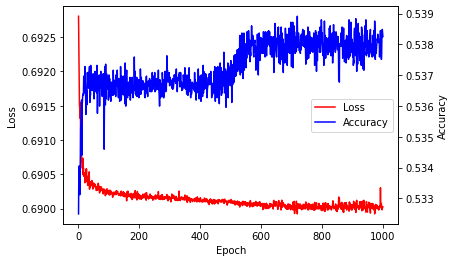

In [20]:
# Visualize Loss/Accuracy
import matplotlib.pyplot as plt
history_df = pd.DataFrame(fit_model.history,
                          index=range(1, len(fit_model.history["loss"]) + 1))

fig, ax = plt.subplots()
loss = ax.plot(history_df["loss"], color="red", label="Loss")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")

ax2 = ax.twinx()
acc = ax2.plot(history_df["accuracy"], color="blue", label="Accuracy")
ax2.set_ylabel("Accuracy")

curves = loss + acc
labs = [l.get_label() for l in curves]
ax.legend(curves, labs, loc="center right")

plt.show()

In [21]:
# Review the model for the test data
model_loss, model_accuracy = nn.evaluate(X_test_scaled, y_test, verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

268/268 - 0s - loss: 0.6910 - accuracy: 0.5336 - 427ms/epoch - 2ms/step
Loss: 0.6910474896430969, Accuracy: 0.5336443185806274


In [22]:
# Exporting the file
nn.save("AlphabetSoupCharity.h5")